## Note that:
The folder, 'DAIS2023CompetitionSubmission_Liu', includes 2 '.ipynb' files, a 'Datasets' folder, a 'BaselineModel_PointNet' folder and a final report in '.pdf'.

You should redirect this file to your working folder by edit the code, "os.chdir(...)".

Copy the test dataset into your working folder, i.e. '/DAIS2023CompetitionSubmission_Liu/Datasets/'.

Then run the whole file.

# **Load Training Dataset**

Here are the plots of all 3D point clouds from 190 samples. Green denotes category '0' and red denotes category '1'.

The number of available samples is 190
[  0   1   2   3   5   9  10  15  17  18  19  20  23  24  25  26  28  29
  32  33  36  37  38  39  41  42  43  44  45  46  48  49  50  51  52  53
  54  57  63  64  65  66  67  70  71  72  74  75  76  77  78  80  82  83
  84  85  88  90  93  94  96  98  99 101 102 103 104 107 108 111 112 113
 114 116 117 118 119 120 121 123 124 125 126 127 128 130 132 133 134 135
 136 137 138 140 141 142 143 144 145 148 149 150 151 153 154 158 159 160
 162 163 164 165 167 168 169 172 174 176 177 178 179 181 183 184 185 187
 188 189]
[  4   6   7   8  11  12  13  14  16  21  22  27  30  31  34  35  40  47
  55  56  58  59  60  61  62  68  69  73  79  81  86  87  89  91  92  95
  97 100 105 106 109 110 115 122 129 131 139 146 147 152 155 156 157 161
 166 170 171 173 175 180 182 186]


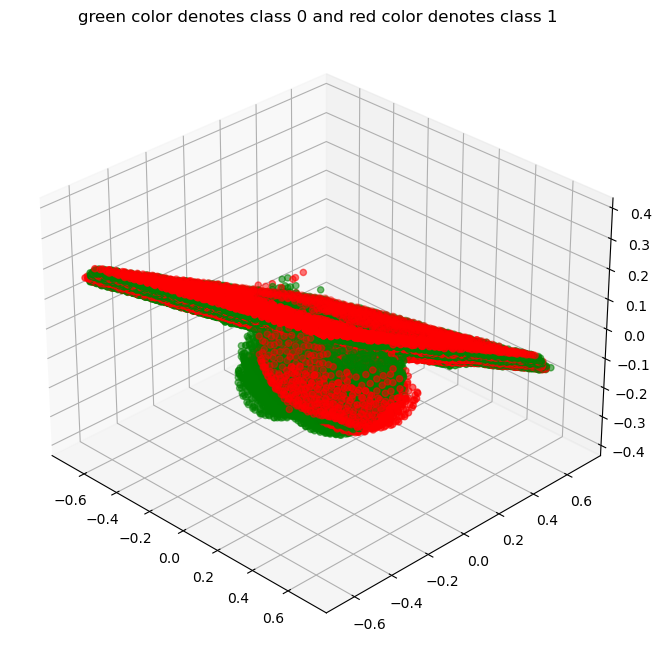

In [7]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import proj3d
from mpl_toolkits.mplot3d import Axes3D

os.chdir('C:/Users/xl037/PycharmProjects/DAIS2023CompetitionSubmission_Liu/Datasets/')
cwd = os.getcwd()
# print(cwd)
test_data_path = os.path.join(cwd, 'train_data.npy')
label_data_path = os.path.join(cwd, 'train_label.npy')

test_data = np.load(test_data_path)
label_data = np.load(label_data_path)

print('The number of available samples is', np.shape(test_data)[0])

index_0 = np.where(label_data == 0)[0]
index_1 = np.where(label_data == 1)[0]
print(index_0)
print(index_1)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
for i in index_0:
  index = i
  x0 = test_data[i, :, 0]
  y0 = test_data[i, :, 1]
  z0 = test_data[i, :, 2]
  ax.scatter(x0, y0, z0, c='green')
for i in index_1:
  index = i
  x0 = test_data[i, :, 0]
  y0 = test_data[i, :, 1]
  z0 = test_data[i, :, 2]
  ax.scatter(x0, y0, z0, c='red')
ax.view_init(30, -45)
ax.set_title('green color denotes class 0 and red color denotes class 1')
plt.show()

# **Tensor-Voting based Segmentation for Reference Surface and Anomaly Surface**

Before using tensor voting method to calculate all the local features, we can use point cloud denoising method to denoise the whole point cloud data. We have prepared the denoising method, but it is not necessary here since that the current data are not noisy after our pre-checkings.

**Tensor Voting Method** for calculating node-wise physical features

In [8]:
import numpy as np
import os
!pip install open3d==0.16
import open3d as o3d
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from collections import Counter


# First, we need to extract the local features of each node using tensor voting method
# For each node, find the k-nearest nodes and then calculate the L (Linearness), the P (Planarity), and the S (Sphericity)
def LocalFeatures(dataset_temp, num_nodes, radius):
  pcd = o3d.geometry.PointCloud()
  local_feature_temp = np.zeros((np.shape(dataset_temp)))
  pcd.points = o3d.utility.Vector3dVector(dataset_temp)
  kdtree = o3d.geometry.KDTreeFlann(pcd)
  for i in range(num_nodes):
    index_temp = i
    radius_temp = radius
    k = 0
    while k < 100:
      radius_temp = radius_temp*1.1
      k, idx, _ = kdtree.search_radius_vector_3d(pcd.points[index_temp], radius_temp)
      # print(k)
    neighbors = dataset_temp[idx, :]
    cov_temp = np.zeros((3, 3))
    mean = np.mean(neighbors, 0)
    for j in range(k):
      cov_temp += (neighbors[j, :] - mean.reshape((1, 3))).T @ (neighbors[j, :] - mean.reshape((1, 3))) / k
    # the eigen decomposition
    Lambda, U = np.linalg.eig(cov_temp)
    Lambda = list(Lambda)
    Lambda.sort(reverse=True)
    # print(Lambda)
    local_feature_temp[index_temp, 0] = Lambda[0] - Lambda[1]  # the L (Linearness)
    local_feature_temp[index_temp, 1] = Lambda[1] - Lambda[2]  # the P (Planarity)
    local_feature_temp[index_temp, 2] = Lambda[2]  # the S (Sphericity)
    print(k)
  # print(local_feature_temp)
  return local_feature_temp

# calculate all the local features of all samples
local_features_all = []
radius_k = 0.1
for index in range(np.shape(test_data)[0]): local_features_all.append(LocalFeatures(test_data[index], np.shape(test_data[index])[0], radius_k))

# print(local_features_all[0])


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


     --------------------------------------- 62.6/62.6 MB 15.6 MB/s eta 0:00:00
  Using cached dash-2.8.1-py3-none-any.whl (9.9 MB)
  Using cached ConfigArgParse-1.5.3-py3-none-any.whl (20 kB)
  Using cached dash_table-5.0.0-py3-none-any.whl (3.9 kB)
  Using cached dash_html_components-2.0.0-py3-none-any.whl (4.1 kB)
  Using cached dash_core_components-2.0.0-py3-none-any.whl (3.8 kB)


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
112
112
115
101
113
111
112
105
121
115
103
105
106
105
118
107
102
106
103
115
110
112
109
101
114
109
117
108
101
118
108
112
115
100
110
108
107
105
101
102
102
102
101
107
117
100
102
103
104
107
100
120
113
108
106
121
104
106
104
100
107
108
102
100
104
102
102
107
103
113
110
111
102
110
105
104
108
118
113
110
109
110
101
108
114
101
111
111
101
106
104
117
104
109
110
101
118
112
102
110
116
118
112
111
125
100
104
112
107
115
107
113
113
111
113
113
103
110
110
109
102
105
111
106
114
104
100
102
100
102
105
118
115
111
105
123
108
111
105
107
109
115
113
101
106
114
115
101
109
110
112
119
107
100
111
109
106
121
115
108
120
103
113
108
101
110
113
120
121
105
109
109
115
108
107
115
104
112
108
110
105
114
101
114
116
121
125
105
109
104
113
101
113
108
102
113
100
108
105
109
118
103
108
109
107
112
101
108

101
110
103
106
107
100
110
106
100
102
101
111
104
111
105
104
107
107
107
100
112
108
111
115
102
102
120
103
103
114
113
103
109
116
112
113
105
104
100
106
107
108
102
109
111
113
114
119
102
103
105
115
112
101
107
109
101
106
103
117
103
111
108
108
101
104
107
100
105
114
103
104
117
112
101
102
106
105
107
107
104
100
115
104
104
110
106
102
101
117
107
109
101
113
105
113
109
116
118
111
107
105
118
109
105
112
108
104
108
100
121
100
104
107
121
108
104
103
115
104
107
106
104
102
128
108
117
109
118
119
119
113
114
111
103
102
104
104
112
104
109
109
115
116
106
114
105
104
106
102
107
100
117
100
100
116
107
114
108
100
115
114
102
103
112
117
110
118
116
114
115
106
118
106
117
108
107
103
105
116
108
114
117
106
108
101
113
102
115
106
100
101
114
118
112
115
114
104
124
118
112
120
104
104
106
110
118
112
109
107
109
107
103
103
100
103
100
112
114
103
105
101
110
117
119
103
107
128
129
101
119
114
116
107
100
109
106
101
107
110
107
103
108
108
103
100
116
101
109
118


116
102
111
117
108
103
117
107
125
101
106
106
128
110
108
115
105
107
111
104
121
106
101
102
100
112
118
114
104
109
101
101
114
101
120
101
100
102
101
102
117
107
120
108
109
111
103
104
105
115
105
107
121
115
100
109
107
101
126
100
102
106
105
118
113
111
104
114
102
114
115
115
100
106
109
114
108
115
108
104
105
109
130
103
103
109
112
107
111
106
104
114
120
105
109
103
101
118
119
108
116
112
104
113
116
109
104
103
112
101
109
100
112
108
103
113
122
120
106
103
100
114
113
109
108
103
116
103
115
106
113
120
110
106
102
112
103
110
102
110
111
119
110
109
103
113
120
107
107
104
103
106
116
102
101
100
104
115
111
117
106
124
106
118
113
113
102
102
113
107
109
116
111
106
115
107
103
117
104
103
118
103
100
110
107
106
107
117
115
113
112
116
100
100
107
104
114
103
111
100
105
110
103
106
107
107
112
115
126
103
112
107
110
122
111
108
106
114
107
108
120
110
114
118
109
102
124
102
104
114
117
107
100
114
109
105
115
120
104
111
107
109
105
113
103
118
108
113
100
108


114
109
105
104
114
107
104
111
119
104
115
100
110
107
103
104
109
102
109
105
107
107
118
100
106
117
108
110
102
110
106
108
103
104
104
112
104
105
103
120
104
109
113
106
101
107
112
116
103
106
124
101
105
119
107
108
110
120
115
112
112
103
105
104
106
108
111
104
103
114
108
109
111
121
111
103
102
105
113
107
118
106
106
113
106
102
114
112
107
106
112
104
107
110
127
114
104
100
101
125
111
101
111
102
113
122
119
126
108
114
112
103
105
119
105
108
109
108
106
110
106
113
107
112
102
103
111
111
100
113
114
117
109
102
110
106
108
108
109
115
108
110
106
116
116
101
106
111
105
105
111
103
108
113
113
105
108
102
102
104
114
112
103
102
110
102
109
116
123
107
104
106
123
102
100
128
101
105
110
103
109
108
108
110
107
108
102
108
104
108
106
111
109
114
105
111
102
113
111
104
119
108
104
101
107
117
103
100
104
110
111
117
102
104
101
108
109
106
100
103
107
104
113
109
112
116
102
102
108
107
107
100
110
106
108
103
103
117
117
136
116
117
112
114
105
105
114
108
111
106


116
103
105
105
110
103
116
108
107
113
109
101
118
101
118
100
101
105
116
104
110
101
118
106
104
106
102
109
122
117
108
106
108
107
101
102
100
103
126
105
105
105
106
114
110
116
102
108
100
105
103
116
112
110
103
114
120
101
110
107
114
106
111
119
100
106
113
101
107
107
103
117
102
102
108
106
113
100
105
121
116
108
104
104
100
108
105
101
116
110
117
112
103
105
112
106
103
100
100
101
117
115
113
122
103
108
103
106
116
102
109
105
107
107
111
127
112
121
101
115
103
112
115
105
104
105
118
109
113
105
112
106
104
110
116
114
106
107
115
106
103
110
116
127
101
115
105
100
106
107
116
107
108
116
106
104
123
101
122
116
107
112
106
102
109
113
101
104
113
107
113
107
107
118
100
104
109
121
102
104
107
105
103
121
118
118
104
105
116
113
110
105
112
110
111
106
117
100
105
109
103
103
107
100
116
103
107
102
106
108
107
108
128
112
107
109
110
113
107
104
110
109
114
104
101
118
110
104
125
121
100
107
101
108
127
106
108
107
116
108
101
101
104
100
106
105
102
105
104
103


116
109
104
108
112
100
113
103
102
109
106
101
100
109
102
109
115
114
108
108
111
108
114
106
116
117
125
103
105
109
109
105
106
111
108
105
101
100
100
100
117
119
109
100
112
106
106
104
109
102
107
101
109
138
101
100
108
101
116
120
120
115
105
118
108
103
102
108
100
129
102
120
105
101
112
103
101
109
100
112
104
104
102
102
100
105
112
115
104
101
100
110
110
104
104
104
114
112
108
100
112
110
128
103
104
112
111
106
115
106
109
114
110
105
105
105
104
101
113
103
119
102
112
101
102
103
100
103
102
118
110
104
116
120
107
109
106
107
111
106
109
105
115
114
106
106
119
105
113
109
111
112
108
103
106
114
102
108
104
110
106
111
103
100
118
113
110
126
107
101
103
112
107
125
105
104
118
107
115
110
119
115
105
118
109
113
113
120
103
121
106
103
102
103
104
109
112
102
106
109
119
100
112
103
121
105
114
103
101
109
110
116
104
104
113
103
117
105
108
122
105
109
110
115
113
100
117
107
107
100
107
111
114
107
101
109
112
114
116
117
115
104
121
107
115
106
108
120
114
105


109
104
109
110
114
104
104
107
105
112
108
106
112
116
112
121
113
101
103
110
108
100
107
101
107
111
102
109
102
110
104
110
107
107
106
110
100
118
120
115
115
110
107
117
115
106
103
115
108
106
110
104
113
119
115
113
113
113
104
103
105
103
116
104
107
110
115
111
106
102
106
111
105
115
126
108
105
113
108
114
119
105
106
102
116
102
114
123
119
127
100
118
106
108
101
120
103
103
104
110
108
105
101
112
107
100
109
114
107
103
116
106
113
104
103
110
103
106
109
102
108
117
104
110
107
114
115
105
100
100
111
103
107
109
105
118
111
124
108
101
104
110
107
101
105
115
104
100
114
108
102
109
104
103
115
122
102
100
106
115
109
106
100
110
105
113
108
109
104
106
103
104
113
105
117
103
107
115
113
103
103
104
104
103
118
109
111
116
113
110
113
112
116
115
106
107
113
108
102
106
125
107
109
111
105
108
105
109
102
115
107
100
110
100
107
121
111
110
114
110
100
106
106
122
102
102
112
104
109
104
110
110
105
110
100
112
104
106
115
109
117
104
110
108
102
103
114
105
111
105


105
110
110
114
110
101
113
111
103
105
107
110
107
107
106
113
100
106
108
116
115
101
105
108
109
108
106
117
111
106
114
109
113
113
101
114
123
110
103
113
103
112
114
108
124
112
101
110
111
116
107
118
110
121
109
114
103
107
106
114
108
100
108
112
109
104
100
111
112
105
115
113
119
102
109
106
110
113
102
104
102
115
113
113
103
107
106
115
104
112
114
111
104
113
111
108
112
104
116
113
119
120
111
114
107
104
101
105
111
103
100
105
117
113
104
119
106
106
103
104
109
112
107
105
105
115
104
119
111
101
108
108
107
110
109
107
108
120
117
101
112
116
106
107
123
103
116
108
115
118
109
106
112
104
107
107
117
116
114
123
111
113
117
105
102
120
100
110
107
111
105
106
107
112
115
107
105
110
114
102
113
104
109
116
107
109
109
105
113
110
100
109
111
100
110
105
104
120
109
103
113
116
102
108
101
101
109
101
110
114
105
110
111
112
105
106
101
112
100
115
108
103
113
106
108
112
111
106
104
103
101
110
101
105
106
108
110
116
101
103
112
121
109
108
101
113
115
100
112
103


119
105
106
102
109
107
109
122
103
105
116
102
107
100
103
109
107
100
104
114
105
116
107
101
107
112
107
110
117
119
103
100
111
112
107
117
117
107
115
100
115
112
121
112
106
108
107
105
119
109
121
107
105
108
107
113
103
105
102
117
108
104
111
115
107
114
113
114
117
106
104
111
105
120
116
108
111
101
114
110
103
106
119
108
103
108
115
111
111
100
106
108
115
106
105
107
105
105
118
106
116
118
105
107
108
116
116
104
106
111
109
102
100
115
100
106
107
105
105
109
101
105
109
113
111
111
113
111
114
103
105
110
104
107
120
104
107
116
114
111
103
107
109
107
113
107
108
102
112
104
116
104
110
114
114
103
109
106
107
113
115
105
110
110
114
103
102
113
107
105
107
108
109
114
105
120
106
107
104
103
111
105
103
104
110
108
113
103
114
108
104
103
106
104
106
112
109
112
110
112
112
104
100
105
110
115
105
118
107
104
104
114
102
109
109
102
112
100
115
109
107
105
107
112
108
103
114
121
106
103
104
112
102
115
110
110
107
107
124
116
103
119
111
104
109
121
104
105
106
106


118
117
114
114
109
119
111
119
100
101
114
118
112
111
108
113
119
102
120
111
113
108
100
106
128
110
109
116
117
114
106
113
103
107
107
110
101
120
109
116
103
101
114
101
110
103
104
121
109
104
108
124
118
111
107
114
102
117
111
110
102
119
114
115
111
105
103
112
106
119
102
111
100
105
110
104
112
103
113
100
115
111
103
110
101
102
105
117
128
107
105
103
103
108
106
104
112
112
111
110
104
105
115
110
100
104
101
109
111
100
115
101
117
112
110
107
107
105
113
111
113
102
121
121
113
108
100
113
105
116
106
106
114
109
101
112
102
116
102
111
105
122
113
103
110
117
117
107
109
102
106
105
113
117
102
103
110
115
100
107
115
104
102
106
121
110
105
103
122
120
117
103
110
102
116
106
110
102
111
102
104
105
101
105
107
109
106
117
102
105
111
100
114
113
114
118
104
110
101
106
107
107
118
108
113
111
117
114
114
122
113
113
107
108
105
104
110
105
102
114
110
120
106
110
115
114
101
125
102
110
100
112
110
110
104
112
102
107
100
110
113
100
102
105
111
116
119
108
109
103


100
100
113
106
103
103
100
119
103
109
112
113
103
114
106
100
106
119
102
108
106
108
109
101
109
100
109
105
106
107
105
106
121
107
112
105
115
105
111
122
102
113
109
107
127
101
101
102
100
135
103
105
114
102
106
124
101
107
117
103
105
124
101
102
120
115
101
117
105
109
110
112
108
114
103
105
102
105
107
109
102
102
100
102
105
108
105
109
107
105
100
107
102
104
105
113
106
109
103
100
103
113
114
112
104
113
109
106
108
103
102
120
106
108
115
102
109
109
111
111
110
103
115
111
107
110
102
100
101
113
116
105
112
108
104
112
112
107
115
106
105
101
105
114
108
111
103
119
104
100
105
111
104
112
102
114
110
108
101
111
106
105
103
112
106
120
106
104
102
120
115
114
106
100
104
102
104
106
103
120
106
113
109
121
103
117
104
101
109
101
105
113
116
110
121
106
100
119
110
119
105
100
117
101
111
109
103
104
105
112
115
104
108
111
100
113
113
109
107
117
106
114
103
115
109
102
106
108
107
108
114
106
112
100
109
106
102
102
101
117
118
109
111
108
110
107
133
116
104
111


101
111
109
119
111
110
109
111
109
107
116
108
110
116
106
113
108
101
111
113
104
112
112
108
102
100
108
109
107
114
118
101
107
105
111
119
104
112
107
116
131
107
122
113
103
107
104
101
109
107
106
115
104
116
110
120
102
122
100
117
105
106
102
114
113
105
111
110
103
107
107
102
100
108
105
115
112
112
101
107
104
111
113
108
105
104
113
100
106
108
106
104
106
109
100
113
100
110
104
102
103
111
111
109
128
101
103
106
103
106
111
106
114
121
101
107
101
116
104
108
115
118
115
122
103
105
106
111
109
110
108
132
111
111
104
103
119
120
109
110
104
118
110
105
115
115
115
111
111
102
105
108
113
112
102
104
115
110
105
111
111
101
105
115
102
104
113
114
100
114
109
111
110
100
108
106
114
101
107
108
100
105
106
108
105
108
108
114
111
103
113
102
103
115
103
117
102
115
111
107
122
112
108
109
109
115
111
106
114
104
105
111
117
100
105
106
103
111
111
116
113
105
106
101
101
113
125
121
102
102
111
102
107
100
102
120
116
108
100
109
101
109
114
110
117
110
109
112
113
111


111
113
107
100
104
109
104
112
108
111
111
102
109
104
106
114
109
110
110
112
100
120
111
100
118
113
110
105
107
105
114
110
106
105
101
107
112
116
102
111
104
100
107
109
109
109
100
108
103
110
109
109
111
105
130
103
107
108
104
106
112
102
107
106
106
106
106
114
107
121
104
100
121
110
110
104
114
113
103
114
104
100
108
108
100
111
101
102
102
103
111
116
104
105
100
103
101
110
118
117
115
111
116
106
107
100
101
102
118
100
117
106
102
118
107
103
106
118
119
119
111
103
109
105
101
111
102
105
103
108
101
122
107
101
103
112
119
104
108
108
106
102
101
106
105
106
112
107
115
105
112
106
105
100
114
105
106
121
106
104
100
123
102
114
100
109
108
115
107
103
111
114
101
123
107
116
108
113
108
104
108
119
109
104
102
104
107
114
102
111
115
117
110
104
107
121
108
103
100
104
102
110
114
116
109
115
116
108
109
103
104
109
105
101
115
103
106
108
114
100
113
111
113
107
110
102
110
109
115
104
100
108
112
103
105
100
112
115
112
105
105
114
111
110
100
103
106
106
111
114


109
114
107
105
106
111
100
116
102
111
104
112
111
121
110
108
110
103
106
108
120
103
110
111
108
113
111
111
101
118
104
115
123
109
108
114
120
105
110
107
106
104
116
115
125
107
124
100
112
123
103
101
116
110
105
101
108
107
119
115
103
115
103
115
112
109
108
118
109
112
112
106
108
110
114
115
116
115
108
109
112
113
118
113
123
112
120
123
113
114
104
116
113
110
116
107
120
109
108
120
104
110
115
108
111
107
107
109
103
114
107
101
110
116
111
111
110
100
112
104
111
107
116
118
104
111
102
101
113
112
100
100
106
109
108
117
104
111
116
104
115
104
114
123
108
112
107
112
111
110
107
126
113
112
117
100
114
106
105
102
103
114
120
115
114
112
116
116
101
109
104
103
107
106
110
112
110
106
105
110
122
104
113
117
115
102
115
106
114
114
109
109
116
109
102
117
102
112
109
109
116
112
114
111
111
105
108
121
107
109
113
112
109
114
110
108
101
114
102
110
104
102
110
111
112
118
116
111
116
111
115
108
101
111
111
113
112
108
113
109
112
105
112
107
122
112
107
107
101
100


110
119
105
107
100
117
102
107
108
107
100
113
113
103
105
134
106
106
106
102
113
104
102
107
120
116
106
124
106
103
109
107
103
101
107
102
110
104
113
106
108
103
107
106
137
103
108
109
102
115
109
108
113
105
102
107
105
112
112
104
103
114
103
103
102
111
107
109
122
100
104
105
109
109
108
106
106
108
114
107
113
110
108
105
107
105
119
103
101
111
115
113
102
112
106
117
108
114
101
100
113
108
103
118
112
109
106
106
111
105
109
109
118
110
111
100
122
114
118
102
117
102
111
104
103
106
108
105
117
106
109
127
108
117
101
119
103
104
101
111
111
106
100
109
103
112
105
102
115
112
102
105
105
100
100
110
111
107
108
109
116
104
113
107
106
107
112
106
122
101
113
104
100
118
109
111
110
125
101
106
106
118
105
114
113
124
100
102
100
106
114
107
106
115
107
102
121
114
108
109
115
111
109
102
111
111
106
111
105
105
112
112
109
107
107
114
111
109
108
111
116
108
100
114
107
102
103
112
115
105
106
121
111
108
105
110
113
111
106
105
102
103
111
113
102
109
106
107
105
118


116
108
103
114
101
103
105
118
104
102
102
112
110
112
104
116
108
105
105
106
100
118
107
112
110
102
105
117
121
104
113
110
111
109
105
108
101
108
109
104
117
105
110
101
113
108
101
110
111
110
102
109
108
113
120
103
114
107
113
116
107
117
104
103
106
113
113
100
120
103
107
110
109
111
113
110
106
106
102
102
108
108
100
114
107
101
107
117
101
114
110
118
100
107
111
110
105
121
116
108
102
107
112
105
113
102
111
103
112
107
111
104
107
108
118
115
107
107
103
101
108
118
114
104
107
104
110
103
114
101
108
117
113
104
112
109
111
106
106
112
104
114
109
102
106
103
114
118
102
102
105
109
105
105
103
105
105
114
104
124
108
102
105
106
110
108
111
113
111
113
104
114
127
105
104
107
114
109
100
112
105
110
106
100
109
110
123
117
109
107
113
116
110
112
116
104
108
103
116
107
117
110
107
102
115
114
112
109
123
110
110
117
105
103
105
104
113
106
101
104
118
114
104
124
114
102
113
108
108
115
118
115
113
110
110
103
102
108
111
109
103
101
119
109
108
111
119
104
107
110


111
103
103
110
108
109
108
107
109
106
109
113
123
104
109
110
107
114
103
103
102
109
100
106
100
104
114
100
104
101
110
116
118
113
107
112
128
110
104
108
102
104
106
111
103
111
105
107
103
102
112
113
114
106
107
100
102
107
100
100
114
115
101
114
112
105
102
112
116
110
107
121
109
105
114
117
100
117
105
111
102
110
116
109
116
103
100
109
101
102
115
109
110
104
101
105
108
109
113
111
106
117
111
112
111
108
105
106
108
114
114
111
105
112
113
100
102
113
106
106
120
101
109
115
106
114
105
103
106
126
105
113
101
108
101
105
104
116
100
114
112
100
109
113
108
111
105
109
112
114
101
106
119
103
106
111
118
118
110
101
106
112
105
106
116
120
109
102
104
117
100
116
111
106
106
117
116
102
108
119
113
108
109
108
114
112
104
107
109
106
106
120
106
110
103
104
113
103
114
110
114
110
103
105
112
104
112
119
112
100
112
105
104
107
105
113
101
109
106
115
113
103
111
118
115
106
115
118
111
127
103
104
118
107
108
113
107
116
119
111
115
106
107
112
114
109
114
105
120
100


108
105
113
112
104
108
119
103
112
113
109
115
105
109
108
115
110
110
111
113
100
111
113
102
105
102
106
108
111
101
105
106
115
102
115
110
111
112
107
112
106
114
102
106
113
109
105
114
104
107
101
103
118
116
118
107
108
110
106
100
107
112
107
108
110
113
106
108
115
104
106
113
111
107
113
108
120
104
107
104
106
116
104
111
107
114
101
123
110
108
109
126
100
113
104
103
109
118
103
116
113
114
102
109
111
109
107
101
105
102
112
100
104
111
110
109
102
111
107
100
106
111
103
111
109
110
111
112
109
115
112
107
100
114
116
114
113
113
112
113
114
100
109
109
106
107
102
113
104
113
102
115
107
100
106
112
114
122
104
112
114
114
118
109
112
101
109
110
109
114
114
120
112
107
116
113
105
103
109
113
112
108
108
104
108
109
100
110
113
117
117
108
119
103
102
115
113
106
114
109
104
110
105
112
118
109
112
107
118
102
108
110
110
111
115
103
120
113
114
107
108
117
109
112
101
115
115
108
100
104
103
107
107
108
110
119
113
104
104
112
117
109
110
119
107
101
110
103
111
102


111
115
108
112
107
112
107
116
119
109
112
122
123
107
110
109
105
107
102
117
104
113
106
112
108
104
103
109
103
105
112
102
105
106
101
102
114
121
110
106
107
119
115
106
109
105
100
108
106
109
102
106
105
100
118
101
119
108
109
100
117
105
110
105
112
100
110
111
102
115
105
105
101
102
104
103
101
106
106
107
111
109
103
108
116
112
110
113
114
106
100
112
108
109
127
117
110
103
119
115
109
101
120
110
109
101
108
107
106
109
112
102
117
111
108
111
103
103
101
118
116
112
108
107
107
109
104
115
110
101
115
113
113
103
106
104
107
106
111
102
114
116
110
110
115
111
107
110
102
102
117
103
107
113
139
109
100
104
111
108
107
105
110
103
108
111
111
103
102
113
111
112
104
111
113
106
119
109
103
111
110
107
112
104
111
108
111
110
116
108
104
102
110
102
109
113
109
116
104
104
109
109
119
111
115
103
108
111
102
109
100
112
102
120
106
103
105
112
103
105
105
100
108
111
104
114
112
104
111
125
108
103
103
111
106
114
111
111
110
108
109
103
100
111
112
119
112
111
100
103


111
109
104
122
110
100
113
112
107
103
116
103
108
115
112
122
106
101
111
101
103
105
107
113
104
110
119
121
116
111
103
100
111
101
105
111
113
117
119
110
105
107
106
102
109
114
110
108
115
100
104
108
110
116
115
117
100
108
110
112
110
111
119
111
115
115
116
117
105
112
113
102
107
114
111
110
101
113
103
108
109
115
106
120
112
108
102
101
106
111
106
109
103
107
101
102
104
112
103
111
102
116
121
130
105
114
109
111
113
105
113
111
107
119
108
100
108
118
111
105
105
114
102
116
101
107
112
105
106
114
117
109
108
103
103
105
108
105
126
117
100
110
115
120
108
107
121
121
107
115
114
118
109
111
120
114
117
104
100
102
115
108
110
107
116
105
105
110
107
108
114
113
109
100
106
106
109
113
105
113
102
115
112
100
106
138
126
108
103
106
119
101
114
100
111
100
109
108
106
116
107
116
103
107
115
115
105
108
105
103
100
102
108
107
116
101
108
119
100
107
110
111
135
120
124
110
103
118
108
105
104
103
104
114
115
101
108
113
124
108
113
114
106
107
105
104
105
119
111
110


105
107
109
107
103
111
115
115
115
102
103
120
110
113
111
114
109
104
109
113
103
105
115
110
109
113
102
107
102
115
103
107
114
106
103
115
111
108
104
111
108
109
100
108
104
112
115
110
109
106
102
107
109
106
123
114
121
113
114
107
109
102
106
102
106
107
104
115
103
103
108
100
115
100
104
104
111
101
100
115
115
110
111
101
109
113
111
109
116
112
121
107
112
103
125
103
121
105
113
102
104
107
115
118
111
116
107
109
105
111
107
100
111
111
104
117
120
105
108
106
102
124
109
119
104
109
114
122
106
105
103
108
102
111
112
112
105
116
113
113
111
112
116
120
115
103
112
103
118
100
104
101
121
104
109
106
101
111
105
109
113
109
101
100
107
121
104
111
103
116
105
107
103
105
108
114
109
111
113
107
111
105
113
113
110
111
107
104
114
114
111
110
107
116
113
110
109
123
101
113
106
118
108
102
111
100
103
112
119
115
104
117
102
112
108
101
102
114
101
110
109
128
109
116
103
103
107
109
110
110
121
102
114
104
110
104
106
106
115
101
110
119
113
107
116
114
101
113
105
113


111
109
101
103
107
108
107
102
101
110
104
122
108
113
113
114
120
108
107
110
109
111
106
101
102
118
106
106
107
140
104
102
104
119
109
108
101
106
120
102
111
110
102
105
105
100
118
111
110
107
107
110
104
110
104
107
104
107
110
109
106
124
100
110
119
102
111
105
106
108
124
106
110
114
106
103
108
108
102
126
104
110
107
104
108
105
119
110
111
104
106
101
116
100
106
105
109
119
112
107
100
122
103
118
111
107
117
115
107
103
103
105
100
107
109
107
109
105
114
106
124
117
105
100
112
108
103
103
103
125
106
114
101
101
104
110
106
102
107
108
110
106
115
100
110
104
112
105
111
106
103
103
102
106
101
100
108
107
102
100
119
103
101
106
108
105
106
105
101
114
110
105
111
106
107
117
109
109
107
101
111
108
103
110
120
110
107
106
117
107
121
106
110
102
100
106
109
108
101
106
111
106
104
114
113
111
105
107
110
100
102
102
104
114
110
111
124
110
106
109
104
101
110
114
113
101
103
105
116
103
101
121
114
117
105
103
104
108
112
102
123
108
101
110
116
112
109
112
111
107


110
114
104
119
105
100
102
102
111
111
102
101
106
105
102
104
101
105
120
114
106
106
105
113
105
101
105
105
110
109
110
100
104
114
110
106
100
117
105
110
114
108
104
106
104
117
107
107
116
100
107
107
110
109
107
114
103
100
104
101
106
103
108
117
104
102
101
109
123
100
112
113
107
104
106
117
101
101
112
111
125
105
106
111
104
109
116
102
109
102
109
101
102
111
109
107
122
104
110
110
116
101
106
106
102
100
101
103
101
107
105
115
106
101
117
104
112
124
107
108
112
101
104
103
108
107
113
116
104
108
102
102
115
121
101
107
106
114
113
108
111
117
100
107
114
114
103
108
112
105
105
108
112
104
100
110
100
109
113
102
108
103
114
116
107
118
107
103
113
115
119
108
103
107
115
115
108
110
114
118
106
106
108
107
112
103
124
126
103
110
110
112
108
103
104
109
105
103
116
117
109
116
104
107
110
105
103
105
115
107
111
102
109
106
111
110
113
117
112
118
101
104
111
123
103
104
100
111
112
111
103
115
111
111
109
123
119
102
114
115
114
112
112
106
108
109
103
108
100
124


107
119
104
111
118
103
120
106
115
101
110
109
115
101
111
104
109
114
101
116
111
114
114
109
107
105
108
100
107
104
110
100
106
108
127
104
112
112
106
111
103
102
112
105
102
100
102
100
103
108
110
114
113
111
103
114
110
115
101
108
100
114
111
109
100
120
101
114
109
102
101
108
104
105
121
101
116
102
101
102
109
122
123
103
108
108
124
104
100
102
111
100
101
111
112
105
103
118
107
100
104
101
104
120
104
113
113
109
109
107
114
107
104
109
104
107
103
108
109
101
117
113
101
108
109
104
110
107
103
102
107
102
101
102
116
114
102
107
109
105
112
116
121
101
110
101
106
104
113
102
108
107
101
104
110
114
112
102
109
109
112
108
115
112
102
114
104
108
114
106
106
120
116
114
121
108
100
111
109
111
103
121
130
104
105
120
116
106
116
112
101
111
117
100
104
111
114
118
101
113
104
120
103
110
106
110
107
111
108
116
105
101
108
106
106
109
114
111
109
115
110
106
118
110
104
116
109
115
105
100
111
101
101
113
105
106
112
101
117
102
114
113
103
108
105
105
119
103
106
113


116
111
105
108
110
117
114
105
102
103
110
115
116
113
113
128
112
106
102
109
106
108
112
102
103
128
109
113
107
106
109
114
111
110
101
110
110
111
113
109
116
103
110
108
114
109
114
103
112
113
103
101
104
102
113
103
108
103
123
108
110
103
110
114
103
111
106
113
101
103
106
113
112
113
116
107
106
114
106
109
113
101
121
108
106
108
108
106
109
112
113
109
106
106
114
108
113
112
105
115
110
117
101
110
103
119
105
109
108
108
109
101
105
112
114
111
113
102
107
104
108
105
103
109
100
109
105
110
119
110
107
113
107
106
116
104
100
107
111
104
113
112
113
106
105
105
113
103
107
105
104
113
120
114
112
119
112
106
111
104
108
112
100
102
103
105
113
114
103
115
105
115
117
112
105
108
114
118
105
116
111
113
113
109
112
102
121
105
118
124
110
110
109
114
111
113
105
103
100
108
104
118
100
115
121
107
114
110
101
113
105
125
111
116
113
100
105
100
117
112
121
120
105
110
109
107
109
103
109
104
102
112
110
112
103
112
109
111
108
111
108
104
110
110
100
108
107
104
115
106


100
104
117
114
102
102
115
115
101
112
118
117
101
102
107
108
108
107
116
118
113
116
104
111
108
104
120
100
106
112
108
100
101
101
111
120
106
108
116
103
107
106
101
100
104
107
124
115
108
107
101
106
101
103
108
114
116
121
100
110
117
109
108
100
107
117
106
109
117
118
102
112
107
117
105
110
104
114
113
111
104
116
107
109
101
107
100
106
101
105
109
103
112
112
112
113
105
104
101
110
105
104
103
100
104
103
115
108
102
112
115
113
107
107
106
106
115
123
107
112
113
119
111
110
108
100
105
108
102
106
103
111
106
118
111
117
114
102
114
106
112
104
106
104
120
121
106
108
110
111
100
110
115
103
110
114
106
112
108
100
113
113
104
114
103
105
110
109
106
103
110
117
100
112
102
104
107
103
116
120
120
109
106
101
118
104
107
117
102
109
100
113
108
104
100
100
103
102
107
100
104
112
101
104
117
101
112
103
102
107
114
108
102
109
114
107
116
107
119
109
108
103
110
116
109
113
112
107
110
120
116
108
106
107
108
117
111
102
113
112
113
106
109
108
103
114
109
111
101
110


111
102
115
122
109
104
121
106
110
108
124
113
101
102
107
107
130
110
109
101
109
104
100
117
102
110
114
111
106
106
101
125
100
117
110
107
117
103
105
106
114
109
112
110
109
118
104
122
105
117
109
105
108
105
116
104
110
110
105
108
101
105
111
111
108
104
104
118
104
113
118
120
111
110
108
106
105
104
109
116
107
101
111
110
106
108
105
100
108
112
126
123
111
101
106
103
104
104
111
114
111
107
113
105
100
105
107
104
104
102
104
124
111
100
109
119
100
110
114
110
107
123
109
106
106
131
100
101
116
101
111
102
106
109
109
111
109
102
116
119
114
108
110
106
104
109
124
101
108
114
108
112
114
101
101
102
107
118
112
115
122
116
112
106
102
105
102
119
105
113
106
105
105
110
107
108
114
101
103
111
111
108
112
120
111
102
118
106
106
104
104
103
113
102
111
104
100
111
102
111
125
111
120
115
110
115
108
123
110
103
101
112
111
113
107
114
102
105
116
102
105
111
113
112
116
102
107
106
104
100
100
112
107
110
105
114
113
107
104
108
107
111
113
106
109
121
113
113
102
103


107
121
112
101
116
114
103
117
123
108
100
106
106
113
106
105
107
124
110
120
110
106
106
103
104
111
104
109
110
104
110
114
116
101
100
111
122
103
105
104
105
108
124
100
104
110
113
107
105
114
101
101
103
115
103
106
113
118
112
112
101
106
104
118
118
128
109
102
110
115
102
101
108
116
112
106
105
101
100
112
111
108
102
101
121
113
105
102
106
122
105
100
100
100
101
106
105
104
104
103
106
111
101
111
108
105
113
111
107
117
117
102
104
102
108
112
101
116
106
106
110
108
120
104
117
119
119
107
113
105
114
122
104
110
102
119
108
109
119
107
105
118
108
100
103
114
117
102
107
107
117
103
103
107
128
119
115
101
112
118
115
113
108
105
103
108
108
109
122
101
105
105
101
104
111
112
109
114
114
107
110
113
110
107
118
115
103
103
107
116
109
115
110
103
123
108
111
106
117
112
108
106
110
117
101
101
120
105
116
102
108
111
114
109
110
117
101
117
116
119
111
118
107
107
111
101
102
115
114
108
117
110
108
103
103
102
101
103
111
111
110
112
102
109
100
105
108
122
122
100


112
115
111
125
104
101
114
104
100
106
101
113
102
100
101
104
107
111
104
111
124
103
100
111
108
101
114
111
101
106
101
123
105
111
114
106
106
114
119
101
103
118
107
101
100
104
115
105
104
100
122
118
106
115
116
109
102
106
100
108
115
104
104
116
111
112
111
104
112
109
101
107
113
115
104
120
109
107
114
101
101
101
110
102
112
104
104
110
106
109
107
103
100
117
102
102
121
112
115
116
105
103
115
100
106
114
121
108
111
112
102
103
101
109
112
117
111
100
110
128
101
113
103
101
106
114
110
106
104
123
100
114
112
112
115
113
100
113
105
110
110
107
107
102
104
108
109
106
116
112
113
110
110
108
105
108
100
113
105
106
105
110
108
105
103
103
111
100
107
113
112
105
111
105
111
104
106
115
106
102
116
118
105
108
108
107
115
100
110
104
102
120
115
100
112
103
114
104
118
108
109
106
107
112
112
107
103
107
100
107
118
116
104
107
108
109
105
116
117
101
102
108
102
107
115
106
104
107
106
103
112
117
108
110
106
115
113
119
100
114
110
106
100
109
104
113
103
110
104
118


114
100
115
109
113
109
118
105
104
115
100
109
108
103
115
104
119
114
113
117
113
115
109
108
101
108
110
109
114
102
107
112
110
109
108
101
110
116
109
108
111
112
118
108
115
100
102
109
110
122
118
106
111
112
109
106
120
107
117
111
119
115
111
106
126
105
103
114
124
109
105
100
102
107
106
107
120
110
116
108
101
116
107
104
113
116
115
114
110
112
106
110
104
121
100
118
108
108
110
113
107
103
118
119
115
117
112
113
105
111
101
116
106
102
112
121
106
110
111
113
111
110
101
102
106
112
102
111
111
117
105
109
112
114
101
108
112
108
114
100
117
112
110
108
107
102
115
104
119
111
108
107
104
108
104
114
105
114
112
110
108
108
113
106
113
110
114
104
104
100
113
122
108
104
109
116
107
112
119
107
105
108
116
113
107
107
107
125
113
107
111
106
104
119
110
104
109
103
109
107
112
101
100
120
107
101
103
107
121
103
108
112
120
106
110
109
106
100
116
114
110
101
109
107
120
101
109
111
109
103
110
103
106
110
116
108
100
107
121
112
112
102
102
117
106
111
104
106
108
112


107
115
121
107
113
108
115
108
104
104
103
109
109
113
109
111
107
110
102
102
104
106
108
109
103
102
104
111
109
108
107
107
102
102
110
116
114
111
107
108
108
108
106
102
103
101
113
114
111
106
109
101
106
104
114
119
105
101
106
109
114
114
120
105
110
114
112
100
103
107
106
104
115
108
108
105
101
111
107
103
100
111
109
117
115
102
101
102
112
114
108
111
113
111
106
108
111
103
104
111
110
105
119
113
107
107
111
107
106
103
101
114
108
127
114
110
116
115
112
109
101
111
106
105
114
114
103
107
114
105
107
102
101
106
104
100
106
112
105
121
127
106
105
107
122
104
106
112
103
109
110
106
111
107
110
110
113
108
106
103
122
113
110
101
123
107
105
103
101
126
102
107
114
101
113
102
108
103
111
109
103
105
100
114
107
111
123
111
111
109
115
109
109
112
103
109
111
105
107
107
110
110
106
110
102
100
109
120
101
109
120
103
105
113
102
107
112
108
119
115
104
108
113
109
105
108
105
114
107
107
115
102
101
115
110
102
111
103
107
103
115
101
122
109
110
100
107
103
110
118


105
105
118
115
118
116
102
100
122
101
112
101
107
125
108
113
106
103
102
120
100
124
112
103
105
106
105
100
104
109
119
106
113
107
110
128
106
105
120
119
100
109
101
111
104
101
112
100
117
104
106
102
105
114
100
104
107
104
100
136
100
108
114
107
116
108
107
127
106
106
108
120
100
104
109
103
108
119
105
120
102
100
102
107
120
103
111
112
105
104
114
114
104
106
109
108
104
102
111
118
100
113
101
103
109
117
115
108
106
107
116
121
116
103
102
109
117
104
103
111
112
111
102
107
102
118
114
103
103
106
114
105
101
113
110
109
109
109
104
100
115
105
107
118
102
100
104
103
110
112
102
101
106
110
111
107
101
111
112
101
108
105
119
119
102
103
110
104
110
100
100
112
112
105
108
106
106
110
104
100
119
102
108
100
112
133
107
117
104
120
110
115
119
108
104
111
103
111
109
103
109
101
107
100
112
101
107
112
111
120
105
116
109
105
107
104
119
109
115
108
116
124
108
103
101
102
110
106
101
103
116
102
113
119
101
107
105
104
111
107
112
113
113
103
105
107
104
119
104
102


113
109
100
111
101
112
102
118
115
114
115
111
103
100
101
100
104
104
117
103
102
110
103
101
118
101
110
107
114
104
105
110
114
109
102
105
108
108
107
109
106
100
102
102
103
100
103
108
112
106
101
108
102
102
106
121
110
102
120
119
103
101
102
118
115
100
125
103
100
118
116
104
113
102
106
102
106
103
107
124
101
112
104
115
103
102
105
109
111
116
107
100
104
102
100
114
106
105
110
111
103
107
105
113
108
110
110
107
106
103
117
105
109
109
105
102
124
106
115
117
107
102
109
103
110
105
111
111
102
116
113
115
115
112
104
116
112
104
103
100
111
104
108
111
114
115
111
106
102
108
112
112
117
109
101
103
109
111
108
108
116
106
106
113
109
120
104
110
111
114
120
102
106
104
108
109
111
112
108
111
110
105
109
106
102
103
109
108
110
106
100
113
100
107
109
100
105
103
106
106
105
103
118
103
109
106
118
104
111
106
123
102
117
110
118
106
101
105
107
110
101
105
109
118
101
102
106
115
105
117
115
103
105
113
115
104
111
114
101
107
109
106
117
105
117
102
107
110
101
111


126
103
108
110
102
115
111
114
111
104
110
107
107
104
102
102
111
107
108
110
130
100
106
106
108
119
112
110
106
112
114
117
100
109
105
103
110
105
114
110
113
118
104
118
107
111
117
103
116
107
101
106
103
103
120
106
109
101
119
121
106
119
104
106
104
112
109
119
112
103
102
100
104
111
112
103
103
115
104
113
110
106
105
112
109
103
123
101
100
117
110
104
105
104
110
108
112
102
101
102
100
112
103
101
106
102
109
100
110
101
105
113
105
121
107
101
103
108
114
102
119
108
102
105
106
102
112
106
109
104
106
104
114
113
103
103
111
115
109
110
114
114
103
107
112
114
111
116
103
116
119
118
105
109
111
110
104
121
110
110
116
106
107
104
108
108
103
106
104
103
105
102
103
100
103
107
108
103
116
114
103
122
109
105
105
100
117
111
105
123
114
108
108
114
109
108
111
104
105
102
110
112
115
102
110
103
106
115
107
108
114
107
109
114
114
111
108
103
126
100
101
101
107
108
105
103
108
113
118
109
108
114
109
105
105
112
106
116
114
105
101
115
109
105
104
115
115
103
105
104


110
109
112
113
101
113
106
108
100
104
109
106
115
101
120
111
110
110
105
108
108
101
114
108
112
112
113
106
129
107
109
102
110
124
100
102
116
100
102
104
118
112
108
101
109
110
112
113
104
116
104
105
105
117
111
112
109
123
115
111
119
113
109
104
119
110
119
102
116
109
110
101
111
107
103
104
109
104
102
112
108
111
114
113
119
104
104
107
110
117
118
117
108
106
113
118
115
100
101
101
108
110
122
115
109
117
111
112
114
115
102
111
102
112
112
101
115
107
106
101
111
108
103
111
104
104
117
109
105
105
111
106
113
112
101
113
103
105
102
102
104
120
110
112
115
104
110
104
100
107
108
101
100
105
104
108
102
104
109
112
108
116
115
114
109
105
102
108
113
107
105
100
109
104
106
114
112
109
116
105
113
112
100
113
101
106
118
109
113
106
106
105
117
111
102
113
113
100
106
109
116
114
121
111
110
114
106
102
107
105
111
105
104
118
108
111
109
104
107
108
112
113
105
103
102
119
109
111
104
111
115
100
113
104
104
105
101
111
115
118
112
111
101
112
112
113
107
115
105
121


108
120
105
118
114
112
102
104
107
106
117
118
119
113
108
108
112
107
110
105
111
102
100
121
115
112
103
111
102
121
108
110
115
106
112
109
111
104
105
107
108
104
101
104
104
101
108
107
105
102
107
114
118
100
109
108
103
100
110
114
110
112
109
116
102
101
108
106
110
115
100
101
113
105
101
115
110
117
102
109
103
105
115
116
108
114
100
108
107
103
106
100
117
113
115
103
100
102
117
111
114
108
105
103
123
116
111
102
100
106
110
116
101
106
108
123
113
109
109
108
107
106
106
115
115
116
111
113
101
108
124
110
101
106
120
108
103
106
106
105
101
102
114
105
108
111
107
105
110
107
102
116
102
115
101
103
103
100
104
101
110
106
103
103
115
115
104
112
113
123
102
104
105
108
105
112
103
107
114
125
105
115
105
105
114
105
103
118
112
116
113
117
103
114
103
106
115
102
120
103
105
104
109
116
117
103
109
103
114
104
105
109
102
107
110
116
110
101
104
115
105
114
103
101
106
104
110
116
116
101
110
103
100
113
118
114
101
116
102
109
117
111
120
105
120
105
108
109
110
103


111
114
104
106
107
107
102
112
107
114
114
107
102
113
105
107
112
116
101
115
110
106
112
109
108
117
105
108
103
100
108
102
106
117
109
107
103
105
114
112
115
100
119
109
103
104
105
115
110
112
101
112
108
110
105
100
102
102
111
112
113
107
113
110
117
104
109
113
105
112
112
109
100
108
105
109
102
115
102
100
100
105
105
102
104
113
108
106
116
106
111
103
118
111
102
113
103
102
112
100
114
110
126
108
114
107
113
112
107
102
109
112
108
101
109
108
113
103
107
117
112
114
105
106
113
120
118
113
100
100
114
109
113
104
114
109
119
113
102
116
120
113
117
110
115
110
102
112
117
102
108
115
113
122
104
107
112
109
100
116
108
109
113
104
114
101
110
100
108
104
101
109
107
101
112
111
110
106
103
105
105
123
105
114
102
115
115
126
100
115
112
103
122
102
111
113
101
114
105
111
104
110
113
108
116
109
110
114
115
102
114
109
118
118
112
116
108
110
116
102
113
119
122
111
108
101
114
119
104
100
101
115
106
105
110
113
114
115
108
110
105
117
115
110
113
119
113
109
100
108


106
102
113
107
123
109
100
109
102
102
105
115
113
120
102
109
104
107
109
116
100
105
111
108
113
104
103
106
111
104
101
109
109
100
102
104
111
108
102
100
114
103
101
107
108
115
103
110
102
108
102
109
107
113
104
100
104
104
115
110
126
114
112
103
127
105
109
114
111
113
104
104
107
105
107
116
120
102
112
125
103
103
104
102
115
122
110
102
109
112
128
107
103
112
104
109
108
114
103
107
111
105
108
106
120
106
101
115
113
110
106
109
105
105
106
106
104
108
105
106
111
111
115
101
108
105
106
100
113
115
123
106
113
108
111
100
107
105
111
107
102
103
124
112
102
105
102
101
106
102
100
107
112
101
112
100
105
101
105
111
104
119
111
109
100
114
109
108
112
103
100
102
117
111
113
118
104
100
109
101
111
101
102
117
108
105
103
104
105
118
117
106
104
116
106
101
113
114
100
112
101
101
112
122
106
102
101
112
112
105
105
103
101
125
112
113
113
112
110
104
112
109
105
121
108
109
109
101
121
107
116
114
106
105
115
106
107
111
108
108
100
114
111
106
111
115
108
111
120
117


102
102
100
114
100
116
111
125
106
112
109
106
112
111
112
109
114
103
110
102
110
100
116
112
106
112
121
104
123
100
108
104
108
106
118
106
130
114
110
110
117
113
117
103
110
115
103
115
111
105
113
115
111
111
107
112
111
109
103
114
104
114
100
104
120
109
111
100
107
110
112
115
106
114
116
110
101
100
107
115
103
101
114
104
118
113
104
113
105
101
110
103
110
104
108
102
111
112
111
118
104
107
119
119
104
100
114
104
117
108
105
107
102
110
101
108
116
105
115
112
121
101
105
113
105
120
107
108
108
100
104
105
112
100
106
116
106
108
109
103
106
105
108
109
100
103
107
105
101
121
105
101
112
100
107
117
100
124
100
107
105
103
127
119
114
107
107
129
114
108
108
114
110
102
100
105
107
105
105
117
110
100
104
105
111
111
108
107
111
100
117
101
114
101
102
113
107
111
113
107
100
116
112
100
109
108
111
108
112
102
107
103
104
106
105
105
112
114
102
110
106
110
104
105
100
114
117
112
104
112
111
100
101
115
109
119
115
100
106
103
119
103
111
110
108
106
109
102
116
104


115
117
121
117
112
103
104
110
107
115
116
101
109
107
100
104
113
110
104
115
114
100
104
111
102
104
110
105
116
113
115
121
108
109
102
108
113
110
100
110
102
100
101
107
106
105
106
102
108
107
101
114
101
104
114
101
111
106
106
119
103
115
106
110
109
111
102
106
116
107
113
119
114
105
104
113
110
112
101
109
107
108
111
106
122
113
113
107
110
122
100
106
100
104
101
120
117
109
103
112
103
103
101
106
102
104
106
108
115
107
101
108
106
101
107
113
109
118
105
115
102
114
115
126
111
108
118
109
101
101
103
108
104
113
109
113
105
110
105
108
114
105
105
118
103
102
102
104
107
103
103
102
104
114
101
110
107
114
101
106
105
110
104
108
112
110
106
101
100
106
127
120
105
102
107
101
107
109
109
117
101
116
109
103
107
101
117
113
103
103
118
103
101
103
100
119
129
100
105
105
109
109
103
113
100
106
118
110
111
109
105
113
110
121
103
122
103
116
109
107
101
107
110
117
104
102
111
108
101
111
103
113
116
104
108
109
114
107
140
109
111
113
109
102
115
105
105
100
102
106


101
104
102
108
106
101
111
102
101
106
111
109
107
106
104
112
102
106
105
107
106
102
110
115
111
105
114
102
104
111
120
104
115
102
103
125
121
102
117
114
109
107
115
102
108
119
122
106
105
113
105
108
106
117
103
107
103
101
104
101
114
101
107
105
105
102
100
103
108
120
118
104
101
102
111
105
100
106
127
113
127
106
103
104
105
108
107
124
109
109
107
100
103
103
113
112
105
101
125
108
117
106
102
106
104
108
105
106
104
116
101
110
116
107
118
107
102
111
111
108
102
107
102
111
102
103
112
106
105
104
109
103
116
107
102
105
120
102
103
105
103
105
115
113
102
120
110
100
116
114
105
113
120
112
110
109
111
109
100
104
111
122
108
120
111
104
102
100
101
112
123
116
109
106
109
101
117
103
107
117
101
121
112
106
114
120
115
100
108
115
100
108
110
117
100
105
108
111
102
116
104
108
110
124
113
114
119
121
106
107
110
101
124
101
104
111
118
115
107
109
102
103
110
124
114
101
106
114
100
106
109
109
100
105
100
111
106
108
111
109
111
114
102
113
105
108
104
101
109
111


106
106
101
117
103
100
108
102
103
111
104
101
121
112
104
103
111
103
106
101
108
109
106
110
105
110
106
114
102
111
124
119
111
102
112
105
110
103
116
102
122
100
113
101
105
112
118
107
111
101
119
108
116
103
107
101
104
103
102
119
110
117
104
101
113
100
110
103
102
121
101
113
105
107
116
107
113
108
112
113
107
104
109
102
103
112
105
112
106
114
103
113
102
116
105
100
105
112
103
106
109
107
100
106
100
110
109
100
108
104
110
106
115
115
110
114
115
112
111
104
115
111
114
109
100
107
117
114
108
114
104
112
108
105
110
109
107
111
109
109
109
109
100
101
105
104
100
101
108
111
110
114
111
106
103
102
105
101
116
113
104
110
100
111
100
105
100
102
107
102
106
107
109
114
107
106
124
110
100
111
109
104
111
105
105
114
107
100
113
103
109
117
106
102
117
113
117
117
114
113
112
105
114
109
105
101
109
101
110
101
108
116
104
111
115
108
111
104
111
101
116
110
114
101
109
112
120
105
102
100
110
109
105
114
107
106
107
102
110
111
104
106
111
116
110
101
109
111
110
105


105
103
102
111
113
113
102
109
126
117
100
105
110
108
112
100
118
106
110
103
103
107
105
113
111
113
110
104
122
109
110
108
105
112
106
107
108
105
101
109
113
107
109
103
100
103
104
118
112
100
104
108
106
110
109
109
115
109
123
117
110
112
108
108
108
108
107
103
102
106
101
103
100
114
115
118
107
112
108
115
116
105
106
113
112
106
105
112
106
106
104
111
109
111
102
110
107
114
108
108
102
103
110
104
103
119
109
106
110
116
113
104
114
115
105
110
105
100
108
105
116
111
107
112
105
107
116
104
102
105
106
107
110
110
109
111
107
108
107
109
103
104
110
117
112
110
105
112
106
105
110
117
100
104
103
111
102
118
107
106
101
113
107
108
114
114
105
105
107
103
103
105
100
119
111
114
108
101
108
102
105
118
112
105
108
117
100
110
109
106
119
117
109
114
111
108
103
112
115
105
115
102
107
117
102
103
111
116
108
101
109
103
120
117
112
111
105
109
111
108
116
111
111
103
116
109
105
105
110
100
103
105
109
109
109
109
103
104
109
109
101
103
101
100
105
103
112
115
110
129


109
101
124
111
107
115
103
100
106
111
104
105
109
112
114
112
110
110
104
114
108
101
115
111
101
111
107
104
112
109
109
118
108
122
101
101
104
105
108
113
105
104
117
116
103
104
102
102
111
102
105
110
115
120
109
112
100
113
122
105
114
102
102
105
103
108
106
116
111
104
104
113
106
103
108
100
114
119
116
109
113
100
131
116
103
102
116
110
132
109
116
115
112
134
108
108
100
104
109
111
109
118
132
109
110
110
110
107
104
111
117
101
117
111
105
106
104
104
112
111
111
112
105
106
103
107
101
109
105
113
117
103
114
103
106
113
109
110
106
119
101
110
105
113
104
111
105
104
106
114
114
108
112
107
100
112
109
107
115
105
118
101
107
109
110
104
103
101
108
107
105
107
113
118
113
111
118
102
108
117
111
104
116
116
117
104
108
104
100
115
116
105
106
110
111
118
112
107
119
112
113
105
116
107
105
108
100
111
110
103
102
106
110
100
108
108
100
103
119
103
108
100
108
108
109
110
113
100
108
101
101
111
104
111
113
112
112
119
103
112
108
101
106
105
113
111
118
119
102
113


114
123
106
101
111
108
106
126
111
114
112
102
105
116
111
104
101
106
101
110
103
101
115
113
107
115
100
105
100
105
114
106
113
106
108
106
112
114
116
118
105
112
105
100
103
116
103
109
113
107
110
101
116
107
110
118
109
100
103
115
106
118
101
102
107
111
107
107
106
100
108
109
111
105
106
103
101
101
110
122
112
111
119
109
105
109
113
106
105
103
108
103
105
105
104
102
105
101
113
109
109
109
111
122
110
108
105
111
106
110
122
106
102
100
104
101
108
121
102
100
110
111
112
105
110
115
104
111
102
111
106
111
112
111
111
107
100
102
101
108
127
108
114
108
111
101
129
119
104
103
109
101
105
103
102
108
111
103
112
125
107
109
109
108
120
112
103
103
116
100
107
106
105
108
100
101
112
106
104
121
119
106
113
109
107
110
101
107
103
102
103
102
109
115
103
101
105
112
101
102
111
116
101
111
105
107
113
101
108
106
114
100
110
102
101
114
102
101
104
104
100
103
112
112
102
109
111
102
118
103
116
113
105
121
120
115
111
107
101
108
103
105
100
104
116
105
110
113
121
102


111
101
120
114
109
101
113
127
111
111
105
105
112
114
121
105
106
104
112
109
110
113
113
112
104
113
108
106
117
110
109
107
101
106
108
109
106
109
109
103
110
101
101
118
109
100
113
110
115
117
112
114
111
107
102
112
111
120
109
118
105
114
109
109
105
114
113
108
105
130
100
112
104
101
102
115
110
115
104
104
120
117
108
115
114
116
100
108
108
112
119
113
107
123
111
108
112
111
101
106
112
120
101
116
108
105
101
113
106
111
114
116
103
110
114
100
121
100
110
100
103
107
106
111
113
107
119
109
112
106
107
103
121
107
101
120
107
101
111
116
103
101
107
107
109
108
112
106
110
112
107
115
110
113
108
102
118
105
120
105
110
110
107
113
108
107
109
105
102
104
101
112
103
109
108
122
111
113
103
104
102
109
106
112
105
109
116
109
103
111
106
117
101
106
106
114
111
117
106
113
119
119
119
105
116
122
109
106
105
107
117
108
105
106
125
110
111
117
104
109
108
100
104
103
112
116
112
115
110
103
105
116
129
102
103
110
105
120
100
118
101
114
106
104
101
100
104
111
111
108


122
122
111
100
116
107
112
112
102
100
102
119
117
100
100
101
123
130
100
111
112
111
122
102
101
119
103
103
115
127
117
104
105
118
101
115
104
119
104
110
105
102
113
108
102
101
110
121
105
107
103
104
102
109
115
100
114
104
109
111
103
121
119
103
105
110
101
106
102
122
109
106
115
104
105
101
107
100
104
101
100
110
100
103
111
113
102
107
117
102
107
106
107
102
105
102
104
112
115
119
105
108
124
118
109
115
103
103
123
105
111
106
113
113
102
106
102
100
108
110
104
112
111
104
110
107
101
103
107
106
102
122
114
109
118
108
102
118
124
100
115
111
112
107
107
103
113
100
103
106
112
120
104
113
106
105
113
113
114
119
101
102
100
102
107
109
111
112
107
114
124
103
106
104
106
108
106
110
109
108
114
103
101
108
113
107
126
113
104
114
115
110
109
104
111
117
102
117
116
101
104
120
114
115
107
123
107
113
104
104
107
102
101
111
105
106
110
121
102
105
116
110
113
116
125
107
116
104
115
103
101
108
100
108
105
104
103
108
102
106
112
104
112
116
101
112
114
113
113
102


102
126
110
113
117
117
110
109
117
113
111
109
100
111
111
114
123
109
109
100
114
114
108
117
116
116
101
105
102
117
107
112
114
112
118
112
113
114
107
116
107
103
109
103
109
115
106
112
117
107
111
111
105
110
107
115
107
114
112
117
110
106
103
104
110
110
115
113
120
101
114
110
104
108
100
115
109
103
114
115
110
103
104
102
112
109
113
116
103
109
102
105
114
105
111
114
101
107
120
108
125
111
109
107
113
109
117
103
119
113
104
100
114
111
101
110
111
111
100
102
100
116
103
120
103
102
108
108
106
108
115
107
116
111
106
108
105
112
103
107
107
117
111
101
117
110
108
101
105
118
109
108
104
104
100
114
112
108
106
101
107
115
111
101
102
109
100
122
112
106
110
113
101
105
112
111
109
110
106
110
112
102
103
110
102
112
105
107
106
101
107
107
106
104
111
101
107
105
104
111
103
110
114
116
104
106
111
106
108
112
100
114
121
101
116
101
105
114
112
113
113
113
108
103
110
100
100
101
120
109
101
106
113
111
108
111
101
101
103
111
100
108
101
106
115
122
117
119
102
105


100
101
114
101
102
100
107
107
111
125
108
113
109
111
101
107
100
119
120
105
108
118
102
111
118
122
112
106
115
106
110
102
114
112
105
102
109
108
107
113
106
110
111
102
107
115
115
117
103
104
116
102
107
116
122
112
108
105
104
115
100
120
104
103
112
102
104
117
115
100
112
112
102
107
108
104
105
103
108
104
104
104
102
101
108
117
108
106
103
103
110
105
102
112
105
115
104
101
105
109
105
124
108
110
100
107
100
100
102
102
109
110
108
102
105
113
109
113
104
103
107
103
105
109
109
118
103
116
123
116
110
111
101
102
104
104
110
110
100
116
103
104
100
107
100
102
108
106
107
117
100
107
108
116
102
104
107
103
109
102
112
125
104
114
110
107
121
108
102
104
100
112
116
112
109
114
109
112
103
103
119
101
117
102
103
108
108
102
109
110
112
103
110
119
103
116
100
114
109
101
106
103
100
100
109
102
115
107
108
100
119
117
103
112
105
104
105
107
115
110
105
106
114
110
100
109
115
107
102
116
112
109
104
103
117
101
102
110
102
115
119
105
110
100
119
101
107
100
107
107


103
116
112
116
114
121
106
106
109
121
102
107
112
116
116
103
110
107
106
121
105
106
119
121
103
111
101
102
109
109
107
104
111
104
112
101
110
111
104
118
100
117
106
100
102
102
121
114
102
108
103
110
124
105
120
108
105
104
110
117
108
109
118
114
104
102
109
114
102
116
102
110
118
114
107
106
110
108
111
105
112
107
107
117
110
106
103
107
102
108
129
114
104
108
101
103
113
105
108
112
106
122
106
102
113
112
102
107
108
116
111
111
100
108
105
109
110
107
106
106
110
115
105
100
101
109
102
107
106
102
117
108
104
118
102
109
112
125
114
100
110
128
101
100
118
117
111
109
102
104
108
102
122
109
104
102
113
104
109
116
110
104
101
119
109
106
107
116
107
116
111
101
108
111
106
107
105
111
116
104
103
111
110
107
113
102
106
111
108
103
105
119
117
100
118
103
111
112
106
110
101
107
115
106
115
122
102
116
104
119
114
101
101
101
113
111
122
104
107
110
110
117
102
109
108
112
108
105
104
104
114
109
133
100
109
108
111
102
109
107
100
111
102
112
108
112
109
109
119
113


104
109
108
121
114
101
105
100
109
103
100
113
115
101
107
115
111
103
102
121
108
102
114
109
119
110
105
116
103
101
115
114
111
111
108
108
112
110
106
115
112
103
119
121
106
105
105
105
100
119
114
113
107
101
107
107
103
109
108
100
108
115
112
103
109
111
104
112
112
116
116
103
112
102
106
100
112
100
108
113
115
102
112
117
114
104
100
118
106
108
110
113
105
103
108
119
104
116
125
117
107
110
112
101
107
105
113
101
122
102
110
104
118
108
104
114
101
101
114
110
105
118
104
113
106
103
114
113
102
116
109
103
121
108
111
102
115
103
103
101
101
121
105
112
119
110
120
110
109
116
111
110
119
116
112
120
111
111
100
105
116
117
104
102
115
114
106
116
108
100
110
111
106
109
111
108
110
103
113
110
115
108
113
112
115
111
113
107
115
115
103
114
101
117
109
101
107
112
107
113
100
101
103
120
112
113
100
109
114
116
114
113
117
107
104
108
115
112
101
110
102
113
114
112
104
104
122
116
111
115
108
114
106
103
113
112
107
100
101
105
100
108
109
109
104
111
105
109
107
105


105
110
113
109
114
110
109
109
105
112
120
103
121
103
109
103
114
110
119
114
101
120
106
106
103
106
111
120
128
110
111
102
110
100
102
113
111
113
112
108
106
107
103
110
107
108
112
102
100
104
109
116
112
106
101
109
102
115
107
111
110
113
101
106
105
103
112
114
115
113
109
111
118
111
105
101
110
106
104
111
112
112
100
106
112
115
115
113
119
104
105
107
114
111
121
108
119
100
100
106
107
103
121
112
111
107
110
106
112
111
108
106
106
116
114
111
114
111
100
107
116
106
109
115
109
109
122
110
110
118
113
124
110
109
111
108
104
108
111
117
105
115
110
106
111
110
109
111
106
108
113
110
113
112
118
105
111
115
108
115
100
112
107
108
108
117
112
112
113
112
103
102
109
102
117
118
111
108
110
112
118
109
112
106
102
111
102
119
109
109
107
101
117
111
112
114
105
109
105
106
114
111
111
110
112
117
108
106
112
102
101
106
105
108
102
104
111
110
114
104
104
109
107
107
107
106
121
113
112
116
102
105
108
124
115
111
113
109
107
115
104
114
100
118
111
111
104
103
112
104


120
109
106
117
103
107
103
102
119
106
114
106
102
114
106
115
109
104
113
109
107
118
116
111
113
105
113
106
115
117
105
106
116
105
111
119
103
106
113
113
100
120
117
117
104
110
107
107
102
109
105
116
105
118
106
116
106
109
113
118
104
114
112
104
118
106
115
109
103
113
112
103
100
108
107
116
112
100
120
108
100
110
112
106
103
107
101
110
104
108
107
104
110
109
102
110
111
104
123
107
107
116
110
110
117
110
111
103
101
104
100
100
117
109
113
115
107
113
103
100
115
109
117
109
119
101
108
111
106
109
113
114
107
117
100
100
100
116
107
107
115
107
101
105
103
115
113
102
107
109
114
108
118
118
105
113
111
128
107
112
112
104
105
106
120
105
107
100
111
113
105
117
113
105
114
101
114
111
106
103
118
103
120
107
105
100
103
110
110
108
100
110
100
109
100
114
104
118
103
107
123
105
114
110
111
106
111
109
102
114
106
103
107
116
108
114
103
119
110
101
108
118
114
112
120
101
110
112
116
111
103
103
121
119
117
103
117
113
107
110
108
117
102
121
104
109
104
112
100
115


109
112
107
103
111
110
107
112
113
110
110
102
102
114
103
106
109
102
103
103
101
114
113
104
114
101
124
114
103
106
111
113
109
109
107
105
109
100
111
111
102
126
116
112
110
109
110
114
100
110
113
102
108
103
107
101
101
120
108
104
118
106
101
114
117
119
114
104
104
102
121
103
111
105
100
102
117
108
105
118
107
116
112
119
116
108
110
101
124
104
111
101
105
103
101
107
109
104
109
113
108
105
113
102
110
106
115
117
114
114
104
101
112
110
112
104
120
110
116
114
107
113
100
110
113
111
103
123
117
107
104
105
100
114
104
113
118
110
106
112
100
112
116
109
110
100
114
112
117
111
113
112
113
102
100
106
115
105
110
101
111
102
103
103
100
116
108
114
110
106
107
114
101
107
102
119
107
112
106
109
108
119
103
115
100
112
100
114
112
105
110
106
113
106
111
106
110
103
104
112
106
101
101
102
107
108
113
102
110
110
103
105
118
104
111
101
112
106
106
111
110
115
113
104
109
108
104
113
118
104
100
103
117
110
100
117
112
114
112
110
107
108
116
109
104
109
118
117
101
108


115
119
105
117
123
117
109
109
117
105
105
108
105
102
113
113
113
105
103
129
111
114
104
102
101
100
105
116
119
113
113
101
108
102
114
118
108
115
110
103
104
111
107
118
107
101
106
111
115
101
106
106
100
103
112
112
114
118
106
104
113
104
104
110
107
100
115
118
104
102
110
112
113
113
116
101
112
106
101
117
111
103
108
109
103
109
108
110
105
101
113
107
103
111
112
114
118
112
117
102
110
109
111
106
108
116
106
101
103
106
108
113
111
102
105
116
122
114
118
105
117
125
116
114
110
100
108
104
101
107
112
105
114
113
111
101
120
103
100
109
114
107
109
104
108
115
102
112
117
112
118
105
108
102
110
110
102
102
109
125
113
111
106
111
106
111
105
103
103
116
108
116
108
100
107
106
106
103
112
112
115
115
117
118
116
103
114
101
103
110
119
114
121
104
101
122
102
116
105
108
108
113
122
113
122
100
121
107
107
108
104
112
110
112
103
122
112
106
108
106
102
102
118
107
112
108
113
104
131
112
115
109
114
106
105
107
106
107
106
109
110
109
116
112
112
122
113
110
101
103


111
100
104
104
103
106
112
111
105
115
108
114
100
110
112
100
112
105
107
113
114
113
113
104
113
113
112
110
110
117
111
112
106
107
100
100
107
100
113
116
101
109
102
114
113
108
113
108
118
102
109
107
107
107
101
109
106
119
109
101
115
114
106
104
115
109
105
114
120
103
114
113
119
105
113
108
113
117
111
107
112
112
105
104
110
116
100
103
110
106
112
103
116
109
119
102
107
100
122
130
121
112
116
106
101
102
114
116
103
106
108
114
113
107
102
111
111
104
105
104
101
117
102
112
100
102
107
104
110
106
108
108
106
106
103
102
107
114
116
116
108
104
113
113
102
109
109
120
103
117
111
107
114
105
114
118
115
123
108
117
108
109
104
101
107
112
102
104
108
115
120
106
125
101
118
118
120
110
100
102
108
114
108
113
100
119
104
113
107
117
103
110
106
101
105
104
107
118
112
110
109
103
104
110
120
104
105
101
106
104
112
103
122
112
106
100
114
102
106
122
113
102
113
104
100
119
108
112
110
111
105
114
102
105
102
113
106
103
114
105
108
111
116
110
107
122
108
107
107
103


111
116
114
109
100
109
102
112
104
112
100
107
107
112
103
105
115
103
109
101
119
116
107
108
106
101
112
100
114
122
110
110
100
111
115
105
103
105
107
102
102
113
106
107
110
109
106
116
109
102
116
104
113
104
109
106
103
114
102
105
105
104
120
114
119
106
107
119
102
114
112
105
107
103
111
110
113
105
104
110
107
113
116
116
110
103
100
108
103
109
112
114
108
107
102
112
108
102
112
102
105
101
111
108
106
112
104
108
110
117
120
100
101
107
110
105
110
111
108
114
109
103
117
107
127
108
104
110
107
117
107
108
108
115
107
116
121
109
103
103
111
104
120
105
118
104
107
108
113
125
111
101
103
113
103
106
105
114
105
103
103
109
106
105
115
119
108
104
104
103
105
104
101
116
100
121
110
108
106
102
105
104
118
113
114
104
100
111
102
107
112
105
109
100
113
112
111
106
125
103
108
104
109
108
115
105
116
121
110
116
102
106
108
102
102
100
103
125
108
108
113
106
110
108
103
100
111
103
110
100
110
107
109
103
112
107
102
104
104
104
117
111
113
113
111
108
107
113
116
107


108
105
112
103
113
111
102
105
114
102
105
110
110
107
115
113
111
116
110
105
117
111
108
109
116
122
108
108
111
111
114
110
112
116
105
101
109
116
103
115
113
108
112
115
115
111
113
111
104
114
101
111
114
119
112
107
105
104
107
102
115
111
103
129
105
112
106
112
107
110
119
109
112
108
122
115
106
110
114
103
102
111
101
103
118
105
108
102
111
100
104
110
104
104
110
110
111
106
103
100
112
100
101
120
116
111
114
107
114
114
108
103
113
105
103
113
122
114
104
106
101
115
110
113
106
103
102
107
106
114
109
103
111
106
119
109
120
111
111
108
111
105
109
113
105
113
103
108
109
105
108
103
107
115
117
126
108
117
105
111
115
114
111
108
118
103
111
113
100
107
109
114
109
115
101
101
118
100
115
108
109
120
116
106
118
110
103
111
107
110
100
135
123
100
108
111
110
108
102
111
111
114
102
117
101
100
122
117
114
112
104
112
102
111
105
118
107
114
102
107
113
103
113
100
107
111
110
113
106
106
115
115
111
112
117
104
114
116
102
118
110
108
111
112
107
108
112
104
102
104


102
106
107
107
114
100
105
106
100
102
103
112
119
109
104
109
106
112
118
111
111
114
105
121
113
109
121
107
113
107
104
109
104
105
100
106
101
107
106
104
112
107
104
108
108
106
102
111
103
105
105
116
102
108
113
107
110
114
113
103
101
113
117
101
116
107
107
102
105
107
105
110
113
117
112
116
110
111
109
119
103
119
105
117
110
113
108
111
103
110
113
116
121
110
110
111
110
110
113
101
112
100
111
103
105
103
112
106
110
108
105
117
111
121
108
102
117
106
125
102
112
115
111
102
106
104
109
106
110
118
109
103
101
103
102
116
101
110
116
109
103
107
106
102
111
116
110
100
100
112
122
115
112
113
112
107
106
106
115
112
114
116
114
101
108
110
116
106
111
100
118
106
111
104
103
105
106
120
117
110
110
109
113
111
116
112
128
114
106
106
106
106
101
108
103
116
108
101
117
101
117
111
103
111
106
113
118
108
102
106
106
109
101
103
101
112
101
108
102
102
111
111
108
107
105
112
103
113
105
111
100
103
107
110
102
102
104
112
113
110
106
110
120
102
112
101
111
100
110
108


119
116
117
115
110
100
108
102
108
112
104
100
110
101
114
114
108
100
109
108
102
112
119
104
115
112
117
106
113
108
106
106
112
110
104
110
119
103
120
109
100
112
108
108
100
107
101
102
106
119
112
113
111
115
113
112
108
110
114
110
110
112
112
111
112
119
112
113
105
103
105
112
102
115
116
118
113
107
100
109
114
119
115
110
109
108
105
120
108
107
115
109
103
113
102
109
105
114
115
128
109
107
122
101
104
109
110
120
119
109
106
104
111
119
105
100
105
101
110
119
100
111
107
105
122
106
112
107
112
116
111
120
122
113
102
107
119
114
123
103
106
106
106
105
116
104
102
105
110
109
101
101
113
107
102
115
111
105
100
111
109
120
106
106
102
105
104
100
111
112
103
108
105
109
106
115
100
104
105
101
109
103
112
114
111
107
111
125
107
108
120
122
116
115
108
101
111
117
117
107
109
102
119
102
104
119
116
109
105
107
103
111
110
108
113
107
100
111
115
109
109
120
114
100
103
110
103
103
106
106
106
110
116
120
109
102
115
109
115
105
113
106
107
116
100
113
110
112
108
113


106
105
104
115
108
121
110
107
112
105
103
117
113
121
116
105
116
102
108
111
104
107
128
106
103
112
105
112
101
100
115
113
122
103
117
116
105
113
103
103
121
100
102
108
107
102
113
109
107
110
107
112
108
109
103
106
107
121
110
110
116
113
114
116
111
106
103
110
111
104
116
100
124
107
112
103
108
111
116
112
109
104
118
115
111
109
111
106
106
108
111
110
103
107
106
113
109
128
110
105
103
106
109
115
104
102
115
106
108
105
114
104
105
110
112
111
103
113
113
113
105
108
112
104
118
114
119
108
103
114
102
100
104
121
109
110
107
106
104
118
130
108
119
106
111
104
105
111
125
103
108
104
104
114
102
114
107
103
105
118
115
103
107
104
114
109
108
118
111
108
127
112
117
115
105
119
113
112
111
111
114
103
120
110
109
100
112
116
113
100
123
112
112
100
110
102
104
110
107
109
111
103
109
130
119
106
110
107
106
108
104
111
104
113
106
103
105
104
105
102
101
104
104
109
109
112
106
101
111
107
102
103
110
112
111
101
111
119
107
115
102
123
106
119
106
102
112
104
106
106


111
115
120
105
117
107
110
106
115
113
101
100
101
102
114
124
105
106
115
102
101
112
108
103
117
108
106
103
115
111
110
115
118
114
103
106
116
105
102
107
117
105
114
103
105
120
110
119
101
115
105
102
116
100
116
100
114
111
105
101
114
104
114
119
106
110
100
105
107
109
110
113
107
106
107
100
108
106
113
101
100
114
113
138
101
119
107
104
106
106
105
106
105
126
110
103
111
115
101
100
112
114
102
115
100
104
114
101
109
111
112
111
112
114
105
106
106
101
107
108
119
102
115
109
101
101
109
113
112
112
106
106
111
108
104
105
108
101
119
113
105
106
114
118
110
107
106
120
114
104
115
119
111
108
113
109
103
100
109
104
117
121
105
112
101
104
105
115
100
103
108
104
100
100
109
110
113
120
118
107
111
115
106
123
115
101
111
100
119
104
102
108
111
115
102
106
100
124
101
108
104
113
125
104
119
114
123
109
102
103
105
113
106
124
104
108
109
106
108
115
108
108
109
108
109
115
103
100
102
108
116
120
106
110
116
105
118
107
101
105
101
104
107
117
105
100
129
121
107
108


114
108
107
103
102
102
105
107
103
103
109
113
102
110
101
109
108
102
101
101
101
105
103
105
106
106
116
118
106
105
107
103
117
104
105
109
103
110
116
104
108
104
105
115
102
106
115
103
118
103
106
105
101
106
102
115
116
104
104
112
105
109
106
103
104
115
109
105
101
102
109
122
103
100
104
101
105
118
114
103
101
103
102
101
100
103
100
101
106
110
108
106
102
116
106
102
113
109
114
108
100
111
106
111
101
102
119
115
117
126
109
115
114
104
121
100
115
113
108
104
103
105
120
100
117
110
110
103
111
103
124
106
106
107
100
101
107
120
100
119
103
103
103
101
118
102
114
104
101
115
105
116
115
107
109
118
114
113
107
109
102
112
115
116
105
116
108
106
114
115
108
116
105
103
105
114
105
108
100
117
111
101
108
108
110
111
108
102
114
100
113
125
103
117
116
115
118
100
100
112
106
102
114
110
109
108
110
108
113
100
105
113
103
101
104
113
100
101
100
102
117
104
119
111
110
121
115
104
111
105
112
114
109
106
108
104
112
119
112
113
103
106
113
120
126
115
106
119
106
100


112
108
105
104
106
107
106
117
105
107
103
101
106
101
109
105
106
104
111
102
109
101
105
117
111
102
102
115
100
100
105
109
107
105
120
106
108
119
104
106
110
111
110
110
100
123
121
108
109
103
101
103
107
111
100
111
112
117
103
109
107
108
106
105
104
125
109
119
106
112
109
106
102
113
115
103
119
125
104
100
104
119
115
113
114
112
112
100
115
103
105
102
106
109
105
102
106
111
122
114
110
104
109
103
107
100
116
107
105
104
118
110
122
109
111
111
102
107
104
108
116
106
110
106
110
114
103
102
114
113
108
107
113
113
114
105
103
101
104
108
108
110
112
104
111
106
107
120
100
106
115
101
115
102
102
109
109
103
100
107
104
108
118
118
101
100
106
105
107
105
104
108
113
100
107
111
110
100
100
105
109
112
106
101
102
108
112
104
106
108
102
107
111
127
113
107
108
106
109
107
113
132
106
109
105
100
115
110
107
109
101
105
106
114
110
104
102
107
108
103
105
112
108
102
108
110
109
109
105
117
102
110
119
106
106
108
105
116
105
109
114
113
105
110
111
115
108
114
105
105


106
121
108
101
103
117
108
104
111
102
103
108
103
109
110
114
104
116
105
116
107
105
100
112
101
105
112
123
107
105
102
118
102
102
111
112
103
105
105
113
105
102
115
107
106
111
107
115
100
114
101
117
111
109
111
100
104
109
106
105
109
112
114
112
103
107
104
104
118
117
111
101
102
105
118
112
105
102
121
114
102
103
104
118
109
107
109
107
129
123
102
109
114
105
108
107
103
106
112
106
114
104
103
108
121
109
108
106
105
106
120
105
103
115
118
126
109
110
100
105
102
100
113
110
102
113
110
114
107
110
101
106
106
104
103
108
111
106
104
104
103
119
114
102
110
118
109
105
104
118
113
100
112
100
109
111
102
105
113
104
107
103
115
115
111
107
102
123
105
107
102
103
106
106
100
113
109
120
108
113
118
120
102
119
104
117
107
109
105
117
111
100
106
103
104
102
103
105
100
113
104
105
107
119
109
121
106
111
114
104
116
117
113
111
103
115
109
100
107
100
105
105
106
113
116
114
105
104
110
103
101
112
101
106
110
107
106
106
119
111
116
101
115
110
101
102
103
107
114
105


104
100
114
108
111
123
103
115
102
100
100
101
108
105
102
107
113
112
113
103
100
101
117
117
116
116
119
113
100
118
117
102
124
119
108
111
106
118
121
106
118
106
102
106
115
105
117
114
103
111
112
114
104
113
104
122
113
112
120
107
108
114
117
109
111
100
115
100
106
109
104
116
100
109
101
110
107
103
104
108
109
103
110
111
101
103
115
109
118
104
123
120
105
102
112
107
100
102
116
108
102
103
117
103
106
113
107
103
102
105
101
110
113
108
116
107
114
106
102
112
106
101
107
110
120
118
107
118
114
113
110
116
110
100
102
101
101
104
101
100
113
108
109
100
115
106
115
101
116
108
110
108
112
110
108
106
107
102
114
121
118
103
120
108
105
100
105
106
107
102
115
106
101
105
116
115
103
105
100
103
112
115
114
118
104
103
114
117
114
102
129
106
114
120
121
108
101
109
113
103
104
103
107
104
104
102
106
104
111
101
125
108
118
103
119
108
106
112
110
120
106
101
113
103
104
106
101
112
107
122
113
122
124
109
105
117
100
100
107
102
106
101
105
102
110
100
101
119
113
102


114
105
110
105
102
106
117
107
107
117
108
108
114
101
110
121
114
112
109
100
110
113
107
106
106
116
107
102
108
104
118
101
100
111
104
110
117
109
120
105
119
105
121
102
121
108
117
111
104
102
104
111
111
114
104
106
109
110
105
108
116
113
108
100
107
100
110
103
112
110
105
109
123
104
115
102
102
107
104
100
112
100
114
116
109
108
115
107
109
103
104
108
121
117
111
114
108
105
104
112
102
113
102
106
101
114
113
104
114
119
114
109
106
109
112
115
123
104
113
103
103
112
113
112
109
109
118
105
105
118
110
103
101
117
114
101
111
118
105
110
117
114
117
110
110
116
102
113
102
103
116
105
107
100
105
118
110
107
109
103
100
105
103
106
117
117
116
116
108
103
113
108
101
108
100
110
115
105
127
110
112
113
101
102
107
106
104
118
110
100
116
106
113
104
104
110
112
102
119
101
103
115
109
102
111
112
108
101
106
120
110
111
112
112
110
111
117
103
115
116
103
126
107
114
108
114
103
112
106
101
108
112
100
100
101
100
111
109
111
102
101
114
102
119
115
106
113
103
117
113


107
105
100
117
105
102
108
118
100
110
105
115
116
102
115
104
105
105
110
105
103
116
116
104
111
102
105
105
118
100
126
133
111
119
110
108
109
107
105
103
116
105
132
104
103
116
101
105
115
104
102
113
104
109
106
100
112
109
101
100
107
101
100
101
113
103
105
103
103
102
111
109
109
110
104
115
102
115
100
107
107
109
104
104
100
101
103
107
113
104
102
104
102
121
118
105
102
107
101
119
103
110
102
100
109
112
111
106
104
107
106
108
113
101
113
111
106
119
101
105
103
105
110
102
119
111
105
118
101
109
114
109
103
109
110
102
111
103
107
103
100
116
102
124
119
113
100
107
111
130
108
111
102
112
102
110
103
111
107
101
110
108
102
108
105
114
111
127
114
103
101
118
109
117
104
103
108
114
109
115
113
116
111
108
109
112
106
105
111
101
113
106
118
110
103
111
115
115
102
107
104
110
112
118
104
101
112
100
113
106
105
108
101
107
103
120
101
114
108
110
116
101
110
109
107
106
107
109
117
111
125
104
124
102
105
120
118
112
109
108
108
102
106
117
103
114
103
120
101
100


107
120
101
105
106
113
105
118
109
113
106
103
111
110
100
111
107
114
105
110
101
104
109
102
103
107
100
102
105
110
105
105
102
103
102
108
108
118
103
105
103
108
106
108
103
109
108
115
109
104
105
102
115
103
101
105
113
111
107
114
105
110
119
111
114
109
110
117
107
108
100
117
110
108
114
102
113
110
114
102
108
109
110
108
106
112
107
124
110
116
103
112
101
118
100
102
119
116
108
112
104
100
100
110
103
103
106
116
104
110
105
101
104
112
102
105
105
109
102
109
116
117
109
110
112
107
100
106
109
103
106
103
104
102
102
111
102
103
116
108
110
114
108
104
104
102
102
107
116
106
105
108
118
103
134
102
111
108
114
101
118
113
111
112
106
107
104
102
108
110
112
106
108
103
119
102
111
111
116
106
117
109
105
112
101
113
103
111
101
118
115
109
107
100
109
100
119
116
109
101
106
106
116
101
113
130
114
104
119
104
112
107
100
104
112
109
103
105
101
111
105
103
104
107
105
113
104
117
104
103
118
114
111
107
111
115
113
103
103
107
113
110
112
103
105
107
112
113
101
108


122
116
100
108
107
106
105
107
109
114
110
106
115
118
106
104
103
102
116
103
116
102
103
112
105
114
104
101
107
112
113
106
117
113
102
105
105
114
108
108
105
106
101
113
101
106
104
105
105
104
105
119
110
105
106
114
117
120
105
110
109
104
118
113
129
107
122
103
104
117
112
108
110
106
104
110
108
124
114
111
117
105
115
108
107
104
108
105
102
113
113
106
103
106
108
105
121
100
105
109
113
108
116
108
112
105
112
110
119
100
102
104
111
106
101
102
107
103
118
111
107
102
101
114
105
102
112
101
119
103
119
101
115
110
111
108
110
107
106
118
109
109
103
118
108
111
105
110
105
110
106
109
116
105
103
115
103
122
105
107
106
117
113
107
108
101
105
103
117
109
112
103
106
122
104
111
112
110
107
117
104
103
101
111
104
114
105
112
100
115
105
113
103
118
103
114
111
103
106
107
111
104
103
103
107
116
111
104
104
106
100
122
106
108
111
101
108
119
104
109
114
113
105
107
108
106
115
104
111
109
111
102
107
106
103
109
110
111
111
102
110
105
108
110
110
113
103
107
113
122


107
109
118
125
119
104
103
111
100
106
103
113
113
115
103
102
110
107
115
105
108
112
121
102
124
107
107
111
105
113
123
102
116
111
101
120
104
106
108
112
105
109
109
112
102
109
113
118
118
101
116
107
106
100
104
114
112
111
110
110
117
102
104
109
103
110
106
107
102
107
102
106
117
121
114
115
120
117
125
112
102
115
121
117
111
111
126
112
102
109
113
107
100
103
105
105
109
107
107
130
107
113
105
112
114
115
103
102
103
100
109
109
112
113
101
109
112
116
102
104
109
107
115
115
107
110
109
102
100
110
112
103
124
102
101
103
114
110
113
107
110
103
111
102
102
103
106
110
115
112
104
112
111
102
105
117
108
114
102
117
113
121
109
116
106
111
114
107
111
116
130
111
130
106
111
117
111
108
103
105
110
108
101
111
115
106
102
103
100
120
109
107
100
104
117
114
107
111
101
106
112
104
111
100
111
104
100
110
102
101
114
113
108
116
101
107
118
104
114
110
107
109
114
100
110
101
109
100
113
113
100
115
102
114
107
107
112
101
103
124
113
109
111
111
105
108
112
111
105
108


100
107
107
101
112
111
114
113
102
104
105
107
118
102
105
118
100
110
106
102
111
103
104
118
114
104
100
106
108
119
112
108
104
105
110
119
116
112
103
103
100
104
101
117
110
113
112
112
101
104
103
111
106
114
110
110
118
105
110
108
113
116
106
108
107
115
111
107
107
105
109
100
117
117
114
101
102
105
114
116
105
106
115
100
109
117
105
108
109
100
100
104
115
100
112
109
102
107
119
111
103
118
108
106
106
108
100
100
121
101
102
106
100
103
104
106
107
111
105
107
124
109
110
105
106
104
109
118
118
110
107
112
107
116
106
117
109
102
110
117
110
122
111
132
103
112
107
106
108
116
119
110
118
107
120
113
107
105
107
102
112
124
104
102
112
111
108
103
105
102
120
108
108
121
107
102
107
113
101
108
116
107
107
104
102
104
114
105
100
112
108
109
117
105
109
110
107
111
102
102
114
113
109
117
105
110
105
118
123
101
111
111
108
112
101
108
102
109
111
107
106
103
108
111
110
112
109
105
101
106
112
111
104
116
104
108
100
112
108
113
114
108
121
110
106
110
113
106
103
111


105
100
107
103
108
116
108
114
105
106
102
110
103
106
109
104
106
101
108
105
109
107
101
114
113
111
102
110
102
105
109
114
105
106
107
109
113
102
105
105
113
103
115
105
105
106
105
110
110
105
104
114
110
107
116
109
108
121
100
116
105
100
115
117
111
116
104
102
117
106
126
105
104
100
102
114
101
104
109
109
108
107
102
104
102
113
114
107
104
102
107
102
118
112
112
102
103
115
102
105
103
102
121
110
113
109
109
108
111
109
112
102
104
107
115
117
104
109
107
113
104
112
102
108
106
116
115
121
115
105
103
109
107
112
100
100
112
110
108
103
104
105
106
100
111
116
112
113
111
117
109
110
112
113
102
107
118
108
101
105
113
114
107
106
102
119
102
119
114
102
100
104
109
103
117
100
111
107
102
110
121
106
106
107
112
108
116
101
106
117
107
112
107
101
112
102
110
102
113
108
108
108
105
115
103
121
109
110
108
103
117
109
105
111
112
107
101
107
103
127
114
106
120
118
116
120
119
110
106
117
105
110
114
108
112
110
105
107
110
117
112
120
107
105
102
105
109
110
119
111


105
109
107
102
113
107
114
117
111
115
105
107
103
108
102
104
104
106
110
101
105
116
115
106
111
101
109
106
105
107
105
104
103
102
110
105
105
110
110
106
100
109
116
109
104
105
108
113
116
100
125
106
103
111
100
112
100
105
108
115
113
122
108
115
107
108
103
106
116
103
117
104
112
105
109
105
109
111
116
105
102
106
109
119
115
111
106
102
106
115
106
110
109
103
115
106
116
100
105
114
110
103
109
100
113
106
114
112
108
101
115
116
105
125
102
109
105
105
104
111
111
102
114
105
105
108
107
105
112
125
101
113
113
110
102
100
110
103
107
104
100
104
111
109
107
112
104
107
108
106
104
107
120
100
105
103
105
118
114
119
110
123
111
112
116
107
104
101
108
108
107
107
113
105
100
103
105
113
108
113
107
106
117
103
120
102
111
103
116
113
123
119
108
108
106
116
113
107
112
104
112
111
102
108
112
106
104
105
108
100
106
107
114
108
111
109
101
122
116
100
108
112
116
113
116
100
109
112
111
111
113
102
105
112
121
115
105
108
107
101
122
106
106
122
107
104
106
110
104
109


100
116
115
106
108
109
121
112
109
105
103
115
101
113
111
111
117
102
116
103
104
104
108
110
107
117
110
112
123
117
109
108
115
100
106
103
110
123
109
111
106
104
103
102
106
103
116
125
104
119
114
105
104
111
105
114
112
106
119
104
119
112
110
112
114
112
103
115
116
109
105
115
100
107
106
110
105
114
111
104
113
105
105
102
113
111
109
110
100
112
104
111
106
111
117
112
100
124
109
100
106
102
106
104
117
106
102
102
105
103
107
106
112
111
117
112
110
116
101
113
103
116
118
107
105
107
111
120
105
104
103
100
115
111
112
111
104
113
111
120
103
114
105
102
105
108
102
107
106
117
104
125
103
117
109
109
111
109
107
110
100
116
110
104
106
101
105
102
111
109
103
106
109
104
101
102
129
124
108
110
101
106
109
114
107
106
106
102
111
118
118
101
106
113
121
103
111
107
107
110
112
106
106
112
132
117
110
111
112
115
100
110
100
109
104
108
115
106
111
104
108
108
114
105
110
105
102
105
102
108
110
103
124
100
114
105
101
110
111
106
107
104
112
108
112
110
100
102
105
109


108
101
110
105
103
106
112
100
101
119
109
115
108
105
118
113
112
106
111
110
102
112
104
116
101
117
107
112
109
116
113
124
104
107
116
104
106
100
103
104
112
112
110
105
101
110
116
114
106
111
112
109
115
110
114
107
125
113
113
107
106
123
114
111
115
106
104
103
103
106
106
101
113
112
115
116
118
103
116
101
114
115
114
116
117
106
126
118
105
124
112
107
112
113
115
110
119
103
113
107
103
101
111
108
115
108
109
111
119
114
127
121
102
105
115
118
100
107
109
107
117
102
111
100
110
115
115
109
103
105
102
112
117
113
109
100
116
105
114
111
101
110
100
113
113
103
117
112
115
108
110
105
104
111
103
111
106
104
101
114
101
113
109
112
116
105
104
111
106
110
114
108
106
101
115
105
122
126
101
105
101
100
112
108
104
109
108
112
105
108
109
110
107
110
109
112
116
108
100
119
105
121
118
109
106
107
109
108
105
109
103
109
112
106
112
105
107
109
105
111
110
108
113
121
112
111
110
126
105
101
106
119
102
129
116
112
108
107
113
110
108
105
101
105
109
105
104
110
107
102


109
108
106
106
112
108
122
116
111
116
111
111
107
107
103
104
108
115
113
110
109
105
115
104
108
103
102
101
110
110
100
109
108
108
108
108
101
109
107
104
104
109
100
103
114
107
111
101
105
101
116
100
121
108
108
108
117
113
101
117
104
111
117
109
102
108
108
109
112
121
112
104
112
113
106
109
112
100
114
113
105
101
110
114
106
101
103
115
115
105
107
103
106
108
109
113
116
112
115
110
106
116
119
117
116
107
105
105
111
104
116
112
108
100
107
100
110
110
104
104
115
101
100
111
109
110
105
110
111
102
103
112
104
104
107
112
105
108
116
106
122
105
122
103
107
108
111
105
116
106
109
107
105
100
100
107
101
102
106
104
108
111
110
120
107
103
100
107
101
113
101
109
114
112
105
101
108
110
106
113
115
106
104
116
112
111
118
107
107
116
100
107
111
105
104
109
103
120
104
102
107
118
104
109
104
107
116
106
106
108
109
100
107
119
119
101
111
110
101
113
100
102
101
106
101
104
115
108
101
103
104
105
113
102
118
107
101
107
103
120
112
117
101
108
114
111
114
109
101
107


104
113
116
103
110
109
103
111
120
109
109
109
100
119
106
106
101
115
106
112
120
102
103
105
103
118
105
103
104
100
106
101
100
107
109
108
104
116
109
112
101
112
101
104
110
116
106
103
102
103
100
101
117
116
102
111
109
103
101
106
105
113
105
101
117
106
104
110
105
119
112
102
117
106
109
109
113
101
100
110
105
103
103
111
103
102
104
111
114
100
101
109
106
112
121
112
118
106
104
106
106
100
101
103
111
104
107
112
110
110
108
101
101
104
119
107
113
107
110
104
100
106
114
100
111
114
112
113
109
101
109
110
109
103
105
116
114
110
111
102
101
102
103
117
123
108
119
112
107
118
116
116
124
111
100
111
108
101
105
108
109
102
117
103
102
105
101
110
119
115
105
106
112
100
120
103
124
112
112
119
107
109
104
102
113
127
102
109
111
104
116
104
102
104
115
102
100
112
114
102
105
100
109
104
105
106
111
102
111
108
105
111
116
102
105
109
120
112
107
108
105
106
120
108
112
103
102
109
106
109
106
102
114
121
110
102
104
101
107
114
103
103
123
106
104
103
121
116
107
103


112
118
112
114
107
101
105
105
100
113
111
123
104
103
106
108
104
106
110
101
111
120
116
104
114
103
108
116
112
100
107
101
108
113
108
115
107
106
111
116
109
103
102
114
102
116
111
115
104
103
105
116
104
108
112
116
107
105
107
105
109
112
102
109
104
108
120
101
104
105
101
102
111
105
111
111
102
106
112
105
105
108
100
122
104
108
113
117
104
102
109
116
109
110
106
112
112
114
113
109
109
103
113
107
117
111
110
108
106
113
111
124
113
112
115
115
107
115
113
107
103
100
100
105
115
111
104
119
106
104
116
107
108
105
112
105
105
102
105
103
113
104
109
100
107
107
108
113
107
115
117
108
120
118
116
106
114
116
100
108
110
104
101
109
115
115
106
100
102
113
110
103
119
101
103
113
109
101
103
104
100
102
121
115
114
105
106
116
108
109
110
107
105
113
117
105
113
118
118
101
114
104
107
107
105
114
114
112
108
122
109
108
109
107
107
100
104
101
113
116
104
102
117
110
108
104
104
111
107
113
110
104
100
104
107
113
105
111
109
110
109
114
105
106
124
105
107
108
105
103


110
101
109
102
101
112
100
114
108
111
104
116
108
120
100
117
116
100
103
118
113
113
100
115
115
115
104
106
101
101
114
117
118
103
113
106
102
116
111
105
111
116
102
113
110
108
108
119
115
107
101
111
113
108
108
107
102
100
120
112
100
100
106
116
104
112
107
109
107
101
117
119
110
112
100
104
100
103
108
100
115
122
113
116
108
114
104
108
106
102
105
112
111
110
104
105
103
102
104
111
101
106
112
109
102
108
100
112
113
107
108
108
106
100
105
110
113
111
118
104
106
105
109
112
100
102
104
121
100
104
111
112
110
122
103
108
106
114
107
110
108
110
105
103
100
101
111
121
110
109
117
105
101
109
120
112
125
118
116
108
104
102
102
113
113
109
113
105
103
100
112
107
101
103
103
106
105
102
100
108
123
103
117
115
100
103
114
107
117
113
101
114
105
103
110
112
105
114
112
101
114
100
108
100
112
111
106
101
101
110
103
112
118
103
107
100
113
112
108
101
117
100
102
104
106
100
109
106
110
110
102
109
122
114
100
116
109
103
100
104
100
103
105
108
110
116
112
112
122
122


110
120
117
113
112
104
123
114
110
107
119
108
101
105
108
108
106
118
116
112
109
108
113
103
112
104
113
111
122
102
110
100
110
119
106
120
113
109
112
108
118
105
110
101
117
106
115
110
110
115
113
106
119
117
110
115
100
112
108
101
113
113
114
100
109
110
113
104
108
102
117
113
102
120
111
110
118
108
110
106
112
112
107
118
112
112
102
109
116
116
109
101
102
106
114
118
109
104
102
113
102
113
107
109
106
116
106
112
117
116
100
110
114
118
100
112
104
111
100
118
107
112
100
112
110
116
105
101
109
107
101
122
117
109
126
115
114
100
108
115
111
103
104
114
126
106
103
105
120
112
102
114
110
104
114
112
103
106
111
111
115
125
107
101
101
110
111
117
112
110
113
105
108
111
110
108
110
108
110
111
110
103
111
105
103
113
110
119
104
116
102
111
103
116
111
104
112
112
111
111
106
117
106
110
117
112
116
112
112
117
118
112
119
116
106
100
110
119
100
111
117
116
100
120
110
119
101
112
114
114
117
106
119
117
106
106
102
110
120
100
102
101
111
103
101
101
110
111
111
107


112
123
108
108
106
112
119
108
102
105
109
111
103
105
108
100
114
108
105
108
100
115
108
109
108
111
108
106
102
101
105
122
102
110
105
112
105
116
110
112
117
104
100
109
103
105
110
102
100
117
105
106
107
108
106
100
109
103
105
116
114
105
104
103
111
123
107
109
109
105
110
114
108
105
108
104
107
102
105
101
108
111
102
109
102
107
109
108
107
122
108
118
117
101
110
109
104
106
109
105
107
112
109
116
105
106
108
107
112
111
111
104
113
105
109
111
106
108
124
111
107
128
103
112
111
101
115
106
108
111
114
114
109
111
111
113
106
106
101
101
112
110
109
112
115
104
104
110
108
109
104
100
108
111
102
104
109
102
102
100
112
117
109
106
101
109
114
109
114
111
103
109
104
100
117
111
110
104
123
108
106
103
106
107
101
112
105
106
122
103
111
101
102
109
110
114
109
101
126
103
100
104
103
100
111
121
106
114
110
107
101
106
105
107
120
106
106
111
106
111
108
112
108
103
111
104
112
110
105
106
100
117
119
121
100
113
112
103
111
131
110
101
113
117
113
100
108
104
108
104


100
103
109
109
108
110
117
110
117
113
113
109
111
106
111
109
110
105
115
113
108
101
113
104
104
109
102
114
114
104
112
105
107
103
119
115
100
106
107
111
100
101
101
114
101
119
119
121
113
102
107
122
115
106
103
118
112
109
114
101
114
106
103
105
113
104
133
115
102
107
103
104
118
105
106
115
107
110
104
101
107
106
116
119
102
104
105
105
113
112
125
112
112
114
109
102
112
100
112
114
101
112
109
103
103
126
116
105
114
120
102
104
101
127
125
110
105
103
104
107
111
116
119
107
101
116
117
112
104
106
105
118
103
104
100
115
106
100
109
106
106
105
125
100
107
102
119
109
103
113
102
105
102
104
102
108
104
110
111
102
114
118
106
108
105
110
104
108
116
112
103
111
105
110
124
104
109
103
100
128
108
111
106
110
116
113
107
114
116
117
105
115
116
102
103
102
105
101
102
100
101
124
103
113
105
110
115
109
117
111
102
102
110
104
110
110
109
108
110
114
107
108
128
118
100
116
101
102
114
118
110
108
105
113
109
114
103
116
105
109
112
102
108
110
108
114
107
122
103
110


106
120
106
104
117
107
103
101
101
104
118
103
111
109
104
110
114
106
119
107
112
106
120
117
108
106
107
122
111
108
102
100
113
113
102
103
116
108
113
125
102
100
108
107
121
102
109
112
116
115
116
114
114
108
115
109
123
101
113
100
104
110
127
110
101
105
100
115
108
105
123
102
105
103
108
112
109
124
118
110
116
101
113
106
114
102
110
112
102
105
100
114
118
101
115
107
111
112
119
110
111
100
106
120
114
101
108
102
109
122
110
112
115
105
103
110
102
102
121
107
107
108
113
113
107
106
110
108
106
108
113
109
115
111
121
111
116
108
120
103
107
110
116
104
108
123
123
119
107
106
107
101
108
120
113
112
107
107
114
112
114
106
108
110
108
107
116
108
106
103
100
107
109
111
107
106
107
109
110
104
101
104
109
102
107
103
113
104
105
111
101
101
109
104
108
106
118
115
113
106
119
105
120
102
111
104
123
108
120
102
108
104
112
104
120
104
113
106
103
111
110
103
107
128
105
109
107
106
100
105
113
107
109
111
106
119
109
117
119
106
115
123
102
102
116
111
119
103
112
109


119
114
126
111
101
121
115
108
119
110
103
122
103
113
110
120
106
120
113
102
115
116
117
106
109
106
112
100
105
119
117
110
105
108
121
104
104
104
103
112
105
115
118
114
100
102
100
109
100
105
116
114
112
106
113
109
100
105
114
107
111
105
111
103
102
100
112
105
105
105
108
105
103
100
103
104
119
112
100
104
114
101
103
110
101
101
122
105
106
103
113
103
114
106
106
106
103
100
102
103
104
125
106
102
100
120
110
126
100
110
104
114
116
111
106
113
117
125
112
108
103
101
108
112
103
102
101
103
112
108
106
103
115
104
119
114
108
113
110
114
119
114
110
100
122
105
100
112
107
103
123
122
105
102
107
108
109
105
108
118
106
119
108
111
123
123
111
121
101
100
100
115
111
104
109
111
110
108
105
104
100
105
117
104
105
104
106
109
107
102
100
113
102
106
101
113
108
101
100
101
100
103
101
100
106
120
110
103
104
113
121
112
104
113
102
121
103
105
105
105
109
115
110
103
101
106
110
104
112
101
106
110
105
113
107
100
107
118
110
117
108
111
114
101
107
113
115
100
105
112


115
115
106
104
113
120
110
112
105
102
102
122
114
107
117
105
109
112
122
108
103
118
104
108
117
111
114
110
104
103
127
111
112
113
105
105
101
105
108
105
109
106
104
120
113
121
105
110
108
104
114
110
110
107
107
113
120
108
108
113
113
107
110
111
105
100
113
115
105
107
101
103
108
112
101
102
109
102
103
112
110
110
119
107
103
106
120
115
106
108
103
101
108
111
111
110
118
101
113
109
107
101
104
122
104
112
119
101
120
113
107
117
111
113
112
104
111
117
103
119
112
116
112
108
111
121
115
115
113
106
101
111
113
107
116
107
107
100
104
103
123
111
103
113
107
107
106
104
109
100
112
110
102
111
110
113
106
107
103
117
108
107
100
104
107
101
109
107
103
110
114
114
103
112
105
120
110
109
106
108
102
124
106
105
110
113
111
107
124
112
110
109
103
100
106
118
104
110
103
105
112
108
118
113
113
120
103
103
104
105
122
110
103
108
106
112
101
100
114
112
113
105
121
109
114
108
111
114
109
100
121
119
114
106
110
106
111
109
111
103
104
103
108
103
121
109
116
112
105
109


115
113
115
113
111
110
104
110
108
103
104
105
126
106
102
111
111
113
102
113
109
103
108
110
104
107
108
108
120
117
112
102
106
115
128
103
105
102
118
102
110
105
101
113
118
106
121
104
105
101
101
110
123
116
105
108
109
105
106
114
110
108
113
101
110
103
112
107
108
109
111
118
108
113
105
114
110
100
112
102
106
107
109
101
109
100
104
109
108
108
106
108
103
108
106
100
108
107
100
108
113
108
103
106
114
104
116
116
108
112
110
106
104
100
106
117
110
119
110
110
101
107
107
103
103
117
109
119
118
113
112
110
108
104
107
108
103
115
105
106
100
106
102
114
122
105
118
107
108
105
105
115
119
112
101
117
123
109
112
105
112
105
102
105
106
114
110
107
104
109
108
109
100
105
106
101
103
106
107
101
101
113
102
103
123
102
101
103
112
116
107
110
117
122
113
119
110
114
103
106
109
116
105
110
116
116
106
102
115
114
100
115
110
100
112
116
105
115
103
110
108
103
109
131
107
106
103
107
119
109
113
108
101
115
109
112
107
102
105
109
111
102
110
109
116
101
103
111
106
108


114
111
108
105
109
118
111
104
100
106
112
100
109
107
108
110
103
100
101
124
114
106
113
100
109
102
111
105
101
113
109
105
112
106
100
103
109
118
113
110
104
105
106
104
103
107
104
112
104
111
103
116
100
119
107
106
119
106
104
115
100
118
115
100
124
101
117
120
117
106
110
109
109
111
107
100
104
108
115
106
102
104
120
112
100
102
106
106
110
101
107
113
109
100
111
114
106
107
105
111
114
108
108
113
103
105
102
106
105
101
103
105
114
111
117
104
121
109
105
107
106
106
111
109
123
107
106
111
104
109
105
115
105
115
110
108
114
104
118
101
115
111
103
100
107
103
104
116
107
102
107
110
108
107
112
102
121
106
114
111
113
109
110
106
109
100
122
104
102
104
104
115
110
119
109
106
114
120
100
107
113
106
115
108
109
115
100
113
113
126
110
110
104
108
105
117
106
115
101
114
112
104
102
105
104
119
109
106
108
114
112
114
106
108
110
107
108
115
107
109
110
104
110
111
100
117
103
110
113
116
115
109
106
109
101
105
110
110
103
116
109
105
111
113
117
104
110
117
115
123


111
111
111
110
101
109
106
100
104
101
101
100
110
116
102
111
109
108
116
104
109
104
101
104
106
101
100
106
114
120
115
111
107
112
101
106
102
101
115
106
111
102
108
112
106
111
100
108
109
121
114
106
114
104
109
122
101
105
110
114
106
102
107
113
108
108
104
100
105
112
115
102
115
112
104
111
105
107
101
106
107
112
103
106
110
110
113
116
114
101
121
109
100
100
111
117
107
116
100
114
105
105
112
113
103
101
107
108
108
106
104
103
103
111
113
103
101
101
104
110
108
102
109
113
115
110
109
104
101
116
111
118
108
109
102
114
106
108
100
106
107
111
101
109
121
105
105
100
116
118
100
118
105
108
113
113
117
116
108
114
120
100
111
106
103
102
107
101
116
113
113
119
120
110
107
119
112
112
104
100
100
103
120
108
115
105
108
115
102
107
110
113
100
113
102
103
115
109
105
121
101
119
113
108
109
120
109
108
104
109
119
125
105
116
107
115
104
105
105
105
105
104
108
103
111
107
108
108
115
103
110
106
103
108
113
118
106
103
112
103
102
114
107
104
111
108
113
102
103
113


104
104
110
100
110
110
106
118
107
124
107
114
108
118
107
110
105
108
121
101
107
108
100
111
114
102
114
101
108
113
110
120
104
103
106
108
111
113
115
100
120
103
116
105
110
113
103
104
100
110
111
107
109
100
117
102
113
100
107
102
109
125
115
103
103
110
118
110
107
113
108
120
109
104
119
105
110
105
103
107
106
106
124
112
112
115
106
112
127
102
107
106
114
112
109
106
112
105
117
103
103
113
114
110
112
102
117
107
114
112
110
113
101
116
105
111
106
114
106
116
101
106
102
122
105
109
109
113
107
111
106
117
102
108
102
108
112
111
120
112
108
112
116
111
113
102
103
102
107
113
111
108
107
102
116
112
116
106
111
110
100
101
115
112
107
112
108
106
112
110
102
113
116
108
102
107
107
115
109
115
108
113
107
100
103
102
102
118
107
124
101
109
103
115
112
100
116
110
108
107
107
107
113
107
112
110
111
113
100
103
119
108
110
105
109
116
106
100
106
122
118
108
102
113
120
124
100
121
108
114
100
113
111
111
106
108
111
114
106
101
114
112
109
109
117
101
102
110
112
100


111
108
108
101
108
112
109
106
106
105
101
107
108
112
105
116
108
115
110
101
105
108
111
113
115
100
101
109
102
115
114
102
109
101
104
111
105
105
103
107
115
112
110
108
102
112
119
115
112
103
112
111
109
117
110
104
109
114
107
109
106
106
115
114
121
108
107
107
108
111
111
106
106
110
108
113
120
101
110
107
100
108
109
117
116
112
108
103
107
121
113
115
110
108
116
116
119
109
104
111
102
100
108
104
113
109
102
119
117
100
108
101
107
115
100
115
121
106
117
105
107
107
108
119
117
105
104
107
118
108
106
117
111
105
112
103
113
109
104
106
118
112
113
101
106
103
101
106
118
104
105
109
103
113
111
105
108
121
117
110
115
103
122
103
107
113
116
106
103
103
114
115
100
112
100
123
112
116
107
111
110
111
112
111
104
110
106
104
110
117
115
110
119
110
110
117
109
106
116
111
107
106
107
123
117
105
100
105
116
117
114
107
115
102
122
112
112
113
118
112
106
106
114
115
109
104
108
114
116
106
100
108
110
101
102
114
128
107
113
106
113
102
108
102
103
111
107
104
109
114


101
122
122
111
127
109
108
119
120
101
117
110
102
104
109
107
108
126
107
116
108
100
107
111
102
117
107
115
105
101
102
101
107
107
121
112
100
108
107
138
124
113
100
101
104
106
100
103
112
108
106
107
109
114
104
115
100
102
116
110
116
107
113
106
107
108
120
117
108
102
111
104
114
110
105
102
109
104
104
102
106
110
109
102
112
113
124
110
102
104
103
100
106
101
106
106
104
102
102
100
108
103
115
110
108
118
112
102
102
103
100
106
101
107
105
114
120
103
104
103
101
104
108
104
100
109
118
101
106
115
111
110
110
118
110
105
100
109
115
107
105
103
103
108
107
108
104
100
105
106
110
107
112
106
121
105
104
108
105
113
116
111
107
111
110
115
102
104
103
112
111
112
112
117
100
113
112
102
123
105
114
103
114
108
118
106
108
100
112
101
101
112
109
100
117
106
112
102
107
117
106
107
113
106
119
103
102
108
103
101
109
104
111
109
104
107
111
104
117
119
115
102
103
107
114
106
110
111
102
121
101
101
110
114
106
108
106
101
105
101
102
106
110
112
111
107
117
117
113
111


103
118
119
109
115
113
125
111
111
101
100
105
101
104
112
114
116
105
108
106
105
114
100
105
123
116
104
103
114
107
102
107
112
111
109
106
101
104
104
107
107
102
101
100
105
104
112
102
110
116
110
109
114
120
102
129
106
101
109
108
105
106
119
115
106
117
105
122
109
105
101
119
117
108
106
110
108
110
115
107
112
109
104
101
116
107
104
115
111
104
110
122
112
100
101
108
100
101
101
107
110
111
100
121
103
100
107
103
112
111
108
124
100
107
103
104
121
113
103
102
109
113
109
108
105
105
115
115
101
105
113
102
108
104
113
112
103
104
111
114
103
111
108
101
116
110
101
107
100
102
112
128
103
110
101
105
102
111
100
106
109
105
114
111
110
119
111
110
103
110
104
108
105
115
109
108
111
100
110
114
111
116
113
103
106
108
102
104
115
104
108
103
120
100
102
113
107
105
112
103
120
107
112
107
105
104
103
106
111
106
104
108
107
103
121
105
111
100
110
101
104
110
115
105
104
106
106
107
117
119
117
108
116
113
110
105
125
108
105
103
116
106
120
117
101
110
116
105
103
103


107
107
116
104
116
104
115
117
120
108
110
102
106
111
105
100
108
105
103
100
116
101
113
102
103
117
105
118
114
101
104
105
101
118
103
115
104
125
101
112
103
106
117
104
112
101
101
115
107
105
109
108
120
110
106
105
109
104
105
115
106
102
106
110
109
111
111
123
107
111
107
100
113
113
100
107
102
106
101
112
111
101
113
109
101
122
104
106
101
101
105
109
107
110
104
124
107
120
118
116
103
111
107
111
117
111
105
106
100
107
105
104
106
116
113
102
106
107
116
111
100
107
102
116
113
108
106
112
105
112
110
104
103
112
116
109
100
106
110
106
103
102
104
109
101
116
104
113
112
109
102
107
104
104
114
103
115
105
127
107
111
115
103
109
100
107
100
116
112
106
112
120
110
106
114
110
108
103
100
105
110
103
105
121
118
115
118
103
105
111
121
114
108
104
113
110
101
118
111
114
106
117
104
106
101
117
102
106
103
108
106
112
106
109
108
116
110
113
100
113
109
104
103
107
103
115
100
102
113
106
118
103
100
107
104
111
112
102
104
102
112
100
115
102
102
116
111
103
108
105


108
114
114
120
104
108
100
113
101
109
106
109
102
106
109
106
116
102
107
105
124
107
105
106
100
115
112
115
120
101
102
111
110
112
101
115
102
113
108
113
116
109
104
110
115
116
123
106
115
100
115
104
102
108
106
102
120
108
100
100
102
111
103
110
103
110
109
106
115
121
111
101
109
111
100
106
108
121
111
101
109
103
115
101
114
110
116
100
103
117
115
104
111
108
106
103
106
103
102
101
118
107
109
108
116
100
111
105
114
104
109
118
105
102
112
108
110
102
105
107
116
101
110
109
110
100
101
108
110
106
100
106
107
115
107
105
102
107
103
108
125
104
117
114
114
108
106
101
112
113
109
113
113
111
105
112
104
116
114
112
106
114
106
116
114
101
104
112
109
117
106
110
111
112
114
109
102
121
109
114
107
105
113
116
106
100
102
108
104
108
110
101
111
107
108
104
100
107
104
112
109
109
104
118
108
105
105
102
101
106
102
115
108
106
101
115
102
116
110
115
109
113
105
125
101
104
106
108
102
103
111
116
102
119
109
118
115
105
107
109
110
122
105
124
101
100
101
110
100
108


108
102
108
103
108
104
116
108
104
108
110
112
101
103
107
113
114
102
106
113
103
100
115
109
109
109
113
107
105
112
110
107
101
104
100
105
114
123
103
100
107
105
116
108
119
119
122
111
107
104
123
123
115
117
104
103
108
105
104
114
110
110
109
101
102
109
102
112
104
111
114
101
104
103
111
109
103
110
102
103
112
105
107
114
102
116
109
109
107
113
108
104
106
109
102
109
109
111
103
108
111
108
123
111
104
110
107
112
101
103
111
105
112
105
117
110
102
113
111
125
110
119
105
101
109
107
108
105
110
107
115
117
100
105
111
118
100
105
121
121
109
103
107
107
106
122
111
111
100
104
107
123
121
109
102
106
122
114
107
101
114
106
111
106
106
108
119
107
118
115
103
101
105
106
122
100
103
105
112
112
117
110
107
104
116
103
106
113
104
103
100
116
103
102
113
111
110
106
100
106
109
117
100
112
100
104
100
105
117
109
109
101
112
108
101
102
106
110
100
115
115
111
128
105
101
113
103
118
108
100
101
109
101
104
104
106
116
110
101
130
108
110
109
111
105
112
104
102
116
106


104
103
117
113
108
100
110
111
107
114
110
121
113
100
102
112
116
110
107
114
117
108
104
112
105
117
115
103
112
100
105
108
114
124
109
108
107
100
109
114
117
102
109
108
115
115
110
118
104
116
102
105
111
109
108
108
100
100
111
118
100
106
116
109
102
113
101
104
106
107
109
111
107
112
112
116
105
109
106
103
113
110
111
110
102
109
112
104
108
108
101
109
106
106
110
109
119
107
106
106
109
106
118
108
109
102
107
112
106
114
112
115
111
103
104
106
101
111
109
108
118
118
107
115
112
102
113
122
109
120
109
109
101
114
106
111
102
101
122
115
113
120
112
104
101
105
110
101
116
102
117
116
109
108
121
108
112
110
108
117
109
111
109
109
103
117
117
103
117
118
107
107
108
106
100
126
101
106
104
100
110
107
118
102
109
106
115
103
110
108
104
104
113
118
111
105
105
109
106
106
116
110
102
112
125
103
101
110
110
113
110
110
111
118
106
112
104
107
103
115
110
105
112
109
111
118
104
108
119
105
116
106
112
111
112
119
109
110
111
104
115
128
116
116
113
100
110
105
104
108


113
107
101
108
103
100
102
100
107
113
110
105
111
109
104
114
121
109
109
109
116
114
122
104
103
109
104
117
129
113
107
103
100
110
111
104
113
106
100
110
107
107
103
110
108
107
111
118
108
122
109
100
105
113
104
106
108
121
113
105
115
107
107
104
101
103
109
130
113
106
124
114
109
102
102
109
119
107
106
110
107
108
106
110
116
108
108
110
105
115
106
108
107
107
104
109
107
109
100
112
112
104
108
114
108
110
113
112
109
100
106
113
102
101
106
100
109
108
105
110
115
102
104
104
134
102
101
112
108
100
107
103
116
114
108
126
111
102
107
109
113
100
107
107
112
114
113
102
130
115
115
100
110
116
109
117
113
103
111
105
111
108
109
103
104
103
111
108
112
102
109
110
110
113
114
106
104
105
112
107
108
107
116
109
112
114
115
106
109
108
105
107
108
107
105
110
117
102
109
103
115
112
118
115
117
111
101
110
107
100
101
115
104
100
113
111
100
108
101
108
117
104
111
104
108
103
108
100
112
117
119
110
110
100
101
102
107
104
105
103
108
109
107
115
108
104
105
108
112
115


100
107
113
100
114
107
110
112
107
103
103
111
101
106
102
100
108
104
106
115
116
106
103
109
105
106
105
107
111
110
112
100
110
103
108
112
116
110
105
108
107
109
106
106
112
110
101
115
109
103
103
107
103
116
123
112
110
110
114
116
110
109
104
110
107
109
113
110
110
113
105
117
109
111
108
101
110
119
112
108
117
114
110
102
111
107
111
106
113
104
102
103
106
110
106
104
114
106
111
119
105
109
106
106
107
118
104
103
108
103
113
123
113
113
110
117
107
107
107
111
109
109
111
101
110
104
103
109
109
100
101
121
115
103
107
107
110
103
120
102
106
112
118
100
111
106
105
103
112
101
101
108
103
103
108
106
110
109
127
107
105
109
113
109
113
104
102
102
108
111
108
108
121
111
108
107
109
107
111
103
100
112
108
110
108
117
102
106
104
108
110
106
116
101
108
103
110
113
111
106
108
103
118
106
113
106
105
108
103
100
107
128
112
117
112
115
111
110
114
109
100
109
110
105
100
116
102
108
112
115
110
110
104
114
106
115
111
107
116
108
116
106
108
108
104
112
104
101
104
100


120
123
110
111
114
112
101
102
105
101
105
107
116
106
111
102
105
114
107
112
107
101
104
107
111
108
105
100
109
104
110
112
109
104
117
108
106
102
105
105
111
108
106
100
103
113
108
103
111
113
102
101
110
108
117
108
112
107
101
101
119
115
123
119
113
110
106
109
105
100
105
113
110
107
115
110
110
111
111
111
110
112
110
109
102
105
106
107
110
112
106
113
112
100
117
101
108
104
101
111
105
110
110
110
102
107
102
115
114
110
111
102
109
102
114
112
102
100
106
100
103
106
106
103
117
106
116
102
111
108
113
105
107
108
122
109
102
116
115
116
106
106
111
113
108
101
115
107
120
111
103
119
109
123
103
109
107
116
102
105
116
101
115
124
105
110
105
100
117
106
101
112
106
109
104
112
115
105
108
101
100
103
106
113
114
104
110
117
103
116
118
100
105
100
121
119
101
104
101
102
110
101
109
111
105
108
114
114
105
107
113
101
105
112
100
104
112
103
101
115
103
111
111
105
105
102
100
117
115
106
106
108
108
111
104
110
115
102
103
108
109
108
110
108
118
103
102
115
117
106


107
110
110
109
110
107
105
102
112
111
121
110
105
103
122
117
104
116
113
115
109
107
103
104
106
107
112
109
113
105
120
116
110
101
118
102
111
113
101
108
104
103
112
112
106
112
106
114
110
110
110
108
116
116
128
112
115
114
113
102
110
110
109
110
109
103
103
110
106
110
110
109
115
105
102
106
101
101
102
100
113
101
106
107
112
114
108
109
117
111
105
102
109
110
104
109
108
108
107
115
111
102
106
116
102
110
110
103
106
108
111
121
102
106
107
118
111
100
107
112
111
115
109
105
116
117
109
107
110
111
104
119
115
108
119
111
114
105
101
112
113
107
106
115
105
111
111
107
117
113
108
112
112
106
101
106
110
108
103
118
108
106
124
104
110
103
110
111
105
103
124
112
108
100
110
109
109
109
100
103
109
104
109
113
118
101
113
102
105
103
102
116
112
106
108
109
107
112
101
114
103
109
104
115
112
123
117
117
114
111
108
114
118
114
105
104
100
106
117
118
111
111
101
114
108
106
111
111
112
111
114
122
109
117
116
111
120
105
110
115
114
105
102
104
108
104
105
108
114
104


109
103
116
109
104
105
102
113
110
101
101
108
111
103
103
118
103
115
120
100
110
100
101
130
121
104
100
103
102
105
102
106
103
119
105
104
110
102
116
101
117
107
101
109
114
104
104
101
104
112
101
102
112
106
118
112
103
102
108
113
109
107
107
109
101
103
109
106
122
116
111
105
103
113
104
101
101
100
108
104
106
116
109
106
108
106
105
114
102
105
104
105
117
104
103
104
103
101
117
113
112
105
122
106
106
107
113
107
109
101
113
108
102
116
101
102
109
112
102
100
104
111
109
100
102
106
109
119
105
101
111
110
100
104
112
111
110
102
111
109
115
100
115
102
106
115
104
100
103
103
101
100
110
101
111
113
101
100
127
109
101
101
108
106
113
108
104
114
106
107
106
102
117
106
113
117
111
116
102
107
111
114
106
113
106
113
115
105
103
101
102
120
109
103
106
103
110
108
116
113
103
107
100
115
111
103
110
110
116
109
126
116
114
108
110
116
102
111
105
104
117
113
113
107
105
115
108
102
110
109
100
115
101
114
101
121
110
105
118
111
105
114
104
107
102
105
100
100
102
102


117
117
113
103
100
112
109
112
106
124
104
109
106
127
100
112
107
102
112
107
126
111
101
104
102
110
103
103
102
101
109
102
118
116
111
108
114
116
109
104
104
118
103
108
105
102
107
104
110
100
109
103
107
102
108
101
102
117
104
109
103
110
113
105
104
105
120
109
101
100
109
120
119
102
111
119
114
112
101
101
109
116
107
114
112
102
104
102
104
113
104
116
100
102
106
120
125
102
102
112
100
101
104
117
131
100
112
122
120
101
113
107
115
110
102
102
117
108
105
103
119
101
109
114
111
111
115
100
106
114
108
100
105
107
112
106
110
100
109
107
125
111
104
115
102
109
111
102
106
100
109
130
107
108
100
111
123
108
114
106
102
104
114
114
100
104
115
106
112
115
112
109
118
108
122
107
122
109
109
105
112
110
107
108
110
102
111
104
118
108
105
113
102
120
100
107
103
113
103
123
116
106
123
115
108
105
114
100
103
122
106
105
115
104
116
110
122
122
114
117
114
122
101
112
105
114
110
109
105
105
104
103
113
109
102
119
104
116
111
100
112
102
106
111
107
115
100
102
105
103


107
100
109
101
105
119
107
120
115
100
103
112
102
112
115
112
105
110
107
106
116
118
106
107
101
102
121
108
102
109
117
100
109
111
113
100
103
118
104
102
101
109
103
108
112
104
113
112
102
116
108
111
106
104
101
119
109
109
100
112
102
113
108
102
107
113
115
105
116
104
110
104
100
106
100
106
114
112
106
116
113
102
102
106
109
113
101
104
106
115
104
102
118
109
107
104
102
129
109
104
109
115
102
110
102
102
100
110
114
110
100
107
103
112
106
109
108
106
112
101
103
112
113
102
103
103
102
110
106
113
100
111
113
107
106
106
101
116
103
111
110
111
104
108
122
105
103
109
100
106
107
105
106
107
109
108
107
107
105
104
104
109
116
110
112
109
116
119
100
116
107
109
108
107
117
116
101
107
106
108
109
110
113
107
103
110
103
108
108
101
106
109
110
109
111
113
103
100
107
103
111
106
101
108
106
108
109
101
101
105
114
117
113
125
105
111
113
117
102
100
110
100
101
105
109
118
102
108
117
117
106
105
107
117
110
110
107
111
112
112
110
111
115
101
107
107
113
111
106
106


105
101
116
107
118
113
105
107
101
103
106
115
114
101
114
102
102
111
100
109
103
102
108
112
122
106
103
116
102
105
112
110
108
117
109
110
104
114
108
108
108
110
110
104
100
113
102
104
105
109
109
122
101
112
107
114
107
100
108
113
100
103
110
108
115
125
103
103
102
105
104
109
118
109
115
108
108
101
111
112
113
111
105
117
101
102
119
101
104
120
100
117
108
105
105
112
101
113
104
107
128
106
107
100
114
107
112
129
100
110
114
102
109
103
105
107
107
107
119
104
105
106
114
109
100
106
104
115
107
105
114
110
105
119
116
112
108
103
117
112
112
110
109
105
108
107
106
113
101
101
104
115
107
111
103
112
116
113
108
112
111
117
103
109
105
112
113
103
114
108
116
102
113
125
105
111
112
103
115
108
106
103
117
115
107
102
107
117
107
100
117
103
103
109
106
100
115
104
100
109
112
109
101
109
109
105
105
113
112
100
113
102
105
104
110
101
118
111
108
106
115
107
106
102
105
105
110
109
108
102
116
102
117
106
109
114
118
102
118
117
102
112
101
103
100
114
107
112
114
100


104
112
104
107
117
106
101
102
106
100
100
104
117
106
111
105
111
115
113
104
116
118
100
111
107
109
107
104
118
112
104
108
102
115
117
122
111
105
102
104
110
111
113
113
101
108
104
110
107
104
115
100
101
115
102
121
112
105
101
100
101
105
100
102
111
105
105
104
112
101
114
109
109
100
114
111
106
113
104
107
102
114
111
104
103
101
109
122
119
103
115
115
103
103
125
108
108
103
115
105
123
107
115
111
117
103
112
100
115
103
110
103
108
108
120
116
104
105
111
118
109
105
112
107
119
115
106
100
116
103
122
102
103
106
112
106
110
107
104
106
103
114
108
108
107
114
106
104
104
106
106
108
123
113
109
106
101
100
100
120
105
107
102
100
122
108
107
102
110
100
109
105
108
117
108
110
100
117
106
100
108
102
113
110
107
114
121
113
115
105
102
123
103
117
104
109
109
113
100
113
112
100
113
113
115
110
106
125
101
109
106
113
113
100
102
101
102
103
107
106
109
103
117
116
102
106
103
104
109
103
110
105
105
121
102
108
102
108
122
100
100
113
105
116
101
114
126
105
106
103


112
115
108
102
114
106
117
100
122
109
106
106
101
107
104
103
104
108
108
115
105
104
110
103
117
112
106
106
108
118
114
101
126
111
126
105
110
109
107
105
101
111
114
109
108
109
117
112
118
108
108
115
114
103
105
115
108
104
103
101
110
106
107
113
106
103
109
101
104
106
102
113
112
100
102
109
111
102
117
103
107
106
125
101
106
100
117
106
118
107
104
111
101
102
104
105
121
102
110
102
102
108
109
112
104
113
107
115
109
116
104
100
114
110
108
106
116
106
107
102
108
104
102
101
105
106
116
105
108
114
106
115
107
100
109
114
118
109
107
108
116
104
106
104
106
101
107
106
101
117
112
101
119
104
100
100
101
116
104
115
119
103
101
110
106
106
108
126
113
101
103
100
106
118
101
105
104
104
106
119
102
105
112
108
107
101
110
102
116
102
109
104
112
106
107
102
100
115
107
109
107
104
105
105
110
103
106
108
100
110
112
105
108
116
106
111
115
109
104
109
105
102
104
101
106
108
123
113
103
111
112
113
122
121
103
113
116
105
103
110
120
106
110
110
102
103
110
112
105
101


105
113
117
119
103
109
104
109
103
106
100
102
104
120
108
108
118
108
103
115
113
103
112
110
109
118
103
106
119
112
119
110
102
105
110
100
103
105
116
104
118
102
109
102
113
113
104
115
111
121
104
108
125
106
106
117
106
110
110
111
117
111
105
106
124
106
106
100
110
107
106
119
104
113
106
109
121
111
113
104
120
113
105
111
103
107
110
102
110
105
122
108
112
103
111
116
109
115
103
100
102
109
117
106
121
114
104
100
101
107
102
108
103
107
104
105
103
108
105
109
123
116
102
109
108
112
113
104
103
105
104
107
105
111
118
103
103
105
115
114
100
119
102
101
117
105
117
110
100
104
115
109
106
103
100
125
101
111
103
108
107
101
107
121
107
126
100
104
102
109
101
109
103
106
118
107
103
111
100
102
102
119
106
110
107
100
109
113
110
100
102
115
116
108
111
108
105
102
113
100
100
104
114
114
118
106
110
103
107
102
107
100
112
112
108
111
108
118
107
101
101
106
103
109
108
105
102
113
109
104
105
103
107
101
116
104
114
104
111
122
113
106
102
111
114
111
100
105
120
109


108
104
100
102
117
102
119
119
102
122
109
106
103
119
104
110
112
116
107
106
113
109
118
109
112
108
115
110
105
111
106
113
103
101
104
111
100
103
109
109
107
102
107
110
111
104
110
103
108
105
112
105
110
102
108
103
108
104
104
101
109
106
111
112
108
104
104
116
105
102
102
109
108
107
120
100
111
108
111
102
102
102
111
109
110
103
106
104
102
108
107
116
101
114
103
100
104
104
105
108
101
102
105
100
100
100
113
101
100
100
108
114
112
100
114
104
106
106
109
106
100
114
110
102
102
101
105
112
108
113
109
103
108
102
112
109
114
101
109
104
107
104
111
106
102
116
100
103
101
112
102
105
116
105
103
109
120
116
108
120
125
112
106
112
102
113
107
101
102
104
114
107
123
111
107
105
109
100
111
110
106
118
103
104
104
104
113
104
116
105
105
109
113
111
109
114
106
116
103
115
107
114
112
110
116
111
101
103
114
100
101
117
111
115
102
101
112
102
118
108
117
114
108
105
118
114
104
100
112
100
112
109
121
112
108
113
114
113
114
109
109
112
111
114
115
114
103
114
124
110


113
107
112
115
107
111
114
102
112
106
101
110
119
107
103
104
105
112
106
107
109
110
103
104
104
105
116
114
102
122
103
108
108
113
101
114
121
109
110
113
112
105
114
106
100
112
103
110
102
113
112
104
107
108
116
106
104
105
112
110
106
100
106
110
104
105
107
108
117
102
113
119
105
117
107
106
113
103
113
103
107
110
103
109
113
101
102
108
107
107
117
112
110
113
100
119
112
118
106
107
115
113
109
115
103
107
107
100
111
109
104
111
108
127
105
110
112
112
101
110
113
116
115
112
108
102
107
110
109
126
115
111
112
117
114
101
108
105
105
101
110
109
107
112
120
118
113
113
106
115
101
110
123
109
102
106
114
108
110
107
109
113
102
108
102
100
106
110
110
121
112
109
101
112
115
102
111
108
117
100
113
101
112
113
103
108
106
105
104
108
126
129
114
108
106
106
104
121
101
113
107
105
111
112
105
109
109
110
109
109
110
103
107
108
110
109
112
115
113
103
111
105
103
113
109
102
111
106
100
116
108
111
113
118
103
111
113
113
120
127
120
111
110
105
126
117
110
112
113
102


123
101
116
122
115
100
107
107
105
113
115
108
111
133
108
100
110
107
119
117
107
107
111
101
113
112
102
111
109
121
105
118
110
108
102
110
103
113
108
107
103
107
103
109
109
116
109
113
111
113
114
116
107
103
113
109
111
112
101
109
107
113
118
120
105
117
104
108
107
111
112
108
100
103
103
108
108
107
105
120
104
101
102
106
111
103
100
121
106
111
101
108
105
105
106
115
105
107
104
110
107
101
108
105
105
102
102
111
124
114
101
110
106
108
111
107
112
113
107
101
101
111
112
107
104
107
102
102
101
110
114
103
101
103
111
113
106
114
106
108
119
101
106
108
104
110
106
105
104
114
100
101
112
103
102
114
109
107
101
115
110
121
104
117
110
110
109
111
106
108
110
109
117
108
108
108
108
110
111
101
111
112
111
105
109
115
106
115
106
102
101
111
102
106
114
103
109
106
103
112
108
111
108
108
110
106
101
107
106
110
110
115
101
102
117
112
105
102
107
101
110
100
104
109
111
108
114
110
108
105
116
107
108
107
105
113
105
115
101
103
108
108
106
110
105
108
106
107
122
102


120
117
103
105
107
105
104
102
114
115
127
100
112
100
103
100
100
112
103
109
102
114
104
105
120
102
105
104
100
114
110
118
109
118
110
103
106
121
105
108
118
104
113
107
101
101
102
103
106
116
102
101
113
125
118
101
103
118
105
102
110
100
110
104
115
121
108
102
106
110
101
112
102
105
100
100
110
103
104
109
112
102
112
114
118
108
103
110
126
108
103
105
107
106
106
113
106
103
112
101
110
103
106
108
107
116
103
116
113
112
112
100
107
102
102
104
102
106
116
113
104
110
100
111
111
100
123
100
107
117
112
108
106
102
102
105
103
106
104
114
103
117
106
115
100
116
113
112
113
112
116
114
111
103
111
106
108
109
104
107
105
102
109
103
127
101
109
103
103
103
112
115
112
108
112
104
110
107
113
111
112
105
113
112
109
108
114
106
102
112
102
110
110
106
115
109
112
114
110
117
103
112
107
106
109
113
104
105
111
114
109
102
115
112
105
107
120
111
109
114
108
105
119
105
102
112
100
117
107
102
113
115
101
101
102
102
107
111
100
113
108
116
106
100
100
104
102
101
111
116


116
112
113
110
117
122
105
100
108
111
110
102
110
117
106
112
110
109
100
117
104
107
108
107
105
104
110
109
113
119
113
104
107
119
102
115
107
108
108
107
100
113
115
104
112
109
115
105
106
101
106
106
100
116
112
112
106
119
101
108
110
106
104
108
112
110
110
114
102
108
106
115
116
106
103
108
110
104
103
100
119
104
113
112
115
118
102
108
110
125
114
107
107
123
116
108
102
116
107
104
109
112
115
106
103
108
109
114
112
109
118
111
106
114
107
115
110
104
107
109
106
103
103
110
104
107
113
109
113
104
106
117
109
106
108
108
120
110
117
107
121
103
109
100
110
104
108
101
105
106
106
113
108
107
107
104
104
118
111
113
106
109
112
106
109
118
105
109
109
120
117
112
110
103
113
101
109
106
112
113
113
111
100
112
113
102
111
100
114
108
106
101
113
118
104
104
108
106
108
105
109
119
113
110
110
108
115
109
100
110
107
108
107
120
101
103
109
108
106
105
119
110
109
113
108
105
116
108
126
115
103
109
118
116
115
104
108
109
101
103
100
113
112
110
113
107
102
110
113
102


101
110
130
106
115
105
115
109
106
111
123
101
117
104
109
111
102
110
108
108
114
106
104
111
108
100
112
109
104
100
116
118
104
108
106
115
107
111
108
101
103
120
102
105
113
110
108
102
100
114
102
107
111
109
108
113
118
110
102
107
105
111
108
101
111
106
107
100
106
102
108
107
116
104
102
108
116
107
115
110
112
113
122
113
110
105
100
110
108
111
109
109
104
110
111
102
101
102
112
107
101
109
102
112
119
112
108
105
119
112
110
104
112
104
103
112
117
109
117
107
109
111
100
103
108
114
103
114
104
106
114
115
120
113
107
106
112
114
107
101
111
110
106
109
107
114
118
110
116
108
107
103
107
107
100
107
118
117
116
106
101
109
107
111
110
112
106
119
102
115
107
101
101
115
104
102
102
113
105
114
103
111
100
105
114
104
111
107
101
106
120
108
104
110
120
110
102
116
108
118
110
112
111
109
109
109
111
120
101
100
107
108
108
116
112
105
103
102
106
107
113
111
103
117
103
103
100
107
100
109
111
112
118
117
107
100
107
104
124
119
100
103
113
104
122
105
117
112
121
115


114
111
109
100
112
101
104
113
116
115
100
105
114
111
106
100
111
107
119
106
103
104
108
102
109
102
112
114
106
106
102
103
103
106
108
108
109
104
106
100
105
105
110
105
102
110
114
107
105
102
110
120
102
103
105
113
111
109
103
115
100
100
114
101
107
105
114
108
100
107
114
114
101
108
100
110
118
107
108
102
104
107
119
102
100
102
111
113
121
112
105
102
124
115
104
105
100
103
104
111
106
109
106
109
100
123
108
105
109
111
101
108
111
100
114
101
116
119
111
110
119
116
110
118
102
116
112
117
109
104
110
117
109
104
117
109
108
111
111
103
111
109
106
103
120
104
106
104
118
114
102
100
119
108
108
103
101
116
109
104
105
112
120
116
101
105
103
113
116
100
105
118
114
102
104
100
113
102
114
109
115
117
101
103
109
100
116
111
113
103
120
113
111
111
111
116
118
116
118
104
125
104
117
110
101
106
116
103
107
112
112
104
113
110
105
103
106
101
120
113
119
105
113
102
111
103
104
111
111
112
106
126
112
104
105
110
111
101
106
117
106
119
107
112
107
103
117
105
107
107


115
110
105
121
112
101
119
101
106
116
111
102
112
104
110
115
101
110
106
128
105
103
104
116
107
101
108
108
100
117
106
111
107
115
104
105
105
107
117
117
113
108
107
118
115
109
107
115
103
107
113
114
109
111
115
105
114
105
104
110
107
101
106
119
101
108
103
112
104
119
102
105
115
106
122
106
102
103
109
113
116
106
108
101
122
112
104
116
120
109
108
111
118
107
101
102
106
115
102
109
107
106
109
105
116
109
117
109
109
118
115
108
100
113
112
110
101
114
105
117
107
108
111
120
106
105
103
110
116
100
107
106
100
111
107
106
107
111
106
103
111
108
108
111
111
114
123
114
109
103
112
110
116
104
108
105
109
117
113
116
110
109
122
100
108
111
105
113
106
120
106
111
114
111
111
100
110
107
104
106
106
110
108
113
110
106
109
112
107
118
104
111
108
113
100
109
107
108
108
113
100
106
108
112
103
110
103
108
115
103
105
103
108
109
109
103
108
108
108
111
106
113
104
102
111
104
116
110
105
106
103
111
103
110
121
109
108
106
107
106
103
114
108
103
105
104
103
102
112
104


118
100
105
115
102
100
100
105
126
115
106
108
121
118
118
109
108
109
103
103
106
102
104
104
113
109
117
115
106
105
108
101
103
116
108
100
101
108
103
100
113
105
113
116
109
100
100
104
101
109
100
121
102
105
106
117
108
113
116
108
122
100
100
106
107
103
112
108
105
106
116
109
117
103
109
123
101
107
113
109
100
100
106
112
106
100
120
108
102
102
110
102
118
112
109
103
125
103
111
108
121
120
100
108
110
107
106
106
113
118
112
121
104
107
106
111
113
102
101
102
105
113
105
102
110
102
117
108
105
110
121
101
104
110
122
105
106
118
105
104
102
122
108
101
106
107
118
117
113
102
103
103
106
115
106
107
102
116
114
105
104
102
112
105
117
102
109
111
114
116
112
108
105
110
116
105
100
115
107
107
105
110
117
117
107
109
109
104
122
105
106
106
101
103
118
104
122
111
112
100
112
110
116
116
109
114
102
108
118
102
102
107
107
100
100
115
101
111
115
116
119
114
101
105
104
111
105
104
105
105
107
119
101
102
112
108
102
107
117
108
111
105
120
113
120
101
115
101
109
110


118
119
112
106
106
101
105
108
113
112
113
105
121
100
123
117
118
105
107
113
124
121
105
114
110
103
103
102
115
121
103
107
104
107
113
103
114
108
104
110
107
103
117
100
114
104
129
104
101
112
100
118
121
107
105
107
109
106
106
103
117
101
112
113
100
117
102
109
118
100
104
117
129
107
116
102
111
106
110
102
107
112
101
116
111
101
122
113
112
105
110
115
111
104
102
105
104
119
115
109
106
104
107
109
102
102
100
110
109
121
123
101
102
114
100
102
108
102
102
101
120
113
114
100
101
117
103
102
113
101
111
108
109
104
101
118
116
102
103
115
113
104
116
100
105
112
101
104
101
108
110
113
120
108
107
103
108
104
101
114
116
117
111
101
105
105
121
100
109
116
103
107
100
111
104
108
102
101
118
110
111
110
100
107
120
102
107
114
101
117
113
114
105
101
106
100
100
104
121
119
104
100
114
111
122
109
108
106
125
106
107
101
104
119
114
118
107
101
118
104
114
128
109
117
100
103
107
110
105
105
102
110
105
118
120
105
101
100
114
111
112
101
100
102
107
122
119
117
115
107


104
120
115
103
106
104
112
107
113
111
106
103
111
112
117
107
117
104
103
116
118
103
106
107
106
106
103
101
102
114
103
112
108
112
114
104
108
123
120
117
100
104
113
116
101
104
105
109
115
117
111
114
109
106
101
116
100
123
104
106
113
116
117
101
103
106
112
114
112
122
110
104
101
107
112
105
109
104
110
100
112
106
103
109
107
101
109
103
111
112
113
113
107
107
110
100
114
109
109
114
119
112
103
115
103
117
106
100
107
102
114
106
113
128
100
101
117
100
121
113
102
108
112
101
113
108
106
105
107
115
119
102
108
106
106
113
108
109
107
113
108
114
116
109
104
117
109
118
110
111
116
114
105
104
106
118
119
115
111
113
111
113
112
105
104
100
104
122
115
111
109
106
116
108
118
112
124
112
107
124
100
116
105
106
114
118
107
110
104
106
111
102
117
102
114
100
104
102
103
107
117
106
106
106
114
113
101
112
109
114
118
110
116
112
109
109
115
109
105
114
107
102
102
111
108
101
113
111
112
119
102
106
101
117
111
125
102
105
105
115
100
114
116
116
112
102
101
102
121
113


104
102
106
104
118
108
106
110
115
109
113
104
117
110
103
101
100
108
109
101
104
112
109
114
113
105
104
116
119
111
100
108
109
107
105
108
112
104
103
101
113
106
101
105
106
119
113
109
106
109
111
115
111
111
102
116
108
103
101
109
117
105
108
113
100
105
102
110
116
110
104
108
101
113
117
100
109
115
105
101
101
109
113
105
107
104
105
104
102
115
118
108
103
110
102
113
109
110
112
111
100
115
106
113
111
109
108
112
115
115
121
121
124
108
109
101
116
103
106
102
106
110
113
106
104
103
112
115
113
107
109
108
120
105
101
108
104
106
107
112
103
104
101
115
104
102
113
101
101
107
108
104
115
109
106
103
110
100
104
101
106
115
104
117
109
106
112
102
106
117
103
103
110
100
111
101
107
110
106
104
109
106
112
119
105
113
114
101
111
114
111
109
108
104
110
101
105
101
109
111
113
105
111
111
103
102
109
100
114
102
122
106
101
104
103
101
109
118
111
109
104
103
106
110
108
108
127
110
113
111
110
105
106
106
113
113
101
117
127
107
104
114
101
100
116
111
114
111
114
106


102
106
104
108
106
100
117
116
113
110
118
105
103
100
112
103
105
106
105
116
106
101
105
113
101
127
113
109
109
107
112
111
109
105
108
103
105
114
108
117
107
115
107
114
114
118
108
114
102
101
113
107
110
100
102
111
112
103
107
117
111
107
112
112
109
107
117
116
106
111
112
110
108
109
105
104
113
105
102
103
114
108
101
107
101
110
115
113
110
112
104
116
105
106
103
105
112
108
119
111
107
111
114
112
109
102
103
113
103
103
114
105
106
107
107
101
107
104
104
111
106
108
121
111
126
115
110
113
108
117
101
110
114
101
108
110
100
102
116
118
111
101
112
123
107
103
109
111
103
105
112
119
107
117
101
109
102
111
101
111
121
113
105
113
102
113
107
119
107
107
116
114
109
105
117
119
114
113
108
100
110
108
109
110
101
100
108
100
103
107
105
114
115
103
114
100
105
110
107
110
106
102
100
101
110
108
114
112
121
100
113
103
109
114
107
109
101
103
113
112
103
112
104
111
113
111
117
107
110
106
105
109
105
104
101
115
118
109
111
118
108
102
115
101
115
110
121
107
126
111


106
109
107
104
113
100
114
100
105
107
112
110
101
112
108
131
113
118
113
106
113
112
101
110
101
106
106
107
117
102
108
104
108
106
107
100
103
103
101
101
111
106
102
102
106
119
109
108
111
103
113
113
106
108
103
111
100
115
111
109
105
101
114
111
108
111
125
102
121
118
107
116
101
100
116
111
112
110
117
109
105
117
119
110
117
112
113
117
109
114
120
121
104
106
120
108
106
103
109
102
102
111
109
109
112
110
105
102
100
117
108
104
108
100
100
111
116
113
102
109
120
110
106
117
108
100
107
107
100
111
112
120
112
109
103
113
110
101
114
118
109
112
104
119
110
119
109
105
115
100
119
106
106
116
108
112
109
115
106
126
103
107
105
104
109
118
108
107
102
106
114
101
102
108
106
102
114
114
114
102
113
111
111
115
102
110
105
108
117
100
103
104
105
114
107
103
108
114
102
110
112
100
102
103
106
118
111
110
103
105
118
110
108
110
104
107
109
111
102
103
110
102
106
109
100
115
102
107
109
106
112
101
109
103
108
118
105
109
109
105
110
102
105
109
118
111
107
109
102
101


106
108
124
100
109
110
116
106
102
101
110
104
117
105
102
100
105
113
115
110
117
111
108
110
114
114
101
104
105
110
112
110
104
106
111
108
103
104
114
111
110
115
103
103
105
101
123
106
108
116
106
106
104
100
110
114
111
101
112
103
102
104
108
106
109
109
110
102
112
115
104
107
112
109
115
113
115
105
117
104
120
110
107
111
110
102
104
112
114
112
110
120
111
104
105
116
105
110
112
118
104
118
107
114
116
105
112
108
111
105
104
112
104
104
111
111
119
113
111
101
113
109
109
113
116
105
114
105
101
114
108
113
115
126
109
107
103
122
107
103
101
109
104
107
109
112
106
108
102
115
103
113
112
103
106
109
121
109
104
107
103
112
101
101
101
108
105
112
110
119
115
111
110
102
117
106
107
106
113
106
107
118
106
101
108
112
108
105
115
123
112
102
113
100
101
109
110
102
116
104
104
113
121
115
105
108
110
103
110
101
109
105
101
114
102
110
115
109
112
121
107
115
110
103
107
101
107
104
109
114
109
108
113
119
106
105
112
107
102
109
107
108
113
107
106
107
111
106
102
111


106
109
102
108
109
114
101
107
101
105
114
115
105
108
106
104
109
104
100
117
104
109
110
117
114
114
101
102
125
103
109
106
122
120
127
102
104
103
102
114
105
100
107
110
116
104
108
104
100
106
103
109
109
109
109
109
108
106
101
105
113
101
111
106
111
104
105
112
112
103
100
117
102
106
114
103
102
107
110
108
104
100
119
114
104
105
106
102
121
113
105
106
107
127
107
119
111
100
110
104
105
100
108
104
111
109
104
117
111
107
108
101
110
110
106
111
105
106
110
123
100
104
108
113
113
107
104
119
124
123
111
101
107
109
111
102
113
108
107
104
113
112
114
114
101
101
130
105
115
103
101
115
104
107
115
100
121
109
100
102
111
106
112
105
101
105
102
114
101
103
110
100
107
108
104
109
108
115
104
103
102
102
107
106
101
102
112
115
104
106
105
104
101
106
105
109
111
115
122
110
102
107
104
101
115
108
109
108
103
105
102
104
115
113
100
114
110
104
116
100
110
117
106
107
104
121
106
113
102
114
102
114
113
106
119
112
101
103
108
102
114
104
106
106
110
119
109
103
110
107


120
102
119
112
108
108
108
106
108
116
115
102
101
121
110
119
103
118
117
105
105
105
114
112
102
104
104
128
108
104
122
116
104
106
110
110
111
118
104
106
103
116
115
114
119
104
107
106
103
100
105
102
107
109
102
117
103
132
115
107
104
107
104
102
121
102
100
112
107
104
105
107
104
104
105
101
102
107
116
106
105
117
103
103
102
105
107
104
113
123
105
110
108
106
105
111
126
103
111
116
115
105
104
114
108
101
106
105
101
110
100
106
109
112
105
128
104
103
116
111
103
110
134
103
102
103
101
105
104
102
111
110
102
100
100
111
110
115
102
115
103
120
106
106
105
104
103
105
102
107
102
110
108
104
104
101
102
117
105
112
114
102
115
103
106
103
104
101
125
104
113
114
112
102
108
110
112
118
100
127
103
100
115
102
100
102
110
100
109
104
115
107
105
122
115
108
100
101
120
100
109
113
104
108
109
110
109
102
105
109
110
113
106
108
113
101
123
106
106
104
111
116
115
112
105
111
115
116
103
100
103
121
111
120
114
113
116
100
106
112
115
117
107
108
101
105
115
101
108
117


105
104
100
103
102
103
105
104
105
111
108
115
116
101
104
103
116
121
104
120
106
124
108
114
102
108
102
112
121
105
107
122
116
102
122
108
114
106
106
102
103
113
107
121
100
105
116
106
109
107
118
122
108
100
123
101
111
100
105
112
100
108
107
113
103
102
106
100
105
133
112
103
104
104
102
102
118
118
109
103
102
101
113
108
111
104
111
111
112
104
113
101
110
106
103
103
123
106
111
101
113
103
103
106
102
112
113
111
108
103
103
101
110
127
106
109
104
106
100
108
106
112
108
111
103
101
100
113
110
107
107
112
109
114
106
109
104
117
111
117
101
114
108
104
117
113
109
118
110
106
104
115
117
111
112
111
128
112
105
117
101
104
101
100
104
102
100
124
106
105
113
114
115
113
114
118
110
107
111
105
114
110
110
108
123
111
110
101
106
106
113
108
102
115
101
101
113
117
112
104
109
115
111
101
108
104
108
106
111
104
119
104
100
101
104
109
127
111
115
109
100
107
107
109
104
111
118
102
109
108
103
103
104
104
106
112
105
101
119
112
109
108
110
105
103
111
106
106
107
109


114
107
101
109
103
100
105
116
107
108
100
115
105
113
106
118
101
111
117
103
103
120
107
106
102
101
104
106
107
109
113
105
101
114
103
100
106
109
110
110
102
105
106
113
113
102
111
112
103
111
123
107
104
101
107
109
107
106
115
119
111
117
123
104
115
100
108
116
113
110
102
109
121
104
105
109
105
110
109
112
117
102
106
111
101
112
110
100
119
110
110
109
117
107
100
115
118
111
103
119
106
114
104
104
103
100
109
114
108
114
105
109
113
109
110
110
112
119
105
104
103
100
116
102
107
105
104
107
109
103
119
112
113
124
106
105
107
108
117
104
117
116
108
108
104
110
117
110
103
113
100
102
113
105
113
117
107
112
100
112
116
124
111
104
111
106
108
111
111
107
108
108
110
108
113
110
112
110
108
102
112
113
105
111
102
108
126
103
114
105
116
104
100
114
110
103
104
110
117
106
109
102
110
103
116
105
108
119
116
105
103
102
103
104
114
111
109
114
107
111
109
101
110
117
124
108
102
103
112
113
101
113
100
114
110
117
106
111
109
106
110
113
101
107
109
118
117
103
111
119


115
107
113
114
113
113
114
102
106
114
114
103
100
120
102
118
112
114
113
104
100
109
112
110
101
104
106
106
111
113
107
109
114
106
107
114
117
111
109
103
111
111
110
119
117
111
106
114
102
110
103
124
109
111
104
107
114
116
107
102
117
107
110
112
106
101
127
106
108
112
104
107
106
109
108
112
109
111
114
104
102
114
100
121
101
115
101
100
116
105
115
102
115
104
107
119
113
109
109
114
115
114
111
107
110
108
109
100
100
105
109
130
110
112
112
116
115
110
105
122
109
110
106
101
117
110
111
114
100
116
112
110
103
109
112
106
101
111
113
101
115
109
108
108
100
120
105
109
113
114
117
120
108
107
111
106
115
107
109
105
118
102
113
114
103
110
107
112
120
116
116
102
100
105
114
106
118
103
101
117
106
105
102
116
103
100
105
104
106
115
113
109
115
106
105
120
112
106
102
109
101
105
115
105
105
115
113
100
112
103
108
104
104
103
105
118
114
102
103
113
105
100
122
110
112
107
110
113
112
103
103
105
106
111
100
110
113
105
117
101
111
107
103
110
118
114
106
111
109
107


114
106
111
104
108
112
104
101
110
101
103
111
103
104
121
126
112
109
108
102
109
108
114
113
101
106
109
110
100
105
102
105
108
108
106
110
102
101
106
105
112
113
108
114
103
105
116
109
107
116
113
102
113
112
106
114
114
107
104
107
107
111
107
107
106
114
108
107
108
104
104
108
107
106
103
100
107
117
112
111
109
111
111
103
108
101
110
107
121
110
108
118
111
102
111
109
116
108
100
105
110
110
111
113
102
105
108
101
106
110
111
103
112
110
109
110
110
112
109
105
107
110
112
102
112
106
104
102
111
106
115
103
116
116
105
102
101
105
111
102
106
106
104
108
112
108
109
106
110
116
108
108
104
113
113
106
104
104
111
109
116
112
118
107
108
102
106
115
104
106
118
119
108
101
112
120
108
107
107
101
107
103
102
111
114
118
102
108
108
106
104
107
114
121
108
116
110
107
106
103
112
109
109
115
104
105
101
101
104
105
113
112
108
106
100
112
103
101
110
107
110
105
108
106
113
102
112
107
114
109
118
106
111
112
102
107
117
101
104
117
100
104
120
111
115
100
116
116
111
105


105
104
120
114
102
101
102
107
110
116
107
102
109
110
108
119
112
102
104
108
110
101
103
100
109
113
113
109
108
111
112
111
119
118
103
102
101
116
107
116
115
106
108
106
104
111
105
111
110
103
106
106
112
102
105
106
113
100
123
106
111
110
100
108
111
119
110
111
101
120
112
109
109
106
101
112
113
116
102
113
115
115
117
104
102
107
115
120
103
101
105
109
105
105
105
104
111
106
106
109
105
113
117
106
110
113
114
103
102
105
106
111
106
108
111
110
105
110
106
108
101
117
102
112
109
111
112
107
104
111
109
114
110
110
108
114
110
109
112
107
106
115
112
100
100
107
118
100
112
107
119
123
104
106
101
104
107
108
112
103
118
119
118
103
107
102
106
115
100
106
102
114
110
116
109
103
113
110
107
103
105
106
117
109
104
102
103
107
111
102
100
106
109
105
115
111
100
106
110
110
112
102
108
119
115
106
115
109
101
109
102
113
106
105
112
107
109
109
111
106
103
124
105
123
104
114
104
104
107
100
105
104
113
110
102
103
103
120
100
114
124
135
104
107
105
100
103
118
112
103


104
129
108
121
102
111
108
123
110
107
113
108
115
112
117
117
109
115
107
101
114
103
109
103
102
101
107
125
111
107
104
101
106
107
108
117
100
104
109
104
102
128
111
110
121
103
107
112
100
126
108
124
101
101
107
114
106
110
106
113
103
112
107
106
107
102
111
113
107
104
104
108
103
120
111
109
105
115
114
103
112
113
107
106
110
115
105
114
111
105
105
114
107
109
100
105
108
105
107
112
112
103
109
105
107
102
123
104
116
103
110
102
109
107
110
112
100
113
110
105
114
116
103
110
109
103
106
109
104
108
102
115
127
101
107
111
113
118
110
103
107
105
101
105
112
102
103
116
106
101
115
104
106
116
107
122
114
112
103
115
110
107
101
103
101
106
104
101
105
116
113
105
105
118
104
101
100
109
106
106
116
104
103
114
120
108
113
125
102
104
107
112
111
104
122
101
101
112
108
101
114
112
112
108
104
106
110
101
107
101
113
111
102
109
110
103
106
103
108
110
113
112
119
120
119
109
128
111
109
103
101
106
107
107
107
107
116
112
102
117
109
120
101
113
104
114
105
115
102
117


112
112
100
109
112
100
111
108
110
102
109
108
116
110
104
106
119
116
102
106
110
105
112
111
119
122
116
109
104
105
117
110
102
117
105
106
104
111
108
103
118
102
101
105
131
105
115
110
101
101
113
109
104
119
115
124
111
103
119
114
112
105
100
109
115
107
106
110
110
115
105
111
107
110
113
103
117
104
106
118
113
114
105
100
118
103
106
110
100
103
111
122
113
109
101
113
120
106
115
104
111
116
106
105
104
100
113
113
110
108
112
111
102
102
101
105
113
104
114
109
104
115
110
108
102
109
100
108
108
116
113
111
107
100
117
101
114
112
102
108
106
101
119
117
106
117
115
105
115
107
117
127
115
115
103
119
109
110
117
108
106
102
111
114
116
111
115
100
109
101
105
107
101
106
113
109
112
117
112
108
102
131
106
112
105
108
103
107
119
106
113
109
107
111
106
108
112
103
111
117
104
103
112
104
109
100
104
102
108
108
107
108
102
103
103
101
105
113
104
105
108
113
111
104
105
107
116
106
101
109
106
108
104
106
110
108
125
107
117
110
102
111
105
116
101
105
118
113
126
109


117
105
101
110
105
114
110
108
110
106
101
108
103
110
102
106
116
104
107
100
118
121
104
116
116
102
116
109
108
108
102
113
115
109
105
101
112
107
116
121
102
105
109
106
101
104
113
108
112
119
107
102
101
107
105
100
118
109
104
106
103
102
102
103
115
105
105
115
100
112
114
113
101
116
104
124
118
103
102
109
102
107
110
107
112
110
110
105
114
105
108
116
117
108
110
121
106
115
110
105
101
105
107
106
110
105
119
101
103
101
106
117
106
113
115
105
114
112
100
107
103
104
108
101
102
102
102
103
103
107
102
106
102
105
114
109
105
110
100
103
112
106
108
115
106
110
118
104
109
110
107
109
116
111
108
107
108
111
102
118
114
107
120
112
114
109
102
106
112
111
100
113
103
100
113
109
101
112
104
104
112
109
105
110
108
122
115
105
106
109
108
100
101
110
114
116
117
115
111
115
101
115
100
109
114
108
112
108
101
106
118
108
106
112
116
111
107
106
103
104
104
112
105
108
108
114
114
117
108
103
103
105
114
106
100
112
110
111
114
104
110
107
120
116
118
108
111
107
107
113


104
113
114
103
108
108
103
110
118
107
106
107
126
106
102
109
105
107
114
101
108
105
113
107
107
102
104
111
100
104
106
109
105
110
116
108
108
100
110
116
117
105
104
100
104
102
103
102
105
112
109
112
109
107
102
106
103
110
125
101
119
100
116
105
113
106
103
106
103
126
103
102
102
101
104
109
105
106
100
101
107
107
102
107
110
111
112
122
108
103
104
117
110
114
107
118
107
104
112
105
120
106
115
111
115
116
112
101
114
100
105
108
111
102
103
109
118
120
105
102
106
111
117
115
116
113
130
107
112
110
121
102
114
107
112
110
104
111
105
100
124
116
103
105
103
103
102
115
115
115
111
102
105
103
103
122
109
108
100
102
100
105
110
123
107
120
101
107
119
104
110
117
106
105
106
101
101
117
106
114
107
109
102
110
105
117
105
110
107
109
110
100
110
106
107
108
106
114
112
101
101
101
109
114
120
113
103
111
109
113
106
103
108
119
102
109
116
101
119
125
107
110
111
128
104
111
112
106
118
109
113
104
100
114
101
105
110
104
113
102
104
109
102
117
109
106
102
102
117
107


105
117
110
101
115
122
116
107
115
111
110
104
110
116
113
112
106
112
101
107
106
103
104
101
115
114
108
115
104
114
104
108
113
108
110
106
113
124
115
108
109
108
118
108
120
102
107
102
113
117
104
111
106
106
106
121
101
113
101
111
114
102
106
109
119
117
114
111
106
109
115
106
122
104
103
108
110
101
114
118
111
116
101
103
117
109
125
114
111
107
103
108
116
106
104
109
116
103
104
110
110
105
109
116
105
113
108
108
108
109
109
111
108
112
101
103
114
106
109
105
101
104
113
113
117
106
112
103
113
113
114
114
110
117
100
105
113
107
111
107
113
113
105
110
110
103
100
112
110
107
111
102
107
117
110
104
120
116
102
112
110
111
111
108
109
109
107
104
109
105
107
102
109
112
113
105
112
116
101
126
115
100
101
121
109
113
101
105
112
109
106
114
107
108
109
105
108
109
107
102
107
105
103
109
103
105
108
105
120
103
100
104
105
105
107
106
103
110
102
103
108
106
118
104
103
109
110
110
110
106
117
109
112
107
109
108
105
104
107
111
105
109
107
109
115
104
111
110
112
102


117
112
106
100
101
113
111
110
105
110
103
108
101
108
109
104
101
103
102
110
105
112
107
107
120
104
110
100
115
108
105
110
109
110
111
110
109
114
116
111
104
106
104
100
100
113
105
110
112
106
118
107
108
116
106
112
103
101
112
100
101
112
106
109
114
103
111
115
102
116
101
105
104
110
109
105
113
112
109
112
119
112
112
106
105
115
113
110
106
101
103
115
103
111
101
111
109
124
102
103
101
111
115
113
116
116
100
114
114
114
103
114
110
102
101
106
104
115
102
109
119
109
114
110
115
115
109
115
104
109
114
110
101
110
102
114
110
110
101
103
113
112
114
111
110
100
111
111
112
104
105
111
115
111
112
116
107
101
111
102
110
117
110
111
111
112
115
103
105
102
108
105
102
106
114
112
109
111
105
105
109
106
120
112
104
105
113
112
102
113
114
104
111
108
102
110
112
102
118
107
111
101
109
103
104
104
110
112
116
107
111
115
106
122
110
106
107
111
112
107
104
100
107
113
108
111
111
116
107
109
108
113
116
108
105
101
103
112
101
109
107
115
105
109
101
100
108
110
110
113


101
106
104
111
112
112
108
117
115
107
115
112
103
101
101
101
114
109
112
106
108
106
115
117
107
111
107
111
108
111
106
109
104
111
104
107
109
113
116
108
110
115
112
113
118
100
108
112
103
109
113
117
111
115
112
109
113
117
106
106
109
106
112
112
115
124
112
101
104
105
101
112
111
112
109
106
101
121
110
103
109
111
100
100
108
108
104
113
113
122
115
112
102
116
104
125
110
109
114
105
110
106
114
113
111
100
108
109
102
116
111
113
100
113
110
103
112
107
105
105
110
114
110
110
105
107
109
115
111
101
100
113
115
110
110
105
104
114
106
117
108
100
103
109
122
110
113
110
111
119
100
100
100
100
100
108
105
110
100
120
114
114
110
101
108
104
108
103
108
118
118
100
103
115
114
106
108
111
102
110
114
114
121
110
105
115
109
104
106
106
112
109
105
110
100
106
110
109
120
105
102
104
112
119
130
117
111
114
109
110
107
113
107
107
114
105
107
115
101
110
103
115
105
106
113
113
101
122
110
115
124
107
110
105
109
109
119
117
116
105
111
100
110
107
111
108
100
116
112
106


116
109
106
109
103
107
111
114
116
108
106
112
103
104
111
102
110
123
101
109
107
122
119
111
113
103
107
106
102
109
116
100
100
113
108
106
112
110
116
110
115
100
113
107
110
107
102
107
110
116
104
114
113
110
117
104
115
116
105
105
106
113
115
115
112
115
112
118
107
113
113
113
100
114
106
112
105
101
112
114
100
110
105
113
110
106
114
118
105
109
111
111
112
107
116
102
103
101
114
108
104
111
100
100
103
115
113
108
101
104
118
122
112
100
122
104
107
100
100
102
110
113
110
122
102
100
107
102
104
111
100
100
105
109
105
105
108
107
105
105
109
115
105
110
115
119
119
100
103
107
101
107
111
116
115
114
121
108
113
101
107
105
115
104
104
113
111
105
111
112
102
104
108
112
106
106
110
102
108
125
101
121
105
103
100
113
125
111
112
108
116
100
113
121
106
106
106
107
111
107
115
101
114
114
123
121
108
104
107
113
107
107
100
101
121
117
105
106
105
110
105
109
114
108
103
111
117
106
111
116
124
109
110
100
107
109
107
103
101
109
111
105
103
102
103
110
101
114
121
104


101
110
110
118
102
112
114
112
111
102
106
124
119
107
116
106
124
107
112
116
123
107
108
110
121
105
127
104
102
100
106
114
116
109
110
113
115
101
113
113
106
100
100
104
103
107
112
110
102
116
117
109
112
105
123
118
106
113
109
106
100
109
109
103
111
107
110
117
110
123
101
101
106
101
105
112
108
111
116
110
103
107
101
109
105
106
114
112
101
111
102
100
107
111
103
103
100
104
123
108
110
112
114
105
107
109
101
112
113
107
110
103
115
117
102
101
112
114
117
100
106
111
100
122
108
117
119
102
116
108
112
109
109
108
105
112
103
112
101
106
108
117
103
108
109
112
113
104
113
107
102
101
105
124
109
100
117
113
108
102
105
112
118
114
124
116
106
102
109
106
117
119
110
109
105
101
105
112
105
104
103
107
102
111
103
106
123
107
101
118
106
105
109
101
115
112
112
105
107
104
104
103
115
110
113
108
100
100
100
103
108
101
122
106
103
110
103
117
107
111
104
101
105
104
106
106
113
110
104
104
103
113
117
100
110
105
107
107
109
106
108
114
105
101
117
104
109
101
106
116


102
114
112
108
102
100
111
104
100
107
111
107
103
111
102
112
112
122
114
104
108
106
122
110
104
108
110
101
111
112
124
103
106
111
113
103
110
109
101
108
100
105
110
103
116
102
105
109
108
112
109
113
108
106
111
111
111
106
118
123
120
111
113
118
109
101
105
122
108
120
100
117
122
104
115
109
104
116
116
110
114
103
105
100
115
106
101
117
113
113
101
101
109
111
109
112
120
102
109
106
127
107
103
111
107
107
105
110
117
105
115
108
107
101
106
106
105
125
108
111
108
108
101
103
110
115
123
108
106
102
109
126
110
105
106
112
111
107
105
107
103
101
117
103
102
106
114
109
105
104
107
109
127
108
122
104
109
101
123
118
110
112
128
107
109
108
111
118
106
110
112
113
103
108
114
100
105
107
106
100
100
116
115
100
106
111
118
102
103
107
101
106
113
108
106
108
109
111
104
117
114
109
112
112
110
103
107
118
104
109
110
104
110
101
100
106
112
103
120
111
101
113
100
111
110
109
112
113
123
102
113
112
110
101
104
108
123
103
102
113
106
113
107
110
101
112
103
113
107
113


113
107
110
103
107
111
112
109
104
101
106
108
110
110
102
107
104
114
104
116
112
103
113
107
113
107
110
106
101
112
115
108
110
109
109
109
107
110
107
106
103
106
113
110
111
117
120
113
113
108
104
104
114
109
101
107
114
105
104
109
112
107
108
117
102
114
110
115
109
116
107
108
113
101
120
104
104
111
118
109
107
105
106
108
108
112
107
110
105
107
107
106
114
100
101
114
115
104
106
112
116
113
109
115
107
107
104
103
111
108
114
105
101
113
101
111
111
119
111
104
107
106
114
100
108
116
107
107
118
118
104
106
101
113
113
113
102
110
100
106
110
101
116
107
122
116
100
113
125
107
101
125
105
111
118
100
110
112
105
102
102
121
115
115
106
111
108
101
106
118
110
119
110
122
103
110
105
102
113
104
114
101
108
101
120
114
108
115
111
112
106
106
114
104
107
101
102
118
108
106
117
102
108
114
107
118
106
101
111
116
116
109
104
109
110
103
112
106
117
106
105
125
109
103
100
111
108
117
115
120
110
100
103
118
108
112
112
111
112
109
111
114
104
111
106
110
102
112
112
111


109
118
100
102
110
121
105
113
111
101
104
115
104
104
110
105
106
108
127
104
105
114
106
101
116
100
102
105
101
112
114
109
104
103
108
110
109
102
109
116
110
104
115
104
115
115
100
108
104
120
105
100
105
109
111
103
105
110
112
113
100
110
109
101
116
114
117
114
106
110
109
110
103
121
112
103
105
115
109
108
112
104
108
105
105
110
110
107
119
102
103
105
122
113
109
111
111
101
101
102
104
103
116
112
101
109
109
122
125
102
103
116
106
100
105
114
108
107
110
106
106
113
165
117
101
101
115
106
120
109
113
106
110
102
120
109
105
115
117
106
108
101
107
106
108
114
110
116
102
105
122
105
104
112
113
108
118
106
120
115
101
105
110
113
103
101
102
109
112
109
105
116
114
115
106
108
111
112
101
110
111
108
106
110
106
107
109
108
105
108
105
113
110
105
100
106
104
108
111
109
107
105
108
103
107
119
112
112
104
109
116
117
103
121
105
107
110
114
111
115
100
101
100
107
110
115
108
100
103
111
118
104
109
104
113
103
109
110
118
112
105
108
109
110
104
120
107
111
111
101


105
105
102
101
110
103
115
112
116
108
108
110
115
110
116
115
109
109
107
118
115
102
123
107
109
103
100
105
104
101
110
100
116
115
100
114
103
113
120
105
104
113
112
103
100
105
102
110
102
115
119
116
124
105
114
108
106
102
110
115
120
100
110
117
123
104
116
107
113
101
107
113
114
107
100
118
101
104
101
107
110
111
104
100
107
111
103
103
122
124
106
102
102
104
105
110
101
108
118
129
114
108
105
126
103
112
110
106
110
117
105
111
117
111
117
104
111
102
105
114
104
119
100
113
114
108
113
117
102
111
114
117
105
109
106
104
109
114
112
101
101
103
116
112
107
109
106
107
100
117
122
102
103
116
108
108
102
109
111
106
117
112
114
115
106
113
113
100
100
118
105
102
107
112
101
114
112
115
109
101
118
105
115
110
103
105
111
118
105
125
105
111
104
112
113
110
104
101
105
109
115
104
110
116
104
113
114
110
117
113
101
102
110
102
103
104
114
103
107
100
103
119
134
103
113
116
110
107
112
108
105
101
113
109
112
117
101
120
120
124
112
108
107
111
101
107
117
106
106
102


115
109
113
103
114
103
106
104
109
117
106
106
113
118
114
113
115
110
105
108
111
100
110
101
105
126
100
111
101
113
103
112
111
103
108
119
113
101
109
117
104
118
112
118
101
108
105
102
113
118
114
105
113
103
108
101
110
105
103
121
113
100
103
108
110
118
124
117
108
100
108
116
111
103
111
104
116
114
106
118
108
105
109
122
101
101
102
116
110
113
107
110
104
118
102
114
115
115
101
105
102
114
117
100
100
117
108
105
103
117
107
100
120
105
102
109
100
102
108
110
108
117
112
100
117
114
100
112
100
104
111
103
100
111
102
104
108
108
122
114
105
104
114
105
102
103
104
101
110
109
100
112
101
100
101
112
110
106
116
102
102
108
119
111
102
104
119
109
121
112
119
112
108
102
114
102
114
102
108
107
103
104
109
109
111
105
104
114
103
117
114
111
107
116
109
108
119
109
103
107
100
105
107
113
112
106
113
100
123
109
109
111
113
111
115
102
103
109
111
104
116
107
109
105
112
109
110
100
107
102
101
115
115
104
106
111
107
115
115
110
110
118
101
114
113
110
102
102
114
104


107
106
101
119
116
100
103
100
118
115
105
103
121
112
100
118
110
101
120
102
103
116
109
108
100
102
100
103
126
112
107
105
109
110
100
101
101
101
108
106
104
119
103
102
106
114
102
111
111
111
104
105
107
117
112
113
100
100
102
103
102
105
103
114
108
110
101
116
101
106
110
106
106
112
117
101
104
121
114
109
103
110
107
104
104
106
104
110
103
112
121
117
112
103
105
114
100
107
110
110
106
120
113
102
112
103
115
125
105
109
107
108
100
106
100
102
112
113
111
113
100
102
124
104
103
118
104
114
110
111
109
107
112
119
122
102
113
113
102
104
103
109
115
107
114
105
113
102
105
103
110
102
102
102
105
106
104
108
108
104
121
118
101
102
113
113
103
110
105
100
102
117
117
109
108
110
106
102
110
112
102
113
104
100
109
105
103
126
104
105
117
103
105
117
113
118
122
110
116
114
109
102
105
113
104
118
115
115
103
117
109
107
115
104
101
105
120
102
120
116
110
118
103
102
116
102
109
107
104
127
113
114
112
110
105
103
104
120
100
111
112
101
108
104
116
115
104
104
101
103


109
116
110
107
110
112
112
103
131
103
119
103
102
117
112
104
106
107
104
108
107
100
115
107
108
111
112
101
107
122
112
112
109
116
107
121
110
113
103
104
112
110
116
112
106
109
101
103
108
104
108
113
119
103
112
116
112
109
103
119
100
106
101
115
101
105
109
108
110
103
112
108
106
107
103
110
111
109
100
112
107
109
106
115
113
109
110
105
101
112
108
110
125
107
107
107
108
111
122
108
100
113
106
129
105
101
116
119
114
112
111
106
114
109
106
108
120
114
103
112
110
108
125
109
109
107
114
106
103
100
109
103
103
112
110
105
101
106
108
101
111
118
105
110
103
108
100
114
116
116
101
123
113
109
111
105
107
107
109
107
128
100
102
114
102
103
109
110
102
112
108
111
110
111
103
115
114
112
102
108
110
113
104
100
109
100
111
105
108
111
102
101
113
113
115
107
109
114
110
108
102
100
106
119
103
101
100
108
107
108
108
107
105
115
109
101
110
104
113
103
106
112
112
111
105
110
105
110
109
108
109
100
114
110
105
110
112
102
113
118
114
105
109
114
109
105
116
111
109
103


105
110
114
102
107
104
104
105
105
102
113
105
102
103
120
108
112
104
106
109
101
114
113
105
105
112
113
115
109
103
106
109
113
117
111
108
108
104
109
112
109
112
102
102
103
114
100
108
100
112
113
110
112
110
111
107
112
113
106
111
108
110
111
110
104
103
111
104
116
109
110
108
112
108
102
100
104
111
114
115
111
106
113
102
106
117
101
100
104
120
108
103
112
112
110
105
111
100
101
111
111
106
111
116
112
106
110
112
111
109
110
111
114
101
111
101
104
106
101
109
103
103
122
114
110
110
120
107
106
111
106
110
107
111
104
102
111
106
100
123
109
104
100
100
106
114
115
105
112
106
101
106
102
100
103
124
116
108
106
112
112
107
100
114
106
114
106
107
102
100
102
100
115
101
112
115
115
113
110
102
100
107
108
107
114
100
101
106
105
100
115
104
110
112
109
113
102
110
109
100
107
102
107
102
114
104
103
106
108
101
106
112
116
103
110
114
127
100
100
105
110
115
102
110
108
104
110
116
110
105
107
113
107
122
106
102
101
116
117
111
112
103
110
104
114
113
108
104
111
113


109
115
110
107
104
112
106
107
118
104
117
104
108
109
103
118
106
117
104
107
102
106
103
102
116
100
111
104
116
115
102
114
101
114
113
113
107
112
112
113
112
114
106
108
118
115
117
111
107
100
110
110
112
100
113
115
100
102
100
116
101
115
111
113
114
115
109
111
104
116
113
113
107
106
106
114
109
108
104
110
100
102
105
110
101
100
109
101
106
100
100
100
116
103
118
117
120
112
103
104
113
107
105
103
110
113
103
112
117
103
116
114
118
101
112
100
115
101
100
113
109
107
115
102
100
104
105
110
104
100
105
110
117
112
103
115
111
101
106
113
102
116
107
116
104
118
100
112
110
107
101
100
114
110
112
113
101
115
112
116
104
112
101
113
110
102
108
108
114
112
106
101
113
113
116
117
110
110
105
109
100
109
103
116
109
107
104
116
105
106
105
113
112
113
110
110
119
111
119
113
111
106
116
102
122
103
109
115
110
111
113
116
105
107
100
101
110
110
116
100
100
106
108
116
116
100
108
112
104
106
119
107
105
116
114
104
105
108
122
105
119
110
112
100
104
116
112
112
115
103


114
114
101
112
109
103
104
103
110
106
110
102
101
109
108
100
114
118
109
108
101
106
116
103
112
102
102
109
111
114
113
103
102
108
109
113
113
117
102
121
112
125
107
107
114
113
102
115
100
120
101
122
113
117
106
100
113
103
104
109
104
102
101
103
101
105
118
102
102
108
108
109
104
112
113
106
115
106
117
126
110
121
107
107
109
102
103
115
108
106
114
113
110
108
115
113
110
110
109
103
114
115
115
107
107
107
112
109
120
106
105
109
108
104
113
104
118
109
100
111
104
104
101
131
104
106
101
114
104
106
115
105
100
110
102
118
115
103
110
120
111
108
102
108
122
120
110
111
101
110
115
122
108
114
108
101
104
103
104
115
102
106
115
108
103
110
104
114
112
107
112
101
106
101
101
102
105
107
111
102
113
111
106
102
106
113
106
105
105
110
102
107
116
103
114
109
113
109
122
102
100
121
110
105
108
113
105
118
105
109
112
103
102
110
114
110
107
114
102
113
104
105
118
116
110
109
112
103
107
121
105
110
110
114
104
124
133
113
110
116
109
110
103
118
105
105
103
115
113
123


100
101
118
118
105
102
108
116
113
114
105
105
102
102
109
106
104
116
105
100
106
110
101
113
104
101
105
110
109
121
102
104
116
110
106
103
107
105
106
112
107
116
106
110
104
109
108
120
111
100
103
107
102
109
112
118
100
123
115
101
107
100
113
104
105
103
104
104
112
118
113
109
105
107
108
103
111
107
103
107
119
104
103
106
108
118
121
110
126
100
107
101
111
110
105
102
100
121
104
115
111
102
103
101
101
113
105
101
124
115
108
102
101
108
100
113
109
111
109
114
103
101
112
113
112
115
116
115
107
109
101
101
117
107
123
104
112
100
108
109
101
102
102
113
105
125
107
112
109
102
113
110
100
100
115
113
108
100
102
114
116
107
106
120
101
109
108
106
109
110
106
102
106
102
108
121
108
117
121
107
110
118
103
111
109
108
113
105
107
105
115
100
109
109
105
102
106
101
114
110
122
116
107
102
108
119
120
103
102
120
118
102
104
111
108
102
104
102
118
103
110
108
120
123
116
104
111
106
104
101
114
105
105
100
100
113
105
100
103
111
102
106
105
111
103
126
102
100
120
115


127
104
108
104
107
114
105
104
128
112
115
108
100
112
114
114
110
110
112
104
104
109
106
113
110
117
106
109
101
103
104
108
112
113
110
109
111
119
116
101
104
100
103
115
116
103
114
117
105
103
120
101
113
101
106
109
105
107
105
108
101
110
109
105
112
108
105
104
102
109
113
105
107
111
107
103
111
107
108
107
112
105
102
102
107
101
107
108
107
103
104
108
103
103
111
109
115
109
106
102
100
105
104
113
106
109
115
100
100
109
113
109
103
107
106
100
106
106
107
114
104
110
105
113
113
109
105
107
107
105
107
108
112
114
101
105
105
110
121
105
103
113
103
109
118
109
107
106
112
117
101
109
107
112
122
108
109
104
101
103
105
103
110
111
111
114
101
101
101
107
104
106
108
127
109
111
104
110
101
114
115
106
115
112
106
109
118
111
113
111
107
104
107
114
106
114
106
117
110
110
102
102
107
108
107
122
119
101
105
105
104
109
109
104
111
100
114
106
105
105
108
107
117
101
112
112
111
110
104
103
100
116
109
118
101
106
105
111
109
106
107
111
110
115
102
106
116
101
105
123


106
107
117
114
102
104
110
107
109
110
115
104
114
111
100
104
107
105
100
110
110
105
125
112
102
109
102
106
107
106
102
108
109
113
107
103
103
103
118
109
107
105
122
100
116
102
106
109
111
104
108
103
107
105
108
122
108
121
104
111
106
108
115
117
118
111
117
118
105
108
107
102
114
122
111
105
102
106
110
101
111
104
122
108
104
100
122
100
105
111
112
114
113
120
119
107
107
104
111
112
101
100
107
106
129
108
103
116
108
102
105
106
110
113
118
106
113
103
109
115
115
108
105
112
102
118
104
118
101
104
102
101
109
102
114
100
113
116
109
110
104
104
109
102
108
111
109
113
105
111
106
118
105
106
105
112
119
104
102
111
106
110
105
104
115
114
101
124
121
111
105
110
112
115
110
114
113
114
107
102
108
118
105
103
109
102
104
108
101
101
114
109
112
113
101
111
114
109
120
104
113
108
100
110
104
103
118
111
115
104
118
105
105
106
100
103
107
102
104
105
111
120
126
101
109
101
108
106
117
107
100
105
101
116
101
108
118
110
108
118
105
104
110
114
115
100
103
119
106
103


111
103
125
113
100
102
135
108
103
110
117
106
105
112
105
112
120
106
112
117
112
117
108
108
107
101
117
108
100
105
110
105
114
114
110
100
103
105
112
107
124
100
109
111
101
106
106
108
107
105
100
110
116
100
113
117
101
107
103
112
114
103
106
102
108
103
103
115
123
102
113
109
113
112
101
103
102
114
105
120
106
102
109
102
115
116
106
112
100
107
112
109
105
107
123
109
106
114
102
105
116
103
108
102
115
107
103
116
122
101
113
115
102
107
120
112
109
106
108
100
112
104
112
103
100
116
100
117
117
109
120
105
116
111
105
100
105
112
107
108
112
100
109
123
120
109
113
116
104
117
122
111
118
102
117
109
112
102
110
101
104
109
107
111
109
119
121
113
118
111
117
105
118
117
106
114
106
106
108
119
105
105
105
105
106
101
105
100
118
112
111
104
107
116
111
117
102
106
104
113
107
106
108
106
101
110
104
107
112
103
110
115
115
109
114
104
116
100
101
105
108
107
111
111
100
100
103
106
120
103
100
102
112
107
120
107
106
104
120
100
117
115
109
100
101
105
117
106
121
106


108
115
101
103
106
109
108
103
111
107
108
110
102
109
119
118
115
106
108
114
116
115
101
115
109
113
111
103
106
111
111
106
119
104
105
105
110
109
107
105
104
112
102
112
100
107
113
106
108
103
113
104
118
108
118
112
110
107
102
102
113
102
117
124
103
111
104
110
108
112
118
107
106
107
113
100
114
103
108
110
118
106
102
108
113
105
109
111
109
104
109
111
104
106
101
107
110
115
111
108
107
122
109
115
109
121
114
104
107
104
110
109
100
111
109
104
117
106
102
116
107
108
117
110
110
108
115
104
111
102
112
108
105
110
102
103
110
111
120
106
107
101
120
110
103
120
108
113
103
105
107
108
113
108
118
120
100
107
108
105
133
118
120
121
124
104
106
107
104
113
105
103
114
107
113
110
105
110
117
108
100
106
101
105
105
100
122
104
100
112
115
109
114
116
104
107
111
106
112
100
111
113
101
108
107
119
102
105
113
102
110
104
100
107
116
112
109
102
115
102
108
115
101
105
119
118
107
108
100
121
115
105
113
103
112
103
106
109
114
105
112
108
116
112
122
112
103
105
106
104


100
111
119
107
108
109
118
110
112
107
109
117
102
125
102
110
105
106
112
113
100
119
117
106
101
113
129
103
113
115
120
100
112
111
103
111
100
102
109
112
125
122
114
107
108
102
110
117
110
113
108
121
100
109
102
113
100
122
120
105
104
111
108
118
100
101
108
116
104
114
104
110
112
107
122
102
115
105
114
111
117
114
103
117
113
114
106
110
118
105
113
106
106
114
100
119
106
116
108
106
128
106
111
102
118
101
102
126
103
100
117
114
115
113
120
107
103
106
114
101
104
102
110
125
107
105
112
111
101
101
101
105
106
112
112
107
116
107
107
118
130
115
113
102
100
107
115
101
121
105
104
104
101
114
105
110
105
101
105
100
103
122
100
108
110
101
114
100
100
102
106
100
100
116
107
109
107
112
113
127
119
121
110
100
113
112
119
117
108
109
102
112
116
116
108
107
102
101
106
103
103
103
107
102
107
111
104
100
102
101
107
100
120
136
118
107
117
118
110
112
116
109
106
109
102
102
122
102
112
121
110
113
106
104
109
106
117
110
116
108
109
112
108
117
107
108
111
100
104
104


116
115
118
102
104
107
110
112
115
108
100
100
107
100
103
109
103
102
109
104
101
107
115
127
109
116
119
104
111
112
111
115
111
107
111
104
102
108
102
100
106
106
109
105
107
108
102
105
122
112
102
103
108
114
115
113
108
100
115
114
114
105
101
109
110
104
102
108
113
113
100
111
100
106
124
111
100
115
107
117
103
102
105
103
103
101
114
102
105
105
115
110
119
125
107
107
106
113
103
115
105
102
123
112
106
110
113
115
109
106
106
109
104
109
117
128
101
101
115
109
106
101
105
104
112
103
109
112
110
109
106
108
107
102
107
112
102
106
107
102
101
105
109
114
108
105
110
102
111
102
114
102
100
106
104
106
105
106
111
106
111
107
112
122
114
110
105
107
107
107
105
112
103
126
110
118
110
110
100
107
109
119
115
123
111
104
114
110
119
102
113
104
101
117
116
109
106
100
106
108
102
113
114
100
108
103
102
103
100
102
104
108
120
107
103
101
113
118
124
113
106
104
124
106
123
110
108
110
107
115
107
118
115
102
111
101
101
103
103
117
107
104
108
101
104
112
101
102
105
115


110
111
103
118
107
106
117
117
103
112
103
108
115
115
117
106
104
126
115
103
120
111
117
101
106
100
116
104
105
106
106
107
113
101
110
102
111
117
118
103
111
111
101
103
109
105
104
110
105
115
107
102
108
106
113
100
110
117
106
109
106
109
105
107
100
104
109
107
124
102
102
106
108
107
111
108
105
107
120
104
106
106
107
109
107
108
111
106
110
107
111
105
105
114
111
100
113
101
102
102
111
104
111
105
100
110
122
108
102
110
107
107
103
113
108
100
113
106
109
100
120
107
111
115
102
120
110
102
109
107
100
105
111
103
105
103
103
102
119
119
100
101
101
106
114
104
100
108
117
107
107
103
102
103
100
113
111
112
101
103
101
106
103
109
102
116
112
114
114
114
101
106
110
100
115
107
109
122
102
109
102
122
105
100
103
106
101
111
107
113
106
100
102
118
119
110
109
108
120
117
113
110
106
104
104
112
105
119
104
109
121
110
110
106
108
113
112
108
101
108
103
106
114
110
114
105
100
105
105
124
104
108
111
111
109
110
111
107
109
100
106
101
107
112
111
113
125
101
111
123


101
103
118
104
103
120
117
103
107
115
126
104
105
105
111
114
106
105
108
104
108
109
111
119
104
100
102
110
111
101
119
114
109
107
101
106
109
115
101
107
106
102
105
114
110
107
105
110
114
106
108
110
105
101
104
116
114
112
100
112
101
110
111
110
116
115
100
100
110
114
102
112
105
108
100
120
106
120
110
115
106
118
101
119
102
133
120
105
105
114
115
112
103
105
115
116
100
112
109
109
104
115
108
111
102
117
106
112
100
101
116
107
115
100
109
108
115
109
109
118
117
104
106
107
112
110
100
113
106
113
111
103
104
104
111
104
115
105
111
108
100
106
103
113
110
101
105
107
106
104
118
112
106
115
106
123
117
101
108
117
117
106
110
114
104
100
102
108
106
117
108
106
117
108
111
101
106
114
117
110
100
105
101
111
115
105
105
108
109
115
101
110
105
107
105
114
105
117
105
113
112
102
104
110
102
114
110
113
107
108
105
100
112
106
108
102
117
112
110
103
103
102
121
111
111
105
101
106
105
101
105
121
105
104
112
108
111
107
113
110
107
112
101
106
100
109
114
100
107
104


109
118
110
109
119
112
101
101
101
102
114
104
122
110
103
101
104
101
108
108
103
103
120
123
104
108
112
109
100
107
109
105
102
109
100
107
101
105
106
110
106
107
109
114
106
118
116
103
114
111
117
106
103
101
111
104
111
111
108
109
101
106
108
104
113
110
107
118
111
109
100
100
112
107
112
116
111
104
101
111
104
109
114
108
101
112
113
114
112
103
111
104
103
118
108
102
101
111
103
107
107
101
114
104
111
106
102
106
114
103
111
109
105
110
114
109
105
108
111
106
112
109
118
108
108
101
101
122
121
103
113
108
100
109
116
112
105
111
105
101
102
101
105
110
123
105
103
100
109
106
108
106
128
104
123
105
103
103
100
103
113
110
103
109
105
103
118
109
100
102
101
113
109
108
111
115
111
122
101
102
111
109
104
102
101
115
104
102
105
101
103
131
124
100
104
116
107
105
118
111
104
116
112
112
111
110
100
102
104
108
112
105
110
107
119
112
113
104
111
115
119
108
111
104
110
106
110
101
104
111
105
112
109
103
102
107
103
107
103
100
109
107
107
122
115
107
106
106
112
110


104
107
116
116
116
111
104
116
117
109
105
117
115
104
108
106
112
102
127
103
120
105
111
105
105
102
108
111
107
115
101
113
107
110
114
105
120
116
108
116
101
103
107
109
106
104
104
109
113
108
114
104
113
118
127
114
109
106
103
110
112
102
134
125
109
109
110
102
107
112
100
108
109
100
114
121
107
108
105
115
103
105
106
114
110
103
127
108
118
106
118
123
110
106
102
116
119
104
115
107
114
106
107
115
110
100
104
105
112
108
105
110
111
108
101
109
113
106
107
101
104
106
105
100
108
116
115
109
107
117
102
103
104
100
122
109
104
112
106
116
107
100
100
103
104
117
110
105
103
105
115
109
113
113
109
104
109
109
106
104
104
103
110
103
100
100
100
106
109
108
102
102
114
105
110
112
107
112
106
105
110
100
100
108
116
111
107
109
107
109
112
113
107
103
105
118
110
117
113
114
104
111
103
111
112
116
117
107
100
108
108
115
118
117
115
103
112
109
116
112
104
104
106
107
107
113
105
105
100
119
114
102
108
106
103
116
110
111
108
115
108
109
105
111
114
117
110
104
112
111


108
110
100
102
100
108
111
108
109
118
109
112
108
104
120
102
115
115
100
110
110
112
108
106
113
110
111
111
113
117
107
100
112
109
108
117
102
118
115
114
109
114
109
102
113
110
105
103
105
111
112
111
104
109
120
102
108
111
110
100
105
106
116
101
101
116
103
113
103
117
110
111
104
112
112
107
105
109
121
106
111
106
108
109
102
108
107
101
104
102
107
101
119
111
102
106
114
108
110
103
104
115
112
105
107
108
113
111
104
109
102
100
100
108
110
103
114
110
109
110
119
124
108
107
108
108
113
105
108
109
110
100
123
107
100
116
100
108
115
119
109
113
107
108
101
100
109
115
108
111
101
105
107
112
115
110
112
111
100
104
100
109
104
116
109
111
112
106
108
115
104
115
111
101
112
115
112
109
100
101
112
109
110
121
104
106
113
108
112
105
106
106
106
103
101
113
104
113
107
113
119
109
109
114
108
103
104
105
108
105
107
103
111
109
118
101
116
111
112
110
103
116
102
105
101
102
104
106
103
117
101
103
115
102
109
102
105
106
112
111
108
110
113
114
111
105
107
105
116
119


115
112
110
100
110
113
116
105
106
103
115
110
113
108
110
110
116
114
114
112
114
103
116
115
107
102
111
100
117
113
113
108
112
103
118
113
115
101
113
113
112
120
109
122
117
112
109
108
115
105
104
110
104
107
108
116
127
106
109
100
118
110
107
105
103
104
110
115
110
111
119
111
109
104
107
109
102
105
110
117
114
112
109
117
103
109
110
106
102
110
108
119
104
115
117
113
102
107
107
113
114
102
113
122
114
100
107
109
124
113
107
103
100
104
111
109
112
108
108
100
113
112
112
104
110
110
103
108
106
109
100
104
100
113
107
108
102
108
100
106
109
106
109
104
109
105
111
111
112
104
112
103
109
117
106
117
109
105
117
100
108
102
114
111
111
111
108
111
105
124
112
107
109
106
109
110
107
114
111
100
112
103
115
110
110
105
108
101
108
104
107
110
102
105
107
100
101
103
105
104
101
116
107
103
116
111
106
112
105
118
112
109
114
107
119
122
104
115
111
107
116
119
106
107
109
110
106
109
104
111
105
105
115
109
107
104
110
110
117
114
107
113
111
107
105
103
100
107
110
109


108
112
109
109
113
110
105
110
127
105
106
102
114
107
107
106
109
112
118
111
100
105
106
102
105
109
118
100
103
128
116
115
108
107
104
109
102
104
114
112
111
116
102
105
105
114
114
114
116
102
106
111
108
112
111
106
106
106
116
119
107
124
114
112
111
105
108
102
106
112
106
107
128
106
107
124
108
108
100
107
101
120
109
100
101
108
101
111
100
118
104
103
102
104
119
105
119
110
108
106
106
100
114
113
109
111
116
106
103
106
109
106
102
108
109
100
102
111
116
120
118
102
109
103
113
107
115
110
108
101
102
107
114
115
106
109
115
103
115
111
107
108
110
107
118
101
100
103
103
102
114
102
103
119
108
110
112
110
102
107
113
104
111
106
109
102
112
101
103
113
112
109
100
114
101
104
104
105
118
106
111
101
110
114
108
103
108
106
100
110
124
105
114
114
118
113
102
100
102
110
103
117
115
109
110
108
101
101
111
109
109
110
110
114
105
108
111
107
101
108
106
110
106
109
100
107
107
105
111
107
118
112
119
108
110
101
108
107
107
102
103
115
102
118
104
115
106
100
114
113


117
115
110
118
112
117
112
109
101
111
100
114
120
108
110
106
112
102
104
104
109
123
101
111
111
108
111
102
118
102
120
107
106
105
104
110
101
106
113
103
100
104
104
107
105
117
111
110
106
104
117
101
111
107
102
108
111
100
122
115
108
105
115
101
116
110
108
110
113
115
115
108
112
107
111
116
109
106
106
101
103
109
108
123
103
100
123
104
108
109
100
118
106
108
111
110
109
117
118
100
105
112
118
101
109
111
105
121
102
110
129
112
109
114
110
106
115
111
116
101
113
108
104
115
111
107
118
106
107
115
100
107
115
102
111
114
103
113
107
100
101
111
114
113
112
105
113
107
102
108
125
111
100
109
112
108
105
111
115
108
107
116
106
113
109
107
115
106
100
119
105
100
107
114
114
111
111
109
119
112
102
104
104
104
110
106
104
111
100
115
104
117
111
113
110
110
102
116
116
103
111
107
117
115
119
114
108
108
105
112
104
105
110
115
108
116
108
112
103
103
118
102
107
106
111
100
108
111
110
100
106
102
101
103
118
113
104
107
102
104
106
102
107
110
103
107
104
102
108
104


115
115
113
111
111
101
103
108
110
122
114
105
103
114
104
111
106
104
107
113
104
105
113
107
111
114
112
111
117
102
103
104
108
102
103
104
118
109
109
111
110
117
107
108
102
109
101
101
113
116
100
111
113
117
109
100
101
105
105
106
108
101
103
109
104
119
114
112
101
120
106
113
107
105
103
112
101
113
108
108
100
103
105
101
109
106
103
107
102
104
116
104
117
106
111
116
108
104
101
109
109
110
124
102
104
107
109
111
107
105
123
101
113
109
103
124
107
121
105
101
101
107
108
125
110
111
108
112
103
104
100
105
105
104
106
109
110
115
111
111
100
110
115
104
108
107
103
107
117
107
107
108
109
103
113
102
108
101
113
114
129
111
105
107
103
108
112
103
108
112
102
120
106
102
111
119
112
116
115
112
100
104
112
111
115
108
113
100
115
111
108
115
108
115
114
105
112
108
113
106
114
106
104
106
106
102
107
110
100
103
101
102
106
105
116
115
115
101
102
119
115
114
102
114
116
107
103
106
102
106
120
100
112
114
124
114
111
125
105
112
110
121
112
106
110
114
104
113
120
101


111
105
115
119
105
107
106
119
114
100
108
104
115
107
107
108
106
106
103
100
106
102
103
106
103
100
100
107
105
105
103
106
113
108
110
110
118
108
114
106
119
116
124
111
101
100
100
119
102
100
107
110
108
113
105
105
107
106
124
123
116
110
103
115
114
111
103
109
105
106
101
107
103
118
111
114
106
112
100
105
113
104
116
102
107
116
116
110
108
105
108
116
102
112
105
101
111
104
103
100
108
101
114
114
109
104
110
104
118
118
110
111
103
109
107
104
105
105
113
100
102
102
112
109
105
102
102
100
107
104
114
107
116
106
100
102
106
118
106
107
115
109
100
106
108
104
115
107
101
109
115
105
113
112
122
103
124
104
105
109
105
100
110
102
108
101
107
107
108
111
110
102
101
100
115
104
109
108
107
110
113
107
113
117
102
105
106
106
116
107
100
100
105
103
109
111
105
106
111
106
115
102
110
114
119
111
106
106
115
101
105
100
102
100
108
107
100
104
103
118
109
114
113
105
106
111
105
105
114
110
117
111
109
114
107
105
103
103
116
106
103
106
105
105
109
105
105
103
103
102


109
105
106
101
114
102
110
101
110
106
108
105
114
100
102
106
122
114
101
105
105
109
107
105
108
101
103
115
105
105
100
104
113
102
115
111
111
101
108
107
117
114
112
100
109
112
103
110
108
106
114
130
107
113
100
102
104
114
105
112
117
100
105
102
115
108
116
109
100
111
104
103
100
110
113
109
108
110
110
107
111
100
105
111
111
111
113
129
110
117
108
112
106
103
108
112
113
109
106
109
101
101
108
101
113
107
129
121
109
117
109
111
113
107
112
110
108
110
102
104
107
108
104
110
101
111
107
108
111
118
107
109
108
111
116
104
109
106
107
116
120
101
104
109
105
115
106
105
105
112
108
106
125
114
117
111
105
108
103
107
109
106
106
123
111
108
112
111
112
118
123
108
101
116
115
110
115
108
111
104
111
104
127
107
111
106
115
118
119
113
113
117
105
105
102
109
115
118
116
109
101
107
102
104
101
106
106
108
102
107
106
112
108
110
105
113
106
104
108
120
110
115
109
107
123
115
103
106
103
114
110
108
111
107
113
112
104
115
108
113
118
112
109
120
102
106
103
116
114
102


 **Local Features** (L, P, S):

C:\Users\xl037\AppData\Local\Temp\ipykernel_16452\3472876612.py:47: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



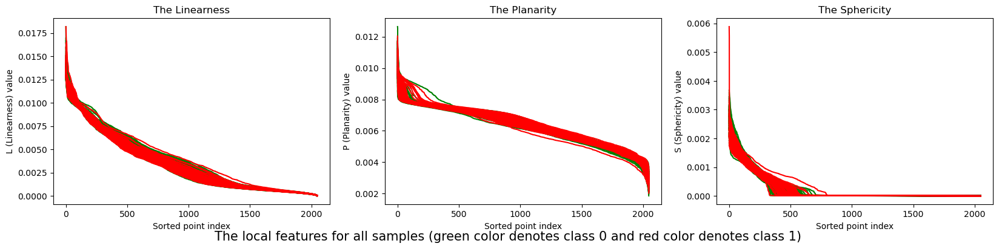

In [10]:
# The local features of all samples. It is noted that it is important to check the sensitivity of the searching parameters for selecting the K-nearest nodes
# class 0
f = plt.figure(figsize=(20, 4))
ax1 = f.add_subplot(131)
ax2 = f.add_subplot(132)
ax3 = f.add_subplot(133)
for index_sample in index_0:
    temp_feature = list(local_features_all[index_sample][:, 0:1])
    temp_feature.sort(reverse=True)
    ax1.plot(np.array(range(2048)), temp_feature, c='green')

    temp_feature = list(local_features_all[index_sample][:, 1:2])
    temp_feature.sort(reverse=True)
    ax2.plot(np.array(range(2048)), temp_feature, c='green')

    temp_feature = list(local_features_all[index_sample][:, 2:3])
    temp_feature.sort(reverse=True)
    ax3.plot(np.array(range(2048)), temp_feature, c='green')

# class 1
for index_sample in index_1:
    temp_feature = list(local_features_all[index_sample][:, 0:1])
    temp_feature.sort(reverse=True)
    ax1.plot(np.array(range(2048)), temp_feature, c='red')

    temp_feature = list(local_features_all[index_sample][:, 1:2])
    temp_feature.sort(reverse=True)
    ax2.plot(np.array(range(2048)), temp_feature, c='red')

    temp_feature = list(local_features_all[index_sample][:, 2:3])
    temp_feature.sort(reverse=True)
    ax3.plot(np.array(range(2048)), temp_feature, c='red')

# Set common labels
ax1.set_xlabel('Sorted point index')
ax1.set_ylabel('L (Linearness) value')
ax1.set_title('The Linearness')
# Set common labels
ax2.set_xlabel('Sorted point index')
ax2.set_ylabel('P (Planarity) value')
ax2.set_title('The Planarity')
# Set common labels
ax3.set_xlabel('Sorted point index')
ax3.set_ylabel('S (Sphericity) value')
ax3.set_title('The Sphericity')
f.suptitle('The local features for all samples (green color denotes class 0 and red color denotes class 1)', y=0.0001, fontsize=15)
f.show()

Discussion:

The node-wise physical features (including L, S, and P), which indicate physical information, can help us get physical-interpreted segmentations, such as the reference surface and the anomaly surface. If we directly apply clustering methods (such as k-means and DBSCAN) to the coordinates, the segmentations will lack the physical interpretations, e.g., the reference planes and anomalies. Moreover, the direct clustering of the coordinates is not stable or robust, when the shape or the junction saliency is changed. Based on the node-wise physical features (including L, S, and P), we can incorporate different kinds of clustering methods to achieve physical-interpreted features for classification purposes.

**Gaussian Mixture Model** for selecting reference surface nodes

In [ ]:
import numpy as np
import os
# !pip install open3d==0.16
import open3d as o3d
from sklearn import mixture
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from collections import Counter
import scipy.optimize as optimize
import matplotlib.pyplot as plt


def perp_error(params, xyz):
    a, b, c, d = params
    x, y, z = xyz
    length = np.sqrt(a**2 + b**2 + c**2)
    return (np.abs(a * x + b * y + c * z + d) / length).mean()


def SVD(X):
    # Find the average of points (centroid) along the columns
    C = np.average(X, axis=0)
    # Create CX vector (centroid to point) matrix
    CX = X - C
    # Singular value decomposition
    U, S, V = np.linalg.svd(CX)
    # The last row of V matrix indicate the eigenvectors of
    # smallest eigenvalues (singular values).
    N = V[-1]
    # Extract a, b, c, d coefficients.
    x0, y0, z0 = C
    a, b, c = N
    d = -(a * x0 + b * y0 + c * z0)
    return a, b, c, d

# os.chdir('/content/drive/MyDrive/DAISproject/Datasets')
# # Read point cloud:
# cwd = os.getcwd()
# test_data_path = os.path.join(cwd, 'train_data.npy')
# label_data_path = os.path.join(cwd, 'train_label.npy')

# test_data = np.load(test_data_path)
# label_data = np.load(label_data_path)

# change the index here to see different samples
index = 119

temp_data = local_features_all[index][:, :]

# Normalisation:
scaled_points = StandardScaler().fit_transform(temp_data)
# Clustering:
model = mixture.GaussianMixture(n_components=2, covariance_type='full')  # cluster into 2 categories
clusters = model.fit(scaled_points)

# pcd = o3d.io.read_point_cloud('./bun_zipper.ply')
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(test_data[index, :, :])
# Get points and transform it to a numpy array:
points = np.asarray(pcd.points).copy()

# Get labels:
labels = model.predict(scaled_points)
all_labels = labels
# Get the number of colors:
n_clusters = len(set(labels))
n_noise_ = list(labels).count(-1)
print("Estimated number of clusters: %d" % n_clusters)
print(set(labels))

print(all_labels)

# choose the cluster of reference surface
num_in_clusters = np.array([len(np.where(all_labels == 0)[0]), len(np.where(all_labels == 1)[0])])
print(num_in_clusters)
nums = num_in_clusters[1000 <num_in_clusters]  # according to the S plot, the number of nodes of the reference surface is always larger than 1000
print(nums)
print('The index of the cluster w.r.t. the anomaly surface is:', np.where(num_in_clusters == nums)[0])
new_labels = all_labels .reshape(2048, 1)
index_surface_cluster = np.where(new_labels == np.where(num_in_clusters == nums)[0])[0]
# print(index_surface_cluster)
# print(len(index_surface_cluster))

x0, y0, z0 = test_data[index, index_surface_cluster, 0], test_data[index, index_surface_cluster, 1], test_data[index, index_surface_cluster, 2]
# Solve using SVD method.
a, b, c, d = SVD(np.array([x0, y0, z0]).T)
if a < 0:
  a = -a
  b = -b
  c = -c
  d= -d
print('Current index of sample:', index)
print("SVD  abcd: {:.3f} {:.3f} {:.3f} {:.3f}".format(a, b, c, d))
# Orthogonal mean distance
print("Perp err: {:.5f}\n".format(perp_error((a, b, c, d), (x0, y0, z0))))

# divide nodes according to the plane
coefs = np.array([a, b, c])
dis_vec = (np.dot(test_data[index, :, :], coefs) + d)/(np.sqrt(coefs.dot(coefs)))
print(np.min(dis_vec), np.max(dis_vec))
fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(dis_vec)
threshold = 0.1
index_anomaly_new = np.where(dis_vec > threshold)[0]
index_surface_new = np.where(dis_vec <= threshold)[0]
# print(index_anomaly_new)
# print(index_surface_new)

print('The plot of fitted plane and nodes for the ', index, 'th sample')
x = np.linspace(-0.6, 0.6, 100)
y = np.linspace(-0.6, 0.6, 100)
x, y = np.meshgrid(x, y)
eq = -(a * x + b * y + d)/c
fig = plt.figure()
ax = fig.add_subplot(121, projection='3d')
ax.plot_surface(x, y, eq)
ax.scatter(test_data[index, :, 0], test_data[index, :, 1], test_data[index, :, 2], c='red')
ax.set_xlabel('X', fontsize=16)
ax.set_ylabel('Y', fontsize=16)
ax.set_zlabel('Z', fontsize=16)
ax.view_init(10, 25)
ax.set_title('View 1', y=0.0001, fontsize=15)

ax = fig.add_subplot(122, projection='3d')
ax.plot_surface(x, y, eq)
ax.scatter(test_data[index, :, 0], test_data[index, :, 1], test_data[index, :, 2], c='red')
ax.set_xlabel('X', fontsize=16)
ax.set_ylabel('Y', fontsize=16)
ax.set_zlabel('Z', fontsize=16)
ax.view_init(-10, -25)
ax.set_title('View 2', y=0.0001, fontsize=15)

fig.set_size_inches(13, 6)
fig.suptitle('The fitted reference surface of the sample #{}'.format(index+1), y=0.0001, fontsize=15)
plt.show()


# Mapping the labels classes to a color map:
colors = plt.get_cmap("tab20")(all_labels / (n_clusters if n_clusters > 0 else 1))
# Update points colors:
pcd.colors = o3d.utility.Vector3dVector(colors[:, :3])
o3d.visualization.draw_plotly([pcd])

**Segment all samples**:(run the following codes to apply the avove segmentation to all samples)

In [ ]:
import numpy as np
import os
# !pip install open3d==0.16
import open3d as o3d
from sklearn import mixture
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from collections import Counter
import scipy.optimize as optimize
import matplotlib.pyplot as plt


def perp_error(params, xyz):
    a, b, c, d = params
    x, y, z = xyz
    length = np.sqrt(a**2 + b**2 + c**2)
    return (np.abs(a * x + b * y + c * z + d) / length).mean()


def SVD(X):
    # Find the average of points (centroid) along the columns
    C = np.average(X, axis=0)
    # Create CX vector (centroid to point) matrix
    CX = X - C
    # Singular value decomposition
    U, S, V = np.linalg.svd(CX)
    # The last row of V matrix indicate the eigenvectors of
    # smallest eigenvalues (singular values).
    N = V[-1]
    # Extract a, b, c, d coefficients.
    x0, y0, z0 = C
    a, b, c = N
    d = -(a * x0 + b * y0 + c * z0)
    return a, b, c, d

# os.chdir('/content/drive/MyDrive/DAISproject/Datasets')
# # Read point cloud:
# cwd = os.getcwd()
# test_data_path = os.path.join(cwd, 'train_data.npy')
# label_data_path = os.path.join(cwd, 'train_label.npy')

# test_data = np.load(test_data_path)
# label_data = np.load(label_data_path)

data_seg = []
data_seg_surface = []
for index in range(np.shape(test_data)[0]):
    temp_data = local_features_all[index][:, :]

    # Normalisation:
    scaled_points = StandardScaler().fit_transform(temp_data)
    # Clustering:
    model = mixture.GaussianMixture(n_components=2, covariance_type='full')  # cluster into 2 categories
    clusters = model.fit(scaled_points)

    # pcd = o3d.io.read_point_cloud('./bun_zipper.ply')
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(test_data[index, :, :])
    # Get points and transform it to a numpy array:
    points = np.asarray(pcd.points).copy()

    # Get labels:
    labels = model.predict(scaled_points)
    all_labels = labels
    # Get the number of colors:
    n_clusters = len(set(labels))
    n_noise_ = list(labels).count(-1)
    print("Estimated number of clusters: %d" % n_clusters)
    print(set(labels))

    print(all_labels)

    # choose the cluster of reference surface
    num_in_clusters = np.array([len(np.where(all_labels == 0)[0]), len(np.where(all_labels == 1)[0])])
    print(num_in_clusters)
    nums = num_in_clusters[
        1000 < num_in_clusters]  # according to the S plot, the number of nodes of the reference surface is always larger than 1000
    print(nums)
    print('The index of the cluster w.r.t. the anomaly surface is:', np.where(num_in_clusters == nums)[0])
    new_labels = all_labels.reshape(2048, 1)
    index_surface_cluster = np.where(new_labels == np.where(num_in_clusters == nums)[0])[0]
    # print(index_surface_cluster)
    # print(len(index_surface_cluster))

    x0, y0, z0 = test_data[index, index_surface_cluster, 0], test_data[index, index_surface_cluster, 1], test_data[
        index, index_surface_cluster, 2]
    # Solve using SVD method.
    a, b, c, d = SVD(np.array([x0, y0, z0]).T)
    if a < 0:
        a = -a
        b = -b
        c = -c
        d = -d
    # print('Current index of sample:', index)
    # print("SVD  abcd: {:.3f} {:.3f} {:.3f} {:.3f}".format(a, b, c, d))
    # # Orthogonal mean distance
    # print("Perp err: {:.5f}\n".format(perp_error((a, b, c, d), (x0, y0, z0))))

    # divide nodes according to the plane
    coefs = np.array([a, b, c])
    dis_vec = (np.dot(test_data[index, :, :], coefs) + d) / (np.sqrt(coefs.dot(coefs)))
    print(np.min(dis_vec), np.max(dis_vec))
    # fig, ax = plt.subplots(figsize=(10, 7))
    # ax.hist(dis_vec)
    threshold = 0.1
    index_anomaly_new = np.where(dis_vec > threshold)[0]
    index_surface_new = np.where(dis_vec <= threshold)[0]
    data_seg.append(test_data[index, index_anomaly_new, :])
    data_seg_surface.append(test_data[index, index_surface_new, :])

    # Mapping the labels classes to a color map:
    colors = plt.get_cmap("tab20")(all_labels / (n_clusters if n_clusters > 0 else 1))
    # Update points colors:
    pcd.colors = o3d.utility.Vector3dVector(colors[:, :3])
    o3d.visualization.draw_plotly([pcd])

    print('The plot of fitted plane and nodes for the ', index, 'th sample')
    x = np.linspace(-0.6, 0.6, 100)
    y = np.linspace(-0.6, 0.6, 100)
    x, y = np.meshgrid(x, y)
    eq = -(a * x + b * y + d) / c
    fig = plt.figure()
    ax = fig.add_subplot(121, projection='3d')
    ax.plot_surface(x, y, eq)
    ax.scatter(data_seg[index][:, 0], data_seg[index][:, 1], data_seg[index][:, 2], c='green')
    ax.scatter(data_seg_surface[index][:, 0], data_seg_surface[index][:, 1], data_seg_surface[index][:, 2], c='red')
    ax.set_xlabel('X', fontsize=16)
    ax.set_ylabel('Y', fontsize=16)
    ax.set_zlabel('Z', fontsize=16)
    ax.view_init(0, -140)
    ax.set_title('View 1', y=0.0001, fontsize=15)

    ax = fig.add_subplot(122, projection='3d')
    ax.plot_surface(x, y, eq)
    ax.scatter(data_seg[index][:, 0], data_seg[index][:, 1], data_seg[index][:, 2], c='green')
    ax.scatter(data_seg_surface[index][:, 0], data_seg_surface[index][:, 1], data_seg_surface[index][:, 2], c='red')
    ax.set_xlabel('X', fontsize=16)
    ax.set_ylabel('Y', fontsize=16)
    ax.set_zlabel('Z', fontsize=16)
    ax.view_init(-10, 25)
    ax.set_title('View 2', y=0.0001, fontsize=15)

    fig.set_size_inches(13, 6)
    fig.suptitle('The fitted reference surface of the sample #{}'.format(index + 1), y=0.0001, fontsize=15)
    plt.show()

# the list 'data_seg' contains the anomaly surface nodes for each samples, but it is noted that the numbers of nodes are not consistent

Aligh all samples by increasing the number of points: (for Wasserstein Distance and the PointNet model) 

*   step 1. randomly choose one existing node;
*   step 2. find K-nearest neighborhoods;
*   step 3. use them to intepolate a new node;
*   step 4. repeat 1-3 many times as needed.






     

In [14]:
import numpy as np
import random
# !pip install open3d
import open3d as o3d
import os
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import proj3d
from mpl_toolkits.mplot3d import Axes3D

def augmentPoints(dataset_temp, num_new, radius):
  pcd = o3d.geometry.PointCloud()
  # print(np.shape(dataset_temp))
  # dataset_temp = dataset_temp[0, :, :]
  new_dataset = dataset_temp
  pcd.points = o3d.utility.Vector3dVector(dataset_temp)
  kdtree = o3d.geometry.KDTreeFlann(pcd)
  for i in range(num_new):
    index_temp = random.randint(0, np.shape(dataset_temp)[0]-1)
    radius_temp = radius
    k = 0
    while k < 3:
      radius_temp = radius_temp*1.1
      k, idx, _ = kdtree.search_radius_vector_3d(pcd.points[index_temp], radius_temp)
    neighbors = dataset_temp[idx, :]
    mean = np.mean(neighbors, 0)
    new_dataset = np.vstack((new_dataset, mean.reshape((1, 3))))
    # print(k)
  # print(np.shape(new_dataset))
  return new_dataset


# first, find the maximum number of nodes among all samples
num_nodes_all = []
for i in range(np.shape(test_data)[0]): num_nodes_all.append(np.shape(np.array(data_seg[i]))[0])
# print(num_nodes_all)
max_num = max(num_nodes_all)
print('The maximum number of nodes in different samples:', max_num)
# initial search radius, which is adaptively increased later
radius_para = 0.00001
new_dataset_all = np.zeros((190, max_num, 3))
for j in range(np.shape(test_data)[0]): new_dataset_all[j, :, :]= augmentPoints(np.array(data_seg[j]), max_num-num_nodes_all[j], radius_para)
# print(np.shape(new_dataset_all))  # print the shape of anomaly surface nodes

# here we save the anomaly surface data from segmentation
np.save('new_train_data.npy', new_dataset_all)

The maximum number of nodes in different samples: 439


Plot the anomaly surface example:

(190, 439, 3)


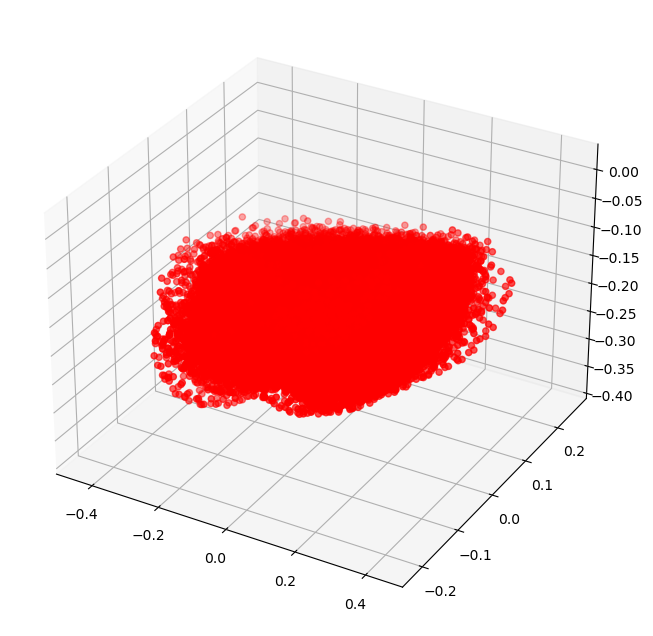

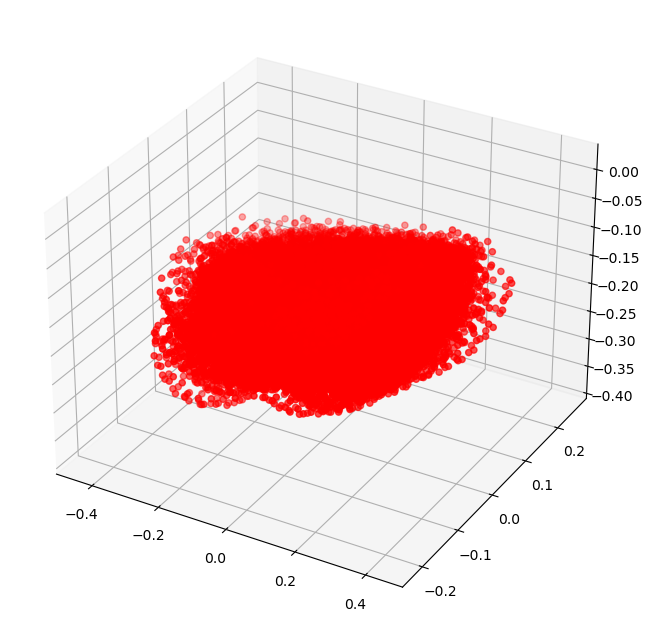

In [15]:
print(np.shape(new_dataset_all))

all_index = range(190)

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
for id in all_index:
  x0 = new_dataset_all[id,:,0]
  y0 = new_dataset_all[id,:,1]
  z0 = new_dataset_all[id,:,2]
  ax.scatter(x0, y0, z0, c='red')
# plt.show()

fig = plt.figure(figsize=(8, 8))
axes3d = fig.add_subplot(111, projection='3d')
for id in all_index:
  x0 = data_seg[id][:,0]
  y0 = data_seg[id][:,1]
  z0 = data_seg[id][:,2]
  axes3d.scatter(x0, y0, z0, c='red')
plt.show()

# **Feature Engineering**

**Feature 1:** (the vertical distance to the reference surface) N = 7

The plot of fitted plane and nodes for the 190th sample:


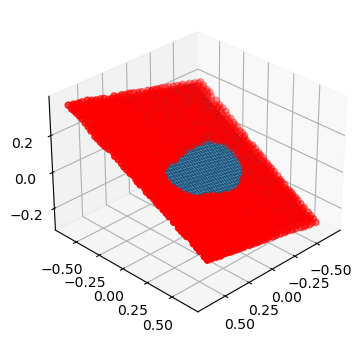

In [16]:
# Fit the reference surface (i.e., the plane), using list 'data_seg_surface'
import numpy as np
import scipy.optimize as optimize
import matplotlib.pyplot as plt
import os
from mpl_toolkits.mplot3d import proj3d
from mpl_toolkits.mplot3d import Axes3D

# os.chdir('/content/drive/MyDrive/DAISproject/Datasets')
# cwd = os.getcwd()
# # print(cwd)
# test_data_path = os.path.join(cwd, 'train_data.npy')
# label_data_path = os.path.join(cwd, 'train_label.npy')

# test_data = np.load(test_data_path)
# label_data = np.load(label_data_path)


def perp_error(params, xyz):
    """
    Mean of the absolute values for the perpendicular distance of the
    'xyz' points, to the plane defined by the coefficients 'a,b,c,d' in
    'params'.
    """
    a, b, c, d = params
    x, y, z = xyz
    length = np.sqrt(a**2 + b**2 + c**2)
    return (np.abs(a * x + b * y + c * z + d) / length).mean()


def SVD(X):
    """
    Singular value decomposition method.
    Source: https://gist.github.com/lambdalisue/7201028
    """
    # Find the average of points (centroid) along the columns
    C = np.average(X, axis=0)

    # Create CX vector (centroid to point) matrix
    CX = X - C
    # Singular value decomposition
    U, S, V = np.linalg.svd(CX)
    # The last row of V matrix indicate the eigenvectors of
    # smallest eigenvalues (singular values).
    N = V[-1]

    # Extract a, b, c, d coefficients.
    x0, y0, z0 = C
    a, b, c = N
    d = -(a * x0 + b * y0 + c * z0)

    return a, b, c, d

# calculate the vertical distances
vertical_distance_all = []

# mean error of surface fitting
error_fit = []

for index in range(np.shape(test_data)[0]):
  x0, y0, z0 = data_seg_surface[index][:, 0], data_seg_surface[index][:, 1], data_seg_surface[index][:, 2]
  # Solve using SVD method.
  a, b, c, d = SVD(np.array([x0, y0, z0]).T)
  # print('Current index of sample:', index)
  # print("SVD  abcd: {:.3f} {:.3f} {:.3f} {:.3f}".format(a, b, c, d))
  # # Orthogonal mean distance
  # print("Perp err: {:.5f}\n".format(perp_error((a, b, c, d), (x0, y0, z0))))
  error_fit.append(perp_error((a, b, c, d), (x0, y0, z0)))
  # calculate the vertical distance
  n_d, _ = np.shape(data_seg[index])
  vertical_distance = -(a * data_seg[index][:, 0] + b * data_seg[index][:, 1] + d)/c - data_seg[index][:, 2]
  vertical_distance_all.append(vertical_distance)

print('The plot of fitted plane and nodes for the 190th sample:')
# plot the plane with nodes for the 190th sample
plt.rcParams["figure.figsize"] = [14.00, 3.50]
plt.rcParams["figure.autolayout"] = True
x = np.linspace(-0.6, 0.6, 100)
y = np.linspace(-0.6, 0.6, 100)
x, y = np.meshgrid(x, y)
eq = -(a * x + b * y + d)/c
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x, y, eq)
ax.scatter(x0, y0, z0, c='red')
ax.view_init(30, 45)
plt.show()

calculate the mean and the quantiles of the distribution of the vertical distance: (quantiles are 0.025, 0.25, 0.50, 0.75, 0.975, 1)

In [17]:
# Feature 1
# the mean of the vertical distance
mean_vertiDistance_all = []
# the quantiles of the distribution of the vertical distance
quantiles_vertiDistance_all = []
for i in range(np.shape(test_data)[0]): mean_vertiDistance_all.append(np.mean(vertical_distance_all[i])/np.shape(vertical_distance_all[i]))
for i in range(np.shape(test_data)[0]): quantiles_vertiDistance_all.append([np.quantile(vertical_distance_all[i], 0.025), np.quantile(vertical_distance_all[i], 0.25), np.quantile(vertical_distance_all[i], 0.5), np.quantile(vertical_distance_all[i], 0.75), np.quantile(vertical_distance_all[i], 0.975), np.quantile(vertical_distance_all[i], 1)])
# print(mean_vertiDistance_all)
# print(quantiles_vertiDistance_all)
feature_1_mean = mean_vertiDistance_all
feature_1_quantiles = quantiles_vertiDistance_all

**Feature 2:** (the mean and the deviation of the coordinates of anomaly surface nodes) N = 6

In [18]:
# Feature 2
# the mean of the coordinates of anomaly surface nodes
feature_2_mean = []
feature_2_deviation = []
for i in range(np.shape(test_data)[0]): feature_2_mean.append([np.mean(data_seg[i][:, 0]), np.mean(data_seg[i][:, 1]), np.mean(data_seg[i][:, 2])])
for i in range(np.shape(test_data)[0]): feature_2_deviation.append([np.std(data_seg[i][:, 0]), np.std(data_seg[i][:, 1]), np.std(data_seg[i][:, 2])])
# print(feature_2_mean)
# print(feature_2_deviation)

**Feature 3:** (the size of the dent) N = 2

In [19]:
# Feature 3
feature_3_length = []
feature_3_width = []
for i in range(np.shape(test_data)[0]): feature_3_length.append(np.max(data_seg[i][:, 0]) - np.min(data_seg[i][:, 0]))
for i in range(np.shape(test_data)[0]): feature_3_width.append(np.max(data_seg[i][:, 1]) - np.min(data_seg[i][:, 1]))
# print(feature_3_length)
# print(feature_3_width)

**Feature 4:** (the number of the anomaly surface nodes) N = 1

In [20]:
# Feature 4
feature_4 = []
for i in range(np.shape(test_data)[0]): feature_4.append(np.shape(data_seg[i])[0])
# print(feature_4)

**Feature 5:** (the mean and the deviation of the coordinates of reference surface nodes) N = 6

In [21]:
# Feature 5
# the mean of the coordinates of anomaly surface nodes
feature_5_mean = []
feature_5_deviation = []
for i in range(np.shape(test_data)[0]): feature_5_mean.append([np.mean(data_seg_surface[i][:, 0]), np.mean(data_seg_surface[i][:, 1]), np.mean(data_seg_surface[i][:, 2])])
for i in range(np.shape(test_data)[0]): feature_5_deviation.append([np.std(data_seg_surface[i][:, 0]), np.std(data_seg_surface[i][:, 1]), np.std(data_seg_surface[i][:, 2])])
# print(feature_5_mean)
# print(feature_5_deviation)

**Feature 6:** (the mean distance of nodes around surface (to the fitted surface) )

In [22]:
# Feature 6
feature_6_fitErr = []
for i in range(np.shape(test_data)[0]): feature_6_fitErr.append(error_fit[i])
# print(feature_6_fitErr)

**Feature 7:** (the Hausdorff Distance)

In [23]:
!pip install point-cloud-utils

     ---------------------------------------- 4.6/4.6 MB 9.5 MB/s eta 0:00:00



[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


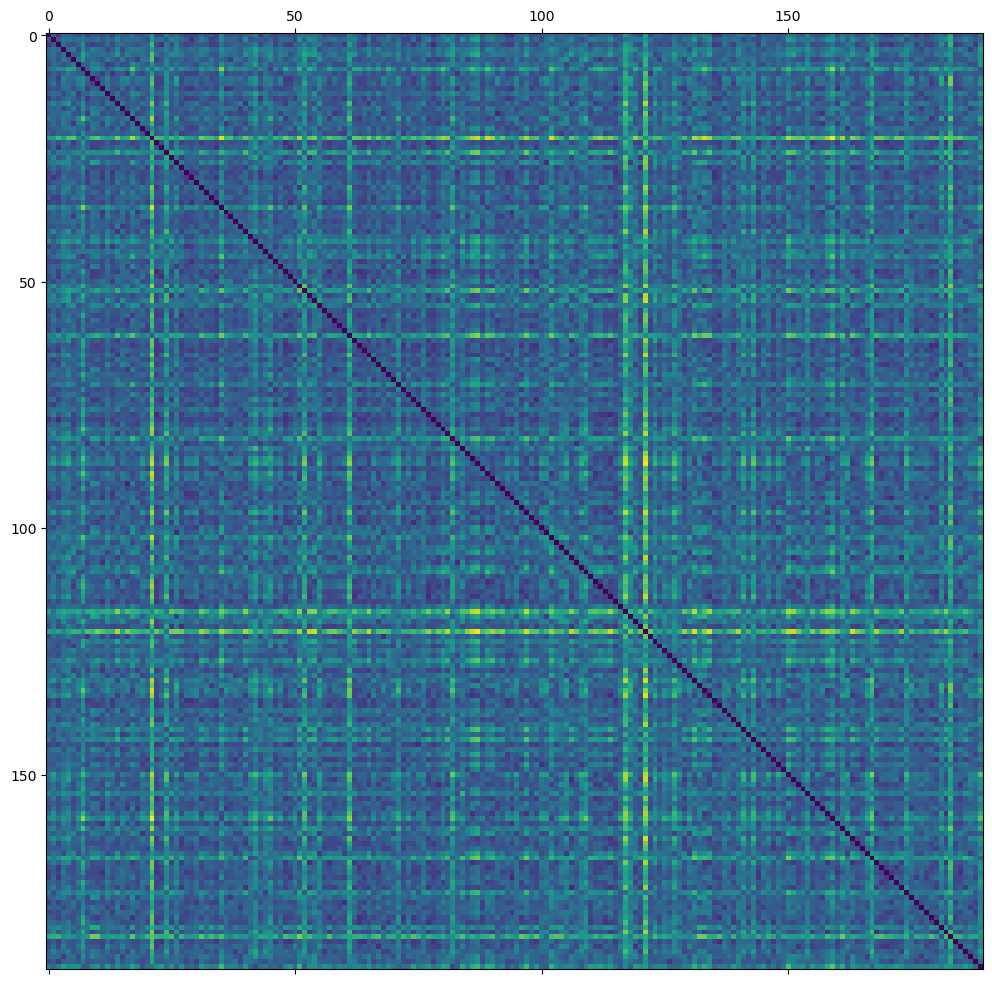

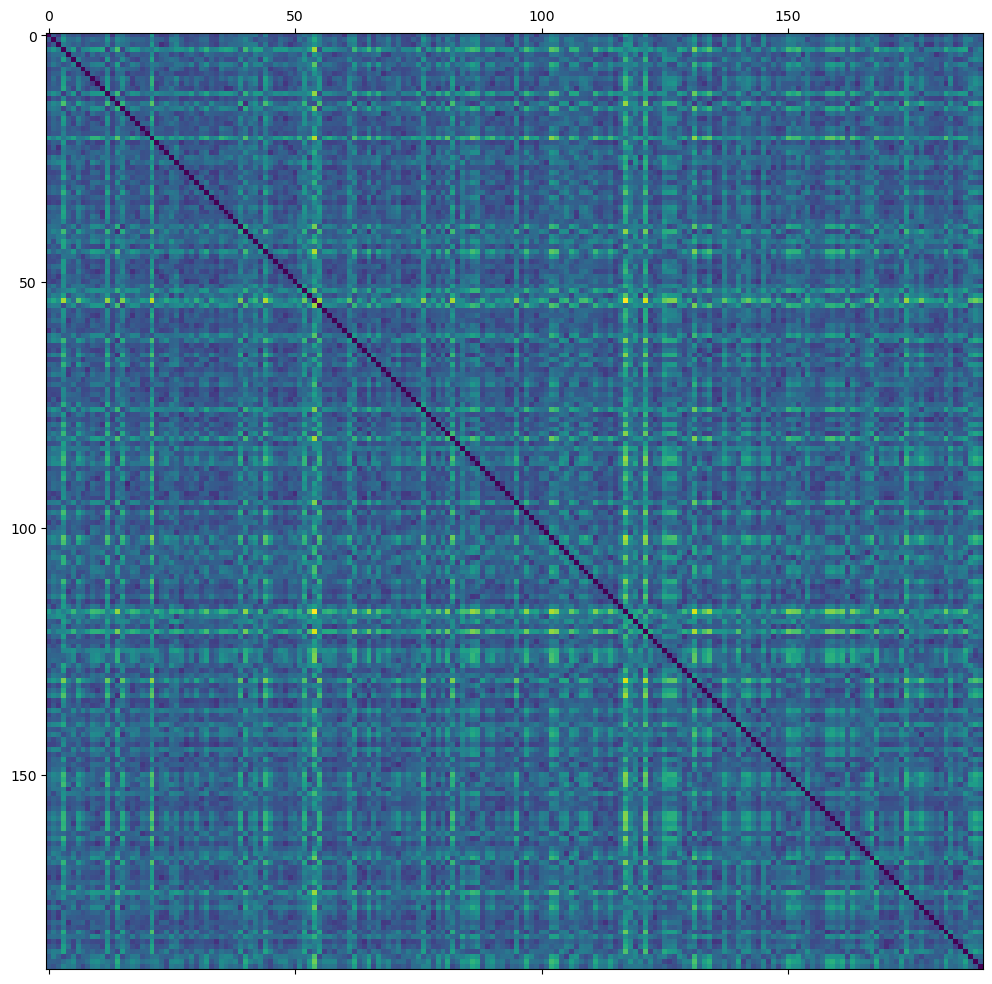

In [24]:
# Feature 7
import point_cloud_utils as pcu
import numpy as np
import matplotlib.pylab as plt
import scipy.sparse as sparse
import os

# os.chdir('/content/drive/MyDrive/DAISproject/Datasets')
# cwd = os.getcwd()
# # print(cwd)
# test_data_path = os.path.join(cwd, 'train_data.npy')
# label_data_path = os.path.join(cwd, 'train_label.npy')
# test_data = np.load(test_data_path)
# label_data = np.load(label_data_path)
index_0 = np.where(label_data == 0)[0]
index_1 = np.where(label_data == 1)[0]

# # Hausdorff distance in special order
# hausdorff_dist_matrix = np.zeros((190, 190))
# m_temp = 0
# for i in list(index_0) + list(index_1):
#   n_temp = 0
#   for j in list(index_0) + list(index_1):
#     dataset_class0 = data_seg[i]
#     dataset_class1 = data_seg[j]
#     # Take a max of the one sided squared  distances to get the two sided Hausdorff distance
#     hausdorff_dist_matrix[n_temp, m_temp] = pcu.hausdorff_distance(dataset_class0, dataset_class1)
#     n_temp += 1
#   m_temp += 1
# # visualize the sparse matrix with Spy
# fig = plt.figure(figsize=(10, 10))
# ax = fig.add_subplot(111)
# ax.matshow(hausdorff_dist_matrix)

# Hausdorff distance
hausdorff_dist_matrix = np.zeros((190, 190))
for i in list(index_0) + list(index_1):
  for j in list(index_0) + list(index_1):
    dataset_class0 = data_seg[i]
    dataset_class1 = data_seg[j]
    # Take a max of the one sided squared  distances to get the two sided Hausdorff distance
    hausdorff_dist_matrix[i, j] = pcu.hausdorff_distance(dataset_class0, dataset_class1)
# visualize the sparse matrix with Spy
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
ax.matshow(hausdorff_dist_matrix)

# Chamfer distance
chamfer_dist_matrix = chamfer_dist_matrix = np.zeros((190, 190))
for i in list(index_0) + list(index_1):
  for j in list(index_0) + list(index_1):
    dataset_class0 = data_seg[i]
    dataset_class1 = data_seg[j]
    # Take a max of the one sided squared  distances to get the two sided Hausdorff distance
    # chamfer_dist_matrix[i, j] = pcu.hausdorff_distance(dataset_class0, dataset_class1)
    chamfer_dist_matrix[i, j] = pcu.chamfer_distance(dataset_class0, dataset_class1)
# visualize the sparse matrix with Spy
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
ax.matshow(chamfer_dist_matrix)

# # print(np.shape(hausdorff_dist_matrix))

# # # Approximate Wasserstein (Sinkhorn) distance
# # Wasserstein_dist_matrix = np.zeros((190, 190))
# # for i in list(index_0) + list(index_1):
# #   for j in list(index_0) + list(index_1):
# #     dataset_class0 = data_seg[i]
# #     dataset_class1 = data_seg[j]
# #     # a and b are arrays where each row contains a point
# #     # Note that the point sets can have different sizes (e.g [100, 3], [111, 3])
# #     a = dataset_class0
# #     b = dataset_class1

# #     # M is a 100x100 array where each entry  (i, j) is the L2 distance between point a[i, :] and b[j, :]
# #     M = pcu.pairwise_distances(a, b)
# #     M = M.astype('float64')

# #     # w_a and w_b are masses assigned to each point. In this case each point is weighted equally.
# #     w_a = np.ones(a.shape[0])
# #     w_b = np.ones(b.shape[0])

# #     # P is the transport matrix between a and b, eps is a regularization parameter, smaller epsilons lead to
# #     # better approximation of the true Wasserstein distance at the expense of slower convergence
# #     P = pcu.sinkhorn(w_a, w_b, M, eps=1e-3)

# #     # To get the distance as a number just compute the frobenius inner product <M, P>
# #     sinkhorn_dist = (M*P).sum()
# #     Wasserstein_dist_matrix[i, j] = sinkhorn_dist
# # # visualize the sparse matrix with Spy
# # fig = plt.figure(figsize=(10, 10))
# # ax = fig.add_subplot(111)
# # ax.matshow(Wasserstein_dist_matrix)

# # np.save('Wasserstein_distance.npy', hausdorff_dist_matrix)

Using augmented data

In [25]:
# import os
# import numpy as np
# BASE_DIR = os.path.dirname("/content/drive/MyDrive/DAISproject/")
# DATA_DIR = os.path.join(BASE_DIR, 'Datasets')
# train_data_path = os.path.join(DATA_DIR, 'new_train_data.npy')
# new_data = np.load(train_data_path)

# # Approximate Wasserstein (Sinkhorn) distance
# Wasserstein_dist_matrix = np.zeros((190, 190))
# num_ = 0
# for i in list(index_0) + list(index_1):
#   print(num_)
#   num_ += 1
#   for j in list(index_0) + list(index_1):
#     dataset_class0 = new_data[i, :, :]
#     dataset_class1 = new_data[j, :, :]
#     # a and b are arrays where each row contains a point
#     # Note that the point sets can have different sizes (e.g [100, 3], [111, 3])
#     a = dataset_class0
#     b = dataset_class1

#     # M is a 100x100 array where each entry  (i, j) is the L2 distance between point a[i, :] and b[j, :]
#     M = pcu.pairwise_distances(a, b)
#     M = M.astype('float64')

#     # w_a and w_b are masses assigned to each point. In this case each point is weighted equally.
#     w_a = np.ones(a.shape[0])
#     w_b = np.ones(b.shape[0])

#     # P is the transport matrix between a and b, eps is a regularization parameter, smaller epsilons lead to
#     # better approximation of the true Wasserstein distance at the expense of slower convergence
#     P = pcu.sinkhorn(w_a, w_b, M, eps=1e-3)

#     # To get the distance as a number just compute the frobenius inner product <M, P>
#     sinkhorn_dist = (M*P).sum()
#     Wasserstein_dist_matrix[i, j] = sinkhorn_dist
# # visualize the sparse matrix with Spy
# fig = plt.figure(figsize=(10, 10))
# ax = fig.add_subplot(111)
# ax.matshow(Wasserstein_dist_matrix)
# np.save('aug_Wasserstein_distance.npy', Wasserstein_dist_matrix)

In [26]:
# os.chdir('/content/drive/MyDrive/DAISproject/Datasets')
# import pandas as pd
# Wasserstein_dist_matrix = pd.read_csv('WDM.csv').values
# print(np.shape(Wasserstein_dist_matrix))
# print(Wasserstein_dist_matrix)
# fig = plt.figure(figsize=(10, 10))
# ax = fig.add_subplot(111)
# ax.matshow(Wasserstein_dist_matrix)

# print(np.shape(Wasserstein_dist_matrix))
# # cwd = os.getcwd()
# # # print(cwd)
# # test_data_path = os.path.join(cwd, 'Wasserstein_distance.npy')
# # Wasserstein_dist_matrix = np.load(test_data_path)

In [27]:
# os.chdir('/content/drive/MyDrive/DAISproject/Datasets')
# # print(cwd)
# test_data_path = os.path.join(cwd, 'Wasserstein_distance.npy')
# Wasserstein_dist_matrix = np.load(test_data_path)
# # visualize the sparse matrix with Spy
# fig = plt.figure(figsize=(10, 10))
# ax = fig.add_subplot(111)
# ax.matshow(Wasserstein_dist_matrix)

# print(np.shape(Wasserstein_dist_matrix))

(190, 190)


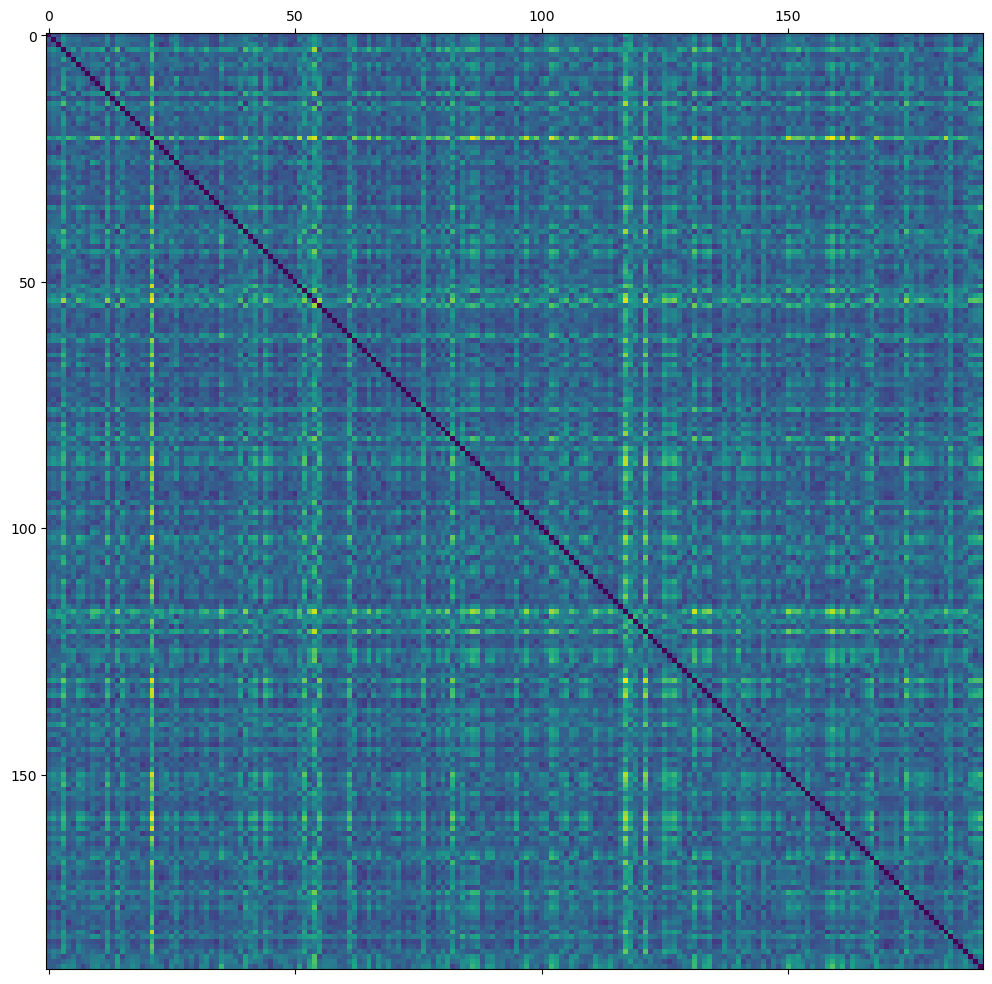

In [28]:
# os.chdir('/content/drive/MyDrive/DAISproject/Datasets')
# print(cwd)
test_data_path = os.path.join(cwd, 'aug_Wasserstein_distance.npy')
Wasserstein_dist_matrix = np.load(test_data_path)
# visualize the sparse matrix with Spy
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
ax.matshow(Wasserstein_dist_matrix)

print(np.shape(Wasserstein_dist_matrix))

**Combine all the features:**

In [29]:
from sklearn import preprocessing


# define the array for saving all features
num_features = 23 + 4*3
feature_all = np.zeros((190, num_features))
Num_samples = 190
# feature 1
for i in range(Num_samples): feature_all[i, 0:1] = feature_1_mean[i]
for i in range(Num_samples): feature_all[i, 1:7] = feature_1_quantiles[i]
# feature 2
for i in range(Num_samples): feature_all[i, 7:10] = feature_2_mean[i]
for i in range(Num_samples): feature_all[i, 10:13] = feature_2_deviation[i]
# feature 3
for i in range(Num_samples): feature_all[i, 13:14] = feature_3_length[i]
for i in range(Num_samples): feature_all[i, 14:15] = feature_3_width[i]
# feature 4
for i in range(Num_samples): feature_all[i, 15:16] = feature_4[i]
# feature 5
for i in range(Num_samples): feature_all[i, 16:19] = feature_5_mean[i]
for i in range(Num_samples): feature_all[i, 19:22] = feature_5_deviation[i]
#feature 6
for i in range(Num_samples): feature_all[i, 22:23] = feature_6_fitErr[i]
# print(feature_all)
print(np.shape(test_data)[0])
# normalize all the data
for i in range(num_features):
  feature_all[:, i] = preprocessing.normalize([feature_all[:, i]])
# print(feature_all)
# print(feature_all[:, 36:37])

190


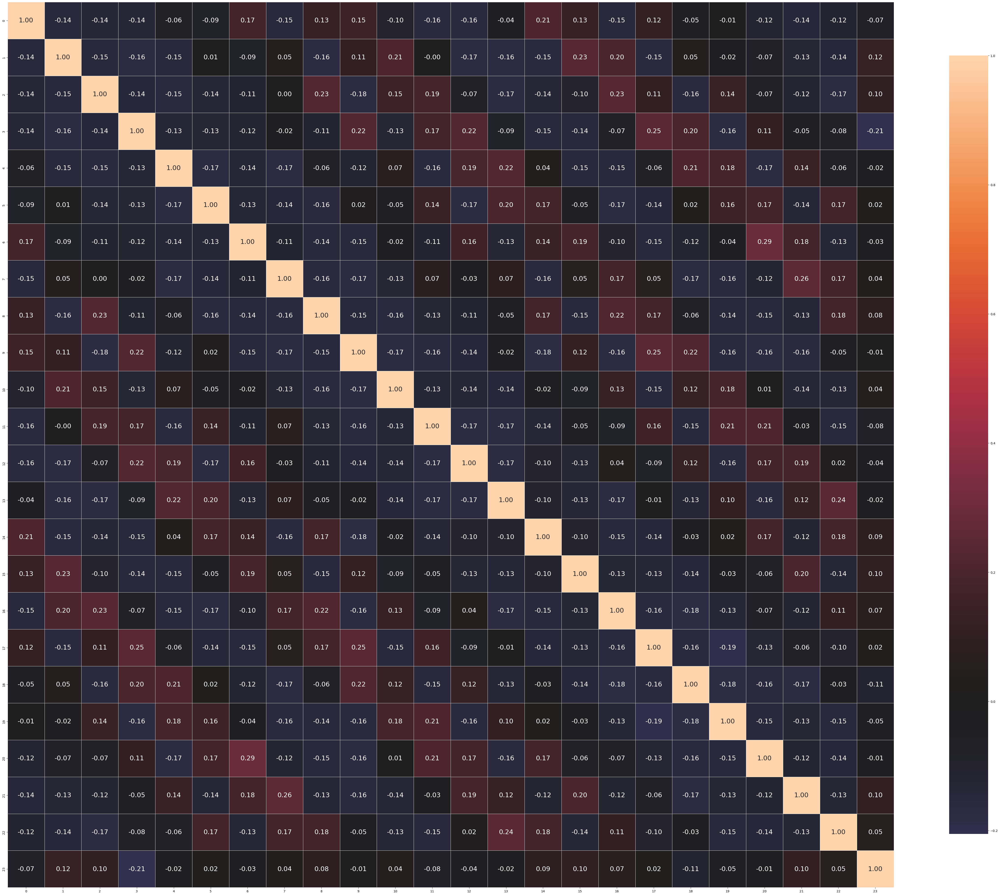

In [34]:
# correlation without advanced distance metrics
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def correlation_heatmap(train):
    correlations = np.corrcoef(train)

    fig, ax = plt.subplots(figsize=(50,50))
    sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f',
                square=True, linewidths=.5, annot=True, annot_kws={"fontsize":21}, cbar_kws={"shrink": .70})
    plt.show()

train = np.vstack((feature_all[:, 0:23].reshape(23, 190), label_data.reshape(1, 190)))
# train = np.vstack((feature_all[:, 35:36].reshape(1, 190), label_data.reshape(1, 190)))
correlation_heatmap(train)

# **Balancing, Training, and Classification Prediction (XGboost):**

In [37]:
!pip install imbalanced-learn
!pip install xgboost


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


     --------------------------------------- 89.1/89.1 MB 20.4 MB/s eta 0:00:00



[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


[[24  4]
 [ 7  3]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  3]
 [ 4  6]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[26  5]
 [ 3  4]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.8157894736842105


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[27  4]
 [ 6  1]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.8157894736842105


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  2]
 [ 5  6]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  4]
 [ 6  5]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[24  3]
 [ 7  4]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[24  5]
 [ 3  6]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.7631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  5]
 [ 5  5]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  2]
 [10  3]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  5]
 [ 5  5]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[19  7]
 [ 5  7]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.6842105263157895


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  0]
 [12  3]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.6052631578947368


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[21  3]
 [10  4]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  0]
 [ 8  7]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.6052631578947368


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[18  6]
 [ 7  7]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[21  3]
 [ 8  6]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  0]
 [ 9  7]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.5789473684210527


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  1]
 [ 6  6]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.6842105263157895


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  2]
 [ 5  6]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  6]
 [ 6  4]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[19  3]
 [ 7  9]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.5789473684210527


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  5]
 [ 2  9]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[21  1]
 [ 8  8]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.5789473684210527


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  2]
 [ 6  7]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  3]
 [ 5  5]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[19  8]
 [ 4  7]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[27  1]
 [ 8  2]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  2]
 [ 8  3]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[24  2]
 [ 8  4]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.6842105263157895


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[20  4]
 [ 8  6]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[24  3]
 [ 5  6]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  5]
 [ 5  5]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[14  8]
 [ 6 10]]
ACC: 0.631578947368421
If we always guess 0, ACC: 0.5789473684210527


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[14 11]
 [ 5  8]]
ACC: 0.5789473684210527
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[17  8]
 [ 6  7]]
ACC: 0.631578947368421
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  3]
 [ 4  6]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[18  6]
 [ 6  8]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[20  3]
 [11  4]]
ACC: 0.631578947368421
If we always guess 0, ACC: 0.6052631578947368


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  4]
 [ 5  4]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.7631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[20  6]
 [ 6  6]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.6842105263157895


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[24  2]
 [ 8  4]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.6842105263157895


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[20  2]
 [ 6 10]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.5789473684210527


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  4]
 [ 5  6]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[18  4]
 [ 7  9]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.5789473684210527


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[24  1]
 [ 9  4]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[19  3]
 [ 8  8]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.5789473684210527


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  2]
 [ 6  5]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[18  8]
 [ 5  7]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.6842105263157895


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  3]
 [ 8  2]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[19  6]
 [ 3 10]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  2]
 [11  3]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[17  4]
 [ 8  9]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.5526315789473685


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  5]
 [ 7  4]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[18  4]
 [ 9  7]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.5789473684210527


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  4]
 [ 6  5]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  0]
 [ 4  9]]
ACC: 0.8947368421052632
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[20  3]
 [10  5]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.6052631578947368


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[26  2]
 [ 4  6]]
ACC: 0.8421052631578947
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  3]
 [ 6  6]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.6842105263157895


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[18  0]
 [15  5]]
ACC: 0.6052631578947368
If we always guess 0, ACC: 0.47368421052631576


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  2]
 [ 5  6]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[16 12]
 [ 3  7]]
ACC: 0.6052631578947368
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  1]
 [11  4]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.6052631578947368


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  3]
 [ 8  5]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[19  6]
 [ 3 10]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[18  7]
 [ 5  8]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  5]
 [ 4  7]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  3]
 [ 7  6]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[18  6]
 [11  3]]
ACC: 0.5526315789473685
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[18  2]
 [ 8 10]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.5263157894736842


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[21  3]
 [10  4]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  2]
 [ 7  4]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[26  5]
 [ 4  3]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.8157894736842105


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[24  4]
 [ 8  2]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[16  4]
 [ 9  9]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.5263157894736842


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  3]
 [ 5  8]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[24  0]
 [10  4]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[18  6]
 [ 5  9]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  5]
 [ 4  7]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[21  1]
 [11  5]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.5789473684210527


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  6]
 [ 5  5]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  2]
 [ 8  6]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[17  5]
 [10  6]]
ACC: 0.6052631578947368
If we always guess 0, ACC: 0.5789473684210527


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[13  5]
 [ 6 14]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.47368421052631576


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  5]
 [ 3  8]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.7105263157894737


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[21  3]
 [ 8  6]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[27  1]
 [ 7  3]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.7368421052631579


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[24  1]
 [ 9  4]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[25  1]
 [ 8  4]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.6842105263157895


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[28  1]
 [ 5  4]]
ACC: 0.8421052631578947
If we always guess 0, ACC: 0.7631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[23  2]
 [ 8  5]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[21  5]
 [ 3  9]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.6842105263157895


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[26  3]
 [ 3  6]]
ACC: 0.8421052631578947
If we always guess 0, ACC: 0.7631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[20  5]
 [ 8  5]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[27  3]
 [ 5  3]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.7894736842105263


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[20  5]
 [ 6  7]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.6578947368421053


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[22  2]
 [ 5  9]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.631578947368421


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[19  4]
 [ 3 12]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.6052631578947368


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



[[24  3]
 [ 8  3]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.7105263157894737
The average accuracy is: 0.7307894736842102
The standard deviation of accuracy: 0.06347017097722454
The median of the accuracy: 0.7368421052631579
The average precision is: 0.6374099555415346
The standard deviation of precision: 0.15945100426068468
The median of the precision: 0.625
The average recall is: 0.4725535387814801
The standard deviation of recall: 0.1554744685884275
The median of the recall: 0.5
The average F1 is: 0.5221872228066516
The standard deviation of F1: 0.1233702652023996
The median of the F1: 0.5185185185185186
The average accuracy of baseline model is: 0.6699999999999996
The average precision of baseline model is: 0.0
The average recall of baseline model is: 0.0
The average F1 of baseline model is: 0.0


C:\Users\xl037\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



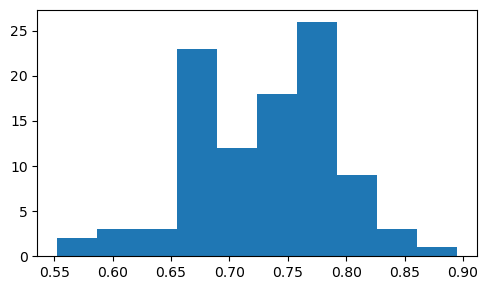

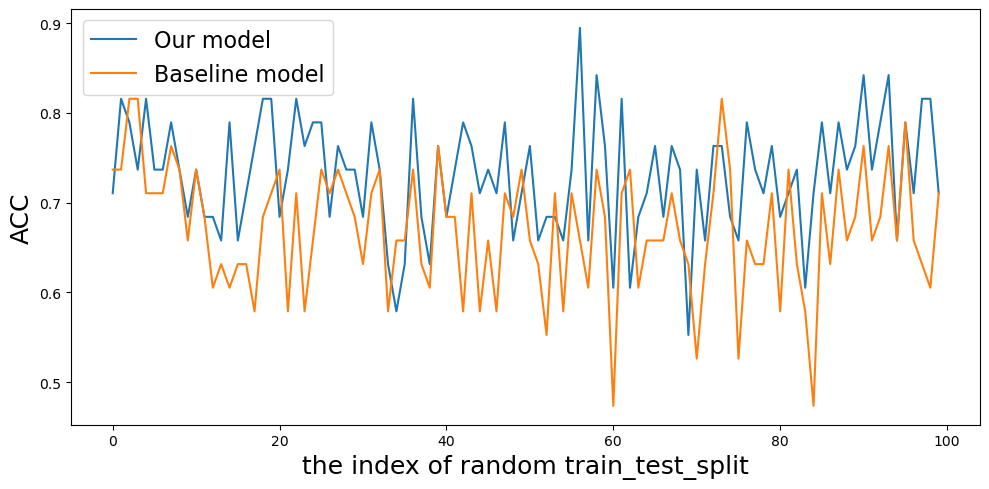

In [47]:
# repeat the training and prediction process many times
# use XGboost
# without flip the 0 and 1
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
import point_cloud_utils as pcu
import numpy as np
import matplotlib.pylab as plt
import scipy.sparse as sparse
import random
import statistics
from imblearn.over_sampling import SMOTE


# os.chdir('/content/drive/MyDrive/DAISproject/Datasets')
cwd = os.getcwd()
# print(cwd)
test_data_path = os.path.join(cwd, 'train_data.npy')
label_data_path = os.path.join(cwd, 'train_label.npy')
all_data = np.load(test_data_path)
all_label = np.load(label_data_path)

N = 100
mean_accuracy = []
mean_precision = []
mean_recall = []
mean_F1 = []

guess_accuracy = []
guess_precision = []
guess_recall = []
guess_F1 = []

for i in range(N):
  ratio_test = 0.2
  all_index = list(range(190))
  random.shuffle(all_index)
  test_index = all_index[0:round(ratio_test*190)]
  train_index = all_index[round(ratio_test*190):]

  train_data = all_data[train_index, :, :]
  train_label = all_label[train_index]

  index_train_0 = np.where(train_label == 0)[0]
  index_train_1 = np.where(train_label == 1)[0]
  """
    feature 7, Hausdorff distance
  """
  feature_7_hausdorff_dist_all_0 = np.zeros((190, 2))
  feature_7_hausdorff_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(hausdorff_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(hausdorff_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_hausdorff_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_hausdorff_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_hausdorff_dist_all_0[train_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_hausdorff_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(hausdorff_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(hausdorff_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_hausdorff_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_hausdorff_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_hausdorff_dist_all_0[test_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_hausdorff_dist_all_1[test_index[mk], 1] = np.std(temp_1)
  """
    feature 7, Chamfer distance
  """
  feature_7_chamfer_dist_all_0 = np.zeros((190, 2))
  feature_7_chamfer_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(chamfer_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(chamfer_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_chamfer_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_chamfer_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_chamfer_dist_all_0[train_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_chamfer_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(chamfer_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(chamfer_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_chamfer_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_chamfer_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_chamfer_dist_all_0[test_index[mk], 1] = np.std(temp_0)
    feature_7_chamfer_dist_all_1[test_index[mk], 1] = np.std(temp_1)
  """
    feature 7, Wasserstein distance
  """
  feature_7_Wasserstein_dist_all_0 = np.zeros((190, 2))
  feature_7_Wasserstein_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(Wasserstein_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(Wasserstein_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_Wasserstein_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_Wasserstein_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_Wasserstein_dist_all_0[train_index[mk], 1] = np.std(temp_0)
    feature_7_Wasserstein_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(Wasserstein_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(Wasserstein_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_Wasserstein_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_Wasserstein_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_Wasserstein_dist_all_0[test_index[mk], 1] = np.std(temp_0)
    feature_7_Wasserstein_dist_all_1[test_index[mk], 1] = np.std(temp_1)

  # combine all features
  feature_all[:, 23:25] = feature_7_hausdorff_dist_all_0[:, 0:2]
  feature_all[:, 25:27] = feature_7_hausdorff_dist_all_1[:, 0:2]
  feature_all[:, 27:29] = feature_7_chamfer_dist_all_0[:, 0:2]
  feature_all[:, 29:31] = feature_7_chamfer_dist_all_1[:, 0:2]
  feature_all[:, 31:33] = feature_7_Wasserstein_dist_all_0[:, 0:2]
  feature_all[:, 33:35] = feature_7_Wasserstein_dist_all_1[:, 0:2]

  # normalize all the data
  for i in range(23, 35):
    feature_all[:, i] = preprocessing.normalize([feature_all[:, i]])
  # print(feature_all[:, 23:35])
  # print(feature_all[:, 0:2])

  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list([1, 7,  8, 11, 22, 28, 29, 32]))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list([7]))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(0, 16)) + list(range(23, 35)))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(0, 23)))[:]]
  X_train = feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  y_train = all_label[train_index]
  X_test= feature_all[np.array(test_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  y_test = all_label[test_index]

  # balancing the class classification for the training data
  sm = SMOTE(random_state=i, k_neighbors=1)  # set the seed of smote as the index of the loop
  X_train, y_train = sm.fit_resample(X_train, y_train)
  index_train_0_try = np.where(y_train == 0)[0]
  index_train_1_try = np.where(y_train == 1)[0]
#   print(index_train_0_try)
#   print(index_train_1_try)

  # print(np.shape(X_train))
  # print(np.shape(y_train))

  # # PCA
  # pca = PCA(n_components = 10)
  # X_train = pca.fit_transform(X_train)
  # X_test = pca.transform(X_test)

  # model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
  model = XGBClassifier(
    learning_rate =0.01,
    n_estimators=5000,
    max_depth=9,
    min_child_weight=1,
    gamma=0,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=1,
    objective= 'binary:logistic',
    eval_metric='error@0.001',
    nthread=4,
    scale_pos_weight=1,
    seed=27)
  model.fit(X_train, y_train)

  # predict the results
  y_pred = model.predict(X_test)
  # y_pred = np.logical_not(y_pred).astype('int64')  # be careful, we flip 0 and 1 here
  # y_test = np.logical_not(y_test).astype('int64')  # be careful, we flip 0 and 1 here
  # print(classification_report(y_test,y_pred))
  mean_accuracy.append(accuracy_score(y_test, y_pred))
  mean_precision.append(precision_score(y_test, y_pred))
  mean_recall.append(recall_score(y_test, y_pred))
  mean_F1.append(f1_score(y_test, y_pred))
  # print('accuracy:', accuracy_score(y_test, y_pred))
  print(confusion_matrix(y_test, y_pred))

  # print(y_pred)
  # print(y_test)
  print('ACC:', accuracy_score(y_test, y_pred))
  print('If we always guess 0, ACC:', len(np.where(y_test == 0)[0])/len(y_test))

  # pred_guess = np.zeros(len(y_test)) + 1
  pred_guess = np.zeros(len(y_test))
  pred_guess = pred_guess.astype('int64')

  guess_accuracy.append(accuracy_score(y_test, pred_guess))
  guess_precision.append(precision_score(y_test, pred_guess))
  guess_recall.append(recall_score(y_test, pred_guess))
  guess_F1.append(f1_score(y_test, pred_guess))

print('The average accuracy is:', sum(mean_accuracy)/N)
print('The standard deviation of accuracy:', np.std(mean_accuracy))
print('The median of the accuracy:', statistics.median(mean_accuracy))

print('The average precision is:', sum(mean_precision)/N)
print('The standard deviation of precision:', np.std(mean_precision))
print('The median of the precision:', statistics.median(mean_precision))

print('The average recall is:', sum(mean_recall)/N)
print('The standard deviation of recall:', np.std(mean_recall))
print('The median of the recall:', statistics.median(mean_recall))

print('The average F1 is:', sum(mean_F1)/N)
print('The standard deviation of F1:', np.std(mean_F1))
print('The median of the F1:', statistics.median(mean_F1))

print('The average accuracy of baseline model is:', sum(guess_accuracy)/N)
print('The average precision of baseline model is:', sum(guess_precision)/N)
print('The average recall of baseline model is:', sum(guess_recall)/N)
print('The average F1 of baseline model is:', sum(guess_F1)/N)

# Creating histogram
fig, ax = plt.subplots(figsize =(5, 3))
ax.hist(mean_accuracy)
# Show plot
plt.show()

fig, ax = plt.subplots(figsize =(10, 5))
ax = plt.plot(mean_accuracy)
ax = plt.plot(guess_accuracy)
plt.legend(['Our model', 'Baseline model'], fontsize=16)
plt.xlabel("the index of random train_test_split", fontsize=18)
plt.ylabel("ACC", fontsize=18)
# Show plot
plt.show()

Accuracy : 1


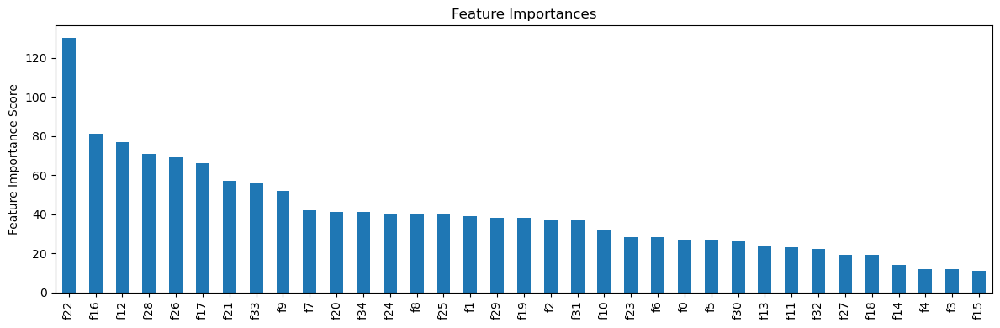

In [55]:
# cross validation
import pandas as pd
import numpy as np
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
from sklearn import metrics   #Additional scklearn functions
from sklearn.model_selection import GridSearchCV
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 12, 4

def modelfit(alg, data, label,useTrainCV=True, cv_folds=5, early_stopping_rounds=50):
    
    if useTrainCV:
        xgb_param = alg.get_xgb_params()
        xgtrain = xgb.DMatrix(data, label=label)
        cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=alg.get_params()['n_estimators'], nfold=cv_folds,
            metrics='error@0.1', early_stopping_rounds=early_stopping_rounds)
        alg.set_params(n_estimators=cvresult.shape[0])
    
    #Fit the algorithm on the data
    alg.fit(data, label)
        
    #Predict training set:
    dtrain_predictions = alg.predict(data)
        
    #Print model report:
    print("Accuracy : %.4g" % metrics.accuracy_score(label, dtrain_predictions))
    feat_imp = pd.Series(alg.get_booster().get_fscore()).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')


X_train = feature_all[:, np.array(list(range(35)))[:]]
# X_train = feature_all[:,np.array(list(range(0, 16)) + list(range(23, 35)))[:]]
y_train = all_label
# balancing the class classification for the training data
sm = SMOTE(random_state=100, k_neighbors=1)  # set the seed of smote as the index of the loop
X_train, y_train = sm.fit_resample(X_train, y_train)

model = XGBClassifier(
    learning_rate =0.1,
    n_estimators=5000,
    max_depth=9,
    min_child_weight=1,
    gamma=0,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=1,
    objective= 'binary:logistic',
    eval_metric='error@0.001',
    nthread=4,
    scale_pos_weight=1,
    seed=27)
modelfit(model, X_train, y_train)

plt.show()

Hyperparameter tuning using grid search:

In [46]:
# grid search: Tune max_depth and min_child_weight
param_test1 = {
 'max_depth':range(3,10,2),
 'min_child_weight':range(1,6,2)
}
gsearch1 = GridSearchCV(estimator = XGBClassifier( learning_rate =0.1, n_estimators=1000, max_depth=9,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1, seed=27), 
 param_grid = param_test1, scoring='roc_auc',n_jobs=4, cv=5)
gsearch1.fit(X_train, y_train)
gsearch1.cv_results_, gsearch1.best_params_, gsearch1.best_score_

({'mean_fit_time': array([0.25870075, 0.2490325 , 0.2482976 , 0.2805995 , 0.2529995 ,
         0.24837804, 0.28232827, 0.25319953, 0.24159946, 0.27620111,
         0.25680532, 0.23180566]),
  'std_fit_time': array([0.00840713, 0.00875636, 0.01418328, 0.0074458 , 0.01211605,
         0.01486721, 0.01416538, 0.01133866, 0.00788911, 0.01368715,
         0.01184425, 0.00910592]),
  'mean_score_time': array([0.00280046, 0.00299993, 0.00260024, 0.00300021, 0.00280018,
         0.00280032, 0.00300021, 0.00280032, 0.00280008, 0.00299883,
         0.00300031, 0.00240011]),
  'std_score_time': array([3.99947262e-04, 6.32032887e-04, 4.89726210e-04, 3.50402318e-07,
         3.99923367e-04, 3.99875811e-04, 3.50402318e-07, 3.99995060e-04,
         3.99875669e-04, 2.52318507e-06, 4.10190833e-07, 4.89823655e-04]),
  'param_max_depth': masked_array(data=[3, 3, 3, 5, 5, 5, 7, 7, 7, 9, 9, 9],
               mask=[False, False, False, False, False, False, False, False,
                     False, False, F

In [45]:
# grid search: eval_error
param_test2 = {
 'eval_metric':['error@0.001','error@0.01','error@0.1','error@0.2']
}
gsearch2 = GridSearchCV(estimator = XGBClassifier( learning_rate =0.1, n_estimators=1000, max_depth=9,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1, seed=27), 
 param_grid = param_test2, scoring='roc_auc',n_jobs=4, cv=5)
gsearch2.fit(X_train, y_train)
gsearch2.cv_results_, gsearch2.best_params_, gsearch2.best_score_

({'mean_fit_time': array([0.27530012, 0.28159933, 0.27719994, 0.26699934]),
  'std_fit_time': array([0.01247689, 0.00665099, 0.01774709, 0.0126016 ]),
  'mean_score_time': array([0.00280023, 0.00259995, 0.00300031, 0.00340009]),
  'std_score_time': array([0.00040007, 0.00048998, 0.00063249, 0.00080013]),
  'param_eval_metric': masked_array(data=['error@0.001', 'error@0.01', 'error@0.1', 'error@0.2'],
               mask=[False, False, False, False],
         fill_value='?',
              dtype=object),
  'params': [{'eval_metric': 'error@0.001'},
   {'eval_metric': 'error@0.01'},
   {'eval_metric': 'error@0.1'},
   {'eval_metric': 'error@0.2'}],
  'split0_test_score': array([0.92751479, 0.92751479, 0.92751479, 0.92751479]),
  'split1_test_score': array([0.82923077, 0.82923077, 0.82923077, 0.82923077]),
  'split2_test_score': array([0.79846154, 0.79846154, 0.79846154, 0.79846154]),
  'split3_test_score': array([0.92923077, 0.92923077, 0.92923077, 0.92923077]),
  'split4_test_score': arr

In [44]:
# grid search: reg_alpha
param_test3 = {
 'reg_alpha':[1e-5, 1e-2, 0.1, 1, 100]
}
gsearch3 = GridSearchCV(estimator = XGBClassifier( learning_rate =0.1, n_estimators=1000, max_depth=9,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1, seed=27), 
 param_grid = param_test3, scoring='roc_auc',n_jobs=4, cv=5)
gsearch3.fit(X_train, y_train)
gsearch3.cv_results_, gsearch3.best_params_, gsearch3.best_score_

({'mean_fit_time': array([0.34092989, 0.28301048, 0.29139981, 0.2902    , 0.19840055]),
  'std_fit_time': array([0.03617785, 0.01131821, 0.01125308, 0.0084235 , 0.01762306]),
  'mean_score_time': array([0.0032002 , 0.00300045, 0.00239983, 0.00240016, 0.00219946]),
  'std_score_time': array([4.00114443e-04, 4.86280395e-07, 4.89959835e-04, 4.90174080e-04,
         7.49972863e-04]),
  'param_reg_alpha': masked_array(data=[1e-05, 0.01, 0.1, 1, 100],
               mask=[False, False, False, False, False],
         fill_value='?',
              dtype=object),
  'params': [{'reg_alpha': 1e-05},
   {'reg_alpha': 0.01},
   {'reg_alpha': 0.1},
   {'reg_alpha': 1},
   {'reg_alpha': 100}],
  'split0_test_score': array([0.92751479, 0.92455621, 0.93195266, 0.92159763, 0.5       ]),
  'split1_test_score': array([0.82923077, 0.82461538, 0.84153846, 0.86      , 0.5       ]),
  'split2_test_score': array([0.79846154, 0.80615385, 0.82307692, 0.83846154, 0.5       ]),
  'split3_test_score': array([0.9292

# **Balancing, Training, and Classification Prediction (Random Forest):**

[  0   1   2   3   7  11  12  13  14  16  18  19  21  22  24  25  26  28
  29  30  31  32  33  34  35  36  37  38  39  41  45  47  48  49  51  52
  53  54  55  56  57  58  59  62  63  64  66  68  69  71  72  74  75  76
  77  78  80  81  83  84  85  86  89  90  92  93  94  97  98 100 103 105
 106 108 109 112 115 116 117 119 121 122 125 126 127 128 130 131 133 134
 135 136 137 138 140 141 143 144 146 148 149 151]
[  4   5   6   8   9  10  15  17  20  23  27  40  42  43  44  46  50  60
  61  65  67  70  73  79  82  87  88  91  95  96  99 101 102 104 107 110
 111 113 114 118 120 123 124 129 132 139 142 145 147 150 152 153 154 155
 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173
 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191
 192 193 194 195 196 197 198 199 200 201 202 203]
[[21  5]
 [ 3  9]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.6842105263157895
[  1   2   3   5   6   8   9  14  16  17  18  20  21  22  23  24  26  29
  30  31

[[20  5]
 [ 7  6]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.6578947368421053
[  0   1   3   4   6   7   8   9  10  11  12  14  16  17  19  20  21  22
  23  24  27  28  29  30  31  32  34  35  38  40  42  44  46  47  49  52
  53  54  57  58  60  61  64  67  68  71  72  74  75  80  82  83  84  85
  86  87  88  89  90  91  92  94  95  96  98 100 101 105 107 108 109 110
 111 114 115 116 118 119 120 121 123 124 125 126 127 131 132 133 134 135
 138 139 140 142 143 144 147 149]
[  2   5  13  15  18  25  26  33  36  37  39  41  43  45  48  50  51  55
  56  59  62  63  65  66  69  70  73  76  77  78  79  81  93  97  99 102
 103 104 106 112 113 117 122 128 129 130 136 137 141 145 146 148 150 151
 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169
 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187
 188 189 190 191 192 193 194 195]
[[25  5]
 [ 1  7]]
ACC: 0.8421052631578947
If we always guess 0, ACC: 0.7894736842105263
[  0   1   3   5   6   7

[[25  1]
 [ 9  3]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.6842105263157895
[  0   1   3   4   5   6   8  11  12  13  15  17  22  25  26  27  29  32
  33  34  35  36  37  40  42  43  44  47  48  49  50  51  52  53  55  57
  60  61  64  65  67  68  69  70  75  77  79  80  81  82  84  85  86  87
  91  92  93  96  97 100 101 102 103 104 105 106 108 109 111 112 113 114
 115 116 117 118 119 120 122 123 124 125 130 131 132 133 134 136 137 138
 139 141 142 143 144 145 146 148 151]
[  2   7   9  10  14  16  18  19  20  21  23  24  28  30  31  38  39  41
  45  46  54  56  58  59  62  63  66  71  72  73  74  76  78  83  88  89
  90  94  95  98  99 107 110 121 126 127 128 129 135 140 147 149 150 152
 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170
 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188
 189 190 191 192 193 194 195 196 197]
[[27  2]
 [ 5  4]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.7631578947368421
[  0   1   6   7

[[24  3]
 [ 5  6]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.7105263157894737
[  0   2   3   6   7   8   9  13  14  16  17  18  19  20  21  23  24  25
  27  28  30  34  36  38  40  41  42  44  45  46  48  50  52  53  54  55
  58  60  61  62  63  65  66  67  68  71  72  74  76  79  80  81  83  84
  85  86  87  88  89  91  95  97  99 100 101 102 103 104 106 107 108 109
 110 111 112 114 115 117 118 119 120 121 122 125 128 131 133 134 135 137
 138 139 140 141 142 144 145 146 148 149]
[  1   4   5  10  11  12  15  22  26  29  31  32  33  35  37  39  43  47
  49  51  56  57  59  64  69  70  73  75  77  78  82  90  92  93  94  96
  98 105 113 116 123 124 126 127 129 130 132 136 143 147 150 151 152 153
 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171
 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189
 190 191 192 193 194 195 196 197 198 199]
[[21  7]
 [ 4  6]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.7368421052631579
[  0   1

[[25  1]
 [ 9  3]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.6842105263157895
[  0   1   2   3   4   7   8  10  11  12  13  14  15  16  17  18  19  20
  22  24  26  27  28  29  30  31  34  35  36  37  39  40  41  43  44  45
  46  47  48  50  52  53  54  55  56  57  59  62  64  67  68  71  73  74
  76  78  79  85  87  88  91  92  94  97  99 102 103 104 105 106 108 109
 110 111 115 116 118 119 120 121 122 123 124 126 127 128 129 130 131 133
 134 135 136 138 139 143 144 145 148 150]
[  5   6   9  21  23  25  32  33  38  42  49  51  58  60  61  63  65  66
  69  70  72  75  77  80  81  82  83  84  86  89  90  93  95  96  98 100
 101 107 112 113 114 117 125 132 137 140 141 142 146 147 149 151 152 153
 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171
 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189
 190 191 192 193 194 195 196 197 198 199]
[[26  2]
 [ 5  5]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.7368421052631579
[  0   1

[[19  4]
 [12  3]]
ACC: 0.5789473684210527
If we always guess 0, ACC: 0.6052631578947368
[  3   5   6   7   9  13  14  15  16  17  18  19  21  24  25  26  27  30
  32  33  38  39  40  41  42  43  46  47  49  50  51  52  54  55  56  57
  59  60  61  64  65  66  67  68  69  70  71  73  74  75  76  77  79  80
  81  82  89  90  92  93  94  95  96  97  98  99 101 104 105 106 107 108
 110 112 115 117 118 119 120 122 123 124 125 126 127 128 129 130 131 132
 135 137 139 140 142 145 146 148 149 150]
[  0   1   2   4   8  10  11  12  20  22  23  28  29  31  34  35  36  37
  44  45  48  53  58  62  63  72  78  83  84  85  86  87  88  91 100 102
 103 109 111 113 114 116 121 133 134 136 138 141 143 144 147 151 152 153
 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171
 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189
 190 191 192 193 194 195 196 197 198 199]
[[26  2]
 [ 6  4]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.7368421052631579
[  1   4

[[21  4]
 [ 9  4]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.6578947368421053
[  1   2   3   4   5   7  10  12  14  15  16  17  18  19  21  22  25  26
  27  29  30  31  32  33  34  35  36  37  38  40  41  42  46  48  49  50
  53  54  56  58  59  60  61  62  63  64  65  68  69  70  71  72  73  76
  78  79  81  82  84  86  88  89  90  91  95  97  98  99 100 101 102 103
 104 105 106 107 108 109 110 111 112 114 116 117 118 119 120 121 122 126
 127 128 129 130 134 137 138 140 142 144 145 146 147 148 150 151]
[  0   6   8   9  11  13  20  23  24  28  39  43  44  45  47  51  52  55
  57  66  67  74  75  77  80  83  85  87  92  93  94  96 113 115 123 124
 125 131 132 133 135 136 139 141 143 149 152 153 154 155 156 157 158 159
 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177
 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195
 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211]
[[19  3]
 [ 8  8]]
ACC: 0.7105263157894737
If we 

[[24  0]
 [10  4]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.631578947368421
[  1   2   3   4   5   7   8   9  10  11  13  14  15  16  17  18  20  21
  22  25  26  27  29  30  31  32  34  35  36  37  39  43  46  48  50  51
  53  55  56  58  59  60  63  64  65  66  67  68  69  70  71  76  77  78
  79  80  81  82  83  86  88  89  90  91  93  94  97  98 100 103 104 105
 108 109 110 111 113 115 116 119 121 123 124 125 126 128 129 130 131 132
 135 136 138 141 143 144 146 147 148 149 150 151]
[  0   6  12  19  23  24  28  33  38  40  41  42  44  45  47  49  52  54
  57  61  62  72  73  74  75  84  85  87  92  95  96  99 101 102 106 107
 112 114 117 118 120 122 127 133 134 137 139 140 142 145 152 153 154 155
 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173
 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191
 192 193 194 195 196 197 198 199 200 201 202 203]
[[25  1]
 [ 7  5]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.6842105263

[[26  4]
 [ 7  1]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.7894736842105263
[  0   1   2   4   7  10  11  13  16  18  19  20  22  23  24  25  26  27
  29  30  33  34  36  37  39  41  42  43  44  46  47  48  49  50  51  52
  54  56  57  58  59  60  62  64  67  69  70  73  74  75  76  78  79  80
  81  82  83  85  86  87  88  92  93  94  95  96  99 100 101 102 103 104
 105 106 107 108 109 110 111 112 113 115 116 117 120 123 124 125 126 127
 128 131 132 133 137 138 141 142 143 147 149 150 151]
[  3   5   6   8   9  12  14  15  17  21  28  31  32  35  38  40  45  53
  55  61  63  65  66  68  71  72  77  84  89  90  91  97  98 114 118 119
 121 122 129 130 134 135 136 139 140 144 145 146 148 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205]
[[23  2]
 [ 8  5]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.6

[[24  4]
 [ 3  7]]
ACC: 0.8157894736842105
If we always guess 0, ACC: 0.7368421052631579
[  1   3   4   5   6   7   8   9  10  11  12  13  14  16  17  18  19  20
  22  24  25  26  27  28  30  31  32  34  35  36  37  38  39  41  42  45
  47  48  50  51  52  53  54  55  56  59  60  64  65  66  67  68  69  71
  72  73  75  77  83  84  86  87  88  89  90  91  92  93  94  95  96  97
  99 100 103 105 107 108 109 110 111 112 113 114 115 117 118 120 123 124
 125 127 130 132 133 134 138 139 140 142 145 147 150 151]
[  0   2  15  21  23  29  33  40  43  44  46  49  57  58  61  62  63  70
  74  76  78  79  80  81  82  85  98 101 102 104 106 116 119 121 122 126
 128 129 131 135 136 137 141 143 144 146 148 149 152 153 154 155 156 157
 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175
 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193
 194 195 196 197 198 199 200 201 202 203 204 205 206 207]
[[23  1]
 [ 9  5]]
ACC: 0.7368421052631579
If we always guess 0, 

[[25  2]
 [ 7  4]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.7105263157894737
[  0   1   3   4   5   7  10  11  12  13  14  16  19  21  22  23  24  25
  26  27  28  29  30  32  33  35  36  37  40  42  43  44  45  46  47  48
  52  53  55  56  57  58  59  61  62  64  65  66  67  68  69  71  72  73
  74  76  78  79  81  82  84  85  86  87  88  89  90  93  95  97  98  99
 100 101 102 103 104 106 108 111 112 113 114 115 116 117 119 120 121 124
 125 126 127 130 133 134 135 136 138 140 143 145 146 151]
[  2   6   8   9  15  17  18  20  31  34  38  39  41  49  50  51  54  60
  63  70  75  77  80  83  91  92  94  96 105 107 109 110 118 122 123 128
 129 131 132 137 139 141 142 144 147 148 149 150 152 153 154 155 156 157
 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175
 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193
 194 195 196 197 198 199 200 201 202 203 204 205 206 207]
[[18  6]
 [ 8  6]]
ACC: 0.631578947368421
If we always guess 0, A

[[23  1]
 [10  4]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.631578947368421
[  0   1   2   3   4   6   7   8  10  11  13  15  16  17  21  22  23  28
  30  31  32  33  34  35  36  37  38  39  41  42  44  45  46  48  50  51
  52  53  54  57  59  60  63  65  67  68  69  70  72  74  75  76  77  79
  81  84  85  86  87  91  92  93  94  95  96  99 100 102 104 105 106 107
 108 110 111 113 114 115 116 117 118 120 121 122 123 126 127 128 129 130
 131 132 134 135 137 139 140 141 145 147 149 150 151]
[  5   9  12  14  18  19  20  24  25  26  27  29  40  43  47  49  55  56
  58  61  62  64  66  71  73  78  80  82  83  88  89  90  97  98 101 103
 109 112 119 124 125 133 136 138 142 143 144 146 148 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205]
[[22  3]
 [ 9  4]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.65

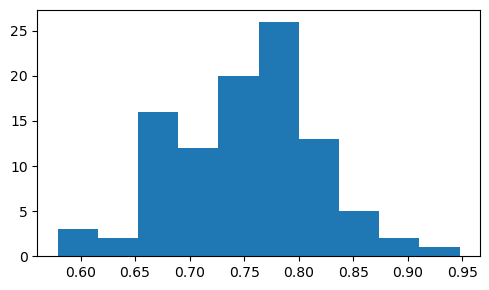

In [59]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA


# Instantiate model with 1000 decision trees
rf = RandomForestClassifier(n_estimators = 1000, random_state = 42)

# os.chdir('C:/Users/xl037/PycharmProjects/DAISproject/Datasets/')
cwd = os.getcwd()
# print(cwd)
test_data_path = os.path.join(cwd, 'train_data.npy')
label_data_path = os.path.join(cwd, 'train_label.npy')
all_data = np.load(test_data_path)
all_label = np.load(label_data_path)

N = 100
mean_accuracy = []
mean_precision = []
mean_recall = []
mean_F1 = []

guess_accuracy = []
guess_precision = []
guess_recall = []
guess_F1 = []

for i in range(N):
  ratio_test = 0.2
  all_index = list(range(190))
  random.shuffle(all_index)
  test_index = all_index[0:round(ratio_test*190)]
  train_index = all_index[round(ratio_test*190):]

  train_data = all_data[train_index, :, :]
  train_label = all_label[train_index]

  index_train_0 = np.where(train_label == 0)[0]
  index_train_1 = np.where(train_label == 1)[0]
  """
    feature 7, Hausdorff distance
  """
  feature_7_hausdorff_dist_all_0 = np.zeros((190, 2))
  feature_7_hausdorff_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(hausdorff_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(hausdorff_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_hausdorff_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_hausdorff_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_hausdorff_dist_all_0[train_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_hausdorff_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(hausdorff_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(hausdorff_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_hausdorff_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_hausdorff_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_hausdorff_dist_all_0[test_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_hausdorff_dist_all_1[test_index[mk], 1] = np.std(temp_1)
  """
    feature 7, Chamfer distance
  """
  feature_7_chamfer_dist_all_0 = np.zeros((190, 2))
  feature_7_chamfer_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(chamfer_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(chamfer_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_chamfer_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_chamfer_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_chamfer_dist_all_0[train_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_chamfer_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(chamfer_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(chamfer_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_chamfer_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_chamfer_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_chamfer_dist_all_0[test_index[mk], 1] = np.std(temp_0)
    feature_7_chamfer_dist_all_1[test_index[mk], 1] = np.std(temp_1)
  """
    feature 7, Wasserstein distance
  """
  feature_7_Wasserstein_dist_all_0 = np.zeros((190, 2))
  feature_7_Wasserstein_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(Wasserstein_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(Wasserstein_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_Wasserstein_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_Wasserstein_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_Wasserstein_dist_all_0[train_index[mk], 1] = np.std(temp_0)
    feature_7_Wasserstein_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(Wasserstein_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(Wasserstein_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_Wasserstein_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_Wasserstein_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_Wasserstein_dist_all_0[test_index[mk], 1] = np.std(temp_0)
    feature_7_Wasserstein_dist_all_1[test_index[mk], 1] = np.std(temp_1)

  # combine all features
  feature_all[:, 23:25] = feature_7_hausdorff_dist_all_0[:, 0:2]
  feature_all[:, 25:27] = feature_7_hausdorff_dist_all_1[:, 0:2]
  feature_all[:, 27:29] = feature_7_chamfer_dist_all_0[:, 0:2]
  feature_all[:, 29:31] = feature_7_chamfer_dist_all_1[:, 0:2]
  feature_all[:, 31:33] = feature_7_Wasserstein_dist_all_0[:, 0:2]
  feature_all[:, 33:35] = feature_7_Wasserstein_dist_all_1[:, 0:2]

  # normalize all the data
  for i in range(23, 35):
    feature_all[:, i] = preprocessing.normalize([feature_all[:, i]])
  # print(feature_all[:, 23:35])
  # print(feature_all[:, 0:2])

  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list([1, 7,  8, 11, 22, 28, 29, 32]))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list([7]))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(0, 16)) + list(range(23, 35)))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(0, 23)))[:]]
  X_train = feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  y_train = all_label[train_index]
  X_test= feature_all[np.array(test_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  y_test = all_label[test_index]

  # balancing the class classification for the training data
  sm = SMOTE(random_state=i, k_neighbors=1)  # set the seed of smote as the index of the loop
  X_train, y_train = sm.fit_resample(X_train, y_train)
  index_train_0_try = np.where(y_train == 0)[0]
  index_train_1_try = np.where(y_train == 1)[0]
  print(index_train_0_try)
  print(index_train_1_try)

  # Train the model on training data
  rf.fit(X_train, y_train)
  # Use the forest's predict method on the test data
  y_pred = rf.predict(X_test)
  mean_accuracy.append(accuracy_score(y_test, y_pred))
  mean_precision.append(precision_score(y_test, y_pred))
  mean_recall.append(recall_score(y_test, y_pred))
  mean_F1.append(f1_score(y_test, y_pred))
  # print('accuracy:', accuracy_score(y_test, y_pred))
  print(confusion_matrix(y_test, y_pred))

  # print(y_pred)
  # print(y_test)
  print('ACC:', accuracy_score(y_test, y_pred))
  print('If we always guess 0, ACC:', len(np.where(y_test == 0)[0])/len(y_test))

print('The average accuracy is:', sum(mean_accuracy)/N)
print('The standard deviation of accuracy:', np.std(mean_accuracy))
print('The median of the accuracy:', statistics.median(mean_accuracy))

print('The average precision is:', sum(mean_precision)/N)
print('The standard deviation of precision:', np.std(mean_precision))
print('The median of the precision:', statistics.median(mean_precision))

print('The average recall is:', sum(mean_recall)/N)
print('The standard deviation of recall:', np.std(mean_recall))
print('The median of the recall:', statistics.median(mean_recall))

print('The average F1 is:', sum(mean_F1)/N)
print('The standard deviation of F1:', np.std(mean_F1))
print('The median of the F1:', statistics.median(mean_F1))

# Creating histogram
fig, ax = plt.subplots(figsize =(5, 3))
ax.hist(mean_accuracy)
# Show plot
plt.show()

# **Balancing, Training, and Classification Prediction (Logistic Regression):**

[  0   1   2   6   7   8   9  11  12  13  15  17  18  19  20  21  24  26
  29  30  31  32  34  36  37  38  39  40  41  43  44  46  48  49  50  51
  52  54  59  60  61  62  64  66  67  68  70  72  74  76  78  80  81  82
  83  84  85  86  87  88  89  90  91  92  93  94  96  99 100 101 102 106
 107 108 109 110 111 112 114 115 117 118 120 122 126 127 129 131 132 133
 134 137 141 142 143 144 145 146 147 150 151]
[  3   4   5  10  14  16  22  23  25  27  28  33  35  42  45  47  53  55
  56  57  58  63  65  69  71  73  75  77  79  95  97  98 103 104 105 113
 116 119 121 123 124 125 128 130 135 136 138 139 140 148 149 152 153 154
 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172
 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190
 191 192 193 194 195 196 197 198 199 200 201]
[[19  8]
 [ 3  8]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.7105263157894737
[  0   1   2   5   6   7   8   9  11  12  13  15  16  17  18  19  21  23
  26  27  29  30

[  0   1   2   3   4   7   8   9  10  11  12  13  14  15  16  17  18  19
  20  21  22  25  27  28  30  35  36  37  38  39  40  41  46  47  48  49
  51  54  57  59  61  63  64  68  69  70  71  72  73  74  75  76  77  80
  81  82  83  85  86  89  90  92  93  94  95  96  97  98  99 100 101 103
 104 106 107 108 109 111 112 114 115 117 119 120 123 124 126 127 128 129
 130 131 132 133 134 135 136 138 142 144 146 149 150 151]
[  5   6  23  24  26  29  31  32  33  34  42  43  44  45  50  52  53  55
  56  58  60  62  65  66  67  78  79  84  87  88  91 102 105 110 113 116
 118 121 122 125 137 139 140 141 143 145 147 148 152 153 154 155 156 157
 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175
 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193
 194 195 196 197 198 199 200 201 202 203 204 205 206 207]
[[16  8]
 [ 6  8]]
ACC: 0.631578947368421
If we always guess 0, ACC: 0.631578947368421
[  0   4   6   7   8   9  10  12  13  14  15  16  17  19  20  21  2

[  0   1   2   3   4   5   9  10  12  14  15  17  18  19  20  21  24  25
  28  29  30  31  32  35  36  37  38  39  40  41  44  45  46  47  48  49
  52  53  54  55  58  59  60  61  62  63  64  65  68  69  70  72  73  75
  77  78  79  80  83  84  85  86  88  89  92  96  97  99 101 103 104 105
 107 108 109 113 115 116 117 118 119 120 125 127 128 130 131 135 139 140
 141 142 143 144 145 146 147 148 149 150 151]
[  6   7   8  11  13  16  22  23  26  27  33  34  42  43  50  51  56  57
  66  67  71  74  76  81  82  87  90  91  93  94  95  98 100 102 106 110
 111 112 114 121 122 123 124 126 129 132 133 134 136 137 138 152 153 154
 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172
 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190
 191 192 193 194 195 196 197 198 199 200 201]
[[21  6]
 [ 5  6]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.7105263157894737
[  1   2   4   5   6   7   8   9  12  13  14  16  20  21  22  23  24  25
  26  27  28  29

[  0   1   2   4   6   9  10  12  13  16  17  19  20  22  25  26  27  28
  29  30  33  34  35  36  37  38  39  40  41  44  45  47  48  50  51  52
  54  55  56  57  58  59  61  62  63  64  65  66  67  68  69  70  71  72
  73  75  77  78  79  81  82  85  88  90  91  92  93  95  98 100 102 105
 106 107 109 111 112 113 114 116 117 121 124 125 127 128 129 130 131 133
 134 137 139 140 141 142 143 144 145 146 148 149 150 151]
[  3   5   7   8  11  14  15  18  21  23  24  31  32  42  43  46  49  53
  60  74  76  80  83  84  86  87  89  94  96  97  99 101 103 104 108 110
 115 118 119 120 122 123 126 132 135 136 138 147 152 153 154 155 156 157
 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175
 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193
 194 195 196 197 198 199 200 201 202 203 204 205 206 207]
[[17  7]
 [ 7  7]]
ACC: 0.631578947368421
If we always guess 0, ACC: 0.631578947368421
[  0   3   4   5   6   7   8   9  11  12  13  14  15  17  18  20  2

[  0   4   7   8  10  12  13  14  15  16  17  21  23  24  25  26  27  29
  32  33  34  35  36  37  38  42  43  44  45  46  47  48  49  51  52  53
  56  57  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78
  79  82  83  86  88  89  90  92  93  94  96  97  98  99 100 101 104 107
 108 109 110 111 114 116 117 119 120 121 122 123 125 127 129 130 132 133
 134 136 137 140 141 142 143 146 149 150]
[  1   2   3   5   6   9  11  18  19  20  22  28  30  31  39  40  41  50
  54  55  58  59  60  61  62  80  81  84  85  87  91  95 102 103 105 106
 112 113 115 118 124 126 128 131 135 138 139 144 145 147 148 151 152 153
 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171
 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189
 190 191 192 193 194 195 196 197 198 199]
[[25  3]
 [ 6  4]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.7368421052631579
[  0   1   3   4   5   7  10  11  12  14  15  17  18  19  21  22  23  25
  27  28  29  30  32  33

[  1   2   3   4   5   6   9  12  13  15  16  18  20  21  22  23  24  25
  28  30  31  32  33  34  36  37  40  41  42  43  44  47  48  51  53  54
  55  56  58  59  60  61  62  63  64  65  66  67  68  69  70  71  73  74
  75  77  79  80  81  82  83  84  87  88  90  91  96  97  98  99 100 102
 104 108 109 110 114 120 121 123 126 127 128 130 131 132 133 134 135 136
 137 140 141 142 143 144 146 147 149 150]
[  0   7   8  10  11  14  17  19  26  27  29  35  38  39  45  46  49  50
  52  57  72  76  78  85  86  89  92  93  94  95 101 103 105 106 107 111
 112 113 115 116 117 118 119 122 124 125 129 138 139 145 148 151 152 153
 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171
 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189
 190 191 192 193 194 195 196 197 198 199]
[[20  8]
 [ 5  5]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.7368421052631579
[  0   1   3   6   8   9  10  11  13  14  15  16  17  18  20  21  22  24
  27  28  29  30  31  32

[  0   2   3   4   7   9  11  14  15  16  17  20  21  22  24  26  27  29
  30  31  34  35  36  37  38  39  43  45  46  47  49  50  54  55  57  58
  59  60  61  62  63  64  65  68  69  71  73  75  76  77  78  79  80  82
  84  86  88  91  92  93  97  99 100 101 102 103 104 106 107 108 109 111
 112 113 114 115 117 118 120 121 122 123 124 125 126 127 129 130 132 134
 136 138 139 141 142 143 144 145 146 149 150]
[  1   5   6   8  10  12  13  18  19  23  25  28  32  33  40  41  42  44
  48  51  52  53  56  66  67  70  72  74  81  83  85  87  89  90  94  95
  96  98 105 110 116 119 128 131 133 135 137 140 147 148 151 152 153 154
 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172
 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190
 191 192 193 194 195 196 197 198 199 200 201]
[[16 11]
 [ 6  5]]
ACC: 0.5526315789473685
If we always guess 0, ACC: 0.7105263157894737
[  0   1   3   4   5   6   7   8   9  11  12  13  14  15  16  19  21  24
  25  28  29  31

[  1   2   4   5   6   7   8  10  11  14  15  16  17  18  19  20  22  24
  25  26  27  28  29  30  33  34  38  40  42  43  46  47  48  49  50  52
  54  55  56  59  60  61  62  63  64  65  66  67  68  69  70  72  73  75
  77  80  81  82  83  85  87  89  90  92  93  96  97  98  99 100 101 102
 103 106 109 111 112 114 118 119 120 121 123 124 126 127 128 129 131 132
 133 136 137 138 141 142 144 145 146 149 151]
[  0   3   9  12  13  21  23  31  32  35  36  37  39  41  44  45  51  53
  57  58  71  74  76  78  79  84  86  88  91  94  95 104 105 107 108 110
 113 115 116 117 122 125 130 134 135 139 140 143 147 148 150 152 153 154
 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172
 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190
 191 192 193 194 195 196 197 198 199 200 201]
[[22  5]
 [ 9  2]]
ACC: 0.631578947368421
If we always guess 0, ACC: 0.7105263157894737
[  2   3   5   7   8  10  11  13  14  16  17  18  20  22  23  24  25  27
  28  29  32  34 

[  0   1   2   3   7   9  10  11  12  15  16  18  19  23  24  25  26  27
  29  30  31  32  33  35  36  37  39  41  42  43  45  47  48  49  50  51
  53  54  55  57  58  59  60  61  63  64  65  68  69  70  72  73  74  75
  77  78  79  81  82  83  85  87  88  90  94  95  97  98  99 100 102 104
 105 106 107 108 109 110 111 112 113 114 115 116 118 119 124 125 129 131
 132 133 134 136 137 138 139 140 141 142 144 145 146 147 150 151]
[  4   5   6   8  13  14  17  20  21  22  28  34  38  40  44  46  52  56
  62  66  67  71  76  80  84  86  89  91  92  93  96 101 103 117 120 121
 122 123 126 127 128 130 135 143 148 149 152 153 154 155 156 157 158 159
 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177
 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195
 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211]
[[18  4]
 [ 6 10]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.5789473684210527
[  0   1   2   5   6   7   8   9  10  13  14  15 

[  0   1   2   3   4   5   6   7   8  13  15  16  17  18  19  20  22  24
  25  26  28  29  32  33  34  37  38  39  40  41  42  43  44  46  47  48
  50  51  54  56  59  60  61  63  66  69  70  71  72  75  77  80  81  82
  84  85  87  89  91  94  95  96  97  98  99 100 101 102 103 106 108 110
 111 112 114 115 117 118 119 123 124 125 126 127 128 132 133 134 135 137
 138 139 141 142 143 144 145 147]
[  9  10  11  12  14  21  23  27  30  31  35  36  45  49  52  53  55  57
  58  62  64  65  67  68  73  74  76  78  79  83  86  88  90  92  93 104
 105 107 109 113 116 120 121 122 129 130 131 136 140 146 148 149 150 151
 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169
 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187
 188 189 190 191 192 193 194 195]
[[23  7]
 [ 2  6]]
ACC: 0.7631578947368421
If we always guess 0, ACC: 0.7894736842105263
[  0   4   6   7   8   9  10  11  12  13  14  15  16  18  20  21  22  23
  24  26  27  28  29  30  31  32  37  38

[  0   2   3   4   5   7   8  10  13  16  17  18  19  20  21  22  24  25
  26  27  28  30  31  33  34  36  37  38  40  42  43  44  50  51  53  54
  55  57  58  62  63  64  65  66  67  69  70  72  73  74  75  77  78  79
  80  81  82  83  84  86  87  89  91  92  93  94  95  98 100 101 102 104
 105 107 109 111 113 115 116 117 120 122 123 124 125 128 129 130 131 132
 134 136 137 138 140 141 143 144 145 146 147 148 149 151]
[  1   6   9  11  12  14  15  23  29  32  35  39  41  45  46  47  48  49
  52  56  59  60  61  68  71  76  85  88  90  96  97  99 103 106 108 110
 112 114 118 119 121 126 127 133 135 139 142 150 152 153 154 155 156 157
 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175
 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193
 194 195 196 197 198 199 200 201 202 203 204 205 206 207]
[[16  8]
 [ 4 10]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.631578947368421
[  0   3   4   5   6   7  10  12  13  14  15  18  19  20  21  22  

[  0   2   4   9  10  11  12  14  17  18  19  21  22  26  27  29  31  32
  34  35  36  38  39  40  41  42  43  44  45  46  48  49  50  51  52  53
  54  55  56  57  58  60  61  63  64  65  66  68  71  72  73  74  75  76
  77  78  81  83  85  87  88  89  91  92  93  94  95  96  98 101 102 103
 108 110 112 113 114 115 117 118 119 120 123 124 127 130 133 134 136 137
 138 140 141 142 144 145 146 147 148 149]
[  1   3   5   6   7   8  13  15  16  20  23  24  25  28  30  33  37  47
  59  62  67  69  70  79  80  82  84  86  90  97  99 100 104 105 106 107
 109 111 116 121 122 125 126 128 129 131 132 135 139 143 150 151 152 153
 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171
 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189
 190 191 192 193 194 195 196 197 198 199]
[[22  6]
 [ 4  6]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.7368421052631579
The average accuracy is: 0.6794736842105265
The standard deviation of accuracy: 0.069264037748370

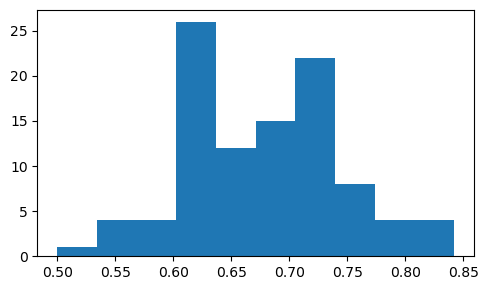

In [57]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
import point_cloud_utils as pcu
import numpy as np
import matplotlib.pylab as plt
import scipy.sparse as sparse
import random
import statistics
from imblearn.over_sampling import SMOTE

# os.chdir('C:/Users/xl037/PycharmProjects/DAISproject/Datasets/')
cwd = os.getcwd()
# print(cwd)
test_data_path = os.path.join(cwd, 'train_data.npy')
label_data_path = os.path.join(cwd, 'train_label.npy')
all_data = np.load(test_data_path)
all_label = np.load(label_data_path)

N = 100
mean_accuracy = []
mean_precision = []
mean_recall = []
mean_F1 = []

guess_accuracy = []
guess_precision = []
guess_recall = []
guess_F1 = []

for i in range(N):
  ratio_test = 0.2
  all_index = list(range(190))
  random.shuffle(all_index)
  test_index = all_index[0:round(ratio_test*190)]
  train_index = all_index[round(ratio_test*190):]

  train_data = all_data[train_index, :, :]
  train_label = all_label[train_index]

  index_train_0 = np.where(train_label == 0)[0]
  index_train_1 = np.where(train_label == 1)[0]
  """
    feature 7, Hausdorff distance
  """
  feature_7_hausdorff_dist_all_0 = np.zeros((190, 2))
  feature_7_hausdorff_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(hausdorff_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(hausdorff_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_hausdorff_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_hausdorff_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_hausdorff_dist_all_0[train_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_hausdorff_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(hausdorff_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(hausdorff_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_hausdorff_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_hausdorff_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_hausdorff_dist_all_0[test_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_hausdorff_dist_all_1[test_index[mk], 1] = np.std(temp_1)
  """
    feature 7, Chamfer distance
  """
  feature_7_chamfer_dist_all_0 = np.zeros((190, 2))
  feature_7_chamfer_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(chamfer_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(chamfer_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_chamfer_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_chamfer_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_chamfer_dist_all_0[train_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_chamfer_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(chamfer_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(chamfer_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_chamfer_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_chamfer_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_chamfer_dist_all_0[test_index[mk], 1] = np.std(temp_0)
    feature_7_chamfer_dist_all_1[test_index[mk], 1] = np.std(temp_1)
  """
    feature 7, Wasserstein distance
  """
  feature_7_Wasserstein_dist_all_0 = np.zeros((190, 2))
  feature_7_Wasserstein_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(Wasserstein_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(Wasserstein_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_Wasserstein_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_Wasserstein_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_Wasserstein_dist_all_0[train_index[mk], 1] = np.std(temp_0)
    feature_7_Wasserstein_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(Wasserstein_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(Wasserstein_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_Wasserstein_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_Wasserstein_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_Wasserstein_dist_all_0[test_index[mk], 1] = np.std(temp_0)
    feature_7_Wasserstein_dist_all_1[test_index[mk], 1] = np.std(temp_1)

  # combine all features
  feature_all[:, 23:25] = feature_7_hausdorff_dist_all_0[:, 0:2]
  feature_all[:, 25:27] = feature_7_hausdorff_dist_all_1[:, 0:2]
  feature_all[:, 27:29] = feature_7_chamfer_dist_all_0[:, 0:2]
  feature_all[:, 29:31] = feature_7_chamfer_dist_all_1[:, 0:2]
  feature_all[:, 31:33] = feature_7_Wasserstein_dist_all_0[:, 0:2]
  feature_all[:, 33:35] = feature_7_Wasserstein_dist_all_1[:, 0:2]

  # normalize all the data
  for i in range(23, 35):
    feature_all[:, i] = preprocessing.normalize([feature_all[:, i]])
  # print(feature_all[:, 23:35])
  # print(feature_all[:, 0:2])

  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list([1, 7,  8, 11, 22, 28, 29, 32]))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list([7]))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(0, 16)) + list(range(23, 35)))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(0, 23)))[:]]
  X_train = feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  y_train = all_label[train_index]
  X_test= feature_all[np.array(test_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  y_test = all_label[test_index]

  # balancing the class classification for the training data
  sm = SMOTE(random_state=i, k_neighbors=1)  # set the seed of smote as the index of the loop
  X_train, y_train = sm.fit_resample(X_train, y_train)
  index_train_0_try = np.where(y_train == 0)[0]
  index_train_1_try = np.where(y_train == 1)[0]
  print(index_train_0_try)
  print(index_train_1_try)


  # Train the model on training data
  model = LogisticRegression(solver='liblinear', random_state=0).fit(X_train, y_train)
  # predict the results
  y_pred = model.predict(X_test)
  # y_pred = np.logical_not(y_pred).astype('int64')  # be careful, we flip 0 and 1 here
  # y_test = np.logical_not(y_test).astype('int64')  # be careful, we flip 0 and 1 here
  # print(classification_report(y_test,y_pred))
  mean_accuracy.append(accuracy_score(y_test, y_pred))
  mean_precision.append(precision_score(y_test, y_pred))
  mean_recall.append(recall_score(y_test, y_pred))
  mean_F1.append(f1_score(y_test, y_pred))
  # print('accuracy:', accuracy_score(y_test, y_pred))
  print(confusion_matrix(y_test, y_pred))

  # print(y_pred)
  # print(y_test)
  print('ACC:', accuracy_score(y_test, y_pred))
  print('If we always guess 0, ACC:', len(np.where(y_test == 0)[0])/len(y_test))

print('The average accuracy is:', sum(mean_accuracy)/N)
print('The standard deviation of accuracy:', np.std(mean_accuracy))
print('The median of the accuracy:', statistics.median(mean_accuracy))

print('The average precision is:', sum(mean_precision)/N)
print('The standard deviation of precision:', np.std(mean_precision))
print('The median of the precision:', statistics.median(mean_precision))

print('The average recall is:', sum(mean_recall)/N)
print('The standard deviation of recall:', np.std(mean_recall))
print('The median of the recall:', statistics.median(mean_recall))

print('The average F1 is:', sum(mean_F1)/N)
print('The standard deviation of F1:', np.std(mean_F1))
print('The median of the F1:', statistics.median(mean_F1))

# Creating histogram
fig, ax = plt.subplots(figsize =(5, 3))
ax.hist(mean_accuracy)
# Show plot
plt.show()

# **Balancing, Training, and Classification Prediction (SVM):**

[  0   2   3   4   5   6   7   8   9  11  12  15  17  18  19  20  21  25
  28  29  31  32  34  35  36  37  40  41  42  43  44  46  47  49  51  52
  53  55  57  58  59  60  61  62  63  65  66  67  68  69  70  71  72  73
  74  75  76  77  78  79  81  84  88  89  91  92  93  94  98 101 103 104
 105 106 107 108 109 111 112 114 115 116 117 118 119 121 123 124 125 127
 128 129 131 136 137 138 139 142 143 147 149 151]
[  1  10  13  14  16  22  23  24  26  27  30  33  38  39  45  48  50  54
  56  64  80  82  83  85  86  87  90  95  96  97  99 100 102 110 113 120
 122 126 130 132 133 134 135 140 141 144 145 146 148 150 152 153 154 155
 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173
 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191
 192 193 194 195 196 197 198 199 200 201 202 203]
[[12 14]
 [ 1 11]]
ACC: 0.6052631578947368
If we always guess 0, ACC: 0.6842105263157895
[  0   1   2   4   5  10  12  13  14  15  16  17  19  20  21  23  24  25
  26  27

[  0   2   3   8   9  10  11  12  13  14  18  20  23  24  25  26  28  30
  32  33  34  35  37  38  39  40  41  43  44  47  49  50  51  52  53  54
  55  56  57  58  59  61  63  64  66  67  68  69  70  72  73  74  77  78
  79  80  81  82  83  84  85  86  87  88  89  90  92  94  95  96  97  98
  99 100 102 104 105 106 107 109 110 111 113 114 115 118 119 122 124 125
 128 131 132 134 135 136 137 138 145 146 147 149]
[  1   4   5   6   7  15  16  17  19  21  22  27  29  31  36  42  45  46
  48  60  62  65  71  75  76  91  93 101 103 108 112 116 117 120 121 123
 126 127 129 130 133 139 140 141 142 143 144 148 150 151 152 153 154 155
 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173
 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191
 192 193 194 195 196 197 198 199 200 201 202 203]
[[11 15]
 [ 2 10]]
ACC: 0.5526315789473685
If we always guess 0, ACC: 0.6842105263157895
[  0   1   3   4   5   6   7   8   9  10  15  17  20  22  23  24  25  27
  28  29

[  0   1   2   3   4   5   6   7   9  10  11  12  13  15  16  17  18  19
  20  22  23  24  26  27  28  29  30  31  32  36  37  38  39  40  41  42
  44  45  46  48  49  52  54  55  56  58  62  64  65  66  67  69  70  73
  74  75  76  77  78  80  81  83  85  87  90  92  93  94  95  96  97  98
  99 100 102 104 105 106 107 108 110 111 112 113 114 115 116 117 118 119
 120 121 123 124 125 127 130 143 145 147 149 150 151]
[  8  14  21  25  33  34  35  43  47  50  51  53  57  59  60  61  63  68
  71  72  79  82  84  86  88  89  91 101 103 109 122 126 128 129 131 132
 133 134 135 136 137 138 139 140 141 142 144 146 148 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205]
[[14 11]
 [ 4  9]]
ACC: 0.6052631578947368
If we always guess 0, ACC: 0.6578947368421053
[  1   6   7   8   9  10  11  12  14  17  18  19  21  23  24  25  26  27


[  0   1   2   3   4   5   6   7   9  10  11  12  13  15  17  18  19  20
  23  24  25  26  27  28  30  31  34  36  38  40  41  42  45  46  47  48
  49  50  52  55  56  57  60  61  64  65  66  69  71  72  73  74  75  76
  77  78  79  80  82  83  84  87  88  89  91  94  95  96  97  98  99 101
 102 103 105 106 107 108 109 110 111 112 113 114 116 117 119 120 121 124
 126 127 128 129 130 132 134 135 136 138 139 140 141 144 145 146 148 149
 150]
[  8  14  16  21  22  29  32  33  35  37  39  43  44  51  53  54  58  59
  62  63  67  68  70  81  85  86  90  92  93 100 104 115 118 122 123 125
 131 133 137 142 143 147 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217]
[[ 8 11]
 [ 2 17]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.5
[  0   1   2   3   4   5   6   7   8  

[  0   1   2   3   5   6  12  13  14  15  16  17  18  19  20  22  23  24
  25  26  27  30  32  34  39  40  41  42  43  44  45  47  48  53  54  55
  56  58  59  60  62  63  64  67  68  69  70  71  72  73  74  75  76  77
  80  84  85  86  87  88  89  90  91  92  94  95  96  98  99 100 104 105
 107 108 109 110 111 113 114 115 116 117 118 119 120 122 123 125 126 127
 129 130 131 134 135 137 138 139 140 143 145 146 147 148 149 150]
[  4   7   8   9  10  11  21  28  29  31  33  35  36  37  38  46  49  50
  51  52  57  61  65  66  78  79  81  82  83  93  97 101 102 103 106 112
 121 124 128 132 133 136 141 142 144 151 152 153 154 155 156 157 158 159
 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177
 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195
 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211]
[[12 10]
 [ 3 13]]
ACC: 0.6578947368421053
If we always guess 0, ACC: 0.5789473684210527
[  0   1   4   5   6   9  10  16  18  19  20  21 

[  0   1   2   4   5   7   9  10  11  13  14  16  17  18  21  22  23  24
  25  26  29  31  32  33  37  38  39  40  41  44  45  46  48  49  50  52
  54  55  59  61  62  64  65  66  67  71  72  73  74  76  77  79  80  82
  84  85  86  87  88  89  90  91  93  95  96  97  98  99 102 103 104 105
 106 108 109 111 112 113 114 116 117 118 119 120 122 123 124 125 127 129
 130 133 134 136 137 138 140 141 142 143 145 146 147 148 149]
[  3   6   8  12  15  19  20  27  28  30  34  35  36  42  43  47  51  53
  56  57  58  60  63  68  69  70  75  78  81  83  92  94 100 101 107 110
 115 121 126 128 131 132 135 139 144 150 151 152 153 154 155 156 157 158
 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176
 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194
 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209]
[[12 11]
 [ 4 11]]
ACC: 0.6052631578947368
If we always guess 0, ACC: 0.6052631578947368
[  0   2   5   7   8   9  11  12  14  15  16  17  20  21 

[  1   4   6   7   8  12  13  14  15  16  19  20  22  23  25  26  27  28
  29  30  32  33  34  35  36  37  39  40  42  43  44  45  47  48  49  50
  52  54  57  59  60  61  65  67  68  69  70  71  72  73  74  75  76  77
  78  79  81  82  84  85  86  89  90  91  92  93  95  98  99 100 101 102
 104 105 106 107 108 109 110 111 112 114 116 118 119 120 122 123 124 125
 128 131 132 133 134 135 137 138 139 142 144 145 146 148 151]
[  0   2   3   5   9  10  11  17  18  21  24  31  38  41  46  51  53  55
  56  58  62  63  64  66  80  83  87  88  94  96  97 103 113 115 117 121
 126 127 129 130 136 140 141 143 147 149 150 152 153 154 155 156 157 158
 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176
 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194
 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209]
[[11 12]
 [ 4 11]]
ACC: 0.5789473684210527
If we always guess 0, ACC: 0.6052631578947368
[  0   1   2   3   4   5   6   7   8   9  10  12  13  15 

[  0   3   4   5   6   8   9  10  12  13  14  15  16  17  18  20  23  25
  26  27  28  32  33  34  35  36  37  38  40  41  42  44  45  47  48  50
  51  53  55  56  57  58  59  61  62  63  64  65  66  68  70  71  74  75
  76  78  81  82  84  85  86  87  88  91  93  94  95  96  97  98  99 100
 101 106 107 110 111 112 113 114 115 116 117 119 121 122 123 124 125 126
 129 130 131 133 134 135 136 137 141 143 145 147 148 149 150]
[  1   2   7  11  19  21  22  24  29  30  31  39  43  46  49  52  54  60
  67  69  72  73  77  79  80  83  89  90  92 102 103 104 105 108 109 118
 120 127 128 132 138 139 140 142 144 146 151 152 153 154 155 156 157 158
 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176
 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194
 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209]
[[14  9]
 [ 3 12]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.6052631578947368
[  0   1   3   4   6   8  14  15  16  17  18  19  20  22 

[  0   1   2   5   8  10  11  14  15  16  18  19  20  23  24  26  27  32
  33  34  35  37  39  40  41  42  43  45  46  47  48  49  50  52  53  55
  57  58  59  60  62  63  65  66  68  71  72  73  74  75  76  77  79  80
  81  82  83  84  86  87  88  91  92  93  94  98  99 101 102 103 104 105
 106 108 113 115 116 117 118 119 121 122 124 126 127 129 132 133 134 135
 136 137 139 140 141 142 144 145 146 147 148 149 151]
[  3   4   6   7   9  12  13  17  21  22  25  28  29  30  31  36  38  44
  51  54  56  61  64  67  69  70  78  85  89  90  95  96  97 100 107 109
 110 111 112 114 120 123 125 128 130 131 138 143 150 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205]
[[11 14]
 [ 0 13]]
ACC: 0.631578947368421
If we always guess 0, ACC: 0.6578947368421053
[  1   2   3   5   7   8   9  10  12  13  14  15  16  17  18  19  20  22
 

[  0   1   2   4   5   6   7   9  10  12  13  14  22  23  24  26  27  30
  33  35  38  39  41  42  43  44  45  46  47  48  50  52  53  54  55  56
  58  61  62  63  64  67  68  71  72  73  74  76  77  78  81  82  83  84
  85  87  88  89  90  93  97  98  99 103 104 106 107 108 109 110 111 112
 113 115 116 117 118 119 120 121 122 123 125 126 127 128 130 134 136 137
 138 140 143 144 145 146 147 149 151]
[  3   8  11  15  16  17  18  19  20  21  25  28  29  31  32  34  36  37
  40  49  51  57  59  60  65  66  69  70  75  79  80  86  91  92  94  95
  96 100 101 102 105 114 124 129 131 132 133 135 139 141 142 148 150 152
 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170
 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188
 189 190 191 192 193 194 195 196 197]
[[ 9 20]
 [ 0  9]]
ACC: 0.47368421052631576
If we always guess 0, ACC: 0.7631578947368421
[  0   2   4   5   6   7   8  11  13  15  18  19  20  24  27  28  30  31
  33  35  36  37  38  40  41  4

[  2   3   4   5   7   8   9  10  11  12  13  14  15  19  21  23  24  27
  28  30  31  32  33  35  36  37  38  39  40  41  42  43  46  47  49  51
  52  54  55  56  58  59  60  61  62  64  65  69  72  73  74  75  76  77
  78  79  80  81  83  84  85  86  87  90  91  92  93  94  96  97  98  99
 100 101 102 103 105 106 110 113 114 116 120 122 124 125 127 128 129 130
 133 135 136 137 139 140 141 142 143 147 148 150 151]
[  0   1   6  16  17  18  20  22  25  26  29  34  44  45  48  50  53  57
  63  66  67  68  70  71  82  88  89  95 104 107 108 109 111 112 115 117
 118 119 121 123 126 131 132 134 138 144 145 146 149 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205]
[[16  9]
 [ 7  6]]
ACC: 0.5789473684210527
If we always guess 0, ACC: 0.6578947368421053
[  2   3   4   5   6   7   9  11  13  14  15  16  21  22  23  24  25  26


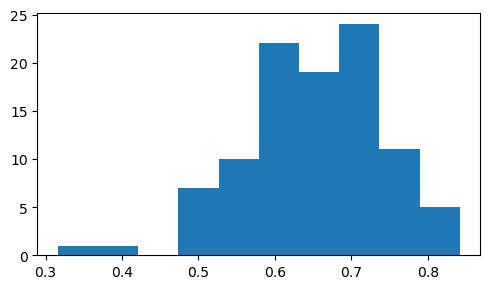

In [58]:
import os
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
import point_cloud_utils as pcu
import numpy as np
import matplotlib.pylab as plt
import scipy.sparse as sparse
import random
import statistics
from imblearn.over_sampling import SMOTE

# os.chdir('C:/Users/xl037/PycharmProjects/DAISproject/Datasets/')
cwd = os.getcwd()
# print(cwd)
test_data_path = os.path.join(cwd, 'train_data.npy')
label_data_path = os.path.join(cwd, 'train_label.npy')
all_data = np.load(test_data_path)
all_label = np.load(label_data_path)

N = 100
mean_accuracy = []
mean_precision = []
mean_recall = []
mean_F1 = []

guess_accuracy = []
guess_precision = []
guess_recall = []
guess_F1 = []

for i in range(N):
  ratio_test = 0.2
  all_index = list(range(190))
  random.shuffle(all_index)
  test_index = all_index[0:round(ratio_test*190)]
  train_index = all_index[round(ratio_test*190):]

  train_data = all_data[train_index, :, :]
  train_label = all_label[train_index]

  index_train_0 = np.where(train_label == 0)[0]
  index_train_1 = np.where(train_label == 1)[0]
  """
    feature 7, Hausdorff distance
  """
  feature_7_hausdorff_dist_all_0 = np.zeros((190, 2))
  feature_7_hausdorff_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(hausdorff_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(hausdorff_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_hausdorff_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_hausdorff_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_hausdorff_dist_all_0[train_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_hausdorff_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(hausdorff_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(hausdorff_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_hausdorff_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_hausdorff_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_hausdorff_dist_all_0[test_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_hausdorff_dist_all_1[test_index[mk], 1] = np.std(temp_1)
  """
    feature 7, Chamfer distance
  """
  feature_7_chamfer_dist_all_0 = np.zeros((190, 2))
  feature_7_chamfer_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(chamfer_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(chamfer_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_chamfer_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_chamfer_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_chamfer_dist_all_0[train_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_chamfer_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(chamfer_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(chamfer_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_chamfer_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_chamfer_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_chamfer_dist_all_0[test_index[mk], 1] = np.std(temp_0)
    feature_7_chamfer_dist_all_1[test_index[mk], 1] = np.std(temp_1)
  """
    feature 7, Wasserstein distance
  """
  feature_7_Wasserstein_dist_all_0 = np.zeros((190, 2))
  feature_7_Wasserstein_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(Wasserstein_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(Wasserstein_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_Wasserstein_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_Wasserstein_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_Wasserstein_dist_all_0[train_index[mk], 1] = np.std(temp_0)
    feature_7_Wasserstein_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(Wasserstein_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(Wasserstein_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_Wasserstein_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_Wasserstein_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_Wasserstein_dist_all_0[test_index[mk], 1] = np.std(temp_0)
    feature_7_Wasserstein_dist_all_1[test_index[mk], 1] = np.std(temp_1)

  # combine all features
  feature_all[:, 23:25] = feature_7_hausdorff_dist_all_0[:, 0:2]
  feature_all[:, 25:27] = feature_7_hausdorff_dist_all_1[:, 0:2]
  feature_all[:, 27:29] = feature_7_chamfer_dist_all_0[:, 0:2]
  feature_all[:, 29:31] = feature_7_chamfer_dist_all_1[:, 0:2]
  feature_all[:, 31:33] = feature_7_Wasserstein_dist_all_0[:, 0:2]
  feature_all[:, 33:35] = feature_7_Wasserstein_dist_all_1[:, 0:2]

  # normalize all the data
  for i in range(23, 35):
    feature_all[:, i] = preprocessing.normalize([feature_all[:, i]])
  # print(feature_all[:, 23:35])
  # print(feature_all[:, 0:2])

  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list([1, 7,  8, 11, 22, 28, 29, 32]))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list([7]))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(0, 16)) + list(range(23, 35)))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(0, 23)))[:]]
  X_train = feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  y_train = all_label[train_index]
  X_test= feature_all[np.array(test_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  y_test = all_label[test_index]

  # balancing the class classification for the training data
  sm = SMOTE(random_state=i, k_neighbors=1)  # set the seed of smote as the index of the loop
  X_train, y_train = sm.fit_resample(X_train, y_train)
  index_train_0_try = np.where(y_train == 0)[0]
  index_train_1_try = np.where(y_train == 1)[0]
  print(index_train_0_try)
  print(index_train_1_try)

  # # PCA
  # pca = PCA(n_components = 3)
  # X_train = pca.fit_transform(X_train)
  # X_test = pca.transform(X_test)

  # svclassifier = SVC(kernel='poly', degree=8)
  svclassifier = SVC(kernel='linear')
  svclassifier.fit(X_train, y_train)
  y_pred = svclassifier.predict(X_test)
  # y_pred = np.logical_not(y_pred).astype('int64')  # be careful, we flip 0 and 1 here
  # y_test = np.logical_not(y_test).astype('int64')  # be careful, we flip 0 and 1 here
  # print(classification_report(y_test,y_pred))
  mean_accuracy.append(accuracy_score(y_test, y_pred))
  mean_precision.append(precision_score(y_test, y_pred))
  mean_recall.append(recall_score(y_test, y_pred))
  mean_F1.append(f1_score(y_test, y_pred))
  # print('accuracy:', accuracy_score(y_test, y_pred))
  print(confusion_matrix(y_test, y_pred))

  # print(y_pred)
  # print(y_test)
  print('ACC:', accuracy_score(y_test, y_pred))
  print('If we always guess 0, ACC:', len(np.where(y_test == 0)[0])/len(y_test))

print('The average accuracy is:', sum(mean_accuracy)/N)
print('The standard deviation of accuracy:', np.std(mean_accuracy))
print('The median of the accuracy:', statistics.median(mean_accuracy))

print('The average precision is:', sum(mean_precision)/N)
print('The standard deviation of precision:', np.std(mean_precision))
print('The median of the precision:', statistics.median(mean_precision))

print('The average recall is:', sum(mean_recall)/N)
print('The standard deviation of recall:', np.std(mean_recall))
print('The median of the recall:', statistics.median(mean_recall))

print('The average F1 is:', sum(mean_F1)/N)
print('The standard deviation of F1:', np.std(mean_F1))
print('The median of the F1:', statistics.median(mean_F1))

# Creating histogram
fig, ax = plt.subplots(figsize =(5, 3))
ax.hist(mean_accuracy)
# Show plot
plt.show()

# **Balancing, Training, and Classification Prediction (LightGBM):**

In [61]:
!pip install lightgbm

     ---------------------------------------- 1.0/1.0 MB 8.1 MB/s eta 0:00:00



[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


[  1   3   4   5   8  12  14  15  19  20  21  22  24  26  29  30  31  33
  34  35  36  38  39  40  41  43  44  45  46  48  49  50  51  53  55  56
  57  58  59  60  61  62  63  66  69  70  72  73  74  75  77  78  79  80
  82  83  84  85  87  93  94  96  97  98 100 101 102 104 105 106 107 110
 113 114 115 116 117 118 119 120 122 124 125 126 128 129 130 133 135 136
 138 141 142 144 145 146 148 150 151]
[  0   2   6   7   9  10  11  13  16  17  18  23  25  27  28  32  37  42
  47  52  54  64  65  67  68  71  76  81  86  88  89  90  91  92  95  99
 103 108 109 111 112 121 123 127 131 132 134 137 139 140 143 147 149 152
 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170
 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188
 189 190 191 192 193 194 195 196 197]
[[26  3]
 [ 5  4]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.7631578947368421
[  0   1   2   3   4   6   7   8   9  10  12  13  14  15  16  18  20  21
  22  23  24  25  26  29  30  34

[  0   3   4   5   6   7   8  10  11  13  15  17  20  21  22  23  25  26
  27  30  31  33  35  37  38  39  41  42  43  44  46  47  48  49  50  54
  55  57  60  62  65  66  67  69  71  72  73  74  76  78  80  81  82  83
  84  86  87  88  90  92  93  94  95  96  97  99 100 102 104 106 107 108
 110 112 114 115 118 119 120 121 123 125 127 128 129 130 131 132 133 137
 138 140 141 142 144 145 146 147 150]
[  1   2   9  12  14  16  18  19  24  28  29  32  34  36  40  45  51  52
  53  56  58  59  61  63  64  68  70  75  77  79  85  89  91  98 101 103
 105 109 111 113 116 117 122 124 126 134 135 136 139 143 148 149 151 152
 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170
 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188
 189 190 191 192 193 194 195 196 197]
[[26  3]
 [ 5  4]]
ACC: 0.7894736842105263
If we always guess 0, ACC: 0.7631578947368421
[  0   1   4   5   6   8   9  10  13  16  17  18  19  21  22  23  24  25
  27  28  29  30  31  32  33  34

[  1   2   3   4   6   7   8   9  11  12  13  14  15  17  19  20  21  24
  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43
  44  45  46  47  48  49  51  52  55  56  57  58  59  61  64  67  68  70
  71  72  76  77  78  80  82  83  84  85  86  87  88  89  90  91  92  94
  96 100 101 103 105 107 108 109 110 112 113 114 115 116 117 119 120 122
 126 127 129 130 131 132 135 138 139 143 145 146 147 149 150 151]
[  0   5  10  16  18  22  23  25  50  53  54  60  62  63  65  66  69  73
  74  75  79  81  93  95  97  98  99 102 104 106 111 118 121 123 124 125
 128 133 134 136 137 140 141 142 144 148 152 153 154 155 156 157 158 159
 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177
 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195
 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211]
[[20  2]
 [ 8  8]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.5789473684210527
[  3   7   8   9  11  14  15  18  20  21  22  23 

[  0   1   2   5  10  12  13  14  15  17  21  22  24  25  28  29  30  32
  33  34  35  37  38  39  40  44  45  46  47  48  49  50  51  52  53  55
  56  57  58  59  60  62  63  64  65  66  67  68  69  70  71  72  73  75
  77  78  79  82  83  84  86  87  88  89  90  92  93  94  95  99 101 104
 106 107 108 110 111 112 113 119 120 123 124 125 126 127 128 129 130 133
 135 136 137 138 139 140 142 143 145 147 148 149 151]
[  3   4   6   7   8   9  11  16  18  19  20  23  26  27  31  36  41  42
  43  54  61  74  76  80  81  85  91  96  97  98 100 102 103 105 109 114
 115 116 117 118 121 122 131 132 134 141 144 146 150 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205]
[[17  8]
 [ 8  5]]
ACC: 0.5789473684210527
If we always guess 0, ACC: 0.6578947368421053
[  1   2   3   5   6   7   8   9  11  14  15  16  17  18  22  23  26  27


[  0   3   4   5   7   9  10  11  13  14  15  16  18  19  21  22  24  26
  28  30  33  34  35  36  38  39  40  41  42  45  46  47  48  49  50  51
  52  53  55  56  57  59  60  62  64  67  68  69  70  72  73  75  76  79
  80  81  82  83  84  85  86  88  89  92  93  94  95  96  99 100 101 102
 103 104 105 107 108 109 112 113 114 117 118 121 122 124 125 127 128 130
 131 133 134 138 139 140 141 143 144 145 149 150 151]
[  1   2   6   8  12  17  20  23  25  27  29  31  32  37  43  44  54  58
  61  63  65  66  71  74  77  78  87  90  91  97  98 106 110 111 115 116
 119 120 123 126 129 132 135 136 137 142 146 147 148 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205]
[[23  2]
 [ 9  4]]
ACC: 0.7105263157894737
If we always guess 0, ACC: 0.6578947368421053
[  1   2   3   5   6   7   8   9  10  11  12  14  15  17  19  20  21  22


[  0   3   4   5   6   7   8   9  10  11  12  15  16  17  18  19  23  24
  25  26  28  29  32  33  34  35  36  37  42  43  44  45  46  49  50  51
  52  54  56  57  59  62  63  64  65  66  67  68  69  70  73  74  75  78
  79  80  81  82  83  84  85  86  88  89  90  93  94  96  97  98  99 100
 101 102 106 107 108 109 110 111 112 113 115 116 117 119 121 122 126 127
 129 130 132 134 137 138 143 145 146 147 149 150 151]
[  1   2  13  14  20  21  22  27  30  31  38  39  40  41  47  48  53  55
  58  60  61  71  72  76  77  87  91  92  95 103 104 105 114 118 120 123
 124 125 128 131 133 135 136 139 140 141 142 144 148 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205]
[[24  1]
 [ 5  8]]
ACC: 0.8421052631578947
If we always guess 0, ACC: 0.6578947368421053
[  0   1   3   4   5   6   8  10  11  12  14  15  16  17  18  19  20  21


[  1   2   3   4   5   6   7   8   9  10  11  12  13  18  19  20  21  24
  25  26  27  28  29  30  31  32  33  34  37  40  41  42  44  45  46  47
  51  52  54  55  57  58  59  61  62  63  64  66  67  68  72  73  74  75
  76  78  79  80  82  83  84  85  88  90  91  92  94  98 100 101 103 104
 105 107 109 111 112 113 114 116 117 118 120 121 122 123 124 128 129 130
 132 133 134 136 138 140 141 142 143 144 146 150 151]
[  0  14  15  16  17  22  23  35  36  38  39  43  48  49  50  53  56  60
  65  69  70  71  77  81  86  87  89  93  95  96  97  99 102 106 108 110
 115 119 125 126 127 131 135 137 139 145 147 148 149 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205]
[[22  3]
 [ 7  6]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.6578947368421053
[  0   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18


[  1   2   4   5   6   7   9  11  12  14  15  16  17  18  19  20  21  23
  24  25  26  29  32  33  34  35  36  37  38  40  41  42  43  44  45  47
  48  49  51  52  54  55  57  58  59  60  62  64  65  66  67  72  74  75
  76  79  80  82  84  86  87  89  90  91  92  93  94  95  97  98  99 100
 101 102 104 105 106 109 111 112 113 114 115 116 117 118 119 120 122 123
 125 128 129 132 134 135 136 141 143 144 145 147 148 149 151]
[  0   3   8  10  13  22  27  28  30  31  39  46  50  53  56  61  63  68
  69  70  71  73  77  78  81  83  85  88  96 103 107 108 110 121 124 126
 127 130 131 133 137 138 139 140 142 146 150 152 153 154 155 156 157 158
 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176
 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194
 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209]
[[16  7]
 [ 5 10]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.6052631578947368
[  1   3   4   5   9  10  12  13  14  15  16  17  18  21 

[  0   2   3   5   7   8   9  10  11  12  13  14  16  17  18  19  20  21
  23  25  26  27  28  30  31  32  33  34  35  36  37  38  39  40  41  43
  45  46  49  51  54  55  56  58  60  61  62  64  65  66  68  69  70  71
  72  75  78  79  80  81  82  83  84  85  88  89  91  92  93  94  95  96
  97  99 100 101 102 103 104 105 106 107 110 111 115 117 119 120 121 124
 125 127 131 132 133 135 138 139 140 141 142 144 151]
[  1   4   6  15  22  24  29  42  44  47  48  50  52  53  57  59  63  67
  73  74  76  77  86  87  90  98 108 109 112 113 114 116 118 122 123 126
 128 129 130 134 136 137 143 145 146 147 148 149 150 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205]
[[23  2]
 [ 4  9]]
ACC: 0.8421052631578947
If we always guess 0, ACC: 0.6578947368421053
[  0   1   2   3   4   5   6   8  11  12  13  14  15  16  17  18  19  20


[  0   1   3   4   6   9  10  12  13  14  15  17  18  19  21  22  25  26
  27  28  29  30  31  32  33  35  38  39  40  41  42  44  45  46  47  48
  50  51  52  53  54  56  57  58  59  63  65  66  67  69  70  72  73  75
  78  80  83  84  85  87  88  89  90  93  95  97  99 100 102 104 105 106
 107 108 109 111 113 115 116 117 118 119 121 123 124 125 127 129 130 131
 132 133 134 135 136 138 142 143 144 145 146 147 148 149 150]
[  2   5   7   8  11  16  20  23  24  34  36  37  43  49  55  60  61  62
  64  68  71  74  76  77  79  81  82  86  91  92  94  96  98 101 103 110
 112 114 120 122 126 128 137 139 140 141 151 152 153 154 155 156 157 158
 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176
 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194
 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209]
[[17  6]
 [ 4 11]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.6052631578947368
[  0   1   2   3   4   5   6   7   8  10  11  12  14  15 

[  0   1   2   3   4   7   8   9  10  11  12  13  14  16  18  20  21  22
  24  25  26  28  29  31  33  37  39  40  41  43  46  47  50  51  54  55
  56  58  59  61  62  63  64  66  67  68  69  70  71  72  74  76  77  78
  79  80  81  82  83  84  85  87  91  92  93  95  96  97  98  99 101 102
 103 104 105 108 109 110 111 112 113 115 117 118 121 123 125 126 127 128
 129 130 131 133 134 135 136 137 139 141 142 143 144 150]
[  5   6  15  17  19  23  27  30  32  34  35  36  38  42  44  45  48  49
  52  53  57  60  65  73  75  86  88  89  90  94 100 106 107 114 116 119
 120 122 124 132 138 140 145 146 147 148 149 151 152 153 154 155 156 157
 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175
 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193
 194 195 196 197 198 199 200 201 202 203 204 205 206 207]
[[20  4]
 [ 6  8]]
ACC: 0.7368421052631579
If we always guess 0, ACC: 0.631578947368421
[  0   1   2   3   4   5   7  11  12  13  14  15  16  17  18  20  

[  4   5   6   7   9  10  11  13  14  15  16  17  19  20  21  22  23  25
  26  28  29  33  34  35  36  37  39  40  41  42  45  46  47  50  51  52
  53  55  56  57  58  59  61  62  63  64  66  70  71  72  75  76  78  79
  80  81  82  83  87  88  89  90  92  93  94  96  97  98  99 100 103 105
 106 107 108 109 113 114 115 116 119 120 121 122 123 124 125 128 130 131
 132 134 136 137 138 139 141 144 145 146 147 150 151]
[  0   1   2   3   8  12  18  24  27  30  31  32  38  43  44  48  49  54
  60  65  67  68  69  73  74  77  84  85  86  91  95 101 102 104 110 111
 112 117 118 126 127 129 133 135 140 142 143 148 149 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205]
[[21  4]
 [ 8  5]]
ACC: 0.6842105263157895
If we always guess 0, ACC: 0.6578947368421053
The average accuracy is: 0.7323684210526319
The standard deviation of acc

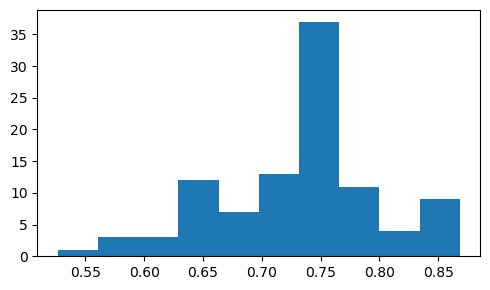

In [62]:
# build the lightgbm model
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA

# os.chdir('C:/Users/xl037/PycharmProjects/DAISproject/Datasets/')
cwd = os.getcwd()
# print(cwd)
test_data_path = os.path.join(cwd, 'train_data.npy')
label_data_path = os.path.join(cwd, 'train_label.npy')
all_data = np.load(test_data_path)
all_label = np.load(label_data_path)

N = 100
mean_accuracy = []
mean_precision = []
mean_recall = []
mean_F1 = []

guess_accuracy = []
guess_precision = []
guess_recall = []
guess_F1 = []

for i in range(N):
  ratio_test = 0.2
  all_index = list(range(190))
  random.shuffle(all_index)
  test_index = all_index[0:round(ratio_test*190)]
  train_index = all_index[round(ratio_test*190):]

  train_data = all_data[train_index, :, :]
  train_label = all_label[train_index]

  index_train_0 = np.where(train_label == 0)[0]
  index_train_1 = np.where(train_label == 1)[0]
  """
    feature 7, Hausdorff distance
  """
  feature_7_hausdorff_dist_all_0 = np.zeros((190, 2))
  feature_7_hausdorff_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(hausdorff_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(hausdorff_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_hausdorff_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_hausdorff_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_hausdorff_dist_all_0[train_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_hausdorff_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(hausdorff_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(hausdorff_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_hausdorff_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_hausdorff_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_hausdorff_dist_all_0[test_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_hausdorff_dist_all_1[test_index[mk], 1] = np.std(temp_1)
  """
    feature 7, Chamfer distance
  """
  feature_7_chamfer_dist_all_0 = np.zeros((190, 2))
  feature_7_chamfer_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(chamfer_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(chamfer_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_chamfer_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_chamfer_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_chamfer_dist_all_0[train_index[mk], 1] = np.std(temp_0) - np.std(temp_1)
    feature_7_chamfer_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(chamfer_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(chamfer_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_chamfer_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_chamfer_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_chamfer_dist_all_0[test_index[mk], 1] = np.std(temp_0)
    feature_7_chamfer_dist_all_1[test_index[mk], 1] = np.std(temp_1)
  """
    feature 7, Wasserstein distance
  """
  feature_7_Wasserstein_dist_all_0 = np.zeros((190, 2))
  feature_7_Wasserstein_dist_all_1 = np.zeros((190, 2))
  # train
  for mk in range(190-round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk == mk:
        continue
      else:
        if jk in index_train_0:
          temp_0.append(Wasserstein_dist_matrix[train_index[mk], train_index[jk]])
        elif jk in index_train_1:
          temp_1.append(Wasserstein_dist_matrix[train_index[mk], train_index[jk]])
    feature_7_Wasserstein_dist_all_0[train_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_Wasserstein_dist_all_1[train_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_Wasserstein_dist_all_0[train_index[mk], 1] = np.std(temp_0)
    feature_7_Wasserstein_dist_all_1[train_index[mk], 1] = np.std(temp_1)
  # test
  for mk in range(round(ratio_test*190)):
    temp_0 = []
    temp_1 = []
    for jk in range(190-round(ratio_test*190)):
      if jk in index_train_0:
        temp_0.append(Wasserstein_dist_matrix[test_index[mk], train_index[jk]])
      elif jk in index_train_1:
        temp_1.append(Wasserstein_dist_matrix[test_index[mk], train_index[jk]])
    feature_7_Wasserstein_dist_all_0[test_index[mk], 0] = sum(temp_0)/(np.shape(temp_0)[0])
    feature_7_Wasserstein_dist_all_1[test_index[mk], 0] = sum(temp_1)/(np.shape(temp_1)[0])
    feature_7_Wasserstein_dist_all_0[test_index[mk], 1] = np.std(temp_0)
    feature_7_Wasserstein_dist_all_1[test_index[mk], 1] = np.std(temp_1)

  # combine all features
  feature_all[:, 23:25] = feature_7_hausdorff_dist_all_0[:, 0:2]
  feature_all[:, 25:27] = feature_7_hausdorff_dist_all_1[:, 0:2]
  feature_all[:, 27:29] = feature_7_chamfer_dist_all_0[:, 0:2]
  feature_all[:, 29:31] = feature_7_chamfer_dist_all_1[:, 0:2]
  feature_all[:, 31:33] = feature_7_Wasserstein_dist_all_0[:, 0:2]
  feature_all[:, 33:35] = feature_7_Wasserstein_dist_all_1[:, 0:2]

  # normalize all the data
  for i in range(23, 35):
    feature_all[:, i] = preprocessing.normalize([feature_all[:, i]])
  # print(feature_all[:, 23:35])
  # print(feature_all[:, 0:2])

  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list([1, 7,  8, 11, 22, 28, 29, 32]))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list([7]))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(0, 16)) + list(range(23, 35)))[:]]
  # feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(0, 23)))[:]]
  X_train = feature_all[np.array(train_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  y_train = all_label[train_index]
  X_test= feature_all[np.array(test_index)[:,np.newaxis], np.array(list(range(35)))[:]]
  y_test = all_label[test_index]

  # balancing the class classification for the training data
  sm = SMOTE(random_state=i, k_neighbors=1)  # set the seed of smote as the index of the loop
  X_train, y_train = sm.fit_resample(X_train, y_train)
  index_train_0_try = np.where(y_train == 0)[0]
  index_train_1_try = np.where(y_train == 1)[0]
  print(index_train_0_try)
  print(index_train_1_try)

  clf = lgb.LGBMClassifier()
  clf.fit(X_train, y_train)

  # predict the results
  y_pred=clf.predict(X_test)
  # print(classification_report(y_test,y_pred))
  mean_accuracy.append(accuracy_score(y_test, y_pred))
  mean_precision.append(precision_score(y_test, y_pred))
  mean_recall.append(recall_score(y_test, y_pred))
  mean_F1.append(f1_score(y_test, y_pred))
  # print('accuracy:', accuracy_score(y_test, y_pred))
  print(confusion_matrix(y_test, y_pred))

  # print(y_pred)
  # print(y_test)
  print('ACC:', accuracy_score(y_test, y_pred))
  print('If we always guess 0, ACC:', len(np.where(y_test == 0)[0])/len(y_test))

print('The average accuracy is:', sum(mean_accuracy)/N)
print('The standard deviation of accuracy:', np.std(mean_accuracy))
print('The median of the accuracy:', statistics.median(mean_accuracy))

print('The average precision is:', sum(mean_precision)/N)
print('The standard deviation of precision:', np.std(mean_precision))
print('The median of the precision:', statistics.median(mean_precision))

print('The average recall is:', sum(mean_recall)/N)
print('The standard deviation of recall:', np.std(mean_recall))
print('The median of the recall:', statistics.median(mean_recall))

print('The average F1 is:', sum(mean_F1)/N)
print('The standard deviation of F1:', np.std(mean_F1))
print('The median of the F1:', statistics.median(mean_F1))

# Creating histogram
fig, ax = plt.subplots(figsize =(5, 3))
ax.hist(mean_accuracy)
# Show plot
plt.show()

# **Balancing, Training, and Classification Prediction (PointNet Model): (Install Pytorch)**

Here are the codes to train the PointNet model.

Remember to redirect all directories, in the following codes and the 'data.py' file.

C:\Users\xl037\PycharmProjects\DAIS2023CompetitionSubmission_Liu\BaselineModel_PointNet
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (permute): Permute()
          )
          (ReLU_0): ReLU(inplace=True)
          (Linear_1): Linear(in_features=64, out_features=128, bias=True)
          (Batchnorm_1): BatchNorm(
            (batchnorm): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (permute): Permute()
          )
          (ReLU_1): ReLU(inplace=True)
          (Linear_2): Linear(in_features=128, out_features=1024, bias=True)
          (Batchnorm_2): BatchNorm(
            (batchnorm): BatchNorm1d

100%|███████████████| 3/3 [00:04<00:00,  1.35s/it]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 0, train loss 0.8006 (acc 0.426471), valid loss 0.7066 (acc 0.375000), time 4.1 sec


100%|███████████████| 3/3 [00:00<00:00,  5.67it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7927 (acc 0.448529), valid loss 0.6616 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7330 (acc 0.610294), valid loss 0.7152 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.6944 (acc 0.647059), valid loss 0.7916 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.67it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7173 (acc 0.654412), valid loss 0.7695 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.7104 (acc 0.639706), valid loss 0.7701 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.67it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6723 (acc 0.661765), valid loss 0.8334 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.67it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6719 (acc 0.654412), valid loss 0.7932 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6586 (acc 0.654412), valid loss 0.6881 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.7031 (acc 0.610294), valid loss 0.6442 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6438 (acc 0.669118), valid loss 0.6853 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.7069 (acc 0.566176), valid loss 0.6747 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6795 (acc 0.639706), valid loss 0.6968 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6673 (acc 0.625000), valid loss 0.6401 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6854 (acc 0.573529), valid loss 0.6937 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.67it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6635 (acc 0.610294), valid loss 0.7028 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.67it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6624 (acc 0.617647), valid loss 0.6712 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6889 (acc 0.625000), valid loss 0.6425 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6669 (acc 0.617647), valid loss 0.6832 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6903 (acc 0.617647), valid loss 0.6337 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6838 (acc 0.632353), valid loss 0.6972 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.7035 (acc 0.639706), valid loss 0.6877 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6875 (acc 0.654412), valid loss 0.6971 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6536 (acc 0.669118), valid loss 0.6360 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6450 (acc 0.647059), valid loss 0.6315 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6679 (acc 0.625000), valid loss 0.6932 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6703 (acc 0.661765), valid loss 0.6350 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6619 (acc 0.654412), valid loss 0.5867 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6863 (acc 0.669118), valid loss 0.7145 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6661 (acc 0.617647), valid loss 0.7036 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6631 (acc 0.632353), valid loss 0.6749 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6586 (acc 0.654412), valid loss 0.6312 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6465 (acc 0.647059), valid loss 0.6587 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6690 (acc 0.625000), valid loss 0.6607 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6687 (acc 0.647059), valid loss 0.6803 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6804 (acc 0.647059), valid loss 0.6197 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6692 (acc 0.632353), valid loss 0.6805 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6689 (acc 0.625000), valid loss 0.6615 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.67it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6493 (acc 0.639706), valid loss 0.6612 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6617 (acc 0.647059), valid loss 0.6442 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6682 (acc 0.647059), valid loss 0.6988 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6975 (acc 0.625000), valid loss 0.6588 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6529 (acc 0.632353), valid loss 0.6271 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6609 (acc 0.632353), valid loss 0.6603 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6670 (acc 0.639706), valid loss 0.6307 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6411 (acc 0.647059), valid loss 0.6766 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6615 (acc 0.647059), valid loss 0.6594 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6628 (acc 0.647059), valid loss 0.6866 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6738 (acc 0.661765), valid loss 0.6828 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6587 (acc 0.669118), valid loss 0.6628 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6765 (acc 0.639706), valid loss 0.7448 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6642 (acc 0.632353), valid loss 0.6889 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6633 (acc 0.661765), valid loss 0.6738 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6868 (acc 0.661765), valid loss 0.6493 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6460 (acc 0.647059), valid loss 0.6627 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6593 (acc 0.647059), valid loss 0.6495 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6502 (acc 0.654412), valid loss 0.6896 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6520 (acc 0.654412), valid loss 0.6646 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6407 (acc 0.647059), valid loss 0.6506 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.94it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6827 (acc 0.647059), valid loss 0.6637 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.88it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6441 (acc 0.639706), valid loss 0.6603 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.89it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6844 (acc 0.647059), valid loss 0.6484 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.87it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6539 (acc 0.654412), valid loss 0.6962 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.88it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6382 (acc 0.647059), valid loss 0.6686 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.90it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6648 (acc 0.639706), valid loss 0.6337 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.89it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6502 (acc 0.647059), valid loss 0.6566 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.89it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6471 (acc 0.647059), valid loss 0.6557 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.87it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6837 (acc 0.654412), valid loss 0.6488 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.88it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6521 (acc 0.654412), valid loss 0.6729 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.90it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6509 (acc 0.647059), valid loss 0.6732 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.89it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6566 (acc 0.654412), valid loss 0.6784 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.86it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6614 (acc 0.639706), valid loss 0.6551 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.91it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6486 (acc 0.654412), valid loss 0.6441 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.84it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6609 (acc 0.647059), valid loss 0.6531 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.85it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6547 (acc 0.661765), valid loss 0.6558 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.88it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6841 (acc 0.654412), valid loss 0.6573 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.86it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6467 (acc 0.639706), valid loss 0.6779 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.89it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6867 (acc 0.617647), valid loss 0.6620 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  4.89it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 0, train loss 0.8024 (acc 0.500000), valid loss 0.6938 (acc 0.437500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  4.78it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.6830 (acc 0.602941), valid loss 0.7122 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.81it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.7116 (acc 0.595588), valid loss 0.8048 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.81it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 3, train loss 0.7235 (acc 0.661765), valid loss 0.7914 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.79it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.6325 (acc 0.661765), valid loss 0.7414 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.69it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.6733 (acc 0.661765), valid loss 0.7034 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.69it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.6678 (acc 0.661765), valid loss 0.6852 (acc 0.562500), time 0.7 sec


100%|███████████████| 3/3 [00:00<00:00,  4.75it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.7071 (acc 0.639706), valid loss 0.6855 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.70it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.7437 (acc 0.647059), valid loss 0.6882 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.78it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6522 (acc 0.647059), valid loss 0.6848 (acc 0.562500), time 0.7 sec


100%|███████████████| 3/3 [00:00<00:00,  4.80it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6608 (acc 0.661765), valid loss 0.6952 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.77it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6555 (acc 0.632353), valid loss 0.6653 (acc 0.562500), time 0.7 sec


100%|███████████████| 3/3 [00:00<00:00,  4.83it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.6311 (acc 0.683824), valid loss 0.7535 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.80it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6744 (acc 0.639706), valid loss 0.6583 (acc 0.562500), time 0.7 sec


100%|███████████████| 3/3 [00:00<00:00,  4.82it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6448 (acc 0.661765), valid loss 0.7337 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.76it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6487 (acc 0.698529), valid loss 0.6879 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.80it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6194 (acc 0.632353), valid loss 0.6637 (acc 0.625000), time 0.7 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.78it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6333 (acc 0.647059), valid loss 0.6723 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.79it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6717 (acc 0.610294), valid loss 0.7348 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.82it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6606 (acc 0.661765), valid loss 0.7768 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.80it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.7140 (acc 0.566176), valid loss 0.7906 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.78it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 21, train loss 0.6818 (acc 0.647059), valid loss 0.7454 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.82it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6495 (acc 0.661765), valid loss 0.7903 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.81it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 23, train loss 0.6791 (acc 0.617647), valid loss 0.7184 (acc 0.500000), time 0.7 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.91it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6545 (acc 0.661765), valid loss 0.7051 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.89it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6469 (acc 0.669118), valid loss 0.7011 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6854 (acc 0.654412), valid loss 0.7005 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 27, train loss 0.6395 (acc 0.625000), valid loss 0.7466 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6637 (acc 0.610294), valid loss 0.6761 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6483 (acc 0.661765), valid loss 0.7245 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6509 (acc 0.647059), valid loss 0.7135 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 31, train loss 0.6361 (acc 0.647059), valid loss 0.6676 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6635 (acc 0.639706), valid loss 0.7098 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6671 (acc 0.647059), valid loss 0.7190 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6747 (acc 0.669118), valid loss 0.7180 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 35, train loss 0.6497 (acc 0.625000), valid loss 0.7564 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6488 (acc 0.661765), valid loss 0.6985 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6533 (acc 0.647059), valid loss 0.6710 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6405 (acc 0.647059), valid loss 0.6645 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6406 (acc 0.669118), valid loss 0.6826 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6522 (acc 0.661765), valid loss 0.6817 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 6.0
epoch 41, train loss 0.6458 (acc 0.639706), valid loss 0.7414 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 42, train loss 0.6462 (acc 0.654412), valid loss 0.7671 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6550 (acc 0.647059), valid loss 0.7154 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6388 (acc 0.669118), valid loss 0.6648 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6505 (acc 0.654412), valid loss 0.7399 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6414 (acc 0.661765), valid loss 0.7279 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6743 (acc 0.654412), valid loss 0.6500 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6609 (acc 0.647059), valid loss 0.6855 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6618 (acc 0.632353), valid loss 0.7621 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6615 (acc 0.639706), valid loss 0.6983 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 51, train loss 0.6645 (acc 0.676471), valid loss 0.7006 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6539 (acc 0.639706), valid loss 0.7097 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6514 (acc 0.632353), valid loss 0.6273 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6276 (acc 0.676471), valid loss 0.6555 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6471 (acc 0.654412), valid loss 0.7008 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 56, train loss 0.6608 (acc 0.639706), valid loss 0.7151 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 57, train loss 0.6297 (acc 0.669118), valid loss 0.7334 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6549 (acc 0.676471), valid loss 0.7010 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 59, train loss 0.6702 (acc 0.654412), valid loss 0.7464 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6348 (acc 0.661765), valid loss 0.6926 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 61, train loss 0.6524 (acc 0.676471), valid loss 0.7356 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6778 (acc 0.639706), valid loss 0.7106 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6809 (acc 0.661765), valid loss 0.6884 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6296 (acc 0.669118), valid loss 0.7120 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6500 (acc 0.647059), valid loss 0.6128 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6607 (acc 0.639706), valid loss 0.7003 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6245 (acc 0.661765), valid loss 0.6884 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6831 (acc 0.632353), valid loss 0.6825 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6569 (acc 0.647059), valid loss 0.6967 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6477 (acc 0.647059), valid loss 0.7205 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6440 (acc 0.654412), valid loss 0.7304 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6509 (acc 0.654412), valid loss 0.7181 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.6464 (acc 0.676471), valid loss 0.6834 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 74, train loss 0.6618 (acc 0.639706), valid loss 0.6966 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6572 (acc 0.632353), valid loss 0.6891 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 76, train loss 0.6477 (acc 0.647059), valid loss 0.6811 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 77, train loss 0.6476 (acc 0.654412), valid loss 0.6775 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 78, train loss 0.6602 (acc 0.654412), valid loss 0.7012 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 79, train loss 0.6734 (acc 0.647059), valid loss 0.7182 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 80, train loss 0.6317 (acc 0.669118), valid loss 0.6842 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 81, train loss 0.6558 (acc 0.647059), valid loss 0.6900 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 82, train loss 0.6767 (acc 0.632353), valid loss 0.7157 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 83, train loss 0.6307 (acc 0.676471), valid loss 0.6718 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6465 (acc 0.647059), valid loss 0.7043 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 85, train loss 0.6532 (acc 0.639706), valid loss 0.6842 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 86, train loss 0.6826 (acc 0.654412), valid loss 0.6923 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6481 (acc 0.661765), valid loss 0.6837 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 88, train loss 0.6991 (acc 0.625000), valid loss 0.7056 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 89, train loss 0.6408 (acc 0.654412), valid loss 0.7091 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 90, train loss 0.6336 (acc 0.647059), valid loss 0.7117 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 91, train loss 0.6384 (acc 0.654412), valid loss 0.7120 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 92, train loss 0.6486 (acc 0.661765), valid loss 0.6830 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 93, train loss 0.6400 (acc 0.654412), valid loss 0.7035 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 94, train loss 0.6766 (acc 0.654412), valid loss 0.6944 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 95, train loss 0.6591 (acc 0.632353), valid loss 0.6951 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 96, train loss 0.6570 (acc 0.647059), valid loss 0.7074 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 97, train loss 0.6614 (acc 0.654412), valid loss 0.6995 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 98, train loss 0.6606 (acc 0.647059), valid loss 0.6973 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 99, train loss 0.6446 (acc 0.661765), valid loss 0.7282 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 100, train loss 0.6300 (acc 0.669118), valid loss 0.6781 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 101, train loss 0.6489 (acc 0.632353), valid loss 0.7501 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 102, train loss 0.6498 (acc 0.654412), valid loss 0.7138 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 103, train loss 0.6482 (acc 0.654412), valid loss 0.6847 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 104, train loss 0.6341 (acc 0.661765), valid loss 0.6942 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 105, train loss 0.6462 (acc 0.661765), valid loss 0.6738 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 106, train loss 0.6532 (acc 0.654412), valid loss 0.7241 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 107, train loss 0.6639 (acc 0.661765), valid loss 0.6967 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 108, train loss 0.6549 (acc 0.654412), valid loss 0.6924 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 109, train loss 0.6768 (acc 0.654412), valid loss 0.6854 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 110, train loss 0.6487 (acc 0.654412), valid loss 0.7070 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 111, train loss 0.6791 (acc 0.669118), valid loss 0.7083 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 112, train loss 0.6426 (acc 0.654412), valid loss 0.7082 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 113, train loss 0.6446 (acc 0.661765), valid loss 0.7035 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 114, train loss 0.6642 (acc 0.639706), valid loss 0.7216 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 115, train loss 0.6422 (acc 0.661765), valid loss 0.7207 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 0, train loss 0.7871 (acc 0.463235), valid loss 0.6830 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 1, train loss 0.8089 (acc 0.485294), valid loss 0.7286 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.7294 (acc 0.602941), valid loss 0.6233 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.7136 (acc 0.573529), valid loss 0.6543 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.6829 (acc 0.588235), valid loss 0.6406 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.6723 (acc 0.625000), valid loss 0.6435 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.6940 (acc 0.595588), valid loss 0.6449 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.7006 (acc 0.625000), valid loss 0.6816 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.7144 (acc 0.536765), valid loss 0.6401 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6941 (acc 0.610294), valid loss 0.6445 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6641 (acc 0.617647), valid loss 0.6519 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6440 (acc 0.647059), valid loss 0.6949 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6575 (acc 0.647059), valid loss 0.6423 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6602 (acc 0.625000), valid loss 0.6433 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.7086 (acc 0.617647), valid loss 0.7045 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6533 (acc 0.610294), valid loss 0.6463 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.7018 (acc 0.595588), valid loss 0.6146 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6755 (acc 0.639706), valid loss 0.6535 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6911 (acc 0.595588), valid loss 0.6770 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6889 (acc 0.580882), valid loss 0.6279 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.7111 (acc 0.617647), valid loss 0.6737 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 21, train loss 0.6835 (acc 0.610294), valid loss 0.5750 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6884 (acc 0.595588), valid loss 0.6330 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6861 (acc 0.588235), valid loss 0.6206 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6652 (acc 0.617647), valid loss 0.5960 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6554 (acc 0.639706), valid loss 0.6571 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6806 (acc 0.602941), valid loss 0.5930 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6899 (acc 0.639706), valid loss 0.6617 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6620 (acc 0.625000), valid loss 0.6310 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6760 (acc 0.639706), valid loss 0.5966 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6645 (acc 0.632353), valid loss 0.5965 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.7085 (acc 0.617647), valid loss 0.5925 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6726 (acc 0.632353), valid loss 0.6218 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6573 (acc 0.610294), valid loss 0.6525 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6566 (acc 0.632353), valid loss 0.5619 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6780 (acc 0.602941), valid loss 0.6039 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6719 (acc 0.610294), valid loss 0.6290 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6873 (acc 0.647059), valid loss 0.6679 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6503 (acc 0.632353), valid loss 0.6883 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6783 (acc 0.610294), valid loss 0.6733 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6812 (acc 0.632353), valid loss 0.6199 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 41, train loss 0.6450 (acc 0.676471), valid loss 0.6820 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.7122 (acc 0.536765), valid loss 0.6022 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6694 (acc 0.669118), valid loss 0.5710 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6514 (acc 0.625000), valid loss 0.6232 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 45, train loss 0.7011 (acc 0.617647), valid loss 0.5897 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6791 (acc 0.610294), valid loss 0.5856 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6359 (acc 0.661765), valid loss 0.6859 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6389 (acc 0.639706), valid loss 0.6056 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6375 (acc 0.654412), valid loss 0.6126 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6497 (acc 0.654412), valid loss 0.6736 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6691 (acc 0.610294), valid loss 0.6405 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6718 (acc 0.625000), valid loss 0.6025 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6716 (acc 0.610294), valid loss 0.6370 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6450 (acc 0.654412), valid loss 0.6158 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6693 (acc 0.639706), valid loss 0.6357 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6493 (acc 0.647059), valid loss 0.6284 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6856 (acc 0.647059), valid loss 0.6122 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6397 (acc 0.625000), valid loss 0.6194 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6687 (acc 0.647059), valid loss 0.6051 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6583 (acc 0.654412), valid loss 0.6051 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6891 (acc 0.625000), valid loss 0.6022 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6613 (acc 0.661765), valid loss 0.6214 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6516 (acc 0.639706), valid loss 0.6325 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6522 (acc 0.647059), valid loss 0.6032 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6698 (acc 0.625000), valid loss 0.6175 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6627 (acc 0.639706), valid loss 0.6205 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6472 (acc 0.632353), valid loss 0.6155 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6656 (acc 0.617647), valid loss 0.6505 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6621 (acc 0.639706), valid loss 0.6165 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 70, train loss 0.6578 (acc 0.632353), valid loss 0.7205 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6594 (acc 0.625000), valid loss 0.6514 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6305 (acc 0.661765), valid loss 0.6187 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6476 (acc 0.647059), valid loss 0.6372 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 74, train loss 0.6536 (acc 0.632353), valid loss 0.5923 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6630 (acc 0.661765), valid loss 0.6713 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6583 (acc 0.632353), valid loss 0.6567 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 77, train loss 0.6586 (acc 0.639706), valid loss 0.6081 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 78, train loss 0.7004 (acc 0.617647), valid loss 0.5953 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.67it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 79, train loss 0.6708 (acc 0.632353), valid loss 0.6323 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 80, train loss 0.6808 (acc 0.632353), valid loss 0.6049 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 81, train loss 0.6886 (acc 0.639706), valid loss 0.6051 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 82, train loss 0.6443 (acc 0.661765), valid loss 0.6404 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 83, train loss 0.6529 (acc 0.647059), valid loss 0.6090 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 84, train loss 0.6684 (acc 0.632353), valid loss 0.6239 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7533 (acc 0.602941), valid loss 0.6800 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 1, train loss 0.6961 (acc 0.588235), valid loss 0.6975 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 2, train loss 0.6754 (acc 0.632353), valid loss 0.8432 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 3, train loss 0.7728 (acc 0.558824), valid loss 0.8465 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 4, train loss 0.7089 (acc 0.588235), valid loss 0.7056 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.7017 (acc 0.595588), valid loss 0.6980 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 6, train loss 0.6734 (acc 0.654412), valid loss 0.6977 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 7, train loss 0.6760 (acc 0.647059), valid loss 0.6490 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6707 (acc 0.639706), valid loss 0.6785 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6749 (acc 0.625000), valid loss 0.6333 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6615 (acc 0.647059), valid loss 0.6600 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6498 (acc 0.639706), valid loss 0.6441 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6606 (acc 0.654412), valid loss 0.6501 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.7099 (acc 0.639706), valid loss 0.6937 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6719 (acc 0.647059), valid loss 0.6800 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6485 (acc 0.654412), valid loss 0.6264 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6773 (acc 0.654412), valid loss 0.6323 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6731 (acc 0.617647), valid loss 0.6397 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6632 (acc 0.661765), valid loss 0.6793 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6749 (acc 0.610294), valid loss 0.7347 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6583 (acc 0.610294), valid loss 0.7657 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6837 (acc 0.691176), valid loss 0.6841 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6481 (acc 0.632353), valid loss 0.6901 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6537 (acc 0.639706), valid loss 0.6115 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6702 (acc 0.661765), valid loss 0.6622 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6782 (acc 0.632353), valid loss 0.6077 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 8.0
epoch 26, train loss 0.6746 (acc 0.595588), valid loss 0.7011 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6803 (acc 0.625000), valid loss 0.6730 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6567 (acc 0.602941), valid loss 0.6400 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6471 (acc 0.647059), valid loss 0.6465 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6968 (acc 0.639706), valid loss 0.7308 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6727 (acc 0.625000), valid loss 0.6463 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6794 (acc 0.647059), valid loss 0.6404 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6641 (acc 0.632353), valid loss 0.6501 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6347 (acc 0.683824), valid loss 0.6600 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6596 (acc 0.647059), valid loss 0.6529 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6654 (acc 0.647059), valid loss 0.6651 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6448 (acc 0.661765), valid loss 0.6079 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6670 (acc 0.632353), valid loss 0.6585 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6606 (acc 0.669118), valid loss 0.6733 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6492 (acc 0.639706), valid loss 0.6482 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6681 (acc 0.654412), valid loss 0.6336 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.7125 (acc 0.647059), valid loss 0.6647 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6338 (acc 0.647059), valid loss 0.6572 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6668 (acc 0.654412), valid loss 0.6534 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6572 (acc 0.654412), valid loss 0.6661 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.13it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6598 (acc 0.654412), valid loss 0.6391 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6648 (acc 0.654412), valid loss 0.6587 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.98it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6682 (acc 0.639706), valid loss 0.7288 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.01it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6546 (acc 0.647059), valid loss 0.6676 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.85it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6676 (acc 0.647059), valid loss 0.6951 (acc 0.625000), time 0.7 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6598 (acc 0.654412), valid loss 0.6759 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.13it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6631 (acc 0.661765), valid loss 0.6540 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.98it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6746 (acc 0.647059), valid loss 0.6810 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.10it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6495 (acc 0.669118), valid loss 0.6357 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6374 (acc 0.647059), valid loss 0.6656 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6515 (acc 0.647059), valid loss 0.6688 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6452 (acc 0.647059), valid loss 0.6524 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6440 (acc 0.647059), valid loss 0.6626 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6607 (acc 0.647059), valid loss 0.6731 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6723 (acc 0.647059), valid loss 0.7084 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.96it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6879 (acc 0.647059), valid loss 0.7443 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.85it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6690 (acc 0.647059), valid loss 0.6519 (acc 0.625000), time 0.7 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6866 (acc 0.647059), valid loss 0.6623 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.05it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6502 (acc 0.632353), valid loss 0.6983 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.98it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6934 (acc 0.647059), valid loss 0.6706 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.98it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6361 (acc 0.647059), valid loss 0.6640 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6396 (acc 0.647059), valid loss 0.6492 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6451 (acc 0.661765), valid loss 0.6682 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6376 (acc 0.654412), valid loss 0.8350 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6507 (acc 0.647059), valid loss 0.6504 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6691 (acc 0.647059), valid loss 0.6837 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.08it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6475 (acc 0.647059), valid loss 0.6534 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.81it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6462 (acc 0.639706), valid loss 0.6668 (acc 0.625000), time 0.7 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6546 (acc 0.654412), valid loss 0.6534 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6441 (acc 0.669118), valid loss 0.6584 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.09it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7405 (acc 0.602941), valid loss 0.6741 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  4.97it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 1, train loss 0.7259 (acc 0.566176), valid loss 0.7739 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 2, train loss 0.7882 (acc 0.529412), valid loss 0.7925 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.06it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 3, train loss 0.6857 (acc 0.544118), valid loss 0.7092 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.05it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 4, train loss 0.6981 (acc 0.610294), valid loss 0.7079 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.99it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.7077 (acc 0.610294), valid loss 0.6728 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6597 (acc 0.610294), valid loss 0.7027 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6742 (acc 0.625000), valid loss 0.7810 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.90it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6585 (acc 0.654412), valid loss 0.7878 (acc 0.625000), time 0.7 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.12it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.7085 (acc 0.610294), valid loss 0.7329 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6643 (acc 0.647059), valid loss 0.6361 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.7184 (acc 0.617647), valid loss 0.6372 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6813 (acc 0.647059), valid loss 0.6899 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6636 (acc 0.595588), valid loss 0.6876 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6782 (acc 0.683824), valid loss 0.7338 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.02it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6744 (acc 0.580882), valid loss 0.6721 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6959 (acc 0.639706), valid loss 0.6599 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6726 (acc 0.647059), valid loss 0.6571 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6938 (acc 0.617647), valid loss 0.7243 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6863 (acc 0.669118), valid loss 0.6343 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6713 (acc 0.632353), valid loss 0.6779 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6772 (acc 0.610294), valid loss 0.6578 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6887 (acc 0.639706), valid loss 0.6573 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6717 (acc 0.632353), valid loss 0.7774 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6572 (acc 0.632353), valid loss 0.8212 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6701 (acc 0.632353), valid loss 0.6773 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6657 (acc 0.654412), valid loss 0.7025 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6843 (acc 0.654412), valid loss 0.6363 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6592 (acc 0.661765), valid loss 0.6765 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6683 (acc 0.647059), valid loss 0.8319 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6392 (acc 0.661765), valid loss 0.6770 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6610 (acc 0.639706), valid loss 0.7010 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6655 (acc 0.647059), valid loss 0.7016 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6526 (acc 0.661765), valid loss 0.6624 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6488 (acc 0.654412), valid loss 0.7641 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6677 (acc 0.617647), valid loss 0.6314 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6586 (acc 0.639706), valid loss 0.6648 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6492 (acc 0.661765), valid loss 0.6717 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6648 (acc 0.632353), valid loss 0.6835 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6648 (acc 0.647059), valid loss 0.8162 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6471 (acc 0.647059), valid loss 0.6617 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6756 (acc 0.661765), valid loss 0.6429 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6590 (acc 0.639706), valid loss 0.6582 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6484 (acc 0.676471), valid loss 0.6622 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6582 (acc 0.654412), valid loss 0.6680 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6541 (acc 0.639706), valid loss 0.6447 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6561 (acc 0.647059), valid loss 0.6730 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6521 (acc 0.632353), valid loss 0.6573 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6822 (acc 0.639706), valid loss 0.6614 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6495 (acc 0.661765), valid loss 0.7082 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6745 (acc 0.625000), valid loss 0.6733 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6653 (acc 0.654412), valid loss 0.6869 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6523 (acc 0.661765), valid loss 0.6498 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6721 (acc 0.654412), valid loss 0.6731 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6585 (acc 0.654412), valid loss 0.7683 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6813 (acc 0.639706), valid loss 0.6892 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6989 (acc 0.647059), valid loss 0.8023 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6857 (acc 0.639706), valid loss 0.7411 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6655 (acc 0.639706), valid loss 0.7104 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6390 (acc 0.647059), valid loss 0.6628 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6486 (acc 0.654412), valid loss 0.6808 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6384 (acc 0.661765), valid loss 0.6831 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6709 (acc 0.647059), valid loss 0.7490 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6346 (acc 0.654412), valid loss 0.6768 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6702 (acc 0.647059), valid loss 0.6499 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6408 (acc 0.654412), valid loss 0.6792 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6397 (acc 0.654412), valid loss 0.6590 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6663 (acc 0.661765), valid loss 0.6557 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6543 (acc 0.669118), valid loss 0.6481 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6541 (acc 0.654412), valid loss 0.6532 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6458 (acc 0.654412), valid loss 0.6879 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6838 (acc 0.647059), valid loss 0.6677 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6687 (acc 0.632353), valid loss 0.6589 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6308 (acc 0.647059), valid loss 0.7798 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6296 (acc 0.639706), valid loss 0.6113 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6554 (acc 0.654412), valid loss 0.6211 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6895 (acc 0.654412), valid loss 0.6590 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6713 (acc 0.654412), valid loss 0.6812 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6621 (acc 0.661765), valid loss 0.6907 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6405 (acc 0.647059), valid loss 0.6395 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6799 (acc 0.647059), valid loss 0.6586 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6524 (acc 0.647059), valid loss 0.6511 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6467 (acc 0.654412), valid loss 0.6843 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6917 (acc 0.654412), valid loss 0.6232 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.7027 (acc 0.647059), valid loss 0.6736 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6447 (acc 0.647059), valid loss 0.6509 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6636 (acc 0.639706), valid loss 0.6907 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6350 (acc 0.661765), valid loss 0.6629 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6467 (acc 0.647059), valid loss 0.6610 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6804 (acc 0.647059), valid loss 0.7836 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6688 (acc 0.647059), valid loss 0.6496 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6483 (acc 0.647059), valid loss 0.6345 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6414 (acc 0.661765), valid loss 0.6757 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6628 (acc 0.647059), valid loss 0.6252 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6576 (acc 0.647059), valid loss 0.6414 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 95, train loss 0.6431 (acc 0.654412), valid loss 0.6322 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6781 (acc 0.632353), valid loss 0.7047 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 97, train loss 0.6453 (acc 0.639706), valid loss 0.6589 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 98, train loss 0.6472 (acc 0.654412), valid loss 0.6597 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 99, train loss 0.6836 (acc 0.661765), valid loss 0.6674 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 100, train loss 0.6671 (acc 0.647059), valid loss 0.6519 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 101, train loss 0.6465 (acc 0.654412), valid loss 0.6673 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 102, train loss 0.6558 (acc 0.647059), valid loss 0.6950 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 103, train loss 0.6592 (acc 0.661765), valid loss 0.6434 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 104, train loss 0.6553 (acc 0.639706), valid loss 0.6862 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 105, train loss 0.6503 (acc 0.661765), valid loss 0.6646 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 106, train loss 0.6543 (acc 0.661765), valid loss 0.6356 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 107, train loss 0.6331 (acc 0.647059), valid loss 0.6478 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 108, train loss 0.6471 (acc 0.639706), valid loss 0.7359 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 109, train loss 0.6339 (acc 0.654412), valid loss 0.6557 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 110, train loss 0.6784 (acc 0.661765), valid loss 0.6864 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 111, train loss 0.6441 (acc 0.647059), valid loss 0.6491 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 112, train loss 0.6465 (acc 0.647059), valid loss 0.6991 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 113, train loss 0.6624 (acc 0.647059), valid loss 0.6724 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 114, train loss 0.6182 (acc 0.654412), valid loss 0.5876 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 115, train loss 0.6895 (acc 0.632353), valid loss 0.6474 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 116, train loss 0.6825 (acc 0.647059), valid loss 0.7226 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 117, train loss 0.6455 (acc 0.647059), valid loss 0.6657 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 118, train loss 0.6507 (acc 0.639706), valid loss 0.6901 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 119, train loss 0.6381 (acc 0.654412), valid loss 0.6788 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 120, train loss 0.6444 (acc 0.654412), valid loss 0.6708 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 121, train loss 0.6333 (acc 0.654412), valid loss 0.6308 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 122, train loss 0.6341 (acc 0.654412), valid loss 0.6961 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 123, train loss 0.6787 (acc 0.661765), valid loss 0.6715 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 124, train loss 0.6613 (acc 0.654412), valid loss 0.6103 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 125, train loss 0.6672 (acc 0.647059), valid loss 0.6592 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 126, train loss 0.6658 (acc 0.647059), valid loss 0.6396 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 127, train loss 0.6430 (acc 0.647059), valid loss 0.6921 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 128, train loss 0.7001 (acc 0.647059), valid loss 0.6862 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 129, train loss 0.6492 (acc 0.654412), valid loss 0.6730 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 130, train loss 0.6676 (acc 0.661765), valid loss 0.6618 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 131, train loss 0.6597 (acc 0.654412), valid loss 0.6663 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 132, train loss 0.6683 (acc 0.639706), valid loss 0.6685 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 133, train loss 0.6495 (acc 0.647059), valid loss 0.6763 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 134, train loss 0.6695 (acc 0.654412), valid loss 0.6712 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 135, train loss 0.6721 (acc 0.639706), valid loss 0.6886 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 136, train loss 0.6541 (acc 0.654412), valid loss 0.6328 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 137, train loss 0.6540 (acc 0.654412), valid loss 0.6602 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 138, train loss 0.6661 (acc 0.654412), valid loss 0.6640 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 139, train loss 0.6421 (acc 0.647059), valid loss 0.6315 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 140, train loss 0.6579 (acc 0.639706), valid loss 0.6682 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 141, train loss 0.6615 (acc 0.661765), valid loss 0.6529 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 142, train loss 0.6546 (acc 0.647059), valid loss 0.8202 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 143, train loss 0.6645 (acc 0.639706), valid loss 0.6354 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 144, train loss 0.6611 (acc 0.647059), valid loss 0.7939 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 145, train loss 0.6379 (acc 0.654412), valid loss 0.6538 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 146, train loss 0.6285 (acc 0.654412), valid loss 0.6883 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 147, train loss 0.6374 (acc 0.632353), valid loss 0.6324 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 148, train loss 0.6652 (acc 0.632353), valid loss 0.6749 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 149, train loss 0.6612 (acc 0.639706), valid loss 0.6850 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 150, train loss 0.6695 (acc 0.647059), valid loss 0.6886 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 151, train loss 0.6652 (acc 0.639706), valid loss 0.7002 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 152, train loss 0.6706 (acc 0.639706), valid loss 0.6861 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 153, train loss 0.6739 (acc 0.639706), valid loss 0.7272 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 154, train loss 0.6643 (acc 0.661765), valid loss 0.6721 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 155, train loss 0.6393 (acc 0.654412), valid loss 0.6366 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 156, train loss 0.6324 (acc 0.647059), valid loss 0.6626 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 157, train loss 0.6319 (acc 0.654412), valid loss 0.7328 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 158, train loss 0.6539 (acc 0.654412), valid loss 0.6743 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 159, train loss 0.6553 (acc 0.661765), valid loss 0.6805 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 160, train loss 0.6547 (acc 0.654412), valid loss 0.6357 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 161, train loss 0.6635 (acc 0.654412), valid loss 0.6627 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 162, train loss 0.6607 (acc 0.625000), valid loss 0.6472 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 163, train loss 0.6677 (acc 0.647059), valid loss 0.7355 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 164, train loss 0.6583 (acc 0.639706), valid loss 0.6551 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 0, train loss 0.7617 (acc 0.492647), valid loss 0.7013 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.8131 (acc 0.477941), valid loss 0.6290 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.6709 (acc 0.625000), valid loss 0.6999 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.7050 (acc 0.580882), valid loss 0.7087 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.7199 (acc 0.595588), valid loss 0.6740 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.6551 (acc 0.610294), valid loss 0.6472 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.6792 (acc 0.580882), valid loss 0.6443 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.7613 (acc 0.639706), valid loss 0.6281 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6761 (acc 0.639706), valid loss 0.6158 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.7275 (acc 0.661765), valid loss 0.6342 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6521 (acc 0.625000), valid loss 0.6818 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6679 (acc 0.639706), valid loss 0.6414 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.7219 (acc 0.602941), valid loss 0.6310 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.7261 (acc 0.558824), valid loss 0.6311 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6987 (acc 0.595588), valid loss 0.6233 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6864 (acc 0.617647), valid loss 0.5795 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6844 (acc 0.625000), valid loss 0.6515 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6597 (acc 0.669118), valid loss 0.6744 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 18, train loss 0.7114 (acc 0.566176), valid loss 0.6937 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 19, train loss 0.6928 (acc 0.573529), valid loss 0.5607 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6577 (acc 0.625000), valid loss 0.6647 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6774 (acc 0.632353), valid loss 0.6830 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6524 (acc 0.639706), valid loss 0.7435 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6540 (acc 0.647059), valid loss 0.6428 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6543 (acc 0.639706), valid loss 0.6482 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6697 (acc 0.639706), valid loss 0.6661 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6749 (acc 0.632353), valid loss 0.6534 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6465 (acc 0.625000), valid loss 0.6179 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6382 (acc 0.647059), valid loss 0.6152 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6557 (acc 0.654412), valid loss 0.6051 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6584 (acc 0.661765), valid loss 0.6283 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6374 (acc 0.632353), valid loss 0.6161 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6993 (acc 0.639706), valid loss 0.6395 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6582 (acc 0.632353), valid loss 0.6231 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6509 (acc 0.647059), valid loss 0.6170 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6486 (acc 0.639706), valid loss 0.5955 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6461 (acc 0.625000), valid loss 0.6282 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6809 (acc 0.647059), valid loss 0.5772 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6601 (acc 0.639706), valid loss 0.5903 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6573 (acc 0.654412), valid loss 0.6357 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6563 (acc 0.632353), valid loss 0.6125 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6434 (acc 0.654412), valid loss 0.6103 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6566 (acc 0.654412), valid loss 0.6586 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6778 (acc 0.639706), valid loss 0.6397 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6571 (acc 0.654412), valid loss 0.6343 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6336 (acc 0.639706), valid loss 0.6391 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6758 (acc 0.647059), valid loss 0.6178 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6764 (acc 0.632353), valid loss 0.6380 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6778 (acc 0.654412), valid loss 0.6540 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.7332 (acc 0.647059), valid loss 0.6041 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6591 (acc 0.639706), valid loss 0.6261 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6176 (acc 0.647059), valid loss 0.6334 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6588 (acc 0.647059), valid loss 0.6373 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6361 (acc 0.639706), valid loss 0.5743 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6632 (acc 0.654412), valid loss 0.6471 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6411 (acc 0.639706), valid loss 0.6516 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6552 (acc 0.647059), valid loss 0.6149 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6533 (acc 0.661765), valid loss 0.6080 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6809 (acc 0.647059), valid loss 0.6172 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6891 (acc 0.639706), valid loss 0.6323 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6381 (acc 0.654412), valid loss 0.6393 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6669 (acc 0.632353), valid loss 0.6529 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6977 (acc 0.639706), valid loss 0.6271 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6690 (acc 0.639706), valid loss 0.7021 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6514 (acc 0.647059), valid loss 0.6395 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6784 (acc 0.632353), valid loss 0.6109 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6725 (acc 0.661765), valid loss 0.7070 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6382 (acc 0.639706), valid loss 0.6256 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6682 (acc 0.639706), valid loss 0.6269 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6507 (acc 0.639706), valid loss 0.6652 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0,
        0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
temp: 20.0
test acc = 0.526316
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 0, train loss 0.6696 (acc 0.639706), valid loss 0.6303 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.8711 (acc 0.573529), valid loss 0.6765 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 2, train loss 0.7184 (acc 0.610294), valid loss 0.8369 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 3, train loss 0.7416 (acc 0.610294), valid loss 0.7484 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.7844 (acc 0.500000), valid loss 0.6279 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.7383 (acc 0.647059), valid loss 0.7527 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.6587 (acc 0.595588), valid loss 0.7835 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.6888 (acc 0.602941), valid loss 0.6538 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 8, train loss 0.7252 (acc 0.588235), valid loss 0.6165 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
temp: 8.0
epoch 9, train loss 0.6500 (acc 0.669118), valid loss 0.7058 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.7463 (acc 0.566176), valid loss 0.6631 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6838 (acc 0.639706), valid loss 0.5978 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6499 (acc 0.602941), valid loss 0.6308 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6707 (acc 0.617647), valid loss 0.6046 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6964 (acc 0.610294), valid loss 0.6645 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6716 (acc 0.625000), valid loss 0.6580 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 7.0
epoch 16, train loss 0.6690 (acc 0.595588), valid loss 0.6736 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.7193 (acc 0.625000), valid loss 0.6269 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6805 (acc 0.602941), valid loss 0.6653 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6540 (acc 0.654412), valid loss 0.5911 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 20, train loss 0.6370 (acc 0.639706), valid loss 0.5790 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6438 (acc 0.639706), valid loss 0.6199 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6891 (acc 0.610294), valid loss 0.6132 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6883 (acc 0.617647), valid loss 0.6733 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6768 (acc 0.632353), valid loss 0.6175 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.7090 (acc 0.617647), valid loss 0.6424 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6706 (acc 0.632353), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6454 (acc 0.639706), valid loss 0.6251 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6497 (acc 0.639706), valid loss 0.6331 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6745 (acc 0.647059), valid loss 0.6923 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6544 (acc 0.610294), valid loss 0.6357 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6456 (acc 0.632353), valid loss 0.6395 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6595 (acc 0.647059), valid loss 0.6161 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6885 (acc 0.573529), valid loss 0.6075 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6775 (acc 0.602941), valid loss 0.6130 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6624 (acc 0.647059), valid loss 0.6772 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6362 (acc 0.617647), valid loss 0.6038 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6833 (acc 0.625000), valid loss 0.6570 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6687 (acc 0.617647), valid loss 0.5573 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6561 (acc 0.654412), valid loss 0.6439 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6739 (acc 0.595588), valid loss 0.6406 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6845 (acc 0.617647), valid loss 0.6962 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6569 (acc 0.639706), valid loss 0.6620 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6538 (acc 0.661765), valid loss 0.6320 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 44, train loss 0.6416 (acc 0.639706), valid loss 0.5940 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6575 (acc 0.632353), valid loss 0.6074 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6676 (acc 0.617647), valid loss 0.5644 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6745 (acc 0.610294), valid loss 0.6307 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6832 (acc 0.639706), valid loss 0.6190 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6333 (acc 0.647059), valid loss 0.6276 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6497 (acc 0.639706), valid loss 0.6095 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6800 (acc 0.625000), valid loss 0.6215 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6374 (acc 0.632353), valid loss 0.6481 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6766 (acc 0.661765), valid loss 0.6018 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6859 (acc 0.647059), valid loss 0.6440 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6797 (acc 0.595588), valid loss 0.6712 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6733 (acc 0.632353), valid loss 0.6186 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6705 (acc 0.625000), valid loss 0.6156 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6712 (acc 0.632353), valid loss 0.6704 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6760 (acc 0.639706), valid loss 0.6251 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6528 (acc 0.654412), valid loss 0.5943 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6418 (acc 0.617647), valid loss 0.6101 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6542 (acc 0.669118), valid loss 0.6406 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6427 (acc 0.610294), valid loss 0.6686 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6575 (acc 0.632353), valid loss 0.6272 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 65, train loss 0.6516 (acc 0.647059), valid loss 0.5892 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6243 (acc 0.647059), valid loss 0.6015 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6754 (acc 0.632353), valid loss 0.6066 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6441 (acc 0.676471), valid loss 0.6301 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6488 (acc 0.661765), valid loss 0.6100 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 70, train loss 0.6524 (acc 0.654412), valid loss 0.6204 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6295 (acc 0.654412), valid loss 0.6348 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6295 (acc 0.669118), valid loss 0.6517 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6461 (acc 0.632353), valid loss 0.6155 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 74, train loss 0.6565 (acc 0.647059), valid loss 0.6181 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6707 (acc 0.639706), valid loss 0.6280 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 76, train loss 0.6660 (acc 0.602941), valid loss 0.5855 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6967 (acc 0.595588), valid loss 0.6703 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 78, train loss 0.6572 (acc 0.632353), valid loss 0.6055 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6403 (acc 0.654412), valid loss 0.6571 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 80, train loss 0.6516 (acc 0.654412), valid loss 0.6375 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 81, train loss 0.6965 (acc 0.625000), valid loss 0.6317 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 82, train loss 0.6717 (acc 0.617647), valid loss 0.6383 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6719 (acc 0.647059), valid loss 0.6540 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 84, train loss 0.6467 (acc 0.639706), valid loss 0.6435 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6416 (acc 0.647059), valid loss 0.6499 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 86, train loss 0.6772 (acc 0.632353), valid loss 0.6344 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 87, train loss 0.6951 (acc 0.647059), valid loss 0.6572 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 88, train loss 0.6596 (acc 0.632353), valid loss 0.6471 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7649 (acc 0.522059), valid loss 0.6837 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7577 (acc 0.558824), valid loss 0.6703 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.6607 (acc 0.632353), valid loss 0.6739 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.6560 (acc 0.669118), valid loss 0.6646 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7136 (acc 0.632353), valid loss 0.6623 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6447 (acc 0.647059), valid loss 0.6778 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6470 (acc 0.676471), valid loss 0.6857 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6514 (acc 0.632353), valid loss 0.6826 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6605 (acc 0.639706), valid loss 0.6620 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6479 (acc 0.632353), valid loss 0.6693 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6751 (acc 0.647059), valid loss 0.6873 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6521 (acc 0.654412), valid loss 0.6882 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6577 (acc 0.632353), valid loss 0.6830 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6501 (acc 0.654412), valid loss 0.6535 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6703 (acc 0.669118), valid loss 0.6641 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6387 (acc 0.639706), valid loss 0.6756 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6509 (acc 0.654412), valid loss 0.6796 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6519 (acc 0.610294), valid loss 0.6850 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6400 (acc 0.654412), valid loss 0.6900 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6463 (acc 0.639706), valid loss 0.6736 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6607 (acc 0.647059), valid loss 0.6686 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6605 (acc 0.632353), valid loss 0.6524 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6445 (acc 0.654412), valid loss 0.6869 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6537 (acc 0.647059), valid loss 0.6726 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6475 (acc 0.654412), valid loss 0.6334 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6447 (acc 0.639706), valid loss 0.6665 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6549 (acc 0.639706), valid loss 0.6447 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6639 (acc 0.632353), valid loss 0.6949 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6597 (acc 0.647059), valid loss 0.6286 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6154 (acc 0.661765), valid loss 0.7021 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6940 (acc 0.647059), valid loss 0.6972 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6369 (acc 0.661765), valid loss 0.7279 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.7189 (acc 0.654412), valid loss 0.6575 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6459 (acc 0.661765), valid loss 0.6333 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6715 (acc 0.661765), valid loss 0.6904 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6871 (acc 0.654412), valid loss 0.6843 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6756 (acc 0.647059), valid loss 0.7395 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6558 (acc 0.654412), valid loss 0.6561 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6263 (acc 0.661765), valid loss 0.6612 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6462 (acc 0.661765), valid loss 0.6599 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.7029 (acc 0.610294), valid loss 0.6641 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6887 (acc 0.647059), valid loss 0.6900 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6483 (acc 0.661765), valid loss 0.7157 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6376 (acc 0.654412), valid loss 0.6606 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.7086 (acc 0.647059), valid loss 0.6571 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6512 (acc 0.654412), valid loss 0.6002 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6415 (acc 0.654412), valid loss 0.6841 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6680 (acc 0.654412), valid loss 0.6864 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6674 (acc 0.639706), valid loss 0.6171 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6443 (acc 0.647059), valid loss 0.6425 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6572 (acc 0.647059), valid loss 0.6386 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6466 (acc 0.647059), valid loss 0.6541 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6392 (acc 0.639706), valid loss 0.7062 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6582 (acc 0.654412), valid loss 0.6747 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6434 (acc 0.654412), valid loss 0.6806 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6570 (acc 0.661765), valid loss 0.6851 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6489 (acc 0.647059), valid loss 0.6366 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6635 (acc 0.639706), valid loss 0.6480 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6409 (acc 0.654412), valid loss 0.6506 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6493 (acc 0.654412), valid loss 0.6649 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6509 (acc 0.654412), valid loss 0.7005 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6459 (acc 0.654412), valid loss 0.6806 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6384 (acc 0.632353), valid loss 0.6213 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6479 (acc 0.639706), valid loss 0.6485 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6796 (acc 0.610294), valid loss 0.6798 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6619 (acc 0.647059), valid loss 0.6409 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6501 (acc 0.639706), valid loss 0.6592 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6522 (acc 0.639706), valid loss 0.6472 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6657 (acc 0.654412), valid loss 0.6342 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6460 (acc 0.647059), valid loss 0.6209 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6520 (acc 0.639706), valid loss 0.6761 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6601 (acc 0.632353), valid loss 0.6801 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6614 (acc 0.647059), valid loss 0.6638 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6440 (acc 0.654412), valid loss 0.6463 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6543 (acc 0.661765), valid loss 0.6389 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6511 (acc 0.654412), valid loss 0.6714 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6848 (acc 0.639706), valid loss 0.6369 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6493 (acc 0.632353), valid loss 0.6342 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6593 (acc 0.647059), valid loss 0.6687 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6598 (acc 0.654412), valid loss 0.6416 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6515 (acc 0.639706), valid loss 0.6483 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6741 (acc 0.647059), valid loss 0.6570 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6521 (acc 0.617647), valid loss 0.6752 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 83, train loss 0.6666 (acc 0.647059), valid loss 0.6502 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6531 (acc 0.647059), valid loss 0.6278 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6859 (acc 0.625000), valid loss 0.7025 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6551 (acc 0.661765), valid loss 0.6548 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6519 (acc 0.661765), valid loss 0.6690 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6543 (acc 0.669118), valid loss 0.6578 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6520 (acc 0.639706), valid loss 0.6839 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6479 (acc 0.639706), valid loss 0.6568 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6396 (acc 0.647059), valid loss 0.6373 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6625 (acc 0.639706), valid loss 0.6624 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6672 (acc 0.639706), valid loss 0.6546 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6556 (acc 0.639706), valid loss 0.6594 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 95, train loss 0.6740 (acc 0.625000), valid loss 0.6462 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 0, train loss 0.7161 (acc 0.485294), valid loss 0.6857 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.7033 (acc 0.573529), valid loss 0.6928 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.7050 (acc 0.595588), valid loss 0.7207 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 3, train loss 0.7138 (acc 0.654412), valid loss 0.7330 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.7115 (acc 0.661765), valid loss 0.7570 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.6729 (acc 0.632353), valid loss 0.7167 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.7284 (acc 0.669118), valid loss 0.7299 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.6259 (acc 0.632353), valid loss 0.7546 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6713 (acc 0.625000), valid loss 0.7897 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6786 (acc 0.654412), valid loss 0.8289 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6475 (acc 0.669118), valid loss 0.8388 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6692 (acc 0.639706), valid loss 0.7533 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.6685 (acc 0.669118), valid loss 0.7627 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6811 (acc 0.625000), valid loss 0.6955 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6766 (acc 0.632353), valid loss 0.7089 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6672 (acc 0.602941), valid loss 0.6800 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6438 (acc 0.661765), valid loss 0.6891 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6572 (acc 0.654412), valid loss 0.6864 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6522 (acc 0.654412), valid loss 0.7296 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6316 (acc 0.661765), valid loss 0.7146 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6600 (acc 0.647059), valid loss 0.7457 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 21, train loss 0.6555 (acc 0.647059), valid loss 0.6880 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6814 (acc 0.654412), valid loss 0.6980 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6918 (acc 0.654412), valid loss 0.9968 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6491 (acc 0.661765), valid loss 0.7093 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6374 (acc 0.661765), valid loss 0.6951 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.7116 (acc 0.654412), valid loss 0.7400 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6413 (acc 0.661765), valid loss 0.7654 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6574 (acc 0.669118), valid loss 0.7724 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6730 (acc 0.647059), valid loss 0.7125 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 30, train loss 0.6437 (acc 0.647059), valid loss 0.6988 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 31, train loss 0.6298 (acc 0.669118), valid loss 0.7174 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6752 (acc 0.647059), valid loss 0.7036 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6495 (acc 0.654412), valid loss 0.7987 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6394 (acc 0.669118), valid loss 0.6759 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6406 (acc 0.661765), valid loss 0.8131 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6252 (acc 0.661765), valid loss 0.6983 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6715 (acc 0.647059), valid loss 0.7526 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6908 (acc 0.647059), valid loss 0.7195 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6477 (acc 0.676471), valid loss 0.7157 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6370 (acc 0.669118), valid loss 0.6963 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6594 (acc 0.647059), valid loss 0.7208 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6688 (acc 0.647059), valid loss 0.7136 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6807 (acc 0.647059), valid loss 0.7411 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6767 (acc 0.654412), valid loss 0.7316 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6529 (acc 0.661765), valid loss 0.7160 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 46, train loss 0.6446 (acc 0.661765), valid loss 0.7074 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6491 (acc 0.661765), valid loss 0.6981 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6224 (acc 0.669118), valid loss 0.7219 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6620 (acc 0.647059), valid loss 0.6719 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6453 (acc 0.669118), valid loss 0.6925 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 51, train loss 0.6323 (acc 0.661765), valid loss 0.7379 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6451 (acc 0.669118), valid loss 0.7400 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6567 (acc 0.654412), valid loss 0.6754 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6748 (acc 0.647059), valid loss 0.7203 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6526 (acc 0.639706), valid loss 0.6961 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6682 (acc 0.647059), valid loss 0.6548 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6405 (acc 0.661765), valid loss 0.7036 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6609 (acc 0.632353), valid loss 0.6957 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6443 (acc 0.661765), valid loss 0.6934 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6176 (acc 0.676471), valid loss 0.7030 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6434 (acc 0.661765), valid loss 0.6834 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6486 (acc 0.654412), valid loss 0.7425 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 8.0
epoch 63, train loss 0.6452 (acc 0.661765), valid loss 0.7199 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6641 (acc 0.632353), valid loss 0.6928 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6495 (acc 0.654412), valid loss 0.6569 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6436 (acc 0.632353), valid loss 0.6894 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6614 (acc 0.647059), valid loss 0.7300 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6504 (acc 0.669118), valid loss 0.7095 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6409 (acc 0.669118), valid loss 0.7078 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6568 (acc 0.661765), valid loss 0.6514 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6474 (acc 0.683824), valid loss 0.7033 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6586 (acc 0.647059), valid loss 0.6946 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.6576 (acc 0.647059), valid loss 0.7414 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6479 (acc 0.654412), valid loss 0.6753 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6370 (acc 0.654412), valid loss 0.7044 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6414 (acc 0.647059), valid loss 0.6535 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 77, train loss 0.6479 (acc 0.661765), valid loss 0.8023 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 78, train loss 0.6347 (acc 0.654412), valid loss 0.6885 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 79, train loss 0.6718 (acc 0.625000), valid loss 0.6974 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 80, train loss 0.6393 (acc 0.676471), valid loss 0.7014 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 81, train loss 0.6759 (acc 0.654412), valid loss 0.6919 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 82, train loss 0.6511 (acc 0.654412), valid loss 0.6939 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 83, train loss 0.6252 (acc 0.669118), valid loss 0.6949 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 84, train loss 0.6469 (acc 0.654412), valid loss 0.7125 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 85, train loss 0.6510 (acc 0.647059), valid loss 0.7005 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 86, train loss 0.6471 (acc 0.654412), valid loss 0.6943 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 87, train loss 0.6861 (acc 0.647059), valid loss 0.7042 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 88, train loss 0.6843 (acc 0.632353), valid loss 0.7315 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 89, train loss 0.6521 (acc 0.632353), valid loss 0.7443 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 90, train loss 0.6742 (acc 0.632353), valid loss 0.6997 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6464 (acc 0.654412), valid loss 0.6665 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 92, train loss 0.6269 (acc 0.661765), valid loss 0.6800 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 93, train loss 0.6487 (acc 0.654412), valid loss 0.7103 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 94, train loss 0.6488 (acc 0.676471), valid loss 0.6950 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 95, train loss 0.6653 (acc 0.632353), valid loss 0.7028 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 96, train loss 0.6342 (acc 0.669118), valid loss 0.6959 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 97, train loss 0.7059 (acc 0.647059), valid loss 0.6999 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 98, train loss 0.6606 (acc 0.654412), valid loss 0.6713 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 99, train loss 0.6449 (acc 0.647059), valid loss 0.7080 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 100, train loss 0.7023 (acc 0.647059), valid loss 0.7097 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 101, train loss 0.6817 (acc 0.647059), valid loss 0.7206 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 102, train loss 0.6465 (acc 0.661765), valid loss 0.6985 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 103, train loss 0.6463 (acc 0.676471), valid loss 0.6984 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 104, train loss 0.6482 (acc 0.654412), valid loss 0.7242 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 105, train loss 0.6254 (acc 0.654412), valid loss 0.6878 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 106, train loss 0.6490 (acc 0.654412), valid loss 0.7005 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 107, train loss 0.6587 (acc 0.647059), valid loss 0.7335 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 108, train loss 0.6475 (acc 0.639706), valid loss 0.6912 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 109, train loss 0.6341 (acc 0.669118), valid loss 0.6997 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 110, train loss 0.6561 (acc 0.661765), valid loss 0.6793 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 111, train loss 0.6620 (acc 0.647059), valid loss 0.7013 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 112, train loss 0.6439 (acc 0.654412), valid loss 0.7282 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 113, train loss 0.6432 (acc 0.654412), valid loss 0.6244 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 114, train loss 0.6717 (acc 0.654412), valid loss 0.7045 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 115, train loss 0.6639 (acc 0.669118), valid loss 0.7042 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 116, train loss 0.6520 (acc 0.661765), valid loss 0.7015 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 117, train loss 0.6508 (acc 0.661765), valid loss 0.6756 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 118, train loss 0.6560 (acc 0.661765), valid loss 0.6960 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 119, train loss 0.6472 (acc 0.632353), valid loss 0.7381 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 120, train loss 0.6584 (acc 0.654412), valid loss 0.6885 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 121, train loss 0.6616 (acc 0.669118), valid loss 0.6870 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.67it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 122, train loss 0.6509 (acc 0.647059), valid loss 0.7026 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 123, train loss 0.6543 (acc 0.647059), valid loss 0.6966 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 124, train loss 0.6495 (acc 0.654412), valid loss 0.7734 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 125, train loss 0.6402 (acc 0.654412), valid loss 0.8606 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 126, train loss 0.6205 (acc 0.698529), valid loss 0.6977 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 127, train loss 0.6514 (acc 0.639706), valid loss 0.7063 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 128, train loss 0.6474 (acc 0.654412), valid loss 0.7008 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 129, train loss 0.6482 (acc 0.647059), valid loss 0.6932 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 130, train loss 0.6542 (acc 0.647059), valid loss 0.6934 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 131, train loss 0.6459 (acc 0.669118), valid loss 0.6878 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 132, train loss 0.6469 (acc 0.647059), valid loss 0.7027 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 133, train loss 0.6433 (acc 0.661765), valid loss 0.7141 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 134, train loss 0.6693 (acc 0.654412), valid loss 0.6910 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 135, train loss 0.6328 (acc 0.669118), valid loss 0.6837 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 136, train loss 0.6763 (acc 0.654412), valid loss 0.6839 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 137, train loss 0.6558 (acc 0.647059), valid loss 0.6813 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 138, train loss 0.6728 (acc 0.661765), valid loss 0.7030 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 139, train loss 0.6564 (acc 0.639706), valid loss 0.7117 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 140, train loss 0.6292 (acc 0.669118), valid loss 0.7138 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 141, train loss 0.6604 (acc 0.639706), valid loss 0.7059 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 142, train loss 0.6648 (acc 0.654412), valid loss 0.7209 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 143, train loss 0.6268 (acc 0.647059), valid loss 0.6832 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 144, train loss 0.6696 (acc 0.632353), valid loss 0.7514 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 145, train loss 0.6377 (acc 0.661765), valid loss 0.6969 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 146, train loss 0.6456 (acc 0.654412), valid loss 0.6935 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 147, train loss 0.6590 (acc 0.661765), valid loss 0.7038 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 148, train loss 0.6425 (acc 0.654412), valid loss 0.6735 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 149, train loss 0.6494 (acc 0.639706), valid loss 0.6893 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 150, train loss 0.6453 (acc 0.661765), valid loss 0.7038 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 151, train loss 0.6803 (acc 0.632353), valid loss 0.7165 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 152, train loss 0.6613 (acc 0.647059), valid loss 0.6938 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 153, train loss 0.6319 (acc 0.669118), valid loss 0.7005 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 154, train loss 0.6482 (acc 0.661765), valid loss 0.6645 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 155, train loss 0.6732 (acc 0.639706), valid loss 0.7018 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 156, train loss 0.6581 (acc 0.661765), valid loss 0.7338 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 157, train loss 0.6830 (acc 0.639706), valid loss 0.6957 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 158, train loss 0.6530 (acc 0.654412), valid loss 0.6939 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.10it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 159, train loss 0.6432 (acc 0.654412), valid loss 0.6959 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 160, train loss 0.6427 (acc 0.669118), valid loss 0.6784 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 161, train loss 0.6396 (acc 0.661765), valid loss 0.6852 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 162, train loss 0.6661 (acc 0.654412), valid loss 0.6954 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 163, train loss 0.6395 (acc 0.661765), valid loss 0.6728 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7466 (acc 0.551471), valid loss 0.6744 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7161 (acc 0.602941), valid loss 0.6669 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7066 (acc 0.654412), valid loss 0.6813 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7305 (acc 0.647059), valid loss 0.6845 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6435 (acc 0.639706), valid loss 0.6629 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.7410 (acc 0.625000), valid loss 0.6649 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6573 (acc 0.654412), valid loss 0.6624 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6427 (acc 0.661765), valid loss 0.7096 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.7118 (acc 0.625000), valid loss 0.7016 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6652 (acc 0.632353), valid loss 0.6982 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6569 (acc 0.639706), valid loss 0.6565 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6773 (acc 0.647059), valid loss 0.6727 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6510 (acc 0.617647), valid loss 0.6498 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6914 (acc 0.632353), valid loss 0.6591 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.7052 (acc 0.610294), valid loss 0.6548 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6477 (acc 0.654412), valid loss 0.6676 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6484 (acc 0.632353), valid loss 0.6686 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6855 (acc 0.639706), valid loss 0.6654 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6870 (acc 0.647059), valid loss 0.6977 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6542 (acc 0.647059), valid loss 0.6860 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.7002 (acc 0.639706), valid loss 0.6767 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6945 (acc 0.639706), valid loss 0.6533 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6482 (acc 0.639706), valid loss 0.6795 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.67it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6492 (acc 0.647059), valid loss 0.6654 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6435 (acc 0.647059), valid loss 0.6507 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6296 (acc 0.654412), valid loss 0.6905 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6765 (acc 0.654412), valid loss 0.6700 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6637 (acc 0.647059), valid loss 0.6464 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6447 (acc 0.647059), valid loss 0.6427 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6794 (acc 0.647059), valid loss 0.6849 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6898 (acc 0.654412), valid loss 0.6545 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6690 (acc 0.669118), valid loss 0.6839 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6714 (acc 0.661765), valid loss 0.6461 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6645 (acc 0.661765), valid loss 0.6588 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6684 (acc 0.654412), valid loss 0.6835 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6352 (acc 0.654412), valid loss 0.6472 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6932 (acc 0.632353), valid loss 0.6912 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6498 (acc 0.632353), valid loss 0.6916 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6423 (acc 0.661765), valid loss 0.6582 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6910 (acc 0.632353), valid loss 0.6437 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6470 (acc 0.647059), valid loss 0.6757 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6607 (acc 0.661765), valid loss 0.6722 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6892 (acc 0.654412), valid loss 0.6671 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6754 (acc 0.632353), valid loss 0.7128 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6932 (acc 0.625000), valid loss 0.6852 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6994 (acc 0.610294), valid loss 0.6828 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6576 (acc 0.647059), valid loss 0.6308 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6654 (acc 0.639706), valid loss 0.6420 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6529 (acc 0.647059), valid loss 0.7801 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6916 (acc 0.632353), valid loss 0.6917 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6586 (acc 0.647059), valid loss 0.6600 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6567 (acc 0.639706), valid loss 0.6640 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6880 (acc 0.647059), valid loss 0.6617 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6661 (acc 0.639706), valid loss 0.6648 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6766 (acc 0.647059), valid loss 0.6361 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6594 (acc 0.647059), valid loss 0.6681 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6618 (acc 0.647059), valid loss 0.6632 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6392 (acc 0.647059), valid loss 0.6815 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6514 (acc 0.647059), valid loss 0.6490 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6642 (acc 0.647059), valid loss 0.6510 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6498 (acc 0.661765), valid loss 0.6475 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6495 (acc 0.669118), valid loss 0.6411 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6738 (acc 0.639706), valid loss 0.6577 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6488 (acc 0.647059), valid loss 0.6852 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6352 (acc 0.669118), valid loss 0.6686 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6711 (acc 0.647059), valid loss 0.6797 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6591 (acc 0.661765), valid loss 0.6757 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6592 (acc 0.647059), valid loss 0.6503 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6408 (acc 0.654412), valid loss 0.6633 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6166 (acc 0.683824), valid loss 0.6542 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6452 (acc 0.647059), valid loss 0.6483 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6560 (acc 0.654412), valid loss 0.6502 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 72, train loss 0.6587 (acc 0.639706), valid loss 0.6956 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6423 (acc 0.676471), valid loss 0.6821 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 74, train loss 0.6626 (acc 0.669118), valid loss 0.6585 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6527 (acc 0.639706), valid loss 0.6447 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6682 (acc 0.625000), valid loss 0.6843 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6662 (acc 0.639706), valid loss 0.6498 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 78, train loss 0.6280 (acc 0.691176), valid loss 0.6271 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6807 (acc 0.625000), valid loss 0.6846 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6613 (acc 0.639706), valid loss 0.6642 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6678 (acc 0.654412), valid loss 0.6800 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6597 (acc 0.632353), valid loss 0.6705 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.67it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6803 (acc 0.647059), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6411 (acc 0.639706), valid loss 0.6552 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6646 (acc 0.654412), valid loss 0.6610 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6481 (acc 0.647059), valid loss 0.6687 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6577 (acc 0.654412), valid loss 0.6765 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6711 (acc 0.647059), valid loss 0.6491 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6401 (acc 0.647059), valid loss 0.6739 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6631 (acc 0.661765), valid loss 0.6679 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6685 (acc 0.639706), valid loss 0.6580 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6870 (acc 0.632353), valid loss 0.6469 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6612 (acc 0.654412), valid loss 0.6750 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6526 (acc 0.647059), valid loss 0.6563 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 95, train loss 0.6614 (acc 0.639706), valid loss 0.6770 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6632 (acc 0.639706), valid loss 0.6655 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 97, train loss 0.6478 (acc 0.647059), valid loss 0.6454 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 98, train loss 0.6269 (acc 0.676471), valid loss 0.6078 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 99, train loss 0.6803 (acc 0.647059), valid loss 0.6632 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 100, train loss 0.6637 (acc 0.639706), valid loss 0.6591 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 101, train loss 0.6845 (acc 0.632353), valid loss 0.6828 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 102, train loss 0.6525 (acc 0.632353), valid loss 0.6786 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 103, train loss 0.6726 (acc 0.661765), valid loss 0.6642 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 104, train loss 0.6504 (acc 0.639706), valid loss 0.6605 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 105, train loss 0.6423 (acc 0.676471), valid loss 0.6585 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 106, train loss 0.6591 (acc 0.647059), valid loss 0.6589 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 107, train loss 0.6636 (acc 0.647059), valid loss 0.6830 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 108, train loss 0.6467 (acc 0.669118), valid loss 0.6518 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 109, train loss 0.6675 (acc 0.654412), valid loss 0.6482 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 110, train loss 0.6533 (acc 0.661765), valid loss 0.6915 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 111, train loss 0.6440 (acc 0.639706), valid loss 0.6873 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 112, train loss 0.6685 (acc 0.661765), valid loss 0.6571 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 113, train loss 0.6672 (acc 0.661765), valid loss 0.6404 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 114, train loss 0.6585 (acc 0.639706), valid loss 0.6609 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 115, train loss 0.6625 (acc 0.639706), valid loss 0.9326 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 116, train loss 0.6534 (acc 0.661765), valid loss 0.6697 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 117, train loss 0.6407 (acc 0.669118), valid loss 0.6569 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 118, train loss 0.6538 (acc 0.632353), valid loss 0.6539 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 119, train loss 0.6454 (acc 0.654412), valid loss 0.6621 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 120, train loss 0.6414 (acc 0.654412), valid loss 0.7008 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 121, train loss 0.6831 (acc 0.639706), valid loss 0.6926 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 122, train loss 0.6257 (acc 0.661765), valid loss 0.7254 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 123, train loss 0.6480 (acc 0.647059), valid loss 0.6434 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 124, train loss 0.6577 (acc 0.647059), valid loss 0.6496 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 125, train loss 0.6543 (acc 0.661765), valid loss 0.6856 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 126, train loss 0.6598 (acc 0.647059), valid loss 0.6536 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 127, train loss 0.6500 (acc 0.647059), valid loss 0.6888 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 128, train loss 0.6767 (acc 0.625000), valid loss 0.8642 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 129, train loss 0.6385 (acc 0.639706), valid loss 0.6531 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 130, train loss 0.6449 (acc 0.661765), valid loss 0.6714 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 131, train loss 0.6472 (acc 0.647059), valid loss 0.6619 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 132, train loss 0.6800 (acc 0.639706), valid loss 0.6898 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 133, train loss 0.6542 (acc 0.625000), valid loss 0.6615 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 134, train loss 0.6682 (acc 0.647059), valid loss 0.7369 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 135, train loss 0.6384 (acc 0.647059), valid loss 0.6578 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 136, train loss 0.6331 (acc 0.661765), valid loss 0.7049 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 137, train loss 0.6535 (acc 0.661765), valid loss 0.6475 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 138, train loss 0.6479 (acc 0.661765), valid loss 0.6585 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 139, train loss 0.6460 (acc 0.632353), valid loss 0.6687 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 140, train loss 0.6388 (acc 0.654412), valid loss 0.6683 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 141, train loss 0.6410 (acc 0.647059), valid loss 0.6568 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 142, train loss 0.6872 (acc 0.647059), valid loss 0.6663 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 143, train loss 0.6867 (acc 0.625000), valid loss 0.6635 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 144, train loss 0.6464 (acc 0.654412), valid loss 0.6951 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 145, train loss 0.6538 (acc 0.639706), valid loss 0.6487 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 146, train loss 0.6442 (acc 0.654412), valid loss 0.6423 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 147, train loss 0.6687 (acc 0.654412), valid loss 0.6648 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 148, train loss 0.6639 (acc 0.661765), valid loss 0.6665 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 9.0
epoch 0, train loss 0.7515 (acc 0.492647), valid loss 0.6926 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.6813 (acc 0.602941), valid loss 0.6854 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.7221 (acc 0.558824), valid loss 0.6853 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 3, train loss 0.6658 (acc 0.691176), valid loss 0.7863 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 4, train loss 0.6931 (acc 0.647059), valid loss 0.8433 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 5, train loss 0.6180 (acc 0.676471), valid loss 0.7757 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 6, train loss 0.6415 (acc 0.647059), valid loss 0.7751 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 7, train loss 0.7389 (acc 0.625000), valid loss 0.7725 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 8, train loss 0.6839 (acc 0.632353), valid loss 0.7797 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 9, train loss 0.6585 (acc 0.669118), valid loss 0.7828 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 10, train loss 0.6441 (acc 0.647059), valid loss 0.7843 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 11, train loss 0.6632 (acc 0.661765), valid loss 0.8274 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 12, train loss 0.6172 (acc 0.669118), valid loss 0.8040 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 13, train loss 0.6401 (acc 0.676471), valid loss 0.8019 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 14, train loss 0.6578 (acc 0.683824), valid loss 0.8264 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 15, train loss 0.6365 (acc 0.647059), valid loss 0.7924 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 16, train loss 0.6515 (acc 0.639706), valid loss 0.8164 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 17, train loss 0.6526 (acc 0.654412), valid loss 0.7905 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 18, train loss 0.6788 (acc 0.654412), valid loss 0.7948 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 19, train loss 0.6376 (acc 0.698529), valid loss 0.7152 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 20, train loss 0.6551 (acc 0.676471), valid loss 0.8579 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 21, train loss 0.6464 (acc 0.632353), valid loss 0.8048 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 22, train loss 0.6373 (acc 0.669118), valid loss 0.8013 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 23, train loss 0.6288 (acc 0.683824), valid loss 0.7675 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 24, train loss 0.7081 (acc 0.661765), valid loss 0.6804 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 25, train loss 0.6102 (acc 0.676471), valid loss 0.8323 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 26, train loss 0.6491 (acc 0.676471), valid loss 0.8150 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 27, train loss 0.6641 (acc 0.654412), valid loss 0.8762 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 28, train loss 0.6738 (acc 0.669118), valid loss 0.7499 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 29, train loss 0.6492 (acc 0.691176), valid loss 0.8127 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 30, train loss 0.6103 (acc 0.654412), valid loss 0.7758 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 31, train loss 0.6648 (acc 0.669118), valid loss 0.8238 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 32, train loss 0.6726 (acc 0.661765), valid loss 0.8021 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 33, train loss 0.6335 (acc 0.669118), valid loss 0.8068 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 34, train loss 0.6538 (acc 0.661765), valid loss 0.8429 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 35, train loss 0.6386 (acc 0.669118), valid loss 0.8091 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 36, train loss 0.6555 (acc 0.669118), valid loss 0.8184 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 37, train loss 0.6291 (acc 0.676471), valid loss 0.7946 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 38, train loss 0.6523 (acc 0.669118), valid loss 0.7709 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 39, train loss 0.6489 (acc 0.669118), valid loss 0.8293 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 40, train loss 0.6404 (acc 0.676471), valid loss 0.7962 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 41, train loss 0.6422 (acc 0.676471), valid loss 0.8770 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 42, train loss 0.6121 (acc 0.676471), valid loss 0.8357 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 43, train loss 0.6551 (acc 0.661765), valid loss 0.8287 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 44, train loss 0.6471 (acc 0.661765), valid loss 0.7992 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 45, train loss 0.6298 (acc 0.683824), valid loss 0.7872 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 46, train loss 0.6266 (acc 0.669118), valid loss 0.8772 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 47, train loss 0.6446 (acc 0.661765), valid loss 0.8345 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 48, train loss 0.6542 (acc 0.669118), valid loss 0.8456 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 49, train loss 0.6465 (acc 0.676471), valid loss 0.8732 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 50, train loss 0.6226 (acc 0.661765), valid loss 0.8187 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 51, train loss 0.6353 (acc 0.669118), valid loss 0.8259 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 52, train loss 0.6247 (acc 0.691176), valid loss 0.8257 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 53, train loss 0.6117 (acc 0.676471), valid loss 0.7876 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 54, train loss 0.6177 (acc 0.691176), valid loss 0.8666 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 55, train loss 0.6458 (acc 0.661765), valid loss 0.8173 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 56, train loss 0.6155 (acc 0.691176), valid loss 0.8083 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 57, train loss 0.6431 (acc 0.669118), valid loss 0.8179 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 58, train loss 0.6205 (acc 0.676471), valid loss 0.8694 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 59, train loss 0.6335 (acc 0.669118), valid loss 0.7901 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 60, train loss 0.6329 (acc 0.669118), valid loss 0.8154 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 61, train loss 0.6836 (acc 0.676471), valid loss 0.8054 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 62, train loss 0.6253 (acc 0.676471), valid loss 0.8384 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 63, train loss 0.6159 (acc 0.683824), valid loss 0.8140 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 64, train loss 0.6198 (acc 0.676471), valid loss 0.8067 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 65, train loss 0.6358 (acc 0.676471), valid loss 0.9021 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 66, train loss 0.6383 (acc 0.669118), valid loss 0.8116 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 67, train loss 0.6475 (acc 0.676471), valid loss 0.8370 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 68, train loss 0.6256 (acc 0.676471), valid loss 0.8553 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 69, train loss 0.6461 (acc 0.676471), valid loss 0.9098 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 70, train loss 0.6272 (acc 0.669118), valid loss 0.8657 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 71, train loss 0.6233 (acc 0.676471), valid loss 0.8142 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 72, train loss 0.6280 (acc 0.676471), valid loss 0.8819 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 73, train loss 0.6262 (acc 0.676471), valid loss 0.8023 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 74, train loss 0.6267 (acc 0.676471), valid loss 0.7969 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7876 (acc 0.477941), valid loss 0.6746 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7667 (acc 0.610294), valid loss 0.6776 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7461 (acc 0.625000), valid loss 0.6698 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 3, train loss 0.7651 (acc 0.625000), valid loss 0.7181 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 4, train loss 0.6517 (acc 0.595588), valid loss 0.9002 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 5, train loss 0.7802 (acc 0.544118), valid loss 0.9295 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 6, train loss 0.6611 (acc 0.610294), valid loss 0.8518 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 7, train loss 0.6450 (acc 0.632353), valid loss 0.7810 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 8, train loss 0.7108 (acc 0.647059), valid loss 0.7309 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 9, train loss 0.6555 (acc 0.647059), valid loss 0.7185 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 10, train loss 0.6805 (acc 0.625000), valid loss 0.7053 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.7193 (acc 0.573529), valid loss 0.6782 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.7010 (acc 0.647059), valid loss 0.6670 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6911 (acc 0.625000), valid loss 0.6683 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6648 (acc 0.617647), valid loss 0.6607 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6509 (acc 0.647059), valid loss 0.6601 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6781 (acc 0.639706), valid loss 0.6484 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6559 (acc 0.625000), valid loss 0.6557 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6550 (acc 0.647059), valid loss 0.6394 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6770 (acc 0.632353), valid loss 0.6546 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6896 (acc 0.632353), valid loss 0.6580 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6821 (acc 0.625000), valid loss 0.6421 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6478 (acc 0.661765), valid loss 0.6485 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6370 (acc 0.661765), valid loss 0.6987 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6474 (acc 0.669118), valid loss 0.5950 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6563 (acc 0.654412), valid loss 0.6896 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6846 (acc 0.654412), valid loss 0.7188 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 27, train loss 0.6280 (acc 0.654412), valid loss 0.6116 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6517 (acc 0.654412), valid loss 0.6280 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6488 (acc 0.654412), valid loss 0.6929 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6672 (acc 0.647059), valid loss 0.8133 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6611 (acc 0.632353), valid loss 0.9976 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6600 (acc 0.639706), valid loss 0.6601 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 8.0
epoch 33, train loss 0.6648 (acc 0.647059), valid loss 0.7281 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6425 (acc 0.661765), valid loss 0.6980 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6388 (acc 0.669118), valid loss 0.6676 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6983 (acc 0.639706), valid loss 0.6603 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6880 (acc 0.654412), valid loss 0.6779 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6868 (acc 0.647059), valid loss 0.6613 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6482 (acc 0.669118), valid loss 0.6969 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6684 (acc 0.661765), valid loss 0.6677 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6552 (acc 0.647059), valid loss 0.8982 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6998 (acc 0.639706), valid loss 0.6160 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6521 (acc 0.654412), valid loss 0.6790 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6477 (acc 0.654412), valid loss 0.6710 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6683 (acc 0.654412), valid loss 0.6895 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6156 (acc 0.661765), valid loss 0.6452 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6715 (acc 0.632353), valid loss 0.6834 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6521 (acc 0.661765), valid loss 0.6806 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6382 (acc 0.654412), valid loss 0.6728 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6729 (acc 0.639706), valid loss 0.6621 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6338 (acc 0.639706), valid loss 0.7046 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6589 (acc 0.661765), valid loss 0.6827 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6436 (acc 0.647059), valid loss 0.6841 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6598 (acc 0.654412), valid loss 0.6727 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6456 (acc 0.654412), valid loss 0.6249 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6854 (acc 0.647059), valid loss 0.6894 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6389 (acc 0.654412), valid loss 0.7251 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6441 (acc 0.661765), valid loss 0.6599 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6473 (acc 0.647059), valid loss 0.6565 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6662 (acc 0.632353), valid loss 0.6640 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6864 (acc 0.647059), valid loss 0.6709 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6518 (acc 0.647059), valid loss 0.6459 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6982 (acc 0.647059), valid loss 0.6346 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6627 (acc 0.639706), valid loss 0.6627 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6473 (acc 0.669118), valid loss 0.6726 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6491 (acc 0.654412), valid loss 0.6758 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6518 (acc 0.654412), valid loss 0.6540 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6541 (acc 0.661765), valid loss 0.6559 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6819 (acc 0.647059), valid loss 0.6664 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6567 (acc 0.639706), valid loss 0.6504 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6491 (acc 0.661765), valid loss 0.6697 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6569 (acc 0.661765), valid loss 0.6707 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6306 (acc 0.661765), valid loss 0.6703 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6760 (acc 0.661765), valid loss 0.6709 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7575 (acc 0.602941), valid loss 0.6638 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7450 (acc 0.573529), valid loss 0.6623 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7574 (acc 0.580882), valid loss 0.6930 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7168 (acc 0.632353), valid loss 0.8443 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7845 (acc 0.580882), valid loss 0.8254 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.7160 (acc 0.573529), valid loss 0.7123 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.7101 (acc 0.602941), valid loss 0.6656 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 7, train loss 0.6546 (acc 0.669118), valid loss 0.7016 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 8, train loss 0.6896 (acc 0.639706), valid loss 0.7920 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6857 (acc 0.610294), valid loss 0.6997 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.7344 (acc 0.610294), valid loss 0.6870 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6502 (acc 0.669118), valid loss 0.7355 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6858 (acc 0.639706), valid loss 0.7836 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6863 (acc 0.610294), valid loss 0.8402 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.7064 (acc 0.617647), valid loss 0.8763 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6691 (acc 0.639706), valid loss 0.6172 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6376 (acc 0.669118), valid loss 0.7655 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6844 (acc 0.632353), valid loss 0.7134 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6767 (acc 0.595588), valid loss 0.6447 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6863 (acc 0.661765), valid loss 0.6021 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6626 (acc 0.639706), valid loss 0.6769 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6917 (acc 0.617647), valid loss 0.6282 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6653 (acc 0.661765), valid loss 0.7282 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6673 (acc 0.617647), valid loss 0.8655 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6408 (acc 0.647059), valid loss 0.7216 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6827 (acc 0.632353), valid loss 0.6399 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6713 (acc 0.647059), valid loss 0.6747 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6831 (acc 0.654412), valid loss 0.7116 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6725 (acc 0.661765), valid loss 0.6475 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6345 (acc 0.661765), valid loss 0.7772 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6405 (acc 0.661765), valid loss 0.7017 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6417 (acc 0.625000), valid loss 0.6654 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6828 (acc 0.639706), valid loss 0.6704 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6726 (acc 0.669118), valid loss 0.6610 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6849 (acc 0.654412), valid loss 0.6342 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6651 (acc 0.647059), valid loss 0.6974 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6571 (acc 0.661765), valid loss 0.6488 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6512 (acc 0.661765), valid loss 0.6821 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6574 (acc 0.647059), valid loss 0.7178 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6475 (acc 0.654412), valid loss 0.6845 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6731 (acc 0.617647), valid loss 0.6653 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6367 (acc 0.654412), valid loss 0.6453 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6867 (acc 0.661765), valid loss 0.7446 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.7008 (acc 0.632353), valid loss 0.7213 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6712 (acc 0.661765), valid loss 0.7140 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.7017 (acc 0.625000), valid loss 0.6568 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6801 (acc 0.647059), valid loss 0.6934 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.12it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6598 (acc 0.639706), valid loss 0.6837 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6461 (acc 0.647059), valid loss 0.6628 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6924 (acc 0.676471), valid loss 0.6163 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6687 (acc 0.625000), valid loss 0.6362 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6516 (acc 0.654412), valid loss 0.6587 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6681 (acc 0.639706), valid loss 0.6708 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6868 (acc 0.654412), valid loss 0.6928 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6940 (acc 0.654412), valid loss 0.6475 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6618 (acc 0.632353), valid loss 0.6505 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6748 (acc 0.647059), valid loss 0.6643 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6490 (acc 0.661765), valid loss 0.6535 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6395 (acc 0.625000), valid loss 0.6461 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6707 (acc 0.625000), valid loss 0.6653 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6405 (acc 0.669118), valid loss 0.6400 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6546 (acc 0.639706), valid loss 0.6422 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6661 (acc 0.625000), valid loss 0.6632 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6481 (acc 0.639706), valid loss 0.7164 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6457 (acc 0.654412), valid loss 0.6546 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6504 (acc 0.639706), valid loss 0.6546 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6562 (acc 0.639706), valid loss 0.6887 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6295 (acc 0.691176), valid loss 0.6629 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6439 (acc 0.639706), valid loss 0.6752 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6829 (acc 0.617647), valid loss 0.6175 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 0, train loss 0.8682 (acc 0.500000), valid loss 0.6968 (acc 0.375000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 1, train loss 0.6493 (acc 0.625000), valid loss 0.7392 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 2, train loss 0.7298 (acc 0.610294), valid loss 0.7395 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7625 (acc 0.595588), valid loss 0.6624 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6835 (acc 0.647059), valid loss 0.7219 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6392 (acc 0.683824), valid loss 0.8785 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6768 (acc 0.654412), valid loss 0.8624 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.8247 (acc 0.558824), valid loss 0.6727 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.7267 (acc 0.625000), valid loss 0.6793 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
temp: 6.0
epoch 9, train loss 0.6869 (acc 0.617647), valid loss 0.7131 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6963 (acc 0.588235), valid loss 0.6790 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.7102 (acc 0.595588), valid loss 0.6942 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6742 (acc 0.625000), valid loss 0.6777 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6698 (acc 0.639706), valid loss 0.6559 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6462 (acc 0.676471), valid loss 0.6588 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6531 (acc 0.654412), valid loss 0.6591 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6924 (acc 0.580882), valid loss 0.6501 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6844 (acc 0.632353), valid loss 0.6870 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 18, train loss 0.6738 (acc 0.610294), valid loss 0.6918 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6396 (acc 0.632353), valid loss 0.6775 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6845 (acc 0.632353), valid loss 0.6966 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6751 (acc 0.617647), valid loss 0.7388 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6480 (acc 0.647059), valid loss 0.6576 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6638 (acc 0.647059), valid loss 0.6600 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6688 (acc 0.647059), valid loss 0.6864 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6348 (acc 0.669118), valid loss 0.6301 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6777 (acc 0.632353), valid loss 0.7065 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6671 (acc 0.654412), valid loss 0.6755 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6504 (acc 0.647059), valid loss 0.6830 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6650 (acc 0.632353), valid loss 0.7178 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6589 (acc 0.610294), valid loss 0.6456 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6627 (acc 0.669118), valid loss 0.6617 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6810 (acc 0.639706), valid loss 0.6222 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6646 (acc 0.669118), valid loss 0.6324 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6771 (acc 0.647059), valid loss 0.6537 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.7016 (acc 0.647059), valid loss 0.6300 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6638 (acc 0.647059), valid loss 0.6942 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6298 (acc 0.654412), valid loss 0.6672 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6279 (acc 0.647059), valid loss 0.6411 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6636 (acc 0.661765), valid loss 0.6571 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6445 (acc 0.661765), valid loss 0.6622 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6305 (acc 0.661765), valid loss 0.6429 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6725 (acc 0.654412), valid loss 0.7062 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6948 (acc 0.647059), valid loss 0.6903 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6630 (acc 0.647059), valid loss 0.6697 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6754 (acc 0.625000), valid loss 0.7021 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6683 (acc 0.632353), valid loss 0.6462 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6505 (acc 0.647059), valid loss 0.6819 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6712 (acc 0.647059), valid loss 0.6490 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6396 (acc 0.639706), valid loss 0.6487 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6639 (acc 0.647059), valid loss 0.6899 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6557 (acc 0.654412), valid loss 0.6503 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6606 (acc 0.669118), valid loss 0.6625 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6454 (acc 0.639706), valid loss 0.6646 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6521 (acc 0.654412), valid loss 0.6991 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6494 (acc 0.654412), valid loss 0.6515 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6576 (acc 0.654412), valid loss 0.6735 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6477 (acc 0.654412), valid loss 0.6889 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6420 (acc 0.639706), valid loss 0.6560 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6706 (acc 0.647059), valid loss 0.6605 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6444 (acc 0.647059), valid loss 0.6415 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6417 (acc 0.676471), valid loss 0.6682 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6590 (acc 0.639706), valid loss 0.6793 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6442 (acc 0.654412), valid loss 0.6894 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6630 (acc 0.617647), valid loss 0.6533 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6801 (acc 0.625000), valid loss 0.6619 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6575 (acc 0.661765), valid loss 0.6395 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6603 (acc 0.647059), valid loss 0.6895 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6653 (acc 0.639706), valid loss 0.6663 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6590 (acc 0.610294), valid loss 0.6478 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6812 (acc 0.625000), valid loss 0.6572 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6615 (acc 0.654412), valid loss 0.6502 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6156 (acc 0.676471), valid loss 0.6677 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6573 (acc 0.639706), valid loss 0.6738 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6375 (acc 0.654412), valid loss 0.6770 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6693 (acc 0.632353), valid loss 0.6582 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6801 (acc 0.647059), valid loss 0.6494 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6675 (acc 0.632353), valid loss 0.6789 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6293 (acc 0.661765), valid loss 0.6802 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6657 (acc 0.602941), valid loss 0.6553 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6962 (acc 0.617647), valid loss 0.6433 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6633 (acc 0.632353), valid loss 0.6526 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6484 (acc 0.669118), valid loss 0.6438 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 0, train loss 0.7267 (acc 0.573529), valid loss 0.6996 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 1, train loss 0.7645 (acc 0.602941), valid loss 0.7015 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 2, train loss 0.8013 (acc 0.544118), valid loss 0.7086 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 3, train loss 0.7629 (acc 0.588235), valid loss 0.7940 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 4, train loss 0.6943 (acc 0.625000), valid loss 0.8428 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 5, train loss 0.6532 (acc 0.654412), valid loss 0.8426 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 6, train loss 0.6927 (acc 0.661765), valid loss 0.7710 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 7, train loss 0.6695 (acc 0.669118), valid loss 0.7079 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6600 (acc 0.683824), valid loss 0.6915 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 9, train loss 0.6686 (acc 0.676471), valid loss 0.7136 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.7015 (acc 0.639706), valid loss 0.7024 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 11, train loss 0.6671 (acc 0.661765), valid loss 0.7351 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 12, train loss 0.6528 (acc 0.639706), valid loss 0.7257 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6720 (acc 0.661765), valid loss 0.7639 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 14, train loss 0.6811 (acc 0.654412), valid loss 0.8129 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 15, train loss 0.6835 (acc 0.669118), valid loss 0.7755 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 16, train loss 0.6430 (acc 0.647059), valid loss 0.7363 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 17, train loss 0.6389 (acc 0.632353), valid loss 0.7939 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 18, train loss 0.6311 (acc 0.639706), valid loss 0.8175 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 19, train loss 0.6576 (acc 0.654412), valid loss 0.8416 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 20, train loss 0.6380 (acc 0.661765), valid loss 0.7584 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 21, train loss 0.6660 (acc 0.639706), valid loss 0.7806 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 22, train loss 0.6482 (acc 0.632353), valid loss 0.7579 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 23, train loss 0.6273 (acc 0.676471), valid loss 0.7922 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 24, train loss 0.6545 (acc 0.661765), valid loss 0.8116 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 25, train loss 0.6645 (acc 0.639706), valid loss 0.7333 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 26, train loss 0.6519 (acc 0.661765), valid loss 0.7863 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 27, train loss 0.6476 (acc 0.647059), valid loss 0.7844 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 28, train loss 0.6668 (acc 0.654412), valid loss 0.8485 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 29, train loss 0.6395 (acc 0.683824), valid loss 0.7178 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 30, train loss 0.6669 (acc 0.676471), valid loss 0.7764 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 31, train loss 0.6492 (acc 0.654412), valid loss 0.7884 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 32, train loss 0.6696 (acc 0.647059), valid loss 0.7509 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 33, train loss 0.6646 (acc 0.647059), valid loss 0.8128 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 34, train loss 0.6630 (acc 0.654412), valid loss 0.8651 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 35, train loss 0.6789 (acc 0.647059), valid loss 0.8787 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 36, train loss 0.6103 (acc 0.661765), valid loss 0.8533 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 37, train loss 0.6374 (acc 0.676471), valid loss 0.8021 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6406 (acc 0.676471), valid loss 0.7929 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6177 (acc 0.683824), valid loss 0.7534 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 40, train loss 0.6733 (acc 0.661765), valid loss 0.7815 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 41, train loss 0.6750 (acc 0.647059), valid loss 0.7937 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 42, train loss 0.6748 (acc 0.639706), valid loss 0.7598 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 43, train loss 0.6815 (acc 0.654412), valid loss 0.8066 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 44, train loss 0.6431 (acc 0.654412), valid loss 0.7711 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 45, train loss 0.6339 (acc 0.683824), valid loss 0.7283 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 46, train loss 0.6461 (acc 0.661765), valid loss 0.7391 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 47, train loss 0.6745 (acc 0.654412), valid loss 0.7396 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 48, train loss 0.6229 (acc 0.661765), valid loss 0.7626 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 49, train loss 0.6187 (acc 0.676471), valid loss 0.7671 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 50, train loss 0.6397 (acc 0.683824), valid loss 0.7644 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 51, train loss 0.6300 (acc 0.683824), valid loss 0.7494 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 52, train loss 0.6606 (acc 0.654412), valid loss 0.7825 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6278 (acc 0.676471), valid loss 0.7604 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 54, train loss 0.6518 (acc 0.647059), valid loss 0.7910 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 55, train loss 0.6260 (acc 0.669118), valid loss 0.7206 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 56, train loss 0.6500 (acc 0.661765), valid loss 0.7541 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 57, train loss 0.6516 (acc 0.654412), valid loss 0.7211 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 58, train loss 0.6393 (acc 0.661765), valid loss 0.7323 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 26.0
test acc = 0.684211
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 0, train loss 0.7497 (acc 0.507353), valid loss 0.6898 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 1, train loss 0.8872 (acc 0.544118), valid loss 0.6499 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 2, train loss 0.7327 (acc 0.544118), valid loss 0.6075 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 3, train loss 0.6793 (acc 0.617647), valid loss 0.5622 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 4, train loss 0.6606 (acc 0.647059), valid loss 0.6230 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 5, train loss 0.7141 (acc 0.580882), valid loss 0.6042 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 6, train loss 0.6870 (acc 0.625000), valid loss 0.5886 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 7, train loss 0.7183 (acc 0.580882), valid loss 0.6154 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.6799 (acc 0.625000), valid loss 0.6294 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.7146 (acc 0.617647), valid loss 0.6290 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6684 (acc 0.632353), valid loss 0.6626 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6630 (acc 0.588235), valid loss 0.7279 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
temp: 8.0
epoch 12, train loss 0.6610 (acc 0.632353), valid loss 0.8116 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6671 (acc 0.632353), valid loss 0.7134 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 14, train loss 0.7055 (acc 0.610294), valid loss 0.7446 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.6599 (acc 0.632353), valid loss 0.5909 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 16, train loss 0.6915 (acc 0.602941), valid loss 0.6077 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 17, train loss 0.6955 (acc 0.588235), valid loss 0.5983 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.6827 (acc 0.610294), valid loss 0.5830 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 19, train loss 0.6758 (acc 0.639706), valid loss 0.5393 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 20, train loss 0.7039 (acc 0.602941), valid loss 0.6145 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 21, train loss 0.6963 (acc 0.602941), valid loss 0.5189 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6882 (acc 0.588235), valid loss 0.5961 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.6993 (acc 0.595588), valid loss 0.6014 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.6547 (acc 0.639706), valid loss 0.6870 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.6460 (acc 0.647059), valid loss 0.6283 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6981 (acc 0.632353), valid loss 0.6116 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 27, train loss 0.6742 (acc 0.632353), valid loss 0.5922 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.7071 (acc 0.617647), valid loss 0.5943 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6460 (acc 0.625000), valid loss 0.7018 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6530 (acc 0.639706), valid loss 0.6581 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 31, train loss 0.6777 (acc 0.617647), valid loss 0.5947 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6527 (acc 0.610294), valid loss 0.5987 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6410 (acc 0.632353), valid loss 0.6204 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6738 (acc 0.632353), valid loss 0.5873 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 35, train loss 0.6742 (acc 0.595588), valid loss 0.5843 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6666 (acc 0.639706), valid loss 0.6022 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 37, train loss 0.6634 (acc 0.625000), valid loss 0.5651 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6682 (acc 0.632353), valid loss 0.5721 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 39, train loss 0.6525 (acc 0.632353), valid loss 0.6160 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6723 (acc 0.632353), valid loss 0.5841 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 41, train loss 0.6358 (acc 0.661765), valid loss 0.5413 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.6758 (acc 0.632353), valid loss 0.5859 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 43, train loss 0.6559 (acc 0.647059), valid loss 0.6394 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 44, train loss 0.6471 (acc 0.632353), valid loss 0.6511 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 45, train loss 0.6703 (acc 0.632353), valid loss 0.7063 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 46, train loss 0.6636 (acc 0.632353), valid loss 0.6340 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 47, train loss 0.6664 (acc 0.639706), valid loss 0.5410 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6964 (acc 0.639706), valid loss 0.6806 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6377 (acc 0.625000), valid loss 0.5480 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6673 (acc 0.647059), valid loss 0.7161 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 51, train loss 0.6919 (acc 0.632353), valid loss 0.7407 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6768 (acc 0.625000), valid loss 0.5893 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 53, train loss 0.6794 (acc 0.632353), valid loss 0.5917 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 54, train loss 0.6584 (acc 0.639706), valid loss 0.6026 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.6709 (acc 0.632353), valid loss 0.6607 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6588 (acc 0.632353), valid loss 0.6157 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6747 (acc 0.639706), valid loss 0.6147 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6511 (acc 0.647059), valid loss 0.6150 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 59, train loss 0.6544 (acc 0.625000), valid loss 0.6134 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 60, train loss 0.6511 (acc 0.625000), valid loss 0.5546 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 61, train loss 0.6686 (acc 0.647059), valid loss 0.5935 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 62, train loss 0.6674 (acc 0.625000), valid loss 0.5858 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 63, train loss 0.6868 (acc 0.625000), valid loss 0.6559 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 64, train loss 0.6664 (acc 0.639706), valid loss 0.5915 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 65, train loss 0.6946 (acc 0.625000), valid loss 0.5839 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 66, train loss 0.7022 (acc 0.632353), valid loss 0.5872 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 67, train loss 0.6857 (acc 0.625000), valid loss 0.5763 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 68, train loss 0.6896 (acc 0.639706), valid loss 0.6488 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 69, train loss 0.7242 (acc 0.625000), valid loss 0.5955 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 70, train loss 0.7116 (acc 0.610294), valid loss 0.5895 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 71, train loss 0.6533 (acc 0.617647), valid loss 0.6003 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 28.0
test acc = 0.736842
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 2.0
epoch 0, train loss 0.8208 (acc 0.426471), valid loss 0.7288 (acc 0.125000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 1, train loss 0.7491 (acc 0.588235), valid loss 0.5580 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 2, train loss 0.7963 (acc 0.507353), valid loss 0.4480 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 3, train loss 0.7170 (acc 0.514706), valid loss 0.4765 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 4, train loss 0.7279 (acc 0.507353), valid loss 0.4689 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 5, train loss 0.6578 (acc 0.632353), valid loss 0.4309 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 6, train loss 0.6728 (acc 0.588235), valid loss 0.4173 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 7, train loss 0.6688 (acc 0.617647), valid loss 0.4108 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 8, train loss 0.6908 (acc 0.610294), valid loss 0.4072 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 9, train loss 0.7168 (acc 0.602941), valid loss 0.4304 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 10, train loss 0.7014 (acc 0.588235), valid loss 0.4615 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 11, train loss 0.6967 (acc 0.595588), valid loss 0.4171 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 12, train loss 0.7000 (acc 0.617647), valid loss 0.3990 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 13, train loss 0.6737 (acc 0.580882), valid loss 0.3998 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 14, train loss 0.7207 (acc 0.588235), valid loss 0.4241 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 15, train loss 0.6837 (acc 0.617647), valid loss 0.5603 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 16, train loss 0.7098 (acc 0.595588), valid loss 0.5969 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.6869 (acc 0.595588), valid loss 0.5951 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 18, train loss 0.7187 (acc 0.580882), valid loss 0.5522 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 19, train loss 0.6998 (acc 0.617647), valid loss 0.5179 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 20, train loss 0.6960 (acc 0.625000), valid loss 0.5169 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 21, train loss 0.6667 (acc 0.617647), valid loss 0.6331 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 22, train loss 0.6528 (acc 0.625000), valid loss 0.5667 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 23, train loss 0.7190 (acc 0.580882), valid loss 0.5464 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 24, train loss 0.7124 (acc 0.625000), valid loss 0.4843 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 25, train loss 0.7258 (acc 0.610294), valid loss 0.5480 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 26, train loss 0.6791 (acc 0.602941), valid loss 0.5805 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 27, train loss 0.7172 (acc 0.558824), valid loss 0.5064 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 28, train loss 0.6601 (acc 0.617647), valid loss 0.5148 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 29, train loss 0.6937 (acc 0.617647), valid loss 0.5066 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 30, train loss 0.6723 (acc 0.602941), valid loss 0.5203 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 31, train loss 0.6689 (acc 0.595588), valid loss 0.5083 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 32, train loss 0.6631 (acc 0.647059), valid loss 0.5666 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 33, train loss 0.6667 (acc 0.654412), valid loss 0.5004 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 34, train loss 0.6776 (acc 0.617647), valid loss 0.5404 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 35, train loss 0.6827 (acc 0.588235), valid loss 0.5254 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 36, train loss 0.6788 (acc 0.617647), valid loss 0.5418 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 37, train loss 0.6925 (acc 0.602941), valid loss 0.5389 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 38, train loss 0.6628 (acc 0.625000), valid loss 0.5126 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 39, train loss 0.7163 (acc 0.625000), valid loss 0.5794 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 40, train loss 0.6664 (acc 0.654412), valid loss 0.5159 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 41, train loss 0.6580 (acc 0.625000), valid loss 0.5332 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 42, train loss 0.6632 (acc 0.610294), valid loss 0.5031 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 43, train loss 0.6704 (acc 0.617647), valid loss 0.5561 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 44, train loss 0.6583 (acc 0.602941), valid loss 0.5663 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 45, train loss 0.6646 (acc 0.632353), valid loss 0.5635 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 46, train loss 0.6827 (acc 0.617647), valid loss 0.5461 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 47, train loss 0.6836 (acc 0.588235), valid loss 0.5566 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 48, train loss 0.6447 (acc 0.647059), valid loss 0.5854 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 49, train loss 0.6701 (acc 0.602941), valid loss 0.5539 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 50, train loss 0.6849 (acc 0.639706), valid loss 0.5369 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 51, train loss 0.6749 (acc 0.625000), valid loss 0.5308 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 52, train loss 0.7004 (acc 0.610294), valid loss 0.5520 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 53, train loss 0.6628 (acc 0.617647), valid loss 0.5447 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 54, train loss 0.6882 (acc 0.588235), valid loss 0.5188 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 55, train loss 0.6498 (acc 0.625000), valid loss 0.5231 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 56, train loss 0.6499 (acc 0.610294), valid loss 0.5405 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 57, train loss 0.6610 (acc 0.639706), valid loss 0.5515 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 58, train loss 0.6785 (acc 0.566176), valid loss 0.5456 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 59, train loss 0.6709 (acc 0.602941), valid loss 0.5282 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 60, train loss 0.6609 (acc 0.610294), valid loss 0.5515 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 61, train loss 0.6767 (acc 0.617647), valid loss 0.5407 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 62, train loss 0.6655 (acc 0.632353), valid loss 0.5458 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 0, train loss 0.7282 (acc 0.544118), valid loss 0.7219 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.7478 (acc 0.522059), valid loss 0.6422 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.7551 (acc 0.558824), valid loss 0.6253 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.6620 (acc 0.632353), valid loss 0.6212 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.6642 (acc 0.639706), valid loss 0.6452 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.7506 (acc 0.580882), valid loss 0.6470 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.7004 (acc 0.595588), valid loss 0.6386 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.6750 (acc 0.647059), valid loss 0.6371 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6929 (acc 0.632353), valid loss 0.6571 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6483 (acc 0.669118), valid loss 0.6916 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6589 (acc 0.639706), valid loss 0.6901 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6950 (acc 0.632353), valid loss 0.6685 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6770 (acc 0.595588), valid loss 0.6693 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6688 (acc 0.654412), valid loss 0.6469 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6387 (acc 0.639706), valid loss 0.6498 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6492 (acc 0.654412), valid loss 0.6429 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.7094 (acc 0.632353), valid loss 0.6354 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6520 (acc 0.639706), valid loss 0.6100 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6774 (acc 0.632353), valid loss 0.6196 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6783 (acc 0.639706), valid loss 0.6217 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6958 (acc 0.625000), valid loss 0.6187 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6531 (acc 0.639706), valid loss 0.5994 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6405 (acc 0.654412), valid loss 0.6300 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6505 (acc 0.632353), valid loss 0.6264 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6490 (acc 0.647059), valid loss 0.5836 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6646 (acc 0.639706), valid loss 0.6186 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6509 (acc 0.654412), valid loss 0.5921 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6636 (acc 0.647059), valid loss 0.6715 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6645 (acc 0.625000), valid loss 0.6377 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6657 (acc 0.632353), valid loss 0.6316 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6451 (acc 0.632353), valid loss 0.6185 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6535 (acc 0.661765), valid loss 0.6172 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6709 (acc 0.639706), valid loss 0.6279 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6540 (acc 0.654412), valid loss 0.6238 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6569 (acc 0.639706), valid loss 0.6036 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6377 (acc 0.639706), valid loss 0.6518 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6854 (acc 0.602941), valid loss 0.6444 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6804 (acc 0.632353), valid loss 0.6752 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.7122 (acc 0.617647), valid loss 0.9006 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6720 (acc 0.610294), valid loss 0.6141 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6445 (acc 0.654412), valid loss 0.5996 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6944 (acc 0.632353), valid loss 0.6259 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6815 (acc 0.632353), valid loss 0.6626 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6636 (acc 0.632353), valid loss 0.6636 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6423 (acc 0.647059), valid loss 0.6279 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6442 (acc 0.632353), valid loss 0.6202 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6883 (acc 0.617647), valid loss 0.5826 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6516 (acc 0.647059), valid loss 0.6167 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6788 (acc 0.639706), valid loss 0.6670 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6449 (acc 0.669118), valid loss 0.6230 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6810 (acc 0.639706), valid loss 0.6511 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6525 (acc 0.647059), valid loss 0.5936 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6399 (acc 0.647059), valid loss 0.6308 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6378 (acc 0.647059), valid loss 0.6199 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6896 (acc 0.632353), valid loss 0.6018 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6638 (acc 0.639706), valid loss 0.6175 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6410 (acc 0.639706), valid loss 0.6341 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6749 (acc 0.632353), valid loss 0.6204 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6622 (acc 0.654412), valid loss 0.5857 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6583 (acc 0.639706), valid loss 0.6148 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6857 (acc 0.617647), valid loss 0.6882 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6974 (acc 0.632353), valid loss 0.6469 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6622 (acc 0.639706), valid loss 0.6207 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6558 (acc 0.632353), valid loss 0.5818 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6895 (acc 0.632353), valid loss 0.6009 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6873 (acc 0.625000), valid loss 0.6513 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6536 (acc 0.632353), valid loss 0.6648 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6509 (acc 0.617647), valid loss 0.6180 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6388 (acc 0.647059), valid loss 0.6200 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6611 (acc 0.639706), valid loss 0.6410 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6496 (acc 0.632353), valid loss 0.6089 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6604 (acc 0.632353), valid loss 0.6479 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.7041 (acc 0.632353), valid loss 0.6005 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6732 (acc 0.617647), valid loss 0.6111 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6689 (acc 0.632353), valid loss 0.6658 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 75, train loss 0.6520 (acc 0.632353), valid loss 0.5975 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6879 (acc 0.632353), valid loss 0.6734 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 77, train loss 0.6655 (acc 0.632353), valid loss 0.6418 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 78, train loss 0.6541 (acc 0.654412), valid loss 0.6352 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 79, train loss 0.6649 (acc 0.654412), valid loss 0.6304 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 80, train loss 0.6654 (acc 0.632353), valid loss 0.6347 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 81, train loss 0.6645 (acc 0.654412), valid loss 0.6161 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 82, train loss 0.6595 (acc 0.632353), valid loss 0.6222 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6709 (acc 0.647059), valid loss 0.6520 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 84, train loss 0.6513 (acc 0.654412), valid loss 0.6119 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 85, train loss 0.6568 (acc 0.625000), valid loss 0.6123 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 86, train loss 0.6454 (acc 0.625000), valid loss 0.6246 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 87, train loss 0.6746 (acc 0.647059), valid loss 0.6371 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 88, train loss 0.6404 (acc 0.654412), valid loss 0.5980 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 89, train loss 0.6498 (acc 0.654412), valid loss 0.6322 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 90, train loss 0.6656 (acc 0.625000), valid loss 0.6106 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 91, train loss 0.6710 (acc 0.632353), valid loss 0.5864 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6608 (acc 0.654412), valid loss 0.6548 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6439 (acc 0.661765), valid loss 0.6324 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 94, train loss 0.6808 (acc 0.639706), valid loss 0.6140 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 95, train loss 0.6653 (acc 0.639706), valid loss 0.6089 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 96, train loss 0.6415 (acc 0.647059), valid loss 0.6338 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 97, train loss 0.6639 (acc 0.654412), valid loss 0.6340 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 98, train loss 0.6378 (acc 0.654412), valid loss 0.6559 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 99, train loss 0.6641 (acc 0.639706), valid loss 0.5842 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 100, train loss 0.6467 (acc 0.639706), valid loss 0.6292 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 101, train loss 0.6717 (acc 0.639706), valid loss 0.6083 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 102, train loss 0.6585 (acc 0.654412), valid loss 0.6077 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 11.0
epoch 103, train loss 0.6715 (acc 0.639706), valid loss 0.6139 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 104, train loss 0.6598 (acc 0.639706), valid loss 0.6186 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 105, train loss 0.6817 (acc 0.639706), valid loss 0.5950 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 106, train loss 0.6524 (acc 0.647059), valid loss 0.5991 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 107, train loss 0.6586 (acc 0.632353), valid loss 0.6114 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 108, train loss 0.6576 (acc 0.654412), valid loss 0.6205 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 109, train loss 0.6496 (acc 0.661765), valid loss 0.6100 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 110, train loss 0.6592 (acc 0.661765), valid loss 0.6150 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 111, train loss 0.6621 (acc 0.661765), valid loss 0.6129 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 112, train loss 0.6773 (acc 0.647059), valid loss 0.6820 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 113, train loss 0.6593 (acc 0.632353), valid loss 0.6450 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7181 (acc 0.566176), valid loss 0.6878 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.8161 (acc 0.514706), valid loss 0.6702 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.6320 (acc 0.661765), valid loss 0.7098 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.6854 (acc 0.595588), valid loss 0.7869 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7280 (acc 0.595588), valid loss 0.6960 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6677 (acc 0.647059), valid loss 0.6723 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6523 (acc 0.639706), valid loss 0.6710 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6849 (acc 0.610294), valid loss 0.6781 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6815 (acc 0.610294), valid loss 0.6722 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6558 (acc 0.632353), valid loss 0.6663 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6716 (acc 0.647059), valid loss 0.6830 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 11, train loss 0.6904 (acc 0.632353), valid loss 0.6808 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.6711 (acc 0.661765), valid loss 0.6924 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')
temp: 4.0
epoch 13, train loss 0.6648 (acc 0.625000), valid loss 0.7497 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6979 (acc 0.610294), valid loss 0.6877 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6756 (acc 0.639706), valid loss 0.6709 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6971 (acc 0.632353), valid loss 0.6878 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6745 (acc 0.639706), valid loss 0.6698 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6427 (acc 0.639706), valid loss 0.6248 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.7092 (acc 0.632353), valid loss 0.6533 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6966 (acc 0.632353), valid loss 0.6756 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6519 (acc 0.654412), valid loss 0.6583 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6796 (acc 0.647059), valid loss 0.6711 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6820 (acc 0.669118), valid loss 0.6937 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6872 (acc 0.654412), valid loss 0.6833 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6890 (acc 0.639706), valid loss 0.7241 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6594 (acc 0.676471), valid loss 0.6938 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6809 (acc 0.625000), valid loss 0.6772 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6436 (acc 0.647059), valid loss 0.6663 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6680 (acc 0.647059), valid loss 0.6533 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6319 (acc 0.676471), valid loss 0.6922 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6880 (acc 0.632353), valid loss 0.7537 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6855 (acc 0.661765), valid loss 0.6881 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6592 (acc 0.639706), valid loss 0.6382 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6740 (acc 0.610294), valid loss 0.6359 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6518 (acc 0.669118), valid loss 0.6680 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6640 (acc 0.654412), valid loss 0.6763 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6820 (acc 0.610294), valid loss 0.6710 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6877 (acc 0.602941), valid loss 0.6481 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6553 (acc 0.669118), valid loss 0.6398 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6352 (acc 0.683824), valid loss 0.6815 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6872 (acc 0.625000), valid loss 0.7105 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6614 (acc 0.654412), valid loss 0.6727 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6634 (acc 0.647059), valid loss 0.6874 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.7082 (acc 0.602941), valid loss 0.6618 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6868 (acc 0.610294), valid loss 0.6530 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6624 (acc 0.632353), valid loss 0.6726 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6718 (acc 0.625000), valid loss 0.6067 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6530 (acc 0.661765), valid loss 0.6390 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6255 (acc 0.632353), valid loss 0.6496 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6808 (acc 0.654412), valid loss 0.6766 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6570 (acc 0.647059), valid loss 0.6514 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6689 (acc 0.647059), valid loss 0.6779 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6786 (acc 0.639706), valid loss 0.6687 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6526 (acc 0.639706), valid loss 0.6532 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6257 (acc 0.661765), valid loss 0.6736 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6749 (acc 0.639706), valid loss 0.6642 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6627 (acc 0.647059), valid loss 0.6890 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6779 (acc 0.647059), valid loss 0.6952 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6563 (acc 0.654412), valid loss 0.6186 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6639 (acc 0.647059), valid loss 0.6603 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6778 (acc 0.647059), valid loss 0.6755 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6622 (acc 0.661765), valid loss 0.6540 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6429 (acc 0.661765), valid loss 0.6700 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6571 (acc 0.669118), valid loss 0.7247 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6729 (acc 0.654412), valid loss 0.6654 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6772 (acc 0.639706), valid loss 0.6786 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6501 (acc 0.661765), valid loss 0.6641 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6664 (acc 0.661765), valid loss 0.7227 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6502 (acc 0.639706), valid loss 0.6646 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6569 (acc 0.661765), valid loss 0.6537 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6524 (acc 0.632353), valid loss 0.6602 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6540 (acc 0.647059), valid loss 0.6666 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6559 (acc 0.639706), valid loss 0.6620 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6816 (acc 0.625000), valid loss 0.6781 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6418 (acc 0.661765), valid loss 0.6750 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6493 (acc 0.669118), valid loss 0.6526 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6772 (acc 0.632353), valid loss 0.6730 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6397 (acc 0.661765), valid loss 0.6859 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6587 (acc 0.654412), valid loss 0.6726 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6533 (acc 0.661765), valid loss 0.6552 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6524 (acc 0.632353), valid loss 0.6278 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6766 (acc 0.639706), valid loss 0.6672 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6681 (acc 0.661765), valid loss 0.6790 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6635 (acc 0.669118), valid loss 0.6811 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6745 (acc 0.632353), valid loss 0.6826 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6412 (acc 0.661765), valid loss 0.6951 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6327 (acc 0.654412), valid loss 0.6873 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.7038 (acc 0.625000), valid loss 0.6699 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6722 (acc 0.647059), valid loss 0.6897 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6374 (acc 0.639706), valid loss 0.6680 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6335 (acc 0.669118), valid loss 0.6777 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6823 (acc 0.647059), valid loss 0.6784 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6601 (acc 0.625000), valid loss 0.6640 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6220 (acc 0.669118), valid loss 0.6597 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 95, train loss 0.6728 (acc 0.654412), valid loss 0.6013 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6557 (acc 0.669118), valid loss 0.7407 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 97, train loss 0.6395 (acc 0.647059), valid loss 0.6867 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 98, train loss 0.6308 (acc 0.654412), valid loss 0.6548 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 99, train loss 0.6469 (acc 0.661765), valid loss 0.6350 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 100, train loss 0.6486 (acc 0.654412), valid loss 0.7266 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 101, train loss 0.6419 (acc 0.654412), valid loss 0.6782 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 102, train loss 0.6816 (acc 0.647059), valid loss 0.6777 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 103, train loss 0.6682 (acc 0.647059), valid loss 0.6535 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 104, train loss 0.6843 (acc 0.639706), valid loss 0.8190 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 105, train loss 0.6302 (acc 0.639706), valid loss 0.6591 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 106, train loss 0.6642 (acc 0.632353), valid loss 0.6777 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 107, train loss 0.6683 (acc 0.639706), valid loss 0.6628 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 108, train loss 0.6423 (acc 0.661765), valid loss 0.6448 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 109, train loss 0.6903 (acc 0.639706), valid loss 0.6606 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 110, train loss 0.6724 (acc 0.654412), valid loss 0.7283 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 111, train loss 0.6624 (acc 0.676471), valid loss 0.6891 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 112, train loss 0.6386 (acc 0.647059), valid loss 0.6673 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 113, train loss 0.6517 (acc 0.632353), valid loss 0.6855 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 114, train loss 0.6559 (acc 0.639706), valid loss 0.6855 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 115, train loss 0.6563 (acc 0.654412), valid loss 0.6553 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 116, train loss 0.6763 (acc 0.632353), valid loss 0.6617 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 117, train loss 0.6635 (acc 0.654412), valid loss 0.6670 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 118, train loss 0.6555 (acc 0.632353), valid loss 0.6840 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 119, train loss 0.6586 (acc 0.647059), valid loss 0.6430 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 120, train loss 0.6502 (acc 0.625000), valid loss 0.6379 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 121, train loss 0.6825 (acc 0.632353), valid loss 0.6284 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 122, train loss 0.6756 (acc 0.625000), valid loss 0.6683 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 123, train loss 0.6440 (acc 0.661765), valid loss 0.6315 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 124, train loss 0.6609 (acc 0.669118), valid loss 0.6398 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 125, train loss 0.6374 (acc 0.639706), valid loss 0.6672 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 126, train loss 0.6413 (acc 0.632353), valid loss 0.6596 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 127, train loss 0.6316 (acc 0.669118), valid loss 0.6704 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 128, train loss 0.6419 (acc 0.654412), valid loss 0.7269 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 129, train loss 0.6444 (acc 0.632353), valid loss 0.6563 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 130, train loss 0.6674 (acc 0.632353), valid loss 0.6605 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 131, train loss 0.6534 (acc 0.647059), valid loss 0.7795 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 132, train loss 0.6455 (acc 0.632353), valid loss 0.6476 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 133, train loss 0.6502 (acc 0.654412), valid loss 0.7723 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 134, train loss 0.6556 (acc 0.639706), valid loss 0.6594 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 135, train loss 0.6691 (acc 0.617647), valid loss 0.6714 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 136, train loss 0.6693 (acc 0.661765), valid loss 0.6380 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 137, train loss 0.6278 (acc 0.669118), valid loss 0.6534 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 138, train loss 0.6641 (acc 0.647059), valid loss 0.7335 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 139, train loss 0.6588 (acc 0.661765), valid loss 0.6492 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 140, train loss 0.6508 (acc 0.647059), valid loss 0.6376 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 141, train loss 0.6680 (acc 0.647059), valid loss 0.6993 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 142, train loss 0.6783 (acc 0.639706), valid loss 0.6669 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 143, train loss 0.6331 (acc 0.654412), valid loss 0.7516 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 144, train loss 0.6459 (acc 0.647059), valid loss 0.6656 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 145, train loss 0.6565 (acc 0.661765), valid loss 0.6819 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 0, train loss 0.7874 (acc 0.455882), valid loss 0.7000 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 1, train loss 0.8089 (acc 0.507353), valid loss 0.7833 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 2, train loss 0.6878 (acc 0.647059), valid loss 1.1573 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 3, train loss 0.7233 (acc 0.595588), valid loss 1.3939 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 4, train loss 0.6574 (acc 0.632353), valid loss 1.2917 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 5, train loss 0.7123 (acc 0.654412), valid loss 1.0163 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 6, train loss 0.8377 (acc 0.639706), valid loss 1.0609 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 7, train loss 0.7180 (acc 0.669118), valid loss 1.0572 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 8, train loss 0.6777 (acc 0.669118), valid loss 0.8419 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 9, train loss 0.6758 (acc 0.669118), valid loss 0.7227 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 10, train loss 0.6524 (acc 0.647059), valid loss 0.7204 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 11, train loss 0.6964 (acc 0.647059), valid loss 0.7101 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 12, train loss 0.6719 (acc 0.654412), valid loss 0.7357 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6631 (acc 0.639706), valid loss 0.8126 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 14, train loss 0.6282 (acc 0.661765), valid loss 0.7852 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 15, train loss 0.6907 (acc 0.639706), valid loss 0.8002 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 16, train loss 0.6595 (acc 0.639706), valid loss 0.7736 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 17, train loss 0.6321 (acc 0.654412), valid loss 0.7616 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 18, train loss 0.7066 (acc 0.669118), valid loss 0.7992 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 19, train loss 0.6491 (acc 0.654412), valid loss 0.8482 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 20, train loss 0.6366 (acc 0.676471), valid loss 0.7476 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 21, train loss 0.6831 (acc 0.647059), valid loss 0.7910 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 22, train loss 0.6568 (acc 0.661765), valid loss 0.7661 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 23, train loss 0.6872 (acc 0.661765), valid loss 0.8423 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 24, train loss 0.6294 (acc 0.669118), valid loss 0.8237 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6360 (acc 0.647059), valid loss 0.7054 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 26, train loss 0.6410 (acc 0.647059), valid loss 0.8182 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6234 (acc 0.705882), valid loss 0.8030 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 7.0
epoch 28, train loss 0.6667 (acc 0.632353), valid loss 0.7991 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 29, train loss 0.6513 (acc 0.654412), valid loss 0.7654 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 30, train loss 0.6497 (acc 0.669118), valid loss 0.7556 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6860 (acc 0.625000), valid loss 0.6648 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6717 (acc 0.632353), valid loss 0.6250 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 7.0
epoch 33, train loss 0.6709 (acc 0.632353), valid loss 0.7736 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 34, train loss 0.6618 (acc 0.654412), valid loss 0.7495 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 35, train loss 0.6638 (acc 0.632353), valid loss 0.7539 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 36, train loss 0.6589 (acc 0.647059), valid loss 0.7890 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 37, train loss 0.6664 (acc 0.617647), valid loss 0.6791 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 38, train loss 0.6316 (acc 0.683824), valid loss 0.7614 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 39, train loss 0.6505 (acc 0.639706), valid loss 0.7042 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 40, train loss 0.6124 (acc 0.669118), valid loss 0.7040 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 41, train loss 0.6748 (acc 0.647059), valid loss 0.7522 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 42, train loss 0.6760 (acc 0.669118), valid loss 0.7165 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 43, train loss 0.6502 (acc 0.661765), valid loss 0.7624 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 44, train loss 0.6450 (acc 0.669118), valid loss 0.7678 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 45, train loss 0.6631 (acc 0.661765), valid loss 0.7520 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 46, train loss 0.6209 (acc 0.661765), valid loss 0.8039 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 47, train loss 0.6188 (acc 0.661765), valid loss 0.7572 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 48, train loss 0.6516 (acc 0.654412), valid loss 0.7442 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 49, train loss 0.6584 (acc 0.639706), valid loss 0.7801 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 50, train loss 0.6451 (acc 0.647059), valid loss 0.7132 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 51, train loss 0.6745 (acc 0.661765), valid loss 0.7110 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 52, train loss 0.6336 (acc 0.639706), valid loss 0.7505 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 53, train loss 0.6835 (acc 0.654412), valid loss 0.7821 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 54, train loss 0.6634 (acc 0.661765), valid loss 0.7678 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 55, train loss 0.6566 (acc 0.639706), valid loss 0.7412 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 56, train loss 0.6434 (acc 0.639706), valid loss 0.7578 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 57, train loss 0.6612 (acc 0.647059), valid loss 0.7679 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 58, train loss 0.6308 (acc 0.669118), valid loss 0.7846 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 59, train loss 0.6513 (acc 0.676471), valid loss 0.7638 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 60, train loss 0.6369 (acc 0.669118), valid loss 0.7515 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 61, train loss 0.6428 (acc 0.661765), valid loss 0.7916 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 62, train loss 0.6709 (acc 0.676471), valid loss 0.7518 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 63, train loss 0.6524 (acc 0.654412), valid loss 0.7523 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 64, train loss 0.6521 (acc 0.669118), valid loss 0.7652 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 65, train loss 0.6551 (acc 0.669118), valid loss 0.7720 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 66, train loss 0.6621 (acc 0.654412), valid loss 0.7463 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 67, train loss 0.6551 (acc 0.647059), valid loss 0.7412 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 68, train loss 0.6168 (acc 0.676471), valid loss 0.7783 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 69, train loss 0.6590 (acc 0.661765), valid loss 0.7502 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 70, train loss 0.6350 (acc 0.661765), valid loss 0.7319 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 71, train loss 0.6219 (acc 0.676471), valid loss 0.7732 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 72, train loss 0.6400 (acc 0.661765), valid loss 0.7592 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 73, train loss 0.6374 (acc 0.654412), valid loss 0.7493 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 74, train loss 0.6505 (acc 0.661765), valid loss 0.7678 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 75, train loss 0.6668 (acc 0.661765), valid loss 0.7785 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 76, train loss 0.6545 (acc 0.669118), valid loss 0.7815 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 77, train loss 0.6370 (acc 0.669118), valid loss 0.7757 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 78, train loss 0.6540 (acc 0.654412), valid loss 0.7471 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 79, train loss 0.6415 (acc 0.669118), valid loss 0.7654 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 80, train loss 0.6512 (acc 0.669118), valid loss 0.7624 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 81, train loss 0.6816 (acc 0.669118), valid loss 0.7533 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 82, train loss 0.6276 (acc 0.683824), valid loss 0.7713 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 0, train loss 0.8456 (acc 0.595588), valid loss 0.7083 (acc 0.375000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7914 (acc 0.514706), valid loss 0.6850 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7128 (acc 0.595588), valid loss 0.6770 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7502 (acc 0.573529), valid loss 0.8582 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7338 (acc 0.639706), valid loss 0.7231 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6941 (acc 0.661765), valid loss 0.6767 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6999 (acc 0.632353), valid loss 0.7266 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6326 (acc 0.647059), valid loss 0.7539 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6598 (acc 0.654412), valid loss 0.7779 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.7441 (acc 0.551471), valid loss 0.6448 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6722 (acc 0.647059), valid loss 0.7697 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.7085 (acc 0.580882), valid loss 0.6257 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6959 (acc 0.595588), valid loss 0.6859 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6639 (acc 0.647059), valid loss 0.6777 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6581 (acc 0.647059), valid loss 0.7059 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6633 (acc 0.610294), valid loss 0.6970 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6957 (acc 0.647059), valid loss 0.6478 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6366 (acc 0.632353), valid loss 0.7129 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6834 (acc 0.625000), valid loss 0.6550 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6592 (acc 0.647059), valid loss 0.6284 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6388 (acc 0.661765), valid loss 0.6977 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6649 (acc 0.632353), valid loss 0.6665 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6392 (acc 0.654412), valid loss 0.7313 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6753 (acc 0.625000), valid loss 0.7407 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
temp: 8.0
epoch 24, train loss 0.6751 (acc 0.625000), valid loss 0.8134 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.7047 (acc 0.632353), valid loss 0.7333 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.7040 (acc 0.632353), valid loss 0.6345 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6880 (acc 0.647059), valid loss 0.6350 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6754 (acc 0.647059), valid loss 0.7479 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6757 (acc 0.654412), valid loss 0.6717 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.7115 (acc 0.654412), valid loss 0.6617 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6387 (acc 0.639706), valid loss 0.6456 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6651 (acc 0.632353), valid loss 0.6541 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6551 (acc 0.654412), valid loss 0.7146 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6309 (acc 0.705882), valid loss 0.6588 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6551 (acc 0.654412), valid loss 0.6881 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6602 (acc 0.654412), valid loss 0.6614 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6164 (acc 0.632353), valid loss 0.6155 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6680 (acc 0.676471), valid loss 0.6736 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6784 (acc 0.639706), valid loss 0.7157 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6424 (acc 0.654412), valid loss 0.6468 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6586 (acc 0.669118), valid loss 0.6345 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6922 (acc 0.617647), valid loss 0.5797 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6482 (acc 0.654412), valid loss 0.6765 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6370 (acc 0.661765), valid loss 0.6311 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6553 (acc 0.654412), valid loss 0.6466 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6418 (acc 0.647059), valid loss 0.8577 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6553 (acc 0.639706), valid loss 0.6502 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6650 (acc 0.639706), valid loss 0.6918 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6589 (acc 0.661765), valid loss 0.7211 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6553 (acc 0.639706), valid loss 0.6798 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6658 (acc 0.602941), valid loss 0.6641 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6810 (acc 0.617647), valid loss 0.6296 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6467 (acc 0.647059), valid loss 0.6650 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6335 (acc 0.683824), valid loss 0.6988 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6743 (acc 0.625000), valid loss 0.6822 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6770 (acc 0.617647), valid loss 0.6734 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6590 (acc 0.654412), valid loss 0.6854 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6550 (acc 0.647059), valid loss 0.6746 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6455 (acc 0.669118), valid loss 0.6803 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6684 (acc 0.625000), valid loss 0.6539 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6513 (acc 0.669118), valid loss 0.6430 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6505 (acc 0.632353), valid loss 0.6373 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6667 (acc 0.610294), valid loss 0.6836 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6376 (acc 0.647059), valid loss 0.6819 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6565 (acc 0.654412), valid loss 0.6728 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6567 (acc 0.647059), valid loss 0.6580 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6350 (acc 0.661765), valid loss 0.6739 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6450 (acc 0.654412), valid loss 0.6561 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6568 (acc 0.639706), valid loss 0.6412 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6841 (acc 0.647059), valid loss 0.6595 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6318 (acc 0.654412), valid loss 0.6699 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6675 (acc 0.617647), valid loss 0.6660 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6324 (acc 0.683824), valid loss 0.6654 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6607 (acc 0.639706), valid loss 0.6473 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6721 (acc 0.639706), valid loss 0.6621 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6761 (acc 0.639706), valid loss 0.6613 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6629 (acc 0.654412), valid loss 0.6722 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 11.0
epoch 78, train loss 0.6653 (acc 0.647059), valid loss 0.6506 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6635 (acc 0.610294), valid loss 0.6492 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6500 (acc 0.632353), valid loss 0.6951 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6560 (acc 0.654412), valid loss 0.6818 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6548 (acc 0.669118), valid loss 0.6813 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6422 (acc 0.654412), valid loss 0.6438 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6491 (acc 0.647059), valid loss 0.6492 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6434 (acc 0.661765), valid loss 0.6794 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6647 (acc 0.639706), valid loss 0.6514 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6632 (acc 0.639706), valid loss 0.6625 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6224 (acc 0.683824), valid loss 0.6748 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6689 (acc 0.639706), valid loss 0.6738 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6645 (acc 0.654412), valid loss 0.6364 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6651 (acc 0.647059), valid loss 0.6844 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6699 (acc 0.632353), valid loss 0.6675 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 0, train loss 0.8878 (acc 0.404412), valid loss 0.6811 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.8171 (acc 0.536765), valid loss 0.6226 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.7853 (acc 0.551471), valid loss 0.6213 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.7022 (acc 0.551471), valid loss 0.6389 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.7208 (acc 0.595588), valid loss 0.6587 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.6992 (acc 0.639706), valid loss 0.6213 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.7190 (acc 0.632353), valid loss 0.6533 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.6601 (acc 0.632353), valid loss 0.7275 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6913 (acc 0.647059), valid loss 0.6927 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6941 (acc 0.647059), valid loss 0.6527 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6524 (acc 0.639706), valid loss 0.6257 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6883 (acc 0.625000), valid loss 0.6198 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6494 (acc 0.654412), valid loss 0.6252 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6756 (acc 0.639706), valid loss 0.6314 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6301 (acc 0.647059), valid loss 0.6340 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6608 (acc 0.632353), valid loss 0.6392 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6735 (acc 0.602941), valid loss 0.6362 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.7385 (acc 0.588235), valid loss 0.6425 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6571 (acc 0.639706), valid loss 0.6254 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6844 (acc 0.625000), valid loss 0.6248 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6505 (acc 0.617647), valid loss 0.6141 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6878 (acc 0.625000), valid loss 0.6649 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6525 (acc 0.654412), valid loss 0.8223 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6674 (acc 0.639706), valid loss 0.5752 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6543 (acc 0.639706), valid loss 0.6214 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6649 (acc 0.617647), valid loss 0.6459 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6777 (acc 0.632353), valid loss 0.6308 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6531 (acc 0.647059), valid loss 0.6290 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6604 (acc 0.647059), valid loss 0.6244 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6789 (acc 0.639706), valid loss 0.6117 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6411 (acc 0.654412), valid loss 0.6032 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6442 (acc 0.654412), valid loss 0.7039 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6441 (acc 0.661765), valid loss 0.5922 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6868 (acc 0.625000), valid loss 0.6058 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6530 (acc 0.639706), valid loss 0.6096 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6535 (acc 0.647059), valid loss 0.6320 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6638 (acc 0.632353), valid loss 0.6229 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6764 (acc 0.625000), valid loss 0.6045 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6596 (acc 0.654412), valid loss 0.6247 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6699 (acc 0.617647), valid loss 0.6074 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6706 (acc 0.639706), valid loss 0.6439 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6853 (acc 0.632353), valid loss 0.6260 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6750 (acc 0.632353), valid loss 0.6022 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6599 (acc 0.602941), valid loss 0.7860 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6790 (acc 0.654412), valid loss 0.6001 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6828 (acc 0.661765), valid loss 0.6183 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6473 (acc 0.625000), valid loss 0.6501 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6843 (acc 0.639706), valid loss 0.6305 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6323 (acc 0.661765), valid loss 0.6098 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6584 (acc 0.639706), valid loss 0.5956 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6694 (acc 0.632353), valid loss 0.6197 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6557 (acc 0.625000), valid loss 0.6055 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.7099 (acc 0.647059), valid loss 0.6097 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6518 (acc 0.647059), valid loss 0.6513 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6810 (acc 0.647059), valid loss 0.6040 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6864 (acc 0.625000), valid loss 0.6819 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6699 (acc 0.639706), valid loss 0.6163 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6573 (acc 0.654412), valid loss 0.6400 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6534 (acc 0.639706), valid loss 0.6065 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6567 (acc 0.647059), valid loss 0.6238 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6573 (acc 0.632353), valid loss 0.6139 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6758 (acc 0.632353), valid loss 0.6264 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6741 (acc 0.639706), valid loss 0.6208 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6401 (acc 0.654412), valid loss 0.6145 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6349 (acc 0.676471), valid loss 0.6335 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6590 (acc 0.647059), valid loss 0.6692 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6559 (acc 0.654412), valid loss 0.6387 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6486 (acc 0.647059), valid loss 0.6296 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6811 (acc 0.625000), valid loss 0.6345 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6692 (acc 0.639706), valid loss 0.6222 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6590 (acc 0.639706), valid loss 0.6206 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6602 (acc 0.661765), valid loss 0.5999 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6625 (acc 0.632353), valid loss 0.6273 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6751 (acc 0.639706), valid loss 0.6245 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 0, train loss 0.7770 (acc 0.441176), valid loss 0.6952 (acc 0.437500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.7743 (acc 0.507353), valid loss 0.6957 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.7714 (acc 0.551471), valid loss 0.7328 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 3, train loss 0.6898 (acc 0.661765), valid loss 0.6868 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.6984 (acc 0.632353), valid loss 0.6873 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.6853 (acc 0.632353), valid loss 0.6917 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.6979 (acc 0.625000), valid loss 0.7496 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.7012 (acc 0.610294), valid loss 0.7679 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6816 (acc 0.625000), valid loss 0.7466 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6600 (acc 0.617647), valid loss 0.7643 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 10, train loss 0.6619 (acc 0.639706), valid loss 0.7271 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6665 (acc 0.661765), valid loss 0.7139 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.7226 (acc 0.617647), valid loss 0.7408 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6833 (acc 0.676471), valid loss 0.8137 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6704 (acc 0.639706), valid loss 0.7397 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6663 (acc 0.669118), valid loss 0.7329 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 6.0
epoch 16, train loss 0.6683 (acc 0.669118), valid loss 0.7721 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6305 (acc 0.669118), valid loss 0.7035 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 18, train loss 0.7493 (acc 0.625000), valid loss 0.7015 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6391 (acc 0.676471), valid loss 0.7368 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6456 (acc 0.654412), valid loss 0.7625 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 21, train loss 0.6849 (acc 0.639706), valid loss 0.7234 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6712 (acc 0.647059), valid loss 0.7825 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6637 (acc 0.647059), valid loss 0.7310 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6556 (acc 0.654412), valid loss 0.7746 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6656 (acc 0.647059), valid loss 0.7290 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6604 (acc 0.639706), valid loss 0.6916 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6569 (acc 0.654412), valid loss 0.7540 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6749 (acc 0.632353), valid loss 0.7204 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6502 (acc 0.647059), valid loss 0.7014 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6258 (acc 0.639706), valid loss 0.7036 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 31, train loss 0.6398 (acc 0.654412), valid loss 0.7355 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6580 (acc 0.632353), valid loss 0.7378 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6507 (acc 0.669118), valid loss 0.6792 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6758 (acc 0.654412), valid loss 0.6632 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6668 (acc 0.647059), valid loss 0.6904 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6518 (acc 0.625000), valid loss 0.6630 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6889 (acc 0.639706), valid loss 0.7205 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6706 (acc 0.639706), valid loss 0.6912 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6580 (acc 0.639706), valid loss 0.6566 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6731 (acc 0.632353), valid loss 0.7791 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6486 (acc 0.661765), valid loss 0.7371 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6347 (acc 0.639706), valid loss 0.6401 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6584 (acc 0.654412), valid loss 0.7439 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6489 (acc 0.639706), valid loss 0.6873 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6695 (acc 0.625000), valid loss 0.6965 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6664 (acc 0.647059), valid loss 0.6914 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 47, train loss 0.6367 (acc 0.654412), valid loss 0.6969 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6557 (acc 0.676471), valid loss 0.7475 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 49, train loss 0.6450 (acc 0.676471), valid loss 0.6670 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6638 (acc 0.639706), valid loss 0.7196 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6551 (acc 0.647059), valid loss 0.7271 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6425 (acc 0.661765), valid loss 0.7185 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6664 (acc 0.639706), valid loss 0.7485 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6378 (acc 0.661765), valid loss 0.7055 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6607 (acc 0.625000), valid loss 0.6710 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6658 (acc 0.647059), valid loss 0.6806 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6588 (acc 0.647059), valid loss 0.7295 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6714 (acc 0.647059), valid loss 0.7277 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6608 (acc 0.647059), valid loss 0.7580 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6629 (acc 0.661765), valid loss 0.7222 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6515 (acc 0.661765), valid loss 0.7009 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6498 (acc 0.632353), valid loss 0.6886 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6562 (acc 0.661765), valid loss 0.7137 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6649 (acc 0.647059), valid loss 0.7013 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6685 (acc 0.639706), valid loss 0.7040 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6139 (acc 0.661765), valid loss 0.6910 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6588 (acc 0.617647), valid loss 0.6935 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6558 (acc 0.654412), valid loss 0.7234 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6680 (acc 0.654412), valid loss 0.6955 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6637 (acc 0.639706), valid loss 0.6849 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6430 (acc 0.639706), valid loss 0.6944 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6540 (acc 0.625000), valid loss 0.6995 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.6500 (acc 0.632353), valid loss 0.7227 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 74, train loss 0.6596 (acc 0.654412), valid loss 0.7041 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6291 (acc 0.654412), valid loss 0.6927 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 76, train loss 0.6403 (acc 0.647059), valid loss 0.6815 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 77, train loss 0.6466 (acc 0.647059), valid loss 0.7398 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 78, train loss 0.6572 (acc 0.647059), valid loss 0.6973 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 79, train loss 0.6268 (acc 0.661765), valid loss 0.7030 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 80, train loss 0.6579 (acc 0.654412), valid loss 0.7225 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 81, train loss 0.6557 (acc 0.661765), valid loss 0.7028 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 82, train loss 0.6750 (acc 0.639706), valid loss 0.7274 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 83, train loss 0.6633 (acc 0.647059), valid loss 0.7032 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 84, train loss 0.6673 (acc 0.654412), valid loss 0.6805 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 85, train loss 0.6505 (acc 0.639706), valid loss 0.7239 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 86, train loss 0.6465 (acc 0.661765), valid loss 0.7067 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 87, train loss 0.6651 (acc 0.654412), valid loss 0.6831 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 88, train loss 0.6340 (acc 0.669118), valid loss 0.7452 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 89, train loss 0.6422 (acc 0.647059), valid loss 0.6877 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 90, train loss 0.6485 (acc 0.639706), valid loss 0.7132 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 91, train loss 0.6390 (acc 0.647059), valid loss 0.7065 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 92, train loss 0.6626 (acc 0.669118), valid loss 0.6881 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 0, train loss 0.9833 (acc 0.367647), valid loss 0.7082 (acc 0.375000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7788 (acc 0.441176), valid loss 0.6807 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7081 (acc 0.617647), valid loss 0.6620 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7033 (acc 0.551471), valid loss 0.6645 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6587 (acc 0.595588), valid loss 0.6890 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.7518 (acc 0.595588), valid loss 0.6952 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.7547 (acc 0.632353), valid loss 0.6770 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.7852 (acc 0.602941), valid loss 0.6697 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6086 (acc 0.661765), valid loss 0.6635 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6468 (acc 0.647059), valid loss 0.6673 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6654 (acc 0.639706), valid loss 0.7320 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6457 (acc 0.632353), valid loss 0.6889 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6836 (acc 0.625000), valid loss 0.7277 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6963 (acc 0.625000), valid loss 0.7511 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6706 (acc 0.639706), valid loss 0.6503 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6360 (acc 0.647059), valid loss 0.7305 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6719 (acc 0.647059), valid loss 0.6746 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6806 (acc 0.639706), valid loss 0.7663 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6620 (acc 0.595588), valid loss 0.6593 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6605 (acc 0.625000), valid loss 0.6620 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6953 (acc 0.632353), valid loss 0.6796 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
temp: 12.0
epoch 21, train loss 0.6954 (acc 0.647059), valid loss 0.6543 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6745 (acc 0.625000), valid loss 0.6551 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6912 (acc 0.625000), valid loss 0.6858 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.7004 (acc 0.588235), valid loss 0.6791 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.6625 (acc 0.676471), valid loss 0.6240 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6614 (acc 0.610294), valid loss 0.7142 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6645 (acc 0.595588), valid loss 0.6763 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6927 (acc 0.595588), valid loss 0.6676 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6533 (acc 0.647059), valid loss 0.6727 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6861 (acc 0.617647), valid loss 0.6455 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6577 (acc 0.639706), valid loss 0.6146 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6332 (acc 0.669118), valid loss 0.6641 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6560 (acc 0.625000), valid loss 0.6479 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6551 (acc 0.632353), valid loss 0.6614 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6687 (acc 0.632353), valid loss 0.6874 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6611 (acc 0.625000), valid loss 0.6432 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6318 (acc 0.669118), valid loss 0.6584 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6448 (acc 0.647059), valid loss 0.6651 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.7150 (acc 0.617647), valid loss 0.6558 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6687 (acc 0.647059), valid loss 0.6374 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6840 (acc 0.639706), valid loss 0.6543 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6864 (acc 0.632353), valid loss 0.6462 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6576 (acc 0.647059), valid loss 0.6786 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6474 (acc 0.661765), valid loss 0.6610 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6574 (acc 0.654412), valid loss 0.6704 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6593 (acc 0.639706), valid loss 0.6699 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6851 (acc 0.639706), valid loss 0.6406 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6531 (acc 0.661765), valid loss 0.7046 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6865 (acc 0.647059), valid loss 0.6221 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6571 (acc 0.632353), valid loss 0.6497 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6609 (acc 0.617647), valid loss 0.6609 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6396 (acc 0.654412), valid loss 0.6480 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6571 (acc 0.654412), valid loss 0.6417 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6595 (acc 0.647059), valid loss 0.6143 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6471 (acc 0.632353), valid loss 0.6878 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6387 (acc 0.632353), valid loss 0.6288 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6606 (acc 0.647059), valid loss 0.6685 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6590 (acc 0.654412), valid loss 0.6559 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6633 (acc 0.661765), valid loss 0.6579 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6649 (acc 0.669118), valid loss 0.7062 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6514 (acc 0.647059), valid loss 0.6663 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6417 (acc 0.654412), valid loss 0.6893 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6664 (acc 0.647059), valid loss 0.6554 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6568 (acc 0.639706), valid loss 0.6637 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6403 (acc 0.676471), valid loss 0.6650 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6832 (acc 0.639706), valid loss 0.7170 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6449 (acc 0.661765), valid loss 0.6691 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6529 (acc 0.661765), valid loss 0.6506 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6451 (acc 0.647059), valid loss 0.6632 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6573 (acc 0.669118), valid loss 0.6548 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6912 (acc 0.632353), valid loss 0.6989 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6295 (acc 0.654412), valid loss 0.6964 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6908 (acc 0.625000), valid loss 0.6740 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6406 (acc 0.661765), valid loss 0.6583 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 75, train loss 0.6299 (acc 0.654412), valid loss 0.6405 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6418 (acc 0.654412), valid loss 0.6597 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6539 (acc 0.654412), valid loss 0.6546 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6687 (acc 0.654412), valid loss 0.6178 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6640 (acc 0.654412), valid loss 0.6613 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6732 (acc 0.647059), valid loss 0.6000 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6651 (acc 0.647059), valid loss 0.6646 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6396 (acc 0.661765), valid loss 0.6614 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6625 (acc 0.617647), valid loss 0.6504 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6907 (acc 0.654412), valid loss 0.6353 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 85, train loss 0.6176 (acc 0.654412), valid loss 0.7041 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6694 (acc 0.639706), valid loss 0.6405 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6579 (acc 0.632353), valid loss 0.6782 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6530 (acc 0.661765), valid loss 0.6570 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6687 (acc 0.654412), valid loss 0.6568 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6461 (acc 0.647059), valid loss 0.6531 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6562 (acc 0.647059), valid loss 0.7143 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6597 (acc 0.654412), valid loss 0.6717 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6719 (acc 0.654412), valid loss 0.7232 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6902 (acc 0.647059), valid loss 0.6499 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 95, train loss 0.6368 (acc 0.647059), valid loss 0.6372 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6461 (acc 0.661765), valid loss 0.7643 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 97, train loss 0.6436 (acc 0.654412), valid loss 0.6932 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 98, train loss 0.6278 (acc 0.661765), valid loss 0.6327 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 99, train loss 0.6428 (acc 0.639706), valid loss 0.6127 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 100, train loss 0.6363 (acc 0.647059), valid loss 0.6668 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 101, train loss 0.6660 (acc 0.647059), valid loss 0.6686 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 102, train loss 0.6830 (acc 0.661765), valid loss 0.6561 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 103, train loss 0.6328 (acc 0.647059), valid loss 0.6540 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 104, train loss 0.6671 (acc 0.661765), valid loss 0.6520 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 105, train loss 0.6504 (acc 0.647059), valid loss 0.6645 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 106, train loss 0.6757 (acc 0.654412), valid loss 0.6804 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 107, train loss 0.6704 (acc 0.654412), valid loss 0.6905 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 108, train loss 0.6603 (acc 0.632353), valid loss 0.6597 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 109, train loss 0.6819 (acc 0.661765), valid loss 0.6574 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 110, train loss 0.6599 (acc 0.669118), valid loss 0.6677 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 111, train loss 0.6422 (acc 0.654412), valid loss 0.8202 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 112, train loss 0.6795 (acc 0.639706), valid loss 0.6212 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 113, train loss 0.6568 (acc 0.647059), valid loss 0.6530 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 114, train loss 0.6605 (acc 0.639706), valid loss 0.6511 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 115, train loss 0.6443 (acc 0.639706), valid loss 0.6765 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 116, train loss 0.6481 (acc 0.632353), valid loss 0.5998 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 117, train loss 0.7036 (acc 0.654412), valid loss 0.6333 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 118, train loss 0.6573 (acc 0.647059), valid loss 0.6517 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 119, train loss 0.6764 (acc 0.661765), valid loss 0.6269 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 120, train loss 0.6442 (acc 0.639706), valid loss 0.6762 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 121, train loss 0.6455 (acc 0.632353), valid loss 0.7290 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 122, train loss 0.6410 (acc 0.639706), valid loss 0.6754 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 123, train loss 0.6510 (acc 0.669118), valid loss 0.6833 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 124, train loss 0.6954 (acc 0.647059), valid loss 0.6581 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 125, train loss 0.6673 (acc 0.654412), valid loss 0.6605 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 126, train loss 0.6747 (acc 0.632353), valid loss 0.6422 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 127, train loss 0.6740 (acc 0.654412), valid loss 0.7998 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 128, train loss 0.6383 (acc 0.639706), valid loss 0.6717 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 129, train loss 0.6674 (acc 0.654412), valid loss 0.6955 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 130, train loss 0.6799 (acc 0.647059), valid loss 0.6632 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 131, train loss 0.6389 (acc 0.661765), valid loss 0.6567 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 132, train loss 0.6648 (acc 0.639706), valid loss 0.6952 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 133, train loss 0.6465 (acc 0.669118), valid loss 0.6467 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 134, train loss 0.6486 (acc 0.661765), valid loss 0.6676 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 135, train loss 0.6632 (acc 0.647059), valid loss 0.6692 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 136, train loss 0.6812 (acc 0.647059), valid loss 0.6608 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 137, train loss 0.6335 (acc 0.654412), valid loss 0.7122 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 138, train loss 0.6625 (acc 0.639706), valid loss 0.6487 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 139, train loss 0.6466 (acc 0.617647), valid loss 0.7175 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 140, train loss 0.6873 (acc 0.654412), valid loss 0.6550 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 141, train loss 0.6480 (acc 0.632353), valid loss 0.6668 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 142, train loss 0.6345 (acc 0.654412), valid loss 0.6370 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 143, train loss 0.6698 (acc 0.639706), valid loss 0.6345 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 144, train loss 0.6559 (acc 0.654412), valid loss 0.6495 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 145, train loss 0.6621 (acc 0.632353), valid loss 0.6600 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 146, train loss 0.6563 (acc 0.654412), valid loss 0.6744 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 147, train loss 0.6574 (acc 0.632353), valid loss 0.6806 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 148, train loss 0.6597 (acc 0.639706), valid loss 0.6648 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 149, train loss 0.6615 (acc 0.632353), valid loss 0.6468 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 150, train loss 0.6441 (acc 0.654412), valid loss 0.6991 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 151, train loss 0.6920 (acc 0.654412), valid loss 0.6566 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 152, train loss 0.6654 (acc 0.669118), valid loss 0.7746 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 153, train loss 0.6830 (acc 0.639706), valid loss 0.6612 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 154, train loss 0.6535 (acc 0.647059), valid loss 0.6014 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 155, train loss 0.6549 (acc 0.654412), valid loss 0.6590 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 156, train loss 0.6392 (acc 0.661765), valid loss 0.6916 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 157, train loss 0.6441 (acc 0.654412), valid loss 0.6545 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 158, train loss 0.6523 (acc 0.639706), valid loss 0.6695 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 159, train loss 0.6602 (acc 0.647059), valid loss 0.6799 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 160, train loss 0.6797 (acc 0.632353), valid loss 0.6370 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 161, train loss 0.6768 (acc 0.639706), valid loss 0.6867 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 162, train loss 0.6666 (acc 0.639706), valid loss 0.7024 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 163, train loss 0.6857 (acc 0.625000), valid loss 0.6693 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 164, train loss 0.6748 (acc 0.654412), valid loss 0.6808 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 165, train loss 0.6586 (acc 0.654412), valid loss 0.6764 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 166, train loss 0.6781 (acc 0.625000), valid loss 0.6633 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 0, train loss 0.7373 (acc 0.536765), valid loss 0.7571 (acc 0.250000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 1, train loss 0.8308 (acc 0.522059), valid loss 0.6085 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 2, train loss 0.7805 (acc 0.514706), valid loss 0.5685 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 3, train loss 0.7199 (acc 0.551471), valid loss 0.5627 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 4, train loss 0.7328 (acc 0.602941), valid loss 0.5623 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 5, train loss 0.7780 (acc 0.544118), valid loss 0.5747 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 6, train loss 0.6868 (acc 0.602941), valid loss 0.5725 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 7, train loss 0.6790 (acc 0.647059), valid loss 0.5591 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 8, train loss 0.6734 (acc 0.625000), valid loss 0.5603 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 9, train loss 0.6864 (acc 0.639706), valid loss 0.5702 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 10, train loss 0.6712 (acc 0.617647), valid loss 0.5907 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.7304 (acc 0.610294), valid loss 0.5837 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 12, train loss 0.6594 (acc 0.617647), valid loss 0.5969 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 13, train loss 0.6670 (acc 0.632353), valid loss 0.6102 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.6852 (acc 0.632353), valid loss 0.5430 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.6885 (acc 0.639706), valid loss 0.5854 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 16, train loss 0.6394 (acc 0.639706), valid loss 0.8138 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
temp: 6.0
epoch 17, train loss 0.7240 (acc 0.639706), valid loss 0.8337 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6602 (acc 0.610294), valid loss 0.6343 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6875 (acc 0.595588), valid loss 0.7474 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 20, train loss 0.7054 (acc 0.595588), valid loss 0.6059 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 21, train loss 0.6888 (acc 0.602941), valid loss 0.6289 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6812 (acc 0.617647), valid loss 0.5929 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.7065 (acc 0.602941), valid loss 0.8757 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.6536 (acc 0.654412), valid loss 0.6244 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.7082 (acc 0.602941), valid loss 0.6320 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6770 (acc 0.625000), valid loss 0.6332 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6798 (acc 0.632353), valid loss 0.6317 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6514 (acc 0.595588), valid loss 0.6523 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 29, train loss 0.6749 (acc 0.647059), valid loss 0.6349 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.6984 (acc 0.625000), valid loss 0.6493 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6723 (acc 0.632353), valid loss 0.6523 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6808 (acc 0.654412), valid loss 0.6290 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6911 (acc 0.647059), valid loss 0.6356 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6537 (acc 0.610294), valid loss 0.6253 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 35, train loss 0.6754 (acc 0.625000), valid loss 0.6023 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6624 (acc 0.639706), valid loss 0.6015 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 37, train loss 0.6537 (acc 0.617647), valid loss 0.6459 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6670 (acc 0.625000), valid loss 0.6246 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6653 (acc 0.625000), valid loss 0.6539 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6732 (acc 0.669118), valid loss 0.6196 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6476 (acc 0.617647), valid loss 0.6175 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.6775 (acc 0.602941), valid loss 0.6553 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 43, train loss 0.6475 (acc 0.639706), valid loss 0.6646 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 44, train loss 0.6542 (acc 0.625000), valid loss 0.6290 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6802 (acc 0.639706), valid loss 0.6501 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 46, train loss 0.6837 (acc 0.625000), valid loss 0.6243 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 47, train loss 0.6944 (acc 0.625000), valid loss 0.6699 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6449 (acc 0.632353), valid loss 0.6298 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6465 (acc 0.647059), valid loss 0.6554 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6713 (acc 0.617647), valid loss 0.6402 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 51, train loss 0.6674 (acc 0.617647), valid loss 0.6244 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6653 (acc 0.647059), valid loss 0.6462 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 53, train loss 0.6493 (acc 0.654412), valid loss 0.6579 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6759 (acc 0.632353), valid loss 0.6371 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.7203 (acc 0.602941), valid loss 0.6018 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6469 (acc 0.639706), valid loss 0.6319 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6880 (acc 0.639706), valid loss 0.6070 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6759 (acc 0.661765), valid loss 0.6640 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 59, train loss 0.6639 (acc 0.639706), valid loss 0.6432 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6751 (acc 0.632353), valid loss 0.6299 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 61, train loss 0.6432 (acc 0.647059), valid loss 0.6330 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 62, train loss 0.6563 (acc 0.647059), valid loss 0.6723 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 63, train loss 0.6476 (acc 0.654412), valid loss 0.6063 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 64, train loss 0.6584 (acc 0.625000), valid loss 0.6481 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 0, train loss 0.7921 (acc 0.595588), valid loss 0.6093 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 1, train loss 0.7437 (acc 0.595588), valid loss 0.5743 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 2, train loss 0.7633 (acc 0.580882), valid loss 0.5652 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 3, train loss 0.7364 (acc 0.610294), valid loss 0.5770 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 4, train loss 0.7285 (acc 0.632353), valid loss 0.6350 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 5, train loss 0.7458 (acc 0.580882), valid loss 0.6763 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 6, train loss 0.6832 (acc 0.639706), valid loss 0.6726 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 7, train loss 0.6719 (acc 0.610294), valid loss 0.6426 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 8, train loss 0.6947 (acc 0.617647), valid loss 0.5689 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 9, train loss 0.6856 (acc 0.610294), valid loss 0.5926 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 10, train loss 0.7035 (acc 0.639706), valid loss 0.6102 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.6756 (acc 0.639706), valid loss 0.6344 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.6767 (acc 0.610294), valid loss 0.6396 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6977 (acc 0.602941), valid loss 0.6656 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.6509 (acc 0.588235), valid loss 0.6462 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.7000 (acc 0.602941), valid loss 0.6190 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 16, train loss 0.6500 (acc 0.639706), valid loss 0.5989 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 17, train loss 0.6872 (acc 0.573529), valid loss 0.5411 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.6710 (acc 0.625000), valid loss 0.5965 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 19, train loss 0.7040 (acc 0.617647), valid loss 0.5935 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 20, train loss 0.6684 (acc 0.625000), valid loss 0.5438 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6698 (acc 0.617647), valid loss 0.6340 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6628 (acc 0.639706), valid loss 0.5930 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.6582 (acc 0.647059), valid loss 0.5411 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.6596 (acc 0.632353), valid loss 0.5029 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.7054 (acc 0.595588), valid loss 0.5405 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.7207 (acc 0.580882), valid loss 0.5961 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 27, train loss 0.6576 (acc 0.647059), valid loss 0.6262 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6999 (acc 0.595588), valid loss 0.5501 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 29, train loss 0.6895 (acc 0.610294), valid loss 0.5696 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.6724 (acc 0.625000), valid loss 0.5873 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 31, train loss 0.6736 (acc 0.625000), valid loss 0.5775 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6672 (acc 0.632353), valid loss 0.5789 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6744 (acc 0.647059), valid loss 0.6016 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6595 (acc 0.647059), valid loss 0.5984 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6466 (acc 0.639706), valid loss 0.5360 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6517 (acc 0.632353), valid loss 0.6679 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 37, train loss 0.6701 (acc 0.647059), valid loss 0.5744 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6815 (acc 0.625000), valid loss 0.5799 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 39, train loss 0.6391 (acc 0.639706), valid loss 0.5892 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6927 (acc 0.617647), valid loss 0.6053 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6842 (acc 0.639706), valid loss 0.5950 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.7104 (acc 0.617647), valid loss 0.6205 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 43, train loss 0.6682 (acc 0.617647), valid loss 0.5883 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 44, train loss 0.6559 (acc 0.654412), valid loss 0.5986 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 45, train loss 0.6412 (acc 0.625000), valid loss 0.6134 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 46, train loss 0.6783 (acc 0.625000), valid loss 0.6423 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 47, train loss 0.6614 (acc 0.639706), valid loss 0.5937 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6623 (acc 0.610294), valid loss 0.6116 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6633 (acc 0.617647), valid loss 0.6035 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6574 (acc 0.647059), valid loss 0.6131 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 51, train loss 0.6659 (acc 0.647059), valid loss 0.6125 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6852 (acc 0.639706), valid loss 0.6095 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 53, train loss 0.6933 (acc 0.595588), valid loss 0.6010 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 54, train loss 0.6510 (acc 0.632353), valid loss 0.6207 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.6407 (acc 0.639706), valid loss 0.5917 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6380 (acc 0.647059), valid loss 0.5709 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6676 (acc 0.625000), valid loss 0.6056 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6484 (acc 0.654412), valid loss 0.5883 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 59, train loss 0.6821 (acc 0.625000), valid loss 0.5949 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 60, train loss 0.6473 (acc 0.647059), valid loss 0.6163 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 61, train loss 0.6443 (acc 0.617647), valid loss 0.5933 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 62, train loss 0.6508 (acc 0.632353), valid loss 0.5801 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 63, train loss 0.6695 (acc 0.639706), valid loss 0.5956 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 64, train loss 0.6530 (acc 0.639706), valid loss 0.6187 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 65, train loss 0.6518 (acc 0.639706), valid loss 0.6141 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 66, train loss 0.6738 (acc 0.595588), valid loss 0.6092 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 67, train loss 0.6793 (acc 0.647059), valid loss 0.6057 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 68, train loss 0.6441 (acc 0.647059), valid loss 0.5840 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 69, train loss 0.6653 (acc 0.632353), valid loss 0.5959 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 70, train loss 0.6643 (acc 0.625000), valid loss 0.5841 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 71, train loss 0.6659 (acc 0.647059), valid loss 0.6067 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 72, train loss 0.6472 (acc 0.647059), valid loss 0.5814 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 73, train loss 0.6759 (acc 0.647059), valid loss 0.6096 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 74, train loss 0.6729 (acc 0.639706), valid loss 0.5999 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.6548 (acc 0.647059), valid loss 0.6703 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7026 (acc 0.632353), valid loss 0.6682 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.6783 (acc 0.588235), valid loss 0.6751 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.6644 (acc 0.617647), valid loss 0.7244 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6893 (acc 0.610294), valid loss 0.7481 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.7487 (acc 0.632353), valid loss 0.6765 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.7048 (acc 0.661765), valid loss 0.6815 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6559 (acc 0.661765), valid loss 0.6729 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6857 (acc 0.639706), valid loss 0.6703 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6409 (acc 0.639706), valid loss 0.6782 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.7027 (acc 0.639706), valid loss 0.6652 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 7.0
epoch 11, train loss 0.6582 (acc 0.654412), valid loss 0.7085 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 12, train loss 0.6496 (acc 0.647059), valid loss 0.6920 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6578 (acc 0.625000), valid loss 0.6895 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6810 (acc 0.595588), valid loss 0.6458 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6704 (acc 0.639706), valid loss 0.6819 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6580 (acc 0.676471), valid loss 0.6959 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6801 (acc 0.647059), valid loss 0.6660 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6755 (acc 0.625000), valid loss 0.6449 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6581 (acc 0.632353), valid loss 0.6529 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6824 (acc 0.610294), valid loss 0.6291 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6305 (acc 0.669118), valid loss 0.7836 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6436 (acc 0.639706), valid loss 0.6587 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6844 (acc 0.639706), valid loss 0.5960 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6460 (acc 0.625000), valid loss 0.6618 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6519 (acc 0.654412), valid loss 0.6335 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6673 (acc 0.647059), valid loss 0.7324 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6745 (acc 0.654412), valid loss 0.6709 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6300 (acc 0.683824), valid loss 0.6538 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6827 (acc 0.632353), valid loss 0.6535 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6511 (acc 0.639706), valid loss 0.6409 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6405 (acc 0.654412), valid loss 0.6877 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6676 (acc 0.639706), valid loss 0.6810 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6467 (acc 0.661765), valid loss 0.7147 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6635 (acc 0.654412), valid loss 0.6371 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6893 (acc 0.632353), valid loss 0.6815 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6975 (acc 0.647059), valid loss 0.7031 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6563 (acc 0.647059), valid loss 0.7199 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6680 (acc 0.639706), valid loss 0.6655 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6507 (acc 0.639706), valid loss 0.6361 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6609 (acc 0.654412), valid loss 0.6147 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6625 (acc 0.617647), valid loss 0.6707 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6581 (acc 0.676471), valid loss 0.6267 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6497 (acc 0.632353), valid loss 0.7194 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6892 (acc 0.647059), valid loss 0.6580 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.7072 (acc 0.632353), valid loss 0.6574 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6417 (acc 0.647059), valid loss 0.6561 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6952 (acc 0.602941), valid loss 0.6798 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6581 (acc 0.625000), valid loss 0.6642 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6757 (acc 0.617647), valid loss 0.6116 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6659 (acc 0.632353), valid loss 0.6711 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6543 (acc 0.610294), valid loss 0.6705 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6579 (acc 0.632353), valid loss 0.6684 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6350 (acc 0.661765), valid loss 0.6829 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6577 (acc 0.647059), valid loss 0.6708 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6711 (acc 0.639706), valid loss 0.6788 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6600 (acc 0.639706), valid loss 0.6623 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6565 (acc 0.632353), valid loss 0.7187 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6865 (acc 0.639706), valid loss 0.6574 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6622 (acc 0.647059), valid loss 0.7014 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6542 (acc 0.654412), valid loss 0.6819 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6626 (acc 0.647059), valid loss 0.6683 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6667 (acc 0.639706), valid loss 0.6842 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6643 (acc 0.639706), valid loss 0.6724 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6945 (acc 0.639706), valid loss 0.6708 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6402 (acc 0.647059), valid loss 0.6617 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6426 (acc 0.639706), valid loss 0.6571 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6532 (acc 0.661765), valid loss 0.6966 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6534 (acc 0.661765), valid loss 0.6386 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6454 (acc 0.654412), valid loss 0.6463 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6533 (acc 0.654412), valid loss 0.6362 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6531 (acc 0.625000), valid loss 0.6369 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6522 (acc 0.654412), valid loss 0.6644 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6502 (acc 0.661765), valid loss 0.6471 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.8419 (acc 0.610294), valid loss 0.6693 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.6729 (acc 0.573529), valid loss 0.6628 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.6787 (acc 0.617647), valid loss 0.6765 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.6922 (acc 0.617647), valid loss 0.7591 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7343 (acc 0.632353), valid loss 0.7347 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6582 (acc 0.676471), valid loss 0.7772 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.7561 (acc 0.639706), valid loss 0.8016 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6810 (acc 0.632353), valid loss 0.8042 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6477 (acc 0.669118), valid loss 0.8055 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6710 (acc 0.625000), valid loss 0.7983 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6538 (acc 0.654412), valid loss 0.7898 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.7368 (acc 0.639706), valid loss 0.7594 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6260 (acc 0.669118), valid loss 0.6812 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6625 (acc 0.639706), valid loss 0.6897 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6546 (acc 0.602941), valid loss 0.6515 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6946 (acc 0.654412), valid loss 0.6943 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6710 (acc 0.661765), valid loss 0.6566 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6568 (acc 0.654412), valid loss 0.6510 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6557 (acc 0.625000), valid loss 0.6818 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6569 (acc 0.654412), valid loss 0.6563 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6742 (acc 0.617647), valid loss 0.6513 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6500 (acc 0.617647), valid loss 0.6490 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6750 (acc 0.654412), valid loss 0.6467 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6097 (acc 0.661765), valid loss 0.6827 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6825 (acc 0.647059), valid loss 0.6780 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6119 (acc 0.661765), valid loss 0.6438 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6488 (acc 0.669118), valid loss 0.6769 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6601 (acc 0.639706), valid loss 0.6900 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6656 (acc 0.632353), valid loss 0.6655 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6817 (acc 0.647059), valid loss 0.6706 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6796 (acc 0.625000), valid loss 0.6964 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6824 (acc 0.661765), valid loss 0.6580 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6497 (acc 0.661765), valid loss 0.6534 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6724 (acc 0.647059), valid loss 0.6349 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6732 (acc 0.654412), valid loss 0.7110 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6502 (acc 0.639706), valid loss 0.6543 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6578 (acc 0.639706), valid loss 0.7130 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.7098 (acc 0.647059), valid loss 0.6847 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6518 (acc 0.654412), valid loss 0.6798 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6991 (acc 0.661765), valid loss 0.6582 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6463 (acc 0.661765), valid loss 0.6672 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6562 (acc 0.632353), valid loss 0.6725 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6863 (acc 0.647059), valid loss 0.6618 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6648 (acc 0.639706), valid loss 0.6487 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
temp: 8.0
epoch 44, train loss 0.6594 (acc 0.661765), valid loss 0.7694 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6357 (acc 0.661765), valid loss 0.6611 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6527 (acc 0.647059), valid loss 0.6854 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6261 (acc 0.676471), valid loss 0.6541 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6509 (acc 0.654412), valid loss 0.7055 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6618 (acc 0.639706), valid loss 0.6441 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6624 (acc 0.639706), valid loss 0.7104 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6195 (acc 0.683824), valid loss 0.6740 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6449 (acc 0.661765), valid loss 0.6918 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6460 (acc 0.661765), valid loss 0.6973 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6660 (acc 0.654412), valid loss 0.6509 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6675 (acc 0.617647), valid loss 0.6858 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6493 (acc 0.661765), valid loss 0.6290 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6470 (acc 0.639706), valid loss 0.6238 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6452 (acc 0.661765), valid loss 0.6226 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6791 (acc 0.625000), valid loss 0.6998 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6530 (acc 0.654412), valid loss 0.7073 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6793 (acc 0.647059), valid loss 0.6667 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6619 (acc 0.647059), valid loss 0.6581 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6625 (acc 0.639706), valid loss 0.6799 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6524 (acc 0.625000), valid loss 0.6724 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6531 (acc 0.661765), valid loss 0.6306 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6502 (acc 0.669118), valid loss 0.6438 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6547 (acc 0.654412), valid loss 0.6560 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6391 (acc 0.654412), valid loss 0.6941 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6724 (acc 0.647059), valid loss 0.6428 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6676 (acc 0.602941), valid loss 0.6603 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6554 (acc 0.676471), valid loss 0.6267 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6544 (acc 0.639706), valid loss 0.6671 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6551 (acc 0.661765), valid loss 0.6733 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6606 (acc 0.654412), valid loss 0.6553 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6798 (acc 0.632353), valid loss 0.7243 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6555 (acc 0.654412), valid loss 0.6486 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 77, train loss 0.6735 (acc 0.639706), valid loss 0.6268 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6606 (acc 0.639706), valid loss 0.7287 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6738 (acc 0.632353), valid loss 0.6503 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6752 (acc 0.654412), valid loss 0.6524 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6517 (acc 0.647059), valid loss 0.7295 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6419 (acc 0.654412), valid loss 0.6322 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6308 (acc 0.676471), valid loss 0.6660 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 84, train loss 0.6348 (acc 0.669118), valid loss 0.7050 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6792 (acc 0.661765), valid loss 0.6656 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6575 (acc 0.661765), valid loss 0.6532 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 87, train loss 0.6338 (acc 0.654412), valid loss 0.7056 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6508 (acc 0.661765), valid loss 0.6721 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6602 (acc 0.647059), valid loss 0.6608 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6674 (acc 0.661765), valid loss 0.6561 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6329 (acc 0.661765), valid loss 0.6882 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 92, train loss 0.6349 (acc 0.661765), valid loss 0.7056 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6584 (acc 0.647059), valid loss 0.6781 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6586 (acc 0.661765), valid loss 0.6688 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 95, train loss 0.6447 (acc 0.639706), valid loss 0.6449 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6547 (acc 0.639706), valid loss 0.6285 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 97, train loss 0.6736 (acc 0.632353), valid loss 0.6592 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 98, train loss 0.6226 (acc 0.676471), valid loss 0.6334 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 99, train loss 0.6574 (acc 0.654412), valid loss 0.6476 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 100, train loss 0.6500 (acc 0.676471), valid loss 0.6620 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 101, train loss 0.6826 (acc 0.647059), valid loss 0.6843 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 102, train loss 0.6686 (acc 0.669118), valid loss 0.6529 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 103, train loss 0.6438 (acc 0.654412), valid loss 0.6624 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 104, train loss 0.6665 (acc 0.639706), valid loss 0.6449 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 105, train loss 0.6838 (acc 0.639706), valid loss 0.6502 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 106, train loss 0.6587 (acc 0.625000), valid loss 0.6429 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 107, train loss 0.6548 (acc 0.639706), valid loss 0.6529 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 108, train loss 0.6532 (acc 0.639706), valid loss 0.6443 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 0, train loss 0.7578 (acc 0.492647), valid loss 0.6967 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 1, train loss 0.7089 (acc 0.595588), valid loss 0.6950 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 2, train loss 0.7140 (acc 0.580882), valid loss 0.9503 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 3, train loss 0.6632 (acc 0.617647), valid loss 1.2783 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 4, train loss 0.7518 (acc 0.566176), valid loss 1.0015 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 5, train loss 0.7149 (acc 0.632353), valid loss 0.7209 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 6, train loss 0.6304 (acc 0.647059), valid loss 0.7454 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 7, train loss 0.6404 (acc 0.654412), valid loss 0.8211 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 8, train loss 0.6532 (acc 0.625000), valid loss 0.7984 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 9, train loss 0.7272 (acc 0.588235), valid loss 0.7419 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 10, train loss 0.6318 (acc 0.647059), valid loss 0.6982 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 11, train loss 0.6864 (acc 0.639706), valid loss 0.6934 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 12, train loss 0.6497 (acc 0.669118), valid loss 0.7143 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6417 (acc 0.691176), valid loss 0.7114 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 14, train loss 0.6575 (acc 0.610294), valid loss 0.7094 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 15, train loss 0.6584 (acc 0.647059), valid loss 0.7038 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 16, train loss 0.6543 (acc 0.632353), valid loss 0.7000 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 17, train loss 0.6338 (acc 0.647059), valid loss 0.7405 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 18, train loss 0.6389 (acc 0.639706), valid loss 0.7170 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 19, train loss 0.6442 (acc 0.647059), valid loss 0.7505 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 20, train loss 0.6337 (acc 0.669118), valid loss 0.7358 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 21, train loss 0.6846 (acc 0.647059), valid loss 0.7558 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 22, train loss 0.6598 (acc 0.683824), valid loss 0.7426 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 23, train loss 0.6826 (acc 0.661765), valid loss 0.7313 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 24, train loss 0.6423 (acc 0.654412), valid loss 0.7371 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 25, train loss 0.6636 (acc 0.669118), valid loss 0.7651 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 26, train loss 0.6386 (acc 0.654412), valid loss 0.7810 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 27, train loss 0.6446 (acc 0.661765), valid loss 0.7901 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 28, train loss 0.6695 (acc 0.654412), valid loss 0.7561 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 29, train loss 0.6850 (acc 0.639706), valid loss 0.8866 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 30, train loss 0.6426 (acc 0.654412), valid loss 0.7111 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 31, train loss 0.6370 (acc 0.647059), valid loss 0.7391 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 32, train loss 0.6382 (acc 0.669118), valid loss 0.7436 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 33, train loss 0.6628 (acc 0.654412), valid loss 0.7807 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 34, train loss 0.6398 (acc 0.661765), valid loss 0.7153 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 35, train loss 0.6335 (acc 0.669118), valid loss 0.7539 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 36, train loss 0.6501 (acc 0.661765), valid loss 0.8643 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 37, train loss 0.6368 (acc 0.669118), valid loss 0.8351 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 38, train loss 0.6505 (acc 0.669118), valid loss 0.7417 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 39, train loss 0.6755 (acc 0.669118), valid loss 0.9758 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 40, train loss 0.6472 (acc 0.661765), valid loss 0.7233 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 41, train loss 0.6355 (acc 0.669118), valid loss 0.7160 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 42, train loss 0.6421 (acc 0.661765), valid loss 0.7315 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 43, train loss 0.6553 (acc 0.661765), valid loss 0.7242 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 44, train loss 0.6298 (acc 0.669118), valid loss 0.7498 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 45, train loss 0.6611 (acc 0.661765), valid loss 0.7624 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 46, train loss 0.6582 (acc 0.669118), valid loss 0.7812 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 47, train loss 0.6392 (acc 0.661765), valid loss 0.7359 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 48, train loss 0.6691 (acc 0.647059), valid loss 0.8228 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 49, train loss 0.6326 (acc 0.669118), valid loss 0.7720 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 50, train loss 0.6661 (acc 0.669118), valid loss 1.1057 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 51, train loss 0.6315 (acc 0.669118), valid loss 0.7031 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 52, train loss 0.6418 (acc 0.669118), valid loss 0.7079 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 53, train loss 0.6508 (acc 0.669118), valid loss 0.8326 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 54, train loss 0.6306 (acc 0.669118), valid loss 0.8687 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 55, train loss 0.6304 (acc 0.661765), valid loss 0.7383 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 56, train loss 0.6279 (acc 0.676471), valid loss 0.9011 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 57, train loss 0.6388 (acc 0.661765), valid loss 0.7952 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 58, train loss 0.6270 (acc 0.676471), valid loss 0.7448 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 59, train loss 0.6725 (acc 0.676471), valid loss 0.7330 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 60, train loss 0.6270 (acc 0.676471), valid loss 0.7999 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 61, train loss 0.6225 (acc 0.669118), valid loss 0.7458 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
temp: 27.0
test acc = 0.710526
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 0, train loss 0.7910 (acc 0.514706), valid loss 0.6693 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 1, train loss 0.7465 (acc 0.529412), valid loss 0.6368 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 2, train loss 0.7268 (acc 0.632353), valid loss 0.6592 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 3, train loss 0.7214 (acc 0.595588), valid loss 0.5814 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 4, train loss 0.6906 (acc 0.602941), valid loss 0.5631 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 5, train loss 0.7399 (acc 0.602941), valid loss 0.5628 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 6, train loss 0.7030 (acc 0.639706), valid loss 0.5640 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 7, train loss 0.7106 (acc 0.647059), valid loss 0.5666 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 8, train loss 0.6590 (acc 0.617647), valid loss 0.5804 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 9, train loss 0.6718 (acc 0.610294), valid loss 0.5808 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 10, train loss 0.6437 (acc 0.639706), valid loss 0.5797 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.6683 (acc 0.654412), valid loss 0.5901 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 12, train loss 0.6742 (acc 0.610294), valid loss 0.5825 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 13, train loss 0.7045 (acc 0.610294), valid loss 0.5872 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.7048 (acc 0.588235), valid loss 0.6041 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.6849 (acc 0.661765), valid loss 0.5850 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 16, train loss 0.6380 (acc 0.647059), valid loss 0.5852 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6722 (acc 0.602941), valid loss 0.6926 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.6495 (acc 0.654412), valid loss 0.5634 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.7332 (acc 0.602941), valid loss 0.6328 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 20, train loss 0.6772 (acc 0.595588), valid loss 0.5106 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 21, train loss 0.6711 (acc 0.610294), valid loss 0.5819 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 22, train loss 0.6983 (acc 0.610294), valid loss 0.5403 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.6547 (acc 0.647059), valid loss 0.5621 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6536 (acc 0.639706), valid loss 0.5622 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6666 (acc 0.632353), valid loss 0.5983 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6856 (acc 0.632353), valid loss 0.5828 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 27, train loss 0.6858 (acc 0.617647), valid loss 0.5413 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6535 (acc 0.661765), valid loss 0.5611 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 29, train loss 0.6671 (acc 0.639706), valid loss 0.5777 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.6758 (acc 0.625000), valid loss 0.5400 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 31, train loss 0.7533 (acc 0.602941), valid loss 0.5747 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6487 (acc 0.647059), valid loss 0.5816 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6522 (acc 0.632353), valid loss 0.5102 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6727 (acc 0.654412), valid loss 0.6204 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 35, train loss 0.6524 (acc 0.639706), valid loss 0.5888 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6844 (acc 0.632353), valid loss 0.5652 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6846 (acc 0.632353), valid loss 0.6334 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6755 (acc 0.625000), valid loss 0.5745 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6760 (acc 0.632353), valid loss 0.5894 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6694 (acc 0.639706), valid loss 0.6645 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6298 (acc 0.625000), valid loss 0.5449 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.6524 (acc 0.647059), valid loss 0.5798 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 43, train loss 0.7021 (acc 0.617647), valid loss 0.5662 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6263 (acc 0.669118), valid loss 0.6879 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 45, train loss 0.6568 (acc 0.639706), valid loss 0.5576 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 46, train loss 0.6447 (acc 0.661765), valid loss 0.5377 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6461 (acc 0.654412), valid loss 0.6230 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6958 (acc 0.602941), valid loss 0.5994 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6713 (acc 0.639706), valid loss 0.5565 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6646 (acc 0.647059), valid loss 0.5944 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 51, train loss 0.6479 (acc 0.639706), valid loss 0.5916 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6568 (acc 0.639706), valid loss 0.5988 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 53, train loss 0.6910 (acc 0.602941), valid loss 0.5590 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 54, train loss 0.6575 (acc 0.639706), valid loss 0.5739 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.6574 (acc 0.654412), valid loss 0.6023 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6432 (acc 0.632353), valid loss 0.5714 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6538 (acc 0.639706), valid loss 0.5890 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6792 (acc 0.632353), valid loss 0.5962 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 59, train loss 0.6513 (acc 0.625000), valid loss 0.5741 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 60, train loss 0.6468 (acc 0.654412), valid loss 0.5708 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 61, train loss 0.6590 (acc 0.654412), valid loss 0.5451 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 62, train loss 0.6680 (acc 0.639706), valid loss 0.5716 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 63, train loss 0.6849 (acc 0.617647), valid loss 0.6184 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6664 (acc 0.617647), valid loss 0.5980 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 65, train loss 0.6742 (acc 0.610294), valid loss 0.5970 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 66, train loss 0.6593 (acc 0.625000), valid loss 0.6028 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 67, train loss 0.6485 (acc 0.602941), valid loss 0.6063 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 68, train loss 0.6723 (acc 0.639706), valid loss 0.5434 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 69, train loss 0.6598 (acc 0.654412), valid loss 0.5777 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 13.0
epoch 70, train loss 0.6610 (acc 0.625000), valid loss 0.5545 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 71, train loss 0.6872 (acc 0.617647), valid loss 0.5861 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6933 (acc 0.595588), valid loss 0.6570 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6814 (acc 0.602941), valid loss 0.6277 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 74, train loss 0.6837 (acc 0.639706), valid loss 0.5877 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 75, train loss 0.6477 (acc 0.639706), valid loss 0.5976 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 76, train loss 0.6835 (acc 0.595588), valid loss 0.5840 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 77, train loss 0.6634 (acc 0.632353), valid loss 0.5790 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 78, train loss 0.6686 (acc 0.639706), valid loss 0.5732 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 13.0
epoch 79, train loss 0.6475 (acc 0.632353), valid loss 0.5412 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 80, train loss 0.6669 (acc 0.632353), valid loss 0.6210 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.09it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 81, train loss 0.6746 (acc 0.632353), valid loss 0.5823 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 82, train loss 0.6949 (acc 0.617647), valid loss 0.5971 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 83, train loss 0.6603 (acc 0.632353), valid loss 0.6209 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 0, train loss 0.7296 (acc 0.602941), valid loss 0.6862 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.7030 (acc 0.617647), valid loss 0.7496 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.6809 (acc 0.610294), valid loss 0.7868 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 3, train loss 0.6862 (acc 0.551471), valid loss 0.7438 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.7976 (acc 0.558824), valid loss 0.7326 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.7618 (acc 0.551471), valid loss 0.8333 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.7507 (acc 0.602941), valid loss 0.9579 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.6679 (acc 0.661765), valid loss 0.9150 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6497 (acc 0.602941), valid loss 0.8794 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6324 (acc 0.654412), valid loss 0.7794 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 10, train loss 0.6518 (acc 0.632353), valid loss 0.7500 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 7.0
epoch 11, train loss 0.6450 (acc 0.639706), valid loss 0.7414 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.6617 (acc 0.639706), valid loss 0.6845 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6411 (acc 0.654412), valid loss 0.7095 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6885 (acc 0.647059), valid loss 0.6623 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6840 (acc 0.647059), valid loss 0.7038 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6466 (acc 0.669118), valid loss 0.7379 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 17, train loss 0.6556 (acc 0.661765), valid loss 0.7195 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 18, train loss 0.6610 (acc 0.632353), valid loss 0.6914 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 19, train loss 0.6559 (acc 0.639706), valid loss 0.7015 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6395 (acc 0.661765), valid loss 0.7053 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 21, train loss 0.6485 (acc 0.676471), valid loss 0.7071 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6672 (acc 0.661765), valid loss 0.7150 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6537 (acc 0.639706), valid loss 0.6752 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.18it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6499 (acc 0.639706), valid loss 0.7324 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6938 (acc 0.647059), valid loss 0.6443 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6448 (acc 0.632353), valid loss 0.7115 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6675 (acc 0.647059), valid loss 0.6547 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6395 (acc 0.683824), valid loss 0.6747 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6549 (acc 0.676471), valid loss 0.7027 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6688 (acc 0.639706), valid loss 0.7026 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 31, train loss 0.6698 (acc 0.654412), valid loss 0.6864 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6448 (acc 0.661765), valid loss 0.6651 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6347 (acc 0.661765), valid loss 0.6783 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6558 (acc 0.661765), valid loss 0.7351 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6681 (acc 0.632353), valid loss 0.7381 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 36, train loss 0.6446 (acc 0.669118), valid loss 0.7792 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6256 (acc 0.676471), valid loss 0.6836 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6522 (acc 0.647059), valid loss 0.6989 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6630 (acc 0.669118), valid loss 0.7225 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6655 (acc 0.661765), valid loss 0.6857 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6501 (acc 0.669118), valid loss 0.7352 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6432 (acc 0.669118), valid loss 0.7403 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6311 (acc 0.683824), valid loss 0.7170 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6412 (acc 0.654412), valid loss 0.7136 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6579 (acc 0.669118), valid loss 0.7223 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6538 (acc 0.654412), valid loss 0.7317 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6389 (acc 0.661765), valid loss 0.6939 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6518 (acc 0.654412), valid loss 0.7250 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6419 (acc 0.661765), valid loss 0.7042 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6689 (acc 0.647059), valid loss 0.7382 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6398 (acc 0.669118), valid loss 0.6941 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6387 (acc 0.654412), valid loss 0.6858 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6673 (acc 0.639706), valid loss 0.6716 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6472 (acc 0.676471), valid loss 0.6457 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6404 (acc 0.669118), valid loss 0.7114 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6635 (acc 0.639706), valid loss 0.7133 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6806 (acc 0.647059), valid loss 0.7052 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6435 (acc 0.654412), valid loss 0.7351 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6398 (acc 0.661765), valid loss 0.7147 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6578 (acc 0.654412), valid loss 0.7042 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6588 (acc 0.632353), valid loss 0.7035 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6893 (acc 0.639706), valid loss 0.7145 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6439 (acc 0.639706), valid loss 0.7210 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6492 (acc 0.639706), valid loss 0.7220 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 65, train loss 0.6590 (acc 0.639706), valid loss 0.7369 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6724 (acc 0.639706), valid loss 0.7159 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6549 (acc 0.647059), valid loss 0.7047 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6345 (acc 0.669118), valid loss 0.7215 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6582 (acc 0.639706), valid loss 0.7027 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6495 (acc 0.654412), valid loss 0.7044 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6241 (acc 0.654412), valid loss 0.7240 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 72, train loss 0.6503 (acc 0.647059), valid loss 0.7476 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.6465 (acc 0.647059), valid loss 0.7075 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 74, train loss 0.6645 (acc 0.661765), valid loss 0.6962 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6484 (acc 0.632353), valid loss 0.7267 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 0, train loss 0.7697 (acc 0.507353), valid loss 0.6782 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 1, train loss 0.6832 (acc 0.625000), valid loss 0.5825 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 2, train loss 0.6562 (acc 0.632353), valid loss 0.5710 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 3, train loss 0.7389 (acc 0.573529), valid loss 0.5629 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 4, train loss 0.6689 (acc 0.625000), valid loss 0.5848 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 5, train loss 0.6551 (acc 0.610294), valid loss 0.6516 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 6, train loss 0.6820 (acc 0.602941), valid loss 0.6279 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 7, train loss 0.7486 (acc 0.602941), valid loss 0.5762 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 8, train loss 0.7518 (acc 0.580882), valid loss 0.5687 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 9, train loss 0.6938 (acc 0.566176), valid loss 0.6033 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 10, train loss 0.6724 (acc 0.602941), valid loss 0.6304 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.6634 (acc 0.625000), valid loss 0.6440 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 12, train loss 0.6530 (acc 0.625000), valid loss 0.6479 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.7004 (acc 0.647059), valid loss 0.6690 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6826 (acc 0.595588), valid loss 0.6471 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.7124 (acc 0.544118), valid loss 0.6249 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 16, train loss 0.6677 (acc 0.625000), valid loss 0.6282 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 17, train loss 0.6586 (acc 0.625000), valid loss 0.6069 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.6675 (acc 0.602941), valid loss 0.5779 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 19, train loss 0.7108 (acc 0.625000), valid loss 0.6134 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 20, train loss 0.6551 (acc 0.558824), valid loss 0.6386 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6664 (acc 0.639706), valid loss 0.6826 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6872 (acc 0.632353), valid loss 0.6200 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.6577 (acc 0.625000), valid loss 0.5536 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.6758 (acc 0.617647), valid loss 0.6154 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6754 (acc 0.625000), valid loss 0.6134 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6655 (acc 0.625000), valid loss 0.6038 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 27, train loss 0.6664 (acc 0.639706), valid loss 0.6239 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6573 (acc 0.617647), valid loss 0.6423 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.7046 (acc 0.617647), valid loss 0.6507 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.6617 (acc 0.632353), valid loss 0.6136 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 31, train loss 0.6766 (acc 0.595588), valid loss 0.6178 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6922 (acc 0.602941), valid loss 0.5926 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6383 (acc 0.632353), valid loss 0.6120 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6720 (acc 0.632353), valid loss 0.5970 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 35, train loss 0.6580 (acc 0.632353), valid loss 0.6000 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6712 (acc 0.617647), valid loss 0.6089 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 37, train loss 0.6666 (acc 0.632353), valid loss 0.6366 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6772 (acc 0.610294), valid loss 0.5893 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 39, train loss 0.6581 (acc 0.617647), valid loss 0.6112 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6939 (acc 0.647059), valid loss 0.5942 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 41, train loss 0.6307 (acc 0.632353), valid loss 0.5579 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.6829 (acc 0.632353), valid loss 0.5860 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 43, train loss 0.6680 (acc 0.632353), valid loss 0.5760 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 44, train loss 0.6434 (acc 0.647059), valid loss 0.6137 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 45, train loss 0.6646 (acc 0.632353), valid loss 0.5466 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 46, train loss 0.7081 (acc 0.625000), valid loss 0.5786 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 47, train loss 0.6622 (acc 0.632353), valid loss 0.5741 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6555 (acc 0.639706), valid loss 0.5790 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6431 (acc 0.647059), valid loss 0.5913 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6620 (acc 0.639706), valid loss 0.5599 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 51, train loss 0.6656 (acc 0.647059), valid loss 0.5670 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6627 (acc 0.639706), valid loss 0.5782 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 53, train loss 0.6648 (acc 0.632353), valid loss 0.5983 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 54, train loss 0.6526 (acc 0.654412), valid loss 0.5877 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.6631 (acc 0.647059), valid loss 0.5858 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6534 (acc 0.639706), valid loss 0.5231 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6496 (acc 0.647059), valid loss 0.6431 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6878 (acc 0.647059), valid loss 0.5974 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 59, train loss 0.6576 (acc 0.625000), valid loss 0.6116 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 60, train loss 0.6355 (acc 0.647059), valid loss 0.5948 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 61, train loss 0.6491 (acc 0.639706), valid loss 0.5936 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 62, train loss 0.6217 (acc 0.654412), valid loss 0.5728 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 63, train loss 0.6491 (acc 0.632353), valid loss 0.6009 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 64, train loss 0.6477 (acc 0.639706), valid loss 0.5873 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 65, train loss 0.6363 (acc 0.625000), valid loss 0.5714 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 66, train loss 0.6677 (acc 0.647059), valid loss 0.6011 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 67, train loss 0.6541 (acc 0.647059), valid loss 0.5883 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 68, train loss 0.6753 (acc 0.625000), valid loss 0.8576 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 69, train loss 0.6564 (acc 0.647059), valid loss 0.5822 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 70, train loss 0.6574 (acc 0.610294), valid loss 0.5298 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 71, train loss 0.6497 (acc 0.639706), valid loss 0.5783 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 72, train loss 0.6624 (acc 0.625000), valid loss 0.6072 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 73, train loss 0.6720 (acc 0.654412), valid loss 0.5629 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 74, train loss 0.6620 (acc 0.654412), valid loss 0.5583 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 75, train loss 0.6387 (acc 0.632353), valid loss 0.5530 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 76, train loss 0.6471 (acc 0.632353), valid loss 0.7021 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 77, train loss 0.6912 (acc 0.632353), valid loss 0.5814 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 78, train loss 0.6693 (acc 0.632353), valid loss 0.6203 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 79, train loss 0.6508 (acc 0.647059), valid loss 0.6009 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 80, train loss 0.6679 (acc 0.625000), valid loss 0.5732 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 81, train loss 0.6578 (acc 0.632353), valid loss 0.5542 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 82, train loss 0.6384 (acc 0.639706), valid loss 0.6632 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 83, train loss 0.6542 (acc 0.647059), valid loss 0.6469 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 84, train loss 0.6729 (acc 0.639706), valid loss 0.5798 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 85, train loss 0.6524 (acc 0.639706), valid loss 0.6961 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 86, train loss 0.7082 (acc 0.632353), valid loss 0.6332 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 87, train loss 0.6417 (acc 0.639706), valid loss 0.6284 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 88, train loss 0.6788 (acc 0.625000), valid loss 0.5806 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 89, train loss 0.6474 (acc 0.632353), valid loss 0.5889 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 90, train loss 0.6961 (acc 0.639706), valid loss 0.6275 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 91, train loss 0.6908 (acc 0.639706), valid loss 0.6109 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 92, train loss 0.6598 (acc 0.639706), valid loss 0.5561 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.03it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 93, train loss 0.6415 (acc 0.639706), valid loss 0.5896 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.06it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 94, train loss 0.6603 (acc 0.661765), valid loss 0.6203 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.94it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 95, train loss 0.6626 (acc 0.639706), valid loss 0.5966 (acc 0.750000), time 0.7 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.84it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 96, train loss 0.6435 (acc 0.625000), valid loss 0.5716 (acc 0.750000), time 0.7 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 97, train loss 0.6677 (acc 0.647059), valid loss 0.5839 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 98, train loss 0.6791 (acc 0.639706), valid loss 0.6108 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 99, train loss 0.6454 (acc 0.647059), valid loss 0.6157 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 100, train loss 0.6732 (acc 0.632353), valid loss 0.6151 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 101, train loss 0.6378 (acc 0.639706), valid loss 0.5694 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 102, train loss 0.6712 (acc 0.647059), valid loss 0.6020 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.10it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 103, train loss 0.6734 (acc 0.647059), valid loss 0.5892 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 104, train loss 0.6799 (acc 0.610294), valid loss 0.6095 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 105, train loss 0.6773 (acc 0.617647), valid loss 0.6231 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.08it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 106, train loss 0.6698 (acc 0.639706), valid loss 0.6211 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 0, train loss 0.7360 (acc 0.566176), valid loss 0.6956 (acc 0.375000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.8278 (acc 0.529412), valid loss 0.6625 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7006 (acc 0.588235), valid loss 0.6873 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.6925 (acc 0.610294), valid loss 0.7421 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6986 (acc 0.647059), valid loss 0.7763 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6663 (acc 0.639706), valid loss 0.7302 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6782 (acc 0.617647), valid loss 0.6776 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6530 (acc 0.632353), valid loss 0.6592 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6709 (acc 0.639706), valid loss 0.6707 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6818 (acc 0.617647), valid loss 0.6750 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 10, train loss 0.6511 (acc 0.639706), valid loss 0.6752 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6124 (acc 0.683824), valid loss 0.6834 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.6915 (acc 0.625000), valid loss 0.6123 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.7504 (acc 0.654412), valid loss 0.7071 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6822 (acc 0.625000), valid loss 0.7782 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6637 (acc 0.654412), valid loss 0.6630 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6814 (acc 0.610294), valid loss 0.6768 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6580 (acc 0.639706), valid loss 0.7026 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6401 (acc 0.647059), valid loss 0.6647 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6878 (acc 0.617647), valid loss 0.6605 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6588 (acc 0.654412), valid loss 0.6606 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6752 (acc 0.654412), valid loss 0.6680 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6732 (acc 0.647059), valid loss 0.6582 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6689 (acc 0.639706), valid loss 0.6196 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6833 (acc 0.661765), valid loss 0.6637 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6649 (acc 0.647059), valid loss 0.7041 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 26, train loss 0.6369 (acc 0.661765), valid loss 0.6716 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6441 (acc 0.654412), valid loss 0.6638 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6709 (acc 0.610294), valid loss 0.6463 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6621 (acc 0.639706), valid loss 0.6655 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6591 (acc 0.661765), valid loss 0.6548 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6543 (acc 0.654412), valid loss 0.6838 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6707 (acc 0.654412), valid loss 0.6485 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6591 (acc 0.647059), valid loss 0.6537 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6938 (acc 0.647059), valid loss 0.6599 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6535 (acc 0.639706), valid loss 0.7038 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6484 (acc 0.654412), valid loss 0.6951 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6381 (acc 0.647059), valid loss 0.7497 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6398 (acc 0.639706), valid loss 0.6147 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6873 (acc 0.654412), valid loss 0.7028 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6604 (acc 0.669118), valid loss 0.5932 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.7029 (acc 0.647059), valid loss 0.6710 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6417 (acc 0.654412), valid loss 0.6272 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6424 (acc 0.647059), valid loss 0.6031 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6530 (acc 0.661765), valid loss 0.6497 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6941 (acc 0.639706), valid loss 0.6168 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6680 (acc 0.647059), valid loss 0.5985 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6422 (acc 0.669118), valid loss 0.6295 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6687 (acc 0.654412), valid loss 0.6144 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6629 (acc 0.647059), valid loss 0.6391 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6337 (acc 0.639706), valid loss 0.6599 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6392 (acc 0.669118), valid loss 0.6282 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6749 (acc 0.654412), valid loss 0.6305 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6530 (acc 0.647059), valid loss 0.6412 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6329 (acc 0.661765), valid loss 0.6730 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6484 (acc 0.654412), valid loss 0.6365 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6794 (acc 0.639706), valid loss 0.6664 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6781 (acc 0.647059), valid loss 0.6991 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6716 (acc 0.654412), valid loss 0.6120 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6438 (acc 0.654412), valid loss 0.6385 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6507 (acc 0.632353), valid loss 0.6338 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6551 (acc 0.647059), valid loss 0.6528 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6354 (acc 0.661765), valid loss 0.6398 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6528 (acc 0.654412), valid loss 0.6604 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6685 (acc 0.654412), valid loss 0.6591 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6401 (acc 0.654412), valid loss 0.6618 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6576 (acc 0.625000), valid loss 0.6505 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6668 (acc 0.632353), valid loss 0.6653 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6485 (acc 0.654412), valid loss 0.6674 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6582 (acc 0.647059), valid loss 0.6119 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6710 (acc 0.654412), valid loss 0.6562 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6371 (acc 0.654412), valid loss 0.6379 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6364 (acc 0.661765), valid loss 0.6623 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6724 (acc 0.639706), valid loss 0.6492 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6520 (acc 0.654412), valid loss 0.6778 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6642 (acc 0.639706), valid loss 0.6663 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6597 (acc 0.647059), valid loss 0.6555 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6669 (acc 0.639706), valid loss 0.6579 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6662 (acc 0.632353), valid loss 0.6356 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6477 (acc 0.669118), valid loss 0.6651 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6504 (acc 0.654412), valid loss 0.6483 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6449 (acc 0.654412), valid loss 0.6303 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6431 (acc 0.654412), valid loss 0.6611 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6325 (acc 0.647059), valid loss 0.6937 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 84, train loss 0.6737 (acc 0.647059), valid loss 0.6569 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6600 (acc 0.639706), valid loss 0.6489 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6472 (acc 0.654412), valid loss 0.6528 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6526 (acc 0.669118), valid loss 0.6715 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6456 (acc 0.632353), valid loss 0.6424 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6563 (acc 0.639706), valid loss 0.6319 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6561 (acc 0.654412), valid loss 0.6485 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 0, train loss 0.7413 (acc 0.617647), valid loss 0.6952 (acc 0.437500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 1, train loss 0.7293 (acc 0.536765), valid loss 0.7964 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 2, train loss 0.8128 (acc 0.536765), valid loss 0.7776 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 3, train loss 0.6678 (acc 0.580882), valid loss 0.6917 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.6733 (acc 0.617647), valid loss 0.7565 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.7191 (acc 0.602941), valid loss 0.7784 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.6944 (acc 0.588235), valid loss 0.7068 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.6840 (acc 0.610294), valid loss 0.6811 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6516 (acc 0.661765), valid loss 0.6871 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 9, train loss 0.7124 (acc 0.632353), valid loss 0.7162 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 10, train loss 0.6436 (acc 0.661765), valid loss 0.7301 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 11, train loss 0.6733 (acc 0.632353), valid loss 0.7102 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 12, train loss 0.6673 (acc 0.595588), valid loss 0.6653 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6822 (acc 0.647059), valid loss 0.7076 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6779 (acc 0.639706), valid loss 0.6841 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6576 (acc 0.661765), valid loss 0.6966 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6531 (acc 0.654412), valid loss 0.7242 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6282 (acc 0.669118), valid loss 0.7147 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6656 (acc 0.654412), valid loss 0.7589 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6425 (acc 0.654412), valid loss 0.6964 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6842 (acc 0.654412), valid loss 0.9130 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 21, train loss 0.6462 (acc 0.661765), valid loss 0.8413 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6621 (acc 0.654412), valid loss 0.7572 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6257 (acc 0.654412), valid loss 0.8855 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6704 (acc 0.661765), valid loss 0.8376 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6606 (acc 0.647059), valid loss 0.7183 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6637 (acc 0.654412), valid loss 0.6892 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6577 (acc 0.654412), valid loss 0.6899 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6799 (acc 0.676471), valid loss 0.6996 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6402 (acc 0.647059), valid loss 0.7028 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6218 (acc 0.661765), valid loss 0.7347 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 31, train loss 0.6490 (acc 0.654412), valid loss 0.7108 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6609 (acc 0.654412), valid loss 0.6702 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6597 (acc 0.647059), valid loss 0.6983 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6523 (acc 0.654412), valid loss 1.0352 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6585 (acc 0.669118), valid loss 0.9034 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6302 (acc 0.661765), valid loss 0.7288 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6477 (acc 0.661765), valid loss 0.7090 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6407 (acc 0.661765), valid loss 0.6905 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6829 (acc 0.661765), valid loss 0.7615 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6615 (acc 0.661765), valid loss 0.7629 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.11it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6603 (acc 0.661765), valid loss 0.6666 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6641 (acc 0.661765), valid loss 0.7353 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6535 (acc 0.654412), valid loss 0.8838 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6236 (acc 0.661765), valid loss 0.7374 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6482 (acc 0.654412), valid loss 0.7373 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6583 (acc 0.661765), valid loss 0.6755 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6307 (acc 0.661765), valid loss 0.7376 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6503 (acc 0.647059), valid loss 0.7337 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6615 (acc 0.661765), valid loss 0.7003 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6433 (acc 0.669118), valid loss 0.6851 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6547 (acc 0.661765), valid loss 0.7448 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6844 (acc 0.661765), valid loss 0.7102 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6643 (acc 0.661765), valid loss 0.7009 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6539 (acc 0.654412), valid loss 0.6866 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6591 (acc 0.661765), valid loss 0.7203 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6378 (acc 0.647059), valid loss 0.6976 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6418 (acc 0.654412), valid loss 0.6971 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6402 (acc 0.669118), valid loss 0.7043 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6535 (acc 0.654412), valid loss 0.7248 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6507 (acc 0.639706), valid loss 0.6959 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6738 (acc 0.639706), valid loss 0.7062 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6553 (acc 0.632353), valid loss 0.6715 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 9.0
test acc = 0.236842
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running

100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 0, train loss 0.6266 (acc 0.654412), valid loss 0.6993 (acc 0.375000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 1, train loss 0.7734 (acc 0.551471), valid loss 0.7232 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7570 (acc 0.588235), valid loss 0.6639 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7203 (acc 0.610294), valid loss 0.6694 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7074 (acc 0.610294), valid loss 0.7050 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6979 (acc 0.617647), valid loss 0.7215 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6782 (acc 0.661765), valid loss 0.6788 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6387 (acc 0.639706), valid loss 0.6563 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.07it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.7138 (acc 0.632353), valid loss 0.6608 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.7097 (acc 0.647059), valid loss 0.6776 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6777 (acc 0.661765), valid loss 0.6674 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.7020 (acc 0.639706), valid loss 0.6679 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6843 (acc 0.632353), valid loss 0.6616 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6894 (acc 0.632353), valid loss 0.6546 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6602 (acc 0.669118), valid loss 0.6562 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6712 (acc 0.625000), valid loss 0.7958 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6751 (acc 0.632353), valid loss 0.6661 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6821 (acc 0.602941), valid loss 0.6834 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6476 (acc 0.632353), valid loss 0.6757 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.93it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6434 (acc 0.661765), valid loss 0.6735 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6231 (acc 0.661765), valid loss 0.6728 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6627 (acc 0.654412), valid loss 0.6565 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6583 (acc 0.654412), valid loss 0.5917 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6704 (acc 0.647059), valid loss 0.7259 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6902 (acc 0.647059), valid loss 0.6750 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6557 (acc 0.654412), valid loss 0.7056 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6697 (acc 0.639706), valid loss 0.6446 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6781 (acc 0.654412), valid loss 0.6797 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6424 (acc 0.647059), valid loss 0.6824 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6555 (acc 0.647059), valid loss 0.6790 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6578 (acc 0.654412), valid loss 0.6814 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6771 (acc 0.654412), valid loss 0.6792 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6451 (acc 0.647059), valid loss 0.7414 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6152 (acc 0.676471), valid loss 0.6215 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6642 (acc 0.639706), valid loss 0.6305 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6493 (acc 0.654412), valid loss 0.6461 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6505 (acc 0.647059), valid loss 0.6647 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.7057 (acc 0.661765), valid loss 0.6626 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6567 (acc 0.639706), valid loss 0.6401 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6762 (acc 0.647059), valid loss 0.6466 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6725 (acc 0.647059), valid loss 0.7174 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6420 (acc 0.661765), valid loss 0.6181 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6719 (acc 0.639706), valid loss 0.6855 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6443 (acc 0.676471), valid loss 0.6403 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6604 (acc 0.647059), valid loss 0.6460 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6489 (acc 0.661765), valid loss 0.6425 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6493 (acc 0.654412), valid loss 0.6564 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6746 (acc 0.639706), valid loss 0.6542 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6700 (acc 0.647059), valid loss 0.6437 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6671 (acc 0.647059), valid loss 0.6273 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6704 (acc 0.654412), valid loss 0.6650 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6563 (acc 0.647059), valid loss 0.6612 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6457 (acc 0.639706), valid loss 0.6920 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6790 (acc 0.639706), valid loss 0.6657 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6509 (acc 0.661765), valid loss 0.6620 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6488 (acc 0.654412), valid loss 0.7118 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6838 (acc 0.639706), valid loss 0.7113 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6374 (acc 0.625000), valid loss 0.6890 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6663 (acc 0.639706), valid loss 0.6676 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6472 (acc 0.669118), valid loss 0.6632 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6505 (acc 0.639706), valid loss 0.6620 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6601 (acc 0.632353), valid loss 0.7049 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6597 (acc 0.639706), valid loss 0.6701 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6649 (acc 0.639706), valid loss 0.6600 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6567 (acc 0.639706), valid loss 0.6491 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6762 (acc 0.639706), valid loss 0.6610 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6576 (acc 0.647059), valid loss 0.6531 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6648 (acc 0.647059), valid loss 0.6355 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6660 (acc 0.647059), valid loss 0.6667 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6741 (acc 0.625000), valid loss 0.6602 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6294 (acc 0.669118), valid loss 0.6395 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6367 (acc 0.669118), valid loss 0.6542 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6671 (acc 0.639706), valid loss 0.6577 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 0, train loss 0.7733 (acc 0.558824), valid loss 0.6874 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 1, train loss 0.6791 (acc 0.595588), valid loss 0.7331 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.7635 (acc 0.617647), valid loss 0.6430 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.7475 (acc 0.639706), valid loss 0.6298 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.7537 (acc 0.595588), valid loss 0.6390 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.7436 (acc 0.573529), valid loss 0.6383 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.6481 (acc 0.639706), valid loss 0.6813 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.6604 (acc 0.639706), valid loss 0.7349 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.7219 (acc 0.617647), valid loss 0.7293 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.7873 (acc 0.558824), valid loss 0.6976 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.7195 (acc 0.610294), valid loss 0.6390 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6794 (acc 0.602941), valid loss 0.6747 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6722 (acc 0.639706), valid loss 0.6591 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
temp: 7.0
epoch 13, train loss 0.6340 (acc 0.639706), valid loss 0.6960 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 14, train loss 0.6584 (acc 0.610294), valid loss 0.7045 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6980 (acc 0.602941), valid loss 0.6379 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.7142 (acc 0.580882), valid loss 0.6512 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6714 (acc 0.617647), valid loss 0.6231 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6700 (acc 0.625000), valid loss 0.6324 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6409 (acc 0.639706), valid loss 0.5981 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6748 (acc 0.647059), valid loss 0.5841 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6778 (acc 0.654412), valid loss 0.5685 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6686 (acc 0.632353), valid loss 0.5727 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6479 (acc 0.639706), valid loss 0.6297 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6850 (acc 0.654412), valid loss 0.5980 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.7098 (acc 0.632353), valid loss 0.6621 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6754 (acc 0.654412), valid loss 0.5849 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6924 (acc 0.632353), valid loss 0.6765 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.7074 (acc 0.661765), valid loss 0.5995 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6636 (acc 0.625000), valid loss 0.5787 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.7023 (acc 0.632353), valid loss 0.6089 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6735 (acc 0.647059), valid loss 0.6293 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6560 (acc 0.632353), valid loss 0.6449 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6479 (acc 0.654412), valid loss 0.6636 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6605 (acc 0.654412), valid loss 0.6057 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6448 (acc 0.654412), valid loss 0.6391 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6806 (acc 0.654412), valid loss 0.6423 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6984 (acc 0.632353), valid loss 0.6252 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6697 (acc 0.661765), valid loss 0.6344 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6521 (acc 0.654412), valid loss 0.6237 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6588 (acc 0.632353), valid loss 0.6179 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6452 (acc 0.654412), valid loss 0.6159 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6794 (acc 0.610294), valid loss 0.6274 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6610 (acc 0.625000), valid loss 0.6279 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6352 (acc 0.669118), valid loss 0.6066 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6649 (acc 0.654412), valid loss 0.6206 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6562 (acc 0.647059), valid loss 0.6349 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6598 (acc 0.647059), valid loss 0.6111 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6655 (acc 0.617647), valid loss 0.6408 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6544 (acc 0.647059), valid loss 0.6301 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6478 (acc 0.632353), valid loss 0.6016 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6374 (acc 0.654412), valid loss 0.6353 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6740 (acc 0.610294), valid loss 0.6228 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6812 (acc 0.602941), valid loss 0.6242 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6634 (acc 0.632353), valid loss 0.6210 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.7245 (acc 0.632353), valid loss 0.6287 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6673 (acc 0.625000), valid loss 0.6519 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6362 (acc 0.661765), valid loss 0.6209 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6753 (acc 0.639706), valid loss 0.6097 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6722 (acc 0.625000), valid loss 0.6665 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 60, train loss 0.6560 (acc 0.647059), valid loss 0.6425 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6601 (acc 0.647059), valid loss 0.6361 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6505 (acc 0.654412), valid loss 0.6707 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6668 (acc 0.610294), valid loss 0.5964 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6729 (acc 0.625000), valid loss 0.5943 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6433 (acc 0.647059), valid loss 0.6086 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6964 (acc 0.602941), valid loss 0.6070 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6915 (acc 0.632353), valid loss 0.6483 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6596 (acc 0.632353), valid loss 0.6561 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6672 (acc 0.625000), valid loss 0.6164 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6745 (acc 0.639706), valid loss 0.6308 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6558 (acc 0.654412), valid loss 0.6311 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 0, train loss 0.7482 (acc 0.463235), valid loss 0.6938 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.7794 (acc 0.514706), valid loss 0.6804 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.6641 (acc 0.647059), valid loss 0.6234 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.7151 (acc 0.580882), valid loss 0.6213 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.7014 (acc 0.625000), valid loss 0.6292 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.6657 (acc 0.610294), valid loss 0.6543 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.6861 (acc 0.632353), valid loss 0.6523 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.6612 (acc 0.632353), valid loss 0.6662 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6998 (acc 0.617647), valid loss 0.6302 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6744 (acc 0.632353), valid loss 0.6416 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.7035 (acc 0.625000), valid loss 0.6447 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6844 (acc 0.647059), valid loss 0.6321 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6251 (acc 0.661765), valid loss 0.6428 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6716 (acc 0.632353), valid loss 0.6229 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6579 (acc 0.647059), valid loss 0.6614 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.7089 (acc 0.654412), valid loss 0.6472 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6663 (acc 0.639706), valid loss 0.6502 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6527 (acc 0.647059), valid loss 0.6411 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.6660 (acc 0.617647), valid loss 0.6020 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6433 (acc 0.683824), valid loss 0.6763 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6556 (acc 0.647059), valid loss 0.6110 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6767 (acc 0.632353), valid loss 0.6725 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.7059 (acc 0.625000), valid loss 0.5664 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6546 (acc 0.617647), valid loss 0.6393 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6347 (acc 0.661765), valid loss 0.6211 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6310 (acc 0.647059), valid loss 0.5985 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6642 (acc 0.661765), valid loss 0.6790 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6439 (acc 0.647059), valid loss 0.7569 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6515 (acc 0.654412), valid loss 0.6137 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6709 (acc 0.639706), valid loss 0.6415 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6417 (acc 0.654412), valid loss 0.6135 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6540 (acc 0.647059), valid loss 0.5999 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6757 (acc 0.647059), valid loss 0.6009 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6725 (acc 0.647059), valid loss 0.6448 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6675 (acc 0.639706), valid loss 0.6521 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6739 (acc 0.647059), valid loss 0.7463 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6627 (acc 0.647059), valid loss 0.6380 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6738 (acc 0.654412), valid loss 0.6756 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6357 (acc 0.639706), valid loss 0.6420 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6374 (acc 0.654412), valid loss 0.6198 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6856 (acc 0.639706), valid loss 0.7601 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6706 (acc 0.639706), valid loss 0.6509 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6323 (acc 0.639706), valid loss 0.6284 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6499 (acc 0.639706), valid loss 0.6506 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6377 (acc 0.647059), valid loss 0.6757 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6602 (acc 0.647059), valid loss 0.6067 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6708 (acc 0.654412), valid loss 0.6748 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6826 (acc 0.632353), valid loss 0.6236 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6493 (acc 0.639706), valid loss 0.6051 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6747 (acc 0.647059), valid loss 0.6431 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6843 (acc 0.639706), valid loss 0.6233 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6963 (acc 0.632353), valid loss 0.6259 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6700 (acc 0.632353), valid loss 0.6410 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6419 (acc 0.654412), valid loss 0.6462 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6651 (acc 0.632353), valid loss 0.6277 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6621 (acc 0.647059), valid loss 0.6379 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6597 (acc 0.632353), valid loss 0.5964 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6438 (acc 0.661765), valid loss 0.6144 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6326 (acc 0.647059), valid loss 0.6370 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6636 (acc 0.654412), valid loss 0.6389 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6686 (acc 0.610294), valid loss 0.6204 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6756 (acc 0.632353), valid loss 0.6407 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6684 (acc 0.639706), valid loss 0.6103 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.88it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6664 (acc 0.639706), valid loss 0.6276 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.85it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6796 (acc 0.632353), valid loss 0.6343 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.36it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6442 (acc 0.625000), valid loss 0.6512 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.57it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6590 (acc 0.647059), valid loss 0.6291 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.84it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6611 (acc 0.647059), valid loss 0.6319 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6546 (acc 0.647059), valid loss 0.6221 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6504 (acc 0.639706), valid loss 0.6325 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6624 (acc 0.661765), valid loss 0.6265 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6597 (acc 0.647059), valid loss 0.6177 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.98it/s]


y: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6681 (acc 0.625000), valid loss 0.6265 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 0, train loss 0.8315 (acc 0.529412), valid loss 0.7505 (acc 0.375000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 1, train loss 0.8220 (acc 0.463235), valid loss 0.7988 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 2, train loss 0.7032 (acc 0.573529), valid loss 0.7603 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.6853 (acc 0.595588), valid loss 0.6764 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6892 (acc 0.595588), valid loss 0.7077 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6935 (acc 0.639706), valid loss 0.8024 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.7208 (acc 0.610294), valid loss 0.6860 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6928 (acc 0.661765), valid loss 0.6877 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6498 (acc 0.661765), valid loss 0.7434 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6662 (acc 0.647059), valid loss 0.7028 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6656 (acc 0.669118), valid loss 0.7128 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6520 (acc 0.654412), valid loss 0.7152 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6840 (acc 0.632353), valid loss 0.7030 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.7049 (acc 0.639706), valid loss 0.7168 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6788 (acc 0.610294), valid loss 0.7533 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.16it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6591 (acc 0.661765), valid loss 0.6975 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.97it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.7054 (acc 0.625000), valid loss 0.6515 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.7310 (acc 0.647059), valid loss 0.6791 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6554 (acc 0.639706), valid loss 0.6209 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6776 (acc 0.647059), valid loss 0.7128 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6529 (acc 0.647059), valid loss 0.6942 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 21, train loss 0.6596 (acc 0.647059), valid loss 0.7080 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6522 (acc 0.625000), valid loss 0.6469 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6663 (acc 0.639706), valid loss 0.7064 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6551 (acc 0.654412), valid loss 0.6321 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6949 (acc 0.639706), valid loss 0.7416 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6964 (acc 0.632353), valid loss 0.5799 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6689 (acc 0.647059), valid loss 0.6464 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6556 (acc 0.647059), valid loss 0.6569 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6573 (acc 0.639706), valid loss 0.6497 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6585 (acc 0.632353), valid loss 0.6595 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6514 (acc 0.661765), valid loss 0.6650 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6527 (acc 0.647059), valid loss 0.6519 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6473 (acc 0.661765), valid loss 0.6878 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6395 (acc 0.647059), valid loss 0.6755 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6742 (acc 0.669118), valid loss 0.6923 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6660 (acc 0.654412), valid loss 0.6788 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6189 (acc 0.661765), valid loss 0.6404 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6654 (acc 0.647059), valid loss 0.6775 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6684 (acc 0.632353), valid loss 0.6885 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6791 (acc 0.625000), valid loss 0.6925 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6577 (acc 0.632353), valid loss 0.6599 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6501 (acc 0.647059), valid loss 0.6879 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6847 (acc 0.661765), valid loss 0.6589 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6624 (acc 0.632353), valid loss 0.6391 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6566 (acc 0.661765), valid loss 0.7061 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6500 (acc 0.647059), valid loss 0.6871 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.7116 (acc 0.647059), valid loss 0.6447 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6747 (acc 0.625000), valid loss 0.6666 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6461 (acc 0.647059), valid loss 0.7187 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6640 (acc 0.669118), valid loss 0.6629 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6796 (acc 0.654412), valid loss 0.6776 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6421 (acc 0.654412), valid loss 0.6646 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6496 (acc 0.654412), valid loss 0.6478 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6339 (acc 0.676471), valid loss 0.6751 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6485 (acc 0.639706), valid loss 0.6512 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6531 (acc 0.647059), valid loss 0.6417 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6694 (acc 0.654412), valid loss 0.6412 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6403 (acc 0.661765), valid loss 0.6541 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6687 (acc 0.632353), valid loss 0.6439 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6749 (acc 0.625000), valid loss 0.6816 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6635 (acc 0.639706), valid loss 0.6627 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6606 (acc 0.654412), valid loss 0.6708 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6642 (acc 0.647059), valid loss 0.6755 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6411 (acc 0.654412), valid loss 0.6654 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6620 (acc 0.647059), valid loss 0.6648 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6539 (acc 0.661765), valid loss 0.6510 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6572 (acc 0.654412), valid loss 0.6550 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6400 (acc 0.654412), valid loss 0.7034 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6501 (acc 0.654412), valid loss 0.6463 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6731 (acc 0.661765), valid loss 0.6993 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6878 (acc 0.647059), valid loss 0.6691 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6308 (acc 0.669118), valid loss 0.6519 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6540 (acc 0.625000), valid loss 0.6779 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6620 (acc 0.654412), valid loss 0.6575 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6549 (acc 0.610294), valid loss 0.6626 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6437 (acc 0.654412), valid loss 0.6684 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 0, train loss 0.7816 (acc 0.441176), valid loss 0.6209 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 1, train loss 0.7121 (acc 0.551471), valid loss 0.5613 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 2, train loss 0.7623 (acc 0.492647), valid loss 0.5697 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 3, train loss 0.7688 (acc 0.617647), valid loss 0.5355 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 4, train loss 0.6861 (acc 0.617647), valid loss 0.5287 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.7252 (acc 0.573529), valid loss 0.5437 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.6749 (acc 0.639706), valid loss 0.6029 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 7, train loss 0.7160 (acc 0.639706), valid loss 0.5961 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6468 (acc 0.632353), valid loss 0.6806 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
temp: 7.0
epoch 9, train loss 0.7202 (acc 0.625000), valid loss 0.6964 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.7050 (acc 0.602941), valid loss 0.6930 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 11, train loss 0.7046 (acc 0.580882), valid loss 0.6239 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.6806 (acc 0.595588), valid loss 0.5701 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 13, train loss 0.7195 (acc 0.610294), valid loss 0.5373 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 14, train loss 0.7071 (acc 0.647059), valid loss 0.5345 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 15, train loss 0.6944 (acc 0.602941), valid loss 0.5588 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 16, train loss 0.6947 (acc 0.610294), valid loss 0.5490 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.6969 (acc 0.625000), valid loss 0.5585 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.7113 (acc 0.566176), valid loss 0.6221 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 19, train loss 0.6549 (acc 0.602941), valid loss 0.5970 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 20, train loss 0.6596 (acc 0.654412), valid loss 0.6013 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 21, train loss 0.6670 (acc 0.617647), valid loss 0.5594 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 22, train loss 0.6617 (acc 0.625000), valid loss 0.6185 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 23, train loss 0.6778 (acc 0.625000), valid loss 0.6713 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.6794 (acc 0.580882), valid loss 0.6755 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 25, train loss 0.7044 (acc 0.602941), valid loss 0.5594 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 26, train loss 0.6764 (acc 0.625000), valid loss 0.5894 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6586 (acc 0.647059), valid loss 0.6289 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 28, train loss 0.6870 (acc 0.632353), valid loss 0.5797 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 29, train loss 0.6557 (acc 0.639706), valid loss 0.5572 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6772 (acc 0.617647), valid loss 0.5460 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 31, train loss 0.6593 (acc 0.632353), valid loss 0.5724 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 32, train loss 0.6426 (acc 0.625000), valid loss 0.5982 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6597 (acc 0.617647), valid loss 0.6015 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6933 (acc 0.617647), valid loss 0.5960 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6887 (acc 0.602941), valid loss 0.5993 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6765 (acc 0.617647), valid loss 0.5723 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 37, train loss 0.6842 (acc 0.625000), valid loss 0.5800 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6560 (acc 0.632353), valid loss 0.5997 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.6656 (acc 0.617647), valid loss 0.5388 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 40, train loss 0.6672 (acc 0.632353), valid loss 0.5720 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6394 (acc 0.647059), valid loss 1.0520 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.6579 (acc 0.625000), valid loss 0.6721 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6579 (acc 0.617647), valid loss 0.5580 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6692 (acc 0.617647), valid loss 0.5442 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6434 (acc 0.632353), valid loss 0.5603 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.7052 (acc 0.639706), valid loss 0.5789 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6796 (acc 0.625000), valid loss 0.5546 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.6527 (acc 0.639706), valid loss 0.5407 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 49, train loss 0.6579 (acc 0.625000), valid loss 0.5609 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6794 (acc 0.639706), valid loss 0.5759 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6407 (acc 0.632353), valid loss 0.5552 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6504 (acc 0.632353), valid loss 0.5438 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 53, train loss 0.6738 (acc 0.654412), valid loss 0.5653 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 54, train loss 0.6819 (acc 0.610294), valid loss 0.5787 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7003 (acc 0.551471), valid loss 0.6824 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 1, train loss 0.7778 (acc 0.573529), valid loss 0.7372 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7304 (acc 0.580882), valid loss 0.6725 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7067 (acc 0.632353), valid loss 0.6616 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6479 (acc 0.676471), valid loss 0.6706 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6901 (acc 0.661765), valid loss 0.6615 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6909 (acc 0.647059), valid loss 0.6720 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.7082 (acc 0.654412), valid loss 0.6842 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.7207 (acc 0.551471), valid loss 0.7102 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6907 (acc 0.617647), valid loss 0.7339 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.7022 (acc 0.566176), valid loss 0.7220 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6822 (acc 0.632353), valid loss 0.6757 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6411 (acc 0.625000), valid loss 0.6462 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6291 (acc 0.639706), valid loss 0.7105 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.6876 (acc 0.647059), valid loss 0.6371 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6506 (acc 0.669118), valid loss 0.6744 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6677 (acc 0.602941), valid loss 0.6860 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6752 (acc 0.595588), valid loss 0.6575 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.7064 (acc 0.602941), valid loss 0.6506 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6873 (acc 0.639706), valid loss 0.7235 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6721 (acc 0.625000), valid loss 0.7231 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6385 (acc 0.647059), valid loss 0.7307 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6647 (acc 0.625000), valid loss 0.7370 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6885 (acc 0.617647), valid loss 0.7056 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6529 (acc 0.654412), valid loss 0.6688 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6952 (acc 0.632353), valid loss 0.6839 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6934 (acc 0.647059), valid loss 0.6057 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6248 (acc 0.661765), valid loss 0.7337 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 28, train loss 0.6936 (acc 0.639706), valid loss 0.9950 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6789 (acc 0.625000), valid loss 0.6846 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6565 (acc 0.625000), valid loss 0.6163 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6353 (acc 0.676471), valid loss 0.6136 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6533 (acc 0.661765), valid loss 0.6230 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6789 (acc 0.654412), valid loss 0.6625 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6619 (acc 0.639706), valid loss 0.6754 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6575 (acc 0.639706), valid loss 0.6647 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6491 (acc 0.639706), valid loss 0.6684 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6496 (acc 0.654412), valid loss 0.6656 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6840 (acc 0.639706), valid loss 0.6694 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6567 (acc 0.639706), valid loss 0.6668 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6377 (acc 0.654412), valid loss 0.6867 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6497 (acc 0.639706), valid loss 0.6469 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6792 (acc 0.610294), valid loss 0.6769 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6507 (acc 0.639706), valid loss 0.6648 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6617 (acc 0.639706), valid loss 0.6676 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6817 (acc 0.625000), valid loss 0.6742 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6571 (acc 0.647059), valid loss 0.6662 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6451 (acc 0.661765), valid loss 0.6513 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6489 (acc 0.632353), valid loss 0.8062 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6703 (acc 0.639706), valid loss 0.6808 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6793 (acc 0.639706), valid loss 0.6696 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6391 (acc 0.654412), valid loss 0.7888 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6370 (acc 0.661765), valid loss 0.6431 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6796 (acc 0.632353), valid loss 0.6614 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6524 (acc 0.639706), valid loss 0.6778 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6529 (acc 0.639706), valid loss 0.6731 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6551 (acc 0.661765), valid loss 0.6491 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6646 (acc 0.654412), valid loss 0.6715 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6551 (acc 0.632353), valid loss 0.6740 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6501 (acc 0.661765), valid loss 0.6658 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6222 (acc 0.654412), valid loss 0.6819 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6573 (acc 0.632353), valid loss 0.6640 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6700 (acc 0.654412), valid loss 0.6822 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6674 (acc 0.661765), valid loss 0.6939 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6429 (acc 0.654412), valid loss 0.6296 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6469 (acc 0.676471), valid loss 0.6987 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6485 (acc 0.625000), valid loss 0.6820 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6368 (acc 0.639706), valid loss 0.6569 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6321 (acc 0.661765), valid loss 0.6718 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6751 (acc 0.639706), valid loss 0.6525 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6576 (acc 0.639706), valid loss 0.6690 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6287 (acc 0.654412), valid loss 0.6563 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6235 (acc 0.661765), valid loss 0.6548 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6530 (acc 0.654412), valid loss 0.6415 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6437 (acc 0.661765), valid loss 0.6587 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6751 (acc 0.647059), valid loss 0.6424 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 76, train loss 0.6545 (acc 0.632353), valid loss 0.7126 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 0, train loss 0.7619 (acc 0.477941), valid loss 0.7571 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.7235 (acc 0.551471), valid loss 0.6409 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.7723 (acc 0.580882), valid loss 0.6217 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.6635 (acc 0.661765), valid loss 0.6236 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.7074 (acc 0.566176), valid loss 0.6194 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.7229 (acc 0.639706), valid loss 0.6337 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.7931 (acc 0.566176), valid loss 0.6545 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.6818 (acc 0.602941), valid loss 0.6427 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6716 (acc 0.639706), valid loss 0.6574 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6540 (acc 0.588235), valid loss 0.6345 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6917 (acc 0.639706), valid loss 0.6286 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.7107 (acc 0.610294), valid loss 0.6701 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6503 (acc 0.625000), valid loss 0.6315 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6586 (acc 0.580882), valid loss 0.5956 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.7059 (acc 0.602941), valid loss 0.6697 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6693 (acc 0.632353), valid loss 0.5889 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6679 (acc 0.639706), valid loss 0.6130 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6654 (acc 0.639706), valid loss 0.6324 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6376 (acc 0.639706), valid loss 0.6531 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6982 (acc 0.617647), valid loss 0.6868 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6674 (acc 0.632353), valid loss 0.6007 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6772 (acc 0.617647), valid loss 0.6296 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6643 (acc 0.632353), valid loss 0.5357 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6446 (acc 0.639706), valid loss 0.7143 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6658 (acc 0.625000), valid loss 0.6088 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6559 (acc 0.632353), valid loss 0.6049 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6905 (acc 0.639706), valid loss 0.5992 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6531 (acc 0.661765), valid loss 1.0254 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6702 (acc 0.639706), valid loss 0.8016 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6590 (acc 0.654412), valid loss 0.6266 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6849 (acc 0.639706), valid loss 0.5873 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6697 (acc 0.632353), valid loss 0.6206 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6728 (acc 0.625000), valid loss 0.7695 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6687 (acc 0.632353), valid loss 0.6177 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6583 (acc 0.639706), valid loss 0.6081 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6759 (acc 0.654412), valid loss 0.6305 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6525 (acc 0.617647), valid loss 0.7341 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6524 (acc 0.654412), valid loss 0.6447 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6984 (acc 0.639706), valid loss 0.6228 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6702 (acc 0.632353), valid loss 0.6373 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6524 (acc 0.639706), valid loss 0.5934 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6455 (acc 0.669118), valid loss 0.6163 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6323 (acc 0.661765), valid loss 0.6217 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6589 (acc 0.647059), valid loss 0.6947 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6729 (acc 0.625000), valid loss 0.6323 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6279 (acc 0.676471), valid loss 0.6230 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6415 (acc 0.639706), valid loss 0.6272 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6657 (acc 0.632353), valid loss 0.6625 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6787 (acc 0.647059), valid loss 0.6006 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6312 (acc 0.654412), valid loss 0.6174 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6919 (acc 0.617647), valid loss 0.6103 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6646 (acc 0.654412), valid loss 0.6265 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6857 (acc 0.625000), valid loss 0.6704 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6621 (acc 0.625000), valid loss 0.6241 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.7002 (acc 0.625000), valid loss 0.6322 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.01it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6388 (acc 0.676471), valid loss 0.6389 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.64it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6886 (acc 0.632353), valid loss 0.6325 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6588 (acc 0.625000), valid loss 0.6225 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6617 (acc 0.632353), valid loss 0.6413 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6714 (acc 0.647059), valid loss 0.6458 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6571 (acc 0.639706), valid loss 0.6205 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6598 (acc 0.669118), valid loss 0.6124 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6723 (acc 0.632353), valid loss 0.6408 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6594 (acc 0.647059), valid loss 0.6140 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6789 (acc 0.647059), valid loss 0.5932 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6442 (acc 0.647059), valid loss 0.6275 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6778 (acc 0.625000), valid loss 0.6223 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6499 (acc 0.639706), valid loss 0.6245 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6631 (acc 0.639706), valid loss 0.6095 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6906 (acc 0.632353), valid loss 0.6402 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6483 (acc 0.654412), valid loss 0.6195 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6707 (acc 0.625000), valid loss 0.6380 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 72, train loss 0.6464 (acc 0.639706), valid loss 0.6574 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 0, train loss 0.8712 (acc 0.477941), valid loss 0.6854 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.8299 (acc 0.617647), valid loss 0.6858 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 2, train loss 0.6404 (acc 0.669118), valid loss 0.7309 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 3, train loss 0.6971 (acc 0.602941), valid loss 0.7243 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.7140 (acc 0.610294), valid loss 0.6906 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.6958 (acc 0.602941), valid loss 0.7344 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.6734 (acc 0.639706), valid loss 0.6935 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.6467 (acc 0.647059), valid loss 0.6870 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6681 (acc 0.669118), valid loss 0.7063 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6846 (acc 0.617647), valid loss 0.7304 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6541 (acc 0.661765), valid loss 0.7293 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 11, train loss 0.6411 (acc 0.639706), valid loss 0.7242 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6610 (acc 0.661765), valid loss 0.6766 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6592 (acc 0.661765), valid loss 0.6846 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 14, train loss 0.6872 (acc 0.639706), valid loss 0.6852 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6796 (acc 0.632353), valid loss 0.6864 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6423 (acc 0.683824), valid loss 0.7058 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6349 (acc 0.647059), valid loss 0.7174 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6595 (acc 0.654412), valid loss 0.6705 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6748 (acc 0.669118), valid loss 0.7131 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6820 (acc 0.632353), valid loss 0.7187 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 21, train loss 0.6630 (acc 0.654412), valid loss 0.7868 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6477 (acc 0.632353), valid loss 0.7261 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6642 (acc 0.647059), valid loss 0.7183 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6599 (acc 0.647059), valid loss 0.7083 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6486 (acc 0.661765), valid loss 0.7064 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6391 (acc 0.661765), valid loss 0.7314 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6465 (acc 0.661765), valid loss 0.6767 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6655 (acc 0.654412), valid loss 0.6860 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6474 (acc 0.647059), valid loss 0.7093 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6339 (acc 0.669118), valid loss 0.6847 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 31, train loss 0.6477 (acc 0.654412), valid loss 0.6761 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6745 (acc 0.617647), valid loss 0.6882 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6430 (acc 0.654412), valid loss 0.7154 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6296 (acc 0.661765), valid loss 0.6894 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6375 (acc 0.661765), valid loss 0.7176 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6486 (acc 0.654412), valid loss 0.6915 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6566 (acc 0.654412), valid loss 0.6641 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6497 (acc 0.669118), valid loss 0.6974 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6474 (acc 0.661765), valid loss 0.6798 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6600 (acc 0.661765), valid loss 0.7112 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6563 (acc 0.661765), valid loss 0.6503 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6532 (acc 0.639706), valid loss 0.7022 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6287 (acc 0.654412), valid loss 0.6688 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6312 (acc 0.654412), valid loss 0.6861 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6537 (acc 0.639706), valid loss 0.7172 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6514 (acc 0.669118), valid loss 0.7160 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6976 (acc 0.639706), valid loss 0.6739 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6759 (acc 0.632353), valid loss 0.6941 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6659 (acc 0.654412), valid loss 0.7587 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6341 (acc 0.647059), valid loss 0.7459 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6454 (acc 0.647059), valid loss 0.7019 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6592 (acc 0.647059), valid loss 0.7171 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6549 (acc 0.661765), valid loss 0.6872 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6393 (acc 0.661765), valid loss 0.7398 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.7063 (acc 0.647059), valid loss 0.6825 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6445 (acc 0.661765), valid loss 0.6956 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6547 (acc 0.647059), valid loss 0.7768 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6585 (acc 0.661765), valid loss 0.7228 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6606 (acc 0.647059), valid loss 0.7273 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6730 (acc 0.654412), valid loss 0.7259 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6722 (acc 0.654412), valid loss 0.7035 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6469 (acc 0.669118), valid loss 0.6996 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6653 (acc 0.654412), valid loss 0.6972 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6609 (acc 0.654412), valid loss 0.6924 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6452 (acc 0.654412), valid loss 0.6833 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6842 (acc 0.654412), valid loss 0.7660 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6270 (acc 0.669118), valid loss 0.6490 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6314 (acc 0.654412), valid loss 0.6920 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6556 (acc 0.654412), valid loss 0.7038 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6803 (acc 0.654412), valid loss 0.7162 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6729 (acc 0.654412), valid loss 0.7040 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6998 (acc 0.639706), valid loss 0.7032 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.6620 (acc 0.654412), valid loss 0.7563 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 74, train loss 0.6768 (acc 0.647059), valid loss 0.6783 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6605 (acc 0.632353), valid loss 0.6990 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 76, train loss 0.6746 (acc 0.647059), valid loss 0.6653 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 77, train loss 0.6712 (acc 0.661765), valid loss 0.7222 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 78, train loss 0.6387 (acc 0.661765), valid loss 0.7101 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 79, train loss 0.6624 (acc 0.661765), valid loss 0.7030 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.87it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 80, train loss 0.6384 (acc 0.654412), valid loss 0.6744 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.07it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 81, train loss 0.6748 (acc 0.647059), valid loss 0.6932 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 82, train loss 0.6488 (acc 0.654412), valid loss 0.6922 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 83, train loss 0.6534 (acc 0.654412), valid loss 0.7018 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 84, train loss 0.6601 (acc 0.669118), valid loss 0.6894 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 85, train loss 0.6380 (acc 0.654412), valid loss 0.7304 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 86, train loss 0.6820 (acc 0.654412), valid loss 0.6819 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 87, train loss 0.6389 (acc 0.669118), valid loss 0.6910 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 88, train loss 0.6273 (acc 0.661765), valid loss 0.7260 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 89, train loss 0.6351 (acc 0.669118), valid loss 0.7044 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 90, train loss 0.6609 (acc 0.676471), valid loss 0.7173 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 91, train loss 0.6530 (acc 0.676471), valid loss 0.6954 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 92, train loss 0.6240 (acc 0.669118), valid loss 0.7241 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 93, train loss 0.6341 (acc 0.654412), valid loss 0.6882 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 94, train loss 0.6887 (acc 0.654412), valid loss 0.7549 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 95, train loss 0.6507 (acc 0.661765), valid loss 0.7432 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 96, train loss 0.6545 (acc 0.669118), valid loss 0.6904 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 97, train loss 0.6556 (acc 0.647059), valid loss 0.6825 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 98, train loss 0.6940 (acc 0.632353), valid loss 0.6978 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 99, train loss 0.6483 (acc 0.661765), valid loss 0.7395 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 100, train loss 0.6267 (acc 0.654412), valid loss 0.7272 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 101, train loss 0.6574 (acc 0.661765), valid loss 0.6983 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 102, train loss 0.6846 (acc 0.632353), valid loss 0.7530 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 103, train loss 0.6554 (acc 0.654412), valid loss 0.7156 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 104, train loss 0.6448 (acc 0.676471), valid loss 0.7352 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 105, train loss 0.6441 (acc 0.661765), valid loss 0.6831 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 106, train loss 0.6434 (acc 0.654412), valid loss 0.7195 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 107, train loss 0.6486 (acc 0.669118), valid loss 0.7445 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 108, train loss 0.6576 (acc 0.632353), valid loss 0.7122 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 109, train loss 0.6570 (acc 0.669118), valid loss 0.7225 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 110, train loss 0.6280 (acc 0.661765), valid loss 0.7347 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 111, train loss 0.6434 (acc 0.654412), valid loss 0.7134 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 112, train loss 0.6548 (acc 0.654412), valid loss 0.6628 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 113, train loss 0.6464 (acc 0.669118), valid loss 0.7082 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 114, train loss 0.6677 (acc 0.647059), valid loss 0.6762 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 115, train loss 0.6676 (acc 0.661765), valid loss 0.7298 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 116, train loss 0.6717 (acc 0.661765), valid loss 0.6969 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 117, train loss 0.6439 (acc 0.639706), valid loss 0.6815 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 0, train loss 0.7294 (acc 0.595588), valid loss 0.6975 (acc 0.437500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 1, train loss 0.7243 (acc 0.573529), valid loss 0.7471 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 2, train loss 0.7519 (acc 0.551471), valid loss 0.7373 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 3, train loss 0.6313 (acc 0.654412), valid loss 0.7273 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 4, train loss 0.7140 (acc 0.580882), valid loss 0.7791 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 5, train loss 0.7221 (acc 0.544118), valid loss 0.7118 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.6926 (acc 0.647059), valid loss 0.6949 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.6632 (acc 0.632353), valid loss 0.6815 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6813 (acc 0.654412), valid loss 0.6875 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6552 (acc 0.647059), valid loss 0.7025 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6303 (acc 0.654412), valid loss 0.7257 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6815 (acc 0.639706), valid loss 0.7445 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.6772 (acc 0.625000), valid loss 0.7252 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.7276 (acc 0.595588), valid loss 0.7338 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6327 (acc 0.669118), valid loss 0.7256 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6579 (acc 0.639706), valid loss 0.7220 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6428 (acc 0.676471), valid loss 0.7000 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 17, train loss 0.6500 (acc 0.647059), valid loss 0.7182 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6409 (acc 0.647059), valid loss 0.6712 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6669 (acc 0.654412), valid loss 0.6776 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.10it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6680 (acc 0.639706), valid loss 0.6888 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.02it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 21, train loss 0.7312 (acc 0.654412), valid loss 0.6909 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.11it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6550 (acc 0.654412), valid loss 0.6880 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6716 (acc 0.654412), valid loss 0.6981 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 24, train loss 0.6661 (acc 0.676471), valid loss 0.7492 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6456 (acc 0.654412), valid loss 0.7014 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6619 (acc 0.647059), valid loss 0.7179 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6555 (acc 0.654412), valid loss 0.7043 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6396 (acc 0.647059), valid loss 0.6876 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6567 (acc 0.654412), valid loss 0.7093 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6378 (acc 0.654412), valid loss 0.6882 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 31, train loss 0.6959 (acc 0.647059), valid loss 0.6855 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6539 (acc 0.661765), valid loss 0.6808 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.13it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6760 (acc 0.661765), valid loss 0.6813 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.89it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6228 (acc 0.669118), valid loss 0.7010 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6696 (acc 0.661765), valid loss 0.6912 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6584 (acc 0.647059), valid loss 0.6703 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6587 (acc 0.647059), valid loss 0.7012 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6501 (acc 0.661765), valid loss 0.6709 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6152 (acc 0.647059), valid loss 0.6505 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6354 (acc 0.669118), valid loss 0.6979 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6613 (acc 0.669118), valid loss 0.6603 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6313 (acc 0.639706), valid loss 0.6961 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6611 (acc 0.654412), valid loss 0.6705 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.7019 (acc 0.669118), valid loss 0.7200 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6200 (acc 0.669118), valid loss 0.6823 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6260 (acc 0.654412), valid loss 0.6384 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.04it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6665 (acc 0.661765), valid loss 0.6570 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6328 (acc 0.647059), valid loss 0.6324 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6504 (acc 0.647059), valid loss 0.7113 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6470 (acc 0.661765), valid loss 0.6700 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6736 (acc 0.639706), valid loss 0.7230 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.09it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6440 (acc 0.669118), valid loss 0.6539 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6372 (acc 0.654412), valid loss 0.7087 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6812 (acc 0.654412), valid loss 0.6822 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6580 (acc 0.669118), valid loss 0.6844 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.7042 (acc 0.632353), valid loss 0.7070 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.11it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6676 (acc 0.661765), valid loss 0.6993 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6859 (acc 0.676471), valid loss 0.6752 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6596 (acc 0.647059), valid loss 0.6467 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6473 (acc 0.654412), valid loss 0.6778 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6815 (acc 0.661765), valid loss 0.7064 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6800 (acc 0.647059), valid loss 0.6834 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6643 (acc 0.647059), valid loss 0.6927 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6719 (acc 0.647059), valid loss 0.7143 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6733 (acc 0.632353), valid loss 0.7070 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6634 (acc 0.669118), valid loss 0.6730 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6502 (acc 0.669118), valid loss 0.6854 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6569 (acc 0.661765), valid loss 0.7339 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6555 (acc 0.654412), valid loss 0.6808 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6617 (acc 0.661765), valid loss 0.6914 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6493 (acc 0.654412), valid loss 0.7001 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6375 (acc 0.661765), valid loss 0.7239 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.6452 (acc 0.647059), valid loss 0.7326 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 74, train loss 0.6602 (acc 0.669118), valid loss 0.6745 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6549 (acc 0.647059), valid loss 0.7114 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.13it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 76, train loss 0.6825 (acc 0.661765), valid loss 0.7018 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 77, train loss 0.6528 (acc 0.661765), valid loss 0.6669 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 78, train loss 0.6534 (acc 0.654412), valid loss 0.7052 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 79, train loss 0.6572 (acc 0.639706), valid loss 0.6776 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 80, train loss 0.6368 (acc 0.654412), valid loss 0.7113 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 81, train loss 0.6453 (acc 0.661765), valid loss 0.7018 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 82, train loss 0.6561 (acc 0.654412), valid loss 0.6862 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 83, train loss 0.6143 (acc 0.669118), valid loss 0.6987 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 84, train loss 0.6459 (acc 0.639706), valid loss 0.7025 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 85, train loss 0.6617 (acc 0.669118), valid loss 0.7935 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 86, train loss 0.6621 (acc 0.654412), valid loss 0.7061 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 87, train loss 0.6444 (acc 0.647059), valid loss 0.7147 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 88, train loss 0.6693 (acc 0.625000), valid loss 0.6652 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 89, train loss 0.6504 (acc 0.661765), valid loss 0.6867 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 90, train loss 0.6523 (acc 0.654412), valid loss 0.6815 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 91, train loss 0.6588 (acc 0.647059), valid loss 0.6727 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 92, train loss 0.6272 (acc 0.661765), valid loss 0.6564 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 93, train loss 0.6336 (acc 0.661765), valid loss 0.7042 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 94, train loss 0.6775 (acc 0.632353), valid loss 0.6548 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 95, train loss 0.6395 (acc 0.669118), valid loss 0.6907 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 96, train loss 0.6632 (acc 0.654412), valid loss 0.6834 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 97, train loss 0.6483 (acc 0.654412), valid loss 0.7217 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 98, train loss 0.6814 (acc 0.639706), valid loss 0.7188 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 0, train loss 0.7891 (acc 0.485294), valid loss 0.6890 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 1, train loss 0.7660 (acc 0.529412), valid loss 0.7343 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 2, train loss 0.7578 (acc 0.492647), valid loss 0.6345 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 3, train loss 0.6904 (acc 0.595588), valid loss 0.5877 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 4, train loss 0.7207 (acc 0.602941), valid loss 0.6720 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 5, train loss 0.7498 (acc 0.580882), valid loss 0.7148 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 6, train loss 0.6662 (acc 0.617647), valid loss 0.6241 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.97it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 7, train loss 0.6819 (acc 0.617647), valid loss 0.5875 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 8, train loss 0.6702 (acc 0.632353), valid loss 0.5830 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 9, train loss 0.7098 (acc 0.602941), valid loss 0.5986 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 10, train loss 0.6714 (acc 0.625000), valid loss 0.6312 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.6684 (acc 0.639706), valid loss 0.6131 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 12, train loss 0.6692 (acc 0.639706), valid loss 0.5942 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 13, train loss 0.6998 (acc 0.632353), valid loss 0.6227 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.7033 (acc 0.573529), valid loss 0.5950 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.6782 (acc 0.625000), valid loss 0.5906 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 16, train loss 0.6606 (acc 0.654412), valid loss 0.5884 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 17, train loss 0.6475 (acc 0.617647), valid loss 0.5899 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.6783 (acc 0.617647), valid loss 0.5783 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 19, train loss 0.6864 (acc 0.625000), valid loss 0.6259 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 20, train loss 0.6955 (acc 0.625000), valid loss 0.6006 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6152 (acc 0.676471), valid loss 0.6745 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.7208 (acc 0.566176), valid loss 0.6324 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.7150 (acc 0.610294), valid loss 0.5602 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.6535 (acc 0.617647), valid loss 0.5961 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.97it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.6758 (acc 0.625000), valid loss 0.6295 (acc 0.750000), time 0.7 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6774 (acc 0.661765), valid loss 0.5868 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 27, train loss 0.6812 (acc 0.632353), valid loss 0.7079 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6556 (acc 0.632353), valid loss 0.6059 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 29, train loss 0.6599 (acc 0.625000), valid loss 0.5856 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.6739 (acc 0.625000), valid loss 0.6011 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 31, train loss 0.6385 (acc 0.669118), valid loss 0.6242 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6256 (acc 0.654412), valid loss 0.5914 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6430 (acc 0.669118), valid loss 0.5990 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6583 (acc 0.639706), valid loss 0.6009 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 35, train loss 0.6470 (acc 0.617647), valid loss 0.5641 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6638 (acc 0.595588), valid loss 0.5905 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 37, train loss 0.6624 (acc 0.625000), valid loss 0.5922 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6749 (acc 0.625000), valid loss 0.6568 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 39, train loss 0.6950 (acc 0.639706), valid loss 0.5954 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6826 (acc 0.588235), valid loss 0.5647 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6363 (acc 0.639706), valid loss 0.6383 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.7169 (acc 0.595588), valid loss 0.5949 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6262 (acc 0.661765), valid loss 0.5763 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 44, train loss 0.6803 (acc 0.610294), valid loss 0.5959 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.7031 (acc 0.610294), valid loss 0.6040 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 46, train loss 0.6827 (acc 0.639706), valid loss 0.6049 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6526 (acc 0.661765), valid loss 0.6621 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.10it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6694 (acc 0.617647), valid loss 0.6410 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6812 (acc 0.610294), valid loss 0.5981 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6712 (acc 0.639706), valid loss 0.6174 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6431 (acc 0.632353), valid loss 0.6009 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6717 (acc 0.617647), valid loss 0.6297 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 53, train loss 0.6411 (acc 0.661765), valid loss 0.5922 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 54, train loss 0.6634 (acc 0.639706), valid loss 0.6005 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6539 (acc 0.647059), valid loss 0.6424 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6729 (acc 0.639706), valid loss 0.6010 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6732 (acc 0.625000), valid loss 0.5834 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6882 (acc 0.602941), valid loss 0.5918 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 59, train loss 0.6718 (acc 0.625000), valid loss 0.6171 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 60, train loss 0.6447 (acc 0.647059), valid loss 0.6012 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.90it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 61, train loss 0.6895 (acc 0.625000), valid loss 0.5774 (acc 0.750000), time 0.7 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.28it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 62, train loss 0.6960 (acc 0.617647), valid loss 0.5731 (acc 0.750000), time 0.8 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.98it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 63, train loss 0.6762 (acc 0.602941), valid loss 0.5930 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.13it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 64, train loss 0.6623 (acc 0.632353), valid loss 0.6093 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 65, train loss 0.6390 (acc 0.632353), valid loss 0.5880 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 66, train loss 0.6902 (acc 0.632353), valid loss 0.5770 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.99it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 67, train loss 0.6527 (acc 0.610294), valid loss 0.5714 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.28it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 68, train loss 0.6723 (acc 0.625000), valid loss 0.5899 (acc 0.750000), time 0.8 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.03it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 69, train loss 0.6577 (acc 0.632353), valid loss 0.5721 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 70, train loss 0.6762 (acc 0.632353), valid loss 0.6008 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 71, train loss 0.6702 (acc 0.625000), valid loss 0.5690 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 72, train loss 0.6640 (acc 0.647059), valid loss 0.6101 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 73, train loss 0.6644 (acc 0.632353), valid loss 0.6158 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 0, train loss 0.6896 (acc 0.536765), valid loss 0.6874 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 1, train loss 0.8322 (acc 0.500000), valid loss 0.8038 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.7819 (acc 0.580882), valid loss 0.6533 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.8022 (acc 0.500000), valid loss 0.6224 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.6993 (acc 0.588235), valid loss 0.6271 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.7200 (acc 0.610294), valid loss 0.6499 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 6, train loss 0.7201 (acc 0.588235), valid loss 0.7576 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 7, train loss 0.6828 (acc 0.625000), valid loss 0.7981 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6854 (acc 0.617647), valid loss 0.6661 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.7021 (acc 0.617647), valid loss 0.6098 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6866 (acc 0.595588), valid loss 0.6374 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6852 (acc 0.610294), valid loss 0.6642 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 12, train loss 0.6862 (acc 0.558824), valid loss 0.7141 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
temp: 7.0
epoch 13, train loss 0.6891 (acc 0.617647), valid loss 0.7472 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
temp: 8.0
epoch 14, train loss 0.6592 (acc 0.595588), valid loss 0.6609 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6872 (acc 0.566176), valid loss 0.6690 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6331 (acc 0.676471), valid loss 0.6448 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.7100 (acc 0.610294), valid loss 0.5982 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6843 (acc 0.610294), valid loss 0.6277 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6700 (acc 0.610294), valid loss 0.6513 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 20, train loss 0.6324 (acc 0.647059), valid loss 0.5789 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6969 (acc 0.602941), valid loss 0.6303 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6809 (acc 0.617647), valid loss 0.7139 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6880 (acc 0.632353), valid loss 0.6372 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6605 (acc 0.661765), valid loss 0.5937 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6896 (acc 0.625000), valid loss 0.6108 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6949 (acc 0.602941), valid loss 0.6155 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6892 (acc 0.639706), valid loss 0.6138 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6694 (acc 0.639706), valid loss 0.5711 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6841 (acc 0.625000), valid loss 0.6718 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6720 (acc 0.639706), valid loss 0.5987 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6832 (acc 0.639706), valid loss 0.6096 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.71it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6846 (acc 0.625000), valid loss 0.5608 (acc 0.687500), time 0.7 sec


100%|███████████████| 3/3 [00:00<00:00,  4.67it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6690 (acc 0.639706), valid loss 0.5931 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.92it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6672 (acc 0.632353), valid loss 0.5700 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6893 (acc 0.617647), valid loss 0.6775 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6484 (acc 0.639706), valid loss 0.6034 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6633 (acc 0.632353), valid loss 0.6219 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6557 (acc 0.632353), valid loss 0.6275 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6691 (acc 0.639706), valid loss 0.6448 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.58it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6472 (acc 0.669118), valid loss 0.6120 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6709 (acc 0.661765), valid loss 0.6253 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6606 (acc 0.669118), valid loss 0.6676 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6611 (acc 0.610294), valid loss 0.6395 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6901 (acc 0.610294), valid loss 0.6314 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6480 (acc 0.654412), valid loss 0.6377 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6525 (acc 0.625000), valid loss 0.6386 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6767 (acc 0.625000), valid loss 0.6508 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6530 (acc 0.632353), valid loss 0.6175 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6684 (acc 0.639706), valid loss 0.6443 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6565 (acc 0.639706), valid loss 0.6040 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6697 (acc 0.632353), valid loss 0.6375 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.06it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6569 (acc 0.647059), valid loss 0.6432 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.46it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6472 (acc 0.647059), valid loss 0.6312 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.76it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6572 (acc 0.654412), valid loss 0.6217 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6795 (acc 0.625000), valid loss 0.6121 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6496 (acc 0.639706), valid loss 0.6273 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6474 (acc 0.654412), valid loss 0.6781 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.42it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6496 (acc 0.639706), valid loss 0.6417 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.19it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6401 (acc 0.654412), valid loss 0.6472 (acc 0.687500), time 0.8 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.46it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6427 (acc 0.647059), valid loss 0.6211 (acc 0.687500), time 0.7 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.93it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6332 (acc 0.669118), valid loss 0.6542 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6600 (acc 0.661765), valid loss 0.6418 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6689 (acc 0.661765), valid loss 0.6210 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6636 (acc 0.639706), valid loss 0.6018 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6988 (acc 0.610294), valid loss 0.6086 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6673 (acc 0.625000), valid loss 0.6444 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6571 (acc 0.647059), valid loss 0.6271 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6976 (acc 0.610294), valid loss 0.5928 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6779 (acc 0.647059), valid loss 0.6507 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.02it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6658 (acc 0.639706), valid loss 0.6625 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.23it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6537 (acc 0.639706), valid loss 0.6002 (acc 0.687500), time 0.8 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.93it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6669 (acc 0.661765), valid loss 0.6400 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6764 (acc 0.647059), valid loss 0.6364 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 74, train loss 0.6529 (acc 0.625000), valid loss 0.6097 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 75, train loss 0.6529 (acc 0.639706), valid loss 0.6478 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 76, train loss 0.6335 (acc 0.661765), valid loss 0.5836 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 77, train loss 0.6542 (acc 0.639706), valid loss 0.6110 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 78, train loss 0.6790 (acc 0.639706), valid loss 0.6483 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.07it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 79, train loss 0.6807 (acc 0.625000), valid loss 0.6078 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  3.98it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 80, train loss 0.6637 (acc 0.625000), valid loss 0.6188 (acc 0.687500), time 0.8 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 81, train loss 0.6712 (acc 0.639706), valid loss 0.6389 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 82, train loss 0.6476 (acc 0.647059), valid loss 0.6439 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.8034 (acc 0.529412), valid loss 0.6892 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.6614 (acc 0.617647), valid loss 0.6630 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7244 (acc 0.595588), valid loss 0.6893 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.6556 (acc 0.647059), valid loss 0.7338 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7082 (acc 0.625000), valid loss 0.7382 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6548 (acc 0.654412), valid loss 0.7177 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6695 (acc 0.647059), valid loss 0.7265 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.98it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6259 (acc 0.661765), valid loss 0.7152 (acc 0.625000), time 0.7 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.06it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6759 (acc 0.639706), valid loss 0.6834 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6839 (acc 0.632353), valid loss 0.6734 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6942 (acc 0.602941), valid loss 0.6960 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6503 (acc 0.661765), valid loss 0.6952 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')
temp: 7.0
epoch 12, train loss 0.7084 (acc 0.617647), valid loss 0.6999 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6895 (acc 0.625000), valid loss 0.6835 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6779 (acc 0.632353), valid loss 0.6652 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6656 (acc 0.654412), valid loss 0.6776 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6603 (acc 0.654412), valid loss 0.6695 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.7024 (acc 0.632353), valid loss 0.6591 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6716 (acc 0.647059), valid loss 0.6607 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6651 (acc 0.632353), valid loss 0.6970 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6664 (acc 0.625000), valid loss 0.7160 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6653 (acc 0.639706), valid loss 0.7497 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6636 (acc 0.639706), valid loss 0.6736 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.6784 (acc 0.639706), valid loss 0.5984 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6758 (acc 0.617647), valid loss 0.7069 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6889 (acc 0.617647), valid loss 0.6670 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6546 (acc 0.639706), valid loss 0.6852 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6700 (acc 0.647059), valid loss 0.6694 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6692 (acc 0.625000), valid loss 0.6489 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6642 (acc 0.647059), valid loss 0.6541 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6517 (acc 0.654412), valid loss 0.6572 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6621 (acc 0.639706), valid loss 0.6720 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6655 (acc 0.654412), valid loss 0.6019 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6696 (acc 0.647059), valid loss 0.6458 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6815 (acc 0.647059), valid loss 0.6350 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6551 (acc 0.654412), valid loss 0.6490 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6629 (acc 0.639706), valid loss 0.6547 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6472 (acc 0.647059), valid loss 0.6543 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6789 (acc 0.647059), valid loss 0.6752 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6794 (acc 0.647059), valid loss 0.6706 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6460 (acc 0.661765), valid loss 0.6353 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6583 (acc 0.661765), valid loss 0.7373 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6980 (acc 0.639706), valid loss 0.6511 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6853 (acc 0.647059), valid loss 0.6874 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6156 (acc 0.654412), valid loss 0.6709 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6769 (acc 0.654412), valid loss 0.6611 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6507 (acc 0.654412), valid loss 0.6568 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6540 (acc 0.654412), valid loss 0.6497 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6713 (acc 0.625000), valid loss 0.6599 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6278 (acc 0.683824), valid loss 0.6414 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6497 (acc 0.639706), valid loss 0.6686 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6886 (acc 0.625000), valid loss 0.7174 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6628 (acc 0.647059), valid loss 0.7268 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6585 (acc 0.654412), valid loss 0.6614 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6596 (acc 0.632353), valid loss 0.6669 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6443 (acc 0.661765), valid loss 0.6535 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6483 (acc 0.654412), valid loss 0.6196 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6803 (acc 0.632353), valid loss 0.6676 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6586 (acc 0.647059), valid loss 0.7011 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6636 (acc 0.669118), valid loss 0.6056 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6576 (acc 0.647059), valid loss 0.7120 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6764 (acc 0.639706), valid loss 0.6607 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6642 (acc 0.632353), valid loss 0.6514 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6374 (acc 0.676471), valid loss 0.6392 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6675 (acc 0.632353), valid loss 0.6951 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6706 (acc 0.639706), valid loss 0.6803 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6339 (acc 0.661765), valid loss 0.6982 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6375 (acc 0.654412), valid loss 0.6621 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6722 (acc 0.625000), valid loss 0.6741 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6490 (acc 0.639706), valid loss 0.6297 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6898 (acc 0.632353), valid loss 0.6616 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6332 (acc 0.661765), valid loss 0.7048 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6695 (acc 0.639706), valid loss 0.6503 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6571 (acc 0.654412), valid loss 0.6579 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 0, train loss 0.7231 (acc 0.529412), valid loss 0.6942 (acc 0.437500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.7883 (acc 0.522059), valid loss 0.6887 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.6820 (acc 0.639706), valid loss 0.7491 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 3, train loss 0.7395 (acc 0.647059), valid loss 0.7837 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.6578 (acc 0.654412), valid loss 0.7870 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.6649 (acc 0.669118), valid loss 0.7672 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.6728 (acc 0.639706), valid loss 0.7398 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.6821 (acc 0.647059), valid loss 0.7623 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6430 (acc 0.661765), valid loss 0.7984 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6097 (acc 0.669118), valid loss 0.7242 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6494 (acc 0.654412), valid loss 0.7230 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6724 (acc 0.632353), valid loss 0.7045 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.6946 (acc 0.625000), valid loss 0.7285 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6435 (acc 0.647059), valid loss 0.7333 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6691 (acc 0.632353), valid loss 0.7305 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6636 (acc 0.647059), valid loss 0.7243 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6742 (acc 0.647059), valid loss 0.6806 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6382 (acc 0.661765), valid loss 0.7805 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6377 (acc 0.654412), valid loss 0.7395 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 19, train loss 0.6646 (acc 0.676471), valid loss 0.7637 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6487 (acc 0.639706), valid loss 0.7584 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 8.0
epoch 21, train loss 0.6783 (acc 0.625000), valid loss 0.7547 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6576 (acc 0.661765), valid loss 0.6733 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6267 (acc 0.639706), valid loss 0.7043 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.85it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6764 (acc 0.647059), valid loss 0.7095 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.41it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 25, train loss 0.7010 (acc 0.661765), valid loss 0.7022 (acc 0.500000), time 0.7 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.28it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6887 (acc 0.617647), valid loss 0.6462 (acc 0.562500), time 0.8 sec


100%|███████████████| 3/3 [00:00<00:00,  5.08it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6404 (acc 0.669118), valid loss 0.6727 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6413 (acc 0.669118), valid loss 0.6362 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6426 (acc 0.683824), valid loss 0.6966 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6526 (acc 0.661765), valid loss 0.6749 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 31, train loss 0.6754 (acc 0.625000), valid loss 0.7214 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6689 (acc 0.632353), valid loss 0.6732 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6607 (acc 0.632353), valid loss 0.7298 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6756 (acc 0.647059), valid loss 0.7051 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6397 (acc 0.661765), valid loss 0.7083 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6505 (acc 0.647059), valid loss 0.7086 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6457 (acc 0.654412), valid loss 0.7371 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6578 (acc 0.661765), valid loss 0.6985 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6768 (acc 0.632353), valid loss 0.6618 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6550 (acc 0.639706), valid loss 0.6840 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6441 (acc 0.647059), valid loss 0.6967 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6004 (acc 0.669118), valid loss 0.6736 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6516 (acc 0.617647), valid loss 0.6713 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6442 (acc 0.632353), valid loss 0.7281 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6620 (acc 0.632353), valid loss 0.7045 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6457 (acc 0.676471), valid loss 0.6805 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6673 (acc 0.632353), valid loss 0.7256 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6272 (acc 0.647059), valid loss 0.6540 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6392 (acc 0.647059), valid loss 0.7435 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6542 (acc 0.625000), valid loss 0.6665 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6560 (acc 0.647059), valid loss 0.6899 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6235 (acc 0.683824), valid loss 0.7090 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6673 (acc 0.639706), valid loss 0.7049 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6523 (acc 0.669118), valid loss 0.6980 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6524 (acc 0.639706), valid loss 0.6630 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6643 (acc 0.639706), valid loss 0.6591 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6612 (acc 0.661765), valid loss 0.6851 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6757 (acc 0.647059), valid loss 0.7475 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6327 (acc 0.647059), valid loss 0.6927 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6809 (acc 0.639706), valid loss 0.7127 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 61, train loss 0.6451 (acc 0.661765), valid loss 0.7121 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6397 (acc 0.669118), valid loss 0.7320 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6350 (acc 0.661765), valid loss 0.6631 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6692 (acc 0.654412), valid loss 0.6745 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6438 (acc 0.669118), valid loss 0.6865 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6873 (acc 0.654412), valid loss 0.7090 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6399 (acc 0.669118), valid loss 0.6597 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6364 (acc 0.669118), valid loss 0.7610 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6463 (acc 0.647059), valid loss 0.6921 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6421 (acc 0.661765), valid loss 0.9309 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6332 (acc 0.661765), valid loss 0.7050 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6387 (acc 0.669118), valid loss 0.7337 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.6761 (acc 0.647059), valid loss 0.7016 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 74, train loss 0.6647 (acc 0.639706), valid loss 0.7091 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6619 (acc 0.669118), valid loss 0.7199 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 76, train loss 0.6397 (acc 0.661765), valid loss 0.7013 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 77, train loss 0.6613 (acc 0.654412), valid loss 0.6855 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 78, train loss 0.6645 (acc 0.654412), valid loss 0.6884 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 0, train loss 0.8982 (acc 0.514706), valid loss 0.6920 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.7720 (acc 0.544118), valid loss 0.6853 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.6589 (acc 0.610294), valid loss 0.7404 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 3, train loss 0.8012 (acc 0.661765), valid loss 0.7325 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.6710 (acc 0.654412), valid loss 0.6955 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.6725 (acc 0.669118), valid loss 0.7427 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.6733 (acc 0.647059), valid loss 0.7929 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.6679 (acc 0.647059), valid loss 0.7602 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6465 (acc 0.654412), valid loss 0.7099 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6591 (acc 0.632353), valid loss 0.6867 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6638 (acc 0.669118), valid loss 0.6771 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 11, train loss 0.6563 (acc 0.654412), valid loss 0.6893 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 12, train loss 0.6259 (acc 0.669118), valid loss 0.7409 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6650 (acc 0.661765), valid loss 0.6760 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
temp: 8.0
epoch 14, train loss 0.6948 (acc 0.610294), valid loss 0.7047 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6421 (acc 0.647059), valid loss 0.7038 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6846 (acc 0.647059), valid loss 0.6811 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6511 (acc 0.669118), valid loss 0.6277 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6668 (acc 0.625000), valid loss 0.7415 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6476 (acc 0.639706), valid loss 0.6902 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6855 (acc 0.669118), valid loss 0.8080 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.05it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 21, train loss 0.6497 (acc 0.676471), valid loss 0.8366 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6577 (acc 0.654412), valid loss 0.6993 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.13it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6616 (acc 0.654412), valid loss 0.6957 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6387 (acc 0.669118), valid loss 0.7011 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.6738 (acc 0.625000), valid loss 0.5775 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6417 (acc 0.676471), valid loss 0.7389 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6180 (acc 0.654412), valid loss 0.6688 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6925 (acc 0.654412), valid loss 0.7053 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6865 (acc 0.625000), valid loss 0.7175 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6921 (acc 0.632353), valid loss 0.6964 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 31, train loss 0.6507 (acc 0.654412), valid loss 0.6977 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6517 (acc 0.661765), valid loss 0.7368 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6535 (acc 0.647059), valid loss 0.7095 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6344 (acc 0.647059), valid loss 0.6946 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6518 (acc 0.654412), valid loss 0.7321 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6468 (acc 0.669118), valid loss 0.7060 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6677 (acc 0.661765), valid loss 0.7657 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6561 (acc 0.669118), valid loss 0.7142 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6292 (acc 0.654412), valid loss 0.7070 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6240 (acc 0.654412), valid loss 0.6793 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6281 (acc 0.669118), valid loss 0.7082 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6803 (acc 0.661765), valid loss 0.7061 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6370 (acc 0.647059), valid loss 0.6945 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6727 (acc 0.661765), valid loss 0.6964 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6772 (acc 0.661765), valid loss 0.6809 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6494 (acc 0.654412), valid loss 0.6428 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6611 (acc 0.661765), valid loss 0.7103 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6565 (acc 0.647059), valid loss 0.7087 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6745 (acc 0.654412), valid loss 0.6978 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6166 (acc 0.669118), valid loss 0.7420 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6531 (acc 0.647059), valid loss 0.7070 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6468 (acc 0.647059), valid loss 0.7356 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6805 (acc 0.661765), valid loss 0.6941 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6749 (acc 0.661765), valid loss 0.7032 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6548 (acc 0.654412), valid loss 0.7039 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6682 (acc 0.654412), valid loss 0.7144 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6344 (acc 0.647059), valid loss 0.6803 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6522 (acc 0.632353), valid loss 0.6964 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6795 (acc 0.639706), valid loss 0.7197 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6747 (acc 0.654412), valid loss 0.7396 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6358 (acc 0.669118), valid loss 0.7207 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6559 (acc 0.647059), valid loss 0.7080 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6229 (acc 0.654412), valid loss 0.7042 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6651 (acc 0.654412), valid loss 0.7096 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6680 (acc 0.661765), valid loss 0.6738 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6490 (acc 0.654412), valid loss 0.7086 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6220 (acc 0.669118), valid loss 0.7407 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6383 (acc 0.669118), valid loss 0.6849 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6701 (acc 0.647059), valid loss 0.7050 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6192 (acc 0.669118), valid loss 0.6780 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6523 (acc 0.654412), valid loss 0.6836 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6629 (acc 0.661765), valid loss 0.6893 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.6723 (acc 0.647059), valid loss 0.7518 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 74, train loss 0.6728 (acc 0.654412), valid loss 0.7024 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6516 (acc 0.669118), valid loss 0.6868 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7887 (acc 0.477941), valid loss 0.6711 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7761 (acc 0.529412), valid loss 0.6710 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7829 (acc 0.602941), valid loss 0.6625 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.6967 (acc 0.625000), valid loss 0.6653 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6936 (acc 0.647059), valid loss 0.6908 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6846 (acc 0.617647), valid loss 0.7080 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6685 (acc 0.639706), valid loss 0.6626 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6603 (acc 0.625000), valid loss 0.6613 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.7014 (acc 0.595588), valid loss 0.6489 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6830 (acc 0.580882), valid loss 0.6379 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6619 (acc 0.573529), valid loss 0.6766 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6632 (acc 0.610294), valid loss 0.6518 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6718 (acc 0.639706), valid loss 0.6262 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6674 (acc 0.639706), valid loss 0.6530 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6804 (acc 0.580882), valid loss 0.6440 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6550 (acc 0.639706), valid loss 0.7310 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6785 (acc 0.617647), valid loss 0.6793 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6774 (acc 0.595588), valid loss 0.6384 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6649 (acc 0.647059), valid loss 0.6185 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6653 (acc 0.617647), valid loss 0.7062 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6682 (acc 0.639706), valid loss 0.6373 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6578 (acc 0.654412), valid loss 0.6975 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6827 (acc 0.639706), valid loss 0.6667 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6553 (acc 0.661765), valid loss 0.6769 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6719 (acc 0.632353), valid loss 0.6681 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6538 (acc 0.625000), valid loss 0.7057 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 26, train loss 0.6897 (acc 0.647059), valid loss 0.9081 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6720 (acc 0.610294), valid loss 0.6335 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6778 (acc 0.610294), valid loss 0.6866 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6985 (acc 0.573529), valid loss 0.7648 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6443 (acc 0.610294), valid loss 0.5928 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6588 (acc 0.654412), valid loss 0.6734 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6777 (acc 0.669118), valid loss 0.6989 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6423 (acc 0.647059), valid loss 0.6907 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6474 (acc 0.639706), valid loss 0.6866 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6489 (acc 0.632353), valid loss 0.6461 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6669 (acc 0.625000), valid loss 0.6646 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6612 (acc 0.639706), valid loss 0.6566 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6467 (acc 0.647059), valid loss 0.6591 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6690 (acc 0.632353), valid loss 0.6649 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6559 (acc 0.661765), valid loss 0.6526 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6777 (acc 0.617647), valid loss 0.6437 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6670 (acc 0.625000), valid loss 0.6617 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6515 (acc 0.654412), valid loss 0.6693 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6623 (acc 0.610294), valid loss 0.6603 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6543 (acc 0.639706), valid loss 0.6286 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6726 (acc 0.639706), valid loss 0.6408 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6607 (acc 0.617647), valid loss 0.6559 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6815 (acc 0.647059), valid loss 0.6891 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6451 (acc 0.639706), valid loss 0.6654 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6722 (acc 0.632353), valid loss 0.6295 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6552 (acc 0.632353), valid loss 0.6438 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6494 (acc 0.647059), valid loss 0.6656 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6440 (acc 0.647059), valid loss 0.6647 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6670 (acc 0.625000), valid loss 0.6558 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6713 (acc 0.647059), valid loss 0.6773 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6411 (acc 0.647059), valid loss 0.6667 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6228 (acc 0.654412), valid loss 0.6324 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6991 (acc 0.639706), valid loss 0.6471 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6631 (acc 0.639706), valid loss 0.6559 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6440 (acc 0.639706), valid loss 0.6601 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6455 (acc 0.639706), valid loss 0.6307 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6679 (acc 0.647059), valid loss 0.6332 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6595 (acc 0.639706), valid loss 0.6662 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6544 (acc 0.639706), valid loss 0.6654 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6468 (acc 0.625000), valid loss 0.6589 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6552 (acc 0.639706), valid loss 0.6758 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6646 (acc 0.625000), valid loss 0.6677 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6436 (acc 0.639706), valid loss 0.6236 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6260 (acc 0.639706), valid loss 0.6228 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6632 (acc 0.639706), valid loss 0.6599 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6455 (acc 0.654412), valid loss 0.6556 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6645 (acc 0.654412), valid loss 0.6343 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6074 (acc 0.669118), valid loss 0.6590 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6523 (acc 0.625000), valid loss 0.6577 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6387 (acc 0.654412), valid loss 0.6878 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6514 (acc 0.654412), valid loss 0.6458 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6732 (acc 0.639706), valid loss 0.6720 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6793 (acc 0.617647), valid loss 0.6534 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6534 (acc 0.647059), valid loss 0.6487 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6577 (acc 0.639706), valid loss 0.6543 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  4.90it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 0, train loss 0.7305 (acc 0.573529), valid loss 0.6955 (acc 0.375000), time 0.7 sec


100%|███████████████| 3/3 [00:00<00:00,  3.72it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7458 (acc 0.500000), valid loss 0.6713 (acc 0.625000), time 0.9 sec


100%|███████████████| 3/3 [00:00<00:00,  5.07it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7037 (acc 0.588235), valid loss 0.8159 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7443 (acc 0.647059), valid loss 0.9253 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6566 (acc 0.654412), valid loss 0.9340 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6874 (acc 0.617647), valid loss 0.7779 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.7850 (acc 0.625000), valid loss 0.6644 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6552 (acc 0.632353), valid loss 0.6872 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 8, train loss 0.6521 (acc 0.610294), valid loss 0.7148 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6691 (acc 0.580882), valid loss 0.6678 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6578 (acc 0.602941), valid loss 0.6531 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.7119 (acc 0.625000), valid loss 0.6613 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6777 (acc 0.625000), valid loss 0.6733 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.7142 (acc 0.617647), valid loss 0.6889 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6263 (acc 0.669118), valid loss 0.6985 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6829 (acc 0.625000), valid loss 0.6984 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6584 (acc 0.654412), valid loss 0.6491 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6562 (acc 0.639706), valid loss 0.6915 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6639 (acc 0.617647), valid loss 0.6840 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6839 (acc 0.625000), valid loss 0.6963 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6839 (acc 0.639706), valid loss 0.5976 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6705 (acc 0.625000), valid loss 0.6506 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6410 (acc 0.654412), valid loss 0.7525 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6472 (acc 0.654412), valid loss 0.6106 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6559 (acc 0.654412), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6657 (acc 0.639706), valid loss 0.6517 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6739 (acc 0.654412), valid loss 0.6154 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6776 (acc 0.654412), valid loss 0.6165 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6400 (acc 0.639706), valid loss 0.6607 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6897 (acc 0.647059), valid loss 0.6725 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6491 (acc 0.647059), valid loss 0.6675 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6540 (acc 0.610294), valid loss 0.6312 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6749 (acc 0.632353), valid loss 0.7089 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6646 (acc 0.654412), valid loss 0.6815 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6544 (acc 0.661765), valid loss 0.6524 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6567 (acc 0.654412), valid loss 0.6297 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6615 (acc 0.647059), valid loss 0.6653 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6377 (acc 0.632353), valid loss 0.6778 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6668 (acc 0.654412), valid loss 0.6698 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6510 (acc 0.639706), valid loss 0.6698 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6530 (acc 0.654412), valid loss 0.6758 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6372 (acc 0.654412), valid loss 0.6525 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6699 (acc 0.654412), valid loss 0.6603 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6507 (acc 0.639706), valid loss 0.6381 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6589 (acc 0.654412), valid loss 0.6415 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6740 (acc 0.625000), valid loss 0.6704 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6924 (acc 0.647059), valid loss 0.6729 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6666 (acc 0.654412), valid loss 0.6594 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6763 (acc 0.654412), valid loss 0.6790 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6659 (acc 0.654412), valid loss 0.6512 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6495 (acc 0.654412), valid loss 0.6711 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6565 (acc 0.647059), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6581 (acc 0.632353), valid loss 0.6583 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6624 (acc 0.632353), valid loss 0.6553 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6788 (acc 0.654412), valid loss 0.6704 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6538 (acc 0.661765), valid loss 0.6434 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6455 (acc 0.647059), valid loss 0.6641 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6622 (acc 0.654412), valid loss 0.6528 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6998 (acc 0.654412), valid loss 0.6701 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6555 (acc 0.632353), valid loss 0.6418 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6372 (acc 0.669118), valid loss 0.6504 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6515 (acc 0.669118), valid loss 0.6934 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6423 (acc 0.661765), valid loss 0.6548 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6583 (acc 0.654412), valid loss 0.6576 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6559 (acc 0.661765), valid loss 0.6498 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6577 (acc 0.647059), valid loss 0.6655 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6606 (acc 0.639706), valid loss 0.6722 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.7072 (acc 0.654412), valid loss 0.6572 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6627 (acc 0.669118), valid loss 0.6505 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6533 (acc 0.632353), valid loss 0.6562 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6566 (acc 0.632353), valid loss 0.6667 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 0, train loss 0.7503 (acc 0.551471), valid loss 0.7596 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 1, train loss 0.7381 (acc 0.588235), valid loss 0.7160 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 2, train loss 0.6940 (acc 0.610294), valid loss 0.6955 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.6692 (acc 0.647059), valid loss 0.6551 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 4, train loss 0.6790 (acc 0.669118), valid loss 0.8307 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 5, train loss 0.6305 (acc 0.676471), valid loss 1.2266 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 6, train loss 0.6979 (acc 0.691176), valid loss 1.0855 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 7, train loss 0.6587 (acc 0.676471), valid loss 0.8934 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 8, train loss 0.6562 (acc 0.691176), valid loss 0.8768 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 9, train loss 0.6165 (acc 0.669118), valid loss 0.7990 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 6.0
epoch 10, train loss 0.6123 (acc 0.683824), valid loss 0.8095 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 11, train loss 0.6877 (acc 0.661765), valid loss 0.8544 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 12, train loss 0.6416 (acc 0.683824), valid loss 0.9104 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 13, train loss 0.6422 (acc 0.669118), valid loss 1.0084 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 14, train loss 0.6318 (acc 0.683824), valid loss 1.0519 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 15, train loss 0.6756 (acc 0.669118), valid loss 1.0150 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 16, train loss 0.6286 (acc 0.691176), valid loss 1.0070 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 17, train loss 0.6511 (acc 0.691176), valid loss 1.0610 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 18, train loss 0.6717 (acc 0.683824), valid loss 0.8990 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 19, train loss 0.6319 (acc 0.691176), valid loss 0.8503 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 20, train loss 0.6511 (acc 0.683824), valid loss 0.9785 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 6.0
epoch 21, train loss 0.6145 (acc 0.698529), valid loss 0.8421 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 6.0
epoch 22, train loss 0.6423 (acc 0.691176), valid loss 0.8421 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 23, train loss 0.6357 (acc 0.676471), valid loss 0.8966 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 24, train loss 0.6632 (acc 0.661765), valid loss 0.9860 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 6.0
epoch 25, train loss 0.6328 (acc 0.683824), valid loss 0.9705 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 6.0
epoch 26, train loss 0.6323 (acc 0.691176), valid loss 0.8709 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 27, train loss 0.6589 (acc 0.683824), valid loss 0.9975 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 28, train loss 0.6229 (acc 0.683824), valid loss 1.0443 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 29, train loss 0.6292 (acc 0.661765), valid loss 0.9323 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 30, train loss 0.6368 (acc 0.691176), valid loss 0.9204 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 31, train loss 0.6518 (acc 0.691176), valid loss 0.8917 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 6.0
epoch 32, train loss 0.6480 (acc 0.669118), valid loss 0.8490 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 33, train loss 0.6457 (acc 0.676471), valid loss 0.8985 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 34, train loss 0.6435 (acc 0.683824), valid loss 0.8982 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 4.0
epoch 35, train loss 0.6771 (acc 0.669118), valid loss 0.9012 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 6.0
epoch 36, train loss 0.6303 (acc 0.683824), valid loss 0.8190 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 4.0
epoch 37, train loss 0.6336 (acc 0.676471), valid loss 0.9669 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.16it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 6.0
epoch 38, train loss 0.6430 (acc 0.669118), valid loss 0.8877 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.88it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 6.0
epoch 39, train loss 0.6345 (acc 0.676471), valid loss 0.8610 (acc 0.375000), time 0.7 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 40, train loss 0.6489 (acc 0.683824), valid loss 0.9233 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 41, train loss 0.6522 (acc 0.647059), valid loss 0.9405 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 42, train loss 0.6093 (acc 0.691176), valid loss 0.9538 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 43, train loss 0.6238 (acc 0.683824), valid loss 0.9384 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 44, train loss 0.6255 (acc 0.691176), valid loss 0.9056 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 45, train loss 0.6113 (acc 0.691176), valid loss 0.9600 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 46, train loss 0.6624 (acc 0.676471), valid loss 1.0011 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 47, train loss 0.6209 (acc 0.691176), valid loss 0.8773 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 48, train loss 0.6330 (acc 0.683824), valid loss 0.9164 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 49, train loss 0.6218 (acc 0.691176), valid loss 0.9174 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 50, train loss 0.6193 (acc 0.683824), valid loss 0.9260 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 51, train loss 0.6096 (acc 0.691176), valid loss 0.8655 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 52, train loss 0.6425 (acc 0.669118), valid loss 0.9377 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 5.0
epoch 53, train loss 0.6172 (acc 0.676471), valid loss 0.9194 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 9.0
test acc = 0.236842
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running

100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7939 (acc 0.477941), valid loss 0.6649 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7275 (acc 0.566176), valid loss 0.6648 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.6938 (acc 0.602941), valid loss 0.6717 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7232 (acc 0.566176), valid loss 0.6622 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7708 (acc 0.610294), valid loss 0.6839 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.7299 (acc 0.654412), valid loss 0.6989 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6386 (acc 0.654412), valid loss 0.6969 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6364 (acc 0.661765), valid loss 0.6734 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.7031 (acc 0.639706), valid loss 0.6612 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6549 (acc 0.654412), valid loss 0.6602 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.7055 (acc 0.625000), valid loss 0.6785 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6491 (acc 0.654412), valid loss 0.6380 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6669 (acc 0.654412), valid loss 0.6659 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6730 (acc 0.647059), valid loss 0.6700 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6624 (acc 0.625000), valid loss 0.6548 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6618 (acc 0.625000), valid loss 0.6716 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6556 (acc 0.639706), valid loss 0.7169 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6634 (acc 0.617647), valid loss 0.6685 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6638 (acc 0.625000), valid loss 0.6740 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6476 (acc 0.647059), valid loss 0.6623 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6585 (acc 0.654412), valid loss 0.6645 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6570 (acc 0.647059), valid loss 0.6691 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6625 (acc 0.676471), valid loss 0.6830 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6849 (acc 0.647059), valid loss 0.6933 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6533 (acc 0.654412), valid loss 0.6543 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6339 (acc 0.654412), valid loss 0.6694 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6599 (acc 0.639706), valid loss 0.6369 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6350 (acc 0.654412), valid loss 0.7002 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6424 (acc 0.654412), valid loss 0.6827 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6697 (acc 0.647059), valid loss 0.6596 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6823 (acc 0.632353), valid loss 0.6612 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6560 (acc 0.669118), valid loss 0.7122 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6224 (acc 0.654412), valid loss 0.6923 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6427 (acc 0.654412), valid loss 0.6702 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6624 (acc 0.654412), valid loss 0.6436 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6626 (acc 0.639706), valid loss 0.6057 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6485 (acc 0.639706), valid loss 0.6391 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6492 (acc 0.669118), valid loss 0.6889 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6464 (acc 0.647059), valid loss 0.6685 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6933 (acc 0.647059), valid loss 0.6091 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6444 (acc 0.654412), valid loss 0.6917 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6461 (acc 0.647059), valid loss 0.6980 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6424 (acc 0.647059), valid loss 0.6635 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6396 (acc 0.632353), valid loss 0.6226 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6653 (acc 0.639706), valid loss 0.6700 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6401 (acc 0.639706), valid loss 0.7032 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6642 (acc 0.632353), valid loss 0.6403 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6880 (acc 0.625000), valid loss 0.6585 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6375 (acc 0.661765), valid loss 0.6769 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6377 (acc 0.654412), valid loss 0.7049 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6524 (acc 0.654412), valid loss 0.6002 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6476 (acc 0.654412), valid loss 0.7052 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6473 (acc 0.676471), valid loss 0.6279 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6622 (acc 0.647059), valid loss 0.6599 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6472 (acc 0.669118), valid loss 0.6716 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6752 (acc 0.654412), valid loss 0.6488 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6908 (acc 0.654412), valid loss 0.6773 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6742 (acc 0.654412), valid loss 0.6079 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6779 (acc 0.647059), valid loss 0.6742 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6579 (acc 0.625000), valid loss 0.6545 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6493 (acc 0.647059), valid loss 0.6519 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6622 (acc 0.639706), valid loss 0.6665 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6730 (acc 0.676471), valid loss 0.6661 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6467 (acc 0.661765), valid loss 0.6893 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6581 (acc 0.617647), valid loss 0.6681 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6629 (acc 0.639706), valid loss 0.6731 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6599 (acc 0.654412), valid loss 0.6657 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6590 (acc 0.647059), valid loss 0.6730 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6370 (acc 0.661765), valid loss 0.6482 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6656 (acc 0.632353), valid loss 0.6542 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6682 (acc 0.639706), valid loss 0.6634 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6436 (acc 0.654412), valid loss 0.6656 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6424 (acc 0.654412), valid loss 0.6681 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6560 (acc 0.632353), valid loss 0.6705 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6499 (acc 0.647059), valid loss 0.6514 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6364 (acc 0.647059), valid loss 0.6548 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6915 (acc 0.625000), valid loss 0.6542 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6482 (acc 0.654412), valid loss 0.6856 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6735 (acc 0.625000), valid loss 0.6573 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 79, train loss 0.6419 (acc 0.654412), valid loss 0.6941 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 80, train loss 0.6430 (acc 0.676471), valid loss 0.5874 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6556 (acc 0.632353), valid loss 0.6287 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6441 (acc 0.639706), valid loss 0.6829 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6469 (acc 0.647059), valid loss 0.6423 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6348 (acc 0.676471), valid loss 0.6512 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6620 (acc 0.661765), valid loss 0.6996 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6941 (acc 0.654412), valid loss 0.6788 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6629 (acc 0.647059), valid loss 0.6513 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6400 (acc 0.647059), valid loss 0.6630 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6469 (acc 0.654412), valid loss 0.6902 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6629 (acc 0.661765), valid loss 0.6766 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6950 (acc 0.639706), valid loss 0.6866 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6463 (acc 0.661765), valid loss 0.6719 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6684 (acc 0.639706), valid loss 0.6935 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6596 (acc 0.647059), valid loss 0.6397 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 95, train loss 0.6350 (acc 0.661765), valid loss 0.6339 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6411 (acc 0.647059), valid loss 0.6585 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 97, train loss 0.6469 (acc 0.632353), valid loss 0.6382 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 98, train loss 0.6746 (acc 0.661765), valid loss 0.6350 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 99, train loss 0.6718 (acc 0.639706), valid loss 0.6533 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 100, train loss 0.6368 (acc 0.647059), valid loss 0.6868 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 101, train loss 0.6466 (acc 0.654412), valid loss 0.6672 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 102, train loss 0.6775 (acc 0.639706), valid loss 0.6431 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 103, train loss 0.6929 (acc 0.654412), valid loss 0.6343 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 104, train loss 0.6415 (acc 0.654412), valid loss 0.6812 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 105, train loss 0.6708 (acc 0.647059), valid loss 0.6424 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 106, train loss 0.6304 (acc 0.654412), valid loss 0.6618 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 107, train loss 0.6525 (acc 0.661765), valid loss 0.6656 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 108, train loss 0.6692 (acc 0.639706), valid loss 0.6781 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 109, train loss 0.6796 (acc 0.610294), valid loss 0.6637 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 110, train loss 0.6731 (acc 0.639706), valid loss 0.6746 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 111, train loss 0.6532 (acc 0.654412), valid loss 0.6649 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 112, train loss 0.6672 (acc 0.632353), valid loss 0.6437 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 113, train loss 0.6465 (acc 0.654412), valid loss 0.7208 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 114, train loss 0.6816 (acc 0.647059), valid loss 0.6843 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 115, train loss 0.6319 (acc 0.647059), valid loss 0.6497 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 116, train loss 0.6873 (acc 0.647059), valid loss 0.6423 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 117, train loss 0.6869 (acc 0.632353), valid loss 0.6493 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 118, train loss 0.6584 (acc 0.654412), valid loss 0.6204 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 119, train loss 0.6679 (acc 0.654412), valid loss 0.7008 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 120, train loss 0.6328 (acc 0.661765), valid loss 0.6567 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 121, train loss 0.6445 (acc 0.661765), valid loss 0.6766 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 122, train loss 0.6544 (acc 0.647059), valid loss 0.6918 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 123, train loss 0.6728 (acc 0.639706), valid loss 0.6686 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 124, train loss 0.6458 (acc 0.647059), valid loss 0.6684 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 125, train loss 0.6613 (acc 0.661765), valid loss 0.6441 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 126, train loss 0.6624 (acc 0.661765), valid loss 0.6771 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 127, train loss 0.6510 (acc 0.661765), valid loss 0.6470 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 128, train loss 0.6477 (acc 0.639706), valid loss 0.6653 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 129, train loss 0.6558 (acc 0.647059), valid loss 0.6472 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 130, train loss 0.6440 (acc 0.639706), valid loss 0.6602 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 0, train loss 0.7274 (acc 0.536765), valid loss 0.7013 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 1, train loss 0.7927 (acc 0.595588), valid loss 0.6990 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7758 (acc 0.573529), valid loss 0.6925 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.6816 (acc 0.654412), valid loss 0.6647 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.6846 (acc 0.625000), valid loss 0.6300 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.6635 (acc 0.625000), valid loss 0.6242 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.7114 (acc 0.595588), valid loss 0.6100 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.6626 (acc 0.669118), valid loss 0.6174 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6542 (acc 0.639706), valid loss 0.6559 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.7420 (acc 0.632353), valid loss 0.6009 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6909 (acc 0.595588), valid loss 0.6279 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6722 (acc 0.639706), valid loss 0.6182 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6828 (acc 0.669118), valid loss 0.6402 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6468 (acc 0.669118), valid loss 0.6670 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6705 (acc 0.595588), valid loss 0.5818 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6672 (acc 0.639706), valid loss 0.6223 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6567 (acc 0.647059), valid loss 0.6100 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.7015 (acc 0.602941), valid loss 0.6206 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6694 (acc 0.647059), valid loss 0.5858 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6598 (acc 0.610294), valid loss 0.6146 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6921 (acc 0.639706), valid loss 0.6195 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.7043 (acc 0.617647), valid loss 0.6098 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.7165 (acc 0.595588), valid loss 0.6095 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6800 (acc 0.602941), valid loss 0.6225 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6825 (acc 0.625000), valid loss 0.6353 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6302 (acc 0.661765), valid loss 0.6050 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6739 (acc 0.647059), valid loss 0.5996 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6852 (acc 0.625000), valid loss 0.5719 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.7137 (acc 0.625000), valid loss 0.5770 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6746 (acc 0.617647), valid loss 0.6240 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6611 (acc 0.647059), valid loss 0.5722 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6491 (acc 0.632353), valid loss 0.6155 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6793 (acc 0.654412), valid loss 0.6296 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6687 (acc 0.654412), valid loss 0.6618 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6706 (acc 0.661765), valid loss 0.6245 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6601 (acc 0.632353), valid loss 0.6373 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6698 (acc 0.647059), valid loss 0.6379 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6565 (acc 0.639706), valid loss 0.6264 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6954 (acc 0.632353), valid loss 0.5892 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6377 (acc 0.669118), valid loss 0.6289 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6632 (acc 0.639706), valid loss 0.6473 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6597 (acc 0.647059), valid loss 0.6123 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6434 (acc 0.639706), valid loss 0.6421 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6757 (acc 0.639706), valid loss 0.6501 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6515 (acc 0.639706), valid loss 0.6750 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.7262 (acc 0.610294), valid loss 0.6143 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6889 (acc 0.617647), valid loss 0.6396 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 47, train loss 0.6552 (acc 0.647059), valid loss 0.5750 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6414 (acc 0.661765), valid loss 0.6725 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6780 (acc 0.617647), valid loss 0.5978 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6549 (acc 0.647059), valid loss 0.6504 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6529 (acc 0.647059), valid loss 0.6099 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6640 (acc 0.625000), valid loss 0.6834 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6510 (acc 0.654412), valid loss 0.7008 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6611 (acc 0.639706), valid loss 0.6217 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6497 (acc 0.669118), valid loss 0.6337 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6699 (acc 0.647059), valid loss 0.6241 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6433 (acc 0.639706), valid loss 0.6721 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6466 (acc 0.669118), valid loss 0.6424 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6562 (acc 0.639706), valid loss 0.6193 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6659 (acc 0.632353), valid loss 0.6287 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6537 (acc 0.632353), valid loss 0.5978 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6489 (acc 0.647059), valid loss 0.6261 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6761 (acc 0.647059), valid loss 0.6233 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6761 (acc 0.639706), valid loss 0.6487 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6488 (acc 0.647059), valid loss 0.6448 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6673 (acc 0.617647), valid loss 0.6384 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6479 (acc 0.647059), valid loss 0.6469 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6600 (acc 0.632353), valid loss 0.6222 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6789 (acc 0.639706), valid loss 0.6220 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6530 (acc 0.661765), valid loss 0.6383 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6649 (acc 0.632353), valid loss 0.6266 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6608 (acc 0.654412), valid loss 0.6326 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6390 (acc 0.669118), valid loss 0.6449 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 74, train loss 0.6749 (acc 0.632353), valid loss 0.6291 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 75, train loss 0.6642 (acc 0.647059), valid loss 0.6182 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 76, train loss 0.6574 (acc 0.647059), valid loss 0.6462 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 77, train loss 0.6457 (acc 0.654412), valid loss 0.6368 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 0, train loss 0.7423 (acc 0.507353), valid loss 0.6898 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 1, train loss 0.8352 (acc 0.500000), valid loss 0.7501 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 2, train loss 0.7156 (acc 0.595588), valid loss 0.5909 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 3, train loss 0.7006 (acc 0.610294), valid loss 0.4840 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 4, train loss 0.7522 (acc 0.602941), valid loss 0.4959 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.7108 (acc 0.595588), valid loss 0.5214 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.6615 (acc 0.617647), valid loss 0.6273 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 7, train loss 0.7236 (acc 0.632353), valid loss 0.6992 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 8, train loss 0.6650 (acc 0.610294), valid loss 0.7475 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
temp: 6.0
epoch 9, train loss 0.7572 (acc 0.558824), valid loss 0.6928 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 10, train loss 0.6984 (acc 0.632353), valid loss 0.6181 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 11, train loss 0.6527 (acc 0.632353), valid loss 0.5695 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.6745 (acc 0.632353), valid loss 0.5677 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 13, train loss 0.6615 (acc 0.610294), valid loss 0.5735 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.7084 (acc 0.632353), valid loss 0.5939 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 15, train loss 0.6826 (acc 0.625000), valid loss 0.5685 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 16, train loss 0.6784 (acc 0.632353), valid loss 0.5703 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.7219 (acc 0.610294), valid loss 0.5518 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 18, train loss 0.6576 (acc 0.632353), valid loss 0.5536 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 19, train loss 0.6719 (acc 0.617647), valid loss 0.5615 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 20, train loss 0.6758 (acc 0.625000), valid loss 0.5384 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 21, train loss 0.6363 (acc 0.625000), valid loss 0.6040 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 22, train loss 0.6933 (acc 0.632353), valid loss 0.5861 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.6622 (acc 0.639706), valid loss 0.6284 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.6609 (acc 0.617647), valid loss 0.5849 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 25, train loss 0.6931 (acc 0.617647), valid loss 0.6284 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 26, train loss 0.6406 (acc 0.654412), valid loss 0.5788 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6628 (acc 0.617647), valid loss 0.5528 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.7053 (acc 0.625000), valid loss 0.5917 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 29, train loss 0.7055 (acc 0.617647), valid loss 0.6117 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6780 (acc 0.610294), valid loss 0.9459 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 31, train loss 0.6657 (acc 0.610294), valid loss 0.7138 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 32, train loss 0.6949 (acc 0.610294), valid loss 0.5903 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6652 (acc 0.625000), valid loss 0.5520 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6857 (acc 0.602941), valid loss 0.5989 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6579 (acc 0.654412), valid loss 0.6230 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6884 (acc 0.610294), valid loss 0.6211 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 37, train loss 0.6656 (acc 0.639706), valid loss 0.5973 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6608 (acc 0.610294), valid loss 0.6071 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.6610 (acc 0.639706), valid loss 0.6029 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 40, train loss 0.6815 (acc 0.602941), valid loss 0.5922 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6703 (acc 0.617647), valid loss 0.5746 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.6628 (acc 0.625000), valid loss 0.6365 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6937 (acc 0.580882), valid loss 0.5627 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.7305 (acc 0.610294), valid loss 0.5932 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6577 (acc 0.625000), valid loss 0.5905 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6743 (acc 0.602941), valid loss 0.5882 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6745 (acc 0.632353), valid loss 0.5785 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.6608 (acc 0.602941), valid loss 0.5899 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 49, train loss 0.6769 (acc 0.632353), valid loss 0.5956 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6580 (acc 0.625000), valid loss 0.5573 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6515 (acc 0.639706), valid loss 0.5921 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6660 (acc 0.625000), valid loss 0.6044 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 53, train loss 0.6900 (acc 0.595588), valid loss 0.5679 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 0, train loss 0.7708 (acc 0.522059), valid loss 0.6873 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.7151 (acc 0.536765), valid loss 0.7005 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.6739 (acc 0.639706), valid loss 0.6852 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 3, train loss 0.7342 (acc 0.625000), valid loss 0.7461 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 4, train loss 0.7452 (acc 0.595588), valid loss 0.7384 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 5, train loss 0.6192 (acc 0.661765), valid loss 0.7290 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 6, train loss 0.6734 (acc 0.625000), valid loss 0.7878 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 7, train loss 0.6860 (acc 0.573529), valid loss 0.8144 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 8, train loss 0.7100 (acc 0.595588), valid loss 0.7636 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 9, train loss 0.6963 (acc 0.588235), valid loss 0.7412 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')
temp: 6.0
epoch 10, train loss 0.7336 (acc 0.558824), valid loss 0.7207 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6950 (acc 0.661765), valid loss 0.6935 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.6276 (acc 0.669118), valid loss 0.6930 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6454 (acc 0.661765), valid loss 0.7011 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6701 (acc 0.625000), valid loss 0.6856 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6584 (acc 0.639706), valid loss 0.7040 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6640 (acc 0.647059), valid loss 0.6991 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 17, train loss 0.6846 (acc 0.632353), valid loss 0.7142 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6671 (acc 0.647059), valid loss 0.6951 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6697 (acc 0.632353), valid loss 0.6821 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.7098 (acc 0.625000), valid loss 0.6875 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 21, train loss 0.6340 (acc 0.661765), valid loss 0.7509 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6558 (acc 0.661765), valid loss 0.7054 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6421 (acc 0.647059), valid loss 0.7130 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6433 (acc 0.661765), valid loss 0.7265 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6479 (acc 0.654412), valid loss 0.7182 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6466 (acc 0.654412), valid loss 0.7050 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6448 (acc 0.647059), valid loss 0.7043 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6636 (acc 0.647059), valid loss 0.6809 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6612 (acc 0.647059), valid loss 0.7006 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6486 (acc 0.654412), valid loss 0.6833 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 31, train loss 0.6492 (acc 0.647059), valid loss 0.6798 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6566 (acc 0.669118), valid loss 0.6508 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
temp: 7.0
epoch 33, train loss 0.6486 (acc 0.639706), valid loss 0.7418 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6649 (acc 0.647059), valid loss 0.7040 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6586 (acc 0.661765), valid loss 0.7575 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6548 (acc 0.647059), valid loss 0.7188 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6211 (acc 0.654412), valid loss 0.7201 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6648 (acc 0.632353), valid loss 0.7016 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6506 (acc 0.654412), valid loss 0.6810 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6693 (acc 0.639706), valid loss 0.6876 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6339 (acc 0.669118), valid loss 0.7064 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6563 (acc 0.661765), valid loss 0.7046 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6509 (acc 0.661765), valid loss 0.7160 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6334 (acc 0.647059), valid loss 0.7063 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 45, train loss 0.6433 (acc 0.661765), valid loss 0.7061 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6344 (acc 0.661765), valid loss 0.7292 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6739 (acc 0.647059), valid loss 0.7464 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6290 (acc 0.639706), valid loss 0.6944 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6381 (acc 0.669118), valid loss 0.7174 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6390 (acc 0.647059), valid loss 0.7080 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 51, train loss 0.6737 (acc 0.661765), valid loss 0.8115 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6754 (acc 0.654412), valid loss 0.6808 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6506 (acc 0.654412), valid loss 0.6686 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 54, train loss 0.6506 (acc 0.654412), valid loss 0.7432 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6583 (acc 0.676471), valid loss 0.6881 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6454 (acc 0.654412), valid loss 0.6935 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 57, train loss 0.6421 (acc 0.661765), valid loss 0.7370 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6268 (acc 0.669118), valid loss 0.7086 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6619 (acc 0.669118), valid loss 0.7303 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 60, train loss 0.6614 (acc 0.647059), valid loss 0.7091 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6632 (acc 0.669118), valid loss 0.6821 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6966 (acc 0.639706), valid loss 0.6730 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6468 (acc 0.639706), valid loss 0.6750 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6878 (acc 0.632353), valid loss 0.7076 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6509 (acc 0.654412), valid loss 0.7150 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6407 (acc 0.669118), valid loss 0.7013 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6405 (acc 0.661765), valid loss 0.7404 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6432 (acc 0.661765), valid loss 0.7021 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6360 (acc 0.676471), valid loss 0.7023 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6633 (acc 0.654412), valid loss 0.6838 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6454 (acc 0.654412), valid loss 0.6769 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6605 (acc 0.669118), valid loss 0.7002 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.6445 (acc 0.647059), valid loss 0.6930 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 74, train loss 0.6616 (acc 0.669118), valid loss 0.6962 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6404 (acc 0.676471), valid loss 0.6980 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 76, train loss 0.6872 (acc 0.625000), valid loss 0.6979 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 77, train loss 0.6819 (acc 0.602941), valid loss 0.7045 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 78, train loss 0.6876 (acc 0.647059), valid loss 0.7062 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 79, train loss 0.6749 (acc 0.639706), valid loss 0.7148 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 80, train loss 0.6301 (acc 0.669118), valid loss 0.7221 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 81, train loss 0.6482 (acc 0.661765), valid loss 0.7252 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 82, train loss 0.6738 (acc 0.632353), valid loss 0.7257 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 0, train loss 0.7807 (acc 0.492647), valid loss 0.7062 (acc 0.250000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 1, train loss 0.6883 (acc 0.595588), valid loss 0.6911 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 2, train loss 0.7404 (acc 0.573529), valid loss 0.8773 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 3, train loss 0.6762 (acc 0.632353), valid loss 1.0617 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 4, train loss 0.7275 (acc 0.544118), valid loss 0.8044 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 5, train loss 0.6973 (acc 0.639706), valid loss 0.6443 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 6, train loss 0.7419 (acc 0.602941), valid loss 0.6502 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 7, train loss 0.7106 (acc 0.639706), valid loss 0.7432 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')
temp: 5.0
epoch 8, train loss 0.7035 (acc 0.617647), valid loss 0.7430 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 9, train loss 0.7033 (acc 0.595588), valid loss 0.6669 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 10, train loss 0.6975 (acc 0.595588), valid loss 0.5591 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.6728 (acc 0.625000), valid loss 0.5883 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 12, train loss 0.6847 (acc 0.625000), valid loss 0.5611 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 13, train loss 0.6859 (acc 0.610294), valid loss 0.6004 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.6575 (acc 0.617647), valid loss 0.5330 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.6842 (acc 0.595588), valid loss 0.5452 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 16, train loss 0.6708 (acc 0.654412), valid loss 0.6218 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 17, train loss 0.6944 (acc 0.632353), valid loss 0.6067 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6880 (acc 0.625000), valid loss 0.6520 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6416 (acc 0.639706), valid loss 0.6230 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6792 (acc 0.625000), valid loss 0.5784 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6464 (acc 0.639706), valid loss 0.6197 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6861 (acc 0.632353), valid loss 0.5908 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6663 (acc 0.632353), valid loss 0.6161 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.7064 (acc 0.595588), valid loss 0.5601 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.6702 (acc 0.610294), valid loss 0.5429 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6674 (acc 0.625000), valid loss 0.5142 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 27, train loss 0.6814 (acc 0.588235), valid loss 0.5642 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6533 (acc 0.647059), valid loss 0.5581 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 29, train loss 0.6481 (acc 0.639706), valid loss 0.6174 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.6570 (acc 0.632353), valid loss 0.5613 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 31, train loss 0.6653 (acc 0.595588), valid loss 0.6053 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6686 (acc 0.639706), valid loss 0.5811 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6679 (acc 0.625000), valid loss 0.5808 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6686 (acc 0.617647), valid loss 0.5778 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 35, train loss 0.6562 (acc 0.639706), valid loss 0.5832 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6910 (acc 0.602941), valid loss 0.5381 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 37, train loss 0.6593 (acc 0.617647), valid loss 0.6021 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6386 (acc 0.647059), valid loss 0.5927 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 39, train loss 0.6499 (acc 0.647059), valid loss 0.6464 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6444 (acc 0.654412), valid loss 0.5881 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 41, train loss 0.6447 (acc 0.647059), valid loss 0.8206 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.6903 (acc 0.639706), valid loss 0.5874 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 43, train loss 0.6857 (acc 0.632353), valid loss 0.6032 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 44, train loss 0.6413 (acc 0.654412), valid loss 0.5993 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 45, train loss 0.6317 (acc 0.639706), valid loss 0.6074 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 46, train loss 0.6774 (acc 0.639706), valid loss 0.6408 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 47, train loss 0.6694 (acc 0.647059), valid loss 0.5785 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6647 (acc 0.625000), valid loss 0.5740 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6713 (acc 0.639706), valid loss 0.5982 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6837 (acc 0.639706), valid loss 0.6208 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 51, train loss 0.6576 (acc 0.632353), valid loss 0.5561 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6657 (acc 0.625000), valid loss 0.6226 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 53, train loss 0.6941 (acc 0.639706), valid loss 0.5937 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 54, train loss 0.6803 (acc 0.632353), valid loss 0.6007 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.7024 (acc 0.632353), valid loss 0.5981 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6750 (acc 0.647059), valid loss 0.5939 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6824 (acc 0.610294), valid loss 0.6091 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6582 (acc 0.654412), valid loss 0.5890 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 59, train loss 0.6787 (acc 0.639706), valid loss 0.5843 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 60, train loss 0.6604 (acc 0.610294), valid loss 0.6003 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 61, train loss 0.6817 (acc 0.647059), valid loss 0.6131 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 62, train loss 0.6729 (acc 0.617647), valid loss 0.5960 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 63, train loss 0.6527 (acc 0.632353), valid loss 0.6088 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 64, train loss 0.6687 (acc 0.639706), valid loss 0.6211 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 65, train loss 0.6731 (acc 0.639706), valid loss 0.5963 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 66, train loss 0.6863 (acc 0.632353), valid loss 0.6176 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6691 (acc 0.617647), valid loss 0.6410 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 68, train loss 0.6425 (acc 0.647059), valid loss 0.6133 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6728 (acc 0.625000), valid loss 0.6766 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 70, train loss 0.6693 (acc 0.610294), valid loss 0.6240 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6497 (acc 0.617647), valid loss 0.6317 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 72, train loss 0.6968 (acc 0.602941), valid loss 0.5990 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6656 (acc 0.632353), valid loss 0.5936 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 74, train loss 0.6769 (acc 0.639706), valid loss 0.5902 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6585 (acc 0.632353), valid loss 0.7474 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 76, train loss 0.6745 (acc 0.617647), valid loss 0.6407 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 0, train loss 0.7673 (acc 0.544118), valid loss 0.7585 (acc 0.250000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 1, train loss 0.7860 (acc 0.507353), valid loss 0.7664 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 2, train loss 0.7605 (acc 0.536765), valid loss 0.6637 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 3, train loss 0.6672 (acc 0.595588), valid loss 0.7064 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 4, train loss 0.6868 (acc 0.617647), valid loss 0.7388 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 5, train loss 0.6664 (acc 0.580882), valid loss 0.6755 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 6, train loss 0.6567 (acc 0.595588), valid loss 0.6263 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 7, train loss 0.7142 (acc 0.617647), valid loss 0.6326 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 8, train loss 0.6658 (acc 0.625000), valid loss 0.6103 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 9, train loss 0.6692 (acc 0.632353), valid loss 0.6028 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 10, train loss 0.6707 (acc 0.647059), valid loss 0.5933 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.6493 (acc 0.625000), valid loss 0.6028 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 12, train loss 0.6904 (acc 0.617647), valid loss 0.5609 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 13, train loss 0.6591 (acc 0.654412), valid loss 0.5709 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6656 (acc 0.639706), valid loss 0.6201 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6956 (acc 0.602941), valid loss 0.5961 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6676 (acc 0.639706), valid loss 0.7048 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.6584 (acc 0.617647), valid loss 0.5535 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6389 (acc 0.632353), valid loss 0.6075 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 19, train loss 0.6647 (acc 0.654412), valid loss 0.6125 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 20, train loss 0.7068 (acc 0.617647), valid loss 0.6024 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 21, train loss 0.7403 (acc 0.625000), valid loss 0.5817 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6643 (acc 0.625000), valid loss 0.6080 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.6849 (acc 0.617647), valid loss 0.5879 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.6464 (acc 0.661765), valid loss 0.6326 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.6928 (acc 0.617647), valid loss 0.6004 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6689 (acc 0.617647), valid loss 0.6273 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 27, train loss 0.6610 (acc 0.647059), valid loss 0.6025 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6680 (acc 0.632353), valid loss 0.6289 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 29, train loss 0.6206 (acc 0.639706), valid loss 0.5727 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.6341 (acc 0.647059), valid loss 0.5654 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6712 (acc 0.632353), valid loss 0.7674 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6696 (acc 0.639706), valid loss 0.5747 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6701 (acc 0.625000), valid loss 0.5904 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6884 (acc 0.610294), valid loss 0.5964 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6985 (acc 0.632353), valid loss 0.5914 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6887 (acc 0.610294), valid loss 0.5861 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6402 (acc 0.632353), valid loss 0.6367 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6914 (acc 0.625000), valid loss 0.5758 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6703 (acc 0.647059), valid loss 0.6275 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6491 (acc 0.632353), valid loss 0.5701 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 41, train loss 0.6650 (acc 0.617647), valid loss 0.5807 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.6781 (acc 0.588235), valid loss 0.6232 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6581 (acc 0.639706), valid loss 0.6869 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6870 (acc 0.632353), valid loss 0.6459 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6829 (acc 0.639706), valid loss 0.6615 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6667 (acc 0.610294), valid loss 0.6629 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6611 (acc 0.632353), valid loss 0.6362 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6603 (acc 0.632353), valid loss 0.6068 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6547 (acc 0.654412), valid loss 0.5752 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6747 (acc 0.617647), valid loss 0.5994 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 51, train loss 0.6660 (acc 0.639706), valid loss 0.5937 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6831 (acc 0.602941), valid loss 0.6092 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 53, train loss 0.6762 (acc 0.639706), valid loss 0.6063 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 54, train loss 0.6406 (acc 0.632353), valid loss 0.6275 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.6766 (acc 0.632353), valid loss 0.5890 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6613 (acc 0.647059), valid loss 0.6078 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6409 (acc 0.647059), valid loss 0.6018 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6643 (acc 0.632353), valid loss 0.5856 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 59, train loss 0.6960 (acc 0.632353), valid loss 0.5505 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 60, train loss 0.6982 (acc 0.617647), valid loss 0.5975 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 61, train loss 0.6656 (acc 0.625000), valid loss 0.5630 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 62, train loss 0.6668 (acc 0.625000), valid loss 0.6082 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 63, train loss 0.6627 (acc 0.647059), valid loss 0.5733 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 64, train loss 0.6450 (acc 0.647059), valid loss 0.5813 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 65, train loss 0.6639 (acc 0.617647), valid loss 0.5967 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 66, train loss 0.6471 (acc 0.639706), valid loss 0.6132 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 67, train loss 0.6610 (acc 0.625000), valid loss 0.5666 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 68, train loss 0.6958 (acc 0.617647), valid loss 0.6151 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 69, train loss 0.6897 (acc 0.617647), valid loss 0.5968 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 70, train loss 0.6582 (acc 0.625000), valid loss 0.5736 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 71, train loss 0.6617 (acc 0.632353), valid loss 0.6099 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 72, train loss 0.6547 (acc 0.625000), valid loss 0.5885 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 73, train loss 0.7001 (acc 0.632353), valid loss 0.6020 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 74, train loss 0.6585 (acc 0.639706), valid loss 0.5912 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 75, train loss 0.6498 (acc 0.632353), valid loss 0.6099 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 76, train loss 0.6337 (acc 0.647059), valid loss 0.5804 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 77, train loss 0.6660 (acc 0.632353), valid loss 0.5714 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 78, train loss 0.7023 (acc 0.617647), valid loss 0.5999 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 79, train loss 0.6559 (acc 0.639706), valid loss 0.6054 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 80, train loss 0.6735 (acc 0.654412), valid loss 0.5663 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 81, train loss 0.6839 (acc 0.639706), valid loss 0.5867 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 82, train loss 0.6519 (acc 0.625000), valid loss 0.5359 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 83, train loss 0.7027 (acc 0.639706), valid loss 0.6022 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 84, train loss 0.6294 (acc 0.639706), valid loss 0.6174 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 85, train loss 0.6487 (acc 0.639706), valid loss 0.6007 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 86, train loss 0.7038 (acc 0.610294), valid loss 0.5578 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 87, train loss 0.6824 (acc 0.639706), valid loss 0.6011 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 88, train loss 0.6447 (acc 0.639706), valid loss 0.5993 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 89, train loss 0.6382 (acc 0.654412), valid loss 0.6187 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 90, train loss 0.6999 (acc 0.632353), valid loss 0.5855 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 91, train loss 0.6697 (acc 0.625000), valid loss 0.6151 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 92, train loss 0.6751 (acc 0.602941), valid loss 0.5892 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 93, train loss 0.6531 (acc 0.610294), valid loss 0.5519 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 94, train loss 0.6483 (acc 0.639706), valid loss 0.6059 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 95, train loss 0.6754 (acc 0.625000), valid loss 0.5833 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 96, train loss 0.6367 (acc 0.625000), valid loss 0.5921 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 97, train loss 0.6594 (acc 0.632353), valid loss 0.5822 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 98, train loss 0.6849 (acc 0.617647), valid loss 0.6223 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 99, train loss 0.6471 (acc 0.654412), valid loss 0.6012 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 100, train loss 0.6950 (acc 0.632353), valid loss 0.5908 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 101, train loss 0.6770 (acc 0.639706), valid loss 0.5856 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 102, train loss 0.6916 (acc 0.602941), valid loss 0.6058 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 103, train loss 0.6600 (acc 0.661765), valid loss 0.5946 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 104, train loss 0.6624 (acc 0.632353), valid loss 0.6354 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 105, train loss 0.6716 (acc 0.639706), valid loss 0.6124 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 106, train loss 0.6728 (acc 0.654412), valid loss 0.6070 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 107, train loss 0.6548 (acc 0.654412), valid loss 0.6083 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 108, train loss 0.6725 (acc 0.654412), valid loss 0.5984 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 109, train loss 0.6390 (acc 0.654412), valid loss 0.6020 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 110, train loss 0.6629 (acc 0.625000), valid loss 0.5566 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 111, train loss 0.6860 (acc 0.639706), valid loss 0.6127 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 112, train loss 0.6792 (acc 0.639706), valid loss 0.5730 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 113, train loss 0.6580 (acc 0.654412), valid loss 0.6059 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 114, train loss 0.7353 (acc 0.654412), valid loss 0.6085 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 115, train loss 0.6239 (acc 0.676471), valid loss 0.5917 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 116, train loss 0.6595 (acc 0.639706), valid loss 0.6008 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 117, train loss 0.6283 (acc 0.647059), valid loss 0.5929 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 118, train loss 0.6619 (acc 0.639706), valid loss 0.5579 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 119, train loss 0.6579 (acc 0.639706), valid loss 0.5943 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 120, train loss 0.6664 (acc 0.639706), valid loss 0.6022 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 121, train loss 0.6625 (acc 0.654412), valid loss 0.6093 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 122, train loss 0.6430 (acc 0.632353), valid loss 0.5867 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 123, train loss 0.6640 (acc 0.625000), valid loss 0.5780 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 124, train loss 0.6460 (acc 0.639706), valid loss 0.5928 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 125, train loss 0.6502 (acc 0.669118), valid loss 0.5881 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 126, train loss 0.6682 (acc 0.639706), valid loss 0.6013 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 127, train loss 0.6452 (acc 0.661765), valid loss 0.6202 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 128, train loss 0.6536 (acc 0.639706), valid loss 0.6035 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 129, train loss 0.6460 (acc 0.639706), valid loss 0.5932 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 130, train loss 0.6763 (acc 0.639706), valid loss 0.6047 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 131, train loss 0.6758 (acc 0.625000), valid loss 0.6134 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 132, train loss 0.6481 (acc 0.602941), valid loss 0.6393 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 0, train loss 0.8070 (acc 0.485294), valid loss 0.6912 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 1, train loss 0.7779 (acc 0.536765), valid loss 0.8204 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 2, train loss 0.8207 (acc 0.477941), valid loss 0.7727 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 3, train loss 0.7718 (acc 0.544118), valid loss 0.5771 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 4, train loss 0.6671 (acc 0.610294), valid loss 0.5203 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.6628 (acc 0.625000), valid loss 0.5095 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.6716 (acc 0.617647), valid loss 0.5169 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 7, train loss 0.6837 (acc 0.610294), valid loss 0.5316 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.6770 (acc 0.617647), valid loss 0.5381 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 9, train loss 0.6712 (acc 0.595588), valid loss 0.5716 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 10, train loss 0.6671 (acc 0.632353), valid loss 0.6217 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 11, train loss 0.6727 (acc 0.632353), valid loss 0.6347 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.7288 (acc 0.617647), valid loss 0.5806 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 13, train loss 0.6967 (acc 0.595588), valid loss 0.5608 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 14, train loss 0.6667 (acc 0.632353), valid loss 0.5183 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 15, train loss 0.6452 (acc 0.625000), valid loss 0.5081 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 16, train loss 0.6940 (acc 0.639706), valid loss 0.5244 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.6546 (acc 0.647059), valid loss 0.5124 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 18, train loss 0.6413 (acc 0.632353), valid loss 0.5154 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 19, train loss 0.7284 (acc 0.625000), valid loss 0.5574 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 20, train loss 0.6693 (acc 0.610294), valid loss 0.6636 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 21, train loss 0.6649 (acc 0.595588), valid loss 0.5081 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 22, train loss 0.6930 (acc 0.639706), valid loss 0.5718 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 23, train loss 0.6725 (acc 0.632353), valid loss 0.5359 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.6724 (acc 0.625000), valid loss 0.5485 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 25, train loss 0.7046 (acc 0.625000), valid loss 0.6469 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 26, train loss 0.6626 (acc 0.625000), valid loss 0.6860 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6877 (acc 0.617647), valid loss 0.6114 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 28, train loss 0.6589 (acc 0.625000), valid loss 0.6051 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 29, train loss 0.7033 (acc 0.632353), valid loss 0.5692 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6904 (acc 0.602941), valid loss 0.6266 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 31, train loss 0.6863 (acc 0.632353), valid loss 0.6196 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 32, train loss 0.6492 (acc 0.602941), valid loss 0.6044 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6494 (acc 0.639706), valid loss 0.6044 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6733 (acc 0.610294), valid loss 0.5993 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6831 (acc 0.610294), valid loss 0.6129 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6692 (acc 0.617647), valid loss 0.6124 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 37, train loss 0.6588 (acc 0.632353), valid loss 0.5709 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6785 (acc 0.617647), valid loss 0.5640 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.6871 (acc 0.610294), valid loss 0.5469 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 40, train loss 0.6886 (acc 0.595588), valid loss 0.5466 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6576 (acc 0.625000), valid loss 0.5944 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.6664 (acc 0.617647), valid loss 0.5572 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6731 (acc 0.610294), valid loss 0.5553 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6608 (acc 0.632353), valid loss 0.5607 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6737 (acc 0.639706), valid loss 0.5414 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6603 (acc 0.639706), valid loss 0.5567 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6683 (acc 0.595588), valid loss 0.5397 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.6665 (acc 0.617647), valid loss 0.5131 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 49, train loss 0.6791 (acc 0.617647), valid loss 0.5284 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6441 (acc 0.639706), valid loss 0.6972 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6498 (acc 0.632353), valid loss 0.5427 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6858 (acc 0.617647), valid loss 0.5178 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 53, train loss 0.6833 (acc 0.632353), valid loss 0.5388 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 54, train loss 0.6717 (acc 0.610294), valid loss 0.5748 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 55, train loss 0.6564 (acc 0.639706), valid loss 0.5751 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 56, train loss 0.6393 (acc 0.617647), valid loss 0.5768 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 57, train loss 0.6709 (acc 0.610294), valid loss 0.5895 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 58, train loss 0.6382 (acc 0.632353), valid loss 0.5641 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 59, train loss 0.6836 (acc 0.625000), valid loss 0.5465 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 60, train loss 0.6707 (acc 0.632353), valid loss 0.5806 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 61, train loss 0.6530 (acc 0.625000), valid loss 0.5558 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 62, train loss 0.6645 (acc 0.610294), valid loss 0.5147 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 63, train loss 0.6773 (acc 0.625000), valid loss 0.5401 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 64, train loss 0.6716 (acc 0.610294), valid loss 0.5773 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 65, train loss 0.6566 (acc 0.632353), valid loss 0.5379 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 66, train loss 0.6788 (acc 0.632353), valid loss 0.5530 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 67, train loss 0.6518 (acc 0.639706), valid loss 0.5745 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 68, train loss 0.6653 (acc 0.625000), valid loss 0.5623 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 69, train loss 0.6639 (acc 0.625000), valid loss 0.5673 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 70, train loss 0.6605 (acc 0.617647), valid loss 0.5611 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 71, train loss 0.6566 (acc 0.647059), valid loss 0.5675 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 0, train loss 0.8669 (acc 0.477941), valid loss 0.6745 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 1, train loss 0.9245 (acc 0.529412), valid loss 0.5965 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 2, train loss 0.7244 (acc 0.617647), valid loss 0.5544 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 3, train loss 0.8427 (acc 0.492647), valid loss 0.4714 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 4, train loss 0.7396 (acc 0.573529), valid loss 0.3821 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 5, train loss 0.7670 (acc 0.573529), valid loss 0.3954 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 6, train loss 0.6751 (acc 0.632353), valid loss 0.4074 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 7, train loss 0.7246 (acc 0.551471), valid loss 0.3822 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 8, train loss 0.7633 (acc 0.573529), valid loss 0.4018 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 9, train loss 0.7323 (acc 0.588235), valid loss 0.4496 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 10, train loss 0.7058 (acc 0.639706), valid loss 0.5985 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6806 (acc 0.647059), valid loss 0.7070 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
temp: 8.0
epoch 12, train loss 0.6924 (acc 0.595588), valid loss 0.7605 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 13, train loss 0.6440 (acc 0.639706), valid loss 0.8328 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.7186 (acc 0.573529), valid loss 0.6786 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')
temp: 7.0
epoch 15, train loss 0.7115 (acc 0.580882), valid loss 0.7425 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6729 (acc 0.602941), valid loss 0.5902 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 17, train loss 0.6892 (acc 0.566176), valid loss 0.6372 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 18, train loss 0.6842 (acc 0.617647), valid loss 0.5939 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 19, train loss 0.6920 (acc 0.595588), valid loss 0.5785 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 20, train loss 0.6974 (acc 0.595588), valid loss 0.5089 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 21, train loss 0.6769 (acc 0.617647), valid loss 0.5508 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 22, train loss 0.7086 (acc 0.588235), valid loss 0.4821 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 23, train loss 0.6808 (acc 0.610294), valid loss 0.4869 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 24, train loss 0.7367 (acc 0.610294), valid loss 0.5206 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 25, train loss 0.6817 (acc 0.610294), valid loss 0.5788 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 26, train loss 0.6955 (acc 0.610294), valid loss 0.5309 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 27, train loss 0.6844 (acc 0.625000), valid loss 0.5308 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 28, train loss 0.7201 (acc 0.602941), valid loss 0.5309 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 29, train loss 0.6990 (acc 0.602941), valid loss 0.5788 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6917 (acc 0.610294), valid loss 0.6131 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 31, train loss 0.6796 (acc 0.551471), valid loss 0.5591 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 32, train loss 0.6937 (acc 0.602941), valid loss 0.5027 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 33, train loss 0.7168 (acc 0.536765), valid loss 0.5579 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 34, train loss 0.7006 (acc 0.595588), valid loss 0.5337 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 35, train loss 0.6640 (acc 0.602941), valid loss 0.5311 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6807 (acc 0.632353), valid loss 0.5584 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 37, train loss 0.6605 (acc 0.602941), valid loss 0.5268 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6828 (acc 0.602941), valid loss 0.5554 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 39, train loss 0.6663 (acc 0.632353), valid loss 0.5258 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 40, train loss 0.6817 (acc 0.617647), valid loss 0.5846 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6734 (acc 0.595588), valid loss 0.6434 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 42, train loss 0.6884 (acc 0.573529), valid loss 0.5718 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 43, train loss 0.7013 (acc 0.610294), valid loss 0.6460 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 44, train loss 0.6752 (acc 0.558824), valid loss 0.6706 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6965 (acc 0.566176), valid loss 0.5899 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6606 (acc 0.610294), valid loss 0.5935 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 47, train loss 0.6797 (acc 0.595588), valid loss 0.5813 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 48, train loss 0.6837 (acc 0.580882), valid loss 0.5632 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 49, train loss 0.7103 (acc 0.580882), valid loss 0.5553 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 50, train loss 0.7033 (acc 0.551471), valid loss 0.5461 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.7085 (acc 0.580882), valid loss 0.6485 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.7037 (acc 0.573529), valid loss 0.5957 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 53, train loss 0.6881 (acc 0.625000), valid loss 0.5515 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 54, train loss 0.6786 (acc 0.639706), valid loss 0.6049 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 0, train loss 0.7042 (acc 0.529412), valid loss 0.6934 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 1, train loss 0.6931 (acc 0.544118), valid loss 0.6933 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 2, train loss 0.6834 (acc 0.558824), valid loss 0.7308 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 3, train loss 0.6876 (acc 0.544118), valid loss 0.7405 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 4, train loss 0.6872 (acc 0.647059), valid loss 0.6945 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 5, train loss 0.6941 (acc 0.588235), valid loss 0.7338 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 6, train loss 0.6501 (acc 0.654412), valid loss 0.7906 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 7, train loss 0.7047 (acc 0.654412), valid loss 0.8771 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 8, train loss 0.6886 (acc 0.647059), valid loss 0.9289 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 9, train loss 0.6803 (acc 0.625000), valid loss 0.9374 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 10, train loss 0.7308 (acc 0.639706), valid loss 0.8846 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 11, train loss 0.6577 (acc 0.676471), valid loss 0.7999 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 12, train loss 0.6485 (acc 0.654412), valid loss 0.7678 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6524 (acc 0.654412), valid loss 0.7967 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 14, train loss 0.6559 (acc 0.654412), valid loss 0.7370 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 15, train loss 0.6802 (acc 0.610294), valid loss 0.7745 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 16, train loss 0.6624 (acc 0.647059), valid loss 0.7832 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 17, train loss 0.6556 (acc 0.669118), valid loss 0.7189 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 18, train loss 0.7000 (acc 0.669118), valid loss 0.7357 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 19, train loss 0.6712 (acc 0.654412), valid loss 0.8115 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 20, train loss 0.6826 (acc 0.647059), valid loss 0.6828 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 21, train loss 0.6972 (acc 0.654412), valid loss 0.7005 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 22, train loss 0.6719 (acc 0.632353), valid loss 1.5692 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 23, train loss 0.6389 (acc 0.647059), valid loss 0.7596 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 24, train loss 0.6670 (acc 0.639706), valid loss 0.6963 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 25, train loss 0.6416 (acc 0.676471), valid loss 0.8490 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 26, train loss 0.6581 (acc 0.683824), valid loss 0.7844 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 27, train loss 0.6992 (acc 0.647059), valid loss 0.7506 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 28, train loss 0.6614 (acc 0.661765), valid loss 0.7626 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 29, train loss 0.6611 (acc 0.625000), valid loss 0.7372 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6828 (acc 0.654412), valid loss 0.7675 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 31, train loss 0.6708 (acc 0.632353), valid loss 0.7912 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 32, train loss 0.6171 (acc 0.676471), valid loss 0.7546 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 33, train loss 0.6315 (acc 0.698529), valid loss 0.7410 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 34, train loss 0.6589 (acc 0.661765), valid loss 0.7612 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 35, train loss 0.6250 (acc 0.683824), valid loss 0.7567 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 36, train loss 0.6420 (acc 0.654412), valid loss 0.8006 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 37, train loss 0.6516 (acc 0.632353), valid loss 0.7185 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 38, train loss 0.6311 (acc 0.661765), valid loss 0.7601 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 39, train loss 0.6433 (acc 0.669118), valid loss 0.7371 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 40, train loss 0.6796 (acc 0.661765), valid loss 0.7746 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 41, train loss 0.6372 (acc 0.669118), valid loss 0.7790 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 42, train loss 0.6659 (acc 0.661765), valid loss 0.7571 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 43, train loss 0.6567 (acc 0.661765), valid loss 0.7514 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 44, train loss 0.6460 (acc 0.661765), valid loss 0.7155 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 45, train loss 0.6685 (acc 0.669118), valid loss 0.7711 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 46, train loss 0.6474 (acc 0.661765), valid loss 0.7838 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 47, train loss 0.6383 (acc 0.676471), valid loss 0.7412 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6535 (acc 0.654412), valid loss 0.7414 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 49, train loss 0.6299 (acc 0.676471), valid loss 0.7466 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 50, train loss 0.6359 (acc 0.669118), valid loss 0.7618 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 51, train loss 0.6436 (acc 0.661765), valid loss 0.7452 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 52, train loss 0.6643 (acc 0.661765), valid loss 0.7783 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 53, train loss 0.6508 (acc 0.661765), valid loss 0.7235 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 54, train loss 0.6442 (acc 0.676471), valid loss 0.7216 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 55, train loss 0.6912 (acc 0.639706), valid loss 0.7415 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 56, train loss 0.6709 (acc 0.654412), valid loss 0.7430 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6434 (acc 0.661765), valid loss 0.7220 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 58, train loss 0.6405 (acc 0.669118), valid loss 0.7555 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 59, train loss 0.6376 (acc 0.669118), valid loss 0.7540 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 60, train loss 0.6714 (acc 0.661765), valid loss 0.7588 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 61, train loss 0.6296 (acc 0.654412), valid loss 0.7659 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 62, train loss 0.6285 (acc 0.683824), valid loss 0.7681 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 63, train loss 0.6397 (acc 0.676471), valid loss 0.7187 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 64, train loss 0.6535 (acc 0.654412), valid loss 0.7518 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 65, train loss 0.6610 (acc 0.661765), valid loss 0.7336 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 66, train loss 0.6454 (acc 0.669118), valid loss 0.7508 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 67, train loss 0.6421 (acc 0.669118), valid loss 0.7465 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 68, train loss 0.6192 (acc 0.661765), valid loss 0.7470 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 69, train loss 0.6485 (acc 0.639706), valid loss 0.7317 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 70, train loss 0.6681 (acc 0.647059), valid loss 0.7485 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 0, train loss 0.8063 (acc 0.588235), valid loss 0.6864 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 1, train loss 0.7229 (acc 0.536765), valid loss 0.7694 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 2, train loss 0.7616 (acc 0.536765), valid loss 0.7609 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.6465 (acc 0.654412), valid loss 0.6624 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.6459 (acc 0.654412), valid loss 0.6184 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.6587 (acc 0.610294), valid loss 0.6402 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.6631 (acc 0.595588), valid loss 0.6396 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.6757 (acc 0.625000), valid loss 0.6164 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6915 (acc 0.617647), valid loss 0.6350 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6738 (acc 0.625000), valid loss 0.6373 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.7018 (acc 0.654412), valid loss 0.6343 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6684 (acc 0.661765), valid loss 0.6390 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6447 (acc 0.632353), valid loss 0.6277 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6881 (acc 0.654412), valid loss 0.6293 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6714 (acc 0.639706), valid loss 0.6878 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6603 (acc 0.647059), valid loss 0.6215 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6628 (acc 0.632353), valid loss 0.6233 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6655 (acc 0.617647), valid loss 0.6432 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6643 (acc 0.625000), valid loss 0.6253 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6753 (acc 0.617647), valid loss 0.6202 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6475 (acc 0.661765), valid loss 0.6165 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6462 (acc 0.654412), valid loss 0.6106 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6603 (acc 0.647059), valid loss 0.6146 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6540 (acc 0.632353), valid loss 0.7624 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6936 (acc 0.639706), valid loss 0.7019 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6971 (acc 0.625000), valid loss 0.6755 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6963 (acc 0.647059), valid loss 0.7023 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6536 (acc 0.632353), valid loss 0.6191 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6754 (acc 0.639706), valid loss 0.5922 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6690 (acc 0.632353), valid loss 0.6364 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6416 (acc 0.683824), valid loss 0.6411 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6650 (acc 0.639706), valid loss 0.6070 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6562 (acc 0.617647), valid loss 0.6093 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6687 (acc 0.632353), valid loss 0.6472 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.7319 (acc 0.617647), valid loss 0.7929 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6607 (acc 0.639706), valid loss 0.6367 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6767 (acc 0.632353), valid loss 0.6718 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6459 (acc 0.639706), valid loss 0.6948 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6687 (acc 0.639706), valid loss 0.6010 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6727 (acc 0.647059), valid loss 0.5739 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6812 (acc 0.632353), valid loss 0.6063 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6476 (acc 0.654412), valid loss 0.5967 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6672 (acc 0.595588), valid loss 0.6203 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6704 (acc 0.639706), valid loss 0.6119 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6737 (acc 0.639706), valid loss 0.5954 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6749 (acc 0.625000), valid loss 0.5842 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6650 (acc 0.654412), valid loss 0.6195 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6463 (acc 0.654412), valid loss 0.6015 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6689 (acc 0.632353), valid loss 0.6456 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6388 (acc 0.654412), valid loss 0.6445 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6782 (acc 0.632353), valid loss 0.6196 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6551 (acc 0.647059), valid loss 0.6345 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6716 (acc 0.625000), valid loss 0.5944 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6732 (acc 0.632353), valid loss 0.6206 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6596 (acc 0.639706), valid loss 0.6192 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6737 (acc 0.639706), valid loss 0.6504 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6603 (acc 0.639706), valid loss 0.6227 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6286 (acc 0.669118), valid loss 0.6210 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6690 (acc 0.647059), valid loss 0.6249 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6739 (acc 0.647059), valid loss 0.6322 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6499 (acc 0.654412), valid loss 0.6281 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6647 (acc 0.639706), valid loss 0.5997 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6379 (acc 0.639706), valid loss 0.6201 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6886 (acc 0.588235), valid loss 0.6393 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6738 (acc 0.625000), valid loss 0.6513 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6613 (acc 0.647059), valid loss 0.6126 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6596 (acc 0.654412), valid loss 0.6715 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6331 (acc 0.647059), valid loss 0.6317 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6451 (acc 0.654412), valid loss 0.6247 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6648 (acc 0.639706), valid loss 0.6225 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6466 (acc 0.654412), valid loss 0.6252 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6607 (acc 0.610294), valid loss 0.6284 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6838 (acc 0.632353), valid loss 0.6217 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6576 (acc 0.639706), valid loss 0.6297 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 74, train loss 0.6462 (acc 0.654412), valid loss 0.6267 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 75, train loss 0.6620 (acc 0.647059), valid loss 0.6271 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 76, train loss 0.6513 (acc 0.632353), valid loss 0.6256 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 77, train loss 0.6532 (acc 0.632353), valid loss 0.6222 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 78, train loss 0.6605 (acc 0.625000), valid loss 0.5898 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 79, train loss 0.6510 (acc 0.625000), valid loss 0.6137 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 80, train loss 0.6809 (acc 0.617647), valid loss 0.6273 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 81, train loss 0.6585 (acc 0.639706), valid loss 0.6372 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 82, train loss 0.6691 (acc 0.647059), valid loss 0.6171 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 83, train loss 0.6515 (acc 0.632353), valid loss 0.6045 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 84, train loss 0.6773 (acc 0.632353), valid loss 0.6429 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 85, train loss 0.6546 (acc 0.632353), valid loss 0.6088 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 86, train loss 0.6690 (acc 0.625000), valid loss 0.6389 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 87, train loss 0.6883 (acc 0.617647), valid loss 0.6494 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 88, train loss 0.6715 (acc 0.647059), valid loss 0.6300 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 89, train loss 0.6838 (acc 0.617647), valid loss 0.6416 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 0, train loss 0.6943 (acc 0.602941), valid loss 0.7260 (acc 0.375000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.8246 (acc 0.566176), valid loss 0.6814 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7148 (acc 0.610294), valid loss 0.6773 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.8595 (acc 0.514706), valid loss 0.7049 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7119 (acc 0.639706), valid loss 0.7375 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.7185 (acc 0.625000), valid loss 0.7290 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6997 (acc 0.639706), valid loss 0.6876 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6682 (acc 0.632353), valid loss 0.6604 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 8, train loss 0.7084 (acc 0.632353), valid loss 0.6728 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6801 (acc 0.639706), valid loss 0.6915 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6710 (acc 0.617647), valid loss 0.6763 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6309 (acc 0.669118), valid loss 0.6853 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6765 (acc 0.625000), valid loss 0.6701 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6580 (acc 0.617647), valid loss 0.6505 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6601 (acc 0.602941), valid loss 0.6726 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6612 (acc 0.647059), valid loss 0.6632 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6687 (acc 0.632353), valid loss 0.7043 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6612 (acc 0.639706), valid loss 0.6816 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6624 (acc 0.654412), valid loss 0.6609 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6711 (acc 0.647059), valid loss 0.6994 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6648 (acc 0.654412), valid loss 0.6555 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6739 (acc 0.647059), valid loss 0.7200 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.7046 (acc 0.647059), valid loss 0.6459 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6732 (acc 0.639706), valid loss 0.7609 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6949 (acc 0.639706), valid loss 0.6682 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6123 (acc 0.654412), valid loss 0.7051 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.7114 (acc 0.639706), valid loss 0.6818 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6193 (acc 0.654412), valid loss 0.6986 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6533 (acc 0.661765), valid loss 0.6498 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6470 (acc 0.661765), valid loss 0.6469 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6525 (acc 0.661765), valid loss 0.6436 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6352 (acc 0.669118), valid loss 0.8844 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6545 (acc 0.647059), valid loss 0.6762 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6548 (acc 0.647059), valid loss 0.6937 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6626 (acc 0.661765), valid loss 0.7085 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6633 (acc 0.647059), valid loss 0.6790 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6455 (acc 0.647059), valid loss 0.6657 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6246 (acc 0.676471), valid loss 0.6314 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6584 (acc 0.654412), valid loss 0.6545 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6784 (acc 0.647059), valid loss 0.8728 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6671 (acc 0.625000), valid loss 0.6123 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6855 (acc 0.639706), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6435 (acc 0.661765), valid loss 0.7319 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6774 (acc 0.632353), valid loss 0.7625 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6608 (acc 0.661765), valid loss 0.6190 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6338 (acc 0.654412), valid loss 0.6559 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6498 (acc 0.647059), valid loss 0.6518 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6608 (acc 0.632353), valid loss 0.6457 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6615 (acc 0.647059), valid loss 0.6413 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6589 (acc 0.647059), valid loss 0.6519 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6291 (acc 0.654412), valid loss 0.6457 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6545 (acc 0.654412), valid loss 0.6791 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6513 (acc 0.639706), valid loss 0.6556 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6567 (acc 0.654412), valid loss 0.6507 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6601 (acc 0.647059), valid loss 0.6119 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6453 (acc 0.647059), valid loss 0.6819 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6454 (acc 0.661765), valid loss 0.6634 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6744 (acc 0.639706), valid loss 0.6652 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6487 (acc 0.654412), valid loss 0.6593 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6350 (acc 0.661765), valid loss 0.6775 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6776 (acc 0.647059), valid loss 0.6610 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6942 (acc 0.625000), valid loss 0.6591 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6359 (acc 0.654412), valid loss 0.6858 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6634 (acc 0.654412), valid loss 0.6681 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6568 (acc 0.647059), valid loss 0.6688 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6705 (acc 0.647059), valid loss 0.6577 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6630 (acc 0.639706), valid loss 0.6835 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6454 (acc 0.661765), valid loss 0.6677 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6840 (acc 0.647059), valid loss 0.6594 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6525 (acc 0.647059), valid loss 0.6623 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6282 (acc 0.647059), valid loss 0.6500 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6534 (acc 0.661765), valid loss 0.6193 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6808 (acc 0.625000), valid loss 0.6739 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6491 (acc 0.639706), valid loss 0.6423 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6531 (acc 0.647059), valid loss 0.6432 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6349 (acc 0.647059), valid loss 0.6685 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6504 (acc 0.654412), valid loss 0.6469 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6364 (acc 0.647059), valid loss 0.6691 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 78, train loss 0.6778 (acc 0.617647), valid loss 0.6755 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6892 (acc 0.654412), valid loss 0.6739 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6387 (acc 0.654412), valid loss 0.6624 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6395 (acc 0.661765), valid loss 0.6579 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6945 (acc 0.639706), valid loss 0.6407 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6674 (acc 0.654412), valid loss 0.6572 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6743 (acc 0.647059), valid loss 0.6601 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6577 (acc 0.639706), valid loss 0.6675 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6463 (acc 0.639706), valid loss 0.6345 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6579 (acc 0.654412), valid loss 0.6606 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6429 (acc 0.639706), valid loss 0.6782 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6477 (acc 0.654412), valid loss 0.6838 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 90, train loss 0.6552 (acc 0.647059), valid loss 0.6718 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6586 (acc 0.654412), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6642 (acc 0.654412), valid loss 0.6690 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6474 (acc 0.647059), valid loss 0.6596 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6645 (acc 0.654412), valid loss 0.6929 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 95, train loss 0.6578 (acc 0.654412), valid loss 0.6618 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6892 (acc 0.654412), valid loss 0.6370 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 97, train loss 0.6756 (acc 0.654412), valid loss 0.6595 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 98, train loss 0.6775 (acc 0.647059), valid loss 0.6443 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 99, train loss 0.6658 (acc 0.654412), valid loss 0.7048 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 100, train loss 0.6781 (acc 0.669118), valid loss 0.6647 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 101, train loss 0.6583 (acc 0.661765), valid loss 0.6645 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 102, train loss 0.6414 (acc 0.654412), valid loss 0.6522 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 103, train loss 0.6315 (acc 0.669118), valid loss 0.6434 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 104, train loss 0.6902 (acc 0.639706), valid loss 0.6708 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 0, train loss 0.8184 (acc 0.470588), valid loss 0.7044 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 1, train loss 0.7662 (acc 0.617647), valid loss 0.8341 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 2, train loss 0.6605 (acc 0.632353), valid loss 1.0037 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 3, train loss 0.6797 (acc 0.625000), valid loss 0.9766 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 4, train loss 0.7512 (acc 0.661765), valid loss 0.9205 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 5, train loss 0.6943 (acc 0.669118), valid loss 0.7468 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 6, train loss 0.6885 (acc 0.647059), valid loss 0.6954 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 7, train loss 0.6881 (acc 0.676471), valid loss 0.7132 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 8, train loss 0.6665 (acc 0.654412), valid loss 0.7255 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 9, train loss 0.7078 (acc 0.647059), valid loss 0.7861 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 10, train loss 0.6639 (acc 0.632353), valid loss 0.7972 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 11, train loss 0.6498 (acc 0.639706), valid loss 0.7736 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 12, train loss 0.6882 (acc 0.661765), valid loss 0.7654 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6378 (acc 0.647059), valid loss 0.7616 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 14, train loss 0.6775 (acc 0.632353), valid loss 0.7388 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 15, train loss 0.6926 (acc 0.654412), valid loss 0.7473 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 16, train loss 0.6891 (acc 0.632353), valid loss 0.7537 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 17, train loss 0.6410 (acc 0.661765), valid loss 0.7458 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 18, train loss 0.6341 (acc 0.661765), valid loss 0.7112 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 19, train loss 0.6860 (acc 0.639706), valid loss 0.7595 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 20, train loss 0.6307 (acc 0.669118), valid loss 0.7992 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 21, train loss 0.6300 (acc 0.676471), valid loss 0.7805 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6853 (acc 0.647059), valid loss 0.7470 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 23, train loss 0.6503 (acc 0.617647), valid loss 0.7928 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 24, train loss 0.6563 (acc 0.647059), valid loss 0.7862 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 25, train loss 0.6698 (acc 0.661765), valid loss 0.7829 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 26, train loss 0.6870 (acc 0.632353), valid loss 0.7034 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 27, train loss 0.6645 (acc 0.661765), valid loss 0.6774 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 7.0
epoch 28, train loss 0.6642 (acc 0.661765), valid loss 0.7555 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 29, train loss 0.6507 (acc 0.661765), valid loss 0.7516 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 30, train loss 0.7097 (acc 0.632353), valid loss 0.7291 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 31, train loss 0.6177 (acc 0.683824), valid loss 0.7315 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 32, train loss 0.6252 (acc 0.676471), valid loss 0.7471 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 33, train loss 0.6332 (acc 0.669118), valid loss 0.7324 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 34, train loss 0.6516 (acc 0.661765), valid loss 0.7685 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 35, train loss 0.6966 (acc 0.676471), valid loss 0.7279 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 36, train loss 0.6624 (acc 0.661765), valid loss 0.7582 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 37, train loss 0.6407 (acc 0.661765), valid loss 0.7591 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 38, train loss 0.6425 (acc 0.654412), valid loss 0.7699 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 39, train loss 0.6181 (acc 0.683824), valid loss 0.7796 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 40, train loss 0.6277 (acc 0.669118), valid loss 0.7270 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 41, train loss 0.6318 (acc 0.669118), valid loss 0.7405 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 42, train loss 0.6410 (acc 0.669118), valid loss 0.7896 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 43, train loss 0.6702 (acc 0.669118), valid loss 0.7580 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 44, train loss 0.6708 (acc 0.654412), valid loss 0.7731 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 45, train loss 0.6850 (acc 0.639706), valid loss 0.7303 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 46, train loss 0.6590 (acc 0.676471), valid loss 0.7248 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 47, train loss 0.6486 (acc 0.676471), valid loss 0.7596 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 48, train loss 0.6666 (acc 0.669118), valid loss 0.7690 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 49, train loss 0.6413 (acc 0.654412), valid loss 0.7507 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 50, train loss 0.6695 (acc 0.647059), valid loss 0.7564 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 51, train loss 0.6357 (acc 0.669118), valid loss 0.7638 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 52, train loss 0.7022 (acc 0.676471), valid loss 0.7513 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 53, train loss 0.6132 (acc 0.683824), valid loss 0.7354 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 54, train loss 0.6466 (acc 0.661765), valid loss 0.7893 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 55, train loss 0.6371 (acc 0.654412), valid loss 0.7423 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 56, train loss 0.6428 (acc 0.654412), valid loss 0.7569 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 57, train loss 0.6572 (acc 0.676471), valid loss 0.6907 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 58, train loss 0.6485 (acc 0.647059), valid loss 0.7493 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 59, train loss 0.6518 (acc 0.676471), valid loss 0.7313 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 60, train loss 0.6428 (acc 0.669118), valid loss 0.7559 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 61, train loss 0.6508 (acc 0.639706), valid loss 0.7885 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 62, train loss 0.6272 (acc 0.676471), valid loss 0.7506 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 63, train loss 0.6316 (acc 0.683824), valid loss 0.7329 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 64, train loss 0.6601 (acc 0.625000), valid loss 0.8083 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 65, train loss 0.6637 (acc 0.669118), valid loss 0.7471 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 66, train loss 0.6233 (acc 0.705882), valid loss 0.7414 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 67, train loss 0.6659 (acc 0.661765), valid loss 0.7405 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 68, train loss 0.6646 (acc 0.669118), valid loss 0.7561 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 69, train loss 0.6388 (acc 0.669118), valid loss 0.7386 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 70, train loss 0.6410 (acc 0.654412), valid loss 0.7489 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 71, train loss 0.6855 (acc 0.595588), valid loss 0.7400 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 72, train loss 0.6882 (acc 0.632353), valid loss 0.7459 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 73, train loss 0.6396 (acc 0.661765), valid loss 0.7578 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 74, train loss 0.6438 (acc 0.661765), valid loss 0.7479 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 75, train loss 0.6458 (acc 0.639706), valid loss 0.7364 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 76, train loss 0.6637 (acc 0.669118), valid loss 0.7406 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 77, train loss 0.6293 (acc 0.683824), valid loss 0.7580 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.8838 (acc 0.433824), valid loss 0.6734 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7550 (acc 0.566176), valid loss 0.6819 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7095 (acc 0.588235), valid loss 0.6969 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.6432 (acc 0.617647), valid loss 0.7200 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6820 (acc 0.610294), valid loss 0.6985 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6896 (acc 0.654412), valid loss 0.6626 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 6, train loss 0.6677 (acc 0.632353), valid loss 0.6968 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6567 (acc 0.602941), valid loss 0.6772 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.7338 (acc 0.639706), valid loss 0.6533 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6467 (acc 0.639706), valid loss 0.6813 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6985 (acc 0.639706), valid loss 0.7020 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6343 (acc 0.639706), valid loss 0.7456 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6522 (acc 0.669118), valid loss 0.7822 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.7465 (acc 0.602941), valid loss 0.7016 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.7213 (acc 0.625000), valid loss 0.7049 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6265 (acc 0.654412), valid loss 0.6837 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6550 (acc 0.617647), valid loss 0.6525 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6683 (acc 0.625000), valid loss 0.6876 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 18, train loss 0.6454 (acc 0.647059), valid loss 0.7019 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6446 (acc 0.639706), valid loss 0.6836 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6863 (acc 0.647059), valid loss 0.6489 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
temp: 4.0
epoch 21, train loss 0.6577 (acc 0.602941), valid loss 0.7820 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 22, train loss 0.6570 (acc 0.639706), valid loss 0.7322 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.7119 (acc 0.617647), valid loss 0.6296 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6788 (acc 0.617647), valid loss 0.7271 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6776 (acc 0.573529), valid loss 0.6310 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6393 (acc 0.625000), valid loss 0.6621 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6615 (acc 0.632353), valid loss 0.6981 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6331 (acc 0.654412), valid loss 0.6808 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6822 (acc 0.647059), valid loss 0.6155 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6331 (acc 0.639706), valid loss 0.6879 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.7310 (acc 0.647059), valid loss 0.6726 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6351 (acc 0.661765), valid loss 0.6585 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6626 (acc 0.625000), valid loss 0.6492 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6555 (acc 0.647059), valid loss 0.6837 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6418 (acc 0.661765), valid loss 0.6787 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6515 (acc 0.639706), valid loss 0.7441 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6539 (acc 0.647059), valid loss 0.7089 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6847 (acc 0.654412), valid loss 0.6670 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6411 (acc 0.639706), valid loss 0.6696 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6437 (acc 0.661765), valid loss 0.6418 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6579 (acc 0.661765), valid loss 0.7002 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6186 (acc 0.647059), valid loss 0.6497 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6556 (acc 0.632353), valid loss 0.6277 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6339 (acc 0.661765), valid loss 0.6826 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6532 (acc 0.625000), valid loss 0.6334 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6609 (acc 0.639706), valid loss 0.6639 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6575 (acc 0.632353), valid loss 0.6493 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6414 (acc 0.639706), valid loss 0.5996 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6855 (acc 0.661765), valid loss 0.6586 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6432 (acc 0.661765), valid loss 0.6276 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6595 (acc 0.639706), valid loss 0.6653 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6514 (acc 0.661765), valid loss 0.6962 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6666 (acc 0.647059), valid loss 0.6608 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6541 (acc 0.632353), valid loss 0.6318 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6551 (acc 0.632353), valid loss 0.7223 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6856 (acc 0.639706), valid loss 0.6638 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6698 (acc 0.647059), valid loss 0.6994 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6552 (acc 0.654412), valid loss 0.6936 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6964 (acc 0.625000), valid loss 0.7350 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6653 (acc 0.661765), valid loss 0.6511 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6428 (acc 0.654412), valid loss 0.6683 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6440 (acc 0.639706), valid loss 0.6850 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6414 (acc 0.654412), valid loss 0.6711 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6431 (acc 0.617647), valid loss 0.6617 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6500 (acc 0.661765), valid loss 0.6409 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6350 (acc 0.661765), valid loss 0.6484 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6622 (acc 0.654412), valid loss 0.7418 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6361 (acc 0.654412), valid loss 0.6586 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6412 (acc 0.647059), valid loss 0.6886 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6744 (acc 0.632353), valid loss 0.6532 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6543 (acc 0.647059), valid loss 0.6590 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6633 (acc 0.654412), valid loss 0.6662 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6486 (acc 0.654412), valid loss 0.6721 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6508 (acc 0.617647), valid loss 0.6503 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6519 (acc 0.632353), valid loss 0.6355 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6608 (acc 0.661765), valid loss 0.6501 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6470 (acc 0.647059), valid loss 0.6580 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6685 (acc 0.654412), valid loss 0.6898 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6499 (acc 0.647059), valid loss 0.6789 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6429 (acc 0.654412), valid loss 0.6269 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6369 (acc 0.639706), valid loss 0.6681 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6482 (acc 0.632353), valid loss 0.6398 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6301 (acc 0.661765), valid loss 0.6624 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6625 (acc 0.639706), valid loss 0.6413 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6861 (acc 0.661765), valid loss 0.6520 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.66it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6508 (acc 0.639706), valid loss 0.6382 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6622 (acc 0.647059), valid loss 0.6367 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6523 (acc 0.654412), valid loss 0.6351 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6576 (acc 0.632353), valid loss 0.6376 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6736 (acc 0.639706), valid loss 0.6871 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6433 (acc 0.632353), valid loss 0.6928 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6639 (acc 0.647059), valid loss 0.7153 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6572 (acc 0.647059), valid loss 0.6614 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6464 (acc 0.661765), valid loss 0.7063 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 95, train loss 0.6753 (acc 0.647059), valid loss 0.6690 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6622 (acc 0.647059), valid loss 0.6379 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 97, train loss 0.6631 (acc 0.647059), valid loss 0.6607 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 98, train loss 0.7143 (acc 0.647059), valid loss 0.6937 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7521 (acc 0.602941), valid loss 0.6648 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7056 (acc 0.595588), valid loss 0.6810 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.6960 (acc 0.588235), valid loss 0.6654 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 3, train loss 0.7102 (acc 0.588235), valid loss 0.7190 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7120 (acc 0.639706), valid loss 0.6654 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6476 (acc 0.610294), valid loss 0.6921 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.7203 (acc 0.595588), valid loss 0.7842 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6848 (acc 0.647059), valid loss 0.7961 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6990 (acc 0.595588), valid loss 0.8266 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.7030 (acc 0.595588), valid loss 0.7416 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6557 (acc 0.647059), valid loss 0.7251 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6800 (acc 0.632353), valid loss 0.6382 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6982 (acc 0.617647), valid loss 0.6397 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6959 (acc 0.610294), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6453 (acc 0.639706), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6688 (acc 0.610294), valid loss 0.6837 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6809 (acc 0.610294), valid loss 0.6807 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6800 (acc 0.580882), valid loss 0.7337 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6766 (acc 0.647059), valid loss 0.6668 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6704 (acc 0.625000), valid loss 0.6759 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6547 (acc 0.632353), valid loss 0.6606 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6696 (acc 0.632353), valid loss 0.6423 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6361 (acc 0.683824), valid loss 0.6492 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6801 (acc 0.639706), valid loss 0.6479 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6471 (acc 0.639706), valid loss 0.6537 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6812 (acc 0.617647), valid loss 0.6396 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6393 (acc 0.661765), valid loss 0.6551 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6627 (acc 0.654412), valid loss 0.8212 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6705 (acc 0.647059), valid loss 0.6725 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6411 (acc 0.654412), valid loss 0.6606 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6741 (acc 0.639706), valid loss 0.6240 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6573 (acc 0.654412), valid loss 0.7207 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6819 (acc 0.647059), valid loss 0.6918 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6494 (acc 0.639706), valid loss 0.7026 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6380 (acc 0.654412), valid loss 0.6499 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 35, train loss 0.6450 (acc 0.632353), valid loss 0.7252 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6666 (acc 0.647059), valid loss 0.6793 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6591 (acc 0.661765), valid loss 0.6657 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6465 (acc 0.661765), valid loss 0.6616 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6519 (acc 0.661765), valid loss 0.6820 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6531 (acc 0.625000), valid loss 0.6723 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6812 (acc 0.647059), valid loss 0.6624 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6531 (acc 0.602941), valid loss 0.6668 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6384 (acc 0.661765), valid loss 0.6583 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6524 (acc 0.639706), valid loss 0.7141 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6617 (acc 0.632353), valid loss 0.6635 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6730 (acc 0.639706), valid loss 0.6012 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6486 (acc 0.676471), valid loss 0.6230 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6619 (acc 0.632353), valid loss 0.6598 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6576 (acc 0.647059), valid loss 0.6374 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6670 (acc 0.647059), valid loss 0.6604 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6669 (acc 0.654412), valid loss 0.6614 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6804 (acc 0.639706), valid loss 0.6978 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6310 (acc 0.661765), valid loss 0.7106 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6661 (acc 0.639706), valid loss 0.6510 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6430 (acc 0.632353), valid loss 0.6831 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6648 (acc 0.654412), valid loss 0.6259 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6554 (acc 0.654412), valid loss 0.6829 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6681 (acc 0.617647), valid loss 0.6826 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6607 (acc 0.647059), valid loss 0.6540 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6545 (acc 0.639706), valid loss 0.6509 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6481 (acc 0.639706), valid loss 0.6199 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6580 (acc 0.617647), valid loss 0.6700 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6670 (acc 0.632353), valid loss 0.6817 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6681 (acc 0.639706), valid loss 0.6430 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6549 (acc 0.632353), valid loss 0.6380 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6684 (acc 0.654412), valid loss 0.6384 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6387 (acc 0.669118), valid loss 0.6417 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6561 (acc 0.639706), valid loss 0.6408 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6583 (acc 0.654412), valid loss 0.6765 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6473 (acc 0.661765), valid loss 0.6643 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6862 (acc 0.625000), valid loss 0.6884 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6554 (acc 0.647059), valid loss 0.6673 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6719 (acc 0.647059), valid loss 0.6545 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6527 (acc 0.639706), valid loss 0.6683 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6514 (acc 0.647059), valid loss 0.6376 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6550 (acc 0.639706), valid loss 0.6387 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6590 (acc 0.654412), valid loss 0.6392 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6743 (acc 0.669118), valid loss 0.6554 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6754 (acc 0.617647), valid loss 0.6615 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6477 (acc 0.647059), valid loss 0.6617 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6339 (acc 0.647059), valid loss 0.6725 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6619 (acc 0.632353), valid loss 0.6187 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6565 (acc 0.625000), valid loss 0.6598 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6862 (acc 0.654412), valid loss 0.6588 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6705 (acc 0.654412), valid loss 0.6674 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6585 (acc 0.639706), valid loss 0.6533 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6704 (acc 0.632353), valid loss 0.6559 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6524 (acc 0.632353), valid loss 0.6588 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6821 (acc 0.639706), valid loss 0.6708 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6570 (acc 0.632353), valid loss 0.6273 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6851 (acc 0.639706), valid loss 0.6494 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6397 (acc 0.669118), valid loss 0.7044 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6625 (acc 0.654412), valid loss 0.6669 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6620 (acc 0.654412), valid loss 0.6407 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 95, train loss 0.6792 (acc 0.625000), valid loss 0.6156 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6666 (acc 0.654412), valid loss 0.6587 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 0, train loss 0.7091 (acc 0.558824), valid loss 0.6645 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 1, train loss 0.7754 (acc 0.529412), valid loss 0.5077 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 2, train loss 0.7852 (acc 0.507353), valid loss 0.5402 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 3, train loss 0.7076 (acc 0.588235), valid loss 0.6735 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 4, train loss 0.6699 (acc 0.595588), valid loss 0.6379 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.7235 (acc 0.566176), valid loss 0.5173 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.6802 (acc 0.610294), valid loss 0.4909 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 7, train loss 0.6875 (acc 0.647059), valid loss 0.4648 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.7259 (acc 0.588235), valid loss 0.4507 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 9, train loss 0.6916 (acc 0.602941), valid loss 0.4826 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 10, train loss 0.6795 (acc 0.617647), valid loss 0.4856 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 11, train loss 0.6950 (acc 0.639706), valid loss 0.5157 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.7132 (acc 0.639706), valid loss 0.5533 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 13, train loss 0.6512 (acc 0.625000), valid loss 0.6040 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 14, train loss 0.6813 (acc 0.580882), valid loss 0.6153 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6897 (acc 0.632353), valid loss 0.6032 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 16, train loss 0.6676 (acc 0.573529), valid loss 0.6504 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6781 (acc 0.610294), valid loss 0.6993 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.6395 (acc 0.639706), valid loss 0.6625 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6849 (acc 0.602941), valid loss 0.6440 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 20, train loss 0.6887 (acc 0.639706), valid loss 0.6073 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 21, train loss 0.6938 (acc 0.617647), valid loss 0.5966 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 22, train loss 0.6793 (acc 0.632353), valid loss 0.5793 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 23, train loss 0.6845 (acc 0.617647), valid loss 0.5796 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.6870 (acc 0.617647), valid loss 0.6129 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 25, train loss 0.6874 (acc 0.610294), valid loss 0.5840 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6675 (acc 0.647059), valid loss 0.6422 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6740 (acc 0.647059), valid loss 0.5884 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 28, train loss 0.6526 (acc 0.610294), valid loss 0.5798 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 29, train loss 0.6612 (acc 0.639706), valid loss 0.6047 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.7038 (acc 0.566176), valid loss 0.5900 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 31, train loss 0.6843 (acc 0.602941), valid loss 0.6007 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 32, train loss 0.6866 (acc 0.617647), valid loss 0.6493 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.7078 (acc 0.610294), valid loss 0.5803 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6686 (acc 0.632353), valid loss 0.6375 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6884 (acc 0.588235), valid loss 0.5632 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6791 (acc 0.617647), valid loss 0.9653 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 37, train loss 0.6763 (acc 0.602941), valid loss 0.5717 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6522 (acc 0.625000), valid loss 0.5356 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.6606 (acc 0.639706), valid loss 0.5569 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 40, train loss 0.6972 (acc 0.610294), valid loss 0.7149 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6706 (acc 0.632353), valid loss 0.5814 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.6822 (acc 0.632353), valid loss 0.6282 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6401 (acc 0.639706), valid loss 0.6872 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6844 (acc 0.632353), valid loss 0.5700 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6671 (acc 0.625000), valid loss 0.5890 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6573 (acc 0.610294), valid loss 0.5304 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6607 (acc 0.625000), valid loss 0.5406 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.6903 (acc 0.639706), valid loss 0.5689 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 49, train loss 0.6698 (acc 0.617647), valid loss 0.5998 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6594 (acc 0.647059), valid loss 0.5617 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6785 (acc 0.617647), valid loss 0.5709 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6846 (acc 0.602941), valid loss 0.5705 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 53, train loss 0.6567 (acc 0.639706), valid loss 0.5931 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 54, train loss 0.6624 (acc 0.617647), valid loss 0.5729 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 55, train loss 0.6614 (acc 0.625000), valid loss 0.5430 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 56, train loss 0.6843 (acc 0.617647), valid loss 0.5736 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 57, train loss 0.6610 (acc 0.632353), valid loss 0.6165 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 58, train loss 0.6521 (acc 0.625000), valid loss 0.5886 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 0, train loss 0.8699 (acc 0.477941), valid loss 0.7844 (acc 0.187500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 1, train loss 0.8562 (acc 0.419118), valid loss 0.6105 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 2, train loss 0.6469 (acc 0.588235), valid loss 0.4846 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 3, train loss 0.7671 (acc 0.573529), valid loss 0.5118 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 4, train loss 0.7215 (acc 0.595588), valid loss 0.5318 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.7287 (acc 0.602941), valid loss 0.5640 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.6901 (acc 0.602941), valid loss 0.5731 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 7, train loss 0.6779 (acc 0.595588), valid loss 0.4936 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.7207 (acc 0.595588), valid loss 0.4889 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 9, train loss 0.7013 (acc 0.617647), valid loss 0.5622 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 10, train loss 0.6912 (acc 0.647059), valid loss 0.7053 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 11, train loss 0.6745 (acc 0.610294), valid loss 0.9207 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 12, train loss 0.6811 (acc 0.588235), valid loss 0.8707 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')
temp: 2.0
epoch 13, train loss 0.7014 (acc 0.610294), valid loss 0.8598 (acc 0.125000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 2.0
epoch 14, train loss 0.6990 (acc 0.580882), valid loss 0.8342 (acc 0.125000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')
temp: 4.0
epoch 15, train loss 0.6742 (acc 0.610294), valid loss 0.8400 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6837 (acc 0.595588), valid loss 0.6886 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
temp: 14.0
epoch 17, train loss 0.6959 (acc 0.617647), valid loss 0.5879 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 18, train loss 0.6724 (acc 0.625000), valid loss 0.5815 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 19, train loss 0.6846 (acc 0.610294), valid loss 0.5595 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 20, train loss 0.6839 (acc 0.595588), valid loss 0.4907 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 21, train loss 0.6888 (acc 0.632353), valid loss 0.5305 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 22, train loss 0.6664 (acc 0.595588), valid loss 0.5646 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 23, train loss 0.6708 (acc 0.625000), valid loss 0.5149 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.6694 (acc 0.610294), valid loss 0.5164 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 25, train loss 0.6724 (acc 0.588235), valid loss 0.5281 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.63it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 26, train loss 0.6748 (acc 0.610294), valid loss 0.5388 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6675 (acc 0.595588), valid loss 0.5271 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 28, train loss 0.6858 (acc 0.654412), valid loss 0.5544 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 29, train loss 0.6574 (acc 0.632353), valid loss 0.5919 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6405 (acc 0.632353), valid loss 0.5824 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 31, train loss 0.6736 (acc 0.617647), valid loss 0.5359 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 32, train loss 0.6392 (acc 0.661765), valid loss 0.5777 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6738 (acc 0.588235), valid loss 0.5817 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6884 (acc 0.639706), valid loss 0.5005 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6706 (acc 0.632353), valid loss 0.5466 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6762 (acc 0.610294), valid loss 0.5659 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 37, train loss 0.6567 (acc 0.610294), valid loss 0.5349 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6899 (acc 0.647059), valid loss 0.5506 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.6958 (acc 0.632353), valid loss 0.5396 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 40, train loss 0.6603 (acc 0.647059), valid loss 0.5628 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6528 (acc 0.625000), valid loss 0.5641 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.7268 (acc 0.647059), valid loss 0.5523 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6653 (acc 0.617647), valid loss 0.5418 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6482 (acc 0.625000), valid loss 0.5624 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6590 (acc 0.625000), valid loss 0.5688 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6717 (acc 0.595588), valid loss 0.5593 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6708 (acc 0.632353), valid loss 0.5277 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.6686 (acc 0.610294), valid loss 0.5448 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 49, train loss 0.6622 (acc 0.632353), valid loss 0.5989 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6400 (acc 0.632353), valid loss 0.5188 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6644 (acc 0.617647), valid loss 0.5963 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6850 (acc 0.632353), valid loss 0.5832 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 0, train loss 0.6861 (acc 0.625000), valid loss 0.6369 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.7929 (acc 0.602941), valid loss 0.6213 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.6746 (acc 0.625000), valid loss 0.6212 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.6516 (acc 0.632353), valid loss 0.6226 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.7104 (acc 0.617647), valid loss 0.6440 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.6794 (acc 0.632353), valid loss 0.7144 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.6815 (acc 0.647059), valid loss 0.7419 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.6731 (acc 0.617647), valid loss 0.7000 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6984 (acc 0.610294), valid loss 0.6461 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.7294 (acc 0.610294), valid loss 0.6109 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6969 (acc 0.632353), valid loss 0.6304 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.7019 (acc 0.647059), valid loss 0.6303 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6689 (acc 0.654412), valid loss 0.6282 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6960 (acc 0.617647), valid loss 0.6188 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6610 (acc 0.632353), valid loss 0.6242 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6462 (acc 0.639706), valid loss 0.6402 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6575 (acc 0.632353), valid loss 0.6140 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6809 (acc 0.639706), valid loss 0.6290 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6797 (acc 0.639706), valid loss 0.6285 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6690 (acc 0.632353), valid loss 0.6402 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6438 (acc 0.639706), valid loss 0.7184 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6773 (acc 0.617647), valid loss 0.6471 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6605 (acc 0.625000), valid loss 0.6414 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.6571 (acc 0.647059), valid loss 0.5786 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.65it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6581 (acc 0.639706), valid loss 0.6381 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6458 (acc 0.625000), valid loss 0.6319 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6517 (acc 0.654412), valid loss 0.5684 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6339 (acc 0.647059), valid loss 0.5944 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6495 (acc 0.647059), valid loss 0.5817 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6790 (acc 0.639706), valid loss 0.7280 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6901 (acc 0.647059), valid loss 0.6137 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6310 (acc 0.654412), valid loss 0.6298 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.64it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6849 (acc 0.647059), valid loss 0.6110 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6426 (acc 0.654412), valid loss 0.7422 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6321 (acc 0.647059), valid loss 0.6512 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6302 (acc 0.661765), valid loss 0.5959 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6679 (acc 0.632353), valid loss 0.6759 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6647 (acc 0.632353), valid loss 0.6093 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6708 (acc 0.647059), valid loss 0.5797 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6490 (acc 0.661765), valid loss 0.6348 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6537 (acc 0.654412), valid loss 0.6348 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6781 (acc 0.647059), valid loss 0.6158 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6515 (acc 0.647059), valid loss 0.6027 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6448 (acc 0.639706), valid loss 0.5930 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6382 (acc 0.647059), valid loss 0.6164 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6514 (acc 0.639706), valid loss 0.5978 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6437 (acc 0.647059), valid loss 0.6261 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6701 (acc 0.639706), valid loss 0.6179 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6632 (acc 0.639706), valid loss 0.5802 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6521 (acc 0.632353), valid loss 0.6135 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6431 (acc 0.647059), valid loss 0.6407 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6504 (acc 0.647059), valid loss 0.6616 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6596 (acc 0.632353), valid loss 0.6211 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6502 (acc 0.647059), valid loss 0.5975 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6513 (acc 0.625000), valid loss 0.6061 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.7050 (acc 0.647059), valid loss 0.5972 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6324 (acc 0.654412), valid loss 0.6029 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6729 (acc 0.647059), valid loss 0.5650 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6284 (acc 0.647059), valid loss 0.6666 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6584 (acc 0.647059), valid loss 0.6203 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6926 (acc 0.639706), valid loss 0.7625 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6775 (acc 0.647059), valid loss 0.6735 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6594 (acc 0.639706), valid loss 0.6106 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6498 (acc 0.654412), valid loss 0.6129 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6952 (acc 0.647059), valid loss 0.5945 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6898 (acc 0.639706), valid loss 0.5702 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6394 (acc 0.654412), valid loss 0.6405 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6729 (acc 0.632353), valid loss 0.6137 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6845 (acc 0.639706), valid loss 0.6327 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6432 (acc 0.647059), valid loss 0.5933 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6320 (acc 0.654412), valid loss 0.5976 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6772 (acc 0.639706), valid loss 0.6160 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6439 (acc 0.639706), valid loss 0.6161 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6560 (acc 0.639706), valid loss 0.5518 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 74, train loss 0.6645 (acc 0.647059), valid loss 0.6207 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 75, train loss 0.6642 (acc 0.661765), valid loss 0.6089 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 76, train loss 0.6934 (acc 0.639706), valid loss 0.5809 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 77, train loss 0.6376 (acc 0.654412), valid loss 0.5960 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6813 (acc 0.654412), valid loss 0.5861 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 79, train loss 0.6473 (acc 0.647059), valid loss 0.6160 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6704 (acc 0.647059), valid loss 0.6752 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 81, train loss 0.6691 (acc 0.647059), valid loss 0.6054 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 82, train loss 0.6522 (acc 0.647059), valid loss 0.6041 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 83, train loss 0.6480 (acc 0.654412), valid loss 0.6343 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 84, train loss 0.6526 (acc 0.647059), valid loss 0.6217 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 85, train loss 0.6738 (acc 0.661765), valid loss 0.6125 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 86, train loss 0.6611 (acc 0.654412), valid loss 0.6360 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 87, train loss 0.6883 (acc 0.647059), valid loss 0.6206 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 88, train loss 0.6700 (acc 0.647059), valid loss 0.6365 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6424 (acc 0.654412), valid loss 0.6843 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 90, train loss 0.6660 (acc 0.639706), valid loss 0.6043 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 91, train loss 0.6548 (acc 0.639706), valid loss 0.6142 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 92, train loss 0.6560 (acc 0.625000), valid loss 0.6509 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 93, train loss 0.6997 (acc 0.632353), valid loss 0.6086 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 94, train loss 0.6841 (acc 0.647059), valid loss 0.6152 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 95, train loss 0.6700 (acc 0.647059), valid loss 0.6146 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 96, train loss 0.6535 (acc 0.632353), valid loss 0.5959 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 97, train loss 0.6575 (acc 0.654412), valid loss 0.6455 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 98, train loss 0.6475 (acc 0.647059), valid loss 0.6270 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 99, train loss 0.6690 (acc 0.654412), valid loss 0.6791 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 100, train loss 0.6432 (acc 0.639706), valid loss 0.6251 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 101, train loss 0.6784 (acc 0.625000), valid loss 0.6329 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 102, train loss 0.6805 (acc 0.632353), valid loss 0.6866 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 103, train loss 0.6678 (acc 0.639706), valid loss 0.5873 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 104, train loss 0.6578 (acc 0.647059), valid loss 0.6117 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 105, train loss 0.6550 (acc 0.639706), valid loss 0.6075 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 106, train loss 0.6616 (acc 0.647059), valid loss 0.6244 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 107, train loss 0.6625 (acc 0.647059), valid loss 0.6175 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 108, train loss 0.6289 (acc 0.639706), valid loss 0.6178 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 109, train loss 0.6499 (acc 0.632353), valid loss 0.6469 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 110, train loss 0.6732 (acc 0.639706), valid loss 0.6177 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 111, train loss 0.6694 (acc 0.632353), valid loss 0.5948 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 112, train loss 0.6535 (acc 0.654412), valid loss 0.6343 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 113, train loss 0.6676 (acc 0.647059), valid loss 0.6674 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 114, train loss 0.6416 (acc 0.647059), valid loss 0.6185 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 115, train loss 0.6429 (acc 0.639706), valid loss 0.5915 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 116, train loss 0.6849 (acc 0.639706), valid loss 0.6419 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 117, train loss 0.6542 (acc 0.632353), valid loss 0.6331 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 118, train loss 0.6412 (acc 0.647059), valid loss 0.6745 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 119, train loss 0.6569 (acc 0.639706), valid loss 0.6031 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 120, train loss 0.6766 (acc 0.632353), valid loss 0.6161 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 121, train loss 0.6987 (acc 0.617647), valid loss 0.6232 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 122, train loss 0.6418 (acc 0.647059), valid loss 0.6204 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 123, train loss 0.6695 (acc 0.639706), valid loss 0.6160 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 0, train loss 0.7404 (acc 0.536765), valid loss 0.7058 (acc 0.437500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 1, train loss 0.8479 (acc 0.463235), valid loss 0.6982 (acc 0.437500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.6679 (acc 0.647059), valid loss 0.7346 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 3, train loss 0.7057 (acc 0.602941), valid loss 0.9313 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.6921 (acc 0.580882), valid loss 0.9522 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.7034 (acc 0.595588), valid loss 0.8765 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.7101 (acc 0.683824), valid loss 0.8171 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.7219 (acc 0.639706), valid loss 0.7850 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6711 (acc 0.676471), valid loss 0.7547 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6656 (acc 0.654412), valid loss 0.7247 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6730 (acc 0.669118), valid loss 0.7543 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6844 (acc 0.632353), valid loss 0.7479 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.6629 (acc 0.669118), valid loss 0.7419 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6681 (acc 0.639706), valid loss 0.6960 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6377 (acc 0.617647), valid loss 0.7052 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6713 (acc 0.625000), valid loss 0.7010 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6553 (acc 0.639706), valid loss 0.6890 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6927 (acc 0.661765), valid loss 0.6906 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.7139 (acc 0.647059), valid loss 0.6851 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6630 (acc 0.661765), valid loss 0.7052 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6780 (acc 0.661765), valid loss 0.7310 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 21, train loss 0.7296 (acc 0.639706), valid loss 0.7318 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 22, train loss 0.7017 (acc 0.617647), valid loss 0.7222 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6573 (acc 0.654412), valid loss 0.7249 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6626 (acc 0.669118), valid loss 0.7548 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6505 (acc 0.661765), valid loss 0.8363 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6610 (acc 0.654412), valid loss 0.6899 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 27, train loss 0.6552 (acc 0.647059), valid loss 0.7666 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6238 (acc 0.683824), valid loss 0.7409 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 29, train loss 0.6592 (acc 0.691176), valid loss 0.6788 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6695 (acc 0.639706), valid loss 0.6831 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 31, train loss 0.6616 (acc 0.654412), valid loss 0.6667 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6705 (acc 0.639706), valid loss 0.7354 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6216 (acc 0.661765), valid loss 0.7462 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6466 (acc 0.661765), valid loss 0.6894 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6574 (acc 0.654412), valid loss 0.6687 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6395 (acc 0.669118), valid loss 0.7221 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6496 (acc 0.647059), valid loss 0.6973 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6614 (acc 0.661765), valid loss 0.7128 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6458 (acc 0.661765), valid loss 0.7373 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6643 (acc 0.632353), valid loss 0.6699 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6789 (acc 0.639706), valid loss 0.6818 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6294 (acc 0.661765), valid loss 0.7027 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6503 (acc 0.625000), valid loss 0.7152 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6526 (acc 0.669118), valid loss 0.7332 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6293 (acc 0.669118), valid loss 0.6965 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6595 (acc 0.654412), valid loss 0.7292 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6719 (acc 0.647059), valid loss 0.7798 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6739 (acc 0.669118), valid loss 0.7188 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6535 (acc 0.661765), valid loss 0.6997 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6548 (acc 0.654412), valid loss 0.7684 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6550 (acc 0.647059), valid loss 0.6874 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6420 (acc 0.661765), valid loss 0.7404 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6624 (acc 0.654412), valid loss 0.6836 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6473 (acc 0.647059), valid loss 0.7192 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6529 (acc 0.639706), valid loss 0.6810 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6377 (acc 0.676471), valid loss 0.7036 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 57, train loss 0.6447 (acc 0.654412), valid loss 0.7019 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6619 (acc 0.654412), valid loss 0.6881 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6545 (acc 0.647059), valid loss 0.6916 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6367 (acc 0.661765), valid loss 0.6957 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6497 (acc 0.661765), valid loss 0.6812 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6329 (acc 0.676471), valid loss 0.7074 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6234 (acc 0.661765), valid loss 0.7005 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6655 (acc 0.647059), valid loss 0.7240 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6512 (acc 0.639706), valid loss 0.6960 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6712 (acc 0.639706), valid loss 0.7010 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6678 (acc 0.647059), valid loss 0.6915 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6416 (acc 0.669118), valid loss 0.7390 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6394 (acc 0.669118), valid loss 0.7154 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6422 (acc 0.669118), valid loss 0.7182 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6507 (acc 0.632353), valid loss 0.7118 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6573 (acc 0.661765), valid loss 0.6892 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.6178 (acc 0.669118), valid loss 0.7053 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 74, train loss 0.6201 (acc 0.669118), valid loss 0.7502 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6523 (acc 0.676471), valid loss 0.7012 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 76, train loss 0.6682 (acc 0.661765), valid loss 0.7076 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 77, train loss 0.6535 (acc 0.661765), valid loss 0.7094 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 78, train loss 0.6387 (acc 0.654412), valid loss 0.7363 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 79, train loss 0.6566 (acc 0.654412), valid loss 0.7568 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 80, train loss 0.6700 (acc 0.632353), valid loss 0.7264 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 81, train loss 0.6479 (acc 0.669118), valid loss 0.6996 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.8155 (acc 0.492647), valid loss 0.6736 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7312 (acc 0.544118), valid loss 0.6868 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7545 (acc 0.602941), valid loss 0.6619 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.6714 (acc 0.632353), valid loss 0.6809 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6479 (acc 0.654412), valid loss 0.6785 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6460 (acc 0.647059), valid loss 0.6626 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6716 (acc 0.647059), valid loss 0.6794 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6948 (acc 0.632353), valid loss 0.6738 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6669 (acc 0.654412), valid loss 0.6492 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6634 (acc 0.639706), valid loss 0.6707 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6443 (acc 0.625000), valid loss 0.6701 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.7098 (acc 0.617647), valid loss 0.6494 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6687 (acc 0.595588), valid loss 0.6708 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6528 (acc 0.580882), valid loss 0.6663 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6780 (acc 0.580882), valid loss 0.6254 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6576 (acc 0.595588), valid loss 0.6657 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6880 (acc 0.625000), valid loss 0.6722 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6609 (acc 0.639706), valid loss 0.7157 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6664 (acc 0.639706), valid loss 0.6542 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6948 (acc 0.639706), valid loss 0.6500 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6908 (acc 0.639706), valid loss 0.6601 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6534 (acc 0.654412), valid loss 0.6438 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6498 (acc 0.639706), valid loss 0.6499 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6463 (acc 0.647059), valid loss 0.6743 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6600 (acc 0.639706), valid loss 0.5849 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6715 (acc 0.639706), valid loss 0.6605 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6626 (acc 0.632353), valid loss 0.6926 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6531 (acc 0.625000), valid loss 0.6595 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6557 (acc 0.632353), valid loss 0.7262 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6405 (acc 0.639706), valid loss 0.6440 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6542 (acc 0.654412), valid loss 0.6797 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6260 (acc 0.661765), valid loss 0.7623 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6687 (acc 0.639706), valid loss 0.6063 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6789 (acc 0.647059), valid loss 0.6241 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6629 (acc 0.647059), valid loss 0.6784 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6643 (acc 0.647059), valid loss 0.6549 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6821 (acc 0.639706), valid loss 0.6520 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6621 (acc 0.639706), valid loss 0.6608 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6635 (acc 0.647059), valid loss 0.6468 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6705 (acc 0.647059), valid loss 0.6830 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6577 (acc 0.647059), valid loss 0.6522 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6709 (acc 0.654412), valid loss 0.6773 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6324 (acc 0.661765), valid loss 0.6563 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6367 (acc 0.654412), valid loss 0.7174 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6578 (acc 0.654412), valid loss 0.6594 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6416 (acc 0.661765), valid loss 0.6723 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6537 (acc 0.647059), valid loss 0.6910 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6670 (acc 0.654412), valid loss 0.6826 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6615 (acc 0.647059), valid loss 0.6370 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6488 (acc 0.654412), valid loss 0.6551 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6356 (acc 0.654412), valid loss 0.6681 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6442 (acc 0.654412), valid loss 0.6232 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6470 (acc 0.654412), valid loss 0.6667 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6500 (acc 0.654412), valid loss 0.6652 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6231 (acc 0.654412), valid loss 0.6608 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6703 (acc 0.654412), valid loss 0.6659 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6607 (acc 0.661765), valid loss 0.6387 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6586 (acc 0.647059), valid loss 0.6815 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6414 (acc 0.647059), valid loss 0.6888 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6406 (acc 0.654412), valid loss 0.7335 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6623 (acc 0.632353), valid loss 0.7039 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6752 (acc 0.654412), valid loss 0.6484 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6587 (acc 0.661765), valid loss 0.6864 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6517 (acc 0.654412), valid loss 0.6583 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6289 (acc 0.661765), valid loss 0.6739 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6557 (acc 0.647059), valid loss 0.6659 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6202 (acc 0.654412), valid loss 0.6359 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6410 (acc 0.647059), valid loss 0.6587 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6577 (acc 0.654412), valid loss 0.6447 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6349 (acc 0.654412), valid loss 0.6574 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6388 (acc 0.654412), valid loss 0.6658 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6429 (acc 0.647059), valid loss 0.6420 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6458 (acc 0.654412), valid loss 0.6607 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6424 (acc 0.639706), valid loss 0.6751 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6480 (acc 0.661765), valid loss 0.6584 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 0, train loss 0.8460 (acc 0.433824), valid loss 0.6686 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 1, train loss 0.8168 (acc 0.485294), valid loss 0.5507 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 2, train loss 0.7712 (acc 0.536765), valid loss 0.5673 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 3, train loss 0.6860 (acc 0.595588), valid loss 0.5350 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 4, train loss 0.7195 (acc 0.595588), valid loss 0.5252 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.6962 (acc 0.602941), valid loss 0.5733 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.6786 (acc 0.610294), valid loss 0.5484 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 7, train loss 0.7065 (acc 0.617647), valid loss 0.5241 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.6557 (acc 0.617647), valid loss 0.5477 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 9, train loss 0.6541 (acc 0.617647), valid loss 0.5208 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 10, train loss 0.6975 (acc 0.610294), valid loss 0.5502 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 11, train loss 0.6980 (acc 0.595588), valid loss 0.5216 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.6688 (acc 0.610294), valid loss 0.5244 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 13, train loss 0.6815 (acc 0.617647), valid loss 0.5322 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 14, train loss 0.6669 (acc 0.654412), valid loss 0.5544 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 15, train loss 0.6537 (acc 0.617647), valid loss 0.5363 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 16, train loss 0.6736 (acc 0.639706), valid loss 0.5689 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.6552 (acc 0.632353), valid loss 0.6056 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 18, train loss 0.6775 (acc 0.617647), valid loss 0.5969 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 19, train loss 0.6786 (acc 0.647059), valid loss 0.5330 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 20, train loss 0.6787 (acc 0.625000), valid loss 0.5836 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 21, train loss 0.6344 (acc 0.661765), valid loss 0.5935 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 22, train loss 0.6885 (acc 0.602941), valid loss 0.5456 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.7101 (acc 0.617647), valid loss 0.6073 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.6592 (acc 0.632353), valid loss 0.5566 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 25, train loss 0.6707 (acc 0.625000), valid loss 0.5714 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 26, train loss 0.6665 (acc 0.632353), valid loss 0.5756 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6517 (acc 0.639706), valid loss 0.5637 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 28, train loss 0.6730 (acc 0.639706), valid loss 0.5583 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 29, train loss 0.6899 (acc 0.617647), valid loss 0.5683 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6655 (acc 0.647059), valid loss 0.5841 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 31, train loss 0.6789 (acc 0.610294), valid loss 0.5807 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.62it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 32, train loss 0.6610 (acc 0.632353), valid loss 0.5507 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6804 (acc 0.632353), valid loss 0.6043 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6714 (acc 0.617647), valid loss 0.5775 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6370 (acc 0.632353), valid loss 0.5720 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6569 (acc 0.632353), valid loss 0.5619 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 37, train loss 0.6698 (acc 0.639706), valid loss 0.5632 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6588 (acc 0.639706), valid loss 0.6204 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 39, train loss 0.6936 (acc 0.632353), valid loss 0.6063 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 40, train loss 0.6642 (acc 0.632353), valid loss 0.5527 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6716 (acc 0.610294), valid loss 0.5567 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.6791 (acc 0.617647), valid loss 0.5690 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6546 (acc 0.639706), valid loss 0.5660 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6670 (acc 0.625000), valid loss 0.5681 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6790 (acc 0.617647), valid loss 0.5675 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6626 (acc 0.617647), valid loss 0.5592 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6699 (acc 0.639706), valid loss 0.5653 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.6510 (acc 0.639706), valid loss 0.5528 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 49, train loss 0.7043 (acc 0.602941), valid loss 0.5567 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6657 (acc 0.632353), valid loss 0.5445 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6494 (acc 0.661765), valid loss 0.5864 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6793 (acc 0.632353), valid loss 0.5439 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 53, train loss 0.6571 (acc 0.610294), valid loss 0.5669 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 54, train loss 0.6749 (acc 0.632353), valid loss 0.5557 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 55, train loss 0.6424 (acc 0.661765), valid loss 0.5563 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6831 (acc 0.610294), valid loss 0.5645 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 57, train loss 0.6540 (acc 0.639706), valid loss 0.5741 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 58, train loss 0.6571 (acc 0.617647), valid loss 0.5483 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 59, train loss 0.6431 (acc 0.625000), valid loss 0.5652 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 0, train loss 0.7814 (acc 0.492647), valid loss 0.6580 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 1, train loss 0.8565 (acc 0.441176), valid loss 0.6518 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 2, train loss 0.7500 (acc 0.602941), valid loss 0.6108 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 3, train loss 0.7284 (acc 0.602941), valid loss 0.5646 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 4, train loss 0.7069 (acc 0.625000), valid loss 0.5653 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 5, train loss 0.6617 (acc 0.625000), valid loss 0.5767 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 6, train loss 0.6692 (acc 0.617647), valid loss 0.5637 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 7, train loss 0.6814 (acc 0.617647), valid loss 0.5595 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 8, train loss 0.7355 (acc 0.580882), valid loss 0.5908 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 9, train loss 0.6910 (acc 0.625000), valid loss 0.6066 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 10, train loss 0.6917 (acc 0.632353), valid loss 0.6109 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.7180 (acc 0.595588), valid loss 0.6241 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.7263 (acc 0.551471), valid loss 0.4193 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.7048 (acc 0.625000), valid loss 0.5990 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 14, train loss 0.6857 (acc 0.610294), valid loss 0.5991 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')
temp: 8.0
epoch 15, train loss 0.6683 (acc 0.580882), valid loss 0.6582 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 16, train loss 0.6745 (acc 0.617647), valid loss 0.7713 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
temp: 8.0
epoch 17, train loss 0.7052 (acc 0.580882), valid loss 0.7501 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 18, train loss 0.6864 (acc 0.536765), valid loss 0.8198 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')
temp: 7.0
epoch 19, train loss 0.7287 (acc 0.522059), valid loss 0.7280 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6556 (acc 0.632353), valid loss 0.6893 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 21, train loss 0.7011 (acc 0.558824), valid loss 0.5876 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6732 (acc 0.617647), valid loss 0.5732 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.6551 (acc 0.632353), valid loss 0.6083 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.6565 (acc 0.654412), valid loss 0.5348 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.6460 (acc 0.639706), valid loss 0.5446 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.7352 (acc 0.610294), valid loss 0.5642 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 27, train loss 0.6654 (acc 0.647059), valid loss 0.5322 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6959 (acc 0.602941), valid loss 0.5516 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 29, train loss 0.6563 (acc 0.647059), valid loss 0.5333 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.6960 (acc 0.654412), valid loss 0.6849 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 31, train loss 0.6886 (acc 0.625000), valid loss 0.6007 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6677 (acc 0.632353), valid loss 0.6364 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6653 (acc 0.654412), valid loss 0.5899 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6917 (acc 0.639706), valid loss 0.5913 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 35, train loss 0.6847 (acc 0.588235), valid loss 0.5641 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6800 (acc 0.647059), valid loss 0.6368 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 37, train loss 0.6785 (acc 0.588235), valid loss 0.5784 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6954 (acc 0.602941), valid loss 0.6164 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 39, train loss 0.6445 (acc 0.647059), valid loss 0.6061 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6450 (acc 0.639706), valid loss 0.6040 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 41, train loss 0.6733 (acc 0.625000), valid loss 0.5928 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.6523 (acc 0.632353), valid loss 0.6018 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 43, train loss 0.6576 (acc 0.654412), valid loss 0.5748 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 44, train loss 0.6677 (acc 0.647059), valid loss 0.5753 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 45, train loss 0.6701 (acc 0.625000), valid loss 0.5889 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6629 (acc 0.647059), valid loss 0.5427 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6623 (acc 0.625000), valid loss 0.5230 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6743 (acc 0.632353), valid loss 0.5539 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6307 (acc 0.654412), valid loss 0.5744 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6777 (acc 0.617647), valid loss 0.6042 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 51, train loss 0.6794 (acc 0.632353), valid loss 0.5985 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6809 (acc 0.610294), valid loss 0.6014 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 53, train loss 0.6703 (acc 0.632353), valid loss 0.6034 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 54, train loss 0.6705 (acc 0.632353), valid loss 0.6204 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.6682 (acc 0.632353), valid loss 0.5876 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6608 (acc 0.669118), valid loss 0.5710 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6660 (acc 0.617647), valid loss 0.5760 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6715 (acc 0.632353), valid loss 0.5962 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6375 (acc 0.639706), valid loss 0.6208 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6716 (acc 0.625000), valid loss 0.6374 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6738 (acc 0.639706), valid loss 0.6098 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6650 (acc 0.639706), valid loss 0.5961 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 0, train loss 0.8433 (acc 0.411765), valid loss 0.7115 (acc 0.437500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 1, train loss 0.8543 (acc 0.448529), valid loss 0.7172 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.7441 (acc 0.610294), valid loss 0.6860 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 3, train loss 0.7172 (acc 0.617647), valid loss 0.7654 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.7081 (acc 0.625000), valid loss 0.8436 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.6919 (acc 0.647059), valid loss 0.7886 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.5992 (acc 0.654412), valid loss 0.7439 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.7223 (acc 0.654412), valid loss 0.7309 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6668 (acc 0.654412), valid loss 0.7200 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6690 (acc 0.654412), valid loss 0.7146 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6613 (acc 0.647059), valid loss 0.7071 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6692 (acc 0.647059), valid loss 0.6875 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.6383 (acc 0.661765), valid loss 0.7024 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6763 (acc 0.610294), valid loss 0.7242 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6674 (acc 0.625000), valid loss 0.7497 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 15, train loss 0.6764 (acc 0.647059), valid loss 0.7303 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6860 (acc 0.610294), valid loss 0.7156 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.7046 (acc 0.566176), valid loss 0.6989 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6750 (acc 0.625000), valid loss 0.7822 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6686 (acc 0.632353), valid loss 0.6977 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.7038 (acc 0.661765), valid loss 0.6499 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6754 (acc 0.639706), valid loss 0.6325 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6971 (acc 0.625000), valid loss 0.6717 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6434 (acc 0.669118), valid loss 0.7314 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6408 (acc 0.676471), valid loss 0.6887 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6531 (acc 0.661765), valid loss 0.6840 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6590 (acc 0.647059), valid loss 0.6939 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6485 (acc 0.647059), valid loss 0.7123 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6418 (acc 0.669118), valid loss 0.7050 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6523 (acc 0.661765), valid loss 0.7320 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6551 (acc 0.639706), valid loss 0.6735 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 31, train loss 0.6477 (acc 0.661765), valid loss 0.7244 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6457 (acc 0.683824), valid loss 0.7090 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6629 (acc 0.654412), valid loss 0.7116 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6370 (acc 0.676471), valid loss 0.7139 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 35, train loss 0.6228 (acc 0.683824), valid loss 0.8425 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 36, train loss 0.6628 (acc 0.654412), valid loss 0.7862 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 37, train loss 0.6573 (acc 0.669118), valid loss 0.7997 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 38, train loss 0.6749 (acc 0.639706), valid loss 0.7277 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6606 (acc 0.661765), valid loss 0.6705 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6689 (acc 0.632353), valid loss 0.7326 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6699 (acc 0.617647), valid loss 0.6809 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6629 (acc 0.639706), valid loss 0.6817 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6307 (acc 0.661765), valid loss 0.7049 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6577 (acc 0.647059), valid loss 0.6945 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6503 (acc 0.654412), valid loss 0.6861 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6398 (acc 0.639706), valid loss 0.6846 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6512 (acc 0.669118), valid loss 0.7038 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6731 (acc 0.632353), valid loss 0.6796 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6405 (acc 0.654412), valid loss 0.6883 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6664 (acc 0.661765), valid loss 0.7150 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6620 (acc 0.639706), valid loss 0.7209 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6700 (acc 0.683824), valid loss 0.6791 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6748 (acc 0.632353), valid loss 0.7753 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6303 (acc 0.661765), valid loss 0.6983 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6541 (acc 0.669118), valid loss 0.7145 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6418 (acc 0.647059), valid loss 0.7371 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6618 (acc 0.647059), valid loss 0.7025 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6401 (acc 0.661765), valid loss 0.7205 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6703 (acc 0.647059), valid loss 0.7022 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6629 (acc 0.661765), valid loss 0.7006 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6328 (acc 0.661765), valid loss 0.7146 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6652 (acc 0.647059), valid loss 0.7001 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6557 (acc 0.654412), valid loss 0.7149 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6628 (acc 0.661765), valid loss 0.6835 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6400 (acc 0.647059), valid loss 0.7116 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6611 (acc 0.669118), valid loss 0.7225 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6407 (acc 0.647059), valid loss 0.7051 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6361 (acc 0.669118), valid loss 0.7099 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6463 (acc 0.669118), valid loss 0.7127 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6410 (acc 0.632353), valid loss 0.7239 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6380 (acc 0.669118), valid loss 0.7075 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.8910 (acc 0.441176), valid loss 0.6930 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.6643 (acc 0.602941), valid loss 0.6665 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7173 (acc 0.573529), valid loss 0.7038 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7310 (acc 0.595588), valid loss 0.7786 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7317 (acc 0.573529), valid loss 0.7629 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6754 (acc 0.647059), valid loss 0.7200 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6892 (acc 0.625000), valid loss 0.7095 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6861 (acc 0.617647), valid loss 0.6980 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6880 (acc 0.669118), valid loss 0.6390 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6941 (acc 0.617647), valid loss 0.6736 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6660 (acc 0.632353), valid loss 0.6475 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.7081 (acc 0.625000), valid loss 0.6661 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6361 (acc 0.654412), valid loss 0.6610 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.7083 (acc 0.669118), valid loss 0.6548 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6459 (acc 0.625000), valid loss 0.6588 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6651 (acc 0.661765), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6364 (acc 0.647059), valid loss 0.7072 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6585 (acc 0.654412), valid loss 0.7015 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6572 (acc 0.639706), valid loss 0.6612 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6812 (acc 0.647059), valid loss 0.6590 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6560 (acc 0.647059), valid loss 0.6456 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6686 (acc 0.647059), valid loss 0.6372 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6412 (acc 0.654412), valid loss 0.6750 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6622 (acc 0.639706), valid loss 0.6707 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6892 (acc 0.647059), valid loss 0.6472 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6581 (acc 0.639706), valid loss 0.6990 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6475 (acc 0.639706), valid loss 0.6441 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.7063 (acc 0.654412), valid loss 0.6510 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6477 (acc 0.669118), valid loss 0.6661 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6810 (acc 0.654412), valid loss 0.7091 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6655 (acc 0.661765), valid loss 0.7154 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6612 (acc 0.639706), valid loss 0.6763 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6279 (acc 0.683824), valid loss 0.7259 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6673 (acc 0.632353), valid loss 0.7368 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6625 (acc 0.654412), valid loss 0.6309 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6592 (acc 0.639706), valid loss 0.6767 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6463 (acc 0.669118), valid loss 0.6432 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6609 (acc 0.639706), valid loss 0.6945 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6365 (acc 0.639706), valid loss 0.6782 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6409 (acc 0.661765), valid loss 0.6565 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6655 (acc 0.639706), valid loss 0.6616 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6862 (acc 0.639706), valid loss 0.6144 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6500 (acc 0.661765), valid loss 0.6611 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6622 (acc 0.625000), valid loss 0.6494 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6654 (acc 0.639706), valid loss 0.6776 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6461 (acc 0.669118), valid loss 0.6502 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6797 (acc 0.625000), valid loss 0.6697 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6653 (acc 0.639706), valid loss 0.6551 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6659 (acc 0.639706), valid loss 0.6421 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6496 (acc 0.654412), valid loss 0.6522 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6426 (acc 0.661765), valid loss 0.6659 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6469 (acc 0.632353), valid loss 0.6849 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6513 (acc 0.625000), valid loss 0.6460 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6431 (acc 0.669118), valid loss 0.6580 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6630 (acc 0.654412), valid loss 0.6606 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6925 (acc 0.647059), valid loss 0.6435 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6614 (acc 0.632353), valid loss 0.6646 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6412 (acc 0.654412), valid loss 0.6949 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6592 (acc 0.661765), valid loss 0.6730 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6573 (acc 0.661765), valid loss 0.6481 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6445 (acc 0.661765), valid loss 0.6595 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6867 (acc 0.639706), valid loss 0.6602 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6525 (acc 0.661765), valid loss 0.6522 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6736 (acc 0.654412), valid loss 0.6469 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6344 (acc 0.669118), valid loss 0.6491 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6754 (acc 0.654412), valid loss 0.6895 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6525 (acc 0.669118), valid loss 0.6586 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6516 (acc 0.654412), valid loss 0.6275 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6620 (acc 0.647059), valid loss 0.6526 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6529 (acc 0.647059), valid loss 0.6819 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6701 (acc 0.625000), valid loss 0.6545 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6483 (acc 0.639706), valid loss 0.6696 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6483 (acc 0.654412), valid loss 0.6496 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6366 (acc 0.661765), valid loss 0.6670 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6752 (acc 0.632353), valid loss 0.6898 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6368 (acc 0.669118), valid loss 0.6606 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6514 (acc 0.647059), valid loss 0.6836 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6463 (acc 0.647059), valid loss 0.6710 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6601 (acc 0.647059), valid loss 0.6716 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 79, train loss 0.6248 (acc 0.669118), valid loss 0.8705 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6827 (acc 0.610294), valid loss 0.6715 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6395 (acc 0.639706), valid loss 0.6684 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 82, train loss 0.6456 (acc 0.647059), valid loss 0.7057 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 83, train loss 0.6603 (acc 0.639706), valid loss 0.7170 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 84, train loss 0.6640 (acc 0.661765), valid loss 0.6460 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6728 (acc 0.625000), valid loss 0.6590 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6446 (acc 0.676471), valid loss 0.6683 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 87, train loss 0.6538 (acc 0.632353), valid loss 0.8568 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6676 (acc 0.647059), valid loss 0.6783 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 89, train loss 0.6655 (acc 0.647059), valid loss 0.6274 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6844 (acc 0.639706), valid loss 0.6598 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6511 (acc 0.632353), valid loss 0.6764 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 0, train loss 0.8422 (acc 0.463235), valid loss 0.6913 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.6988 (acc 0.610294), valid loss 0.7010 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.7342 (acc 0.529412), valid loss 0.6857 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 3, train loss 0.7068 (acc 0.566176), valid loss 0.7028 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.6974 (acc 0.580882), valid loss 0.7125 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.6604 (acc 0.639706), valid loss 0.9823 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.6584 (acc 0.625000), valid loss 1.2377 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.6579 (acc 0.617647), valid loss 1.2575 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 8, train loss 0.6545 (acc 0.669118), valid loss 1.2261 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 9, train loss 0.6953 (acc 0.625000), valid loss 1.1950 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6966 (acc 0.580882), valid loss 0.8299 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6814 (acc 0.595588), valid loss 0.7572 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.7226 (acc 0.573529), valid loss 0.7445 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6613 (acc 0.588235), valid loss 0.7463 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.7078 (acc 0.617647), valid loss 0.6717 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 15, train loss 0.6801 (acc 0.617647), valid loss 0.7461 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6690 (acc 0.617647), valid loss 0.7842 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6237 (acc 0.654412), valid loss 0.7383 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6702 (acc 0.647059), valid loss 0.7250 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6600 (acc 0.654412), valid loss 0.8212 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6415 (acc 0.661765), valid loss 0.9526 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 21, train loss 0.6974 (acc 0.676471), valid loss 0.8426 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6436 (acc 0.647059), valid loss 0.7191 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6576 (acc 0.632353), valid loss 0.7586 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6374 (acc 0.654412), valid loss 0.7170 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6778 (acc 0.632353), valid loss 0.7222 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6495 (acc 0.654412), valid loss 0.8105 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6264 (acc 0.639706), valid loss 0.7089 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6616 (acc 0.639706), valid loss 0.7241 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6355 (acc 0.654412), valid loss 0.7261 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6399 (acc 0.654412), valid loss 0.7043 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6865 (acc 0.661765), valid loss 0.6751 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6656 (acc 0.661765), valid loss 0.6606 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6429 (acc 0.669118), valid loss 0.6448 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6647 (acc 0.669118), valid loss 0.6855 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6710 (acc 0.654412), valid loss 0.6461 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6702 (acc 0.639706), valid loss 0.6212 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 37, train loss 0.6631 (acc 0.654412), valid loss 0.7176 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.7010 (acc 0.632353), valid loss 0.7016 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6550 (acc 0.632353), valid loss 0.6678 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6450 (acc 0.654412), valid loss 0.7120 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6564 (acc 0.654412), valid loss 0.7253 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6348 (acc 0.661765), valid loss 0.7490 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6572 (acc 0.639706), valid loss 0.7271 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6496 (acc 0.639706), valid loss 0.7207 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6421 (acc 0.661765), valid loss 0.6967 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6493 (acc 0.661765), valid loss 0.7981 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6432 (acc 0.654412), valid loss 0.7355 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6411 (acc 0.661765), valid loss 0.7841 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6581 (acc 0.654412), valid loss 0.8613 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6316 (acc 0.654412), valid loss 0.7369 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6788 (acc 0.654412), valid loss 0.7037 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6451 (acc 0.661765), valid loss 0.7030 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6844 (acc 0.661765), valid loss 0.7756 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6500 (acc 0.669118), valid loss 0.7025 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6459 (acc 0.654412), valid loss 0.7139 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6278 (acc 0.647059), valid loss 0.8646 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6412 (acc 0.661765), valid loss 0.7426 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6863 (acc 0.647059), valid loss 0.7048 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6520 (acc 0.661765), valid loss 0.7119 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6173 (acc 0.669118), valid loss 0.7087 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6388 (acc 0.654412), valid loss 0.7436 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6515 (acc 0.647059), valid loss 0.7335 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6496 (acc 0.654412), valid loss 0.8908 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6391 (acc 0.661765), valid loss 0.7337 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6350 (acc 0.654412), valid loss 0.7190 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6360 (acc 0.647059), valid loss 0.7354 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6515 (acc 0.661765), valid loss 0.8280 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6484 (acc 0.661765), valid loss 0.7012 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6442 (acc 0.661765), valid loss 0.7061 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6349 (acc 0.661765), valid loss 0.6976 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6516 (acc 0.654412), valid loss 0.7337 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6341 (acc 0.661765), valid loss 1.2632 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.7062 (acc 0.654412), valid loss 0.7602 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 74, train loss 0.6206 (acc 0.654412), valid loss 0.7196 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6540 (acc 0.654412), valid loss 0.7359 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 76, train loss 0.6304 (acc 0.654412), valid loss 0.6953 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.60it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 77, train loss 0.7070 (acc 0.654412), valid loss 1.1671 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 78, train loss 0.6418 (acc 0.661765), valid loss 0.7531 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 79, train loss 0.6663 (acc 0.654412), valid loss 0.7373 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 80, train loss 0.6452 (acc 0.669118), valid loss 0.9214 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 81, train loss 0.6583 (acc 0.661765), valid loss 0.8213 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 82, train loss 0.6593 (acc 0.654412), valid loss 0.6933 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 83, train loss 0.6415 (acc 0.669118), valid loss 0.6983 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 84, train loss 0.6718 (acc 0.654412), valid loss 0.7138 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 85, train loss 0.6614 (acc 0.661765), valid loss 1.0768 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 86, train loss 0.6721 (acc 0.661765), valid loss 0.7591 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 0, train loss 0.7599 (acc 0.477941), valid loss 0.6759 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.7886 (acc 0.551471), valid loss 0.6347 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 2, train loss 0.6843 (acc 0.647059), valid loss 0.7596 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 3, train loss 0.7301 (acc 0.566176), valid loss 0.7464 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.7058 (acc 0.588235), valid loss 0.6376 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.7003 (acc 0.639706), valid loss 0.6238 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.6934 (acc 0.654412), valid loss 0.6333 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.6755 (acc 0.632353), valid loss 0.6228 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6639 (acc 0.647059), valid loss 0.6325 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6438 (acc 0.632353), valid loss 0.6717 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6617 (acc 0.588235), valid loss 0.6792 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6893 (acc 0.610294), valid loss 0.6344 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6901 (acc 0.602941), valid loss 0.6352 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6296 (acc 0.654412), valid loss 0.6227 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6424 (acc 0.647059), valid loss 0.6681 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6901 (acc 0.610294), valid loss 0.6290 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6953 (acc 0.610294), valid loss 0.6065 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6398 (acc 0.661765), valid loss 0.6716 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6561 (acc 0.647059), valid loss 0.6356 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6784 (acc 0.647059), valid loss 0.6290 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6671 (acc 0.661765), valid loss 0.6220 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6652 (acc 0.654412), valid loss 0.6395 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6745 (acc 0.654412), valid loss 0.7225 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6492 (acc 0.669118), valid loss 0.5848 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6563 (acc 0.647059), valid loss 0.6550 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6740 (acc 0.632353), valid loss 0.6350 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6781 (acc 0.654412), valid loss 0.6072 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6468 (acc 0.654412), valid loss 0.6187 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6629 (acc 0.654412), valid loss 0.6383 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6566 (acc 0.639706), valid loss 0.5975 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.7016 (acc 0.632353), valid loss 0.6676 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6589 (acc 0.632353), valid loss 0.6012 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6556 (acc 0.654412), valid loss 0.6159 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6845 (acc 0.617647), valid loss 0.6124 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6680 (acc 0.647059), valid loss 0.7247 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6681 (acc 0.625000), valid loss 0.6658 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6735 (acc 0.654412), valid loss 0.6115 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6852 (acc 0.632353), valid loss 0.6951 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6737 (acc 0.625000), valid loss 0.6077 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6458 (acc 0.639706), valid loss 0.6267 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.7035 (acc 0.639706), valid loss 0.6142 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6568 (acc 0.647059), valid loss 0.6095 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6764 (acc 0.639706), valid loss 0.6600 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6568 (acc 0.647059), valid loss 0.5970 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6526 (acc 0.647059), valid loss 0.6468 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6542 (acc 0.625000), valid loss 0.6492 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6825 (acc 0.625000), valid loss 0.6107 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6582 (acc 0.632353), valid loss 0.6702 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6463 (acc 0.647059), valid loss 0.5688 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6617 (acc 0.632353), valid loss 0.6416 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6276 (acc 0.669118), valid loss 0.5915 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6384 (acc 0.647059), valid loss 0.6375 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6644 (acc 0.625000), valid loss 0.5954 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6522 (acc 0.639706), valid loss 0.6571 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6939 (acc 0.647059), valid loss 0.6568 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6652 (acc 0.654412), valid loss 0.6350 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6628 (acc 0.617647), valid loss 0.5958 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6534 (acc 0.639706), valid loss 0.6539 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6805 (acc 0.625000), valid loss 0.6588 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6549 (acc 0.661765), valid loss 0.6422 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6488 (acc 0.661765), valid loss 0.6264 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6581 (acc 0.632353), valid loss 0.6612 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6765 (acc 0.647059), valid loss 0.5790 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6581 (acc 0.617647), valid loss 0.6121 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6439 (acc 0.639706), valid loss 0.6356 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6622 (acc 0.654412), valid loss 0.6521 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6656 (acc 0.632353), valid loss 0.6493 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6614 (acc 0.654412), valid loss 0.6198 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6748 (acc 0.639706), valid loss 0.6689 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6530 (acc 0.661765), valid loss 0.6181 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6687 (acc 0.639706), valid loss 0.6109 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6724 (acc 0.654412), valid loss 0.6237 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6513 (acc 0.647059), valid loss 0.6371 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6516 (acc 0.661765), valid loss 0.5987 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 74, train loss 0.6722 (acc 0.647059), valid loss 0.5947 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 75, train loss 0.6812 (acc 0.625000), valid loss 0.6270 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 76, train loss 0.6436 (acc 0.647059), valid loss 0.6026 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 77, train loss 0.6711 (acc 0.632353), valid loss 0.5917 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 78, train loss 0.6664 (acc 0.639706), valid loss 0.5945 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 79, train loss 0.6536 (acc 0.647059), valid loss 0.6218 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 80, train loss 0.6606 (acc 0.639706), valid loss 0.6076 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 81, train loss 0.6446 (acc 0.654412), valid loss 0.6395 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 82, train loss 0.6774 (acc 0.632353), valid loss 0.6325 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 83, train loss 0.6452 (acc 0.639706), valid loss 0.6838 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 84, train loss 0.6622 (acc 0.639706), valid loss 0.5896 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 85, train loss 0.6534 (acc 0.661765), valid loss 0.6029 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 86, train loss 0.6506 (acc 0.639706), valid loss 0.6228 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 87, train loss 0.6719 (acc 0.647059), valid loss 0.6366 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 88, train loss 0.6705 (acc 0.632353), valid loss 0.6030 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 89, train loss 0.6266 (acc 0.647059), valid loss 0.5901 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 90, train loss 0.6556 (acc 0.647059), valid loss 0.6162 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 91, train loss 0.6647 (acc 0.632353), valid loss 0.6301 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 92, train loss 0.6511 (acc 0.647059), valid loss 0.6209 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 93, train loss 0.6668 (acc 0.647059), valid loss 0.6522 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 94, train loss 0.6386 (acc 0.676471), valid loss 0.6247 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 95, train loss 0.6303 (acc 0.661765), valid loss 0.6333 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 96, train loss 0.6754 (acc 0.625000), valid loss 0.6150 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 97, train loss 0.6492 (acc 0.632353), valid loss 0.6391 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 98, train loss 0.6633 (acc 0.625000), valid loss 0.6206 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 0, train loss 0.8283 (acc 0.463235), valid loss 0.6735 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 1, train loss 0.7282 (acc 0.551471), valid loss 0.7328 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 2, train loss 0.7232 (acc 0.625000), valid loss 1.1280 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 3, train loss 0.7208 (acc 0.566176), valid loss 1.3891 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 4, train loss 0.7084 (acc 0.551471), valid loss 1.0666 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.6560 (acc 0.588235), valid loss 0.6330 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.7224 (acc 0.588235), valid loss 0.5262 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 7, train loss 0.7812 (acc 0.632353), valid loss 0.5713 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.7481 (acc 0.588235), valid loss 0.6295 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 9, train loss 0.6818 (acc 0.617647), valid loss 0.7525 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 10, train loss 0.7262 (acc 0.595588), valid loss 0.8290 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.6876 (acc 0.617647), valid loss 0.6728 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')
temp: 7.0
epoch 12, train loss 0.6673 (acc 0.588235), valid loss 0.7189 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 13, train loss 0.6361 (acc 0.639706), valid loss 0.5660 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6711 (acc 0.632353), valid loss 0.5801 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.6757 (acc 0.602941), valid loss 0.6188 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 13.0
epoch 16, train loss 0.7410 (acc 0.580882), valid loss 0.5921 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.09it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.6976 (acc 0.595588), valid loss 0.5940 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 18, train loss 0.7141 (acc 0.588235), valid loss 0.5887 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 19, train loss 0.6860 (acc 0.595588), valid loss 0.5665 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 20, train loss 0.6746 (acc 0.588235), valid loss 0.5864 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 21, train loss 0.7044 (acc 0.617647), valid loss 0.5627 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 22, train loss 0.6987 (acc 0.617647), valid loss 0.5914 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 23, train loss 0.6535 (acc 0.610294), valid loss 0.6127 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.6768 (acc 0.632353), valid loss 0.5923 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 25, train loss 0.6774 (acc 0.588235), valid loss 0.6557 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 26, train loss 0.6936 (acc 0.588235), valid loss 0.5609 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6991 (acc 0.610294), valid loss 0.5769 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 28, train loss 0.7088 (acc 0.610294), valid loss 0.5413 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 29, train loss 0.6686 (acc 0.632353), valid loss 0.5487 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6977 (acc 0.632353), valid loss 0.5811 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 31, train loss 0.6919 (acc 0.617647), valid loss 0.5744 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 32, train loss 0.6921 (acc 0.617647), valid loss 0.5529 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6509 (acc 0.625000), valid loss 0.5614 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6750 (acc 0.617647), valid loss 0.5879 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6597 (acc 0.654412), valid loss 0.6307 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6775 (acc 0.610294), valid loss 0.5700 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 37, train loss 0.7092 (acc 0.617647), valid loss 0.6108 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6577 (acc 0.632353), valid loss 0.5721 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.6613 (acc 0.639706), valid loss 0.5667 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6859 (acc 0.610294), valid loss 0.5544 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6457 (acc 0.632353), valid loss 0.5885 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 42, train loss 0.6775 (acc 0.595588), valid loss 0.5505 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6872 (acc 0.588235), valid loss 0.5683 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6567 (acc 0.625000), valid loss 0.5522 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6623 (acc 0.632353), valid loss 0.5490 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 46, train loss 0.6583 (acc 0.632353), valid loss 0.6220 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6650 (acc 0.610294), valid loss 0.5912 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.6743 (acc 0.625000), valid loss 0.5921 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 49, train loss 0.6802 (acc 0.617647), valid loss 0.5503 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.7428 (acc 0.602941), valid loss 0.5522 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.7028 (acc 0.602941), valid loss 0.5409 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6860 (acc 0.610294), valid loss 0.5597 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 53, train loss 0.6498 (acc 0.639706), valid loss 0.5680 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 54, train loss 0.6694 (acc 0.625000), valid loss 0.5430 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 55, train loss 0.6763 (acc 0.625000), valid loss 0.5417 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 56, train loss 0.6846 (acc 0.625000), valid loss 0.5342 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 0, train loss 0.7482 (acc 0.588235), valid loss 0.6327 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.7510 (acc 0.602941), valid loss 0.6251 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.7513 (acc 0.610294), valid loss 0.6631 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 3, train loss 0.6834 (acc 0.610294), valid loss 0.6999 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.6891 (acc 0.602941), valid loss 0.6889 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.7303 (acc 0.595588), valid loss 0.6631 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.7061 (acc 0.595588), valid loss 0.6307 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.7027 (acc 0.602941), valid loss 0.6224 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6574 (acc 0.610294), valid loss 0.6211 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6755 (acc 0.639706), valid loss 0.6218 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6653 (acc 0.639706), valid loss 0.6230 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.7215 (acc 0.588235), valid loss 0.6168 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6650 (acc 0.669118), valid loss 0.6437 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6864 (acc 0.595588), valid loss 0.6931 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6891 (acc 0.625000), valid loss 0.7699 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6670 (acc 0.617647), valid loss 0.7066 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6822 (acc 0.625000), valid loss 0.7046 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6556 (acc 0.632353), valid loss 0.6318 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6601 (acc 0.632353), valid loss 0.6380 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6324 (acc 0.639706), valid loss 0.6727 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6543 (acc 0.654412), valid loss 0.6397 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6854 (acc 0.639706), valid loss 0.6251 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6950 (acc 0.647059), valid loss 0.6423 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6486 (acc 0.639706), valid loss 0.5851 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6685 (acc 0.639706), valid loss 0.5577 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6463 (acc 0.654412), valid loss 0.7566 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6574 (acc 0.654412), valid loss 0.6412 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6261 (acc 0.647059), valid loss 0.7220 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6609 (acc 0.639706), valid loss 0.5941 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6830 (acc 0.632353), valid loss 0.6454 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6534 (acc 0.676471), valid loss 0.6134 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6800 (acc 0.625000), valid loss 0.6731 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6547 (acc 0.647059), valid loss 0.7145 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.93it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6764 (acc 0.617647), valid loss 0.5732 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.10it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6883 (acc 0.602941), valid loss 0.6108 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.91it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6568 (acc 0.617647), valid loss 0.6351 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6782 (acc 0.639706), valid loss 0.6125 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6808 (acc 0.639706), valid loss 0.6799 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.00it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6966 (acc 0.625000), valid loss 0.6453 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6220 (acc 0.647059), valid loss 0.6408 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6697 (acc 0.654412), valid loss 0.6082 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6540 (acc 0.632353), valid loss 0.6185 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6721 (acc 0.639706), valid loss 0.6400 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.7041 (acc 0.617647), valid loss 0.5520 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6350 (acc 0.661765), valid loss 0.6182 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6742 (acc 0.625000), valid loss 0.6513 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6780 (acc 0.625000), valid loss 0.6367 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6656 (acc 0.639706), valid loss 0.6150 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6735 (acc 0.632353), valid loss 0.6418 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6726 (acc 0.632353), valid loss 0.6445 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6326 (acc 0.632353), valid loss 0.6383 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6816 (acc 0.632353), valid loss 0.6095 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6342 (acc 0.654412), valid loss 0.6188 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6596 (acc 0.617647), valid loss 0.6172 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6494 (acc 0.639706), valid loss 0.6391 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6767 (acc 0.617647), valid loss 0.6407 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6824 (acc 0.639706), valid loss 0.6660 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6687 (acc 0.632353), valid loss 0.6025 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6612 (acc 0.625000), valid loss 0.6396 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6557 (acc 0.625000), valid loss 0.6488 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6635 (acc 0.647059), valid loss 0.6829 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6479 (acc 0.639706), valid loss 0.6038 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6877 (acc 0.632353), valid loss 0.6473 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6407 (acc 0.639706), valid loss 0.6494 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6865 (acc 0.639706), valid loss 0.6546 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6673 (acc 0.647059), valid loss 0.6335 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6305 (acc 0.661765), valid loss 0.7496 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6430 (acc 0.639706), valid loss 0.5946 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6499 (acc 0.647059), valid loss 0.6418 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6520 (acc 0.639706), valid loss 0.6192 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6350 (acc 0.639706), valid loss 0.6327 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6654 (acc 0.647059), valid loss 0.6384 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6525 (acc 0.639706), valid loss 0.6056 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6659 (acc 0.639706), valid loss 0.6708 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 74, train loss 0.6483 (acc 0.654412), valid loss 0.5995 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 75, train loss 0.6620 (acc 0.647059), valid loss 0.6114 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 76, train loss 0.6393 (acc 0.632353), valid loss 0.6740 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 77, train loss 0.6534 (acc 0.632353), valid loss 0.6418 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 78, train loss 0.6523 (acc 0.647059), valid loss 0.6362 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 79, train loss 0.6616 (acc 0.625000), valid loss 0.6641 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 80, train loss 0.6374 (acc 0.639706), valid loss 0.6244 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 81, train loss 0.6248 (acc 0.647059), valid loss 0.6285 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.08it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 82, train loss 0.6538 (acc 0.617647), valid loss 0.6532 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 83, train loss 0.6537 (acc 0.647059), valid loss 0.7853 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 84, train loss 0.6348 (acc 0.654412), valid loss 0.6157 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 85, train loss 0.6848 (acc 0.639706), valid loss 0.6232 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 86, train loss 0.6779 (acc 0.647059), valid loss 0.7037 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.09it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 87, train loss 0.6449 (acc 0.639706), valid loss 0.6273 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 88, train loss 0.6744 (acc 0.654412), valid loss 0.6343 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 89, train loss 0.6891 (acc 0.654412), valid loss 0.6422 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 90, train loss 0.6610 (acc 0.639706), valid loss 0.6316 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 91, train loss 0.6711 (acc 0.654412), valid loss 0.6248 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 92, train loss 0.6531 (acc 0.647059), valid loss 0.6468 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 93, train loss 0.6691 (acc 0.625000), valid loss 0.6214 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 0, train loss 0.7177 (acc 0.558824), valid loss 0.7014 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 1, train loss 0.7070 (acc 0.639706), valid loss 0.7040 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 2, train loss 0.6959 (acc 0.647059), valid loss 0.6932 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 3, train loss 0.6624 (acc 0.639706), valid loss 0.6936 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 4, train loss 0.7374 (acc 0.632353), valid loss 0.7063 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 5, train loss 0.6978 (acc 0.625000), valid loss 0.7268 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 6, train loss 0.6829 (acc 0.654412), valid loss 0.7115 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 7, train loss 0.6455 (acc 0.676471), valid loss 0.6968 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 8, train loss 0.6494 (acc 0.654412), valid loss 0.7247 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 9, train loss 0.6480 (acc 0.654412), valid loss 0.7492 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 10, train loss 0.6857 (acc 0.625000), valid loss 0.6961 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 11, train loss 0.6707 (acc 0.647059), valid loss 0.6935 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 12, train loss 0.6261 (acc 0.683824), valid loss 0.6923 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 13, train loss 0.6547 (acc 0.654412), valid loss 0.7071 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 14, train loss 0.6460 (acc 0.683824), valid loss 0.7231 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 15, train loss 0.6906 (acc 0.632353), valid loss 0.7398 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 16, train loss 0.6653 (acc 0.647059), valid loss 0.7872 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 17, train loss 0.6691 (acc 0.669118), valid loss 0.7801 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.16it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 18, train loss 0.6759 (acc 0.661765), valid loss 0.7607 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 19, train loss 0.6384 (acc 0.647059), valid loss 0.7737 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 20, train loss 0.6494 (acc 0.647059), valid loss 0.7396 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 21, train loss 0.6493 (acc 0.647059), valid loss 0.7312 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 22, train loss 0.6558 (acc 0.669118), valid loss 0.7810 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 23, train loss 0.6642 (acc 0.654412), valid loss 0.7718 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 24, train loss 0.6431 (acc 0.654412), valid loss 0.7866 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6465 (acc 0.669118), valid loss 0.7053 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 26, train loss 0.6668 (acc 0.676471), valid loss 0.6967 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 27, train loss 0.6376 (acc 0.669118), valid loss 0.7461 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 28, train loss 0.6402 (acc 0.661765), valid loss 0.7280 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 29, train loss 0.6558 (acc 0.676471), valid loss 0.7483 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 30, train loss 0.6551 (acc 0.661765), valid loss 0.7809 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 31, train loss 0.6576 (acc 0.654412), valid loss 0.7375 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 32, train loss 0.6496 (acc 0.676471), valid loss 0.7578 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 33, train loss 0.6573 (acc 0.669118), valid loss 0.7258 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 34, train loss 0.6291 (acc 0.669118), valid loss 0.7481 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 35, train loss 0.6454 (acc 0.661765), valid loss 0.7192 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 36, train loss 0.6384 (acc 0.676471), valid loss 0.7214 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 37, train loss 0.6454 (acc 0.654412), valid loss 0.8662 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 38, train loss 0.6625 (acc 0.669118), valid loss 0.7229 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 39, train loss 0.6467 (acc 0.661765), valid loss 0.7246 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 40, train loss 0.6552 (acc 0.647059), valid loss 0.7583 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 41, train loss 0.6765 (acc 0.661765), valid loss 0.7277 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 42, train loss 0.6164 (acc 0.661765), valid loss 0.7245 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 43, train loss 0.6386 (acc 0.669118), valid loss 0.7285 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 44, train loss 0.6424 (acc 0.669118), valid loss 0.7110 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 45, train loss 0.6853 (acc 0.661765), valid loss 0.7631 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 46, train loss 0.6582 (acc 0.661765), valid loss 0.6935 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 47, train loss 0.6376 (acc 0.647059), valid loss 0.7260 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 48, train loss 0.6481 (acc 0.676471), valid loss 0.7107 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 49, train loss 0.6517 (acc 0.661765), valid loss 0.7211 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 50, train loss 0.6358 (acc 0.654412), valid loss 0.7410 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 51, train loss 0.6641 (acc 0.661765), valid loss 0.7203 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 52, train loss 0.6416 (acc 0.654412), valid loss 0.7400 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 53, train loss 0.6366 (acc 0.647059), valid loss 0.7546 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 54, train loss 0.6361 (acc 0.683824), valid loss 0.7224 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 55, train loss 0.6466 (acc 0.654412), valid loss 0.7405 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 56, train loss 0.6238 (acc 0.669118), valid loss 0.7217 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 57, train loss 0.6441 (acc 0.669118), valid loss 0.7605 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 58, train loss 0.6452 (acc 0.654412), valid loss 0.7546 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 59, train loss 0.6727 (acc 0.654412), valid loss 0.7526 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 60, train loss 0.6663 (acc 0.661765), valid loss 0.7297 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 61, train loss 0.6451 (acc 0.661765), valid loss 0.7529 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 62, train loss 0.6685 (acc 0.676471), valid loss 0.7681 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 0, train loss 0.7757 (acc 0.551471), valid loss 0.6880 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 1, train loss 0.7505 (acc 0.558824), valid loss 0.7652 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 2, train loss 0.7964 (acc 0.522059), valid loss 0.7335 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 3, train loss 0.7286 (acc 0.558824), valid loss 0.6149 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 4, train loss 0.6811 (acc 0.573529), valid loss 0.6357 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 5, train loss 0.7267 (acc 0.536765), valid loss 0.6516 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.6689 (acc 0.639706), valid loss 0.6613 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')
temp: 7.0
epoch 7, train loss 0.6850 (acc 0.632353), valid loss 0.7152 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6960 (acc 0.654412), valid loss 0.6754 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 9, train loss 0.7028 (acc 0.602941), valid loss 0.6183 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 10, train loss 0.6706 (acc 0.602941), valid loss 0.5790 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.6954 (acc 0.610294), valid loss 0.5860 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 12, train loss 0.6744 (acc 0.625000), valid loss 0.5693 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 13, train loss 0.6609 (acc 0.625000), valid loss 0.5735 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.6543 (acc 0.617647), valid loss 0.5832 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.6812 (acc 0.625000), valid loss 0.5906 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 16, train loss 0.7116 (acc 0.602941), valid loss 0.5416 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 17, train loss 0.6766 (acc 0.639706), valid loss 0.5491 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.7297 (acc 0.617647), valid loss 0.5786 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 19, train loss 0.6519 (acc 0.647059), valid loss 0.5257 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 20, train loss 0.6473 (acc 0.610294), valid loss 0.5727 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 21, train loss 0.6438 (acc 0.661765), valid loss 0.5800 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6843 (acc 0.639706), valid loss 0.5470 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 23, train loss 0.6657 (acc 0.617647), valid loss 0.5903 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.6617 (acc 0.639706), valid loss 0.5762 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.6752 (acc 0.632353), valid loss 0.5998 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6824 (acc 0.602941), valid loss 0.5919 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 27, train loss 0.6763 (acc 0.632353), valid loss 0.6063 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6537 (acc 0.632353), valid loss 0.5638 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 29, train loss 0.6834 (acc 0.610294), valid loss 0.5909 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6816 (acc 0.625000), valid loss 0.5744 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6716 (acc 0.625000), valid loss 0.5978 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6561 (acc 0.639706), valid loss 0.5613 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6599 (acc 0.661765), valid loss 0.5927 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6950 (acc 0.617647), valid loss 0.6221 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 35, train loss 0.6453 (acc 0.647059), valid loss 0.5827 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6848 (acc 0.610294), valid loss 0.6074 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 37, train loss 0.6697 (acc 0.632353), valid loss 0.5985 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6656 (acc 0.654412), valid loss 0.6181 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 39, train loss 0.6559 (acc 0.639706), valid loss 0.5990 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6534 (acc 0.625000), valid loss 0.6118 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 41, train loss 0.6798 (acc 0.595588), valid loss 0.6027 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.6617 (acc 0.639706), valid loss 0.5973 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6638 (acc 0.617647), valid loss 0.6186 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6954 (acc 0.625000), valid loss 0.6488 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 45, train loss 0.6846 (acc 0.617647), valid loss 0.6291 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 46, train loss 0.7058 (acc 0.602941), valid loss 0.5986 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 47, train loss 0.6741 (acc 0.639706), valid loss 0.5558 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6935 (acc 0.617647), valid loss 0.6158 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6636 (acc 0.639706), valid loss 0.5811 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6759 (acc 0.639706), valid loss 0.6096 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 51, train loss 0.6658 (acc 0.625000), valid loss 0.5651 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.61it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6534 (acc 0.639706), valid loss 0.5634 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 53, train loss 0.6616 (acc 0.625000), valid loss 0.6006 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 54, train loss 0.6514 (acc 0.632353), valid loss 0.5924 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.6749 (acc 0.639706), valid loss 0.5889 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6919 (acc 0.639706), valid loss 0.5977 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6595 (acc 0.647059), valid loss 0.5657 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6597 (acc 0.654412), valid loss 0.6104 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 59, train loss 0.6729 (acc 0.625000), valid loss 0.5851 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 60, train loss 0.6717 (acc 0.625000), valid loss 0.5931 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 61, train loss 0.6578 (acc 0.632353), valid loss 0.6028 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 62, train loss 0.6644 (acc 0.647059), valid loss 0.6099 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 63, train loss 0.6554 (acc 0.639706), valid loss 0.6050 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 64, train loss 0.6805 (acc 0.617647), valid loss 0.5790 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 65, train loss 0.6685 (acc 0.617647), valid loss 0.5791 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 66, train loss 0.6567 (acc 0.639706), valid loss 0.6208 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 67, train loss 0.7066 (acc 0.602941), valid loss 0.5954 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 68, train loss 0.6813 (acc 0.610294), valid loss 0.5935 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 69, train loss 0.6485 (acc 0.625000), valid loss 0.5968 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 0, train loss 0.7545 (acc 0.536765), valid loss 0.7029 (acc 0.375000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7619 (acc 0.536765), valid loss 0.6795 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7169 (acc 0.595588), valid loss 0.6627 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7239 (acc 0.573529), valid loss 0.6774 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6980 (acc 0.639706), valid loss 0.7034 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6658 (acc 0.647059), valid loss 0.7003 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6760 (acc 0.676471), valid loss 0.6932 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6641 (acc 0.625000), valid loss 0.6947 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6732 (acc 0.669118), valid loss 0.6871 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6825 (acc 0.654412), valid loss 0.6886 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6917 (acc 0.647059), valid loss 0.6924 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6866 (acc 0.625000), valid loss 0.6903 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6866 (acc 0.625000), valid loss 0.6658 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6970 (acc 0.632353), valid loss 0.6783 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6671 (acc 0.625000), valid loss 0.6689 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6401 (acc 0.669118), valid loss 0.6660 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6611 (acc 0.639706), valid loss 0.7217 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6713 (acc 0.617647), valid loss 0.6548 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6766 (acc 0.610294), valid loss 0.6784 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6171 (acc 0.691176), valid loss 0.6385 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6424 (acc 0.683824), valid loss 0.6855 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6751 (acc 0.632353), valid loss 0.6626 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6577 (acc 0.632353), valid loss 0.6900 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6852 (acc 0.632353), valid loss 0.6456 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6543 (acc 0.647059), valid loss 0.6431 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6668 (acc 0.647059), valid loss 0.6387 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6858 (acc 0.639706), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6415 (acc 0.654412), valid loss 0.6853 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6612 (acc 0.654412), valid loss 0.7142 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6911 (acc 0.647059), valid loss 0.6562 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6823 (acc 0.654412), valid loss 0.6418 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6958 (acc 0.661765), valid loss 0.7237 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6870 (acc 0.654412), valid loss 0.6219 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6398 (acc 0.647059), valid loss 0.6759 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6813 (acc 0.625000), valid loss 0.6316 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6709 (acc 0.639706), valid loss 0.6313 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6770 (acc 0.639706), valid loss 0.6574 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6599 (acc 0.647059), valid loss 0.7258 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6535 (acc 0.647059), valid loss 0.6566 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6445 (acc 0.676471), valid loss 0.6712 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6573 (acc 0.632353), valid loss 0.7157 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6611 (acc 0.654412), valid loss 0.6573 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6501 (acc 0.647059), valid loss 0.7379 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6716 (acc 0.639706), valid loss 0.6441 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6766 (acc 0.654412), valid loss 0.6379 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6634 (acc 0.639706), valid loss 0.6649 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6446 (acc 0.647059), valid loss 0.6753 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6669 (acc 0.647059), valid loss 0.6964 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6773 (acc 0.639706), valid loss 0.6735 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6479 (acc 0.639706), valid loss 0.6805 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6533 (acc 0.647059), valid loss 0.6572 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6544 (acc 0.632353), valid loss 0.6136 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6789 (acc 0.647059), valid loss 0.6908 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6374 (acc 0.647059), valid loss 0.6563 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6846 (acc 0.639706), valid loss 0.6667 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6554 (acc 0.647059), valid loss 0.6779 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6512 (acc 0.654412), valid loss 0.6865 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6438 (acc 0.654412), valid loss 0.6477 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6487 (acc 0.654412), valid loss 0.6395 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.59it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6475 (acc 0.661765), valid loss 0.6586 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6501 (acc 0.647059), valid loss 0.6729 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6481 (acc 0.654412), valid loss 0.6604 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6589 (acc 0.639706), valid loss 0.6840 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6686 (acc 0.654412), valid loss 0.6481 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6637 (acc 0.661765), valid loss 0.6375 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6531 (acc 0.647059), valid loss 0.6790 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6793 (acc 0.654412), valid loss 0.6398 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6705 (acc 0.647059), valid loss 0.6480 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.7053 (acc 0.654412), valid loss 0.6694 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6297 (acc 0.661765), valid loss 0.6685 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6435 (acc 0.647059), valid loss 0.6518 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6416 (acc 0.647059), valid loss 0.6496 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6884 (acc 0.632353), valid loss 0.6724 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6468 (acc 0.654412), valid loss 0.6855 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6677 (acc 0.654412), valid loss 0.6577 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6408 (acc 0.639706), valid loss 0.6775 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6436 (acc 0.654412), valid loss 0.6756 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6570 (acc 0.654412), valid loss 0.6594 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6410 (acc 0.654412), valid loss 0.6897 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6441 (acc 0.639706), valid loss 0.6676 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6645 (acc 0.661765), valid loss 0.6582 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6615 (acc 0.654412), valid loss 0.6627 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6630 (acc 0.639706), valid loss 0.6598 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6514 (acc 0.647059), valid loss 0.6582 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6583 (acc 0.647059), valid loss 0.6658 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6605 (acc 0.632353), valid loss 0.6374 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6468 (acc 0.654412), valid loss 0.6683 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.18it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6685 (acc 0.639706), valid loss 0.6556 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6603 (acc 0.661765), valid loss 0.6395 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6707 (acc 0.654412), valid loss 0.6935 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6837 (acc 0.625000), valid loss 0.6644 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.12it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6618 (acc 0.647059), valid loss 0.6703 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6271 (acc 0.654412), valid loss 0.6583 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6553 (acc 0.654412), valid loss 0.6813 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6390 (acc 0.654412), valid loss 0.6380 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 95, train loss 0.6567 (acc 0.639706), valid loss 0.6561 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6326 (acc 0.661765), valid loss 0.6490 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 97, train loss 0.6458 (acc 0.661765), valid loss 0.6520 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 98, train loss 0.6701 (acc 0.639706), valid loss 0.6642 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 99, train loss 0.6391 (acc 0.647059), valid loss 0.6553 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.09it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 100, train loss 0.6401 (acc 0.654412), valid loss 0.6526 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 101, train loss 0.6561 (acc 0.647059), valid loss 0.7005 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.6823 (acc 0.522059), valid loss 0.6779 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 1, train loss 0.7181 (acc 0.580882), valid loss 0.6939 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 2, train loss 0.7328 (acc 0.602941), valid loss 0.7897 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 3, train loss 0.7230 (acc 0.602941), valid loss 0.7234 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6574 (acc 0.588235), valid loss 0.6670 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6533 (acc 0.625000), valid loss 0.6717 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6648 (acc 0.647059), valid loss 0.7395 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.7177 (acc 0.602941), valid loss 0.7627 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6652 (acc 0.632353), valid loss 0.7206 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.7085 (acc 0.602941), valid loss 0.6806 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6672 (acc 0.632353), valid loss 0.6734 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6761 (acc 0.625000), valid loss 0.6664 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6605 (acc 0.632353), valid loss 0.6598 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6683 (acc 0.647059), valid loss 0.6570 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6339 (acc 0.639706), valid loss 0.6559 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.13it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6814 (acc 0.639706), valid loss 0.6649 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.7241 (acc 0.647059), valid loss 0.6668 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6435 (acc 0.647059), valid loss 0.6386 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6891 (acc 0.639706), valid loss 0.6717 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6750 (acc 0.669118), valid loss 0.6397 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6714 (acc 0.639706), valid loss 0.6635 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6621 (acc 0.654412), valid loss 0.6750 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6629 (acc 0.632353), valid loss 0.6527 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6757 (acc 0.654412), valid loss 0.7031 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6922 (acc 0.617647), valid loss 0.6298 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6490 (acc 0.669118), valid loss 0.8074 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6758 (acc 0.632353), valid loss 0.6704 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.08it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6345 (acc 0.661765), valid loss 0.6832 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6599 (acc 0.654412), valid loss 0.6890 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6429 (acc 0.676471), valid loss 0.6691 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.11it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6408 (acc 0.639706), valid loss 0.6830 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.11it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6441 (acc 0.661765), valid loss 0.5933 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6381 (acc 0.661765), valid loss 0.6246 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6509 (acc 0.647059), valid loss 0.6638 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.10it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6280 (acc 0.632353), valid loss 0.5524 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6808 (acc 0.647059), valid loss 0.6999 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6564 (acc 0.639706), valid loss 0.6714 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6627 (acc 0.639706), valid loss 0.6510 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6606 (acc 0.632353), valid loss 0.6388 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6563 (acc 0.639706), valid loss 0.6710 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6522 (acc 0.669118), valid loss 0.6617 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6704 (acc 0.661765), valid loss 0.6669 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6644 (acc 0.654412), valid loss 0.6591 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6551 (acc 0.647059), valid loss 0.6501 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6616 (acc 0.639706), valid loss 0.6614 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6475 (acc 0.625000), valid loss 0.6291 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6504 (acc 0.654412), valid loss 0.6873 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6548 (acc 0.632353), valid loss 0.6877 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6275 (acc 0.676471), valid loss 0.7006 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6925 (acc 0.625000), valid loss 0.6585 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6575 (acc 0.669118), valid loss 0.6441 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.7013 (acc 0.647059), valid loss 0.6346 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6611 (acc 0.647059), valid loss 0.6559 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6374 (acc 0.661765), valid loss 0.6297 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6631 (acc 0.669118), valid loss 0.6542 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6436 (acc 0.647059), valid loss 0.6750 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6191 (acc 0.683824), valid loss 0.6454 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6459 (acc 0.654412), valid loss 0.6595 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6511 (acc 0.639706), valid loss 0.6477 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6476 (acc 0.647059), valid loss 0.6620 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6644 (acc 0.661765), valid loss 0.6597 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6641 (acc 0.639706), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6601 (acc 0.647059), valid loss 0.6715 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6500 (acc 0.647059), valid loss 0.6585 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6420 (acc 0.647059), valid loss 0.6688 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6694 (acc 0.625000), valid loss 0.6633 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6633 (acc 0.639706), valid loss 0.6506 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6618 (acc 0.639706), valid loss 0.6870 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6774 (acc 0.647059), valid loss 0.6713 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6801 (acc 0.639706), valid loss 0.6534 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6388 (acc 0.639706), valid loss 0.6646 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6710 (acc 0.654412), valid loss 0.6684 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6723 (acc 0.647059), valid loss 0.6666 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6402 (acc 0.647059), valid loss 0.6633 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6549 (acc 0.639706), valid loss 0.6651 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6314 (acc 0.669118), valid loss 0.6605 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6805 (acc 0.647059), valid loss 0.6497 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6577 (acc 0.647059), valid loss 0.6489 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6277 (acc 0.669118), valid loss 0.6649 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6728 (acc 0.639706), valid loss 0.6580 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6733 (acc 0.639706), valid loss 0.6512 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6381 (acc 0.654412), valid loss 0.6671 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6589 (acc 0.639706), valid loss 0.6529 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6658 (acc 0.632353), valid loss 0.6686 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6558 (acc 0.661765), valid loss 0.6620 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 0, train loss 0.7727 (acc 0.529412), valid loss 0.7199 (acc 0.187500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 1, train loss 0.7736 (acc 0.551471), valid loss 0.7273 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 2, train loss 0.7330 (acc 0.500000), valid loss 0.5488 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 3, train loss 0.6976 (acc 0.573529), valid loss 0.4844 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 4, train loss 0.7280 (acc 0.529412), valid loss 0.4901 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.7020 (acc 0.632353), valid loss 0.4881 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.6657 (acc 0.625000), valid loss 0.5407 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 7, train loss 0.7054 (acc 0.617647), valid loss 0.5670 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.6823 (acc 0.639706), valid loss 0.5560 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 9, train loss 0.6676 (acc 0.632353), valid loss 0.5425 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 10, train loss 0.6758 (acc 0.617647), valid loss 0.5435 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 11, train loss 0.6695 (acc 0.639706), valid loss 0.5269 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.6626 (acc 0.625000), valid loss 0.5268 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 13, train loss 0.6885 (acc 0.639706), valid loss 0.5355 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 14, train loss 0.6625 (acc 0.654412), valid loss 0.5398 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 15, train loss 0.6954 (acc 0.632353), valid loss 0.5511 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 16, train loss 0.6922 (acc 0.625000), valid loss 0.5535 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.6748 (acc 0.625000), valid loss 0.5810 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 18, train loss 0.7027 (acc 0.632353), valid loss 0.5937 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 19, train loss 0.6515 (acc 0.632353), valid loss 0.6160 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 20, train loss 0.6852 (acc 0.625000), valid loss 0.6120 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 21, train loss 0.6883 (acc 0.625000), valid loss 0.6246 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6960 (acc 0.595588), valid loss 0.6220 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 23, train loss 0.6637 (acc 0.632353), valid loss 0.5910 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.6689 (acc 0.602941), valid loss 1.0091 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.6771 (acc 0.632353), valid loss 0.6490 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6653 (acc 0.625000), valid loss 0.6864 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6897 (acc 0.639706), valid loss 0.5683 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 28, train loss 0.6992 (acc 0.602941), valid loss 0.6046 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 29, train loss 0.6975 (acc 0.639706), valid loss 0.5609 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6560 (acc 0.625000), valid loss 0.5950 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 31, train loss 0.6851 (acc 0.625000), valid loss 0.5846 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 32, train loss 0.6693 (acc 0.602941), valid loss 0.5514 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6738 (acc 0.602941), valid loss 0.5826 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6587 (acc 0.632353), valid loss 0.5959 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6936 (acc 0.602941), valid loss 0.5749 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6707 (acc 0.625000), valid loss 0.5945 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 37, train loss 0.6701 (acc 0.625000), valid loss 0.5897 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6745 (acc 0.625000), valid loss 0.5776 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.6644 (acc 0.632353), valid loss 0.5896 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6754 (acc 0.602941), valid loss 0.6229 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6702 (acc 0.617647), valid loss 0.6031 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.6759 (acc 0.625000), valid loss 0.5841 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 43, train loss 0.6650 (acc 0.625000), valid loss 0.6177 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6767 (acc 0.602941), valid loss 0.5824 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6703 (acc 0.610294), valid loss 0.5664 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6601 (acc 0.625000), valid loss 0.5681 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6960 (acc 0.625000), valid loss 0.5911 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.6697 (acc 0.625000), valid loss 0.5771 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 49, train loss 0.6775 (acc 0.610294), valid loss 0.5748 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6695 (acc 0.625000), valid loss 0.6017 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6580 (acc 0.647059), valid loss 0.5782 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6504 (acc 0.625000), valid loss 0.5995 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 53, train loss 0.7045 (acc 0.625000), valid loss 0.5747 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 0, train loss 0.8979 (acc 0.477941), valid loss 0.7086 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.7868 (acc 0.558824), valid loss 0.6270 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.7723 (acc 0.551471), valid loss 0.6515 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.6651 (acc 0.639706), valid loss 0.6889 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 4, train loss 0.6437 (acc 0.595588), valid loss 0.7061 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.6473 (acc 0.676471), valid loss 0.6783 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.6727 (acc 0.573529), valid loss 0.6284 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.7191 (acc 0.632353), valid loss 0.6466 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.58it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.6450 (acc 0.647059), valid loss 0.6170 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6692 (acc 0.617647), valid loss 0.6153 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.7652 (acc 0.580882), valid loss 0.6225 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.7357 (acc 0.639706), valid loss 0.5683 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6908 (acc 0.595588), valid loss 0.6341 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.7310 (acc 0.602941), valid loss 0.6342 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6955 (acc 0.625000), valid loss 0.6312 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.6388 (acc 0.625000), valid loss 0.5493 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6502 (acc 0.654412), valid loss 0.6621 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6353 (acc 0.654412), valid loss 0.6255 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6801 (acc 0.647059), valid loss 0.6735 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6721 (acc 0.625000), valid loss 0.6467 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6742 (acc 0.654412), valid loss 0.6547 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6983 (acc 0.625000), valid loss 0.6172 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6794 (acc 0.632353), valid loss 0.5880 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6813 (acc 0.647059), valid loss 0.6175 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6836 (acc 0.632353), valid loss 0.6032 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.03it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6996 (acc 0.632353), valid loss 0.6504 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6675 (acc 0.639706), valid loss 0.6260 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6825 (acc 0.647059), valid loss 0.6608 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.06it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6731 (acc 0.617647), valid loss 0.6254 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6951 (acc 0.625000), valid loss 0.6128 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6392 (acc 0.654412), valid loss 0.6145 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6610 (acc 0.639706), valid loss 0.6363 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6440 (acc 0.639706), valid loss 0.6630 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6675 (acc 0.647059), valid loss 0.6198 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6404 (acc 0.647059), valid loss 0.6263 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.07it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6556 (acc 0.654412), valid loss 0.6515 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6646 (acc 0.610294), valid loss 0.6355 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6731 (acc 0.639706), valid loss 0.6584 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6365 (acc 0.661765), valid loss 0.5938 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6753 (acc 0.625000), valid loss 0.6508 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6669 (acc 0.632353), valid loss 0.6257 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6655 (acc 0.617647), valid loss 0.6095 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6559 (acc 0.639706), valid loss 0.6168 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6672 (acc 0.625000), valid loss 0.5986 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6505 (acc 0.632353), valid loss 0.6550 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6485 (acc 0.639706), valid loss 0.6312 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6514 (acc 0.632353), valid loss 0.6137 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6686 (acc 0.617647), valid loss 0.6159 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6430 (acc 0.639706), valid loss 0.6561 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6672 (acc 0.647059), valid loss 0.6051 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6968 (acc 0.639706), valid loss 0.6098 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6472 (acc 0.647059), valid loss 0.6259 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6378 (acc 0.639706), valid loss 0.6216 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6585 (acc 0.647059), valid loss 0.6137 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6491 (acc 0.639706), valid loss 0.6245 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6523 (acc 0.632353), valid loss 0.6131 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6655 (acc 0.661765), valid loss 0.6323 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6648 (acc 0.647059), valid loss 0.6284 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6509 (acc 0.661765), valid loss 0.6180 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6503 (acc 0.639706), valid loss 0.7149 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6390 (acc 0.661765), valid loss 0.6106 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6638 (acc 0.647059), valid loss 0.6261 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6281 (acc 0.639706), valid loss 0.6270 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6420 (acc 0.647059), valid loss 0.6356 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6637 (acc 0.625000), valid loss 0.6556 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6561 (acc 0.632353), valid loss 0.6254 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 0, train loss 0.7231 (acc 0.566176), valid loss 0.6788 (acc 0.937500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 1, train loss 0.7367 (acc 0.500000), valid loss 0.3427 (acc 0.937500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 2, train loss 0.7905 (acc 0.595588), valid loss 0.2839 (acc 0.937500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 3, train loss 0.7379 (acc 0.514706), valid loss 0.6468 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 1.0
epoch 4, train loss 0.7532 (acc 0.580882), valid loss 1.3683 (acc 0.062500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 1.0
epoch 5, train loss 0.7585 (acc 0.500000), valid loss 1.2961 (acc 0.062500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 1.0
epoch 6, train loss 0.6826 (acc 0.639706), valid loss 1.0228 (acc 0.062500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
temp: 3.0
epoch 7, train loss 0.7068 (acc 0.588235), valid loss 0.7946 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
temp: 3.0
epoch 8, train loss 0.6999 (acc 0.573529), valid loss 0.7270 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 9, train loss 0.7041 (acc 0.588235), valid loss 0.6197 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 10, train loss 0.6968 (acc 0.588235), valid loss 0.5813 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 11, train loss 0.7107 (acc 0.602941), valid loss 0.5676 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 12, train loss 0.6821 (acc 0.625000), valid loss 0.5339 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 13, train loss 0.6973 (acc 0.617647), valid loss 0.5147 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 14, train loss 0.6475 (acc 0.610294), valid loss 0.5464 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.6634 (acc 0.610294), valid loss 0.5543 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 16, train loss 0.6932 (acc 0.588235), valid loss 0.5807 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.7119 (acc 0.558824), valid loss 0.4883 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 18, train loss 0.7258 (acc 0.610294), valid loss 0.5119 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 19, train loss 0.6672 (acc 0.639706), valid loss 0.5287 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 20, train loss 0.7239 (acc 0.625000), valid loss 0.5330 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 21, train loss 0.6988 (acc 0.610294), valid loss 0.5574 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 22, train loss 0.6839 (acc 0.617647), valid loss 0.5783 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 23, train loss 0.6696 (acc 0.558824), valid loss 0.5721 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 24, train loss 0.6896 (acc 0.588235), valid loss 0.6027 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 25, train loss 0.6851 (acc 0.595588), valid loss 0.5817 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 26, train loss 0.6758 (acc 0.588235), valid loss 0.5775 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 27, train loss 0.6942 (acc 0.566176), valid loss 0.5744 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 28, train loss 0.6754 (acc 0.573529), valid loss 0.5500 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 29, train loss 0.6917 (acc 0.625000), valid loss 0.5339 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6619 (acc 0.610294), valid loss 0.5774 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 31, train loss 0.6700 (acc 0.617647), valid loss 0.5341 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 32, train loss 0.6577 (acc 0.588235), valid loss 0.5326 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 33, train loss 0.6641 (acc 0.625000), valid loss 0.5905 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 34, train loss 0.6745 (acc 0.558824), valid loss 0.5211 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 35, train loss 0.6737 (acc 0.617647), valid loss 0.5382 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 36, train loss 0.6691 (acc 0.573529), valid loss 0.5389 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 14.0
epoch 37, train loss 0.6929 (acc 0.617647), valid loss 0.5552 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 38, train loss 0.6831 (acc 0.551471), valid loss 0.5061 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.6723 (acc 0.602941), valid loss 0.5893 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 40, train loss 0.6809 (acc 0.595588), valid loss 0.5581 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 41, train loss 0.7131 (acc 0.617647), valid loss 0.5343 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 42, train loss 0.6517 (acc 0.602941), valid loss 0.5486 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 43, train loss 0.6491 (acc 0.617647), valid loss 0.5312 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 44, train loss 0.6961 (acc 0.625000), valid loss 0.4473 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 45, train loss 0.7015 (acc 0.602941), valid loss 0.5257 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 46, train loss 0.6897 (acc 0.595588), valid loss 0.5097 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 47, train loss 0.6828 (acc 0.588235), valid loss 0.5398 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 48, train loss 0.6611 (acc 0.632353), valid loss 0.4766 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 49, train loss 0.6673 (acc 0.625000), valid loss 0.5429 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 50, train loss 0.6878 (acc 0.617647), valid loss 0.5147 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 51, train loss 0.6593 (acc 0.602941), valid loss 0.4922 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 15.0
epoch 52, train loss 0.6666 (acc 0.602941), valid loss 0.5180 (acc 0.937500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 0, train loss 0.8148 (acc 0.500000), valid loss 0.6908 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 1, train loss 0.7756 (acc 0.470588), valid loss 0.7107 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 2, train loss 0.6818 (acc 0.595588), valid loss 1.0194 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 3, train loss 0.7060 (acc 0.566176), valid loss 1.0645 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 4, train loss 0.7030 (acc 0.580882), valid loss 0.9274 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 5, train loss 0.7772 (acc 0.485294), valid loss 0.7835 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.7037 (acc 0.625000), valid loss 0.6105 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 7, train loss 0.7352 (acc 0.558824), valid loss 0.5737 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.6975 (acc 0.573529), valid loss 0.6170 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 9, train loss 0.7269 (acc 0.580882), valid loss 0.6556 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
temp: 7.0
epoch 10, train loss 0.6922 (acc 0.602941), valid loss 0.6965 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
temp: 4.0
epoch 11, train loss 0.7021 (acc 0.573529), valid loss 0.7367 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 12, train loss 0.6557 (acc 0.610294), valid loss 0.6932 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 13, train loss 0.6839 (acc 0.580882), valid loss 0.6332 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.7362 (acc 0.551471), valid loss 0.6295 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.7179 (acc 0.551471), valid loss 0.6130 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 16, train loss 0.6770 (acc 0.625000), valid loss 0.5686 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.6611 (acc 0.632353), valid loss 0.4992 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 18, train loss 0.6710 (acc 0.602941), valid loss 0.5569 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 19, train loss 0.7190 (acc 0.580882), valid loss 0.5006 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 20, train loss 0.7169 (acc 0.610294), valid loss 0.5133 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 21, train loss 0.6475 (acc 0.632353), valid loss 0.4841 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 22, train loss 0.6584 (acc 0.588235), valid loss 0.5238 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 23, train loss 0.6619 (acc 0.647059), valid loss 0.5492 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.7096 (acc 0.595588), valid loss 0.5240 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 25, train loss 0.6875 (acc 0.632353), valid loss 0.5169 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 26, train loss 0.6930 (acc 0.625000), valid loss 0.5514 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6795 (acc 0.595588), valid loss 0.5890 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6655 (acc 0.610294), valid loss 0.6016 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.7053 (acc 0.566176), valid loss 0.6530 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.6609 (acc 0.595588), valid loss 0.6090 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6887 (acc 0.580882), valid loss 0.5723 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6983 (acc 0.580882), valid loss 0.5553 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6557 (acc 0.595588), valid loss 0.5741 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6469 (acc 0.647059), valid loss 0.5627 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6535 (acc 0.602941), valid loss 0.5931 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6842 (acc 0.602941), valid loss 0.5218 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 37, train loss 0.6974 (acc 0.602941), valid loss 0.4847 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6460 (acc 0.639706), valid loss 0.5739 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.6565 (acc 0.602941), valid loss 0.5965 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 40, train loss 0.6876 (acc 0.588235), valid loss 0.5761 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6649 (acc 0.632353), valid loss 0.5209 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.6524 (acc 0.617647), valid loss 0.5485 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6959 (acc 0.602941), valid loss 0.5691 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6832 (acc 0.588235), valid loss 0.5639 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6920 (acc 0.595588), valid loss 0.5749 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6768 (acc 0.602941), valid loss 0.5677 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6905 (acc 0.595588), valid loss 0.5603 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.6628 (acc 0.595588), valid loss 0.5522 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 49, train loss 0.6701 (acc 0.617647), valid loss 0.5644 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6835 (acc 0.617647), valid loss 0.5716 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6649 (acc 0.617647), valid loss 0.5266 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6715 (acc 0.625000), valid loss 0.5789 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 53, train loss 0.6556 (acc 0.654412), valid loss 0.5497 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 54, train loss 0.6671 (acc 0.625000), valid loss 0.5628 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 55, train loss 0.6533 (acc 0.639706), valid loss 0.5671 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 56, train loss 0.6464 (acc 0.617647), valid loss 0.5811 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 57, train loss 0.6426 (acc 0.639706), valid loss 0.5489 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 58, train loss 0.6772 (acc 0.625000), valid loss 0.5455 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 59, train loss 0.6673 (acc 0.625000), valid loss 0.5522 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 14.0
epoch 60, train loss 0.6787 (acc 0.639706), valid loss 0.5415 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 61, train loss 0.7020 (acc 0.625000), valid loss 0.5695 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 62, train loss 0.6617 (acc 0.625000), valid loss 0.5644 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 63, train loss 0.6761 (acc 0.617647), valid loss 0.5725 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 64, train loss 0.6947 (acc 0.610294), valid loss 0.5553 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 65, train loss 0.6899 (acc 0.610294), valid loss 0.5399 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 66, train loss 0.6847 (acc 0.617647), valid loss 0.5441 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 67, train loss 0.6720 (acc 0.647059), valid loss 0.5655 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 68, train loss 0.6616 (acc 0.610294), valid loss 0.5770 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 69, train loss 0.6475 (acc 0.617647), valid loss 0.5871 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 70, train loss 0.6606 (acc 0.632353), valid loss 0.5340 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 14.0
epoch 71, train loss 0.6621 (acc 0.632353), valid loss 0.5408 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 0, train loss 0.7012 (acc 0.610294), valid loss 0.7007 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.7514 (acc 0.558824), valid loss 0.6457 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.6931 (acc 0.573529), valid loss 0.6486 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.7741 (acc 0.536765), valid loss 0.6290 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.6186 (acc 0.602941), valid loss 0.6331 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.6645 (acc 0.610294), valid loss 0.6790 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 6, train loss 0.6616 (acc 0.661765), valid loss 0.7036 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 7, train loss 0.6308 (acc 0.647059), valid loss 0.7479 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.7420 (acc 0.617647), valid loss 0.6728 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.7360 (acc 0.625000), valid loss 0.6226 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6843 (acc 0.617647), valid loss 0.6430 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6603 (acc 0.661765), valid loss 0.6852 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6580 (acc 0.661765), valid loss 0.6222 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6806 (acc 0.602941), valid loss 0.6791 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.7105 (acc 0.588235), valid loss 0.5471 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6636 (acc 0.647059), valid loss 0.5209 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.7123 (acc 0.632353), valid loss 0.6856 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 17, train loss 0.6790 (acc 0.595588), valid loss 0.5917 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6866 (acc 0.617647), valid loss 0.6544 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6828 (acc 0.595588), valid loss 0.6655 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.7039 (acc 0.610294), valid loss 0.6198 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6960 (acc 0.617647), valid loss 1.2449 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6781 (acc 0.602941), valid loss 0.6351 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6743 (acc 0.654412), valid loss 0.6829 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6628 (acc 0.647059), valid loss 0.6629 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6932 (acc 0.647059), valid loss 0.6130 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6418 (acc 0.639706), valid loss 0.6636 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6784 (acc 0.647059), valid loss 0.6253 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6573 (acc 0.632353), valid loss 0.6255 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6699 (acc 0.632353), valid loss 0.6590 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6833 (acc 0.617647), valid loss 0.6155 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.11it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6715 (acc 0.632353), valid loss 0.6377 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6899 (acc 0.639706), valid loss 0.6199 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6709 (acc 0.610294), valid loss 0.6126 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6422 (acc 0.625000), valid loss 0.6209 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6322 (acc 0.676471), valid loss 0.6623 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6908 (acc 0.625000), valid loss 0.6369 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6689 (acc 0.632353), valid loss 0.6271 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.7047 (acc 0.632353), valid loss 0.6326 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6442 (acc 0.639706), valid loss 0.6518 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6633 (acc 0.625000), valid loss 0.6433 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.6546 (acc 0.632353), valid loss 0.6312 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6495 (acc 0.632353), valid loss 0.6303 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6582 (acc 0.647059), valid loss 0.6448 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6876 (acc 0.632353), valid loss 0.6242 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6669 (acc 0.647059), valid loss 0.6776 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6640 (acc 0.647059), valid loss 0.6365 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6680 (acc 0.647059), valid loss 0.6659 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6671 (acc 0.639706), valid loss 0.6491 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6573 (acc 0.639706), valid loss 0.6351 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6681 (acc 0.625000), valid loss 0.6292 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6600 (acc 0.654412), valid loss 0.6510 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6375 (acc 0.647059), valid loss 0.6250 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6864 (acc 0.610294), valid loss 0.6558 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6397 (acc 0.654412), valid loss 0.6135 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.7097 (acc 0.632353), valid loss 0.6316 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6601 (acc 0.639706), valid loss 0.6207 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6493 (acc 0.654412), valid loss 0.6366 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6619 (acc 0.654412), valid loss 0.6306 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6426 (acc 0.647059), valid loss 0.6637 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6770 (acc 0.632353), valid loss 0.6375 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6622 (acc 0.639706), valid loss 0.6217 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6832 (acc 0.632353), valid loss 0.6127 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6515 (acc 0.647059), valid loss 0.6269 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6601 (acc 0.647059), valid loss 0.6502 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6940 (acc 0.647059), valid loss 0.6081 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 0, train loss 0.8135 (acc 0.500000), valid loss 0.6224 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 1, train loss 0.7652 (acc 0.536765), valid loss 0.5280 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 2, train loss 0.7450 (acc 0.588235), valid loss 0.6181 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 3, train loss 0.7476 (acc 0.558824), valid loss 0.6592 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 4, train loss 0.7059 (acc 0.647059), valid loss 0.6704 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.7080 (acc 0.610294), valid loss 0.6628 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.6692 (acc 0.588235), valid loss 0.5816 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 7, train loss 0.6968 (acc 0.610294), valid loss 0.5833 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.6718 (acc 0.610294), valid loss 0.5729 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.13it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 9, train loss 0.6769 (acc 0.610294), valid loss 0.5483 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 10, train loss 0.7175 (acc 0.580882), valid loss 0.5497 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 11, train loss 0.6788 (acc 0.610294), valid loss 0.5626 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.7355 (acc 0.588235), valid loss 0.6113 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 13, train loss 0.6514 (acc 0.632353), valid loss 0.6706 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6975 (acc 0.610294), valid loss 0.6778 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 15, train loss 0.6805 (acc 0.610294), valid loss 0.7159 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 16, train loss 0.6668 (acc 0.647059), valid loss 0.8025 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
temp: 2.0
epoch 17, train loss 0.6551 (acc 0.588235), valid loss 0.8691 (acc 0.125000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 2.0
epoch 18, train loss 0.7001 (acc 0.522059), valid loss 0.7894 (acc 0.125000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1], device='cuda:0')
temp: 8.0
epoch 19, train loss 0.7033 (acc 0.566176), valid loss 0.6953 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.7041 (acc 0.610294), valid loss 0.6729 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 21, train loss 0.7357 (acc 0.595588), valid loss 0.6581 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 22, train loss 0.6911 (acc 0.617647), valid loss 0.5748 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 23, train loss 0.6503 (acc 0.632353), valid loss 0.5633 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.6790 (acc 0.617647), valid loss 0.5299 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 25, train loss 0.6867 (acc 0.610294), valid loss 0.5438 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 26, train loss 0.6909 (acc 0.588235), valid loss 0.5462 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6588 (acc 0.625000), valid loss 0.5401 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 28, train loss 0.6838 (acc 0.610294), valid loss 0.5841 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.18it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 29, train loss 0.7170 (acc 0.588235), valid loss 0.5555 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.6583 (acc 0.647059), valid loss 0.5679 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 31, train loss 0.6537 (acc 0.661765), valid loss 0.5672 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6765 (acc 0.617647), valid loss 0.6793 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6666 (acc 0.610294), valid loss 0.5587 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6844 (acc 0.602941), valid loss 0.5826 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6635 (acc 0.602941), valid loss 0.5805 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6708 (acc 0.647059), valid loss 0.5731 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6618 (acc 0.625000), valid loss 0.6049 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6949 (acc 0.595588), valid loss 0.5660 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.6619 (acc 0.639706), valid loss 0.5411 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 40, train loss 0.6726 (acc 0.617647), valid loss 0.5575 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6489 (acc 0.632353), valid loss 0.5205 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.6394 (acc 0.654412), valid loss 0.5749 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6381 (acc 0.632353), valid loss 0.5355 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6904 (acc 0.625000), valid loss 0.5575 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6569 (acc 0.625000), valid loss 0.5251 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6601 (acc 0.617647), valid loss 0.5546 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6721 (acc 0.610294), valid loss 0.5586 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.7096 (acc 0.625000), valid loss 0.5580 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 49, train loss 0.7191 (acc 0.580882), valid loss 0.6518 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6922 (acc 0.602941), valid loss 0.5206 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6795 (acc 0.632353), valid loss 0.5658 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6636 (acc 0.595588), valid loss 0.5776 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 53, train loss 0.6854 (acc 0.610294), valid loss 0.5423 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 54, train loss 0.6578 (acc 0.617647), valid loss 0.5288 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.6697 (acc 0.632353), valid loss 0.5910 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 56, train loss 0.6750 (acc 0.625000), valid loss 0.5888 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 57, train loss 0.6580 (acc 0.639706), valid loss 0.5701 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 58, train loss 0.6633 (acc 0.632353), valid loss 0.5848 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 59, train loss 0.6642 (acc 0.625000), valid loss 0.5790 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 60, train loss 0.6756 (acc 0.632353), valid loss 0.5715 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 61, train loss 0.6474 (acc 0.639706), valid loss 0.5713 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 62, train loss 0.6639 (acc 0.625000), valid loss 0.5818 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 63, train loss 0.6857 (acc 0.632353), valid loss 0.5811 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 64, train loss 0.6888 (acc 0.625000), valid loss 0.5538 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 65, train loss 0.6579 (acc 0.625000), valid loss 0.5793 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 66, train loss 0.6755 (acc 0.580882), valid loss 0.5717 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 67, train loss 0.6680 (acc 0.625000), valid loss 0.5244 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 68, train loss 0.6538 (acc 0.639706), valid loss 0.5960 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 69, train loss 0.6458 (acc 0.639706), valid loss 0.5902 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 70, train loss 0.7101 (acc 0.602941), valid loss 0.5786 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 71, train loss 0.6749 (acc 0.610294), valid loss 0.5431 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 72, train loss 0.6999 (acc 0.602941), valid loss 0.5702 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 73, train loss 0.6722 (acc 0.625000), valid loss 0.5667 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 74, train loss 0.6673 (acc 0.617647), valid loss 0.5584 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 75, train loss 0.6754 (acc 0.632353), valid loss 0.5518 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 76, train loss 0.6751 (acc 0.602941), valid loss 0.6044 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 77, train loss 0.6482 (acc 0.617647), valid loss 0.5571 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 78, train loss 0.6895 (acc 0.617647), valid loss 0.5540 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 79, train loss 0.6703 (acc 0.617647), valid loss 0.5678 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 80, train loss 0.6626 (acc 0.625000), valid loss 0.5690 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 81, train loss 0.6696 (acc 0.639706), valid loss 0.5747 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 82, train loss 0.6751 (acc 0.610294), valid loss 0.5649 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 83, train loss 0.6791 (acc 0.639706), valid loss 0.5747 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 84, train loss 0.6481 (acc 0.647059), valid loss 0.5576 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 85, train loss 0.6878 (acc 0.639706), valid loss 0.5885 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 86, train loss 0.6502 (acc 0.617647), valid loss 0.5637 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 87, train loss 0.6734 (acc 0.617647), valid loss 0.5841 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 88, train loss 0.6711 (acc 0.610294), valid loss 0.5780 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 89, train loss 0.6597 (acc 0.639706), valid loss 0.5570 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 90, train loss 0.6791 (acc 0.625000), valid loss 0.5992 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 91, train loss 0.6516 (acc 0.632353), valid loss 0.5663 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.18it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 0, train loss 0.7685 (acc 0.470588), valid loss 0.7048 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 1, train loss 0.7014 (acc 0.595588), valid loss 0.6947 (acc 0.312500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 2, train loss 0.7307 (acc 0.573529), valid loss 0.6692 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 3, train loss 0.6828 (acc 0.588235), valid loss 0.6856 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 4, train loss 0.6756 (acc 0.625000), valid loss 0.7636 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 5, train loss 0.7424 (acc 0.588235), valid loss 0.7019 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.6386 (acc 0.617647), valid loss 0.6306 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.7511 (acc 0.661765), valid loss 0.6288 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.7424 (acc 0.617647), valid loss 0.6470 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6781 (acc 0.625000), valid loss 0.6497 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6746 (acc 0.617647), valid loss 0.6238 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6886 (acc 0.617647), valid loss 0.6724 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6881 (acc 0.632353), valid loss 0.6398 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.6496 (acc 0.632353), valid loss 0.6324 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6612 (acc 0.625000), valid loss 0.5817 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6590 (acc 0.625000), valid loss 0.6516 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6753 (acc 0.632353), valid loss 0.6682 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6845 (acc 0.625000), valid loss 0.7426 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6920 (acc 0.632353), valid loss 0.6407 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6807 (acc 0.625000), valid loss 0.6356 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.7136 (acc 0.610294), valid loss 0.6805 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6887 (acc 0.647059), valid loss 0.6121 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6968 (acc 0.610294), valid loss 0.6549 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6749 (acc 0.639706), valid loss 0.6708 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.7043 (acc 0.610294), valid loss 0.6177 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6818 (acc 0.669118), valid loss 0.6505 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6562 (acc 0.632353), valid loss 0.7527 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6819 (acc 0.632353), valid loss 0.6170 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6760 (acc 0.610294), valid loss 0.6629 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6753 (acc 0.610294), valid loss 0.5918 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.6382 (acc 0.639706), valid loss 0.6410 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6536 (acc 0.654412), valid loss 0.5813 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6686 (acc 0.632353), valid loss 0.6182 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 33, train loss 0.6938 (acc 0.639706), valid loss 0.5948 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6618 (acc 0.654412), valid loss 0.6349 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6644 (acc 0.654412), valid loss 0.6389 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6596 (acc 0.647059), valid loss 0.6043 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6846 (acc 0.625000), valid loss 0.6720 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.7000 (acc 0.639706), valid loss 0.6339 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6770 (acc 0.647059), valid loss 0.5570 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6950 (acc 0.639706), valid loss 0.6593 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.7041 (acc 0.632353), valid loss 0.6370 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6898 (acc 0.632353), valid loss 0.6159 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6692 (acc 0.647059), valid loss 0.6487 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6798 (acc 0.647059), valid loss 0.6272 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6374 (acc 0.654412), valid loss 0.6250 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6405 (acc 0.639706), valid loss 0.6484 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6291 (acc 0.639706), valid loss 0.6430 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6457 (acc 0.639706), valid loss 0.6207 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6689 (acc 0.639706), valid loss 0.5967 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6628 (acc 0.639706), valid loss 0.6303 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6527 (acc 0.654412), valid loss 0.6082 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6678 (acc 0.625000), valid loss 0.6758 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6762 (acc 0.654412), valid loss 0.6122 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6515 (acc 0.647059), valid loss 0.6205 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6502 (acc 0.661765), valid loss 0.6390 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6703 (acc 0.639706), valid loss 0.6138 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6964 (acc 0.647059), valid loss 0.6023 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6951 (acc 0.617647), valid loss 0.6300 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6357 (acc 0.661765), valid loss 0.6083 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6670 (acc 0.617647), valid loss 0.6021 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6673 (acc 0.647059), valid loss 0.6328 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6658 (acc 0.639706), valid loss 0.6091 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6446 (acc 0.647059), valid loss 0.6283 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6700 (acc 0.625000), valid loss 0.6237 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6652 (acc 0.625000), valid loss 0.6101 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6418 (acc 0.654412), valid loss 0.6238 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6622 (acc 0.632353), valid loss 0.6650 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6484 (acc 0.639706), valid loss 0.6364 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6486 (acc 0.625000), valid loss 0.6148 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6525 (acc 0.639706), valid loss 0.6112 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6678 (acc 0.639706), valid loss 0.5780 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6828 (acc 0.610294), valid loss 0.6506 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6831 (acc 0.610294), valid loss 0.6427 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 74, train loss 0.6636 (acc 0.632353), valid loss 0.6258 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 75, train loss 0.6492 (acc 0.647059), valid loss 0.6152 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 76, train loss 0.6419 (acc 0.669118), valid loss 0.6140 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 77, train loss 0.6649 (acc 0.654412), valid loss 0.6605 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 78, train loss 0.6415 (acc 0.661765), valid loss 0.6204 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 79, train loss 0.6953 (acc 0.617647), valid loss 0.6235 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 80, train loss 0.6816 (acc 0.625000), valid loss 0.6157 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 81, train loss 0.6561 (acc 0.647059), valid loss 0.6239 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 82, train loss 0.6994 (acc 0.610294), valid loss 0.6028 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 83, train loss 0.6737 (acc 0.654412), valid loss 0.6274 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 84, train loss 0.6501 (acc 0.632353), valid loss 0.6210 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 85, train loss 0.6645 (acc 0.647059), valid loss 0.6424 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 86, train loss 0.6549 (acc 0.625000), valid loss 0.6274 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 87, train loss 0.6673 (acc 0.639706), valid loss 0.6147 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 88, train loss 0.6670 (acc 0.625000), valid loss 0.6449 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 89, train loss 0.6600 (acc 0.639706), valid loss 0.6128 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 0, train loss 0.8892 (acc 0.433824), valid loss 0.7178 (acc 0.250000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 1, train loss 0.7141 (acc 0.544118), valid loss 0.6524 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 2, train loss 0.7537 (acc 0.536765), valid loss 0.5939 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 3, train loss 0.7065 (acc 0.580882), valid loss 0.6234 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 4, train loss 0.7388 (acc 0.639706), valid loss 0.8670 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 5, train loss 0.7472 (acc 0.617647), valid loss 1.0706 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 6, train loss 0.7115 (acc 0.595588), valid loss 0.9054 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 7, train loss 0.7571 (acc 0.602941), valid loss 0.7226 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 8, train loss 0.6977 (acc 0.654412), valid loss 0.6451 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 9, train loss 0.7002 (acc 0.632353), valid loss 0.5938 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 10, train loss 0.6826 (acc 0.632353), valid loss 0.5965 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.6661 (acc 0.625000), valid loss 0.6094 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6425 (acc 0.639706), valid loss 0.5900 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.7243 (acc 0.595588), valid loss 0.6262 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 13.0
epoch 14, train loss 0.6612 (acc 0.639706), valid loss 0.5860 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.7318 (acc 0.566176), valid loss 0.5651 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6655 (acc 0.625000), valid loss 0.6509 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 17, train loss 0.6808 (acc 0.610294), valid loss 0.6347 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 18, train loss 0.6757 (acc 0.625000), valid loss 0.6812 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6953 (acc 0.602941), valid loss 0.6045 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6708 (acc 0.610294), valid loss 0.7103 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 12.0
epoch 21, train loss 0.6935 (acc 0.625000), valid loss 0.5902 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.6454 (acc 0.617647), valid loss 0.6736 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6394 (acc 0.654412), valid loss 0.6459 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.7067 (acc 0.580882), valid loss 0.5928 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6722 (acc 0.654412), valid loss 0.6375 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6768 (acc 0.595588), valid loss 0.6290 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6553 (acc 0.669118), valid loss 0.6250 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6514 (acc 0.669118), valid loss 0.5810 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 29, train loss 0.6650 (acc 0.602941), valid loss 0.6214 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.6648 (acc 0.595588), valid loss 0.5795 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 31, train loss 0.6725 (acc 0.639706), valid loss 0.6243 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6656 (acc 0.617647), valid loss 0.6035 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6582 (acc 0.632353), valid loss 0.5960 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 34, train loss 0.6570 (acc 0.617647), valid loss 0.5974 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 35, train loss 0.7016 (acc 0.647059), valid loss 0.5679 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6793 (acc 0.639706), valid loss 0.6359 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 37, train loss 0.6376 (acc 0.632353), valid loss 0.5742 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6387 (acc 0.647059), valid loss 0.5990 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 39, train loss 0.6671 (acc 0.639706), valid loss 0.5918 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.6871 (acc 0.647059), valid loss 0.6508 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 41, train loss 0.6698 (acc 0.639706), valid loss 0.6035 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.6599 (acc 0.632353), valid loss 0.6164 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 43, train loss 0.6465 (acc 0.661765), valid loss 0.6182 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6588 (acc 0.654412), valid loss 0.6287 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 45, train loss 0.6613 (acc 0.625000), valid loss 0.6073 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 46, train loss 0.6950 (acc 0.588235), valid loss 0.5797 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 47, train loss 0.6584 (acc 0.632353), valid loss 0.6101 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6403 (acc 0.647059), valid loss 0.5978 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.13it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6798 (acc 0.610294), valid loss 0.5715 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6672 (acc 0.625000), valid loss 0.6020 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 51, train loss 0.6820 (acc 0.639706), valid loss 0.5761 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6839 (acc 0.647059), valid loss 0.5683 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 53, train loss 0.6730 (acc 0.632353), valid loss 0.6079 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 54, train loss 0.6269 (acc 0.647059), valid loss 0.5845 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.6671 (acc 0.639706), valid loss 0.6131 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6599 (acc 0.647059), valid loss 0.5851 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6621 (acc 0.654412), valid loss 0.5932 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6774 (acc 0.595588), valid loss 0.5853 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 59, train loss 0.6869 (acc 0.625000), valid loss 0.6107 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 60, train loss 0.6766 (acc 0.647059), valid loss 0.5789 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 61, train loss 0.6827 (acc 0.610294), valid loss 0.6034 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 62, train loss 0.6718 (acc 0.617647), valid loss 0.5927 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 63, train loss 0.6503 (acc 0.632353), valid loss 0.5925 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 64, train loss 0.6590 (acc 0.632353), valid loss 0.5880 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 65, train loss 0.6589 (acc 0.661765), valid loss 0.6323 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.9038 (acc 0.441176), valid loss 0.6713 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.7836 (acc 0.522059), valid loss 0.6774 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.6988 (acc 0.573529), valid loss 0.6679 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7481 (acc 0.602941), valid loss 0.6730 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6765 (acc 0.647059), valid loss 0.7155 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6761 (acc 0.654412), valid loss 0.7825 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6698 (acc 0.669118), valid loss 0.7410 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.7200 (acc 0.632353), valid loss 0.6715 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6771 (acc 0.647059), valid loss 0.6805 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.7079 (acc 0.595588), valid loss 0.6591 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6710 (acc 0.639706), valid loss 0.6767 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6655 (acc 0.639706), valid loss 0.6529 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.6910 (acc 0.632353), valid loss 0.6583 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6490 (acc 0.654412), valid loss 0.6515 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6830 (acc 0.669118), valid loss 0.6527 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6561 (acc 0.639706), valid loss 0.6695 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6681 (acc 0.654412), valid loss 0.6946 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6507 (acc 0.654412), valid loss 0.6822 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6394 (acc 0.647059), valid loss 0.6597 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.7085 (acc 0.669118), valid loss 0.6889 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.7061 (acc 0.647059), valid loss 0.6257 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6778 (acc 0.654412), valid loss 0.6407 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6735 (acc 0.632353), valid loss 0.6732 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.7083 (acc 0.661765), valid loss 0.6952 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6752 (acc 0.647059), valid loss 0.6260 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6771 (acc 0.617647), valid loss 0.6415 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6572 (acc 0.625000), valid loss 0.6591 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6613 (acc 0.647059), valid loss 0.7249 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6705 (acc 0.647059), valid loss 0.6420 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6654 (acc 0.661765), valid loss 0.6837 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6511 (acc 0.654412), valid loss 0.6795 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6619 (acc 0.647059), valid loss 0.6698 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6654 (acc 0.654412), valid loss 0.6669 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6409 (acc 0.661765), valid loss 0.6839 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6679 (acc 0.647059), valid loss 0.6358 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6456 (acc 0.647059), valid loss 0.7935 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6618 (acc 0.654412), valid loss 0.6978 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6688 (acc 0.647059), valid loss 0.6678 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6469 (acc 0.639706), valid loss 0.7527 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6991 (acc 0.654412), valid loss 0.6540 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6635 (acc 0.625000), valid loss 0.6853 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6943 (acc 0.647059), valid loss 0.6974 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6494 (acc 0.647059), valid loss 0.7071 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 43, train loss 0.6426 (acc 0.647059), valid loss 0.8235 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6728 (acc 0.639706), valid loss 0.6656 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6607 (acc 0.625000), valid loss 0.6533 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6268 (acc 0.669118), valid loss 0.6139 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6292 (acc 0.669118), valid loss 0.6611 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6845 (acc 0.617647), valid loss 0.6956 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6634 (acc 0.632353), valid loss 0.6370 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6608 (acc 0.625000), valid loss 0.6669 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6596 (acc 0.647059), valid loss 0.6322 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6732 (acc 0.639706), valid loss 0.6510 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6435 (acc 0.669118), valid loss 0.6677 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6681 (acc 0.617647), valid loss 0.6765 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6535 (acc 0.647059), valid loss 0.6336 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6446 (acc 0.647059), valid loss 0.7244 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6632 (acc 0.639706), valid loss 0.6710 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6540 (acc 0.661765), valid loss 0.6544 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6410 (acc 0.654412), valid loss 0.7048 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6537 (acc 0.639706), valid loss 0.6469 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6544 (acc 0.647059), valid loss 0.6206 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6501 (acc 0.661765), valid loss 0.6484 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6676 (acc 0.625000), valid loss 0.6539 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6705 (acc 0.625000), valid loss 0.6695 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6684 (acc 0.661765), valid loss 0.7308 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6255 (acc 0.661765), valid loss 0.6259 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6460 (acc 0.661765), valid loss 0.6467 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6454 (acc 0.654412), valid loss 0.6427 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6614 (acc 0.683824), valid loss 0.6636 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6352 (acc 0.676471), valid loss 0.6462 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6466 (acc 0.625000), valid loss 0.6828 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6293 (acc 0.654412), valid loss 0.6574 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.16it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6544 (acc 0.654412), valid loss 0.6607 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6365 (acc 0.661765), valid loss 0.6614 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6447 (acc 0.625000), valid loss 0.6454 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6548 (acc 0.639706), valid loss 0.6289 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6444 (acc 0.654412), valid loss 0.6579 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6551 (acc 0.654412), valid loss 0.6915 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6498 (acc 0.661765), valid loss 0.6542 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6744 (acc 0.647059), valid loss 0.6777 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6313 (acc 0.669118), valid loss 0.6634 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6559 (acc 0.647059), valid loss 0.6772 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6467 (acc 0.676471), valid loss 0.7097 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6577 (acc 0.647059), valid loss 0.6595 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6740 (acc 0.654412), valid loss 0.6807 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6469 (acc 0.661765), valid loss 0.6509 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6384 (acc 0.654412), valid loss 0.6516 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6522 (acc 0.625000), valid loss 0.6467 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6562 (acc 0.654412), valid loss 0.6474 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6446 (acc 0.625000), valid loss 0.6860 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6479 (acc 0.661765), valid loss 0.6412 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6670 (acc 0.647059), valid loss 0.6984 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 93, train loss 0.6292 (acc 0.654412), valid loss 0.7379 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 94, train loss 0.6951 (acc 0.654412), valid loss 0.7150 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 95, train loss 0.6567 (acc 0.625000), valid loss 0.6404 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6527 (acc 0.639706), valid loss 0.6716 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 0, train loss 0.7417 (acc 0.507353), valid loss 0.6867 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 1, train loss 0.7467 (acc 0.573529), valid loss 0.6667 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 2, train loss 0.7801 (acc 0.558824), valid loss 0.5728 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 3, train loss 0.7380 (acc 0.529412), valid loss 0.5443 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 4, train loss 0.7059 (acc 0.617647), valid loss 0.5371 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.6652 (acc 0.595588), valid loss 0.5180 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.6843 (acc 0.588235), valid loss 0.5162 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 7, train loss 0.6943 (acc 0.632353), valid loss 0.5193 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.6734 (acc 0.588235), valid loss 0.5277 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 9, train loss 0.6515 (acc 0.625000), valid loss 0.5600 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 10, train loss 0.7177 (acc 0.617647), valid loss 0.5422 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 11, train loss 0.6946 (acc 0.602941), valid loss 0.5715 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.6520 (acc 0.632353), valid loss 0.5531 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 13, train loss 0.6484 (acc 0.632353), valid loss 0.5600 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 14, train loss 0.6947 (acc 0.625000), valid loss 0.5432 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 15, train loss 0.6654 (acc 0.632353), valid loss 0.5538 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 16, train loss 0.6927 (acc 0.625000), valid loss 0.5607 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.6922 (acc 0.632353), valid loss 0.5470 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.7140 (acc 0.610294), valid loss 0.5491 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 19, train loss 0.6845 (acc 0.632353), valid loss 0.5333 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 20, train loss 0.6603 (acc 0.632353), valid loss 0.5534 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 21, train loss 0.6838 (acc 0.610294), valid loss 0.5783 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 22, train loss 0.6782 (acc 0.625000), valid loss 0.5543 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 23, train loss 0.6850 (acc 0.625000), valid loss 0.5707 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.6657 (acc 0.632353), valid loss 0.5913 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 25, train loss 0.6679 (acc 0.625000), valid loss 0.5644 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 26, train loss 0.6464 (acc 0.639706), valid loss 0.5844 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6451 (acc 0.647059), valid loss 0.5651 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 28, train loss 0.6892 (acc 0.610294), valid loss 0.5752 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 29, train loss 0.6483 (acc 0.661765), valid loss 0.5521 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6758 (acc 0.632353), valid loss 0.5256 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 31, train loss 0.6554 (acc 0.625000), valid loss 0.5368 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6722 (acc 0.588235), valid loss 0.5571 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6904 (acc 0.602941), valid loss 0.5261 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6518 (acc 0.625000), valid loss 0.5228 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6626 (acc 0.632353), valid loss 0.6217 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6908 (acc 0.625000), valid loss 0.5625 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 37, train loss 0.6671 (acc 0.625000), valid loss 0.5201 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 38, train loss 0.6449 (acc 0.647059), valid loss 0.5121 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.7274 (acc 0.625000), valid loss 0.5512 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 40, train loss 0.6464 (acc 0.639706), valid loss 0.5903 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6893 (acc 0.632353), valid loss 0.5423 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 42, train loss 0.6493 (acc 0.639706), valid loss 0.5829 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6506 (acc 0.639706), valid loss 0.5626 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6822 (acc 0.625000), valid loss 0.6416 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6448 (acc 0.647059), valid loss 0.5780 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 46, train loss 0.6596 (acc 0.632353), valid loss 0.5756 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6846 (acc 0.617647), valid loss 0.5719 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.6534 (acc 0.632353), valid loss 0.5503 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6621 (acc 0.625000), valid loss 0.6008 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6607 (acc 0.617647), valid loss 0.5699 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6801 (acc 0.639706), valid loss 0.5670 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 52, train loss 0.6986 (acc 0.610294), valid loss 0.5393 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 53, train loss 0.6702 (acc 0.610294), valid loss 0.5605 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 54, train loss 0.6544 (acc 0.647059), valid loss 0.5515 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 55, train loss 0.6882 (acc 0.625000), valid loss 0.6852 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 56, train loss 0.6549 (acc 0.625000), valid loss 0.5608 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 57, train loss 0.6483 (acc 0.625000), valid loss 0.5391 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 58, train loss 0.6663 (acc 0.625000), valid loss 0.5774 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 59, train loss 0.6633 (acc 0.632353), valid loss 0.5455 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 60, train loss 0.6542 (acc 0.647059), valid loss 0.5644 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 61, train loss 0.6858 (acc 0.625000), valid loss 0.5836 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 62, train loss 0.6780 (acc 0.625000), valid loss 0.5417 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 63, train loss 0.6787 (acc 0.632353), valid loss 0.5156 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 64, train loss 0.6570 (acc 0.610294), valid loss 0.5936 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 65, train loss 0.6991 (acc 0.639706), valid loss 0.5625 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 66, train loss 0.6675 (acc 0.632353), valid loss 0.4883 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 67, train loss 0.7130 (acc 0.610294), valid loss 0.5705 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 68, train loss 0.6959 (acc 0.602941), valid loss 0.5360 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 69, train loss 0.6416 (acc 0.632353), valid loss 0.5522 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.16it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 70, train loss 0.6868 (acc 0.632353), valid loss 0.5614 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 71, train loss 0.6555 (acc 0.602941), valid loss 0.5967 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 72, train loss 0.6500 (acc 0.610294), valid loss 0.5281 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 73, train loss 0.6702 (acc 0.639706), valid loss 0.5293 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 74, train loss 0.6826 (acc 0.602941), valid loss 0.5641 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 75, train loss 0.6835 (acc 0.632353), valid loss 0.5420 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 76, train loss 0.6469 (acc 0.647059), valid loss 0.5591 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 77, train loss 0.6881 (acc 0.639706), valid loss 0.5763 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 78, train loss 0.6577 (acc 0.617647), valid loss 0.5094 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 79, train loss 0.6576 (acc 0.617647), valid loss 0.4798 (acc 0.875000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 80, train loss 0.7011 (acc 0.625000), valid loss 0.5580 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 81, train loss 0.6908 (acc 0.617647), valid loss 0.5183 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 82, train loss 0.6826 (acc 0.632353), valid loss 0.5589 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 83, train loss 0.6606 (acc 0.632353), valid loss 0.5643 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 84, train loss 0.7024 (acc 0.632353), valid loss 0.5681 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 85, train loss 0.6864 (acc 0.610294), valid loss 0.5216 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 86, train loss 0.6502 (acc 0.632353), valid loss 0.5698 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 87, train loss 0.6637 (acc 0.625000), valid loss 0.5675 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 88, train loss 0.6582 (acc 0.639706), valid loss 0.5691 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 89, train loss 0.6546 (acc 0.639706), valid loss 0.5630 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 90, train loss 0.6608 (acc 0.632353), valid loss 0.5656 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 91, train loss 0.6555 (acc 0.647059), valid loss 0.5463 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 92, train loss 0.6568 (acc 0.632353), valid loss 0.5517 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 93, train loss 0.6663 (acc 0.632353), valid loss 0.5495 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 94, train loss 0.6421 (acc 0.647059), valid loss 0.5820 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 95, train loss 0.6772 (acc 0.625000), valid loss 0.5866 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 96, train loss 0.6737 (acc 0.617647), valid loss 0.5622 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 97, train loss 0.6750 (acc 0.632353), valid loss 0.5346 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 98, train loss 0.6465 (acc 0.654412), valid loss 0.7392 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 99, train loss 0.6666 (acc 0.610294), valid loss 0.5388 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 100, train loss 0.6581 (acc 0.632353), valid loss 0.5866 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 101, train loss 0.6719 (acc 0.625000), valid loss 0.5552 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 102, train loss 0.6742 (acc 0.625000), valid loss 0.5423 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 103, train loss 0.6521 (acc 0.625000), valid loss 0.5517 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 104, train loss 0.7079 (acc 0.632353), valid loss 0.5615 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 105, train loss 0.6657 (acc 0.625000), valid loss 0.5710 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 106, train loss 0.6777 (acc 0.625000), valid loss 0.5528 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 107, train loss 0.6743 (acc 0.632353), valid loss 0.5641 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 108, train loss 0.6505 (acc 0.625000), valid loss 0.5551 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 109, train loss 0.6693 (acc 0.647059), valid loss 0.7213 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 110, train loss 0.6727 (acc 0.639706), valid loss 0.5577 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 111, train loss 0.6734 (acc 0.639706), valid loss 0.5564 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 112, train loss 0.6801 (acc 0.639706), valid loss 0.5449 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 113, train loss 0.6445 (acc 0.639706), valid loss 0.5495 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 114, train loss 0.6373 (acc 0.639706), valid loss 0.5571 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 115, train loss 0.6774 (acc 0.610294), valid loss 0.5841 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 116, train loss 0.6640 (acc 0.632353), valid loss 0.5437 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 117, train loss 0.6590 (acc 0.625000), valid loss 0.5244 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 118, train loss 0.6728 (acc 0.617647), valid loss 0.5591 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 119, train loss 0.6607 (acc 0.625000), valid loss 0.5530 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 120, train loss 0.6624 (acc 0.639706), valid loss 0.5541 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 121, train loss 0.6308 (acc 0.639706), valid loss 0.5647 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 122, train loss 0.6971 (acc 0.632353), valid loss 0.5449 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 123, train loss 0.6916 (acc 0.639706), valid loss 0.5646 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 124, train loss 0.6814 (acc 0.617647), valid loss 0.5551 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 125, train loss 0.6705 (acc 0.625000), valid loss 0.6274 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 126, train loss 0.6531 (acc 0.625000), valid loss 0.5365 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 127, train loss 0.6829 (acc 0.625000), valid loss 0.5662 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 128, train loss 0.6445 (acc 0.632353), valid loss 0.5529 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 129, train loss 0.6620 (acc 0.632353), valid loss 0.5565 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 0, train loss 0.7654 (acc 0.522059), valid loss 0.6823 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 1, train loss 0.6869 (acc 0.632353), valid loss 0.6709 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7228 (acc 0.566176), valid loss 0.6699 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7013 (acc 0.602941), valid loss 0.6656 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.6929 (acc 0.610294), valid loss 0.6671 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.6905 (acc 0.625000), valid loss 0.6770 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.6927 (acc 0.588235), valid loss 0.6864 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6418 (acc 0.632353), valid loss 0.6759 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.7283 (acc 0.602941), valid loss 0.6732 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.7328 (acc 0.647059), valid loss 0.6739 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.7065 (acc 0.617647), valid loss 0.6745 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.7245 (acc 0.647059), valid loss 0.6867 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 12, train loss 0.7093 (acc 0.661765), valid loss 0.6844 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 13, train loss 0.6957 (acc 0.661765), valid loss 0.6846 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 14, train loss 0.6456 (acc 0.647059), valid loss 0.6539 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 15, train loss 0.6663 (acc 0.661765), valid loss 0.6375 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6561 (acc 0.669118), valid loss 0.5638 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6532 (acc 0.683824), valid loss 0.7079 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6392 (acc 0.647059), valid loss 0.7048 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6759 (acc 0.595588), valid loss 0.6566 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.7177 (acc 0.595588), valid loss 0.6131 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 21, train loss 0.6876 (acc 0.639706), valid loss 0.8256 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.7242 (acc 0.580882), valid loss 0.6659 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6236 (acc 0.676471), valid loss 0.7151 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6857 (acc 0.580882), valid loss 0.6538 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6494 (acc 0.632353), valid loss 0.6964 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6301 (acc 0.654412), valid loss 0.6270 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6476 (acc 0.639706), valid loss 0.6248 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6881 (acc 0.625000), valid loss 0.6248 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6679 (acc 0.647059), valid loss 0.6577 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6715 (acc 0.654412), valid loss 0.6877 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6623 (acc 0.654412), valid loss 0.7060 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6608 (acc 0.661765), valid loss 0.6499 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6683 (acc 0.625000), valid loss 0.6695 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6558 (acc 0.632353), valid loss 0.6519 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6657 (acc 0.647059), valid loss 0.6682 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6768 (acc 0.669118), valid loss 0.6910 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6564 (acc 0.647059), valid loss 0.8004 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6452 (acc 0.647059), valid loss 0.6841 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6474 (acc 0.654412), valid loss 0.7290 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6859 (acc 0.639706), valid loss 0.6509 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6988 (acc 0.617647), valid loss 0.7522 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6954 (acc 0.661765), valid loss 0.6188 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6876 (acc 0.654412), valid loss 0.6770 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 44, train loss 0.6676 (acc 0.647059), valid loss 0.7207 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6664 (acc 0.654412), valid loss 0.6409 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6645 (acc 0.661765), valid loss 0.6524 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6443 (acc 0.647059), valid loss 0.6732 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6514 (acc 0.632353), valid loss 0.6577 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6567 (acc 0.669118), valid loss 0.6422 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6515 (acc 0.654412), valid loss 0.6240 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6575 (acc 0.647059), valid loss 0.6895 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6727 (acc 0.654412), valid loss 0.6527 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6530 (acc 0.647059), valid loss 0.6586 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6631 (acc 0.647059), valid loss 0.6587 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6347 (acc 0.676471), valid loss 0.6487 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6446 (acc 0.647059), valid loss 0.6820 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6476 (acc 0.632353), valid loss 0.6318 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6446 (acc 0.669118), valid loss 0.6897 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6421 (acc 0.639706), valid loss 0.6722 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6777 (acc 0.610294), valid loss 0.6895 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6581 (acc 0.661765), valid loss 0.6330 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6644 (acc 0.661765), valid loss 0.6294 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6604 (acc 0.661765), valid loss 0.6135 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6593 (acc 0.647059), valid loss 0.6585 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6496 (acc 0.661765), valid loss 0.7433 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.7032 (acc 0.632353), valid loss 0.6748 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 0, train loss 0.7326 (acc 0.514706), valid loss 0.6919 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.6783 (acc 0.580882), valid loss 0.6909 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.6959 (acc 0.595588), valid loss 0.7949 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 3, train loss 0.7418 (acc 0.573529), valid loss 0.7039 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 4, train loss 0.6952 (acc 0.654412), valid loss 0.7725 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 5, train loss 0.7511 (acc 0.639706), valid loss 0.8369 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 6, train loss 0.6497 (acc 0.683824), valid loss 0.8126 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 7, train loss 0.6728 (acc 0.639706), valid loss 0.7670 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.7201 (acc 0.661765), valid loss 0.6778 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')
temp: 8.0
epoch 9, train loss 0.6940 (acc 0.588235), valid loss 0.7043 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 10, train loss 0.6788 (acc 0.617647), valid loss 0.7672 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 11, train loss 0.6946 (acc 0.566176), valid loss 0.7265 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 12, train loss 0.6658 (acc 0.610294), valid loss 0.7590 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6971 (acc 0.595588), valid loss 0.7872 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6551 (acc 0.617647), valid loss 0.7867 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6387 (acc 0.654412), valid loss 0.7443 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 16, train loss 0.6745 (acc 0.639706), valid loss 0.7304 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6782 (acc 0.647059), valid loss 0.7154 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6855 (acc 0.654412), valid loss 0.6562 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6498 (acc 0.661765), valid loss 0.6910 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.7096 (acc 0.654412), valid loss 0.6557 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 21, train loss 0.6487 (acc 0.669118), valid loss 0.6973 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 22, train loss 0.6321 (acc 0.647059), valid loss 0.6950 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6429 (acc 0.639706), valid loss 0.6311 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6586 (acc 0.647059), valid loss 0.7096 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.09it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6378 (acc 0.647059), valid loss 0.6799 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6712 (acc 0.639706), valid loss 0.6808 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6334 (acc 0.676471), valid loss 0.7297 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6384 (acc 0.632353), valid loss 0.7299 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6423 (acc 0.661765), valid loss 0.6820 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6669 (acc 0.654412), valid loss 0.6902 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6623 (acc 0.661765), valid loss 0.6529 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6458 (acc 0.654412), valid loss 0.6966 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6356 (acc 0.661765), valid loss 0.7174 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6394 (acc 0.661765), valid loss 0.6986 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6619 (acc 0.647059), valid loss 0.6653 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6816 (acc 0.661765), valid loss 0.6588 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6356 (acc 0.647059), valid loss 0.6802 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6422 (acc 0.661765), valid loss 0.7036 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6728 (acc 0.661765), valid loss 0.6915 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6594 (acc 0.669118), valid loss 0.6812 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6425 (acc 0.661765), valid loss 0.6832 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6616 (acc 0.661765), valid loss 0.6950 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6435 (acc 0.661765), valid loss 0.6990 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6705 (acc 0.654412), valid loss 0.7269 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 45, train loss 0.6415 (acc 0.669118), valid loss 0.6666 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 46, train loss 0.6502 (acc 0.669118), valid loss 0.6640 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6567 (acc 0.661765), valid loss 0.6691 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6716 (acc 0.654412), valid loss 0.6701 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6585 (acc 0.654412), valid loss 0.6416 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6776 (acc 0.654412), valid loss 0.6690 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 51, train loss 0.6449 (acc 0.654412), valid loss 0.7308 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6719 (acc 0.632353), valid loss 0.7022 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6720 (acc 0.654412), valid loss 0.6853 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6439 (acc 0.661765), valid loss 0.6695 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6478 (acc 0.625000), valid loss 0.6914 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6324 (acc 0.661765), valid loss 0.6942 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6277 (acc 0.669118), valid loss 0.6783 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6304 (acc 0.661765), valid loss 0.6967 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6551 (acc 0.647059), valid loss 0.6833 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6489 (acc 0.654412), valid loss 0.7077 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6559 (acc 0.639706), valid loss 0.6953 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6333 (acc 0.676471), valid loss 0.7198 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6454 (acc 0.639706), valid loss 0.7246 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6434 (acc 0.639706), valid loss 0.7109 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6446 (acc 0.654412), valid loss 0.6836 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6366 (acc 0.669118), valid loss 0.6695 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 67, train loss 0.6314 (acc 0.661765), valid loss 0.7175 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6430 (acc 0.661765), valid loss 0.6957 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6514 (acc 0.654412), valid loss 0.6984 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6487 (acc 0.632353), valid loss 0.7104 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 71, train loss 0.6354 (acc 0.669118), valid loss 0.7066 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6340 (acc 0.654412), valid loss 0.6891 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 73, train loss 0.6445 (acc 0.654412), valid loss 0.6724 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 0, train loss 0.7556 (acc 0.485294), valid loss 0.6506 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 1, train loss 0.6854 (acc 0.625000), valid loss 0.6464 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 2, train loss 0.7552 (acc 0.558824), valid loss 0.7401 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 3, train loss 0.6566 (acc 0.610294), valid loss 0.6971 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 4, train loss 0.6683 (acc 0.580882), valid loss 0.6239 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 5, train loss 0.6480 (acc 0.647059), valid loss 0.6200 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 6, train loss 0.7342 (acc 0.632353), valid loss 0.6545 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 7, train loss 0.7266 (acc 0.610294), valid loss 0.6561 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 8, train loss 0.7065 (acc 0.654412), valid loss 0.6444 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 9, train loss 0.6787 (acc 0.639706), valid loss 0.6467 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 10, train loss 0.6632 (acc 0.639706), valid loss 0.6264 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 11, train loss 0.6679 (acc 0.602941), valid loss 0.6341 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6598 (acc 0.632353), valid loss 0.6291 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 13, train loss 0.7160 (acc 0.588235), valid loss 0.6564 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.6883 (acc 0.632353), valid loss 0.6714 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6340 (acc 0.676471), valid loss 0.6878 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 16, train loss 0.6858 (acc 0.595588), valid loss 0.6542 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 17, train loss 0.6789 (acc 0.647059), valid loss 0.6882 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 18, train loss 0.6686 (acc 0.647059), valid loss 0.6399 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 19, train loss 0.6440 (acc 0.676471), valid loss 0.6525 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.7030 (acc 0.632353), valid loss 0.6784 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 21, train loss 0.6841 (acc 0.625000), valid loss 0.6632 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 22, train loss 0.6449 (acc 0.610294), valid loss 0.6400 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 23, train loss 0.6517 (acc 0.647059), valid loss 0.6288 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 24, train loss 0.6706 (acc 0.617647), valid loss 0.6352 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 25, train loss 0.6941 (acc 0.573529), valid loss 0.6691 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6515 (acc 0.639706), valid loss 0.5807 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 27, train loss 0.6982 (acc 0.610294), valid loss 0.5651 (acc 0.687500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 28, train loss 0.6632 (acc 0.647059), valid loss 0.6312 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6316 (acc 0.698529), valid loss 0.6650 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 30, train loss 0.7323 (acc 0.610294), valid loss 0.5914 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 31, train loss 0.6500 (acc 0.661765), valid loss 0.6517 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 32, train loss 0.6980 (acc 0.617647), valid loss 0.5893 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6939 (acc 0.647059), valid loss 0.6897 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6699 (acc 0.654412), valid loss 0.6345 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 35, train loss 0.6662 (acc 0.639706), valid loss 0.6496 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.6826 (acc 0.625000), valid loss 0.6113 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6807 (acc 0.625000), valid loss 0.6995 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 38, train loss 0.6512 (acc 0.639706), valid loss 0.6377 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 39, train loss 0.6545 (acc 0.639706), valid loss 0.6164 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 40, train loss 0.6455 (acc 0.647059), valid loss 0.6179 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 41, train loss 0.7006 (acc 0.639706), valid loss 0.6267 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.57it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 42, train loss 0.6423 (acc 0.639706), valid loss 0.6539 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 43, train loss 0.6728 (acc 0.639706), valid loss 0.6287 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 44, train loss 0.6667 (acc 0.625000), valid loss 0.6411 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 45, train loss 0.6353 (acc 0.661765), valid loss 0.6450 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6421 (acc 0.654412), valid loss 0.7136 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.7142 (acc 0.632353), valid loss 0.6473 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 48, train loss 0.6956 (acc 0.647059), valid loss 0.6285 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 49, train loss 0.6860 (acc 0.617647), valid loss 0.6515 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 50, train loss 0.6590 (acc 0.625000), valid loss 0.5989 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 51, train loss 0.6391 (acc 0.632353), valid loss 0.6218 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6643 (acc 0.632353), valid loss 0.6198 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 53, train loss 0.6545 (acc 0.647059), valid loss 0.6683 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 54, train loss 0.6703 (acc 0.639706), valid loss 0.6376 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 55, train loss 0.6599 (acc 0.654412), valid loss 0.6247 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 56, train loss 0.6549 (acc 0.632353), valid loss 0.6128 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 57, train loss 0.6691 (acc 0.647059), valid loss 0.6223 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 58, train loss 0.6522 (acc 0.639706), valid loss 0.6289 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 59, train loss 0.6995 (acc 0.610294), valid loss 0.6245 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 60, train loss 0.6362 (acc 0.654412), valid loss 0.6383 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 61, train loss 0.6624 (acc 0.647059), valid loss 0.6397 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6704 (acc 0.654412), valid loss 0.6282 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 63, train loss 0.6789 (acc 0.647059), valid loss 0.6024 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 64, train loss 0.6695 (acc 0.625000), valid loss 0.6257 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 65, train loss 0.6590 (acc 0.639706), valid loss 0.6253 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 66, train loss 0.6730 (acc 0.647059), valid loss 0.6119 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 67, train loss 0.6531 (acc 0.647059), valid loss 0.6339 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 68, train loss 0.6732 (acc 0.639706), valid loss 0.6366 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 69, train loss 0.6387 (acc 0.639706), valid loss 0.6167 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6712 (acc 0.632353), valid loss 0.6156 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 71, train loss 0.6445 (acc 0.632353), valid loss 0.6129 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 72, train loss 0.6705 (acc 0.632353), valid loss 0.6626 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 73, train loss 0.6702 (acc 0.647059), valid loss 0.6162 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 74, train loss 0.6487 (acc 0.639706), valid loss 0.6243 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 75, train loss 0.6511 (acc 0.632353), valid loss 0.6376 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 76, train loss 0.6724 (acc 0.639706), valid loss 0.6393 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 77, train loss 0.6781 (acc 0.632353), valid loss 0.7343 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 0, train loss 0.7149 (acc 0.544118), valid loss 0.6938 (acc 0.250000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 4.0
epoch 1, train loss 0.8369 (acc 0.551471), valid loss 0.8113 (acc 0.250000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 2, train loss 0.6735 (acc 0.595588), valid loss 0.6520 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 3, train loss 0.7076 (acc 0.588235), valid loss 0.5664 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 4, train loss 0.6872 (acc 0.588235), valid loss 0.5619 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 5, train loss 0.6619 (acc 0.625000), valid loss 0.5765 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 6, train loss 0.7086 (acc 0.625000), valid loss 0.5832 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 7, train loss 0.6216 (acc 0.639706), valid loss 0.5715 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 8, train loss 0.6755 (acc 0.654412), valid loss 0.5858 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 9, train loss 0.6863 (acc 0.625000), valid loss 0.5926 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 10, train loss 0.6792 (acc 0.654412), valid loss 0.5731 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 11, train loss 0.6947 (acc 0.625000), valid loss 0.5705 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 12, train loss 0.7032 (acc 0.602941), valid loss 0.5902 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 13, train loss 0.6646 (acc 0.647059), valid loss 0.6107 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.6792 (acc 0.595588), valid loss 0.5625 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 15, train loss 0.6748 (acc 0.602941), valid loss 0.5750 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.04it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 16, train loss 0.7246 (acc 0.588235), valid loss 0.5730 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.6648 (acc 0.654412), valid loss 0.6452 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.11it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.6392 (acc 0.639706), valid loss 0.5888 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 19, train loss 0.6696 (acc 0.625000), valid loss 0.5907 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 20, train loss 0.6605 (acc 0.632353), valid loss 0.6560 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.96it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 6.0
epoch 21, train loss 0.6679 (acc 0.647059), valid loss 0.6709 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
temp: 5.0
epoch 22, train loss 0.6934 (acc 0.580882), valid loss 0.7572 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6924 (acc 0.558824), valid loss 0.6940 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 24, train loss 0.6859 (acc 0.588235), valid loss 0.5578 (acc 0.750000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.6878 (acc 0.573529), valid loss 0.6095 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 26, train loss 0.6860 (acc 0.610294), valid loss 0.5828 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 27, train loss 0.6855 (acc 0.588235), valid loss 0.6073 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 28, train loss 0.6935 (acc 0.639706), valid loss 0.6137 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 29, train loss 0.6631 (acc 0.639706), valid loss 0.5877 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 30, train loss 0.7100 (acc 0.602941), valid loss 0.5944 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 31, train loss 0.6921 (acc 0.632353), valid loss 0.5936 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 32, train loss 0.6754 (acc 0.625000), valid loss 0.6310 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 33, train loss 0.6620 (acc 0.625000), valid loss 0.6209 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 34, train loss 0.6919 (acc 0.617647), valid loss 0.5951 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 35, train loss 0.6547 (acc 0.625000), valid loss 0.5974 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 36, train loss 0.6704 (acc 0.610294), valid loss 0.6320 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 37, train loss 0.6723 (acc 0.602941), valid loss 0.5855 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6699 (acc 0.625000), valid loss 0.5922 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 39, train loss 0.6514 (acc 0.617647), valid loss 0.6816 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 40, train loss 0.7079 (acc 0.617647), valid loss 0.5942 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 41, train loss 0.6492 (acc 0.647059), valid loss 0.5741 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.6599 (acc 0.654412), valid loss 0.5663 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 43, train loss 0.6439 (acc 0.639706), valid loss 0.5970 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 44, train loss 0.6606 (acc 0.639706), valid loss 0.6061 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 45, train loss 0.6700 (acc 0.617647), valid loss 0.5867 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 46, train loss 0.6625 (acc 0.632353), valid loss 0.8122 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 47, train loss 0.6658 (acc 0.632353), valid loss 0.6127 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6632 (acc 0.632353), valid loss 0.6062 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6853 (acc 0.595588), valid loss 0.6150 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 50, train loss 0.6536 (acc 0.639706), valid loss 0.6090 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 51, train loss 0.6651 (acc 0.595588), valid loss 0.5990 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 52, train loss 0.6462 (acc 0.625000), valid loss 0.6323 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 53, train loss 0.6558 (acc 0.632353), valid loss 0.5937 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 54, train loss 0.6698 (acc 0.654412), valid loss 0.5777 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 55, train loss 0.6492 (acc 0.639706), valid loss 0.6050 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 56, train loss 0.6502 (acc 0.647059), valid loss 0.5899 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 57, train loss 0.6449 (acc 0.647059), valid loss 0.6423 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 58, train loss 0.6886 (acc 0.617647), valid loss 0.6095 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 59, train loss 0.6666 (acc 0.625000), valid loss 0.5691 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 60, train loss 0.6955 (acc 0.625000), valid loss 0.5858 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 61, train loss 0.6626 (acc 0.625000), valid loss 0.5934 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 62, train loss 0.6915 (acc 0.610294), valid loss 0.6143 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 63, train loss 0.6606 (acc 0.632353), valid loss 0.6144 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 64, train loss 0.6606 (acc 0.610294), valid loss 0.5980 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 65, train loss 0.6533 (acc 0.632353), valid loss 0.5793 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 66, train loss 0.6596 (acc 0.654412), valid loss 0.5817 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 67, train loss 0.6589 (acc 0.639706), valid loss 0.5748 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 68, train loss 0.6756 (acc 0.625000), valid loss 0.6088 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 69, train loss 0.6657 (acc 0.632353), valid loss 0.5944 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 11.0
epoch 70, train loss 0.6847 (acc 0.625000), valid loss 0.6480 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 71, train loss 0.6333 (acc 0.654412), valid loss 0.6102 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 72, train loss 0.6609 (acc 0.639706), valid loss 0.6031 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 73, train loss 0.6668 (acc 0.625000), valid loss 0.5858 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 74, train loss 0.6586 (acc 0.639706), valid loss 0.5908 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 0, train loss 0.8657 (acc 0.544118), valid loss 0.7079 (acc 0.375000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 1, train loss 0.7612 (acc 0.477941), valid loss 0.6971 (acc 0.375000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 2, train loss 0.7261 (acc 0.536765), valid loss 0.6775 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 3, train loss 0.7180 (acc 0.595588), valid loss 0.6719 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 4, train loss 0.7093 (acc 0.639706), valid loss 0.8163 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 5, train loss 0.7308 (acc 0.617647), valid loss 0.8261 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 6, train loss 0.7052 (acc 0.602941), valid loss 0.7816 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 7, train loss 0.6768 (acc 0.625000), valid loss 0.7348 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 8, train loss 0.6803 (acc 0.617647), valid loss 0.6757 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6768 (acc 0.632353), valid loss 0.6753 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 10, train loss 0.6689 (acc 0.632353), valid loss 0.6873 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6587 (acc 0.647059), valid loss 0.6606 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
temp: 11.0
epoch 12, train loss 0.6511 (acc 0.647059), valid loss 0.6743 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6763 (acc 0.639706), valid loss 0.6333 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 14, train loss 0.7054 (acc 0.625000), valid loss 0.6366 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 15, train loss 0.6619 (acc 0.639706), valid loss 0.6371 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 16, train loss 0.6804 (acc 0.617647), valid loss 0.6509 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 17, train loss 0.6459 (acc 0.661765), valid loss 0.6693 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 18, train loss 0.6811 (acc 0.610294), valid loss 0.6480 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.6366 (acc 0.647059), valid loss 0.6359 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 20, train loss 0.6820 (acc 0.625000), valid loss 0.6547 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 21, train loss 0.6559 (acc 0.661765), valid loss 0.6366 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 22, train loss 0.7022 (acc 0.602941), valid loss 0.6685 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 23, train loss 0.6589 (acc 0.654412), valid loss 0.6966 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 24, train loss 0.6641 (acc 0.632353), valid loss 0.6683 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 25, train loss 0.6352 (acc 0.654412), valid loss 0.6593 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 26, train loss 0.6874 (acc 0.639706), valid loss 0.6617 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 27, train loss 0.6614 (acc 0.625000), valid loss 0.6776 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6495 (acc 0.632353), valid loss 0.6417 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 29, train loss 0.6808 (acc 0.639706), valid loss 0.6331 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 30, train loss 0.6532 (acc 0.617647), valid loss 0.7184 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 31, train loss 0.6368 (acc 0.654412), valid loss 0.7455 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 32, train loss 0.6734 (acc 0.647059), valid loss 0.6625 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 33, train loss 0.6714 (acc 0.654412), valid loss 0.6674 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 34, train loss 0.6411 (acc 0.661765), valid loss 0.6704 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 35, train loss 0.6867 (acc 0.647059), valid loss 0.6524 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 36, train loss 0.6827 (acc 0.639706), valid loss 0.6720 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 37, train loss 0.6499 (acc 0.654412), valid loss 0.7039 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 38, train loss 0.6545 (acc 0.654412), valid loss 0.6614 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 39, train loss 0.6488 (acc 0.647059), valid loss 0.6528 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 40, train loss 0.6680 (acc 0.661765), valid loss 0.6365 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 41, train loss 0.6353 (acc 0.654412), valid loss 0.6711 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 42, train loss 0.6566 (acc 0.654412), valid loss 0.6744 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 43, train loss 0.6457 (acc 0.661765), valid loss 0.6746 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 44, train loss 0.6830 (acc 0.639706), valid loss 0.6520 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 45, train loss 0.6500 (acc 0.647059), valid loss 0.6598 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.56it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 46, train loss 0.6661 (acc 0.639706), valid loss 0.6474 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 47, train loss 0.6459 (acc 0.661765), valid loss 0.7251 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 48, train loss 0.6481 (acc 0.647059), valid loss 0.6541 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 49, train loss 0.6552 (acc 0.639706), valid loss 0.6595 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 50, train loss 0.6642 (acc 0.632353), valid loss 0.6488 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 51, train loss 0.6602 (acc 0.639706), valid loss 0.6670 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 52, train loss 0.6427 (acc 0.654412), valid loss 0.6252 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.16it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 53, train loss 0.6658 (acc 0.639706), valid loss 0.6757 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 54, train loss 0.6535 (acc 0.661765), valid loss 0.6403 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 55, train loss 0.6839 (acc 0.647059), valid loss 0.6378 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 56, train loss 0.6404 (acc 0.661765), valid loss 0.6355 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 57, train loss 0.6422 (acc 0.654412), valid loss 0.6594 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 58, train loss 0.6298 (acc 0.647059), valid loss 0.6404 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 59, train loss 0.6545 (acc 0.661765), valid loss 0.6513 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 60, train loss 0.6220 (acc 0.654412), valid loss 0.6252 (acc 0.625000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 61, train loss 0.6452 (acc 0.647059), valid loss 0.6524 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 62, train loss 0.6706 (acc 0.632353), valid loss 0.6524 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 63, train loss 0.6419 (acc 0.661765), valid loss 0.6612 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 64, train loss 0.6304 (acc 0.669118), valid loss 0.6438 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 65, train loss 0.6734 (acc 0.632353), valid loss 0.6652 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 66, train loss 0.6860 (acc 0.625000), valid loss 0.6622 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6441 (acc 0.647059), valid loss 0.6674 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.16it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 68, train loss 0.6521 (acc 0.647059), valid loss 0.6622 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 69, train loss 0.6406 (acc 0.647059), valid loss 0.6648 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 70, train loss 0.6518 (acc 0.661765), valid loss 0.6427 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 71, train loss 0.6409 (acc 0.661765), valid loss 0.6851 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 72, train loss 0.6413 (acc 0.661765), valid loss 0.6727 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 73, train loss 0.6824 (acc 0.610294), valid loss 0.6524 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 74, train loss 0.6476 (acc 0.654412), valid loss 0.6540 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 75, train loss 0.6449 (acc 0.654412), valid loss 0.6620 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 76, train loss 0.6305 (acc 0.647059), valid loss 0.6505 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 77, train loss 0.6597 (acc 0.639706), valid loss 0.6529 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 78, train loss 0.6552 (acc 0.654412), valid loss 0.6780 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 79, train loss 0.6513 (acc 0.639706), valid loss 0.6495 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 80, train loss 0.6700 (acc 0.647059), valid loss 0.6852 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 81, train loss 0.6660 (acc 0.661765), valid loss 0.6545 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 82, train loss 0.6659 (acc 0.632353), valid loss 0.6589 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 83, train loss 0.6632 (acc 0.654412), valid loss 0.6692 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 84, train loss 0.6654 (acc 0.654412), valid loss 0.6825 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 85, train loss 0.6426 (acc 0.639706), valid loss 0.6492 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 86, train loss 0.6405 (acc 0.654412), valid loss 0.6644 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 87, train loss 0.6643 (acc 0.654412), valid loss 0.6598 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 88, train loss 0.6644 (acc 0.632353), valid loss 0.6356 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 89, train loss 0.6281 (acc 0.661765), valid loss 0.6496 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 90, train loss 0.6598 (acc 0.647059), valid loss 0.6589 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 91, train loss 0.6312 (acc 0.654412), valid loss 0.6586 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 92, train loss 0.6496 (acc 0.654412), valid loss 0.6600 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 93, train loss 0.6653 (acc 0.632353), valid loss 0.6931 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 94, train loss 0.6544 (acc 0.632353), valid loss 0.6453 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 95, train loss 0.6360 (acc 0.654412), valid loss 0.6631 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 96, train loss 0.6662 (acc 0.647059), valid loss 0.6498 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 97, train loss 0.6431 (acc 0.647059), valid loss 0.6656 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.07it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 98, train loss 0.6578 (acc 0.654412), valid loss 0.6610 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 99, train loss 0.6240 (acc 0.669118), valid loss 0.6510 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.11it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 100, train loss 0.6619 (acc 0.654412), valid loss 0.6561 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 101, train loss 0.6551 (acc 0.647059), valid loss 0.6584 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 102, train loss 0.6765 (acc 0.639706), valid loss 0.6446 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 103, train loss 0.6732 (acc 0.647059), valid loss 0.6798 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 104, train loss 0.6388 (acc 0.654412), valid loss 0.6496 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 105, train loss 0.6697 (acc 0.639706), valid loss 0.7021 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 106, train loss 0.6387 (acc 0.661765), valid loss 0.6716 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 107, train loss 0.6573 (acc 0.654412), valid loss 0.6865 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 108, train loss 0.6376 (acc 0.661765), valid loss 0.6401 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 109, train loss 0.6401 (acc 0.647059), valid loss 0.6479 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 110, train loss 0.6583 (acc 0.647059), valid loss 0.6459 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runn

100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 0, train loss 0.7315 (acc 0.485294), valid loss 0.7181 (acc 0.187500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 1, train loss 0.8403 (acc 0.529412), valid loss 0.6606 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 2, train loss 0.7082 (acc 0.625000), valid loss 0.7415 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 3, train loss 0.7041 (acc 0.595588), valid loss 0.7465 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 4, train loss 0.6501 (acc 0.625000), valid loss 0.6360 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.6894 (acc 0.639706), valid loss 0.5334 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.08it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.7608 (acc 0.595588), valid loss 0.6486 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 7, train loss 0.6637 (acc 0.602941), valid loss 0.5389 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.6733 (acc 0.610294), valid loss 0.5155 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.08it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 9, train loss 0.6717 (acc 0.632353), valid loss 0.5555 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 10, train loss 0.6707 (acc 0.617647), valid loss 0.4964 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.04it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 11, train loss 0.6747 (acc 0.595588), valid loss 0.5859 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.7155 (acc 0.625000), valid loss 0.5914 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 13, train loss 0.6978 (acc 0.529412), valid loss 0.6097 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 14, train loss 0.6792 (acc 0.566176), valid loss 0.6585 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')
temp: 6.0
epoch 15, train loss 0.6744 (acc 0.639706), valid loss 0.7085 (acc 0.375000), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
temp: 5.0
epoch 16, train loss 0.7276 (acc 0.485294), valid loss 0.7140 (acc 0.312500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.7324 (acc 0.507353), valid loss 0.6777 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.04it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 18, train loss 0.6925 (acc 0.580882), valid loss 0.7147 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 19, train loss 0.7066 (acc 0.566176), valid loss 0.7189 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 20, train loss 0.7473 (acc 0.573529), valid loss 0.6281 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 21, train loss 0.7022 (acc 0.536765), valid loss 0.5916 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 22, train loss 0.6619 (acc 0.580882), valid loss 0.5927 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 23, train loss 0.6776 (acc 0.639706), valid loss 0.5881 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.6877 (acc 0.595588), valid loss 0.5627 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 12.0
epoch 25, train loss 0.7131 (acc 0.595588), valid loss 0.5993 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 26, train loss 0.6985 (acc 0.595588), valid loss 1.3684 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6770 (acc 0.625000), valid loss 0.5590 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 10.0
epoch 28, train loss 0.6768 (acc 0.617647), valid loss 0.5981 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.49it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 29, train loss 0.6598 (acc 0.632353), valid loss 0.5733 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6737 (acc 0.654412), valid loss 0.5710 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 31, train loss 0.6837 (acc 0.602941), valid loss 0.5742 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 32, train loss 0.6948 (acc 0.595588), valid loss 0.5302 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 14.0
epoch 33, train loss 0.7286 (acc 0.595588), valid loss 0.5357 (acc 0.875000), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6701 (acc 0.647059), valid loss 0.5409 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6875 (acc 0.602941), valid loss 0.5679 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
temp: 11.0
epoch 36, train loss 0.7004 (acc 0.617647), valid loss 0.5390 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 11.0
epoch 37, train loss 0.6646 (acc 0.639706), valid loss 0.6235 (acc 0.687500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 38, train loss 0.6708 (acc 0.632353), valid loss 0.5385 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.10it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.7058 (acc 0.610294), valid loss 0.4957 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 40, train loss 0.7102 (acc 0.610294), valid loss 0.5116 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6586 (acc 0.617647), valid loss 0.5393 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.6694 (acc 0.625000), valid loss 0.5598 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6693 (acc 0.639706), valid loss 0.5833 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6909 (acc 0.595588), valid loss 0.5669 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6762 (acc 0.610294), valid loss 0.5514 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6787 (acc 0.625000), valid loss 0.5620 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6709 (acc 0.639706), valid loss 0.5217 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 48, train loss 0.6805 (acc 0.617647), valid loss 0.5726 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 12.0
epoch 49, train loss 0.6880 (acc 0.625000), valid loss 0.5738 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6718 (acc 0.617647), valid loss 0.5709 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6667 (acc 0.617647), valid loss 0.5473 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6464 (acc 0.647059), valid loss 0.5532 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 53, train loss 0.6581 (acc 0.632353), valid loss 0.5597 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 54, train loss 0.6803 (acc 0.610294), valid loss 0.5453 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 55, train loss 0.6618 (acc 0.639706), valid loss 0.5729 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 56, train loss 0.6570 (acc 0.639706), valid loss 0.5866 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 57, train loss 0.6564 (acc 0.625000), valid loss 0.5605 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 58, train loss 0.6641 (acc 0.632353), valid loss 0.5405 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 59, train loss 0.6506 (acc 0.617647), valid loss 0.5658 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 60, train loss 0.6948 (acc 0.639706), valid loss 0.5764 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 61, train loss 0.6617 (acc 0.647059), valid loss 0.5923 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 62, train loss 0.6530 (acc 0.632353), valid loss 0.5475 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.54it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 63, train loss 0.6704 (acc 0.617647), valid loss 0.5587 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 64, train loss 0.7014 (acc 0.602941), valid loss 0.5465 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 65, train loss 0.7087 (acc 0.617647), valid loss 0.5841 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 66, train loss 0.6855 (acc 0.617647), valid loss 0.5824 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 67, train loss 0.6950 (acc 0.617647), valid loss 0.6057 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 68, train loss 0.6671 (acc 0.625000), valid loss 0.5795 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.52it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 69, train loss 0.6926 (acc 0.632353), valid loss 0.5325 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 70, train loss 0.6465 (acc 0.654412), valid loss 0.5645 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 12.0
epoch 71, train loss 0.6570 (acc 0.617647), valid loss 0.5629 (acc 0.750000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 72, train loss 0.6827 (acc 0.625000), valid loss 0.5675 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 73, train loss 0.7035 (acc 0.602941), valid loss 0.5749 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 74, train loss 0.6614 (acc 0.610294), valid loss 0.5630 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 75, train loss 0.6573 (acc 0.625000), valid loss 0.5630 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 76, train loss 0.6666 (acc 0.602941), valid loss 0.5664 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 77, train loss 0.6688 (acc 0.625000), valid loss 0.5509 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 78, train loss 0.6885 (acc 0.625000), valid loss 0.5621 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 79, train loss 0.6812 (acc 0.610294), valid loss 0.5968 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 80, train loss 0.6792 (acc 0.610294), valid loss 0.5602 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 81, train loss 0.6398 (acc 0.639706), valid loss 0.5512 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 82, train loss 0.6811 (acc 0.617647), valid loss 0.5828 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 83, train loss 0.6492 (acc 0.632353), valid loss 0.5741 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 84, train loss 0.6610 (acc 0.625000), valid loss 0.5610 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 85, train loss 0.6939 (acc 0.617647), valid loss 0.5961 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 86, train loss 0.6591 (acc 0.639706), valid loss 0.5822 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.12it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 87, train loss 0.6674 (acc 0.617647), valid loss 0.5565 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 88, train loss 0.6877 (acc 0.595588), valid loss 0.5727 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 89, train loss 0.6558 (acc 0.654412), valid loss 0.5665 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 0, train loss 0.7946 (acc 0.529412), valid loss 0.7072 (acc 0.187500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 3.0
epoch 1, train loss 0.7869 (acc 0.522059), valid loss 0.7674 (acc 0.187500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 2, train loss 0.6972 (acc 0.617647), valid loss 0.5502 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 3, train loss 0.7417 (acc 0.588235), valid loss 0.4926 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 4, train loss 0.7260 (acc 0.566176), valid loss 0.4925 (acc 0.812500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 5, train loss 0.6937 (acc 0.580882), valid loss 0.4958 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 6, train loss 0.6780 (acc 0.588235), valid loss 0.5137 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 7, train loss 0.7075 (acc 0.610294), valid loss 0.5396 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 8, train loss 0.7500 (acc 0.580882), valid loss 0.5607 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.53it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 9, train loss 0.7080 (acc 0.617647), valid loss 0.5504 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 10, train loss 0.6550 (acc 0.617647), valid loss 0.5398 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 11, train loss 0.6617 (acc 0.632353), valid loss 0.5437 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 12, train loss 0.6310 (acc 0.639706), valid loss 0.5572 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 13, train loss 0.6306 (acc 0.647059), valid loss 0.5728 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 14, train loss 0.6766 (acc 0.632353), valid loss 0.5621 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 15, train loss 0.6390 (acc 0.617647), valid loss 0.5918 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 16, train loss 0.7001 (acc 0.610294), valid loss 0.5336 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 17, train loss 0.6662 (acc 0.617647), valid loss 0.5294 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 18, train loss 0.6889 (acc 0.625000), valid loss 0.5995 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 19, train loss 0.7026 (acc 0.625000), valid loss 0.5207 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 20, train loss 0.6774 (acc 0.639706), valid loss 0.5727 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.55it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 21, train loss 0.6900 (acc 0.639706), valid loss 0.5412 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 22, train loss 0.6681 (acc 0.632353), valid loss 0.5571 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 23, train loss 0.6936 (acc 0.625000), valid loss 0.5360 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 24, train loss 0.6572 (acc 0.639706), valid loss 0.6594 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 25, train loss 0.6928 (acc 0.639706), valid loss 0.5117 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.46it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 26, train loss 0.6627 (acc 0.632353), valid loss 0.5840 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 27, train loss 0.6505 (acc 0.632353), valid loss 0.5664 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 28, train loss 0.6664 (acc 0.625000), valid loss 0.5607 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 29, train loss 0.6781 (acc 0.632353), valid loss 0.5629 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 30, train loss 0.6861 (acc 0.625000), valid loss 0.5676 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.51it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 31, train loss 0.6644 (acc 0.625000), valid loss 0.5584 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 32, train loss 0.6816 (acc 0.647059), valid loss 0.5978 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 33, train loss 0.6738 (acc 0.632353), valid loss 0.5246 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 34, train loss 0.6735 (acc 0.625000), valid loss 0.5744 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 35, train loss 0.6635 (acc 0.639706), valid loss 0.5536 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 36, train loss 0.6607 (acc 0.617647), valid loss 0.5854 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 37, train loss 0.6598 (acc 0.632353), valid loss 0.5660 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 38, train loss 0.6664 (acc 0.632353), valid loss 0.5550 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.45it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 39, train loss 0.6554 (acc 0.639706), valid loss 0.5784 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 40, train loss 0.6814 (acc 0.625000), valid loss 0.5705 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.47it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 41, train loss 0.6625 (acc 0.602941), valid loss 0.5774 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.50it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 42, train loss 0.6661 (acc 0.610294), valid loss 0.5726 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 43, train loss 0.6540 (acc 0.639706), valid loss 0.5807 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 44, train loss 0.6611 (acc 0.632353), valid loss 0.5612 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 45, train loss 0.6773 (acc 0.610294), valid loss 0.6024 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 46, train loss 0.6539 (acc 0.625000), valid loss 0.6178 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 47, train loss 0.6543 (acc 0.617647), valid loss 0.5661 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 48, train loss 0.6890 (acc 0.602941), valid loss 0.5866 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.97it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 49, train loss 0.6701 (acc 0.632353), valid loss 0.5848 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.78it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 50, train loss 0.6942 (acc 0.617647), valid loss 0.5820 (acc 0.812500), time 0.7 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 51, train loss 0.6675 (acc 0.617647), valid loss 0.6059 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 52, train loss 0.6833 (acc 0.588235), valid loss 0.6244 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 53, train loss 0.6803 (acc 0.632353), valid loss 0.5593 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 13.0
epoch 54, train loss 0.6828 (acc 0.632353), valid loss 0.5485 (acc 0.812500), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
train data size:  136
valid data size:  16
test data size:  38
PointNet(
  (input_transform): TNet(
    (tnet): Sequential(
      (0): MLP(
        (mlp): Sequential(
          (Linear_0): Linear(in_features=3, out_features=64, bias=True)
          (Batchnorm_0): BatchNorm(
            (batchnorm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 0, train loss 0.7334 (acc 0.544118), valid loss 0.6864 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 1, train loss 0.7239 (acc 0.529412), valid loss 0.6867 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 2, train loss 0.7017 (acc 0.610294), valid loss 0.6992 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.18it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 3, train loss 0.6618 (acc 0.654412), valid loss 0.6931 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 4, train loss 0.6773 (acc 0.669118), valid loss 0.6960 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 5, train loss 0.6473 (acc 0.669118), valid loss 0.7060 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 6, train loss 0.6673 (acc 0.625000), valid loss 0.7078 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 7, train loss 0.6347 (acc 0.661765), valid loss 0.6990 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 7.0
epoch 8, train loss 0.6728 (acc 0.625000), valid loss 0.7161 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')
temp: 10.0
epoch 9, train loss 0.6624 (acc 0.625000), valid loss 0.7001 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
temp: 8.0
epoch 10, train loss 0.6951 (acc 0.647059), valid loss 0.6931 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.17it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')
temp: 10.0
epoch 11, train loss 0.6970 (acc 0.602941), valid loss 0.7043 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
temp: 8.0
epoch 12, train loss 0.6605 (acc 0.617647), valid loss 0.6739 (acc 0.500000), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 13, train loss 0.6617 (acc 0.610294), valid loss 0.6368 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  5.06it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 14, train loss 0.6450 (acc 0.639706), valid loss 0.8656 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.16it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 15, train loss 0.6548 (acc 0.669118), valid loss 0.7331 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 7.0
epoch 16, train loss 0.6985 (acc 0.610294), valid loss 0.7194 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.99it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 17, train loss 0.6551 (acc 0.647059), valid loss 0.6563 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 18, train loss 0.6565 (acc 0.691176), valid loss 0.6816 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 19, train loss 0.6727 (acc 0.617647), valid loss 0.6844 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.18it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 20, train loss 0.6769 (acc 0.632353), valid loss 0.7204 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.20it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 21, train loss 0.6861 (acc 0.639706), valid loss 0.7418 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 22, train loss 0.6610 (acc 0.654412), valid loss 0.6868 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 23, train loss 0.6573 (acc 0.669118), valid loss 0.7012 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.39it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 24, train loss 0.6528 (acc 0.669118), valid loss 0.7126 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 25, train loss 0.6543 (acc 0.632353), valid loss 0.7200 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 26, train loss 0.6638 (acc 0.647059), valid loss 0.7078 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 27, train loss 0.6650 (acc 0.669118), valid loss 0.7032 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 28, train loss 0.6552 (acc 0.676471), valid loss 0.7170 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 29, train loss 0.6854 (acc 0.661765), valid loss 0.7548 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 30, train loss 0.6872 (acc 0.661765), valid loss 0.7709 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 31, train loss 0.6786 (acc 0.661765), valid loss 0.6810 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 32, train loss 0.6624 (acc 0.639706), valid loss 0.7172 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 33, train loss 0.6705 (acc 0.661765), valid loss 0.7050 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 34, train loss 0.6690 (acc 0.639706), valid loss 0.6908 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 35, train loss 0.6396 (acc 0.669118), valid loss 0.7084 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 36, train loss 0.6842 (acc 0.676471), valid loss 0.6952 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 37, train loss 0.6510 (acc 0.669118), valid loss 0.6746 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 38, train loss 0.6637 (acc 0.639706), valid loss 0.6888 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 39, train loss 0.6746 (acc 0.639706), valid loss 0.7107 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 40, train loss 0.6850 (acc 0.647059), valid loss 0.6902 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 41, train loss 0.6553 (acc 0.647059), valid loss 0.6644 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.08it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 42, train loss 0.6495 (acc 0.654412), valid loss 0.6893 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 43, train loss 0.6428 (acc 0.654412), valid loss 0.7072 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.08it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 44, train loss 0.6720 (acc 0.654412), valid loss 0.6885 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 45, train loss 0.6774 (acc 0.661765), valid loss 0.7322 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
temp: 8.0
epoch 46, train loss 0.6605 (acc 0.625000), valid loss 0.7599 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 47, train loss 0.6871 (acc 0.647059), valid loss 0.6800 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 48, train loss 0.6761 (acc 0.639706), valid loss 0.6956 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 49, train loss 0.6557 (acc 0.647059), valid loss 0.6784 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 50, train loss 0.6440 (acc 0.654412), valid loss 0.7028 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 51, train loss 0.6549 (acc 0.661765), valid loss 0.7172 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.06it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 52, train loss 0.6446 (acc 0.654412), valid loss 0.6674 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 53, train loss 0.6492 (acc 0.654412), valid loss 0.7115 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.18it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 54, train loss 0.6760 (acc 0.647059), valid loss 0.6524 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 55, train loss 0.6361 (acc 0.669118), valid loss 0.6931 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.30it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 56, train loss 0.6673 (acc 0.661765), valid loss 0.7033 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.15it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 57, train loss 0.6753 (acc 0.669118), valid loss 0.6311 (acc 0.562500), time 0.6 sec


100%|███████████████| 3/3 [00:00<00:00,  4.72it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 58, train loss 0.6530 (acc 0.661765), valid loss 0.6763 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 1 out of 50


100%|███████████████| 3/3 [00:00<00:00,  4.92it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 59, train loss 0.6563 (acc 0.654412), valid loss 0.6892 (acc 0.562500), time 0.7 sec
EarlyStopping counter: 2 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.16it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 60, train loss 0.6314 (acc 0.661765), valid loss 0.6936 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 3 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.24it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 61, train loss 0.6634 (acc 0.661765), valid loss 0.6931 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 4 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 62, train loss 0.6563 (acc 0.661765), valid loss 0.7018 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 5 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.36it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 63, train loss 0.6814 (acc 0.654412), valid loss 0.7120 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 6 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 64, train loss 0.6400 (acc 0.654412), valid loss 0.6993 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 7 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 65, train loss 0.6571 (acc 0.661765), valid loss 0.7003 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 8 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 66, train loss 0.6670 (acc 0.661765), valid loss 0.7030 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 9 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.25it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
temp: 10.0
epoch 67, train loss 0.6628 (acc 0.647059), valid loss 0.6369 (acc 0.625000), time 0.6 sec
EarlyStopping counter: 10 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 68, train loss 0.6377 (acc 0.654412), valid loss 0.7063 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 11 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 69, train loss 0.6491 (acc 0.654412), valid loss 0.7088 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 12 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 70, train loss 0.6265 (acc 0.669118), valid loss 0.7063 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 13 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.44it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 71, train loss 0.6762 (acc 0.669118), valid loss 0.7470 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 14 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 72, train loss 0.6453 (acc 0.654412), valid loss 0.7055 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 15 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 8.0
epoch 73, train loss 0.6591 (acc 0.639706), valid loss 0.8164 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 16 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 74, train loss 0.6529 (acc 0.661765), valid loss 0.6982 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 17 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.29it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 75, train loss 0.6352 (acc 0.654412), valid loss 0.6984 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 18 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.35it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
temp: 7.0
epoch 76, train loss 0.6393 (acc 0.669118), valid loss 0.7737 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 19 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.19it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 77, train loss 0.6793 (acc 0.639706), valid loss 0.7006 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 20 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 78, train loss 0.6667 (acc 0.647059), valid loss 0.7017 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 21 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 79, train loss 0.6441 (acc 0.654412), valid loss 0.7009 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 22 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.14it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 80, train loss 0.6631 (acc 0.654412), valid loss 0.7043 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 23 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.42it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 81, train loss 0.6536 (acc 0.647059), valid loss 0.6951 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 24 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 82, train loss 0.6584 (acc 0.661765), valid loss 0.7016 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 25 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 83, train loss 0.6507 (acc 0.654412), valid loss 0.6918 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 26 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.26it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 84, train loss 0.6596 (acc 0.669118), valid loss 0.7157 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 27 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.48it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 85, train loss 0.6320 (acc 0.647059), valid loss 0.6736 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 28 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 86, train loss 0.6527 (acc 0.632353), valid loss 0.7003 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 29 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.22it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 87, train loss 0.6740 (acc 0.639706), valid loss 0.6956 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 30 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.27it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 88, train loss 0.6542 (acc 0.661765), valid loss 0.7203 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 31 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 89, train loss 0.6333 (acc 0.654412), valid loss 0.6962 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 32 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.10it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 90, train loss 0.6535 (acc 0.661765), valid loss 0.7020 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 33 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.41it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 91, train loss 0.6710 (acc 0.639706), valid loss 0.6857 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 34 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.31it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 92, train loss 0.6403 (acc 0.661765), valid loss 0.7178 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 35 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 93, train loss 0.6677 (acc 0.639706), valid loss 0.6886 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 36 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.37it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 94, train loss 0.6507 (acc 0.647059), valid loss 0.7126 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 37 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.23it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 95, train loss 0.6451 (acc 0.661765), valid loss 0.6967 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 38 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.38it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 96, train loss 0.6699 (acc 0.669118), valid loss 0.7163 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 39 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 97, train loss 0.6565 (acc 0.654412), valid loss 0.6751 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 40 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 98, train loss 0.6566 (acc 0.654412), valid loss 0.7246 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 41 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.28it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 99, train loss 0.6306 (acc 0.669118), valid loss 0.8086 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 42 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.40it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 100, train loss 0.6471 (acc 0.647059), valid loss 0.7206 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 43 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.43it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
temp: 9.0
epoch 101, train loss 0.6395 (acc 0.676471), valid loss 0.6933 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 44 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
temp: 7.0
epoch 102, train loss 0.6447 (acc 0.661765), valid loss 0.7599 (acc 0.437500), time 0.6 sec
EarlyStopping counter: 45 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 103, train loss 0.6417 (acc 0.654412), valid loss 0.6997 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 46 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.33it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 104, train loss 0.6451 (acc 0.647059), valid loss 0.6889 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 47 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.34it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 105, train loss 0.6531 (acc 0.669118), valid loss 0.6901 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 48 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.32it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 9.0
epoch 106, train loss 0.6508 (acc 0.654412), valid loss 0.7025 (acc 0.562500), time 0.6 sec
EarlyStopping counter: 49 out of 50


100%|███████████████| 3/3 [00:00<00:00,  5.21it/s]


y: tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 8.0
epoch 107, train loss 0.6565 (acc 0.647059), valid loss 0.7406 (acc 0.500000), time 0.6 sec
EarlyStopping counter: 50 out of 50
y: tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
y_pred: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
temp: 29.0
test acc = 0.763158
The average accuracy is: 0.7486842105263151


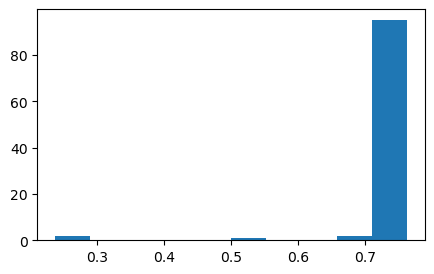

In [1]:
import torch
from torch import nn
import torch.utils.data as Data
import os, sys
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

os.chdir('C:/Users/xl037/PycharmProjects/DAIS2023CompetitionSubmission_Liu/BaselineModel_PointNet/')
cwd = os.getcwd()
print(cwd)

from data import ModelNet40
from model import *
from utils import *

import argparse

parser = argparse.ArgumentParser(description='Training PointNet.')
parser.add_argument('-lr', '--learning_rate', type=float, default=0.001,
                    help='Initial learning rate.')
parser.add_argument('-n', '--num_points', type=int, default=400,
                    help="The number of points sampled from the pointcloud.")
parser.add_argument('-m', '--model', type=str, default="PointNet.pt",
                    help="The file in which the trained model will be saved.")
parser.add_argument('-f')
args = parser.parse_args()
save_name = args.model

# seed = 2

########### loading data ###########
BASE_DIR = os.path.dirname("C:/Users/xl037/PycharmProjects/DAIS2023CompetitionSubmission_Liu/")
DATA_DIR = os.path.join(BASE_DIR, 'Datasets')
train_data_path = os.path.join(DATA_DIR, 'new_train_data.npy')
train_label_path = os.path.join(DATA_DIR, 'train_label.npy')
alldata = np.load(train_data_path)
alllabel = np.load(train_label_path)

# loop for cross-validation

N = 100

os.chdir('C:/Users/xl037/PycharmProjects/DAIS2023CompetitionSubmission_Liu/Datasets/')
mean_accuracy = []
for jk_ in range(N):
    # split the dataset to train and test data
    X_train, X_test, y_train, y_test = train_test_split(alldata, alllabel, test_size=0.2)
    np.save('X_train_data.npy', X_train)
    np.save('X_test_data.npy', X_test)
    np.save('y_train_data.npy', y_train)
    np.save('y_test_data.npy', y_test)

    num_points = 400
    train_data = ModelNet40(num_points)
    test_data = ModelNet40(num_points, 'test')

    train_size = int(0.9 * len(train_data))
    valid_size = len(train_data) - train_size
    train_data, valid_data = Data.random_split(train_data, [train_size, valid_size])
    valid_data.partition = 'valid'
    train_data.partition = 'train'

    print("train data size: ", len(train_data))
    print("valid data size: ", len(valid_data))
    print("test data size: ", len(test_data))


    def collate_fn(batch):
        Xs = torch.stack([X for X, _ in batch])
        Ys = torch.tensor([Y for _, Y in batch], dtype=torch.long)
        return Xs, Ys


    train_iter = Data.DataLoader(train_data, shuffle=True, batch_size=64, collate_fn=collate_fn)
    valid_iter = Data.DataLoader(valid_data, batch_size=64, collate_fn=collate_fn)
    test_iter = Data.DataLoader(test_data, batch_size=64, collate_fn=collate_fn)
    print(train_iter)

    ############### loading model ####################

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    net = PointNet(nfeat=3, nclass=2, dropout=0.3)
    net.to(device)
    print(net)
    ############### training #########################

    lr = args.learning_rate
    optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, net.parameters()), lr=lr, weight_decay=0.0001)
    loss = nn.NLLLoss()


    def adjust_lr(optimizer, decay_rate=0.95):
        for param_group in optimizer.param_groups:
            param_group['lr'] *= decay_rate


    retrain = True

    train_model(train_iter, valid_iter, net, loss, optimizer, device=device, max_epochs=1000,
                adjust_lr=adjust_lr, early_stop=EarlyStop(patience=50, save_name=save_name))

    ############### testing ##########################

    loss, acc = evaluate_model(test_iter, net, loss)
    print('test acc = %.6f' % (acc))
    mean_accuracy.append(acc)

print('The average accuracy is:', sum(mean_accuracy)/N)

# Creating histogram
fig, ax = plt.subplots(figsize =(5, 3))
ax.hist(mean_accuracy)
# Show plot
plt.show()